# Session 4 HW

-Zachary Wooten


In [1]:
import sys, os
import time

# This limits the amount of memory used:
# Hello Testing 123
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=2"

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy

#########################################################################
# Here's the Residual layer from the first half again:
#########################################################################
class ResidualLayer(tf.keras.Model):

    def __init__(self, n_filters):
        # tf.keras.Model.__init__(self)
        super(ResidualLayer, self).__init__()

        self.conv1 = tf.keras.layers.Conv2D(
            filters     = n_filters,
            kernel_size = (3,3),
            padding     = "same"
        )

        self.norm1 = tf.keras.layers.BatchNormalization()

        self.conv2 = tf.keras.layers.Conv2D(
            filters     = n_filters,
            kernel_size = (3,3),
            padding     = "same"
        )

        self.norm2 = tf.keras.layers.BatchNormalization()

    def call(self, inputs):

        x = inputs

        output1 = self.norm1(self.conv1(inputs))

        output1 = tf.keras.activations.relu(output1)

        output2 = self.norm2(self.conv2(output1))

        return tf.keras.activations.relu(output2 + x)

#########################################################################
# Here's layer that does a spatial downsampling:
#########################################################################
class ResidualDownsample(tf.keras.Model):

    def __init__(self, n_filters):
        # tf.keras.Model.__init__(self)
        super(ResidualDownsample, self).__init__()

        self.conv1 = tf.keras.layers.Conv2D(
            filters     = n_filters,
            kernel_size = (3,3),
            padding     = "same",
            strides     = (2,2)
        )

        self.identity = tf.keras.layers.Conv2D(
            filters     = n_filters,
            kernel_size = (1,1),
            strides     = (2,2),
            padding     = "same"
        )

        self.norm1 = tf.keras.layers.BatchNormalization()

        self.conv2 = tf.keras.layers.Conv2D(
            filters     = n_filters,
            kernel_size = (3,3),
            padding     = "same"
        )

        self.norm2 = tf.keras.layers.BatchNormalization()

    @tf.function
    def call(self, inputs):

        x = self.identity(inputs)
        output1 = self.norm1(self.conv1(inputs))
        output1 = tf.keras.activations.relu(output1)

        output2 = self.norm2(self.conv2(output1))

        return tf.keras.activations.relu(output2 + x)


#########################################################################
# Armed with that, let's build ResNet (this particular one is called ResNet34)
#########################################################################

class ResNet34(tf.keras.Model):

    def __init__(self):
        super(ResNet34, self).__init__()

        self.conv_init = tf.keras.Sequential([
            tf.keras.layers.Conv2D(
                filters     = 64,
                kernel_size = (7,7),
                strides     = (2,2),
                padding     = "same",
                use_bias    = False
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.ReLU(),
            tf.keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="same")

        ])

        self.residual_series_1 = tf.keras.Sequential([
            ResidualLayer(64),
            ResidualLayer(64),
            ResidualLayer(64),
        ])

        # Increase the number of filters:
        self.downsample_1 = ResidualDownsample(128)

        self.residual_series_2 = tf.keras.Sequential([
            ResidualLayer(128),
            ResidualLayer(128),
            ResidualLayer(128),
        ])

        # Increase the number of filters:
        self.downsample_2 = ResidualDownsample(256)

        self.residual_series_3 = tf.keras.Sequential([
            ResidualLayer(256),
            ResidualLayer(256),
            ResidualLayer(256),
            ResidualLayer(256),
            ResidualLayer(256),
        ])

        # Increase the number of filters:
        self.downsample_3 = ResidualDownsample(512)


        self.residual_series_4 = tf.keras.Sequential([
            ResidualLayer(512),
            ResidualLayer(512),
        ])

        self.final_pool = tf.keras.layers.AveragePooling2D(
            pool_size=(8,8)
        )

        self.flatten = tf.keras.layers.Flatten()
        self.classifier = tf.keras.layers.Dense(1000)

    @tf.function
    def call(self, inputs):

        x = self.conv_init(inputs)

        x = self.residual_series_1(x)


        x = self.downsample_1(x)


        x = self.residual_series_2(x)

        x = self.downsample_2(x)

        x = self.residual_series_3(x)

        x = self.downsample_3(x)


        x = self.residual_series_4(x)


        x = self.final_pool(x)

        x = self.flatten(x)

        logits = self.classifier(x)

        return logits




@tf.function
def calculate_accuracy(logits, labels):
    # We calculate top1 accuracy only here:
    selected_class = tf.argmax(logits, axis=1)

    correct = tf.cast(selected_class, tf.float32) == tf.cast(labels, tf.float32)

    return tf.reduce_mean(tf.cast(correct, tf.float32))


@tf.function
def calculate_loss(logits, labels):
    loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels, logits)
    return tf.reduce_mean(loss)

@tf.function
def training_step(network, optimizer, images, labels):
    with tf.GradientTape() as tape:
        logits = network(images)
        loss = calculate_loss(logits, labels)

    gradients = tape.gradient(loss, network.trainable_variables)

    optimizer.apply_gradients(zip(gradients, network.trainable_variables))

    accuracy = calculate_accuracy(logits, labels)

    return loss, accuracy

def train_epoch(i_epoch, step_in_epoch, train_ds, val_ds, network, optimizer, BATCH_SIZE, checkpoint):
    # Here is our training loop!

    steps_per_epoch = int(1281167 / BATCH_SIZE)
    steps_validation = int(50000 / BATCH_SIZE)

        #Create history variable for plot of acc and loss
    history_acc = numpy.array(0)
    history_loss = numpy.array(0)



    start = time.time()
    for train_images, train_labels in train_ds.take(steps_per_epoch):
        if step_in_epoch > steps_per_epoch: break
        else: step_in_epoch.assign_add(1)

        # Peform the training step for this batch
        loss, acc = training_step(network, optimizer, train_images, train_labels)
        
        # Update Loss and Acc histories
        history_acc = numpy.append(history_acc, acc)
        history_loss = numpy.append(history_loss, loss)
        
        end = time.time()
        images_per_second = BATCH_SIZE / (end - start)
        print(f"Finished step {step_in_epoch.numpy()} of {steps_per_epoch} in epoch {i_epoch.numpy()},loss={loss:.3f}, acc={acc:.3f} ({images_per_second:.3f} img/s).")
        start = time.time()


    # Save the network after every epoch:
    checkpoint.save("resnet34/model")

    #Creat plots
    history_acc = numpy.delete(history_acc,0)
    history_loss = numpy.delete(history_loss, 0)
    
    plt.subplot(1, 2, 1)
    plt.plot(range(len(history_acc)),history_acc, 'r')
    plt.title('accuracy');

    plt.subplot(1, 2, 2)
    plt.plot(range(len(history_loss)),history_loss, 'b')
    plt.title('loss');
    

    # Compute the validation accuracy:
    mean_accuracy = None
    for val_images, val_labels in val_ds.take(steps_validation):
        logits = network(val_images)
        accuracy = calculate_accuracy(logits, val_labels)
        if mean_accuracy is None:
            mean_accuracy = accuracy
        else:
            mean_accuracy += accuracy

    mean_accuracy /= steps_validation

    print(f"Validation accuracy after epoch {i_epoch.numpy()}: {mean_accuracy:.4f}.")



def prepare_data_loader(BATCH_SIZE):


    tf.config.threading.set_inter_op_parallelism_threads(8)
    tf.config.threading.set_intra_op_parallelism_threads(8)

    print("Parameters set, preparing dataloading")
    #########################################################################
    # Here's the part where we load datasets:
    import json


    # What's in this function?  Tune in next week ...
    from ilsvrc_dataset import get_datasets


    class FakeHvd:

        def size(self): return 1

        def rank(self): return 0


    with open("ilsvrc.json", 'r') as f:
        config = json.load(f)

    print(json.dumps(config, indent=4))


    config['hvd'] = FakeHvd()
    config['data']['batch_size'] = BATCH_SIZE

    train_ds, val_ds = get_datasets(config)
    print("Datasets ready, creating network.")
    #########################################################################

    return train_ds, val_ds





Parameters set, preparing dataloading


--------------------------------------------------------------------------

  Local host:   thetagpu06
  Local device: mlx5_0
--------------------------------------------------------------------------


{
    "data": {
        "handler": "ilsvrc_dataset",
        "batch_size": 128,
        "train_filelist": "/lus/grand/projects/ALCFAITP/ilsvrc_train_filelist.txt",
        "test_filelist": "/lus/grand/projects/ALCFAITP/ilsvrc_val_filelist.txt",
        "shuffle_buffer": 200000,
        "reshuffle_each_iteration": true,
        "num_parallel_readers": 8,
        "prefectch_buffer_size": 10,
        "crop_image_size": [
            256,
            256
        ],
        "num_classes": 1000,
        "num_channels": 3
    }
}
num labels: 1000
build dataset /lus/grand/projects/ALCFAITP/ilsvrc_train_filelist.txt
input filelist contains 1281167 files, estimated batches per rank 116469
build dataset /lus/grand/projects/ALCFAITP/ilsvrc_val_filelist.txt
input filelist contains 50000 files, estimated batches per rank 4545
Datasets ready, creating network.
Initial Image size:  (11, 256, 256, 3)
output shape: (11, 1000)
Model: "res_net34"
___________________________________________________________

Finished step 5071 of 116469 in epoch 0,loss=5.440, acc=0.000 (432.609 img/s).
Finished step 5072 of 116469 in epoch 0,loss=4.227, acc=0.182 (412.069 img/s).
Finished step 5073 of 116469 in epoch 0,loss=4.717, acc=0.000 (478.638 img/s).
Finished step 5074 of 116469 in epoch 0,loss=4.071, acc=0.182 (450.948 img/s).
Finished step 5075 of 116469 in epoch 0,loss=4.191, acc=0.182 (415.652 img/s).
Finished step 5076 of 116469 in epoch 0,loss=4.009, acc=0.091 (417.793 img/s).
Finished step 5077 of 116469 in epoch 0,loss=3.861, acc=0.000 (423.757 img/s).
Finished step 5078 of 116469 in epoch 0,loss=3.792, acc=0.000 (477.845 img/s).
Finished step 5079 of 116469 in epoch 0,loss=3.503, acc=0.182 (438.881 img/s).
Finished step 5080 of 116469 in epoch 0,loss=3.523, acc=0.182 (441.396 img/s).
Finished step 5081 of 116469 in epoch 0,loss=4.089, acc=0.091 (451.111 img/s).
Finished step 5082 of 116469 in epoch 0,loss=5.171, acc=0.091 (432.565 img/s).
Finished step 5083 of 116469 in epoch 0,loss=4.617, 

Finished step 5177 of 116469 in epoch 0,loss=4.183, acc=0.182 (423.850 img/s).
Finished step 5178 of 116469 in epoch 0,loss=3.814, acc=0.000 (416.402 img/s).
Finished step 5179 of 116469 in epoch 0,loss=3.724, acc=0.182 (441.058 img/s).
Finished step 5180 of 116469 in epoch 0,loss=3.926, acc=0.364 (437.288 img/s).
Finished step 5181 of 116469 in epoch 0,loss=3.698, acc=0.182 (409.491 img/s).
Finished step 5182 of 116469 in epoch 0,loss=4.671, acc=0.000 (425.284 img/s).
Finished step 5183 of 116469 in epoch 0,loss=4.161, acc=0.273 (434.934 img/s).
Finished step 5184 of 116469 in epoch 0,loss=3.557, acc=0.182 (493.743 img/s).
Finished step 5185 of 116469 in epoch 0,loss=3.119, acc=0.182 (428.929 img/s).
Finished step 5186 of 116469 in epoch 0,loss=4.265, acc=0.000 (408.165 img/s).
Finished step 5187 of 116469 in epoch 0,loss=4.240, acc=0.000 (480.277 img/s).
Finished step 5188 of 116469 in epoch 0,loss=2.894, acc=0.364 (490.353 img/s).
Finished step 5189 of 116469 in epoch 0,loss=4.201, 

Finished step 5288 of 116469 in epoch 0,loss=4.714, acc=0.091 (442.509 img/s).
Finished step 5289 of 116469 in epoch 0,loss=4.189, acc=0.091 (456.579 img/s).
Finished step 5290 of 116469 in epoch 0,loss=4.113, acc=0.000 (426.731 img/s).
Finished step 5291 of 116469 in epoch 0,loss=4.032, acc=0.091 (453.706 img/s).
Finished step 5292 of 116469 in epoch 0,loss=4.011, acc=0.273 (455.336 img/s).
Finished step 5293 of 116469 in epoch 0,loss=4.424, acc=0.091 (443.023 img/s).
Finished step 5294 of 116469 in epoch 0,loss=3.264, acc=0.182 (436.291 img/s).
Finished step 5295 of 116469 in epoch 0,loss=3.520, acc=0.091 (441.447 img/s).
Finished step 5296 of 116469 in epoch 0,loss=4.612, acc=0.091 (425.661 img/s).
Finished step 5297 of 116469 in epoch 0,loss=4.267, acc=0.000 (413.699 img/s).
Finished step 5298 of 116469 in epoch 0,loss=4.203, acc=0.091 (434.111 img/s).
Finished step 5299 of 116469 in epoch 0,loss=3.490, acc=0.000 (428.483 img/s).
Finished step 5300 of 116469 in epoch 0,loss=3.944, 

Finished step 5395 of 116469 in epoch 0,loss=3.502, acc=0.273 (424.111 img/s).
Finished step 5396 of 116469 in epoch 0,loss=4.109, acc=0.091 (438.622 img/s).
Finished step 5397 of 116469 in epoch 0,loss=4.656, acc=0.091 (470.756 img/s).
Finished step 5398 of 116469 in epoch 0,loss=5.158, acc=0.000 (415.435 img/s).
Finished step 5399 of 116469 in epoch 0,loss=3.269, acc=0.273 (425.771 img/s).
Finished step 5400 of 116469 in epoch 0,loss=3.754, acc=0.091 (427.764 img/s).
Finished step 5401 of 116469 in epoch 0,loss=3.874, acc=0.091 (468.966 img/s).
Finished step 5402 of 116469 in epoch 0,loss=3.450, acc=0.182 (417.865 img/s).
Finished step 5403 of 116469 in epoch 0,loss=4.277, acc=0.182 (421.796 img/s).
Finished step 5404 of 116469 in epoch 0,loss=4.308, acc=0.091 (434.058 img/s).
Finished step 5405 of 116469 in epoch 0,loss=3.639, acc=0.273 (490.296 img/s).
Finished step 5406 of 116469 in epoch 0,loss=3.728, acc=0.273 (436.089 img/s).
Finished step 5407 of 116469 in epoch 0,loss=3.858, 

Finished step 5499 of 116469 in epoch 0,loss=3.787, acc=0.273 (470.031 img/s).
Finished step 5500 of 116469 in epoch 0,loss=3.870, acc=0.091 (472.762 img/s).
Finished step 5501 of 116469 in epoch 0,loss=4.248, acc=0.182 (419.240 img/s).
Finished step 5502 of 116469 in epoch 0,loss=4.192, acc=0.000 (459.448 img/s).
Finished step 5503 of 116469 in epoch 0,loss=4.552, acc=0.000 (455.664 img/s).
Finished step 5504 of 116469 in epoch 0,loss=4.130, acc=0.091 (447.249 img/s).
Finished step 5505 of 116469 in epoch 0,loss=4.072, acc=0.182 (411.294 img/s).
Finished step 5506 of 116469 in epoch 0,loss=3.546, acc=0.364 (432.273 img/s).
Finished step 5507 of 116469 in epoch 0,loss=3.487, acc=0.273 (430.852 img/s).
Finished step 5508 of 116469 in epoch 0,loss=4.362, acc=0.000 (456.408 img/s).
Finished step 5509 of 116469 in epoch 0,loss=3.649, acc=0.182 (445.062 img/s).
Finished step 5510 of 116469 in epoch 0,loss=2.955, acc=0.182 (442.951 img/s).
Finished step 5511 of 116469 in epoch 0,loss=3.414, 

Finished step 5609 of 116469 in epoch 0,loss=3.056, acc=0.182 (448.885 img/s).
Finished step 5610 of 116469 in epoch 0,loss=3.375, acc=0.091 (444.201 img/s).
Finished step 5611 of 116469 in epoch 0,loss=3.422, acc=0.000 (463.664 img/s).
Finished step 5612 of 116469 in epoch 0,loss=3.740, acc=0.273 (457.526 img/s).
Finished step 5613 of 116469 in epoch 0,loss=3.150, acc=0.182 (441.455 img/s).
Finished step 5614 of 116469 in epoch 0,loss=4.527, acc=0.000 (450.353 img/s).
Finished step 5615 of 116469 in epoch 0,loss=4.064, acc=0.091 (449.239 img/s).
Finished step 5616 of 116469 in epoch 0,loss=3.335, acc=0.273 (444.419 img/s).
Finished step 5617 of 116469 in epoch 0,loss=4.695, acc=0.091 (460.365 img/s).
Finished step 5618 of 116469 in epoch 0,loss=3.084, acc=0.364 (438.126 img/s).
Finished step 5619 of 116469 in epoch 0,loss=4.255, acc=0.091 (441.814 img/s).
Finished step 5620 of 116469 in epoch 0,loss=3.571, acc=0.182 (446.950 img/s).
Finished step 5621 of 116469 in epoch 0,loss=4.009, 

Finished step 5717 of 116469 in epoch 0,loss=4.215, acc=0.000 (411.173 img/s).
Finished step 5718 of 116469 in epoch 0,loss=3.634, acc=0.091 (378.877 img/s).
Finished step 5719 of 116469 in epoch 0,loss=4.613, acc=0.000 (462.080 img/s).
Finished step 5720 of 116469 in epoch 0,loss=3.415, acc=0.182 (470.261 img/s).
Finished step 5721 of 116469 in epoch 0,loss=3.056, acc=0.273 (97.629 img/s).
Finished step 5722 of 116469 in epoch 0,loss=4.094, acc=0.182 (388.705 img/s).
Finished step 5723 of 116469 in epoch 0,loss=4.177, acc=0.091 (420.424 img/s).
Finished step 5724 of 116469 in epoch 0,loss=4.222, acc=0.091 (399.769 img/s).
Finished step 5725 of 116469 in epoch 0,loss=3.854, acc=0.091 (371.001 img/s).
Finished step 5726 of 116469 in epoch 0,loss=3.264, acc=0.273 (407.268 img/s).
Finished step 5727 of 116469 in epoch 0,loss=3.703, acc=0.091 (408.154 img/s).
Finished step 5728 of 116469 in epoch 0,loss=4.944, acc=0.091 (388.263 img/s).
Finished step 5729 of 116469 in epoch 0,loss=4.334, a

Finished step 5824 of 116469 in epoch 0,loss=3.295, acc=0.273 (445.401 img/s).
Finished step 5825 of 116469 in epoch 0,loss=3.154, acc=0.364 (456.146 img/s).
Finished step 5826 of 116469 in epoch 0,loss=4.022, acc=0.091 (405.314 img/s).
Finished step 5827 of 116469 in epoch 0,loss=4.071, acc=0.091 (449.279 img/s).
Finished step 5828 of 116469 in epoch 0,loss=4.114, acc=0.091 (425.123 img/s).
Finished step 5829 of 116469 in epoch 0,loss=3.865, acc=0.091 (428.034 img/s).
Finished step 5830 of 116469 in epoch 0,loss=3.974, acc=0.273 (408.071 img/s).
Finished step 5831 of 116469 in epoch 0,loss=4.093, acc=0.091 (418.795 img/s).
Finished step 5832 of 116469 in epoch 0,loss=3.790, acc=0.182 (454.824 img/s).
Finished step 5833 of 116469 in epoch 0,loss=3.640, acc=0.273 (435.941 img/s).
Finished step 5834 of 116469 in epoch 0,loss=3.345, acc=0.182 (453.942 img/s).
Finished step 5835 of 116469 in epoch 0,loss=2.861, acc=0.364 (454.828 img/s).
Finished step 5836 of 116469 in epoch 0,loss=3.808, 

Finished step 5932 of 116469 in epoch 0,loss=4.015, acc=0.091 (456.390 img/s).
Finished step 5933 of 116469 in epoch 0,loss=2.890, acc=0.273 (441.785 img/s).
Finished step 5934 of 116469 in epoch 0,loss=3.980, acc=0.182 (427.119 img/s).
Finished step 5935 of 116469 in epoch 0,loss=4.117, acc=0.182 (428.153 img/s).
Finished step 5936 of 116469 in epoch 0,loss=3.916, acc=0.182 (418.863 img/s).
Finished step 5937 of 116469 in epoch 0,loss=3.848, acc=0.091 (432.038 img/s).
Finished step 5938 of 116469 in epoch 0,loss=2.903, acc=0.364 (427.574 img/s).
Finished step 5939 of 116469 in epoch 0,loss=3.361, acc=0.273 (441.147 img/s).
Finished step 5940 of 116469 in epoch 0,loss=4.258, acc=0.091 (424.142 img/s).
Finished step 5941 of 116469 in epoch 0,loss=3.970, acc=0.273 (441.244 img/s).
Finished step 5942 of 116469 in epoch 0,loss=2.878, acc=0.455 (440.620 img/s).
Finished step 5943 of 116469 in epoch 0,loss=4.484, acc=0.000 (454.990 img/s).
Finished step 5944 of 116469 in epoch 0,loss=3.659, 

Finished step 6042 of 116469 in epoch 0,loss=3.397, acc=0.273 (429.017 img/s).
Finished step 6043 of 116469 in epoch 0,loss=3.058, acc=0.273 (438.468 img/s).
Finished step 6044 of 116469 in epoch 0,loss=4.532, acc=0.182 (502.564 img/s).
Finished step 6045 of 116469 in epoch 0,loss=3.421, acc=0.182 (481.772 img/s).
Finished step 6046 of 116469 in epoch 0,loss=3.248, acc=0.182 (439.529 img/s).
Finished step 6047 of 116469 in epoch 0,loss=3.854, acc=0.091 (462.971 img/s).
Finished step 6048 of 116469 in epoch 0,loss=3.518, acc=0.091 (462.016 img/s).
Finished step 6049 of 116469 in epoch 0,loss=4.085, acc=0.182 (448.741 img/s).
Finished step 6050 of 116469 in epoch 0,loss=4.203, acc=0.091 (403.892 img/s).
Finished step 6051 of 116469 in epoch 0,loss=2.469, acc=0.273 (422.225 img/s).
Finished step 6052 of 116469 in epoch 0,loss=4.387, acc=0.091 (415.195 img/s).
Finished step 6053 of 116469 in epoch 0,loss=3.216, acc=0.182 (507.355 img/s).
Finished step 6054 of 116469 in epoch 0,loss=3.619, 

Finished step 6150 of 116469 in epoch 0,loss=2.655, acc=0.455 (465.291 img/s).
Finished step 6151 of 116469 in epoch 0,loss=2.997, acc=0.455 (471.102 img/s).
Finished step 6152 of 116469 in epoch 0,loss=3.388, acc=0.182 (421.123 img/s).
Finished step 6153 of 116469 in epoch 0,loss=3.423, acc=0.273 (435.513 img/s).
Finished step 6154 of 116469 in epoch 0,loss=4.120, acc=0.000 (409.229 img/s).
Finished step 6155 of 116469 in epoch 0,loss=2.674, acc=0.455 (496.501 img/s).
Finished step 6156 of 116469 in epoch 0,loss=3.481, acc=0.364 (430.317 img/s).
Finished step 6157 of 116469 in epoch 0,loss=3.826, acc=0.273 (474.918 img/s).
Finished step 6158 of 116469 in epoch 0,loss=4.304, acc=0.000 (479.429 img/s).
Finished step 6159 of 116469 in epoch 0,loss=3.366, acc=0.273 (448.397 img/s).
Finished step 6160 of 116469 in epoch 0,loss=4.420, acc=0.091 (438.839 img/s).
Finished step 6161 of 116469 in epoch 0,loss=4.271, acc=0.000 (513.951 img/s).
Finished step 6162 of 116469 in epoch 0,loss=4.458, 

Finished step 6261 of 116469 in epoch 0,loss=3.104, acc=0.091 (427.111 img/s).
Finished step 6262 of 116469 in epoch 0,loss=4.179, acc=0.091 (438.480 img/s).
Finished step 6263 of 116469 in epoch 0,loss=3.324, acc=0.273 (433.964 img/s).
Finished step 6264 of 116469 in epoch 0,loss=3.444, acc=0.273 (434.222 img/s).
Finished step 6265 of 116469 in epoch 0,loss=3.834, acc=0.182 (454.887 img/s).
Finished step 6266 of 116469 in epoch 0,loss=3.617, acc=0.182 (442.335 img/s).
Finished step 6267 of 116469 in epoch 0,loss=3.069, acc=0.273 (451.986 img/s).
Finished step 6268 of 116469 in epoch 0,loss=3.453, acc=0.182 (506.636 img/s).
Finished step 6269 of 116469 in epoch 0,loss=3.994, acc=0.182 (448.589 img/s).
Finished step 6270 of 116469 in epoch 0,loss=3.600, acc=0.273 (507.819 img/s).
Finished step 6271 of 116469 in epoch 0,loss=3.021, acc=0.364 (457.014 img/s).
Finished step 6272 of 116469 in epoch 0,loss=3.428, acc=0.182 (513.859 img/s).
Finished step 6273 of 116469 in epoch 0,loss=4.484, 

Finished step 6372 of 116469 in epoch 0,loss=4.251, acc=0.091 (424.630 img/s).
Finished step 6373 of 116469 in epoch 0,loss=3.504, acc=0.273 (427.788 img/s).
Finished step 6374 of 116469 in epoch 0,loss=4.427, acc=0.182 (423.011 img/s).
Finished step 6375 of 116469 in epoch 0,loss=3.549, acc=0.091 (457.848 img/s).
Finished step 6376 of 116469 in epoch 0,loss=4.060, acc=0.091 (433.552 img/s).
Finished step 6377 of 116469 in epoch 0,loss=3.765, acc=0.273 (453.002 img/s).
Finished step 6378 of 116469 in epoch 0,loss=3.118, acc=0.182 (430.671 img/s).
Finished step 6379 of 116469 in epoch 0,loss=2.812, acc=0.091 (478.107 img/s).
Finished step 6380 of 116469 in epoch 0,loss=4.375, acc=0.182 (488.593 img/s).
Finished step 6381 of 116469 in epoch 0,loss=3.611, acc=0.364 (436.948 img/s).
Finished step 6382 of 116469 in epoch 0,loss=4.195, acc=0.273 (450.081 img/s).
Finished step 6383 of 116469 in epoch 0,loss=3.657, acc=0.091 (488.226 img/s).
Finished step 6384 of 116469 in epoch 0,loss=3.611, 

Finished step 6483 of 116469 in epoch 0,loss=4.123, acc=0.091 (414.371 img/s).
Finished step 6484 of 116469 in epoch 0,loss=3.605, acc=0.091 (430.631 img/s).
Finished step 6485 of 116469 in epoch 0,loss=4.099, acc=0.091 (435.406 img/s).
Finished step 6486 of 116469 in epoch 0,loss=4.161, acc=0.091 (414.420 img/s).
Finished step 6487 of 116469 in epoch 0,loss=3.090, acc=0.364 (392.882 img/s).
Finished step 6488 of 116469 in epoch 0,loss=4.282, acc=0.091 (434.111 img/s).
Finished step 6489 of 116469 in epoch 0,loss=3.451, acc=0.091 (441.164 img/s).
Finished step 6490 of 116469 in epoch 0,loss=3.788, acc=0.182 (490.781 img/s).
Finished step 6491 of 116469 in epoch 0,loss=2.979, acc=0.273 (398.251 img/s).
Finished step 6492 of 116469 in epoch 0,loss=3.975, acc=0.091 (424.170 img/s).
Finished step 6493 of 116469 in epoch 0,loss=4.705, acc=0.000 (429.364 img/s).
Finished step 6494 of 116469 in epoch 0,loss=3.458, acc=0.182 (424.798 img/s).
Finished step 6495 of 116469 in epoch 0,loss=3.285, 

Finished step 6595 of 116469 in epoch 0,loss=3.297, acc=0.273 (448.794 img/s).
Finished step 6596 of 116469 in epoch 0,loss=4.368, acc=0.000 (432.467 img/s).
Finished step 6597 of 116469 in epoch 0,loss=3.965, acc=0.273 (426.432 img/s).
Finished step 6598 of 116469 in epoch 0,loss=4.049, acc=0.091 (434.152 img/s).
Finished step 6599 of 116469 in epoch 0,loss=4.313, acc=0.091 (434.864 img/s).
Finished step 6600 of 116469 in epoch 0,loss=3.651, acc=0.273 (453.211 img/s).
Finished step 6601 of 116469 in epoch 0,loss=4.362, acc=0.000 (422.763 img/s).
Finished step 6602 of 116469 in epoch 0,loss=3.935, acc=0.182 (461.623 img/s).
Finished step 6603 of 116469 in epoch 0,loss=3.699, acc=0.182 (445.625 img/s).
Finished step 6604 of 116469 in epoch 0,loss=3.716, acc=0.091 (433.060 img/s).
Finished step 6605 of 116469 in epoch 0,loss=4.567, acc=0.000 (483.600 img/s).
Finished step 6606 of 116469 in epoch 0,loss=3.792, acc=0.273 (467.162 img/s).
Finished step 6607 of 116469 in epoch 0,loss=2.573, 

Finished step 6705 of 116469 in epoch 0,loss=3.706, acc=0.091 (413.717 img/s).
Finished step 6706 of 116469 in epoch 0,loss=3.191, acc=0.182 (445.526 img/s).
Finished step 6707 of 116469 in epoch 0,loss=3.482, acc=0.182 (451.451 img/s).
Finished step 6708 of 116469 in epoch 0,loss=3.826, acc=0.091 (428.463 img/s).
Finished step 6709 of 116469 in epoch 0,loss=3.723, acc=0.091 (438.505 img/s).
Finished step 6710 of 116469 in epoch 0,loss=4.077, acc=0.182 (473.519 img/s).
Finished step 6711 of 116469 in epoch 0,loss=3.688, acc=0.273 (438.143 img/s).
Finished step 6712 of 116469 in epoch 0,loss=3.800, acc=0.364 (462.943 img/s).
Finished step 6713 of 116469 in epoch 0,loss=3.579, acc=0.182 (459.929 img/s).
Finished step 6714 of 116469 in epoch 0,loss=3.653, acc=0.091 (461.771 img/s).
Finished step 6715 of 116469 in epoch 0,loss=2.510, acc=0.455 (440.385 img/s).
Finished step 6716 of 116469 in epoch 0,loss=3.658, acc=0.182 (437.288 img/s).
Finished step 6717 of 116469 in epoch 0,loss=3.556, 

Finished step 6814 of 116469 in epoch 0,loss=3.237, acc=0.182 (375.987 img/s).
Finished step 6815 of 116469 in epoch 0,loss=3.761, acc=0.182 (206.229 img/s).
Finished step 6816 of 116469 in epoch 0,loss=4.273, acc=0.000 (282.459 img/s).
Finished step 6817 of 116469 in epoch 0,loss=3.919, acc=0.182 (401.557 img/s).
Finished step 6818 of 116469 in epoch 0,loss=4.251, acc=0.182 (444.402 img/s).
Finished step 6819 of 116469 in epoch 0,loss=3.363, acc=0.273 (388.902 img/s).
Finished step 6820 of 116469 in epoch 0,loss=3.526, acc=0.091 (460.407 img/s).
Finished step 6821 of 116469 in epoch 0,loss=3.851, acc=0.273 (435.131 img/s).
Finished step 6822 of 116469 in epoch 0,loss=3.979, acc=0.091 (436.279 img/s).
Finished step 6823 of 116469 in epoch 0,loss=3.399, acc=0.091 (457.707 img/s).
Finished step 6824 of 116469 in epoch 0,loss=4.031, acc=0.182 (449.993 img/s).
Finished step 6825 of 116469 in epoch 0,loss=4.503, acc=0.000 (428.248 img/s).
Finished step 6826 of 116469 in epoch 0,loss=2.865, 

Finished step 6922 of 116469 in epoch 0,loss=4.303, acc=0.091 (433.658 img/s).
Finished step 6923 of 116469 in epoch 0,loss=4.415, acc=0.091 (435.192 img/s).
Finished step 6924 of 116469 in epoch 0,loss=3.828, acc=0.182 (466.213 img/s).
Finished step 6925 of 116469 in epoch 0,loss=3.215, acc=0.182 (436.448 img/s).
Finished step 6926 of 116469 in epoch 0,loss=2.866, acc=0.364 (433.239 img/s).
Finished step 6927 of 116469 in epoch 0,loss=3.524, acc=0.182 (427.974 img/s).
Finished step 6928 of 116469 in epoch 0,loss=2.991, acc=0.273 (423.057 img/s).
Finished step 6929 of 116469 in epoch 0,loss=4.357, acc=0.091 (494.723 img/s).
Finished step 6930 of 116469 in epoch 0,loss=3.203, acc=0.182 (435.114 img/s).
Finished step 6931 of 116469 in epoch 0,loss=3.624, acc=0.182 (443.483 img/s).
Finished step 6932 of 116469 in epoch 0,loss=4.508, acc=0.182 (453.791 img/s).
Finished step 6933 of 116469 in epoch 0,loss=4.938, acc=0.000 (452.744 img/s).
Finished step 6934 of 116469 in epoch 0,loss=3.802, 

Finished step 7033 of 116469 in epoch 0,loss=3.629, acc=0.182 (439.642 img/s).
Finished step 7034 of 116469 in epoch 0,loss=3.207, acc=0.182 (466.916 img/s).
Finished step 7035 of 116469 in epoch 0,loss=4.024, acc=0.091 (450.912 img/s).
Finished step 7036 of 116469 in epoch 0,loss=4.088, acc=0.182 (432.824 img/s).
Finished step 7037 of 116469 in epoch 0,loss=3.761, acc=0.364 (426.953 img/s).
Finished step 7038 of 116469 in epoch 0,loss=4.015, acc=0.091 (455.934 img/s).
Finished step 7039 of 116469 in epoch 0,loss=3.790, acc=0.091 (472.443 img/s).
Finished step 7040 of 116469 in epoch 0,loss=4.706, acc=0.000 (437.619 img/s).
Finished step 7041 of 116469 in epoch 0,loss=3.315, acc=0.455 (462.266 img/s).
Finished step 7042 of 116469 in epoch 0,loss=3.792, acc=0.182 (423.675 img/s).
Finished step 7043 of 116469 in epoch 0,loss=3.711, acc=0.091 (411.401 img/s).
Finished step 7044 of 116469 in epoch 0,loss=4.130, acc=0.182 (448.297 img/s).
Finished step 7045 of 116469 in epoch 0,loss=3.692, 

Finished step 7137 of 116469 in epoch 0,loss=4.617, acc=0.000 (468.552 img/s).
Finished step 7138 of 116469 in epoch 0,loss=2.710, acc=0.273 (448.768 img/s).
Finished step 7139 of 116469 in epoch 0,loss=4.226, acc=0.000 (541.906 img/s).
Finished step 7140 of 116469 in epoch 0,loss=3.943, acc=0.182 (576.746 img/s).
Finished step 7141 of 116469 in epoch 0,loss=3.389, acc=0.364 (454.416 img/s).
Finished step 7142 of 116469 in epoch 0,loss=3.979, acc=0.182 (371.698 img/s).
Finished step 7143 of 116469 in epoch 0,loss=3.322, acc=0.273 (434.860 img/s).
Finished step 7144 of 116469 in epoch 0,loss=3.694, acc=0.182 (433.410 img/s).
Finished step 7145 of 116469 in epoch 0,loss=3.074, acc=0.273 (442.221 img/s).
Finished step 7146 of 116469 in epoch 0,loss=3.981, acc=0.273 (431.182 img/s).
Finished step 7147 of 116469 in epoch 0,loss=4.292, acc=0.091 (418.146 img/s).
Finished step 7148 of 116469 in epoch 0,loss=3.671, acc=0.091 (411.448 img/s).
Finished step 7149 of 116469 in epoch 0,loss=2.401, 

Finished step 7241 of 116469 in epoch 0,loss=4.463, acc=0.000 (431.678 img/s).
Finished step 7242 of 116469 in epoch 0,loss=3.419, acc=0.273 (446.017 img/s).
Finished step 7243 of 116469 in epoch 0,loss=3.830, acc=0.273 (488.272 img/s).
Finished step 7244 of 116469 in epoch 0,loss=3.489, acc=0.182 (446.004 img/s).
Finished step 7245 of 116469 in epoch 0,loss=3.875, acc=0.000 (453.715 img/s).
Finished step 7246 of 116469 in epoch 0,loss=4.086, acc=0.000 (440.284 img/s).
Finished step 7247 of 116469 in epoch 0,loss=3.528, acc=0.091 (459.174 img/s).
Finished step 7248 of 116469 in epoch 0,loss=2.752, acc=0.273 (446.190 img/s).
Finished step 7249 of 116469 in epoch 0,loss=3.844, acc=0.000 (429.872 img/s).
Finished step 7250 of 116469 in epoch 0,loss=3.086, acc=0.545 (435.875 img/s).
Finished step 7251 of 116469 in epoch 0,loss=3.348, acc=0.364 (437.977 img/s).
Finished step 7252 of 116469 in epoch 0,loss=4.396, acc=0.091 (446.920 img/s).
Finished step 7253 of 116469 in epoch 0,loss=4.775, 

Finished step 7345 of 116469 in epoch 0,loss=3.873, acc=0.182 (425.452 img/s).
Finished step 7346 of 116469 in epoch 0,loss=3.861, acc=0.182 (405.019 img/s).
Finished step 7347 of 116469 in epoch 0,loss=3.325, acc=0.364 (438.118 img/s).
Finished step 7348 of 116469 in epoch 0,loss=3.060, acc=0.273 (419.057 img/s).
Finished step 7349 of 116469 in epoch 0,loss=3.670, acc=0.000 (428.113 img/s).
Finished step 7350 of 116469 in epoch 0,loss=4.310, acc=0.000 (475.265 img/s).
Finished step 7351 of 116469 in epoch 0,loss=3.178, acc=0.182 (429.556 img/s).
Finished step 7352 of 116469 in epoch 0,loss=2.631, acc=0.364 (492.610 img/s).
Finished step 7353 of 116469 in epoch 0,loss=4.017, acc=0.273 (431.884 img/s).
Finished step 7354 of 116469 in epoch 0,loss=3.597, acc=0.091 (472.167 img/s).
Finished step 7355 of 116469 in epoch 0,loss=3.098, acc=0.364 (406.848 img/s).
Finished step 7356 of 116469 in epoch 0,loss=4.274, acc=0.091 (474.108 img/s).
Finished step 7357 of 116469 in epoch 0,loss=3.940, 

Finished step 7449 of 116469 in epoch 0,loss=3.163, acc=0.091 (428.539 img/s).
Finished step 7450 of 116469 in epoch 0,loss=3.791, acc=0.182 (429.061 img/s).
Finished step 7451 of 116469 in epoch 0,loss=4.099, acc=0.182 (452.034 img/s).
Finished step 7452 of 116469 in epoch 0,loss=4.052, acc=0.091 (441.480 img/s).
Finished step 7453 of 116469 in epoch 0,loss=3.295, acc=0.000 (431.392 img/s).
Finished step 7454 of 116469 in epoch 0,loss=4.624, acc=0.091 (418.548 img/s).
Finished step 7455 of 116469 in epoch 0,loss=3.910, acc=0.091 (456.543 img/s).
Finished step 7456 of 116469 in epoch 0,loss=3.404, acc=0.182 (453.893 img/s).
Finished step 7457 of 116469 in epoch 0,loss=3.926, acc=0.091 (460.416 img/s).
Finished step 7458 of 116469 in epoch 0,loss=3.743, acc=0.182 (425.217 img/s).
Finished step 7459 of 116469 in epoch 0,loss=3.698, acc=0.000 (471.275 img/s).
Finished step 7460 of 116469 in epoch 0,loss=4.485, acc=0.182 (483.438 img/s).
Finished step 7461 of 116469 in epoch 0,loss=3.727, 

Finished step 7561 of 116469 in epoch 0,loss=3.021, acc=0.182 (437.636 img/s).
Finished step 7562 of 116469 in epoch 0,loss=4.574, acc=0.273 (447.996 img/s).
Finished step 7563 of 116469 in epoch 0,loss=4.266, acc=0.182 (487.895 img/s).
Finished step 7564 of 116469 in epoch 0,loss=3.295, acc=0.182 (491.419 img/s).
Finished step 7565 of 116469 in epoch 0,loss=3.622, acc=0.273 (424.068 img/s).
Finished step 7566 of 116469 in epoch 0,loss=3.137, acc=0.182 (460.108 img/s).
Finished step 7567 of 116469 in epoch 0,loss=3.195, acc=0.182 (431.372 img/s).
Finished step 7568 of 116469 in epoch 0,loss=3.699, acc=0.000 (450.230 img/s).
Finished step 7569 of 116469 in epoch 0,loss=2.872, acc=0.364 (437.375 img/s).
Finished step 7570 of 116469 in epoch 0,loss=3.251, acc=0.091 (437.130 img/s).
Finished step 7571 of 116469 in epoch 0,loss=3.333, acc=0.273 (447.805 img/s).
Finished step 7572 of 116469 in epoch 0,loss=3.530, acc=0.091 (410.979 img/s).
Finished step 7573 of 116469 in epoch 0,loss=5.390, 

Finished step 7666 of 116469 in epoch 0,loss=4.436, acc=0.000 (456.236 img/s).
Finished step 7667 of 116469 in epoch 0,loss=2.764, acc=0.273 (441.417 img/s).
Finished step 7668 of 116469 in epoch 0,loss=4.894, acc=0.091 (442.611 img/s).
Finished step 7669 of 116469 in epoch 0,loss=3.702, acc=0.273 (436.820 img/s).
Finished step 7670 of 116469 in epoch 0,loss=3.838, acc=0.091 (434.819 img/s).
Finished step 7671 of 116469 in epoch 0,loss=3.925, acc=0.091 (432.079 img/s).
Finished step 7672 of 116469 in epoch 0,loss=3.405, acc=0.182 (518.759 img/s).
Finished step 7673 of 116469 in epoch 0,loss=3.790, acc=0.273 (443.564 img/s).
Finished step 7674 of 116469 in epoch 0,loss=3.556, acc=0.273 (466.505 img/s).
Finished step 7675 of 116469 in epoch 0,loss=3.953, acc=0.273 (450.380 img/s).
Finished step 7676 of 116469 in epoch 0,loss=3.806, acc=0.182 (417.733 img/s).
Finished step 7677 of 116469 in epoch 0,loss=2.546, acc=0.364 (492.305 img/s).
Finished step 7678 of 116469 in epoch 0,loss=3.109, 

Finished step 7771 of 116469 in epoch 0,loss=3.017, acc=0.182 (460.149 img/s).
Finished step 7772 of 116469 in epoch 0,loss=3.314, acc=0.182 (440.519 img/s).
Finished step 7773 of 116469 in epoch 0,loss=4.058, acc=0.000 (424.892 img/s).
Finished step 7774 of 116469 in epoch 0,loss=3.294, acc=0.182 (424.720 img/s).
Finished step 7775 of 116469 in epoch 0,loss=3.430, acc=0.273 (410.884 img/s).
Finished step 7776 of 116469 in epoch 0,loss=4.006, acc=0.182 (448.388 img/s).
Finished step 7777 of 116469 in epoch 0,loss=3.614, acc=0.000 (442.900 img/s).
Finished step 7778 of 116469 in epoch 0,loss=4.031, acc=0.364 (456.087 img/s).
Finished step 7779 of 116469 in epoch 0,loss=3.717, acc=0.273 (466.651 img/s).
Finished step 7780 of 116469 in epoch 0,loss=2.970, acc=0.182 (465.399 img/s).
Finished step 7781 of 116469 in epoch 0,loss=4.358, acc=0.000 (413.043 img/s).
Finished step 7782 of 116469 in epoch 0,loss=3.993, acc=0.091 (470.919 img/s).
Finished step 7783 of 116469 in epoch 0,loss=3.576, 

Finished step 7882 of 116469 in epoch 0,loss=3.914, acc=0.182 (454.806 img/s).
Finished step 7883 of 116469 in epoch 0,loss=3.787, acc=0.091 (420.662 img/s).
Finished step 7884 of 116469 in epoch 0,loss=3.376, acc=0.182 (484.570 img/s).
Finished step 7885 of 116469 in epoch 0,loss=3.178, acc=0.364 (425.229 img/s).
Finished step 7886 of 116469 in epoch 0,loss=3.631, acc=0.182 (457.635 img/s).
Finished step 7887 of 116469 in epoch 0,loss=3.588, acc=0.273 (456.272 img/s).
Finished step 7888 of 116469 in epoch 0,loss=3.312, acc=0.273 (493.722 img/s).
Finished step 7889 of 116469 in epoch 0,loss=3.997, acc=0.182 (499.987 img/s).
Finished step 7890 of 116469 in epoch 0,loss=4.437, acc=0.000 (459.549 img/s).
Finished step 7891 of 116469 in epoch 0,loss=2.985, acc=0.182 (431.589 img/s).
Finished step 7892 of 116469 in epoch 0,loss=3.234, acc=0.182 (447.966 img/s).
Finished step 7893 of 116469 in epoch 0,loss=4.847, acc=0.000 (452.549 img/s).
Finished step 7894 of 116469 in epoch 0,loss=3.469, 

Finished step 7991 of 116469 in epoch 0,loss=3.562, acc=0.364 (417.423 img/s).
Finished step 7992 of 116469 in epoch 0,loss=4.456, acc=0.091 (472.777 img/s).
Finished step 7993 of 116469 in epoch 0,loss=2.935, acc=0.182 (436.758 img/s).
Finished step 7994 of 116469 in epoch 0,loss=3.844, acc=0.273 (428.451 img/s).
Finished step 7995 of 116469 in epoch 0,loss=2.750, acc=0.364 (477.835 img/s).
Finished step 7996 of 116469 in epoch 0,loss=3.596, acc=0.273 (434.536 img/s).
Finished step 7997 of 116469 in epoch 0,loss=3.520, acc=0.091 (446.121 img/s).
Finished step 7998 of 116469 in epoch 0,loss=2.991, acc=0.182 (467.934 img/s).
Finished step 7999 of 116469 in epoch 0,loss=3.545, acc=0.182 (491.728 img/s).
Finished step 8000 of 116469 in epoch 0,loss=3.807, acc=0.000 (415.046 img/s).
Finished step 8001 of 116469 in epoch 0,loss=4.067, acc=0.091 (441.143 img/s).
Finished step 8002 of 116469 in epoch 0,loss=3.189, acc=0.273 (504.366 img/s).
Finished step 8003 of 116469 in epoch 0,loss=3.547, 

Finished step 8101 of 116469 in epoch 0,loss=3.907, acc=0.182 (433.866 img/s).
Finished step 8102 of 116469 in epoch 0,loss=3.815, acc=0.273 (424.767 img/s).
Finished step 8103 of 116469 in epoch 0,loss=2.532, acc=0.545 (439.730 img/s).
Finished step 8104 of 116469 in epoch 0,loss=2.303, acc=0.455 (456.823 img/s).
Finished step 8105 of 116469 in epoch 0,loss=3.956, acc=0.091 (435.295 img/s).
Finished step 8106 of 116469 in epoch 0,loss=3.553, acc=0.091 (423.224 img/s).
Finished step 8107 of 116469 in epoch 0,loss=3.343, acc=0.364 (454.582 img/s).
Finished step 8108 of 116469 in epoch 0,loss=3.243, acc=0.273 (453.376 img/s).
Finished step 8109 of 116469 in epoch 0,loss=3.272, acc=0.273 (407.214 img/s).
Finished step 8110 of 116469 in epoch 0,loss=3.551, acc=0.182 (449.380 img/s).
Finished step 8111 of 116469 in epoch 0,loss=2.794, acc=0.273 (423.158 img/s).
Finished step 8112 of 116469 in epoch 0,loss=3.107, acc=0.455 (456.399 img/s).
Finished step 8113 of 116469 in epoch 0,loss=3.290, 

Finished step 8205 of 116469 in epoch 0,loss=3.245, acc=0.364 (440.347 img/s).
Finished step 8206 of 116469 in epoch 0,loss=3.833, acc=0.000 (423.442 img/s).
Finished step 8207 of 116469 in epoch 0,loss=3.549, acc=0.273 (465.202 img/s).
Finished step 8208 of 116469 in epoch 0,loss=3.554, acc=0.273 (503.826 img/s).
Finished step 8209 of 116469 in epoch 0,loss=3.825, acc=0.091 (448.379 img/s).
Finished step 8210 of 116469 in epoch 0,loss=3.692, acc=0.091 (433.243 img/s).
Finished step 8211 of 116469 in epoch 0,loss=3.756, acc=0.182 (500.867 img/s).
Finished step 8212 of 116469 in epoch 0,loss=3.368, acc=0.364 (448.680 img/s).
Finished step 8213 of 116469 in epoch 0,loss=4.116, acc=0.091 (420.834 img/s).
Finished step 8214 of 116469 in epoch 0,loss=3.186, acc=0.182 (430.293 img/s).
Finished step 8215 of 116469 in epoch 0,loss=3.195, acc=0.273 (423.088 img/s).
Finished step 8216 of 116469 in epoch 0,loss=3.280, acc=0.091 (447.479 img/s).
Finished step 8217 of 116469 in epoch 0,loss=3.321, 

Finished step 8313 of 116469 in epoch 0,loss=4.291, acc=0.182 (442.340 img/s).
Finished step 8314 of 116469 in epoch 0,loss=3.788, acc=0.273 (459.192 img/s).
Finished step 8315 of 116469 in epoch 0,loss=2.605, acc=0.364 (434.950 img/s).
Finished step 8316 of 116469 in epoch 0,loss=3.380, acc=0.182 (462.479 img/s).
Finished step 8317 of 116469 in epoch 0,loss=3.826, acc=0.091 (428.694 img/s).
Finished step 8318 of 116469 in epoch 0,loss=3.672, acc=0.273 (498.238 img/s).
Finished step 8319 of 116469 in epoch 0,loss=3.744, acc=0.273 (509.709 img/s).
Finished step 8320 of 116469 in epoch 0,loss=4.066, acc=0.000 (480.778 img/s).
Finished step 8321 of 116469 in epoch 0,loss=3.506, acc=0.182 (438.551 img/s).
Finished step 8322 of 116469 in epoch 0,loss=3.510, acc=0.182 (470.046 img/s).
Finished step 8323 of 116469 in epoch 0,loss=3.649, acc=0.182 (436.064 img/s).
Finished step 8324 of 116469 in epoch 0,loss=3.909, acc=0.000 (411.239 img/s).
Finished step 8325 of 116469 in epoch 0,loss=3.910, 

Finished step 8418 of 116469 in epoch 0,loss=4.006, acc=0.091 (449.651 img/s).
Finished step 8419 of 116469 in epoch 0,loss=4.183, acc=0.182 (453.992 img/s).
Finished step 8420 of 116469 in epoch 0,loss=2.870, acc=0.091 (466.095 img/s).
Finished step 8421 of 116469 in epoch 0,loss=4.998, acc=0.091 (450.314 img/s).
Finished step 8422 of 116469 in epoch 0,loss=4.040, acc=0.091 (407.876 img/s).
Finished step 8423 of 116469 in epoch 0,loss=3.674, acc=0.182 (486.686 img/s).
Finished step 8424 of 116469 in epoch 0,loss=3.273, acc=0.273 (446.099 img/s).
Finished step 8425 of 116469 in epoch 0,loss=4.836, acc=0.091 (455.399 img/s).
Finished step 8426 of 116469 in epoch 0,loss=4.653, acc=0.000 (457.744 img/s).
Finished step 8427 of 116469 in epoch 0,loss=4.052, acc=0.000 (446.492 img/s).
Finished step 8428 of 116469 in epoch 0,loss=3.410, acc=0.182 (469.634 img/s).
Finished step 8429 of 116469 in epoch 0,loss=3.169, acc=0.364 (439.336 img/s).
Finished step 8430 of 116469 in epoch 0,loss=4.659, 

Finished step 8529 of 116469 in epoch 0,loss=3.676, acc=0.091 (445.996 img/s).
Finished step 8530 of 116469 in epoch 0,loss=3.778, acc=0.091 (447.883 img/s).
Finished step 8531 of 116469 in epoch 0,loss=3.253, acc=0.182 (466.147 img/s).
Finished step 8532 of 116469 in epoch 0,loss=3.254, acc=0.273 (485.457 img/s).
Finished step 8533 of 116469 in epoch 0,loss=2.923, acc=0.364 (457.036 img/s).
Finished step 8534 of 116469 in epoch 0,loss=4.172, acc=0.091 (447.601 img/s).
Finished step 8535 of 116469 in epoch 0,loss=2.701, acc=0.273 (452.904 img/s).
Finished step 8536 of 116469 in epoch 0,loss=2.881, acc=0.364 (432.006 img/s).
Finished step 8537 of 116469 in epoch 0,loss=3.422, acc=0.182 (419.579 img/s).
Finished step 8538 of 116469 in epoch 0,loss=3.382, acc=0.182 (450.173 img/s).
Finished step 8539 of 116469 in epoch 0,loss=3.590, acc=0.182 (431.460 img/s).
Finished step 8540 of 116469 in epoch 0,loss=4.055, acc=0.182 (452.660 img/s).
Finished step 8541 of 116469 in epoch 0,loss=3.528, 

Finished step 8634 of 116469 in epoch 0,loss=3.357, acc=0.091 (427.443 img/s).
Finished step 8635 of 116469 in epoch 0,loss=1.994, acc=0.727 (491.236 img/s).
Finished step 8636 of 116469 in epoch 0,loss=4.078, acc=0.000 (449.073 img/s).
Finished step 8637 of 116469 in epoch 0,loss=2.925, acc=0.273 (455.520 img/s).
Finished step 8638 of 116469 in epoch 0,loss=3.865, acc=0.091 (430.125 img/s).
Finished step 8639 of 116469 in epoch 0,loss=3.422, acc=0.091 (473.709 img/s).
Finished step 8640 of 116469 in epoch 0,loss=3.763, acc=0.091 (495.552 img/s).
Finished step 8641 of 116469 in epoch 0,loss=3.733, acc=0.000 (432.168 img/s).
Finished step 8642 of 116469 in epoch 0,loss=2.835, acc=0.273 (440.124 img/s).
Finished step 8643 of 116469 in epoch 0,loss=3.877, acc=0.182 (493.495 img/s).
Finished step 8644 of 116469 in epoch 0,loss=4.550, acc=0.091 (418.388 img/s).
Finished step 8645 of 116469 in epoch 0,loss=3.029, acc=0.273 (454.985 img/s).
Finished step 8646 of 116469 in epoch 0,loss=2.610, 

Finished step 8740 of 116469 in epoch 0,loss=4.082, acc=0.091 (426.881 img/s).
Finished step 8741 of 116469 in epoch 0,loss=3.412, acc=0.182 (511.648 img/s).
Finished step 8742 of 116469 in epoch 0,loss=3.898, acc=0.182 (471.689 img/s).
Finished step 8743 of 116469 in epoch 0,loss=3.502, acc=0.182 (527.652 img/s).
Finished step 8744 of 116469 in epoch 0,loss=3.631, acc=0.273 (448.990 img/s).
Finished step 8745 of 116469 in epoch 0,loss=4.504, acc=0.182 (464.916 img/s).
Finished step 8746 of 116469 in epoch 0,loss=3.651, acc=0.000 (467.564 img/s).
Finished step 8747 of 116469 in epoch 0,loss=3.074, acc=0.000 (13.837 img/s).
Finished step 8748 of 116469 in epoch 0,loss=4.011, acc=0.182 (27.954 img/s).
Finished step 8749 of 116469 in epoch 0,loss=3.582, acc=0.364 (427.158 img/s).
Finished step 8750 of 116469 in epoch 0,loss=3.943, acc=0.091 (423.434 img/s).
Finished step 8751 of 116469 in epoch 0,loss=3.374, acc=0.364 (395.323 img/s).
Finished step 8752 of 116469 in epoch 0,loss=2.474, ac

Finished step 8844 of 116469 in epoch 0,loss=4.609, acc=0.273 (420.646 img/s).
Finished step 8845 of 116469 in epoch 0,loss=3.145, acc=0.273 (424.673 img/s).
Finished step 8846 of 116469 in epoch 0,loss=3.171, acc=0.182 (443.219 img/s).
Finished step 8847 of 116469 in epoch 0,loss=3.503, acc=0.091 (409.005 img/s).
Finished step 8848 of 116469 in epoch 0,loss=4.246, acc=0.182 (433.687 img/s).
Finished step 8849 of 116469 in epoch 0,loss=3.524, acc=0.000 (438.330 img/s).
Finished step 8850 of 116469 in epoch 0,loss=3.395, acc=0.091 (419.358 img/s).
Finished step 8851 of 116469 in epoch 0,loss=3.145, acc=0.273 (396.342 img/s).
Finished step 8852 of 116469 in epoch 0,loss=3.896, acc=0.091 (422.024 img/s).
Finished step 8853 of 116469 in epoch 0,loss=3.459, acc=0.273 (414.409 img/s).
Finished step 8854 of 116469 in epoch 0,loss=3.932, acc=0.091 (402.767 img/s).
Finished step 8855 of 116469 in epoch 0,loss=3.345, acc=0.273 (421.500 img/s).
Finished step 8856 of 116469 in epoch 0,loss=3.837, 

Finished step 8950 of 116469 in epoch 0,loss=3.268, acc=0.273 (425.441 img/s).
Finished step 8951 of 116469 in epoch 0,loss=4.008, acc=0.273 (468.923 img/s).
Finished step 8952 of 116469 in epoch 0,loss=2.694, acc=0.364 (464.200 img/s).
Finished step 8953 of 116469 in epoch 0,loss=2.795, acc=0.273 (501.515 img/s).
Finished step 8954 of 116469 in epoch 0,loss=3.902, acc=0.091 (508.389 img/s).
Finished step 8955 of 116469 in epoch 0,loss=2.896, acc=0.364 (488.195 img/s).
Finished step 8956 of 116469 in epoch 0,loss=4.092, acc=0.091 (419.858 img/s).
Finished step 8957 of 116469 in epoch 0,loss=3.668, acc=0.182 (433.133 img/s).
Finished step 8958 of 116469 in epoch 0,loss=3.063, acc=0.091 (445.513 img/s).
Finished step 8959 of 116469 in epoch 0,loss=3.060, acc=0.091 (448.802 img/s).
Finished step 8960 of 116469 in epoch 0,loss=4.150, acc=0.182 (410.128 img/s).
Finished step 8961 of 116469 in epoch 0,loss=2.811, acc=0.545 (440.338 img/s).
Finished step 8962 of 116469 in epoch 0,loss=3.601, 

Finished step 9056 of 116469 in epoch 0,loss=4.090, acc=0.182 (445.810 img/s).
Finished step 9057 of 116469 in epoch 0,loss=3.506, acc=0.273 (514.432 img/s).
Finished step 9058 of 116469 in epoch 0,loss=3.313, acc=0.273 (422.828 img/s).
Finished step 9059 of 116469 in epoch 0,loss=3.042, acc=0.364 (463.464 img/s).
Finished step 9060 of 116469 in epoch 0,loss=4.373, acc=0.182 (454.121 img/s).
Finished step 9061 of 116469 in epoch 0,loss=4.027, acc=0.182 (446.955 img/s).
Finished step 9062 of 116469 in epoch 0,loss=3.280, acc=0.273 (436.960 img/s).
Finished step 9063 of 116469 in epoch 0,loss=3.742, acc=0.182 (440.789 img/s).
Finished step 9064 of 116469 in epoch 0,loss=2.914, acc=0.364 (431.069 img/s).
Finished step 9065 of 116469 in epoch 0,loss=2.427, acc=0.455 (429.133 img/s).
Finished step 9066 of 116469 in epoch 0,loss=3.218, acc=0.455 (462.469 img/s).
Finished step 9067 of 116469 in epoch 0,loss=3.764, acc=0.091 (430.977 img/s).
Finished step 9068 of 116469 in epoch 0,loss=3.592, 

Finished step 9163 of 116469 in epoch 0,loss=3.198, acc=0.182 (451.764 img/s).
Finished step 9164 of 116469 in epoch 0,loss=2.823, acc=0.364 (445.819 img/s).
Finished step 9165 of 116469 in epoch 0,loss=3.610, acc=0.273 (483.235 img/s).
Finished step 9166 of 116469 in epoch 0,loss=1.990, acc=0.364 (450.199 img/s).
Finished step 9167 of 116469 in epoch 0,loss=2.030, acc=0.455 (483.929 img/s).
Finished step 9168 of 116469 in epoch 0,loss=4.059, acc=0.091 (424.552 img/s).
Finished step 9169 of 116469 in epoch 0,loss=4.057, acc=0.182 (479.763 img/s).
Finished step 9170 of 116469 in epoch 0,loss=3.272, acc=0.273 (462.307 img/s).
Finished step 9171 of 116469 in epoch 0,loss=3.228, acc=0.182 (563.565 img/s).
Finished step 9172 of 116469 in epoch 0,loss=3.872, acc=0.091 (578.539 img/s).
Finished step 9173 of 116469 in epoch 0,loss=2.735, acc=0.273 (559.485 img/s).
Finished step 9174 of 116469 in epoch 0,loss=2.717, acc=0.273 (582.410 img/s).
Finished step 9175 of 116469 in epoch 0,loss=3.395, 

Finished step 9274 of 116469 in epoch 0,loss=2.587, acc=0.364 (480.873 img/s).
Finished step 9275 of 116469 in epoch 0,loss=3.629, acc=0.273 (441.764 img/s).
Finished step 9276 of 116469 in epoch 0,loss=2.530, acc=0.273 (494.410 img/s).
Finished step 9277 of 116469 in epoch 0,loss=3.477, acc=0.273 (462.627 img/s).
Finished step 9278 of 116469 in epoch 0,loss=3.442, acc=0.182 (418.081 img/s).
Finished step 9279 of 116469 in epoch 0,loss=3.628, acc=0.182 (435.410 img/s).
Finished step 9280 of 116469 in epoch 0,loss=3.334, acc=0.091 (441.020 img/s).
Finished step 9281 of 116469 in epoch 0,loss=3.265, acc=0.273 (468.133 img/s).
Finished step 9282 of 116469 in epoch 0,loss=3.524, acc=0.182 (469.496 img/s).
Finished step 9283 of 116469 in epoch 0,loss=3.938, acc=0.182 (437.329 img/s).
Finished step 9284 of 116469 in epoch 0,loss=2.841, acc=0.273 (438.685 img/s).
Finished step 9285 of 116469 in epoch 0,loss=3.418, acc=0.273 (431.400 img/s).
Finished step 9286 of 116469 in epoch 0,loss=3.604, 

Finished step 9381 of 116469 in epoch 0,loss=3.636, acc=0.182 (422.488 img/s).
Finished step 9382 of 116469 in epoch 0,loss=2.342, acc=0.364 (420.620 img/s).
Finished step 9383 of 116469 in epoch 0,loss=3.125, acc=0.273 (468.618 img/s).
Finished step 9384 of 116469 in epoch 0,loss=3.540, acc=0.273 (440.839 img/s).
Finished step 9385 of 116469 in epoch 0,loss=4.275, acc=0.091 (481.993 img/s).
Finished step 9386 of 116469 in epoch 0,loss=2.830, acc=0.455 (439.986 img/s).
Finished step 9387 of 116469 in epoch 0,loss=3.475, acc=0.182 (440.124 img/s).
Finished step 9388 of 116469 in epoch 0,loss=3.003, acc=0.273 (435.587 img/s).
Finished step 9389 of 116469 in epoch 0,loss=3.101, acc=0.273 (467.929 img/s).
Finished step 9390 of 116469 in epoch 0,loss=3.762, acc=0.091 (434.401 img/s).
Finished step 9391 of 116469 in epoch 0,loss=4.510, acc=0.273 (434.316 img/s).
Finished step 9392 of 116469 in epoch 0,loss=4.083, acc=0.182 (470.108 img/s).
Finished step 9393 of 116469 in epoch 0,loss=3.391, 

Finished step 9492 of 116469 in epoch 0,loss=3.371, acc=0.273 (500.840 img/s).
Finished step 9493 of 116469 in epoch 0,loss=4.255, acc=0.091 (438.964 img/s).
Finished step 9494 of 116469 in epoch 0,loss=4.601, acc=0.091 (420.194 img/s).
Finished step 9495 of 116469 in epoch 0,loss=4.066, acc=0.182 (491.230 img/s).
Finished step 9496 of 116469 in epoch 0,loss=3.513, acc=0.182 (404.451 img/s).
Finished step 9497 of 116469 in epoch 0,loss=4.060, acc=0.182 (458.417 img/s).
Finished step 9498 of 116469 in epoch 0,loss=3.934, acc=0.091 (438.756 img/s).
Finished step 9499 of 116469 in epoch 0,loss=3.657, acc=0.091 (454.184 img/s).
Finished step 9500 of 116469 in epoch 0,loss=3.789, acc=0.000 (481.832 img/s).
Finished step 9501 of 116469 in epoch 0,loss=3.286, acc=0.273 (430.900 img/s).
Finished step 9502 of 116469 in epoch 0,loss=3.150, acc=0.273 (442.662 img/s).
Finished step 9503 of 116469 in epoch 0,loss=4.349, acc=0.091 (508.042 img/s).
Finished step 9504 of 116469 in epoch 0,loss=3.572, 

Finished step 9600 of 116469 in epoch 0,loss=2.764, acc=0.273 (490.708 img/s).
Finished step 9601 of 116469 in epoch 0,loss=3.896, acc=0.091 (513.785 img/s).
Finished step 9602 of 116469 in epoch 0,loss=4.021, acc=0.000 (413.602 img/s).
Finished step 9603 of 116469 in epoch 0,loss=2.540, acc=0.455 (453.630 img/s).
Finished step 9604 of 116469 in epoch 0,loss=4.302, acc=0.000 (439.818 img/s).
Finished step 9605 of 116469 in epoch 0,loss=2.883, acc=0.182 (449.283 img/s).
Finished step 9606 of 116469 in epoch 0,loss=3.266, acc=0.364 (483.073 img/s).
Finished step 9607 of 116469 in epoch 0,loss=3.569, acc=0.091 (487.488 img/s).
Finished step 9608 of 116469 in epoch 0,loss=2.990, acc=0.182 (485.728 img/s).
Finished step 9609 of 116469 in epoch 0,loss=3.326, acc=0.091 (435.772 img/s).
Finished step 9610 of 116469 in epoch 0,loss=2.939, acc=0.273 (423.854 img/s).
Finished step 9611 of 116469 in epoch 0,loss=4.428, acc=0.273 (478.300 img/s).
Finished step 9612 of 116469 in epoch 0,loss=3.296, 

Finished step 9705 of 116469 in epoch 0,loss=2.835, acc=0.636 (436.097 img/s).
Finished step 9706 of 116469 in epoch 0,loss=3.073, acc=0.182 (446.548 img/s).
Finished step 9707 of 116469 in epoch 0,loss=3.007, acc=0.273 (425.609 img/s).
Finished step 9708 of 116469 in epoch 0,loss=2.592, acc=0.364 (445.586 img/s).
Finished step 9709 of 116469 in epoch 0,loss=3.857, acc=0.000 (504.355 img/s).
Finished step 9710 of 116469 in epoch 0,loss=3.215, acc=0.364 (420.842 img/s).
Finished step 9711 of 116469 in epoch 0,loss=3.259, acc=0.364 (479.513 img/s).
Finished step 9712 of 116469 in epoch 0,loss=4.268, acc=0.000 (475.633 img/s).
Finished step 9713 of 116469 in epoch 0,loss=3.887, acc=0.091 (440.229 img/s).
Finished step 9714 of 116469 in epoch 0,loss=3.568, acc=0.273 (449.660 img/s).
Finished step 9715 of 116469 in epoch 0,loss=3.132, acc=0.000 (431.130 img/s).
Finished step 9716 of 116469 in epoch 0,loss=3.958, acc=0.182 (440.839 img/s).
Finished step 9717 of 116469 in epoch 0,loss=2.706, 

Finished step 9811 of 116469 in epoch 0,loss=3.645, acc=0.273 (463.506 img/s).
Finished step 9812 of 116469 in epoch 0,loss=2.974, acc=0.273 (437.574 img/s).
Finished step 9813 of 116469 in epoch 0,loss=2.969, acc=0.000 (436.849 img/s).
Finished step 9814 of 116469 in epoch 0,loss=4.046, acc=0.273 (458.690 img/s).
Finished step 9815 of 116469 in epoch 0,loss=2.536, acc=0.545 (447.988 img/s).
Finished step 9816 of 116469 in epoch 0,loss=3.688, acc=0.182 (398.974 img/s).
Finished step 9817 of 116469 in epoch 0,loss=3.589, acc=0.091 (405.375 img/s).
Finished step 9818 of 116469 in epoch 0,loss=4.827, acc=0.091 (419.549 img/s).
Finished step 9819 of 116469 in epoch 0,loss=3.541, acc=0.182 (422.329 img/s).
Finished step 9820 of 116469 in epoch 0,loss=3.156, acc=0.182 (421.789 img/s).
Finished step 9821 of 116469 in epoch 0,loss=3.529, acc=0.182 (496.784 img/s).
Finished step 9822 of 116469 in epoch 0,loss=2.437, acc=0.455 (471.525 img/s).
Finished step 9823 of 116469 in epoch 0,loss=3.675, 

Finished step 9923 of 116469 in epoch 0,loss=2.627, acc=0.273 (418.074 img/s).
Finished step 9924 of 116469 in epoch 0,loss=4.074, acc=0.000 (448.859 img/s).
Finished step 9925 of 116469 in epoch 0,loss=3.089, acc=0.273 (469.119 img/s).
Finished step 9926 of 116469 in epoch 0,loss=5.278, acc=0.273 (442.420 img/s).
Finished step 9927 of 116469 in epoch 0,loss=3.773, acc=0.273 (435.213 img/s).
Finished step 9928 of 116469 in epoch 0,loss=2.552, acc=0.182 (482.745 img/s).
Finished step 9929 of 116469 in epoch 0,loss=3.501, acc=0.273 (457.258 img/s).
Finished step 9930 of 116469 in epoch 0,loss=3.593, acc=0.273 (430.936 img/s).
Finished step 9931 of 116469 in epoch 0,loss=2.829, acc=0.364 (469.845 img/s).
Finished step 9932 of 116469 in epoch 0,loss=3.538, acc=0.182 (450.213 img/s).
Finished step 9933 of 116469 in epoch 0,loss=4.644, acc=0.091 (449.932 img/s).
Finished step 9934 of 116469 in epoch 0,loss=2.663, acc=0.364 (423.652 img/s).
Finished step 9935 of 116469 in epoch 0,loss=3.306, 

Finished step 10028 of 116469 in epoch 0,loss=2.975, acc=0.273 (444.963 img/s).
Finished step 10029 of 116469 in epoch 0,loss=3.569, acc=0.091 (443.066 img/s).
Finished step 10030 of 116469 in epoch 0,loss=3.291, acc=0.091 (490.359 img/s).
Finished step 10031 of 116469 in epoch 0,loss=3.860, acc=0.182 (422.546 img/s).
Finished step 10032 of 116469 in epoch 0,loss=4.019, acc=0.182 (470.113 img/s).
Finished step 10033 of 116469 in epoch 0,loss=4.559, acc=0.091 (457.285 img/s).
Finished step 10034 of 116469 in epoch 0,loss=5.229, acc=0.091 (456.647 img/s).
Finished step 10035 of 116469 in epoch 0,loss=3.555, acc=0.364 (447.757 img/s).
Finished step 10036 of 116469 in epoch 0,loss=3.606, acc=0.273 (443.637 img/s).
Finished step 10037 of 116469 in epoch 0,loss=4.018, acc=0.182 (454.090 img/s).
Finished step 10038 of 116469 in epoch 0,loss=3.627, acc=0.182 (428.591 img/s).
Finished step 10039 of 116469 in epoch 0,loss=3.299, acc=0.273 (433.593 img/s).
Finished step 10040 of 116469 in epoch 0

Finished step 10132 of 116469 in epoch 0,loss=4.028, acc=0.182 (444.222 img/s).
Finished step 10133 of 116469 in epoch 0,loss=3.078, acc=0.273 (458.321 img/s).
Finished step 10134 of 116469 in epoch 0,loss=3.316, acc=0.364 (500.280 img/s).
Finished step 10135 of 116469 in epoch 0,loss=4.475, acc=0.182 (462.108 img/s).
Finished step 10136 of 116469 in epoch 0,loss=3.709, acc=0.273 (484.285 img/s).
Finished step 10137 of 116469 in epoch 0,loss=3.187, acc=0.091 (501.329 img/s).
Finished step 10138 of 116469 in epoch 0,loss=3.386, acc=0.182 (426.227 img/s).
Finished step 10139 of 116469 in epoch 0,loss=4.105, acc=0.091 (424.205 img/s).
Finished step 10140 of 116469 in epoch 0,loss=2.677, acc=0.273 (453.193 img/s).
Finished step 10141 of 116469 in epoch 0,loss=4.770, acc=0.000 (464.481 img/s).
Finished step 10142 of 116469 in epoch 0,loss=3.852, acc=0.273 (407.311 img/s).
Finished step 10143 of 116469 in epoch 0,loss=3.138, acc=0.364 (460.604 img/s).
Finished step 10144 of 116469 in epoch 0

Finished step 10237 of 116469 in epoch 0,loss=4.329, acc=0.091 (459.297 img/s).
Finished step 10238 of 116469 in epoch 0,loss=3.364, acc=0.364 (423.088 img/s).
Finished step 10239 of 116469 in epoch 0,loss=4.429, acc=0.182 (494.521 img/s).
Finished step 10240 of 116469 in epoch 0,loss=4.215, acc=0.091 (439.923 img/s).
Finished step 10241 of 116469 in epoch 0,loss=4.360, acc=0.091 (412.158 img/s).
Finished step 10242 of 116469 in epoch 0,loss=3.164, acc=0.273 (522.164 img/s).
Finished step 10243 of 116469 in epoch 0,loss=3.286, acc=0.455 (452.362 img/s).
Finished step 10244 of 116469 in epoch 0,loss=4.169, acc=0.182 (424.783 img/s).
Finished step 10245 of 116469 in epoch 0,loss=3.846, acc=0.182 (443.172 img/s).
Finished step 10246 of 116469 in epoch 0,loss=4.300, acc=0.091 (460.540 img/s).
Finished step 10247 of 116469 in epoch 0,loss=3.212, acc=0.273 (441.797 img/s).
Finished step 10248 of 116469 in epoch 0,loss=3.027, acc=0.273 (432.164 img/s).
Finished step 10249 of 116469 in epoch 0

Finished step 10344 of 116469 in epoch 0,loss=2.615, acc=0.455 (436.110 img/s).
Finished step 10345 of 116469 in epoch 0,loss=3.570, acc=0.091 (438.672 img/s).
Finished step 10346 of 116469 in epoch 0,loss=3.477, acc=0.182 (489.111 img/s).
Finished step 10347 of 116469 in epoch 0,loss=3.196, acc=0.273 (433.630 img/s).
Finished step 10348 of 116469 in epoch 0,loss=2.590, acc=0.273 (495.254 img/s).
Finished step 10349 of 116469 in epoch 0,loss=2.750, acc=0.364 (487.792 img/s).
Finished step 10350 of 116469 in epoch 0,loss=2.675, acc=0.364 (455.232 img/s).
Finished step 10351 of 116469 in epoch 0,loss=4.026, acc=0.182 (475.256 img/s).
Finished step 10352 of 116469 in epoch 0,loss=3.040, acc=0.364 (436.188 img/s).
Finished step 10353 of 116469 in epoch 0,loss=3.642, acc=0.273 (453.269 img/s).
Finished step 10354 of 116469 in epoch 0,loss=3.728, acc=0.091 (450.560 img/s).
Finished step 10355 of 116469 in epoch 0,loss=3.267, acc=0.182 (432.066 img/s).
Finished step 10356 of 116469 in epoch 0

Finished step 10448 of 116469 in epoch 0,loss=4.484, acc=0.273 (413.084 img/s).
Finished step 10449 of 116469 in epoch 0,loss=4.352, acc=0.182 (414.617 img/s).
Finished step 10450 of 116469 in epoch 0,loss=3.678, acc=0.091 (428.491 img/s).
Finished step 10451 of 116469 in epoch 0,loss=3.352, acc=0.273 (478.921 img/s).
Finished step 10452 of 116469 in epoch 0,loss=3.604, acc=0.273 (441.366 img/s).
Finished step 10453 of 116469 in epoch 0,loss=3.350, acc=0.364 (454.184 img/s).
Finished step 10454 of 116469 in epoch 0,loss=3.363, acc=0.364 (444.453 img/s).
Finished step 10455 of 116469 in epoch 0,loss=3.595, acc=0.182 (443.453 img/s).
Finished step 10456 of 116469 in epoch 0,loss=3.582, acc=0.091 (524.711 img/s).
Finished step 10457 of 116469 in epoch 0,loss=3.668, acc=0.273 (416.609 img/s).
Finished step 10458 of 116469 in epoch 0,loss=3.481, acc=0.273 (454.135 img/s).
Finished step 10459 of 116469 in epoch 0,loss=3.384, acc=0.182 (452.034 img/s).
Finished step 10460 of 116469 in epoch 0

Finished step 10555 of 116469 in epoch 0,loss=3.107, acc=0.364 (466.307 img/s).
Finished step 10556 of 116469 in epoch 0,loss=5.032, acc=0.182 (440.229 img/s).
Finished step 10557 of 116469 in epoch 0,loss=2.707, acc=0.364 (429.133 img/s).
Finished step 10558 of 116469 in epoch 0,loss=2.929, acc=0.364 (471.082 img/s).
Finished step 10559 of 116469 in epoch 0,loss=3.549, acc=0.091 (431.638 img/s).
Finished step 10560 of 116469 in epoch 0,loss=3.271, acc=0.091 (413.432 img/s).
Finished step 10561 of 116469 in epoch 0,loss=3.417, acc=0.091 (455.758 img/s).
Finished step 10562 of 116469 in epoch 0,loss=3.660, acc=0.182 (434.688 img/s).
Finished step 10563 of 116469 in epoch 0,loss=3.494, acc=0.182 (400.943 img/s).
Finished step 10564 of 116469 in epoch 0,loss=3.632, acc=0.273 (439.416 img/s).
Finished step 10565 of 116469 in epoch 0,loss=2.676, acc=0.273 (459.302 img/s).
Finished step 10566 of 116469 in epoch 0,loss=3.626, acc=0.182 (449.905 img/s).
Finished step 10567 of 116469 in epoch 0

Finished step 10660 of 116469 in epoch 0,loss=3.700, acc=0.182 (430.277 img/s).
Finished step 10661 of 116469 in epoch 0,loss=4.213, acc=0.182 (446.453 img/s).
Finished step 10662 of 116469 in epoch 0,loss=2.852, acc=0.545 (435.151 img/s).
Finished step 10663 of 116469 in epoch 0,loss=2.352, acc=0.455 (447.410 img/s).
Finished step 10664 of 116469 in epoch 0,loss=3.978, acc=0.182 (449.844 img/s).
Finished step 10665 of 116469 in epoch 0,loss=3.867, acc=0.091 (471.689 img/s).
Finished step 10666 of 116469 in epoch 0,loss=3.740, acc=0.182 (440.856 img/s).
Finished step 10667 of 116469 in epoch 0,loss=2.220, acc=0.545 (421.399 img/s).
Finished step 10668 of 116469 in epoch 0,loss=3.270, acc=0.364 (429.248 img/s).
Finished step 10669 of 116469 in epoch 0,loss=3.217, acc=0.091 (453.492 img/s).
Finished step 10670 of 116469 in epoch 0,loss=3.164, acc=0.364 (469.548 img/s).
Finished step 10671 of 116469 in epoch 0,loss=3.321, acc=0.182 (421.153 img/s).
Finished step 10672 of 116469 in epoch 0

Finished step 10770 of 116469 in epoch 0,loss=3.447, acc=0.364 (487.133 img/s).
Finished step 10771 of 116469 in epoch 0,loss=1.691, acc=0.545 (439.885 img/s).
Finished step 10772 of 116469 in epoch 0,loss=2.741, acc=0.364 (443.901 img/s).
Finished step 10773 of 116469 in epoch 0,loss=2.933, acc=0.364 (438.785 img/s).
Finished step 10774 of 116469 in epoch 0,loss=3.279, acc=0.273 (422.627 img/s).
Finished step 10775 of 116469 in epoch 0,loss=3.817, acc=0.091 (495.073 img/s).
Finished step 10776 of 116469 in epoch 0,loss=2.870, acc=0.273 (453.140 img/s).
Finished step 10777 of 116469 in epoch 0,loss=3.186, acc=0.273 (395.391 img/s).
Finished step 10778 of 116469 in epoch 0,loss=3.036, acc=0.364 (443.552 img/s).
Finished step 10779 of 116469 in epoch 0,loss=3.662, acc=0.273 (424.107 img/s).
Finished step 10780 of 116469 in epoch 0,loss=2.634, acc=0.455 (442.174 img/s).
Finished step 10781 of 116469 in epoch 0,loss=2.995, acc=0.545 (429.800 img/s).
Finished step 10782 of 116469 in epoch 0

Finished step 10874 of 116469 in epoch 0,loss=3.101, acc=0.455 (457.925 img/s).
Finished step 10875 of 116469 in epoch 0,loss=3.347, acc=0.273 (444.128 img/s).
Finished step 10876 of 116469 in epoch 0,loss=4.160, acc=0.091 (439.860 img/s).
Finished step 10877 of 116469 in epoch 0,loss=4.070, acc=0.091 (463.818 img/s).
Finished step 10878 of 116469 in epoch 0,loss=3.787, acc=0.364 (423.749 img/s).
Finished step 10879 of 116469 in epoch 0,loss=3.967, acc=0.091 (472.225 img/s).
Finished step 10880 of 116469 in epoch 0,loss=4.174, acc=0.000 (429.468 img/s).
Finished step 10881 of 116469 in epoch 0,loss=3.346, acc=0.182 (415.925 img/s).
Finished step 10882 of 116469 in epoch 0,loss=3.561, acc=0.091 (502.585 img/s).
Finished step 10883 of 116469 in epoch 0,loss=2.957, acc=0.182 (481.671 img/s).
Finished step 10884 of 116469 in epoch 0,loss=3.679, acc=0.091 (425.449 img/s).
Finished step 10885 of 116469 in epoch 0,loss=3.954, acc=0.091 (454.188 img/s).
Finished step 10886 of 116469 in epoch 0

Finished step 10982 of 116469 in epoch 0,loss=4.240, acc=0.091 (411.118 img/s).
Finished step 10983 of 116469 in epoch 0,loss=3.866, acc=0.182 (420.769 img/s).
Finished step 10984 of 116469 in epoch 0,loss=3.524, acc=0.182 (413.892 img/s).
Finished step 10985 of 116469 in epoch 0,loss=2.446, acc=0.364 (444.475 img/s).
Finished step 10986 of 116469 in epoch 0,loss=3.938, acc=0.182 (436.944 img/s).
Finished step 10987 of 116469 in epoch 0,loss=3.823, acc=0.000 (491.419 img/s).
Finished step 10988 of 116469 in epoch 0,loss=2.744, acc=0.273 (450.358 img/s).
Finished step 10989 of 116469 in epoch 0,loss=3.198, acc=0.182 (424.146 img/s).
Finished step 10990 of 116469 in epoch 0,loss=3.910, acc=0.182 (463.352 img/s).
Finished step 10991 of 116469 in epoch 0,loss=3.412, acc=0.273 (418.032 img/s).
Finished step 10992 of 116469 in epoch 0,loss=3.601, acc=0.182 (486.742 img/s).
Finished step 10993 of 116469 in epoch 0,loss=3.729, acc=0.182 (469.783 img/s).
Finished step 10994 of 116469 in epoch 0

Finished step 11085 of 116469 in epoch 0,loss=3.204, acc=0.364 (435.624 img/s).
Finished step 11086 of 116469 in epoch 0,loss=3.845, acc=0.091 (440.124 img/s).
Finished step 11087 of 116469 in epoch 0,loss=3.611, acc=0.091 (440.810 img/s).
Finished step 11088 of 116469 in epoch 0,loss=3.362, acc=0.182 (431.799 img/s).
Finished step 11089 of 116469 in epoch 0,loss=2.955, acc=0.273 (468.495 img/s).
Finished step 11090 of 116469 in epoch 0,loss=2.152, acc=0.636 (485.994 img/s).
Finished step 11091 of 116469 in epoch 0,loss=3.176, acc=0.273 (442.111 img/s).
Finished step 11092 of 116469 in epoch 0,loss=3.281, acc=0.182 (435.180 img/s).
Finished step 11093 of 116469 in epoch 0,loss=2.930, acc=0.455 (440.103 img/s).
Finished step 11094 of 116469 in epoch 0,loss=4.386, acc=0.182 (417.027 img/s).
Finished step 11095 of 116469 in epoch 0,loss=2.323, acc=0.545 (420.773 img/s).
Finished step 11096 of 116469 in epoch 0,loss=3.802, acc=0.182 (477.998 img/s).
Finished step 11097 of 116469 in epoch 0

Finished step 11191 of 116469 in epoch 0,loss=4.300, acc=0.091 (463.129 img/s).
Finished step 11192 of 116469 in epoch 0,loss=3.384, acc=0.182 (474.518 img/s).
Finished step 11193 of 116469 in epoch 0,loss=4.354, acc=0.091 (431.771 img/s).
Finished step 11194 of 116469 in epoch 0,loss=3.252, acc=0.364 (437.653 img/s).
Finished step 11195 of 116469 in epoch 0,loss=2.681, acc=0.273 (430.033 img/s).
Finished step 11196 of 116469 in epoch 0,loss=3.967, acc=0.182 (482.190 img/s).
Finished step 11197 of 116469 in epoch 0,loss=3.530, acc=0.091 (426.132 img/s).
Finished step 11198 of 116469 in epoch 0,loss=3.353, acc=0.273 (460.085 img/s).
Finished step 11199 of 116469 in epoch 0,loss=3.534, acc=0.273 (463.264 img/s).
Finished step 11200 of 116469 in epoch 0,loss=4.587, acc=0.091 (429.712 img/s).
Finished step 11201 of 116469 in epoch 0,loss=3.250, acc=0.364 (421.134 img/s).
Finished step 11202 of 116469 in epoch 0,loss=4.824, acc=0.273 (450.917 img/s).
Finished step 11203 of 116469 in epoch 0

Finished step 11294 of 116469 in epoch 0,loss=3.887, acc=0.273 (404.440 img/s).
Finished step 11295 of 116469 in epoch 0,loss=3.796, acc=0.091 (416.075 img/s).
Finished step 11296 of 116469 in epoch 0,loss=2.638, acc=0.364 (408.219 img/s).
Finished step 11297 of 116469 in epoch 0,loss=3.025, acc=0.182 (472.680 img/s).
Finished step 11298 of 116469 in epoch 0,loss=3.699, acc=0.182 (414.490 img/s).
Finished step 11299 of 116469 in epoch 0,loss=3.453, acc=0.273 (422.608 img/s).
Finished step 11300 of 116469 in epoch 0,loss=2.923, acc=0.273 (415.832 img/s).
Finished step 11301 of 116469 in epoch 0,loss=4.281, acc=0.182 (457.208 img/s).
Finished step 11302 of 116469 in epoch 0,loss=4.701, acc=0.091 (430.141 img/s).
Finished step 11303 of 116469 in epoch 0,loss=3.103, acc=0.182 (441.819 img/s).
Finished step 11304 of 116469 in epoch 0,loss=3.383, acc=0.182 (426.085 img/s).
Finished step 11305 of 116469 in epoch 0,loss=3.163, acc=0.182 (437.429 img/s).
Finished step 11306 of 116469 in epoch 0

Finished step 11398 of 116469 in epoch 0,loss=3.600, acc=0.091 (502.947 img/s).
Finished step 11399 of 116469 in epoch 0,loss=3.520, acc=0.364 (432.192 img/s).
Finished step 11400 of 116469 in epoch 0,loss=2.984, acc=0.273 (446.077 img/s).
Finished step 11401 of 116469 in epoch 0,loss=3.251, acc=0.273 (449.467 img/s).
Finished step 11402 of 116469 in epoch 0,loss=3.362, acc=0.182 (498.637 img/s).
Finished step 11403 of 116469 in epoch 0,loss=3.105, acc=0.000 (417.695 img/s).
Finished step 11404 of 116469 in epoch 0,loss=3.336, acc=0.091 (441.882 img/s).
Finished step 11405 of 116469 in epoch 0,loss=3.606, acc=0.273 (448.515 img/s).
Finished step 11406 of 116469 in epoch 0,loss=2.945, acc=0.273 (350.564 img/s).
Finished step 11407 of 116469 in epoch 0,loss=3.976, acc=0.091 (452.553 img/s).
Finished step 11408 of 116469 in epoch 0,loss=5.039, acc=0.182 (463.068 img/s).
Finished step 11409 of 116469 in epoch 0,loss=2.857, acc=0.364 (451.252 img/s).
Finished step 11410 of 116469 in epoch 0

Finished step 11508 of 116469 in epoch 0,loss=3.574, acc=0.182 (449.397 img/s).
Finished step 11509 of 116469 in epoch 0,loss=3.493, acc=0.182 (423.819 img/s).
Finished step 11510 of 116469 in epoch 0,loss=3.432, acc=0.182 (445.849 img/s).
Finished step 11511 of 116469 in epoch 0,loss=3.944, acc=0.182 (452.079 img/s).
Finished step 11512 of 116469 in epoch 0,loss=3.244, acc=0.182 (468.866 img/s).
Finished step 11513 of 116469 in epoch 0,loss=3.564, acc=0.273 (500.883 img/s).
Finished step 11514 of 116469 in epoch 0,loss=2.028, acc=0.364 (477.637 img/s).
Finished step 11515 of 116469 in epoch 0,loss=3.894, acc=0.000 (410.383 img/s).
Finished step 11516 of 116469 in epoch 0,loss=2.917, acc=0.364 (491.633 img/s).
Finished step 11517 of 116469 in epoch 0,loss=3.011, acc=0.364 (475.295 img/s).
Finished step 11518 of 116469 in epoch 0,loss=3.109, acc=0.364 (451.977 img/s).
Finished step 11519 of 116469 in epoch 0,loss=2.244, acc=0.455 (477.978 img/s).
Finished step 11520 of 116469 in epoch 0

Finished step 11612 of 116469 in epoch 0,loss=4.482, acc=0.273 (413.439 img/s).
Finished step 11613 of 116469 in epoch 0,loss=3.939, acc=0.182 (435.858 img/s).
Finished step 11614 of 116469 in epoch 0,loss=3.397, acc=0.182 (449.861 img/s).
Finished step 11615 of 116469 in epoch 0,loss=3.053, acc=0.182 (500.036 img/s).
Finished step 11616 of 116469 in epoch 0,loss=3.397, acc=0.182 (435.217 img/s).
Finished step 11617 of 116469 in epoch 0,loss=4.767, acc=0.091 (399.579 img/s).
Finished step 11618 of 116469 in epoch 0,loss=3.330, acc=0.091 (442.688 img/s).
Finished step 11619 of 116469 in epoch 0,loss=2.694, acc=0.182 (458.499 img/s).
Finished step 11620 of 116469 in epoch 0,loss=3.358, acc=0.182 (430.418 img/s).
Finished step 11621 of 116469 in epoch 0,loss=3.124, acc=0.364 (443.530 img/s).
Finished step 11622 of 116469 in epoch 0,loss=3.309, acc=0.273 (447.011 img/s).
Finished step 11623 of 116469 in epoch 0,loss=3.240, acc=0.182 (525.740 img/s).
Finished step 11624 of 116469 in epoch 0

Finished step 11717 of 116469 in epoch 0,loss=2.529, acc=0.273 (445.957 img/s).
Finished step 11718 of 116469 in epoch 0,loss=3.179, acc=0.364 (444.243 img/s).
Finished step 11719 of 116469 in epoch 0,loss=4.777, acc=0.182 (497.958 img/s).
Finished step 11720 of 116469 in epoch 0,loss=2.918, acc=0.364 (451.968 img/s).
Finished step 11721 of 116469 in epoch 0,loss=2.882, acc=0.636 (450.890 img/s).
Finished step 11722 of 116469 in epoch 0,loss=2.934, acc=0.364 (433.874 img/s).
Finished step 11723 of 116469 in epoch 0,loss=2.353, acc=0.545 (442.293 img/s).
Finished step 11724 of 116469 in epoch 0,loss=2.896, acc=0.273 (423.399 img/s).
Finished step 11725 of 116469 in epoch 0,loss=2.675, acc=0.273 (484.692 img/s).
Finished step 11726 of 116469 in epoch 0,loss=2.383, acc=0.364 (422.368 img/s).
Finished step 11727 of 116469 in epoch 0,loss=3.295, acc=0.364 (422.318 img/s).
Finished step 11728 of 116469 in epoch 0,loss=3.932, acc=0.273 (456.146 img/s).
Finished step 11729 of 116469 in epoch 0

Finished step 11822 of 116469 in epoch 0,loss=3.236, acc=0.182 (430.715 img/s).
Finished step 11823 of 116469 in epoch 0,loss=3.831, acc=0.364 (433.993 img/s).
Finished step 11824 of 116469 in epoch 0,loss=2.409, acc=0.455 (437.586 img/s).
Finished step 11825 of 116469 in epoch 0,loss=3.169, acc=0.364 (454.143 img/s).
Finished step 11826 of 116469 in epoch 0,loss=3.253, acc=0.182 (458.303 img/s).
Finished step 11827 of 116469 in epoch 0,loss=3.316, acc=0.091 (436.572 img/s).
Finished step 11828 of 116469 in epoch 0,loss=3.335, acc=0.364 (449.629 img/s).
Finished step 11829 of 116469 in epoch 0,loss=2.896, acc=0.273 (435.094 img/s).
Finished step 11830 of 116469 in epoch 0,loss=1.856, acc=0.364 (483.159 img/s).
Finished step 11831 of 116469 in epoch 0,loss=2.974, acc=0.364 (412.563 img/s).
Finished step 11832 of 116469 in epoch 0,loss=3.220, acc=0.091 (423.197 img/s).
Finished step 11833 of 116469 in epoch 0,loss=4.225, acc=0.182 (426.818 img/s).
Finished step 11834 of 116469 in epoch 0

Finished step 11927 of 116469 in epoch 0,loss=3.771, acc=0.182 (449.165 img/s).
Finished step 11928 of 116469 in epoch 0,loss=3.655, acc=0.091 (430.771 img/s).
Finished step 11929 of 116469 in epoch 0,loss=4.456, acc=0.182 (464.836 img/s).
Finished step 11930 of 116469 in epoch 0,loss=3.186, acc=0.455 (454.645 img/s).
Finished step 11931 of 116469 in epoch 0,loss=3.489, acc=0.182 (476.709 img/s).
Finished step 11932 of 116469 in epoch 0,loss=3.781, acc=0.182 (443.927 img/s).
Finished step 11933 of 116469 in epoch 0,loss=3.897, acc=0.273 (433.752 img/s).
Finished step 11934 of 116469 in epoch 0,loss=3.156, acc=0.273 (404.952 img/s).
Finished step 11935 of 116469 in epoch 0,loss=4.374, acc=0.091 (430.241 img/s).
Finished step 11936 of 116469 in epoch 0,loss=3.232, acc=0.182 (422.650 img/s).
Finished step 11937 of 116469 in epoch 0,loss=3.284, acc=0.273 (473.165 img/s).
Finished step 11938 of 116469 in epoch 0,loss=3.000, acc=0.273 (455.718 img/s).
Finished step 11939 of 116469 in epoch 0

Finished step 12031 of 116469 in epoch 0,loss=3.722, acc=0.091 (409.269 img/s).
Finished step 12032 of 116469 in epoch 0,loss=3.123, acc=0.091 (398.622 img/s).
Finished step 12033 of 116469 in epoch 0,loss=4.673, acc=0.273 (417.306 img/s).
Finished step 12034 of 116469 in epoch 0,loss=2.788, acc=0.091 (455.925 img/s).
Finished step 12035 of 116469 in epoch 0,loss=2.523, acc=0.455 (425.896 img/s).
Finished step 12036 of 116469 in epoch 0,loss=3.073, acc=0.364 (413.921 img/s).
Finished step 12037 of 116469 in epoch 0,loss=3.147, acc=0.182 (426.798 img/s).
Finished step 12038 of 116469 in epoch 0,loss=3.273, acc=0.273 (415.573 img/s).
Finished step 12039 of 116469 in epoch 0,loss=4.207, acc=0.182 (416.515 img/s).
Finished step 12040 of 116469 in epoch 0,loss=3.754, acc=0.182 (386.293 img/s).
Finished step 12041 of 116469 in epoch 0,loss=2.967, acc=0.273 (429.804 img/s).
Finished step 12042 of 116469 in epoch 0,loss=3.284, acc=0.091 (469.367 img/s).
Finished step 12043 of 116469 in epoch 0

Finished step 12137 of 116469 in epoch 0,loss=3.096, acc=0.182 (480.733 img/s).
Finished step 12138 of 116469 in epoch 0,loss=4.612, acc=0.091 (503.221 img/s).
Finished step 12139 of 116469 in epoch 0,loss=3.995, acc=0.273 (493.263 img/s).
Finished step 12140 of 116469 in epoch 0,loss=3.499, acc=0.455 (446.431 img/s).
Finished step 12141 of 116469 in epoch 0,loss=2.627, acc=0.545 (452.123 img/s).
Finished step 12142 of 116469 in epoch 0,loss=3.472, acc=0.364 (500.932 img/s).
Finished step 12143 of 116469 in epoch 0,loss=2.289, acc=0.545 (451.230 img/s).
Finished step 12144 of 116469 in epoch 0,loss=4.217, acc=0.455 (469.644 img/s).
Finished step 12145 of 116469 in epoch 0,loss=3.090, acc=0.364 (431.267 img/s).
Finished step 12146 of 116469 in epoch 0,loss=3.767, acc=0.091 (441.975 img/s).
Finished step 12147 of 116469 in epoch 0,loss=3.873, acc=0.273 (448.855 img/s).
Finished step 12148 of 116469 in epoch 0,loss=3.736, acc=0.000 (447.232 img/s).
Finished step 12149 of 116469 in epoch 0

Finished step 12242 of 116469 in epoch 0,loss=2.516, acc=0.455 (496.613 img/s).
Finished step 12243 of 116469 in epoch 0,loss=4.303, acc=0.182 (436.398 img/s).
Finished step 12244 of 116469 in epoch 0,loss=4.871, acc=0.000 (447.319 img/s).
Finished step 12245 of 116469 in epoch 0,loss=2.678, acc=0.545 (425.108 img/s).
Finished step 12246 of 116469 in epoch 0,loss=3.232, acc=0.273 (466.100 img/s).
Finished step 12247 of 116469 in epoch 0,loss=4.064, acc=0.091 (439.278 img/s).
Finished step 12248 of 116469 in epoch 0,loss=2.985, acc=0.182 (451.964 img/s).
Finished step 12249 of 116469 in epoch 0,loss=3.892, acc=0.000 (449.078 img/s).
Finished step 12250 of 116469 in epoch 0,loss=2.386, acc=0.273 (446.816 img/s).
Finished step 12251 of 116469 in epoch 0,loss=2.817, acc=0.273 (444.128 img/s).
Finished step 12252 of 116469 in epoch 0,loss=3.242, acc=0.091 (435.352 img/s).
Finished step 12253 of 116469 in epoch 0,loss=4.537, acc=0.091 (509.861 img/s).
Finished step 12254 of 116469 in epoch 0

Finished step 12351 of 116469 in epoch 0,loss=3.741, acc=0.091 (437.512 img/s).
Finished step 12352 of 116469 in epoch 0,loss=2.850, acc=0.455 (445.453 img/s).
Finished step 12353 of 116469 in epoch 0,loss=3.220, acc=0.182 (464.457 img/s).
Finished step 12354 of 116469 in epoch 0,loss=3.834, acc=0.273 (433.858 img/s).
Finished step 12355 of 116469 in epoch 0,loss=3.572, acc=0.091 (462.395 img/s).
Finished step 12356 of 116469 in epoch 0,loss=2.739, acc=0.182 (487.741 img/s).
Finished step 12357 of 116469 in epoch 0,loss=2.788, acc=0.273 (469.778 img/s).
Finished step 12358 of 116469 in epoch 0,loss=3.566, acc=0.273 (413.143 img/s).
Finished step 12359 of 116469 in epoch 0,loss=3.038, acc=0.364 (457.344 img/s).
Finished step 12360 of 116469 in epoch 0,loss=2.408, acc=0.545 (438.672 img/s).
Finished step 12361 of 116469 in epoch 0,loss=3.364, acc=0.273 (448.188 img/s).
Finished step 12362 of 116469 in epoch 0,loss=2.735, acc=0.273 (416.349 img/s).
Finished step 12363 of 116469 in epoch 0

Finished step 12462 of 116469 in epoch 0,loss=4.044, acc=0.000 (431.243 img/s).
Finished step 12463 of 116469 in epoch 0,loss=2.776, acc=0.364 (441.261 img/s).
Finished step 12464 of 116469 in epoch 0,loss=4.249, acc=0.182 (491.455 img/s).
Finished step 12465 of 116469 in epoch 0,loss=4.060, acc=0.273 (459.261 img/s).
Finished step 12466 of 116469 in epoch 0,loss=3.194, acc=0.182 (453.692 img/s).
Finished step 12467 of 116469 in epoch 0,loss=2.608, acc=0.545 (449.861 img/s).
Finished step 12468 of 116469 in epoch 0,loss=4.160, acc=0.000 (436.977 img/s).
Finished step 12469 of 116469 in epoch 0,loss=3.380, acc=0.182 (444.672 img/s).
Finished step 12470 of 116469 in epoch 0,loss=3.214, acc=0.273 (463.990 img/s).
Finished step 12471 of 116469 in epoch 0,loss=3.212, acc=0.364 (406.787 img/s).
Finished step 12472 of 116469 in epoch 0,loss=3.639, acc=0.273 (418.985 img/s).
Finished step 12473 of 116469 in epoch 0,loss=2.788, acc=0.364 (428.539 img/s).
Finished step 12474 of 116469 in epoch 0

Finished step 12569 of 116469 in epoch 0,loss=2.550, acc=0.364 (456.656 img/s).
Finished step 12570 of 116469 in epoch 0,loss=3.242, acc=0.182 (457.598 img/s).
Finished step 12571 of 116469 in epoch 0,loss=4.005, acc=0.000 (459.631 img/s).
Finished step 12572 of 116469 in epoch 0,loss=2.639, acc=0.364 (491.717 img/s).
Finished step 12573 of 116469 in epoch 0,loss=4.365, acc=0.091 (497.652 img/s).
Finished step 12574 of 116469 in epoch 0,loss=3.241, acc=0.182 (472.114 img/s).
Finished step 12575 of 116469 in epoch 0,loss=3.397, acc=0.273 (505.809 img/s).
Finished step 12576 of 116469 in epoch 0,loss=3.695, acc=0.091 (505.482 img/s).
Finished step 12577 of 116469 in epoch 0,loss=4.765, acc=0.000 (447.241 img/s).
Finished step 12578 of 116469 in epoch 0,loss=2.914, acc=0.182 (417.012 img/s).
Finished step 12579 of 116469 in epoch 0,loss=3.325, acc=0.455 (394.799 img/s).
Finished step 12580 of 116469 in epoch 0,loss=4.285, acc=0.000 (445.629 img/s).
Finished step 12581 of 116469 in epoch 0

Finished step 12674 of 116469 in epoch 0,loss=3.913, acc=0.273 (421.924 img/s).
Finished step 12675 of 116469 in epoch 0,loss=2.225, acc=0.455 (414.263 img/s).
Finished step 12676 of 116469 in epoch 0,loss=2.895, acc=0.273 (441.151 img/s).
Finished step 12677 of 116469 in epoch 0,loss=2.757, acc=0.273 (442.751 img/s).
Finished step 12678 of 116469 in epoch 0,loss=2.812, acc=0.364 (451.769 img/s).
Finished step 12679 of 116469 in epoch 0,loss=3.813, acc=0.182 (423.018 img/s).
Finished step 12680 of 116469 in epoch 0,loss=3.887, acc=0.273 (436.464 img/s).
Finished step 12681 of 116469 in epoch 0,loss=2.609, acc=0.636 (438.964 img/s).
Finished step 12682 of 116469 in epoch 0,loss=3.008, acc=0.273 (488.123 img/s).
Finished step 12683 of 116469 in epoch 0,loss=2.496, acc=0.364 (470.612 img/s).
Finished step 12684 of 116469 in epoch 0,loss=3.116, acc=0.364 (462.766 img/s).
Finished step 12685 of 116469 in epoch 0,loss=3.142, acc=0.455 (490.823 img/s).
Finished step 12686 of 116469 in epoch 0

Finished step 12778 of 116469 in epoch 0,loss=3.384, acc=0.273 (474.943 img/s).
Finished step 12779 of 116469 in epoch 0,loss=3.526, acc=0.182 (441.235 img/s).
Finished step 12780 of 116469 in epoch 0,loss=3.491, acc=0.273 (486.984 img/s).
Finished step 12781 of 116469 in epoch 0,loss=3.753, acc=0.000 (439.424 img/s).
Finished step 12782 of 116469 in epoch 0,loss=2.525, acc=0.545 (454.698 img/s).
Finished step 12783 of 116469 in epoch 0,loss=5.559, acc=0.000 (442.484 img/s).
Finished step 12784 of 116469 in epoch 0,loss=2.670, acc=0.364 (480.472 img/s).
Finished step 12785 of 116469 in epoch 0,loss=2.931, acc=0.364 (450.978 img/s).
Finished step 12786 of 116469 in epoch 0,loss=3.491, acc=0.091 (443.147 img/s).
Finished step 12787 of 116469 in epoch 0,loss=2.699, acc=0.364 (449.699 img/s).
Finished step 12788 of 116469 in epoch 0,loss=4.249, acc=0.000 (436.572 img/s).
Finished step 12789 of 116469 in epoch 0,loss=3.294, acc=0.182 (427.887 img/s).
Finished step 12790 of 116469 in epoch 0

Finished step 12888 of 116469 in epoch 0,loss=3.596, acc=0.182 (491.445 img/s).
Finished step 12889 of 116469 in epoch 0,loss=2.172, acc=0.364 (442.073 img/s).
Finished step 12890 of 116469 in epoch 0,loss=3.669, acc=0.273 (441.713 img/s).
Finished step 12891 of 116469 in epoch 0,loss=3.822, acc=0.455 (444.196 img/s).
Finished step 12892 of 116469 in epoch 0,loss=3.136, acc=0.455 (433.964 img/s).
Finished step 12893 of 116469 in epoch 0,loss=2.588, acc=0.545 (455.026 img/s).
Finished step 12894 of 116469 in epoch 0,loss=2.974, acc=0.273 (453.661 img/s).
Finished step 12895 of 116469 in epoch 0,loss=2.780, acc=0.182 (431.372 img/s).
Finished step 12896 of 116469 in epoch 0,loss=3.894, acc=0.091 (488.660 img/s).
Finished step 12897 of 116469 in epoch 0,loss=2.265, acc=0.364 (424.021 img/s).
Finished step 12898 of 116469 in epoch 0,loss=3.500, acc=0.182 (437.507 img/s).
Finished step 12899 of 116469 in epoch 0,loss=2.806, acc=0.364 (503.573 img/s).
Finished step 12900 of 116469 in epoch 0

Finished step 12994 of 116469 in epoch 0,loss=3.702, acc=0.182 (460.145 img/s).
Finished step 12995 of 116469 in epoch 0,loss=3.143, acc=0.273 (437.304 img/s).
Finished step 12996 of 116469 in epoch 0,loss=3.746, acc=0.091 (454.197 img/s).
Finished step 12997 of 116469 in epoch 0,loss=4.332, acc=0.182 (421.369 img/s).
Finished step 12998 of 116469 in epoch 0,loss=3.589, acc=0.091 (511.376 img/s).
Finished step 12999 of 116469 in epoch 0,loss=4.009, acc=0.091 (419.023 img/s).
Finished step 13000 of 116469 in epoch 0,loss=3.421, acc=0.455 (479.513 img/s).
Finished step 13001 of 116469 in epoch 0,loss=3.592, acc=0.091 (459.508 img/s).
Finished step 13002 of 116469 in epoch 0,loss=3.554, acc=0.182 (462.386 img/s).
Finished step 13003 of 116469 in epoch 0,loss=3.211, acc=0.364 (477.025 img/s).
Finished step 13004 of 116469 in epoch 0,loss=3.519, acc=0.182 (432.630 img/s).
Finished step 13005 of 116469 in epoch 0,loss=2.813, acc=0.455 (440.818 img/s).
Finished step 13006 of 116469 in epoch 0

Finished step 13099 of 116469 in epoch 0,loss=2.684, acc=0.455 (486.148 img/s).
Finished step 13100 of 116469 in epoch 0,loss=2.718, acc=0.455 (444.184 img/s).
Finished step 13101 of 116469 in epoch 0,loss=2.675, acc=0.455 (453.113 img/s).
Finished step 13102 of 116469 in epoch 0,loss=3.430, acc=0.000 (437.371 img/s).
Finished step 13103 of 116469 in epoch 0,loss=3.202, acc=0.182 (459.435 img/s).
Finished step 13104 of 116469 in epoch 0,loss=3.329, acc=0.273 (474.264 img/s).
Finished step 13105 of 116469 in epoch 0,loss=2.189, acc=0.545 (423.018 img/s).
Finished step 13106 of 116469 in epoch 0,loss=2.334, acc=0.545 (446.237 img/s).
Finished step 13107 of 116469 in epoch 0,loss=4.066, acc=0.273 (486.496 img/s).
Finished step 13108 of 116469 in epoch 0,loss=2.876, acc=0.091 (427.958 img/s).
Finished step 13109 of 116469 in epoch 0,loss=2.673, acc=0.455 (431.065 img/s).
Finished step 13110 of 116469 in epoch 0,loss=4.341, acc=0.182 (449.100 img/s).
Finished step 13111 of 116469 in epoch 0

Finished step 13204 of 116469 in epoch 0,loss=3.722, acc=0.091 (447.701 img/s).
Finished step 13205 of 116469 in epoch 0,loss=4.020, acc=0.091 (452.345 img/s).
Finished step 13206 of 116469 in epoch 0,loss=3.061, acc=0.182 (428.579 img/s).
Finished step 13207 of 116469 in epoch 0,loss=3.986, acc=0.091 (463.412 img/s).
Finished step 13208 of 116469 in epoch 0,loss=2.450, acc=0.545 (442.692 img/s).
Finished step 13209 of 116469 in epoch 0,loss=2.664, acc=0.545 (449.629 img/s).
Finished step 13210 of 116469 in epoch 0,loss=3.400, acc=0.091 (471.723 img/s).
Finished step 13211 of 116469 in epoch 0,loss=3.018, acc=0.273 (432.699 img/s).
Finished step 13212 of 116469 in epoch 0,loss=2.542, acc=0.455 (453.256 img/s).
Finished step 13213 of 116469 in epoch 0,loss=3.299, acc=0.091 (425.763 img/s).
Finished step 13214 of 116469 in epoch 0,loss=2.780, acc=0.364 (434.234 img/s).
Finished step 13215 of 116469 in epoch 0,loss=2.953, acc=0.182 (446.211 img/s).
Finished step 13216 of 116469 in epoch 0

Finished step 13310 of 116469 in epoch 0,loss=2.985, acc=0.182 (437.998 img/s).
Finished step 13311 of 116469 in epoch 0,loss=3.798, acc=0.182 (429.872 img/s).
Finished step 13312 of 116469 in epoch 0,loss=3.750, acc=0.364 (446.760 img/s).
Finished step 13313 of 116469 in epoch 0,loss=3.303, acc=0.182 (461.189 img/s).
Finished step 13314 of 116469 in epoch 0,loss=2.611, acc=0.273 (478.221 img/s).
Finished step 13315 of 116469 in epoch 0,loss=2.969, acc=0.364 (459.920 img/s).
Finished step 13316 of 116469 in epoch 0,loss=5.952, acc=0.091 (506.586 img/s).
Finished step 13317 of 116469 in epoch 0,loss=4.723, acc=0.182 (441.518 img/s).
Finished step 13318 of 116469 in epoch 0,loss=3.772, acc=0.273 (457.023 img/s).
Finished step 13319 of 116469 in epoch 0,loss=3.544, acc=0.273 (421.580 img/s).
Finished step 13320 of 116469 in epoch 0,loss=3.521, acc=0.182 (424.341 img/s).
Finished step 13321 of 116469 in epoch 0,loss=3.541, acc=0.273 (431.295 img/s).
Finished step 13322 of 116469 in epoch 0

Finished step 13415 of 116469 in epoch 0,loss=3.593, acc=0.000 (461.415 img/s).
Finished step 13416 of 116469 in epoch 0,loss=3.134, acc=0.273 (435.595 img/s).
Finished step 13417 of 116469 in epoch 0,loss=3.978, acc=0.182 (432.354 img/s).
Finished step 13418 of 116469 in epoch 0,loss=3.709, acc=0.273 (459.398 img/s).
Finished step 13419 of 116469 in epoch 0,loss=3.546, acc=0.091 (511.302 img/s).
Finished step 13420 of 116469 in epoch 0,loss=4.403, acc=0.364 (462.952 img/s).
Finished step 13421 of 116469 in epoch 0,loss=3.717, acc=0.091 (393.492 img/s).
Finished step 13422 of 116469 in epoch 0,loss=3.527, acc=0.273 (442.357 img/s).
Finished step 13423 of 116469 in epoch 0,loss=3.797, acc=0.091 (394.515 img/s).
Finished step 13424 of 116469 in epoch 0,loss=3.546, acc=0.182 (441.084 img/s).
Finished step 13425 of 116469 in epoch 0,loss=3.045, acc=0.273 (439.537 img/s).
Finished step 13426 of 116469 in epoch 0,loss=4.215, acc=0.000 (445.371 img/s).
Finished step 13427 of 116469 in epoch 0

Finished step 13518 of 116469 in epoch 0,loss=2.773, acc=0.364 (426.325 img/s).
Finished step 13519 of 116469 in epoch 0,loss=2.794, acc=0.273 (445.685 img/s).
Finished step 13520 of 116469 in epoch 0,loss=3.327, acc=0.182 (441.425 img/s).
Finished step 13521 of 116469 in epoch 0,loss=2.227, acc=0.545 (451.579 img/s).
Finished step 13522 of 116469 in epoch 0,loss=3.404, acc=0.091 (462.864 img/s).
Finished step 13523 of 116469 in epoch 0,loss=3.627, acc=0.273 (468.281 img/s).
Finished step 13524 of 116469 in epoch 0,loss=3.383, acc=0.182 (432.942 img/s).
Finished step 13525 of 116469 in epoch 0,loss=3.544, acc=0.455 (458.298 img/s).
Finished step 13526 of 116469 in epoch 0,loss=2.618, acc=0.364 (431.355 img/s).
Finished step 13527 of 116469 in epoch 0,loss=1.992, acc=0.455 (438.831 img/s).
Finished step 13528 of 116469 in epoch 0,loss=3.044, acc=0.182 (448.733 img/s).
Finished step 13529 of 116469 in epoch 0,loss=3.306, acc=0.273 (458.818 img/s).
Finished step 13530 of 116469 in epoch 0

Finished step 13626 of 116469 in epoch 0,loss=3.959, acc=0.091 (471.020 img/s).
Finished step 13627 of 116469 in epoch 0,loss=3.548, acc=0.364 (429.740 img/s).
Finished step 13628 of 116469 in epoch 0,loss=3.417, acc=0.182 (434.213 img/s).
Finished step 13629 of 116469 in epoch 0,loss=3.124, acc=0.364 (439.948 img/s).
Finished step 13630 of 116469 in epoch 0,loss=4.643, acc=0.182 (505.310 img/s).
Finished step 13631 of 116469 in epoch 0,loss=3.387, acc=0.455 (439.002 img/s).
Finished step 13632 of 116469 in epoch 0,loss=3.270, acc=0.182 (494.341 img/s).
Finished step 13633 of 116469 in epoch 0,loss=2.880, acc=0.273 (440.040 img/s).
Finished step 13634 of 116469 in epoch 0,loss=2.472, acc=0.273 (441.371 img/s).
Finished step 13635 of 116469 in epoch 0,loss=3.066, acc=0.273 (447.953 img/s).
Finished step 13636 of 116469 in epoch 0,loss=3.364, acc=0.273 (438.276 img/s).
Finished step 13637 of 116469 in epoch 0,loss=2.836, acc=0.364 (433.768 img/s).
Finished step 13638 of 116469 in epoch 0

Finished step 13736 of 116469 in epoch 0,loss=4.022, acc=0.000 (472.399 img/s).
Finished step 13737 of 116469 in epoch 0,loss=3.334, acc=0.273 (424.509 img/s).
Finished step 13738 of 116469 in epoch 0,loss=3.427, acc=0.091 (435.077 img/s).
Finished step 13739 of 116469 in epoch 0,loss=3.379, acc=0.182 (444.243 img/s).
Finished step 13740 of 116469 in epoch 0,loss=2.923, acc=0.273 (430.928 img/s).
Finished step 13741 of 116469 in epoch 0,loss=3.261, acc=0.364 (417.257 img/s).
Finished step 13742 of 116469 in epoch 0,loss=2.796, acc=0.364 (426.913 img/s).
Finished step 13743 of 116469 in epoch 0,loss=3.656, acc=0.091 (478.390 img/s).
Finished step 13744 of 116469 in epoch 0,loss=3.169, acc=0.364 (423.815 img/s).
Finished step 13745 of 116469 in epoch 0,loss=2.322, acc=0.455 (410.066 img/s).
Finished step 13746 of 116469 in epoch 0,loss=4.622, acc=0.091 (455.574 img/s).
Finished step 13747 of 116469 in epoch 0,loss=3.876, acc=0.364 (427.447 img/s).
Finished step 13748 of 116469 in epoch 0

Finished step 13839 of 116469 in epoch 0,loss=3.648, acc=0.182 (434.213 img/s).
Finished step 13840 of 116469 in epoch 0,loss=2.900, acc=0.273 (418.867 img/s).
Finished step 13841 of 116469 in epoch 0,loss=3.721, acc=0.182 (472.293 img/s).
Finished step 13842 of 116469 in epoch 0,loss=3.227, acc=0.273 (460.590 img/s).
Finished step 13843 of 116469 in epoch 0,loss=4.236, acc=0.182 (473.039 img/s).
Finished step 13844 of 116469 in epoch 0,loss=4.341, acc=0.273 (504.344 img/s).
Finished step 13845 of 116469 in epoch 0,loss=2.687, acc=0.364 (439.111 img/s).
Finished step 13846 of 116469 in epoch 0,loss=2.271, acc=0.455 (491.147 img/s).
Finished step 13847 of 116469 in epoch 0,loss=3.301, acc=0.273 (492.053 img/s).
Finished step 13848 of 116469 in epoch 0,loss=2.525, acc=0.455 (445.909 img/s).
Finished step 13849 of 116469 in epoch 0,loss=2.467, acc=0.364 (464.715 img/s).
Finished step 13850 of 116469 in epoch 0,loss=2.898, acc=0.364 (485.789 img/s).
Finished step 13851 of 116469 in epoch 0

Finished step 13943 of 116469 in epoch 0,loss=4.122, acc=0.091 (433.528 img/s).
Finished step 13944 of 116469 in epoch 0,loss=2.258, acc=0.273 (438.401 img/s).
Finished step 13945 of 116469 in epoch 0,loss=3.493, acc=0.455 (467.427 img/s).
Finished step 13946 of 116469 in epoch 0,loss=3.568, acc=0.273 (491.775 img/s).
Finished step 13947 of 116469 in epoch 0,loss=3.907, acc=0.182 (435.640 img/s).
Finished step 13948 of 116469 in epoch 0,loss=2.512, acc=0.545 (449.170 img/s).
Finished step 13949 of 116469 in epoch 0,loss=3.570, acc=0.545 (455.691 img/s).
Finished step 13950 of 116469 in epoch 0,loss=2.728, acc=0.364 (432.236 img/s).
Finished step 13951 of 116469 in epoch 0,loss=3.837, acc=0.091 (433.418 img/s).
Finished step 13952 of 116469 in epoch 0,loss=3.720, acc=0.091 (436.506 img/s).
Finished step 13953 of 116469 in epoch 0,loss=4.053, acc=0.182 (422.704 img/s).
Finished step 13954 of 116469 in epoch 0,loss=5.184, acc=0.273 (492.400 img/s).
Finished step 13955 of 116469 in epoch 0

Finished step 14047 of 116469 in epoch 0,loss=2.596, acc=0.273 (420.118 img/s).
Finished step 14048 of 116469 in epoch 0,loss=2.663, acc=0.364 (428.423 img/s).
Finished step 14049 of 116469 in epoch 0,loss=2.913, acc=0.364 (460.890 img/s).
Finished step 14050 of 116469 in epoch 0,loss=2.716, acc=0.273 (460.949 img/s).
Finished step 14051 of 116469 in epoch 0,loss=3.748, acc=0.364 (454.824 img/s).
Finished step 14052 of 116469 in epoch 0,loss=1.998, acc=0.273 (427.067 img/s).
Finished step 14053 of 116469 in epoch 0,loss=3.293, acc=0.364 (432.820 img/s).
Finished step 14054 of 116469 in epoch 0,loss=3.036, acc=0.273 (444.030 img/s).
Finished step 14055 of 116469 in epoch 0,loss=3.180, acc=0.182 (510.070 img/s).
Finished step 14056 of 116469 in epoch 0,loss=3.216, acc=0.364 (436.770 img/s).
Finished step 14057 of 116469 in epoch 0,loss=3.514, acc=0.091 (408.010 img/s).
Finished step 14058 of 116469 in epoch 0,loss=3.378, acc=0.273 (440.683 img/s).
Finished step 14059 of 116469 in epoch 0

Finished step 14154 of 116469 in epoch 0,loss=2.802, acc=0.273 (443.842 img/s).
Finished step 14155 of 116469 in epoch 0,loss=3.151, acc=0.182 (458.098 img/s).
Finished step 14156 of 116469 in epoch 0,loss=2.180, acc=0.364 (478.916 img/s).
Finished step 14157 of 116469 in epoch 0,loss=3.623, acc=0.182 (424.092 img/s).
Finished step 14158 of 116469 in epoch 0,loss=4.150, acc=0.182 (452.491 img/s).
Finished step 14159 of 116469 in epoch 0,loss=3.263, acc=0.182 (446.388 img/s).
Finished step 14160 of 116469 in epoch 0,loss=3.362, acc=0.182 (491.995 img/s).
Finished step 14161 of 116469 in epoch 0,loss=3.847, acc=0.182 (465.333 img/s).
Finished step 14162 of 116469 in epoch 0,loss=4.845, acc=0.182 (459.270 img/s).
Finished step 14163 of 116469 in epoch 0,loss=2.899, acc=0.364 (432.014 img/s).
Finished step 14164 of 116469 in epoch 0,loss=3.847, acc=0.273 (453.198 img/s).
Finished step 14165 of 116469 in epoch 0,loss=3.836, acc=0.000 (474.576 img/s).
Finished step 14166 of 116469 in epoch 0

Finished step 14260 of 116469 in epoch 0,loss=3.602, acc=0.273 (452.447 img/s).
Finished step 14261 of 116469 in epoch 0,loss=3.188, acc=0.273 (454.322 img/s).
Finished step 14262 of 116469 in epoch 0,loss=3.786, acc=0.273 (443.471 img/s).
Finished step 14263 of 116469 in epoch 0,loss=3.463, acc=0.182 (446.535 img/s).
Finished step 14264 of 116469 in epoch 0,loss=2.847, acc=0.273 (423.815 img/s).
Finished step 14265 of 116469 in epoch 0,loss=2.658, acc=0.273 (437.495 img/s).
Finished step 14266 of 116469 in epoch 0,loss=3.617, acc=0.273 (441.772 img/s).
Finished step 14267 of 116469 in epoch 0,loss=2.969, acc=0.364 (416.985 img/s).
Finished step 14268 of 116469 in epoch 0,loss=3.324, acc=0.091 (495.983 img/s).
Finished step 14269 of 116469 in epoch 0,loss=3.571, acc=0.182 (442.870 img/s).
Finished step 14270 of 116469 in epoch 0,loss=3.280, acc=0.091 (429.997 img/s).
Finished step 14271 of 116469 in epoch 0,loss=3.597, acc=0.273 (423.943 img/s).
Finished step 14272 of 116469 in epoch 0

Finished step 14364 of 116469 in epoch 0,loss=2.467, acc=0.364 (480.382 img/s).
Finished step 14365 of 116469 in epoch 0,loss=2.727, acc=0.364 (416.774 img/s).
Finished step 14366 of 116469 in epoch 0,loss=2.495, acc=0.455 (450.221 img/s).
Finished step 14367 of 116469 in epoch 0,loss=4.081, acc=0.273 (457.898 img/s).
Finished step 14368 of 116469 in epoch 0,loss=3.029, acc=0.364 (472.501 img/s).
Finished step 14369 of 116469 in epoch 0,loss=2.613, acc=0.364 (420.558 img/s).
Finished step 14370 of 116469 in epoch 0,loss=3.811, acc=0.091 (455.749 img/s).
Finished step 14371 of 116469 in epoch 0,loss=2.577, acc=0.455 (457.793 img/s).
Finished step 14372 of 116469 in epoch 0,loss=3.696, acc=0.091 (394.728 img/s).
Finished step 14373 of 116469 in epoch 0,loss=3.175, acc=0.455 (474.259 img/s).
Finished step 14374 of 116469 in epoch 0,loss=3.029, acc=0.182 (439.085 img/s).
Finished step 14375 of 116469 in epoch 0,loss=3.522, acc=0.000 (433.826 img/s).
Finished step 14376 of 116469 in epoch 0

Finished step 14467 of 116469 in epoch 0,loss=3.960, acc=0.273 (442.858 img/s).
Finished step 14468 of 116469 in epoch 0,loss=3.002, acc=0.182 (435.467 img/s).
Finished step 14469 of 116469 in epoch 0,loss=2.774, acc=0.545 (438.743 img/s).
Finished step 14470 of 116469 in epoch 0,loss=3.750, acc=0.182 (436.464 img/s).
Finished step 14471 of 116469 in epoch 0,loss=3.600, acc=0.455 (460.370 img/s).
Finished step 14472 of 116469 in epoch 0,loss=4.386, acc=0.091 (449.993 img/s).
Finished step 14473 of 116469 in epoch 0,loss=3.119, acc=0.273 (412.077 img/s).
Finished step 14474 of 116469 in epoch 0,loss=2.898, acc=0.273 (464.504 img/s).
Finished step 14475 of 116469 in epoch 0,loss=2.352, acc=0.364 (413.106 img/s).
Finished step 14476 of 116469 in epoch 0,loss=3.502, acc=0.182 (425.319 img/s).
Finished step 14477 of 116469 in epoch 0,loss=3.210, acc=0.182 (422.921 img/s).
Finished step 14478 of 116469 in epoch 0,loss=3.726, acc=0.273 (404.653 img/s).
Finished step 14479 of 116469 in epoch 0

Finished step 14574 of 116469 in epoch 0,loss=3.046, acc=0.273 (568.054 img/s).
Finished step 14575 of 116469 in epoch 0,loss=3.664, acc=0.364 (568.383 img/s).
Finished step 14576 of 116469 in epoch 0,loss=3.346, acc=0.273 (565.139 img/s).
Finished step 14577 of 116469 in epoch 0,loss=3.549, acc=0.364 (567.286 img/s).
Finished step 14578 of 116469 in epoch 0,loss=2.515, acc=0.455 (563.427 img/s).
Finished step 14579 of 116469 in epoch 0,loss=3.714, acc=0.364 (567.998 img/s).
Finished step 14580 of 116469 in epoch 0,loss=3.316, acc=0.273 (567.056 img/s).
Finished step 14581 of 116469 in epoch 0,loss=3.250, acc=0.000 (568.418 img/s).
Finished step 14582 of 116469 in epoch 0,loss=3.211, acc=0.182 (579.040 img/s).
Finished step 14583 of 116469 in epoch 0,loss=3.845, acc=0.273 (575.279 img/s).
Finished step 14584 of 116469 in epoch 0,loss=3.670, acc=0.182 (563.813 img/s).
Finished step 14585 of 116469 in epoch 0,loss=3.346, acc=0.182 (566.116 img/s).
Finished step 14586 of 116469 in epoch 0

Finished step 14685 of 116469 in epoch 0,loss=3.406, acc=0.182 (419.533 img/s).
Finished step 14686 of 116469 in epoch 0,loss=3.308, acc=0.364 (447.349 img/s).
Finished step 14687 of 116469 in epoch 0,loss=2.450, acc=0.273 (438.601 img/s).
Finished step 14688 of 116469 in epoch 0,loss=3.170, acc=0.273 (475.800 img/s).
Finished step 14689 of 116469 in epoch 0,loss=3.797, acc=0.091 (489.625 img/s).
Finished step 14690 of 116469 in epoch 0,loss=3.047, acc=0.364 (433.438 img/s).
Finished step 14691 of 116469 in epoch 0,loss=3.585, acc=0.273 (434.922 img/s).
Finished step 14692 of 116469 in epoch 0,loss=3.427, acc=0.273 (460.825 img/s).
Finished step 14693 of 116469 in epoch 0,loss=3.015, acc=0.455 (498.093 img/s).
Finished step 14694 of 116469 in epoch 0,loss=3.926, acc=0.273 (553.318 img/s).
Finished step 14695 of 116469 in epoch 0,loss=2.762, acc=0.364 (565.325 img/s).
Finished step 14696 of 116469 in epoch 0,loss=2.237, acc=0.545 (342.075 img/s).
Finished step 14697 of 116469 in epoch 0

Finished step 14789 of 116469 in epoch 0,loss=3.666, acc=0.182 (439.073 img/s).
Finished step 14790 of 116469 in epoch 0,loss=3.897, acc=0.182 (417.325 img/s).
Finished step 14791 of 116469 in epoch 0,loss=3.554, acc=0.091 (442.947 img/s).
Finished step 14792 of 116469 in epoch 0,loss=2.862, acc=0.273 (488.629 img/s).
Finished step 14793 of 116469 in epoch 0,loss=2.854, acc=0.545 (426.384 img/s).
Finished step 14794 of 116469 in epoch 0,loss=2.683, acc=0.455 (446.431 img/s).
Finished step 14795 of 116469 in epoch 0,loss=3.029, acc=0.091 (460.471 img/s).
Finished step 14796 of 116469 in epoch 0,loss=2.690, acc=0.273 (439.885 img/s).
Finished step 14797 of 116469 in epoch 0,loss=3.982, acc=0.182 (464.954 img/s).
Finished step 14798 of 116469 in epoch 0,loss=2.773, acc=0.455 (463.208 img/s).
Finished step 14799 of 116469 in epoch 0,loss=3.053, acc=0.182 (443.906 img/s).
Finished step 14800 of 116469 in epoch 0,loss=2.747, acc=0.364 (457.027 img/s).
Finished step 14801 of 116469 in epoch 0

Finished step 14895 of 116469 in epoch 0,loss=2.828, acc=0.273 (504.189 img/s).
Finished step 14896 of 116469 in epoch 0,loss=3.137, acc=0.364 (439.453 img/s).
Finished step 14897 of 116469 in epoch 0,loss=2.682, acc=0.364 (446.691 img/s).
Finished step 14898 of 116469 in epoch 0,loss=2.671, acc=0.455 (470.688 img/s).
Finished step 14899 of 116469 in epoch 0,loss=3.691, acc=0.091 (482.593 img/s).
Finished step 14900 of 116469 in epoch 0,loss=4.232, acc=0.091 (524.395 img/s).
Finished step 14901 of 116469 in epoch 0,loss=3.634, acc=0.455 (443.134 img/s).
Finished step 14902 of 116469 in epoch 0,loss=3.202, acc=0.273 (435.525 img/s).
Finished step 14903 of 116469 in epoch 0,loss=4.097, acc=0.273 (452.416 img/s).
Finished step 14904 of 116469 in epoch 0,loss=2.504, acc=0.545 (442.217 img/s).
Finished step 14905 of 116469 in epoch 0,loss=3.844, acc=0.091 (433.377 img/s).
Finished step 14906 of 116469 in epoch 0,loss=2.060, acc=0.545 (480.547 img/s).
Finished step 14907 of 116469 in epoch 0

Finished step 15000 of 116469 in epoch 0,loss=3.754, acc=0.364 (434.532 img/s).
Finished step 15001 of 116469 in epoch 0,loss=3.065, acc=0.455 (421.465 img/s).
Finished step 15002 of 116469 in epoch 0,loss=2.697, acc=0.364 (402.936 img/s).
Finished step 15003 of 116469 in epoch 0,loss=3.272, acc=0.273 (492.968 img/s).
Finished step 15004 of 116469 in epoch 0,loss=3.127, acc=0.364 (427.951 img/s).
Finished step 15005 of 116469 in epoch 0,loss=3.241, acc=0.000 (448.798 img/s).
Finished step 15006 of 116469 in epoch 0,loss=2.767, acc=0.273 (492.589 img/s).
Finished step 15007 of 116469 in epoch 0,loss=2.663, acc=0.364 (470.756 img/s).
Finished step 15008 of 116469 in epoch 0,loss=2.578, acc=0.182 (440.890 img/s).
Finished step 15009 of 116469 in epoch 0,loss=2.674, acc=0.364 (420.754 img/s).
Finished step 15010 of 116469 in epoch 0,loss=3.337, acc=0.091 (432.747 img/s).
Finished step 15011 of 116469 in epoch 0,loss=3.320, acc=0.273 (416.560 img/s).
Finished step 15012 of 116469 in epoch 0

Finished step 15111 of 116469 in epoch 0,loss=3.183, acc=0.273 (439.194 img/s).
Finished step 15112 of 116469 in epoch 0,loss=3.638, acc=0.364 (420.554 img/s).
Finished step 15113 of 116469 in epoch 0,loss=3.878, acc=0.091 (510.053 img/s).
Finished step 15114 of 116469 in epoch 0,loss=3.001, acc=0.182 (411.694 img/s).
Finished step 15115 of 116469 in epoch 0,loss=3.011, acc=0.182 (449.051 img/s).
Finished step 15116 of 116469 in epoch 0,loss=2.532, acc=0.364 (437.989 img/s).
Finished step 15117 of 116469 in epoch 0,loss=3.351, acc=0.182 (462.804 img/s).
Finished step 15118 of 116469 in epoch 0,loss=3.664, acc=0.182 (437.578 img/s).
Finished step 15119 of 116469 in epoch 0,loss=2.952, acc=0.273 (494.008 img/s).
Finished step 15120 of 116469 in epoch 0,loss=3.485, acc=0.273 (430.796 img/s).
Finished step 15121 of 116469 in epoch 0,loss=3.679, acc=0.182 (435.205 img/s).
Finished step 15122 of 116469 in epoch 0,loss=3.860, acc=0.364 (453.835 img/s).
Finished step 15123 of 116469 in epoch 0

Finished step 15217 of 116469 in epoch 0,loss=4.089, acc=0.091 (443.833 img/s).
Finished step 15218 of 116469 in epoch 0,loss=2.968, acc=0.364 (449.244 img/s).
Finished step 15219 of 116469 in epoch 0,loss=2.908, acc=0.273 (440.435 img/s).
Finished step 15220 of 116469 in epoch 0,loss=2.699, acc=0.455 (456.521 img/s).
Finished step 15221 of 116469 in epoch 0,loss=3.803, acc=0.364 (424.322 img/s).
Finished step 15222 of 116469 in epoch 0,loss=2.216, acc=0.455 (412.563 img/s).
Finished step 15223 of 116469 in epoch 0,loss=4.009, acc=0.091 (441.349 img/s).
Finished step 15224 of 116469 in epoch 0,loss=3.742, acc=0.000 (427.032 img/s).
Finished step 15225 of 116469 in epoch 0,loss=3.245, acc=0.091 (444.308 img/s).
Finished step 15226 of 116469 in epoch 0,loss=4.552, acc=0.091 (429.161 img/s).
Finished step 15227 of 116469 in epoch 0,loss=2.422, acc=0.545 (427.907 img/s).
Finished step 15228 of 116469 in epoch 0,loss=2.758, acc=0.455 (455.134 img/s).
Finished step 15229 of 116469 in epoch 0

Finished step 15325 of 116469 in epoch 0,loss=3.598, acc=0.273 (416.038 img/s).
Finished step 15326 of 116469 in epoch 0,loss=3.125, acc=0.273 (413.210 img/s).
Finished step 15327 of 116469 in epoch 0,loss=3.401, acc=0.091 (416.955 img/s).
Finished step 15328 of 116469 in epoch 0,loss=3.411, acc=0.273 (448.615 img/s).
Finished step 15329 of 116469 in epoch 0,loss=3.159, acc=0.364 (402.352 img/s).
Finished step 15330 of 116469 in epoch 0,loss=3.773, acc=0.182 (414.252 img/s).
Finished step 15331 of 116469 in epoch 0,loss=2.816, acc=0.182 (456.164 img/s).
Finished step 15332 of 116469 in epoch 0,loss=3.067, acc=0.182 (422.391 img/s).
Finished step 15333 of 116469 in epoch 0,loss=3.277, acc=0.455 (421.981 img/s).
Finished step 15334 of 116469 in epoch 0,loss=2.844, acc=0.273 (426.945 img/s).
Finished step 15335 of 116469 in epoch 0,loss=2.503, acc=0.273 (426.058 img/s).
Finished step 15336 of 116469 in epoch 0,loss=2.953, acc=0.364 (422.720 img/s).
Finished step 15337 of 116469 in epoch 0

Finished step 15428 of 116469 in epoch 0,loss=3.564, acc=0.273 (493.543 img/s).
Finished step 15429 of 116469 in epoch 0,loss=4.867, acc=0.182 (446.388 img/s).
Finished step 15430 of 116469 in epoch 0,loss=3.722, acc=0.182 (463.254 img/s).
Finished step 15431 of 116469 in epoch 0,loss=3.316, acc=0.273 (485.421 img/s).
Finished step 15432 of 116469 in epoch 0,loss=3.223, acc=0.273 (462.906 img/s).
Finished step 15433 of 116469 in epoch 0,loss=2.553, acc=0.364 (423.881 img/s).
Finished step 15434 of 116469 in epoch 0,loss=2.791, acc=0.273 (432.232 img/s).
Finished step 15435 of 116469 in epoch 0,loss=3.893, acc=0.091 (453.416 img/s).
Finished step 15436 of 116469 in epoch 0,loss=2.865, acc=0.455 (460.177 img/s).
Finished step 15437 of 116469 in epoch 0,loss=3.455, acc=0.273 (425.523 img/s).
Finished step 15438 of 116469 in epoch 0,loss=3.056, acc=0.273 (425.633 img/s).
Finished step 15439 of 116469 in epoch 0,loss=4.932, acc=0.273 (436.303 img/s).
Finished step 15440 of 116469 in epoch 0

Finished step 15533 of 116469 in epoch 0,loss=4.567, acc=0.182 (452.771 img/s).
Finished step 15534 of 116469 in epoch 0,loss=3.648, acc=0.000 (422.507 img/s).
Finished step 15535 of 116469 in epoch 0,loss=4.212, acc=0.091 (449.213 img/s).
Finished step 15536 of 116469 in epoch 0,loss=3.527, acc=0.091 (459.174 img/s).
Finished step 15537 of 116469 in epoch 0,loss=4.512, acc=0.000 (421.561 img/s).
Finished step 15538 of 116469 in epoch 0,loss=2.676, acc=0.364 (446.159 img/s).
Finished step 15539 of 116469 in epoch 0,loss=3.014, acc=0.364 (436.279 img/s).
Finished step 15540 of 116469 in epoch 0,loss=3.217, acc=0.182 (460.260 img/s).
Finished step 15541 of 116469 in epoch 0,loss=3.577, acc=0.273 (499.928 img/s).
Finished step 15542 of 116469 in epoch 0,loss=2.931, acc=0.364 (435.541 img/s).
Finished step 15543 of 116469 in epoch 0,loss=2.862, acc=0.273 (448.088 img/s).
Finished step 15544 of 116469 in epoch 0,loss=4.364, acc=0.182 (436.151 img/s).
Finished step 15545 of 116469 in epoch 0

Finished step 15638 of 116469 in epoch 0,loss=5.003, acc=0.091 (431.065 img/s).
Finished step 15639 of 116469 in epoch 0,loss=4.054, acc=0.182 (455.758 img/s).
Finished step 15640 of 116469 in epoch 0,loss=3.412, acc=0.182 (453.416 img/s).
Finished step 15641 of 116469 in epoch 0,loss=4.443, acc=0.182 (436.692 img/s).
Finished step 15642 of 116469 in epoch 0,loss=4.160, acc=0.091 (453.220 img/s).
Finished step 15643 of 116469 in epoch 0,loss=3.448, acc=0.364 (426.404 img/s).
Finished step 15644 of 116469 in epoch 0,loss=3.292, acc=0.182 (452.553 img/s).
Finished step 15645 of 116469 in epoch 0,loss=2.840, acc=0.273 (423.251 img/s).
Finished step 15646 of 116469 in epoch 0,loss=3.009, acc=0.455 (440.553 img/s).
Finished step 15647 of 116469 in epoch 0,loss=4.585, acc=0.000 (454.542 img/s).
Finished step 15648 of 116469 in epoch 0,loss=3.414, acc=0.182 (459.261 img/s).
Finished step 15649 of 116469 in epoch 0,loss=4.198, acc=0.000 (451.543 img/s).
Finished step 15650 of 116469 in epoch 0

Finished step 15743 of 116469 in epoch 0,loss=3.588, acc=0.364 (490.943 img/s).
Finished step 15744 of 116469 in epoch 0,loss=2.831, acc=0.364 (427.990 img/s).
Finished step 15745 of 116469 in epoch 0,loss=4.594, acc=0.091 (465.010 img/s).
Finished step 15746 of 116469 in epoch 0,loss=3.983, acc=0.273 (486.040 img/s).
Finished step 15747 of 116469 in epoch 0,loss=2.138, acc=0.545 (480.397 img/s).
Finished step 15748 of 116469 in epoch 0,loss=4.425, acc=0.182 (420.060 img/s).
Finished step 15749 of 116469 in epoch 0,loss=3.068, acc=0.182 (462.683 img/s).
Finished step 15750 of 116469 in epoch 0,loss=3.028, acc=0.364 (431.384 img/s).
Finished step 15751 of 116469 in epoch 0,loss=2.737, acc=0.273 (445.681 img/s).
Finished step 15752 of 116469 in epoch 0,loss=3.813, acc=0.364 (459.412 img/s).
Finished step 15753 of 116469 in epoch 0,loss=3.112, acc=0.273 (490.187 img/s).
Finished step 15754 of 116469 in epoch 0,loss=3.126, acc=0.182 (446.613 img/s).
Finished step 15755 of 116469 in epoch 0

Finished step 15846 of 116469 in epoch 0,loss=2.822, acc=0.273 (431.255 img/s).
Finished step 15847 of 116469 in epoch 0,loss=3.572, acc=0.182 (429.420 img/s).
Finished step 15848 of 116469 in epoch 0,loss=3.667, acc=0.091 (450.028 img/s).
Finished step 15849 of 116469 in epoch 0,loss=3.416, acc=0.273 (486.804 img/s).
Finished step 15850 of 116469 in epoch 0,loss=2.834, acc=0.364 (460.480 img/s).
Finished step 15851 of 116469 in epoch 0,loss=3.447, acc=0.364 (452.278 img/s).
Finished step 15852 of 116469 in epoch 0,loss=3.129, acc=0.273 (447.067 img/s).
Finished step 15853 of 116469 in epoch 0,loss=3.413, acc=0.182 (460.370 img/s).
Finished step 15854 of 116469 in epoch 0,loss=4.107, acc=0.455 (492.247 img/s).
Finished step 15855 of 116469 in epoch 0,loss=3.691, acc=0.182 (454.434 img/s).
Finished step 15856 of 116469 in epoch 0,loss=3.972, acc=0.182 (445.367 img/s).
Finished step 15857 of 116469 in epoch 0,loss=2.658, acc=0.455 (424.216 img/s).
Finished step 15858 of 116469 in epoch 0

Finished step 15951 of 116469 in epoch 0,loss=3.684, acc=0.182 (429.892 img/s).
Finished step 15952 of 116469 in epoch 0,loss=4.087, acc=0.091 (447.319 img/s).
Finished step 15953 of 116469 in epoch 0,loss=3.125, acc=0.273 (439.558 img/s).
Finished step 15954 of 116469 in epoch 0,loss=1.963, acc=0.455 (454.542 img/s).
Finished step 15955 of 116469 in epoch 0,loss=3.146, acc=0.273 (483.397 img/s).
Finished step 15956 of 116469 in epoch 0,loss=2.740, acc=0.182 (464.112 img/s).
Finished step 15957 of 116469 in epoch 0,loss=3.595, acc=0.000 (434.426 img/s).
Finished step 15958 of 116469 in epoch 0,loss=3.144, acc=0.273 (464.968 img/s).
Finished step 15959 of 116469 in epoch 0,loss=6.362, acc=0.091 (444.753 img/s).
Finished step 15960 of 116469 in epoch 0,loss=3.771, acc=0.091 (444.654 img/s).
Finished step 15961 of 116469 in epoch 0,loss=3.425, acc=0.273 (429.752 img/s).
Finished step 15962 of 116469 in epoch 0,loss=3.724, acc=0.273 (454.407 img/s).
Finished step 15963 of 116469 in epoch 0

Finished step 16056 of 116469 in epoch 0,loss=3.519, acc=0.455 (424.704 img/s).
Finished step 16057 of 116469 in epoch 0,loss=2.783, acc=0.455 (437.640 img/s).
Finished step 16058 of 116469 in epoch 0,loss=3.425, acc=0.091 (434.054 img/s).
Finished step 16059 of 116469 in epoch 0,loss=2.891, acc=0.182 (465.291 img/s).
Finished step 16060 of 116469 in epoch 0,loss=2.925, acc=0.364 (494.140 img/s).
Finished step 16061 of 116469 in epoch 0,loss=3.788, acc=0.364 (436.696 img/s).
Finished step 16062 of 116469 in epoch 0,loss=2.816, acc=0.273 (466.750 img/s).
Finished step 16063 of 116469 in epoch 0,loss=2.907, acc=0.455 (411.863 img/s).
Finished step 16064 of 116469 in epoch 0,loss=2.529, acc=0.364 (474.591 img/s).
Finished step 16065 of 116469 in epoch 0,loss=3.495, acc=0.182 (461.613 img/s).
Finished step 16066 of 116469 in epoch 0,loss=3.391, acc=0.091 (455.367 img/s).
Finished step 16067 of 116469 in epoch 0,loss=2.627, acc=0.364 (471.063 img/s).
Finished step 16068 of 116469 in epoch 0

Finished step 16162 of 116469 in epoch 0,loss=4.508, acc=0.182 (427.808 img/s).
Finished step 16163 of 116469 in epoch 0,loss=3.078, acc=0.182 (460.494 img/s).
Finished step 16164 of 116469 in epoch 0,loss=3.093, acc=0.091 (442.162 img/s).
Finished step 16165 of 116469 in epoch 0,loss=4.127, acc=0.182 (443.321 img/s).
Finished step 16166 of 116469 in epoch 0,loss=3.085, acc=0.273 (445.952 img/s).
Finished step 16167 of 116469 in epoch 0,loss=3.196, acc=0.182 (434.753 img/s).
Finished step 16168 of 116469 in epoch 0,loss=3.407, acc=0.364 (503.446 img/s).
Finished step 16169 of 116469 in epoch 0,loss=3.086, acc=0.455 (446.513 img/s).
Finished step 16170 of 116469 in epoch 0,loss=4.835, acc=0.000 (443.373 img/s).
Finished step 16171 of 116469 in epoch 0,loss=2.327, acc=0.273 (443.360 img/s).
Finished step 16172 of 116469 in epoch 0,loss=2.812, acc=0.455 (446.730 img/s).
Finished step 16173 of 116469 in epoch 0,loss=3.953, acc=0.182 (443.534 img/s).
Finished step 16174 of 116469 in epoch 0

Finished step 16267 of 116469 in epoch 0,loss=3.910, acc=0.273 (500.432 img/s).
Finished step 16268 of 116469 in epoch 0,loss=2.758, acc=0.455 (422.569 img/s).
Finished step 16269 of 116469 in epoch 0,loss=3.340, acc=0.182 (468.043 img/s).
Finished step 16270 of 116469 in epoch 0,loss=3.287, acc=0.364 (363.615 img/s).
Finished step 16271 of 116469 in epoch 0,loss=3.119, acc=0.273 (461.909 img/s).
Finished step 16272 of 116469 in epoch 0,loss=1.782, acc=0.545 (431.767 img/s).
Finished step 16273 of 116469 in epoch 0,loss=3.534, acc=0.182 (477.084 img/s).
Finished step 16274 of 116469 in epoch 0,loss=5.607, acc=0.182 (440.966 img/s).
Finished step 16275 of 116469 in epoch 0,loss=2.482, acc=0.273 (443.270 img/s).
Finished step 16276 of 116469 in epoch 0,loss=3.732, acc=0.182 (422.464 img/s).
Finished step 16277 of 116469 in epoch 0,loss=3.662, acc=0.273 (479.658 img/s).
Finished step 16278 of 116469 in epoch 0,loss=2.817, acc=0.364 (444.886 img/s).
Finished step 16279 of 116469 in epoch 0

Finished step 16371 of 116469 in epoch 0,loss=3.064, acc=0.455 (369.723 img/s).
Finished step 16372 of 116469 in epoch 0,loss=3.123, acc=0.364 (245.196 img/s).
Finished step 16373 of 116469 in epoch 0,loss=3.495, acc=0.273 (240.489 img/s).
Finished step 16374 of 116469 in epoch 0,loss=1.570, acc=0.545 (430.125 img/s).
Finished step 16375 of 116469 in epoch 0,loss=3.778, acc=0.182 (442.318 img/s).
Finished step 16376 of 116469 in epoch 0,loss=2.529, acc=0.364 (449.954 img/s).
Finished step 16377 of 116469 in epoch 0,loss=3.218, acc=0.273 (432.999 img/s).
Finished step 16378 of 116469 in epoch 0,loss=2.688, acc=0.273 (197.648 img/s).
Finished step 16379 of 116469 in epoch 0,loss=2.844, acc=0.455 (437.491 img/s).
Finished step 16380 of 116469 in epoch 0,loss=4.264, acc=0.182 (444.552 img/s).
Finished step 16381 of 116469 in epoch 0,loss=2.742, acc=0.364 (199.889 img/s).
Finished step 16382 of 116469 in epoch 0,loss=3.207, acc=0.455 (326.368 img/s).
Finished step 16383 of 116469 in epoch 0

Finished step 16480 of 116469 in epoch 0,loss=3.249, acc=0.182 (506.292 img/s).
Finished step 16481 of 116469 in epoch 0,loss=3.484, acc=0.273 (428.674 img/s).
Finished step 16482 of 116469 in epoch 0,loss=2.418, acc=0.364 (451.300 img/s).
Finished step 16483 of 116469 in epoch 0,loss=5.074, acc=0.000 (436.217 img/s).
Finished step 16484 of 116469 in epoch 0,loss=2.523, acc=0.455 (456.706 img/s).
Finished step 16485 of 116469 in epoch 0,loss=3.105, acc=0.182 (421.476 img/s).
Finished step 16486 of 116469 in epoch 0,loss=3.120, acc=0.182 (471.270 img/s).
Finished step 16487 of 116469 in epoch 0,loss=2.402, acc=0.273 (446.280 img/s).
Finished step 16488 of 116469 in epoch 0,loss=2.982, acc=0.273 (475.427 img/s).
Finished step 16489 of 116469 in epoch 0,loss=3.129, acc=0.455 (450.182 img/s).
Finished step 16490 of 116469 in epoch 0,loss=3.489, acc=0.182 (417.230 img/s).
Finished step 16491 of 116469 in epoch 0,loss=4.354, acc=0.091 (447.975 img/s).
Finished step 16492 of 116469 in epoch 0

Finished step 16584 of 116469 in epoch 0,loss=2.979, acc=0.273 (418.612 img/s).
Finished step 16585 of 116469 in epoch 0,loss=4.247, acc=0.182 (467.531 img/s).
Finished step 16586 of 116469 in epoch 0,loss=3.445, acc=0.182 (453.974 img/s).
Finished step 16587 of 116469 in epoch 0,loss=4.769, acc=0.182 (480.702 img/s).
Finished step 16588 of 116469 in epoch 0,loss=3.679, acc=0.091 (409.106 img/s).
Finished step 16589 of 116469 in epoch 0,loss=2.822, acc=0.455 (447.375 img/s).
Finished step 16590 of 116469 in epoch 0,loss=4.531, acc=0.182 (456.597 img/s).
Finished step 16591 of 116469 in epoch 0,loss=2.923, acc=0.182 (444.008 img/s).
Finished step 16592 of 116469 in epoch 0,loss=4.374, acc=0.091 (443.351 img/s).
Finished step 16593 of 116469 in epoch 0,loss=3.107, acc=0.364 (416.537 img/s).
Finished step 16594 of 116469 in epoch 0,loss=2.166, acc=0.545 (462.975 img/s).
Finished step 16595 of 116469 in epoch 0,loss=4.959, acc=0.000 (420.731 img/s).
Finished step 16596 of 116469 in epoch 0

Finished step 16688 of 116469 in epoch 0,loss=3.119, acc=0.364 (483.012 img/s).
Finished step 16689 of 116469 in epoch 0,loss=3.278, acc=0.273 (436.836 img/s).
Finished step 16690 of 116469 in epoch 0,loss=3.738, acc=0.182 (460.972 img/s).
Finished step 16691 of 116469 in epoch 0,loss=3.128, acc=0.273 (483.281 img/s).
Finished step 16692 of 116469 in epoch 0,loss=4.139, acc=0.364 (423.554 img/s).
Finished step 16693 of 116469 in epoch 0,loss=3.948, acc=0.091 (436.518 img/s).
Finished step 16694 of 116469 in epoch 0,loss=3.837, acc=0.273 (425.951 img/s).
Finished step 16695 of 116469 in epoch 0,loss=3.642, acc=0.273 (507.149 img/s).
Finished step 16696 of 116469 in epoch 0,loss=2.949, acc=0.273 (449.756 img/s).
Finished step 16697 of 116469 in epoch 0,loss=2.827, acc=0.364 (462.238 img/s).
Finished step 16698 of 116469 in epoch 0,loss=4.726, acc=0.000 (431.460 img/s).
Finished step 16699 of 116469 in epoch 0,loss=3.413, acc=0.000 (459.494 img/s).
Finished step 16700 of 116469 in epoch 0

Finished step 16791 of 116469 in epoch 0,loss=2.792, acc=0.273 (491.408 img/s).
Finished step 16792 of 116469 in epoch 0,loss=2.906, acc=0.455 (488.521 img/s).
Finished step 16793 of 116469 in epoch 0,loss=4.182, acc=0.273 (455.808 img/s).
Finished step 16794 of 116469 in epoch 0,loss=2.320, acc=0.455 (456.408 img/s).
Finished step 16795 of 116469 in epoch 0,loss=3.703, acc=0.182 (466.199 img/s).
Finished step 16796 of 116469 in epoch 0,loss=3.101, acc=0.273 (498.771 img/s).
Finished step 16797 of 116469 in epoch 0,loss=2.385, acc=0.364 (452.456 img/s).
Finished step 16798 of 116469 in epoch 0,loss=4.737, acc=0.091 (455.718 img/s).
Finished step 16799 of 116469 in epoch 0,loss=3.108, acc=0.273 (421.742 img/s).
Finished step 16800 of 116469 in epoch 0,loss=4.758, acc=0.182 (454.815 img/s).
Finished step 16801 of 116469 in epoch 0,loss=3.877, acc=0.182 (438.393 img/s).
Finished step 16802 of 116469 in epoch 0,loss=4.686, acc=0.000 (479.628 img/s).
Finished step 16803 of 116469 in epoch 0

Finished step 16900 of 116469 in epoch 0,loss=3.791, acc=0.091 (563.448 img/s).
Finished step 16901 of 116469 in epoch 0,loss=2.133, acc=0.727 (558.246 img/s).
Finished step 16902 of 116469 in epoch 0,loss=1.953, acc=0.636 (581.185 img/s).
Finished step 16903 of 116469 in epoch 0,loss=3.126, acc=0.182 (584.565 img/s).
Finished step 16904 of 116469 in epoch 0,loss=3.075, acc=0.182 (586.474 img/s).
Finished step 16905 of 116469 in epoch 0,loss=4.902, acc=0.182 (568.824 img/s).
Finished step 16906 of 116469 in epoch 0,loss=2.097, acc=0.545 (565.568 img/s).
Finished step 16907 of 116469 in epoch 0,loss=1.932, acc=0.545 (564.710 img/s).
Finished step 16908 of 116469 in epoch 0,loss=3.694, acc=0.091 (567.167 img/s).
Finished step 16909 of 116469 in epoch 0,loss=2.846, acc=0.455 (581.947 img/s).
Finished step 16910 of 116469 in epoch 0,loss=3.797, acc=0.182 (583.574 img/s).
Finished step 16911 of 116469 in epoch 0,loss=3.331, acc=0.273 (572.331 img/s).
Finished step 16912 of 116469 in epoch 0

Finished step 17010 of 116469 in epoch 0,loss=2.918, acc=0.273 (427.657 img/s).
Finished step 17011 of 116469 in epoch 0,loss=3.711, acc=0.182 (437.474 img/s).
Finished step 17012 of 116469 in epoch 0,loss=2.750, acc=0.364 (446.539 img/s).
Finished step 17013 of 116469 in epoch 0,loss=3.815, acc=0.091 (445.247 img/s).
Finished step 17014 of 116469 in epoch 0,loss=4.213, acc=0.182 (474.142 img/s).
Finished step 17015 of 116469 in epoch 0,loss=3.529, acc=0.182 (461.960 img/s).
Finished step 17016 of 116469 in epoch 0,loss=3.616, acc=0.182 (450.520 img/s).
Finished step 17017 of 116469 in epoch 0,loss=3.876, acc=0.091 (442.658 img/s).
Finished step 17018 of 116469 in epoch 0,loss=3.521, acc=0.364 (474.240 img/s).
Finished step 17019 of 116469 in epoch 0,loss=2.514, acc=0.364 (483.813 img/s).
Finished step 17020 of 116469 in epoch 0,loss=3.522, acc=0.273 (459.279 img/s).
Finished step 17021 of 116469 in epoch 0,loss=2.746, acc=0.364 (433.483 img/s).
Finished step 17022 of 116469 in epoch 0

Finished step 17116 of 116469 in epoch 0,loss=3.363, acc=0.182 (417.132 img/s).
Finished step 17117 of 116469 in epoch 0,loss=3.787, acc=0.091 (446.808 img/s).
Finished step 17118 of 116469 in epoch 0,loss=2.370, acc=0.455 (444.787 img/s).
Finished step 17119 of 116469 in epoch 0,loss=4.700, acc=0.182 (457.349 img/s).
Finished step 17120 of 116469 in epoch 0,loss=3.775, acc=0.182 (451.791 img/s).
Finished step 17121 of 116469 in epoch 0,loss=3.020, acc=0.364 (437.196 img/s).
Finished step 17122 of 116469 in epoch 0,loss=4.302, acc=0.182 (494.045 img/s).
Finished step 17123 of 116469 in epoch 0,loss=2.406, acc=0.545 (459.806 img/s).
Finished step 17124 of 116469 in epoch 0,loss=3.952, acc=0.091 (425.307 img/s).
Finished step 17125 of 116469 in epoch 0,loss=3.740, acc=0.273 (469.763 img/s).
Finished step 17126 of 116469 in epoch 0,loss=2.929, acc=0.273 (411.959 img/s).
Finished step 17127 of 116469 in epoch 0,loss=3.667, acc=0.000 (427.206 img/s).
Finished step 17128 of 116469 in epoch 0

Finished step 17219 of 116469 in epoch 0,loss=2.802, acc=0.273 (447.124 img/s).
Finished step 17220 of 116469 in epoch 0,loss=3.287, acc=0.273 (463.962 img/s).
Finished step 17221 of 116469 in epoch 0,loss=3.226, acc=0.091 (436.774 img/s).
Finished step 17222 of 116469 in epoch 0,loss=2.781, acc=0.182 (491.382 img/s).
Finished step 17223 of 116469 in epoch 0,loss=3.745, acc=0.273 (439.659 img/s).
Finished step 17224 of 116469 in epoch 0,loss=3.221, acc=0.182 (463.464 img/s).
Finished step 17225 of 116469 in epoch 0,loss=2.770, acc=0.273 (421.123 img/s).
Finished step 17226 of 116469 in epoch 0,loss=3.021, acc=0.182 (457.812 img/s).
Finished step 17227 of 116469 in epoch 0,loss=3.672, acc=0.545 (434.778 img/s).
Finished step 17228 of 116469 in epoch 0,loss=2.603, acc=0.273 (460.122 img/s).
Finished step 17229 of 116469 in epoch 0,loss=3.237, acc=0.182 (451.588 img/s).
Finished step 17230 of 116469 in epoch 0,loss=3.605, acc=0.000 (524.634 img/s).
Finished step 17231 of 116469 in epoch 0

Finished step 17324 of 116469 in epoch 0,loss=3.030, acc=0.182 (440.460 img/s).
Finished step 17325 of 116469 in epoch 0,loss=3.071, acc=0.000 (518.042 img/s).
Finished step 17326 of 116469 in epoch 0,loss=3.450, acc=0.364 (451.459 img/s).
Finished step 17327 of 116469 in epoch 0,loss=1.877, acc=0.364 (442.760 img/s).
Finished step 17328 of 116469 in epoch 0,loss=4.212, acc=0.091 (496.864 img/s).
Finished step 17329 of 116469 in epoch 0,loss=3.249, acc=0.455 (422.430 img/s).
Finished step 17330 of 116469 in epoch 0,loss=3.058, acc=0.364 (507.271 img/s).
Finished step 17331 of 116469 in epoch 0,loss=3.153, acc=0.273 (482.962 img/s).
Finished step 17332 of 116469 in epoch 0,loss=2.874, acc=0.182 (417.061 img/s).
Finished step 17333 of 116469 in epoch 0,loss=6.455, acc=0.182 (451.680 img/s).
Finished step 17334 of 116469 in epoch 0,loss=3.306, acc=0.182 (459.275 img/s).
Finished step 17335 of 116469 in epoch 0,loss=2.898, acc=0.364 (454.972 img/s).
Finished step 17336 of 116469 in epoch 0

Finished step 17431 of 116469 in epoch 0,loss=1.977, acc=0.636 (420.658 img/s).
Finished step 17432 of 116469 in epoch 0,loss=2.752, acc=0.455 (434.316 img/s).
Finished step 17433 of 116469 in epoch 0,loss=3.135, acc=0.273 (452.544 img/s).
Finished step 17434 of 116469 in epoch 0,loss=3.569, acc=0.182 (447.028 img/s).
Finished step 17435 of 116469 in epoch 0,loss=2.631, acc=0.364 (445.204 img/s).
Finished step 17436 of 116469 in epoch 0,loss=2.483, acc=0.182 (450.213 img/s).
Finished step 17437 of 116469 in epoch 0,loss=3.370, acc=0.455 (477.602 img/s).
Finished step 17438 of 116469 in epoch 0,loss=2.570, acc=0.364 (458.212 img/s).
Finished step 17439 of 116469 in epoch 0,loss=4.010, acc=0.182 (455.903 img/s).
Finished step 17440 of 116469 in epoch 0,loss=3.735, acc=0.182 (457.381 img/s).
Finished step 17441 of 116469 in epoch 0,loss=3.017, acc=0.273 (418.358 img/s).
Finished step 17442 of 116469 in epoch 0,loss=3.004, acc=0.182 (444.316 img/s).
Finished step 17443 of 116469 in epoch 0

Finished step 17537 of 116469 in epoch 0,loss=4.128, acc=0.182 (444.226 img/s).
Finished step 17538 of 116469 in epoch 0,loss=4.157, acc=0.091 (422.151 img/s).
Finished step 17539 of 116469 in epoch 0,loss=3.009, acc=0.364 (421.023 img/s).
Finished step 17540 of 116469 in epoch 0,loss=1.984, acc=0.364 (431.735 img/s).
Finished step 17541 of 116469 in epoch 0,loss=3.277, acc=0.273 (452.922 img/s).
Finished step 17542 of 116469 in epoch 0,loss=4.841, acc=0.182 (455.134 img/s).
Finished step 17543 of 116469 in epoch 0,loss=2.944, acc=0.364 (431.037 img/s).
Finished step 17544 of 116469 in epoch 0,loss=3.741, acc=0.364 (484.077 img/s).
Finished step 17545 of 116469 in epoch 0,loss=3.503, acc=0.364 (444.068 img/s).
Finished step 17546 of 116469 in epoch 0,loss=3.284, acc=0.091 (438.385 img/s).
Finished step 17547 of 116469 in epoch 0,loss=3.653, acc=0.091 (434.975 img/s).
Finished step 17548 of 116469 in epoch 0,loss=2.419, acc=0.364 (458.203 img/s).
Finished step 17549 of 116469 in epoch 0

Finished step 17643 of 116469 in epoch 0,loss=3.932, acc=0.273 (446.017 img/s).
Finished step 17644 of 116469 in epoch 0,loss=3.805, acc=0.091 (455.134 img/s).
Finished step 17645 of 116469 in epoch 0,loss=4.036, acc=0.273 (519.969 img/s).
Finished step 17646 of 116469 in epoch 0,loss=3.077, acc=0.273 (498.895 img/s).
Finished step 17647 of 116469 in epoch 0,loss=4.581, acc=0.364 (460.471 img/s).
Finished step 17648 of 116469 in epoch 0,loss=3.310, acc=0.182 (444.205 img/s).
Finished step 17649 of 116469 in epoch 0,loss=4.299, acc=0.091 (424.010 img/s).
Finished step 17650 of 116469 in epoch 0,loss=4.020, acc=0.182 (507.461 img/s).
Finished step 17651 of 116469 in epoch 0,loss=4.358, acc=0.091 (452.473 img/s).
Finished step 17652 of 116469 in epoch 0,loss=3.026, acc=0.182 (446.077 img/s).
Finished step 17653 of 116469 in epoch 0,loss=3.596, acc=0.182 (420.566 img/s).
Finished step 17654 of 116469 in epoch 0,loss=2.705, acc=0.364 (433.247 img/s).
Finished step 17655 of 116469 in epoch 0

Finished step 17750 of 116469 in epoch 0,loss=4.201, acc=0.182 (419.881 img/s).
Finished step 17751 of 116469 in epoch 0,loss=3.335, acc=0.182 (513.739 img/s).
Finished step 17752 of 116469 in epoch 0,loss=2.467, acc=0.364 (447.848 img/s).
Finished step 17753 of 116469 in epoch 0,loss=3.623, acc=0.182 (434.975 img/s).
Finished step 17754 of 116469 in epoch 0,loss=3.959, acc=0.182 (439.814 img/s).
Finished step 17755 of 116469 in epoch 0,loss=4.088, acc=0.182 (485.779 img/s).
Finished step 17756 of 116469 in epoch 0,loss=3.343, acc=0.455 (418.970 img/s).
Finished step 17757 of 116469 in epoch 0,loss=3.798, acc=0.273 (432.816 img/s).
Finished step 17758 of 116469 in epoch 0,loss=3.083, acc=0.182 (440.275 img/s).
Finished step 17759 of 116469 in epoch 0,loss=5.768, acc=0.091 (441.008 img/s).
Finished step 17760 of 116469 in epoch 0,loss=4.407, acc=0.091 (418.176 img/s).
Finished step 17761 of 116469 in epoch 0,loss=3.691, acc=0.091 (484.677 img/s).
Finished step 17762 of 116469 in epoch 0

Finished step 17854 of 116469 in epoch 0,loss=2.842, acc=0.364 (434.344 img/s).
Finished step 17855 of 116469 in epoch 0,loss=3.757, acc=0.455 (448.977 img/s).
Finished step 17856 of 116469 in epoch 0,loss=2.609, acc=0.364 (450.538 img/s).
Finished step 17857 of 116469 in epoch 0,loss=2.481, acc=0.364 (506.086 img/s).
Finished step 17858 of 116469 in epoch 0,loss=1.774, acc=0.636 (489.282 img/s).
Finished step 17859 of 116469 in epoch 0,loss=4.305, acc=0.273 (452.127 img/s).
Finished step 17860 of 116469 in epoch 0,loss=4.925, acc=0.182 (461.254 img/s).
Finished step 17861 of 116469 in epoch 0,loss=1.978, acc=0.545 (453.434 img/s).
Finished step 17862 of 116469 in epoch 0,loss=2.840, acc=0.455 (496.993 img/s).
Finished step 17863 of 116469 in epoch 0,loss=2.528, acc=0.364 (452.411 img/s).
Finished step 17864 of 116469 in epoch 0,loss=2.764, acc=0.455 (425.115 img/s).
Finished step 17865 of 116469 in epoch 0,loss=3.117, acc=0.273 (472.816 img/s).
Finished step 17866 of 116469 in epoch 0

Finished step 17961 of 116469 in epoch 0,loss=4.326, acc=0.000 (441.662 img/s).
Finished step 17962 of 116469 in epoch 0,loss=3.506, acc=0.182 (448.127 img/s).
Finished step 17963 of 116469 in epoch 0,loss=3.695, acc=0.091 (493.616 img/s).
Finished step 17964 of 116469 in epoch 0,loss=4.376, acc=0.000 (453.296 img/s).
Finished step 17965 of 116469 in epoch 0,loss=3.673, acc=0.000 (477.192 img/s).
Finished step 17966 of 116469 in epoch 0,loss=3.499, acc=0.182 (484.366 img/s).
Finished step 17967 of 116469 in epoch 0,loss=3.790, acc=0.000 (419.969 img/s).
Finished step 17968 of 116469 in epoch 0,loss=3.107, acc=0.364 (459.499 img/s).
Finished step 17969 of 116469 in epoch 0,loss=2.856, acc=0.364 (453.603 img/s).
Finished step 17970 of 116469 in epoch 0,loss=3.590, acc=0.091 (467.270 img/s).
Finished step 17971 of 116469 in epoch 0,loss=2.224, acc=0.455 (423.271 img/s).
Finished step 17972 of 116469 in epoch 0,loss=3.312, acc=0.273 (471.998 img/s).
Finished step 17973 of 116469 in epoch 0

Finished step 18064 of 116469 in epoch 0,loss=3.648, acc=0.273 (463.166 img/s).
Finished step 18065 of 116469 in epoch 0,loss=2.913, acc=0.364 (445.453 img/s).
Finished step 18066 of 116469 in epoch 0,loss=3.350, acc=0.182 (445.918 img/s).
Finished step 18067 of 116469 in epoch 0,loss=4.042, acc=0.091 (446.462 img/s).
Finished step 18068 of 116469 in epoch 0,loss=3.384, acc=0.182 (469.830 img/s).
Finished step 18069 of 116469 in epoch 0,loss=3.675, acc=0.182 (451.680 img/s).
Finished step 18070 of 116469 in epoch 0,loss=3.809, acc=0.091 (471.097 img/s).
Finished step 18071 of 116469 in epoch 0,loss=3.782, acc=0.182 (444.530 img/s).
Finished step 18072 of 116469 in epoch 0,loss=3.297, acc=0.182 (431.335 img/s).
Finished step 18073 of 116469 in epoch 0,loss=2.971, acc=0.364 (432.500 img/s).
Finished step 18074 of 116469 in epoch 0,loss=3.521, acc=0.273 (442.632 img/s).
Finished step 18075 of 116469 in epoch 0,loss=4.128, acc=0.000 (445.341 img/s).
Finished step 18076 of 116469 in epoch 0

Finished step 18169 of 116469 in epoch 0,loss=3.924, acc=0.000 (498.836 img/s).
Finished step 18170 of 116469 in epoch 0,loss=4.132, acc=0.182 (439.474 img/s).
Finished step 18171 of 116469 in epoch 0,loss=4.528, acc=0.273 (468.495 img/s).
Finished step 18172 of 116469 in epoch 0,loss=2.739, acc=0.364 (445.144 img/s).
Finished step 18173 of 116469 in epoch 0,loss=3.910, acc=0.000 (478.991 img/s).
Finished step 18174 of 116469 in epoch 0,loss=4.153, acc=0.273 (466.977 img/s).
Finished step 18175 of 116469 in epoch 0,loss=2.766, acc=0.182 (423.558 img/s).
Finished step 18176 of 116469 in epoch 0,loss=3.492, acc=0.091 (464.542 img/s).
Finished step 18177 of 116469 in epoch 0,loss=2.902, acc=0.455 (437.952 img/s).
Finished step 18178 of 116469 in epoch 0,loss=3.448, acc=0.182 (433.772 img/s).
Finished step 18179 of 116469 in epoch 0,loss=3.301, acc=0.182 (432.374 img/s).
Finished step 18180 of 116469 in epoch 0,loss=4.189, acc=0.091 (451.345 img/s).
Finished step 18181 of 116469 in epoch 0

Finished step 18272 of 116469 in epoch 0,loss=4.327, acc=0.182 (427.705 img/s).
Finished step 18273 of 116469 in epoch 0,loss=2.757, acc=0.364 (437.781 img/s).
Finished step 18274 of 116469 in epoch 0,loss=4.435, acc=0.273 (514.541 img/s).
Finished step 18275 of 116469 in epoch 0,loss=3.642, acc=0.091 (431.953 img/s).
Finished step 18276 of 116469 in epoch 0,loss=2.059, acc=0.545 (451.884 img/s).
Finished step 18277 of 116469 in epoch 0,loss=3.614, acc=0.364 (482.507 img/s).
Finished step 18278 of 116469 in epoch 0,loss=4.883, acc=0.182 (444.492 img/s).
Finished step 18279 of 116469 in epoch 0,loss=3.231, acc=0.182 (460.793 img/s).
Finished step 18280 of 116469 in epoch 0,loss=2.598, acc=0.545 (507.126 img/s).
Finished step 18281 of 116469 in epoch 0,loss=3.820, acc=0.182 (436.803 img/s).
Finished step 18282 of 116469 in epoch 0,loss=5.595, acc=0.182 (457.163 img/s).
Finished step 18283 of 116469 in epoch 0,loss=2.738, acc=0.364 (439.115 img/s).
Finished step 18284 of 116469 in epoch 0

Finished step 18380 of 116469 in epoch 0,loss=3.245, acc=0.182 (424.298 img/s).
Finished step 18381 of 116469 in epoch 0,loss=3.066, acc=0.182 (438.126 img/s).
Finished step 18382 of 116469 in epoch 0,loss=2.349, acc=0.455 (446.138 img/s).
Finished step 18383 of 116469 in epoch 0,loss=4.058, acc=0.091 (447.271 img/s).
Finished step 18384 of 116469 in epoch 0,loss=3.477, acc=0.273 (465.935 img/s).
Finished step 18385 of 116469 in epoch 0,loss=3.866, acc=0.273 (454.622 img/s).
Finished step 18386 of 116469 in epoch 0,loss=3.895, acc=0.182 (446.220 img/s).
Finished step 18387 of 116469 in epoch 0,loss=3.272, acc=0.273 (435.904 img/s).
Finished step 18388 of 116469 in epoch 0,loss=3.318, acc=0.091 (442.866 img/s).
Finished step 18389 of 116469 in epoch 0,loss=2.623, acc=0.273 (442.509 img/s).
Finished step 18390 of 116469 in epoch 0,loss=2.354, acc=0.455 (449.765 img/s).
Finished step 18391 of 116469 in epoch 0,loss=2.551, acc=0.545 (466.930 img/s).
Finished step 18392 of 116469 in epoch 0

Finished step 18488 of 116469 in epoch 0,loss=3.420, acc=0.273 (450.164 img/s).
Finished step 18489 of 116469 in epoch 0,loss=3.009, acc=0.455 (445.251 img/s).
Finished step 18490 of 116469 in epoch 0,loss=3.925, acc=0.000 (491.408 img/s).
Finished step 18491 of 116469 in epoch 0,loss=4.980, acc=0.091 (500.221 img/s).
Finished step 18492 of 116469 in epoch 0,loss=3.921, acc=0.000 (415.195 img/s).
Finished step 18493 of 116469 in epoch 0,loss=3.364, acc=0.273 (460.480 img/s).
Finished step 18494 of 116469 in epoch 0,loss=3.643, acc=0.182 (427.281 img/s).
Finished step 18495 of 116469 in epoch 0,loss=6.367, acc=0.091 (471.574 img/s).
Finished step 18496 of 116469 in epoch 0,loss=3.568, acc=0.364 (454.461 img/s).
Finished step 18497 of 116469 in epoch 0,loss=3.338, acc=0.455 (418.867 img/s).
Finished step 18498 of 116469 in epoch 0,loss=3.626, acc=0.182 (437.089 img/s).
Finished step 18499 of 116469 in epoch 0,loss=3.751, acc=0.182 (434.635 img/s).
Finished step 18500 of 116469 in epoch 0

Finished step 18595 of 116469 in epoch 0,loss=4.320, acc=0.000 (450.622 img/s).
Finished step 18596 of 116469 in epoch 0,loss=3.396, acc=0.273 (445.440 img/s).
Finished step 18597 of 116469 in epoch 0,loss=3.674, acc=0.273 (436.712 img/s).
Finished step 18598 of 116469 in epoch 0,loss=3.181, acc=0.273 (485.299 img/s).
Finished step 18599 of 116469 in epoch 0,loss=3.277, acc=0.273 (478.539 img/s).
Finished step 18600 of 116469 in epoch 0,loss=3.763, acc=0.182 (444.316 img/s).
Finished step 18601 of 116469 in epoch 0,loss=4.963, acc=0.091 (460.857 img/s).
Finished step 18602 of 116469 in epoch 0,loss=3.970, acc=0.182 (461.461 img/s).
Finished step 18603 of 116469 in epoch 0,loss=3.188, acc=0.455 (443.449 img/s).
Finished step 18604 of 116469 in epoch 0,loss=3.544, acc=0.182 (481.234 img/s).
Finished step 18605 of 116469 in epoch 0,loss=3.669, acc=0.182 (426.262 img/s).
Finished step 18606 of 116469 in epoch 0,loss=4.949, acc=0.091 (451.203 img/s).
Finished step 18607 of 116469 in epoch 0

Finished step 18702 of 116469 in epoch 0,loss=3.492, acc=0.273 (435.467 img/s).
Finished step 18703 of 116469 in epoch 0,loss=3.945, acc=0.182 (451.067 img/s).
Finished step 18704 of 116469 in epoch 0,loss=3.439, acc=0.273 (433.255 img/s).
Finished step 18705 of 116469 in epoch 0,loss=2.044, acc=0.455 (456.024 img/s).
Finished step 18706 of 116469 in epoch 0,loss=4.054, acc=0.000 (418.859 img/s).
Finished step 18707 of 116469 in epoch 0,loss=2.609, acc=0.364 (433.105 img/s).
Finished step 18708 of 116469 in epoch 0,loss=3.397, acc=0.364 (425.213 img/s).
Finished step 18709 of 116469 in epoch 0,loss=2.784, acc=0.364 (497.534 img/s).
Finished step 18710 of 116469 in epoch 0,loss=2.694, acc=0.455 (449.813 img/s).
Finished step 18711 of 116469 in epoch 0,loss=3.639, acc=0.091 (444.077 img/s).
Finished step 18712 of 116469 in epoch 0,loss=2.964, acc=0.545 (467.072 img/s).
Finished step 18713 of 116469 in epoch 0,loss=2.908, acc=0.364 (477.355 img/s).
Finished step 18714 of 116469 in epoch 0

Finished step 18807 of 116469 in epoch 0,loss=3.407, acc=0.273 (457.362 img/s).
Finished step 18808 of 116469 in epoch 0,loss=3.359, acc=0.091 (416.880 img/s).
Finished step 18809 of 116469 in epoch 0,loss=3.180, acc=0.364 (460.535 img/s).
Finished step 18810 of 116469 in epoch 0,loss=2.360, acc=0.545 (449.204 img/s).
Finished step 18811 of 116469 in epoch 0,loss=3.385, acc=0.273 (434.766 img/s).
Finished step 18812 of 116469 in epoch 0,loss=3.399, acc=0.273 (445.315 img/s).
Finished step 18813 of 116469 in epoch 0,loss=3.017, acc=0.364 (440.654 img/s).
Finished step 18814 of 116469 in epoch 0,loss=4.723, acc=0.182 (445.062 img/s).
Finished step 18815 of 116469 in epoch 0,loss=2.847, acc=0.182 (447.627 img/s).
Finished step 18816 of 116469 in epoch 0,loss=2.828, acc=0.273 (449.196 img/s).
Finished step 18817 of 116469 in epoch 0,loss=3.399, acc=0.273 (433.402 img/s).
Finished step 18818 of 116469 in epoch 0,loss=3.626, acc=0.182 (496.335 img/s).
Finished step 18819 of 116469 in epoch 0

Finished step 18912 of 116469 in epoch 0,loss=2.506, acc=0.364 (444.239 img/s).
Finished step 18913 of 116469 in epoch 0,loss=3.847, acc=0.091 (456.733 img/s).
Finished step 18914 of 116469 in epoch 0,loss=3.592, acc=0.273 (461.438 img/s).
Finished step 18915 of 116469 in epoch 0,loss=2.862, acc=0.273 (501.586 img/s).
Finished step 18916 of 116469 in epoch 0,loss=2.946, acc=0.273 (440.629 img/s).
Finished step 18917 of 116469 in epoch 0,loss=3.621, acc=0.273 (465.376 img/s).
Finished step 18918 of 116469 in epoch 0,loss=3.593, acc=0.091 (497.443 img/s).
Finished step 18919 of 116469 in epoch 0,loss=3.746, acc=0.182 (454.215 img/s).
Finished step 18920 of 116469 in epoch 0,loss=4.690, acc=0.091 (453.603 img/s).
Finished step 18921 of 116469 in epoch 0,loss=3.577, acc=0.182 (438.601 img/s).
Finished step 18922 of 116469 in epoch 0,loss=3.510, acc=0.182 (441.704 img/s).
Finished step 18923 of 116469 in epoch 0,loss=2.843, acc=0.364 (510.211 img/s).
Finished step 18924 of 116469 in epoch 0

Finished step 19020 of 116469 in epoch 0,loss=2.766, acc=0.273 (441.548 img/s).
Finished step 19021 of 116469 in epoch 0,loss=1.324, acc=0.909 (457.158 img/s).
Finished step 19022 of 116469 in epoch 0,loss=4.098, acc=0.273 (465.977 img/s).
Finished step 19023 of 116469 in epoch 0,loss=4.705, acc=0.091 (483.392 img/s).
Finished step 19024 of 116469 in epoch 0,loss=3.046, acc=0.364 (451.217 img/s).
Finished step 19025 of 116469 in epoch 0,loss=3.167, acc=0.455 (443.637 img/s).
Finished step 19026 of 116469 in epoch 0,loss=3.198, acc=0.273 (438.422 img/s).
Finished step 19027 of 116469 in epoch 0,loss=3.493, acc=0.273 (456.340 img/s).
Finished step 19028 of 116469 in epoch 0,loss=3.274, acc=0.364 (470.525 img/s).
Finished step 19029 of 116469 in epoch 0,loss=3.245, acc=0.273 (488.097 img/s).
Finished step 19030 of 116469 in epoch 0,loss=2.235, acc=0.455 (425.049 img/s).
Finished step 19031 of 116469 in epoch 0,loss=2.844, acc=0.364 (460.108 img/s).
Finished step 19032 of 116469 in epoch 0

Finished step 19126 of 116469 in epoch 0,loss=3.142, acc=0.000 (452.194 img/s).
Finished step 19127 of 116469 in epoch 0,loss=3.632, acc=0.091 (442.217 img/s).
Finished step 19128 of 116469 in epoch 0,loss=3.364, acc=0.273 (518.205 img/s).
Finished step 19129 of 116469 in epoch 0,loss=4.768, acc=0.273 (441.780 img/s).
Finished step 19130 of 116469 in epoch 0,loss=3.524, acc=0.273 (505.388 img/s).
Finished step 19131 of 116469 in epoch 0,loss=3.176, acc=0.182 (467.299 img/s).
Finished step 19132 of 116469 in epoch 0,loss=3.428, acc=0.091 (467.209 img/s).
Finished step 19133 of 116469 in epoch 0,loss=4.412, acc=0.000 (456.810 img/s).
Finished step 19134 of 116469 in epoch 0,loss=4.127, acc=0.091 (453.144 img/s).
Finished step 19135 of 116469 in epoch 0,loss=2.692, acc=0.455 (473.923 img/s).
Finished step 19136 of 116469 in epoch 0,loss=2.466, acc=0.364 (416.616 img/s).
Finished step 19137 of 116469 in epoch 0,loss=3.366, acc=0.182 (462.238 img/s).
Finished step 19138 of 116469 in epoch 0

Finished step 19234 of 116469 in epoch 0,loss=3.793, acc=0.364 (448.816 img/s).
Finished step 19235 of 116469 in epoch 0,loss=3.592, acc=0.455 (419.816 img/s).
Finished step 19236 of 116469 in epoch 0,loss=2.828, acc=0.182 (454.421 img/s).
Finished step 19237 of 116469 in epoch 0,loss=3.110, acc=0.182 (441.282 img/s).
Finished step 19238 of 116469 in epoch 0,loss=3.183, acc=0.273 (463.622 img/s).
Finished step 19239 of 116469 in epoch 0,loss=2.712, acc=0.273 (438.555 img/s).
Finished step 19240 of 116469 in epoch 0,loss=3.003, acc=0.273 (457.145 img/s).
Finished step 19241 of 116469 in epoch 0,loss=2.427, acc=0.364 (460.830 img/s).
Finished step 19242 of 116469 in epoch 0,loss=4.268, acc=0.182 (513.504 img/s).
Finished step 19243 of 116469 in epoch 0,loss=3.988, acc=0.273 (481.083 img/s).
Finished step 19244 of 116469 in epoch 0,loss=4.124, acc=0.182 (423.597 img/s).
Finished step 19245 of 116469 in epoch 0,loss=4.297, acc=0.091 (466.100 img/s).
Finished step 19246 of 116469 in epoch 0

Finished step 19340 of 116469 in epoch 0,loss=2.878, acc=0.455 (417.065 img/s).
Finished step 19341 of 116469 in epoch 0,loss=3.353, acc=0.091 (470.808 img/s).
Finished step 19342 of 116469 in epoch 0,loss=3.542, acc=0.273 (475.569 img/s).
Finished step 19343 of 116469 in epoch 0,loss=3.497, acc=0.364 (450.406 img/s).
Finished step 19344 of 116469 in epoch 0,loss=3.429, acc=0.182 (481.842 img/s).
Finished step 19345 of 116469 in epoch 0,loss=2.860, acc=0.273 (507.232 img/s).
Finished step 19346 of 116469 in epoch 0,loss=2.486, acc=0.364 (461.438 img/s).
Finished step 19347 of 116469 in epoch 0,loss=2.735, acc=0.455 (420.865 img/s).
Finished step 19348 of 116469 in epoch 0,loss=3.382, acc=0.273 (481.741 img/s).
Finished step 19349 of 116469 in epoch 0,loss=4.056, acc=0.000 (425.398 img/s).
Finished step 19350 of 116469 in epoch 0,loss=3.634, acc=0.364 (413.936 img/s).
Finished step 19351 of 116469 in epoch 0,loss=2.575, acc=0.455 (456.245 img/s).
Finished step 19352 of 116469 in epoch 0

Finished step 19443 of 116469 in epoch 0,loss=3.683, acc=0.273 (432.763 img/s).
Finished step 19444 of 116469 in epoch 0,loss=3.079, acc=0.364 (430.321 img/s).
Finished step 19445 of 116469 in epoch 0,loss=3.437, acc=0.182 (482.250 img/s).
Finished step 19446 of 116469 in epoch 0,loss=3.778, acc=0.182 (479.748 img/s).
Finished step 19447 of 116469 in epoch 0,loss=2.008, acc=0.545 (468.694 img/s).
Finished step 19448 of 116469 in epoch 0,loss=3.185, acc=0.182 (449.344 img/s).
Finished step 19449 of 116469 in epoch 0,loss=3.943, acc=0.273 (467.550 img/s).
Finished step 19450 of 116469 in epoch 0,loss=3.546, acc=0.364 (492.006 img/s).
Finished step 19451 of 116469 in epoch 0,loss=4.360, acc=0.182 (447.670 img/s).
Finished step 19452 of 116469 in epoch 0,loss=3.947, acc=0.091 (443.300 img/s).
Finished step 19453 of 116469 in epoch 0,loss=3.157, acc=0.455 (443.360 img/s).
Finished step 19454 of 116469 in epoch 0,loss=3.509, acc=0.182 (449.664 img/s).
Finished step 19455 of 116469 in epoch 0

Finished step 19550 of 116469 in epoch 0,loss=3.836, acc=0.182 (412.858 img/s).
Finished step 19551 of 116469 in epoch 0,loss=3.811, acc=0.182 (458.590 img/s).
Finished step 19552 of 116469 in epoch 0,loss=3.675, acc=0.455 (456.932 img/s).
Finished step 19553 of 116469 in epoch 0,loss=3.785, acc=0.182 (452.052 img/s).
Finished step 19554 of 116469 in epoch 0,loss=4.857, acc=0.000 (441.050 img/s).
Finished step 19555 of 116469 in epoch 0,loss=3.521, acc=0.273 (431.327 img/s).
Finished step 19556 of 116469 in epoch 0,loss=2.863, acc=0.364 (421.365 img/s).
Finished step 19557 of 116469 in epoch 0,loss=4.519, acc=0.182 (468.599 img/s).
Finished step 19558 of 116469 in epoch 0,loss=3.681, acc=0.182 (508.210 img/s).
Finished step 19559 of 116469 in epoch 0,loss=3.962, acc=0.364 (483.493 img/s).
Finished step 19560 of 116469 in epoch 0,loss=3.633, acc=0.455 (413.829 img/s).
Finished step 19561 of 116469 in epoch 0,loss=3.514, acc=0.091 (436.820 img/s).
Finished step 19562 of 116469 in epoch 0

Finished step 19657 of 116469 in epoch 0,loss=2.556, acc=0.364 (511.410 img/s).
Finished step 19658 of 116469 in epoch 0,loss=2.164, acc=0.545 (413.188 img/s).
Finished step 19659 of 116469 in epoch 0,loss=3.581, acc=0.091 (467.228 img/s).
Finished step 19660 of 116469 in epoch 0,loss=3.807, acc=0.364 (430.422 img/s).
Finished step 19661 of 116469 in epoch 0,loss=3.301, acc=0.364 (464.420 img/s).
Finished step 19662 of 116469 in epoch 0,loss=2.907, acc=0.364 (429.340 img/s).
Finished step 19663 of 116469 in epoch 0,loss=2.567, acc=0.273 (429.993 img/s).
Finished step 19664 of 116469 in epoch 0,loss=2.620, acc=0.364 (440.810 img/s).
Finished step 19665 of 116469 in epoch 0,loss=4.252, acc=0.091 (460.237 img/s).
Finished step 19666 of 116469 in epoch 0,loss=3.102, acc=0.364 (413.395 img/s).
Finished step 19667 of 116469 in epoch 0,loss=3.718, acc=0.364 (462.442 img/s).
Finished step 19668 of 116469 in epoch 0,loss=2.632, acc=0.364 (440.991 img/s).
Finished step 19669 of 116469 in epoch 0

Finished step 19768 of 116469 in epoch 0,loss=3.334, acc=0.182 (455.862 img/s).
Finished step 19769 of 116469 in epoch 0,loss=3.716, acc=0.182 (512.825 img/s).
Finished step 19770 of 116469 in epoch 0,loss=3.702, acc=0.273 (490.390 img/s).
Finished step 19771 of 116469 in epoch 0,loss=3.994, acc=0.091 (482.881 img/s).
Finished step 19772 of 116469 in epoch 0,loss=4.404, acc=0.091 (455.668 img/s).
Finished step 19773 of 116469 in epoch 0,loss=3.960, acc=0.091 (466.906 img/s).
Finished step 19774 of 116469 in epoch 0,loss=2.889, acc=0.273 (444.021 img/s).
Finished step 19775 of 116469 in epoch 0,loss=3.630, acc=0.273 (464.214 img/s).
Finished step 19776 of 116469 in epoch 0,loss=3.460, acc=0.364 (470.520 img/s).
Finished step 19777 of 116469 in epoch 0,loss=3.102, acc=0.364 (440.036 img/s).
Finished step 19778 of 116469 in epoch 0,loss=3.550, acc=0.091 (465.954 img/s).
Finished step 19779 of 116469 in epoch 0,loss=2.963, acc=0.091 (430.647 img/s).
Finished step 19780 of 116469 in epoch 0

Finished step 19871 of 116469 in epoch 0,loss=3.512, acc=0.182 (462.187 img/s).
Finished step 19872 of 116469 in epoch 0,loss=4.128, acc=0.182 (422.001 img/s).
Finished step 19873 of 116469 in epoch 0,loss=3.874, acc=0.091 (421.835 img/s).
Finished step 19874 of 116469 in epoch 0,loss=3.258, acc=0.273 (401.509 img/s).
Finished step 19875 of 116469 in epoch 0,loss=3.015, acc=0.182 (427.546 img/s).
Finished step 19876 of 116469 in epoch 0,loss=3.724, acc=0.182 (363.160 img/s).
Finished step 19877 of 116469 in epoch 0,loss=3.045, acc=0.455 (443.368 img/s).
Finished step 19878 of 116469 in epoch 0,loss=2.993, acc=0.364 (432.273 img/s).
Finished step 19879 of 116469 in epoch 0,loss=3.593, acc=0.182 (407.085 img/s).
Finished step 19880 of 116469 in epoch 0,loss=4.377, acc=0.273 (436.853 img/s).
Finished step 19881 of 116469 in epoch 0,loss=3.218, acc=0.273 (394.390 img/s).
Finished step 19882 of 116469 in epoch 0,loss=4.348, acc=0.182 (451.367 img/s).
Finished step 19883 of 116469 in epoch 0

Finished step 19975 of 116469 in epoch 0,loss=4.149, acc=0.364 (429.013 img/s).
Finished step 19976 of 116469 in epoch 0,loss=2.253, acc=0.636 (451.610 img/s).
Finished step 19977 of 116469 in epoch 0,loss=3.576, acc=0.182 (455.993 img/s).
Finished step 19978 of 116469 in epoch 0,loss=3.750, acc=0.182 (426.949 img/s).
Finished step 19979 of 116469 in epoch 0,loss=4.038, acc=0.182 (517.339 img/s).
Finished step 19980 of 116469 in epoch 0,loss=2.823, acc=0.182 (461.194 img/s).
Finished step 19981 of 116469 in epoch 0,loss=2.259, acc=0.636 (452.593 img/s).
Finished step 19982 of 116469 in epoch 0,loss=3.650, acc=0.182 (442.280 img/s).
Finished step 19983 of 116469 in epoch 0,loss=3.737, acc=0.091 (447.761 img/s).
Finished step 19984 of 116469 in epoch 0,loss=3.789, acc=0.182 (426.274 img/s).
Finished step 19985 of 116469 in epoch 0,loss=2.757, acc=0.455 (413.173 img/s).
Finished step 19986 of 116469 in epoch 0,loss=3.310, acc=0.182 (418.688 img/s).
Finished step 19987 of 116469 in epoch 0

Finished step 20080 of 116469 in epoch 0,loss=1.987, acc=0.545 (423.943 img/s).
Finished step 20081 of 116469 in epoch 0,loss=3.141, acc=0.182 (422.182 img/s).
Finished step 20082 of 116469 in epoch 0,loss=3.694, acc=0.364 (435.463 img/s).
Finished step 20083 of 116469 in epoch 0,loss=2.942, acc=0.364 (455.462 img/s).
Finished step 20084 of 116469 in epoch 0,loss=4.269, acc=0.091 (433.887 img/s).
Finished step 20085 of 116469 in epoch 0,loss=3.614, acc=0.091 (453.153 img/s).
Finished step 20086 of 116469 in epoch 0,loss=2.887, acc=0.545 (491.377 img/s).
Finished step 20087 of 116469 in epoch 0,loss=3.171, acc=0.273 (421.966 img/s).
Finished step 20088 of 116469 in epoch 0,loss=3.714, acc=0.273 (469.233 img/s).
Finished step 20089 of 116469 in epoch 0,loss=3.489, acc=0.273 (431.622 img/s).
Finished step 20090 of 116469 in epoch 0,loss=2.353, acc=0.545 (464.556 img/s).
Finished step 20091 of 116469 in epoch 0,loss=3.754, acc=0.091 (448.018 img/s).
Finished step 20092 of 116469 in epoch 0

Finished step 20185 of 116469 in epoch 0,loss=3.772, acc=0.273 (429.616 img/s).
Finished step 20186 of 116469 in epoch 0,loss=4.079, acc=0.091 (434.164 img/s).
Finished step 20187 of 116469 in epoch 0,loss=3.226, acc=0.182 (447.327 img/s).
Finished step 20188 of 116469 in epoch 0,loss=3.053, acc=0.364 (433.561 img/s).
Finished step 20189 of 116469 in epoch 0,loss=2.752, acc=0.364 (428.264 img/s).
Finished step 20190 of 116469 in epoch 0,loss=2.217, acc=0.636 (436.803 img/s).
Finished step 20191 of 116469 in epoch 0,loss=3.423, acc=0.182 (428.443 img/s).
Finished step 20192 of 116469 in epoch 0,loss=3.152, acc=0.182 (521.090 img/s).
Finished step 20193 of 116469 in epoch 0,loss=6.159, acc=0.273 (503.342 img/s).
Finished step 20194 of 116469 in epoch 0,loss=3.633, acc=0.273 (434.348 img/s).
Finished step 20195 of 116469 in epoch 0,loss=2.186, acc=0.636 (442.195 img/s).
Finished step 20196 of 116469 in epoch 0,loss=3.404, acc=0.182 (420.739 img/s).
Finished step 20197 of 116469 in epoch 0

Finished step 20289 of 116469 in epoch 0,loss=2.583, acc=0.182 (437.686 img/s).
Finished step 20290 of 116469 in epoch 0,loss=3.845, acc=0.182 (437.960 img/s).
Finished step 20291 of 116469 in epoch 0,loss=2.879, acc=0.364 (413.869 img/s).
Finished step 20292 of 116469 in epoch 0,loss=3.018, acc=0.273 (458.275 img/s).
Finished step 20293 of 116469 in epoch 0,loss=2.142, acc=0.455 (476.931 img/s).
Finished step 20294 of 116469 in epoch 0,loss=2.964, acc=0.455 (486.035 img/s).
Finished step 20295 of 116469 in epoch 0,loss=3.739, acc=0.182 (449.686 img/s).
Finished step 20296 of 116469 in epoch 0,loss=2.730, acc=0.273 (442.501 img/s).
Finished step 20297 of 116469 in epoch 0,loss=5.624, acc=0.091 (512.051 img/s).
Finished step 20298 of 116469 in epoch 0,loss=3.349, acc=0.273 (462.817 img/s).
Finished step 20299 of 116469 in epoch 0,loss=2.661, acc=0.455 (426.081 img/s).
Finished step 20300 of 116469 in epoch 0,loss=3.880, acc=0.273 (445.058 img/s).
Finished step 20301 of 116469 in epoch 0

Finished step 20400 of 116469 in epoch 0,loss=5.011, acc=0.091 (435.916 img/s).
Finished step 20401 of 116469 in epoch 0,loss=3.112, acc=0.182 (442.255 img/s).
Finished step 20402 of 116469 in epoch 0,loss=3.632, acc=0.364 (473.869 img/s).
Finished step 20403 of 116469 in epoch 0,loss=3.458, acc=0.182 (454.909 img/s).
Finished step 20404 of 116469 in epoch 0,loss=4.893, acc=0.091 (476.232 img/s).
Finished step 20405 of 116469 in epoch 0,loss=2.842, acc=0.273 (491.382 img/s).
Finished step 20406 of 116469 in epoch 0,loss=2.534, acc=0.455 (440.999 img/s).
Finished step 20407 of 116469 in epoch 0,loss=4.028, acc=0.091 (428.328 img/s).
Finished step 20408 of 116469 in epoch 0,loss=3.612, acc=0.364 (434.905 img/s).
Finished step 20409 of 116469 in epoch 0,loss=3.689, acc=0.273 (436.497 img/s).
Finished step 20410 of 116469 in epoch 0,loss=3.437, acc=0.000 (422.987 img/s).
Finished step 20411 of 116469 in epoch 0,loss=3.062, acc=0.455 (441.573 img/s).
Finished step 20412 of 116469 in epoch 0

Finished step 20504 of 116469 in epoch 0,loss=2.751, acc=0.455 (487.550 img/s).
Finished step 20505 of 116469 in epoch 0,loss=2.710, acc=0.273 (471.622 img/s).
Finished step 20506 of 116469 in epoch 0,loss=3.783, acc=0.273 (429.680 img/s).
Finished step 20507 of 116469 in epoch 0,loss=2.771, acc=0.455 (507.629 img/s).
Finished step 20508 of 116469 in epoch 0,loss=2.822, acc=0.455 (466.279 img/s).
Finished step 20509 of 116469 in epoch 0,loss=4.497, acc=0.273 (462.312 img/s).
Finished step 20510 of 116469 in epoch 0,loss=2.965, acc=0.455 (457.476 img/s).
Finished step 20511 of 116469 in epoch 0,loss=2.877, acc=0.273 (428.674 img/s).
Finished step 20512 of 116469 in epoch 0,loss=2.961, acc=0.545 (443.079 img/s).
Finished step 20513 of 116469 in epoch 0,loss=3.958, acc=0.273 (498.663 img/s).
Finished step 20514 of 116469 in epoch 0,loss=4.379, acc=0.182 (444.787 img/s).
Finished step 20515 of 116469 in epoch 0,loss=3.342, acc=0.273 (492.415 img/s).
Finished step 20516 of 116469 in epoch 0

Finished step 20607 of 116469 in epoch 0,loss=3.311, acc=0.455 (481.254 img/s).
Finished step 20608 of 116469 in epoch 0,loss=3.374, acc=0.455 (422.225 img/s).
Finished step 20609 of 116469 in epoch 0,loss=3.368, acc=0.273 (471.159 img/s).
Finished step 20610 of 116469 in epoch 0,loss=3.916, acc=0.182 (436.130 img/s).
Finished step 20611 of 116469 in epoch 0,loss=3.181, acc=0.455 (452.057 img/s).
Finished step 20612 of 116469 in epoch 0,loss=3.718, acc=0.273 (430.245 img/s).
Finished step 20613 of 116469 in epoch 0,loss=4.755, acc=0.091 (423.905 img/s).
Finished step 20614 of 116469 in epoch 0,loss=3.816, acc=0.091 (448.301 img/s).
Finished step 20615 of 116469 in epoch 0,loss=3.014, acc=0.182 (460.590 img/s).
Finished step 20616 of 116469 in epoch 0,loss=3.709, acc=0.182 (435.517 img/s).
Finished step 20617 of 116469 in epoch 0,loss=3.357, acc=0.364 (473.267 img/s).
Finished step 20618 of 116469 in epoch 0,loss=3.823, acc=0.273 (418.240 img/s).
Finished step 20619 of 116469 in epoch 0

Finished step 20713 of 116469 in epoch 0,loss=3.218, acc=0.182 (431.311 img/s).
Finished step 20714 of 116469 in epoch 0,loss=3.123, acc=0.364 (442.972 img/s).
Finished step 20715 of 116469 in epoch 0,loss=3.155, acc=0.273 (485.815 img/s).
Finished step 20716 of 116469 in epoch 0,loss=4.725, acc=0.182 (478.598 img/s).
Finished step 20717 of 116469 in epoch 0,loss=3.405, acc=0.273 (482.517 img/s).
Finished step 20718 of 116469 in epoch 0,loss=3.121, acc=0.364 (411.654 img/s).
Finished step 20719 of 116469 in epoch 0,loss=4.550, acc=0.091 (486.245 img/s).
Finished step 20720 of 116469 in epoch 0,loss=4.945, acc=0.182 (493.807 img/s).
Finished step 20721 of 116469 in epoch 0,loss=3.871, acc=0.455 (456.688 img/s).
Finished step 20722 of 116469 in epoch 0,loss=2.763, acc=0.273 (448.885 img/s).
Finished step 20723 of 116469 in epoch 0,loss=3.513, acc=0.273 (443.773 img/s).
Finished step 20724 of 116469 in epoch 0,loss=3.380, acc=0.273 (487.818 img/s).
Finished step 20725 of 116469 in epoch 0

Finished step 20820 of 116469 in epoch 0,loss=2.781, acc=0.273 (437.894 img/s).
Finished step 20821 of 116469 in epoch 0,loss=3.395, acc=0.182 (431.440 img/s).
Finished step 20822 of 116469 in epoch 0,loss=4.186, acc=0.273 (467.616 img/s).
Finished step 20823 of 116469 in epoch 0,loss=2.698, acc=0.364 (503.029 img/s).
Finished step 20824 of 116469 in epoch 0,loss=3.533, acc=0.091 (517.809 img/s).
Finished step 20825 of 116469 in epoch 0,loss=2.911, acc=0.273 (488.608 img/s).
Finished step 20826 of 116469 in epoch 0,loss=3.607, acc=0.364 (469.109 img/s).
Finished step 20827 of 116469 in epoch 0,loss=3.396, acc=0.182 (514.707 img/s).
Finished step 20828 of 116469 in epoch 0,loss=3.261, acc=0.273 (426.672 img/s).
Finished step 20829 of 116469 in epoch 0,loss=2.211, acc=0.455 (458.453 img/s).
Finished step 20830 of 116469 in epoch 0,loss=3.502, acc=0.273 (463.315 img/s).
Finished step 20831 of 116469 in epoch 0,loss=3.334, acc=0.455 (438.126 img/s).
Finished step 20832 of 116469 in epoch 0

Finished step 20930 of 116469 in epoch 0,loss=5.687, acc=0.091 (447.961 img/s).
Finished step 20931 of 116469 in epoch 0,loss=3.941, acc=0.182 (435.706 img/s).
Finished step 20932 of 116469 in epoch 0,loss=3.609, acc=0.091 (431.529 img/s).
Finished step 20933 of 116469 in epoch 0,loss=2.811, acc=0.455 (491.581 img/s).
Finished step 20934 of 116469 in epoch 0,loss=3.046, acc=0.364 (453.804 img/s).
Finished step 20935 of 116469 in epoch 0,loss=3.556, acc=0.182 (455.659 img/s).
Finished step 20936 of 116469 in epoch 0,loss=3.502, acc=0.182 (458.572 img/s).
Finished step 20937 of 116469 in epoch 0,loss=3.545, acc=0.273 (424.493 img/s).
Finished step 20938 of 116469 in epoch 0,loss=2.747, acc=0.273 (459.467 img/s).
Finished step 20939 of 116469 in epoch 0,loss=2.422, acc=0.364 (449.331 img/s).
Finished step 20940 of 116469 in epoch 0,loss=4.450, acc=0.091 (447.397 img/s).
Finished step 20941 of 116469 in epoch 0,loss=4.312, acc=0.364 (519.846 img/s).
Finished step 20942 of 116469 in epoch 0

Finished step 21036 of 116469 in epoch 0,loss=3.568, acc=0.364 (476.168 img/s).
Finished step 21037 of 116469 in epoch 0,loss=3.441, acc=0.273 (490.943 img/s).
Finished step 21038 of 116469 in epoch 0,loss=3.630, acc=0.182 (463.431 img/s).
Finished step 21039 of 116469 in epoch 0,loss=3.918, acc=0.091 (468.647 img/s).
Finished step 21040 of 116469 in epoch 0,loss=2.784, acc=0.364 (474.030 img/s).
Finished step 21041 of 116469 in epoch 0,loss=3.964, acc=0.182 (448.772 img/s).
Finished step 21042 of 116469 in epoch 0,loss=2.676, acc=0.455 (443.219 img/s).
Finished step 21043 of 116469 in epoch 0,loss=3.087, acc=0.182 (438.689 img/s).
Finished step 21044 of 116469 in epoch 0,loss=2.863, acc=0.273 (427.150 img/s).
Finished step 21045 of 116469 in epoch 0,loss=3.945, acc=0.364 (431.061 img/s).
Finished step 21046 of 116469 in epoch 0,loss=2.795, acc=0.455 (464.574 img/s).
Finished step 21047 of 116469 in epoch 0,loss=3.193, acc=0.182 (437.624 img/s).
Finished step 21048 of 116469 in epoch 0

Finished step 21142 of 116469 in epoch 0,loss=4.364, acc=0.182 (440.254 img/s).
Finished step 21143 of 116469 in epoch 0,loss=2.785, acc=0.273 (479.543 img/s).
Finished step 21144 of 116469 in epoch 0,loss=4.093, acc=0.364 (566.373 img/s).
Finished step 21145 of 116469 in epoch 0,loss=2.557, acc=0.545 (559.539 img/s).
Finished step 21146 of 116469 in epoch 0,loss=2.631, acc=0.364 (557.396 img/s).
Finished step 21147 of 116469 in epoch 0,loss=5.273, acc=0.273 (565.630 img/s).
Finished step 21148 of 116469 in epoch 0,loss=2.527, acc=0.364 (563.792 img/s).
Finished step 21149 of 116469 in epoch 0,loss=3.012, acc=0.273 (563.585 img/s).
Finished step 21150 of 116469 in epoch 0,loss=2.854, acc=0.273 (561.876 img/s).
Finished step 21151 of 116469 in epoch 0,loss=3.490, acc=0.273 (562.671 img/s).
Finished step 21152 of 116469 in epoch 0,loss=5.511, acc=0.091 (567.760 img/s).
Finished step 21153 of 116469 in epoch 0,loss=4.005, acc=0.182 (566.519 img/s).
Finished step 21154 of 116469 in epoch 0

Finished step 21249 of 116469 in epoch 0,loss=4.591, acc=0.273 (474.454 img/s).
Finished step 21250 of 116469 in epoch 0,loss=4.404, acc=0.182 (459.307 img/s).
Finished step 21251 of 116469 in epoch 0,loss=4.014, acc=0.091 (508.165 img/s).
Finished step 21252 of 116469 in epoch 0,loss=2.823, acc=0.273 (441.400 img/s).
Finished step 21253 of 116469 in epoch 0,loss=3.769, acc=0.091 (437.698 img/s).
Finished step 21254 of 116469 in epoch 0,loss=4.298, acc=0.091 (427.293 img/s).
Finished step 21255 of 116469 in epoch 0,loss=2.075, acc=0.636 (440.049 img/s).
Finished step 21256 of 116469 in epoch 0,loss=3.696, acc=0.091 (460.485 img/s).
Finished step 21257 of 116469 in epoch 0,loss=3.271, acc=0.273 (458.690 img/s).
Finished step 21258 of 116469 in epoch 0,loss=4.154, acc=0.000 (407.469 img/s).
Finished step 21259 of 116469 in epoch 0,loss=3.536, acc=0.273 (450.529 img/s).
Finished step 21260 of 116469 in epoch 0,loss=2.725, acc=0.455 (459.631 img/s).
Finished step 21261 of 116469 in epoch 0

Finished step 21354 of 116469 in epoch 0,loss=3.104, acc=0.273 (424.724 img/s).
Finished step 21355 of 116469 in epoch 0,loss=4.144, acc=0.091 (435.570 img/s).
Finished step 21356 of 116469 in epoch 0,loss=3.780, acc=0.273 (432.573 img/s).
Finished step 21357 of 116469 in epoch 0,loss=4.190, acc=0.182 (438.843 img/s).
Finished step 21358 of 116469 in epoch 0,loss=4.564, acc=0.182 (461.258 img/s).
Finished step 21359 of 116469 in epoch 0,loss=4.135, acc=0.091 (432.881 img/s).
Finished step 21360 of 116469 in epoch 0,loss=3.615, acc=0.091 (427.824 img/s).
Finished step 21361 of 116469 in epoch 0,loss=3.526, acc=0.273 (478.345 img/s).
Finished step 21362 of 116469 in epoch 0,loss=3.008, acc=0.273 (506.453 img/s).
Finished step 21363 of 116469 in epoch 0,loss=3.761, acc=0.273 (418.753 img/s).
Finished step 21364 of 116469 in epoch 0,loss=5.158, acc=0.182 (442.887 img/s).
Finished step 21365 of 116469 in epoch 0,loss=3.232, acc=0.364 (435.780 img/s).
Finished step 21366 of 116469 in epoch 0

Finished step 21461 of 116469 in epoch 0,loss=3.416, acc=0.364 (416.876 img/s).
Finished step 21462 of 116469 in epoch 0,loss=2.923, acc=0.364 (439.789 img/s).
Finished step 21463 of 116469 in epoch 0,loss=4.189, acc=0.091 (424.927 img/s).
Finished step 21464 of 116469 in epoch 0,loss=4.559, acc=0.091 (438.351 img/s).
Finished step 21465 of 116469 in epoch 0,loss=4.576, acc=0.091 (449.577 img/s).
Finished step 21466 of 116469 in epoch 0,loss=3.555, acc=0.364 (457.349 img/s).
Finished step 21467 of 116469 in epoch 0,loss=3.472, acc=0.364 (427.099 img/s).
Finished step 21468 of 116469 in epoch 0,loss=4.398, acc=0.273 (405.863 img/s).
Finished step 21469 of 116469 in epoch 0,loss=3.080, acc=0.364 (457.467 img/s).
Finished step 21470 of 116469 in epoch 0,loss=3.512, acc=0.182 (431.106 img/s).
Finished step 21471 of 116469 in epoch 0,loss=2.966, acc=0.364 (434.893 img/s).
Finished step 21472 of 116469 in epoch 0,loss=3.259, acc=0.091 (416.012 img/s).
Finished step 21473 of 116469 in epoch 0

Finished step 21566 of 116469 in epoch 0,loss=2.596, acc=0.455 (516.534 img/s).
Finished step 21567 of 116469 in epoch 0,loss=3.018, acc=0.364 (416.865 img/s).
Finished step 21568 of 116469 in epoch 0,loss=4.019, acc=0.182 (469.744 img/s).
Finished step 21569 of 116469 in epoch 0,loss=4.011, acc=0.182 (438.468 img/s).
Finished step 21570 of 116469 in epoch 0,loss=3.582, acc=0.091 (423.185 img/s).
Finished step 21571 of 116469 in epoch 0,loss=3.076, acc=0.182 (445.165 img/s).
Finished step 21572 of 116469 in epoch 0,loss=4.669, acc=0.273 (469.009 img/s).
Finished step 21573 of 116469 in epoch 0,loss=3.893, acc=0.182 (426.822 img/s).
Finished step 21574 of 116469 in epoch 0,loss=3.533, acc=0.273 (446.531 img/s).
Finished step 21575 of 116469 in epoch 0,loss=3.744, acc=0.182 (441.105 img/s).
Finished step 21576 of 116469 in epoch 0,loss=3.702, acc=0.091 (431.606 img/s).
Finished step 21577 of 116469 in epoch 0,loss=3.333, acc=0.273 (447.523 img/s).
Finished step 21578 of 116469 in epoch 0

Finished step 21669 of 116469 in epoch 0,loss=3.347, acc=0.364 (470.741 img/s).
Finished step 21670 of 116469 in epoch 0,loss=4.269, acc=0.091 (439.027 img/s).
Finished step 21671 of 116469 in epoch 0,loss=3.459, acc=0.364 (451.490 img/s).
Finished step 21672 of 116469 in epoch 0,loss=2.799, acc=0.273 (449.765 img/s).
Finished step 21673 of 116469 in epoch 0,loss=3.216, acc=0.273 (447.431 img/s).
Finished step 21674 of 116469 in epoch 0,loss=3.175, acc=0.273 (462.205 img/s).
Finished step 21675 of 116469 in epoch 0,loss=3.060, acc=0.273 (466.222 img/s).
Finished step 21676 of 116469 in epoch 0,loss=3.115, acc=0.091 (410.643 img/s).
Finished step 21677 of 116469 in epoch 0,loss=2.930, acc=0.364 (482.987 img/s).
Finished step 21678 of 116469 in epoch 0,loss=3.163, acc=0.182 (446.583 img/s).
Finished step 21679 of 116469 in epoch 0,loss=3.970, acc=0.091 (424.622 img/s).
Finished step 21680 of 116469 in epoch 0,loss=2.804, acc=0.455 (441.349 img/s).
Finished step 21681 of 116469 in epoch 0

Finished step 21773 of 116469 in epoch 0,loss=3.403, acc=0.091 (418.897 img/s).
Finished step 21774 of 116469 in epoch 0,loss=6.097, acc=0.091 (428.666 img/s).
Finished step 21775 of 116469 in epoch 0,loss=3.664, acc=0.273 (440.494 img/s).
Finished step 21776 of 116469 in epoch 0,loss=2.907, acc=0.273 (503.155 img/s).
Finished step 21777 of 116469 in epoch 0,loss=3.561, acc=0.273 (438.568 img/s).
Finished step 21778 of 116469 in epoch 0,loss=3.807, acc=0.182 (459.563 img/s).
Finished step 21779 of 116469 in epoch 0,loss=4.173, acc=0.273 (438.426 img/s).
Finished step 21780 of 116469 in epoch 0,loss=3.781, acc=0.182 (430.675 img/s).
Finished step 21781 of 116469 in epoch 0,loss=2.904, acc=0.455 (490.468 img/s).
Finished step 21782 of 116469 in epoch 0,loss=5.351, acc=0.091 (516.910 img/s).
Finished step 21783 of 116469 in epoch 0,loss=2.541, acc=0.455 (481.319 img/s).
Finished step 21784 of 116469 in epoch 0,loss=3.122, acc=0.182 (459.558 img/s).
Finished step 21785 of 116469 in epoch 0

Finished step 21876 of 116469 in epoch 0,loss=2.541, acc=0.455 (429.896 img/s).
Finished step 21877 of 116469 in epoch 0,loss=3.187, acc=0.273 (432.524 img/s).
Finished step 21878 of 116469 in epoch 0,loss=2.568, acc=0.364 (405.906 img/s).
Finished step 21879 of 116469 in epoch 0,loss=3.161, acc=0.182 (436.977 img/s).
Finished step 21880 of 116469 in epoch 0,loss=4.168, acc=0.273 (433.834 img/s).
Finished step 21881 of 116469 in epoch 0,loss=4.448, acc=0.091 (429.688 img/s).
Finished step 21882 of 116469 in epoch 0,loss=3.691, acc=0.273 (428.563 img/s).
Finished step 21883 of 116469 in epoch 0,loss=3.202, acc=0.273 (438.305 img/s).
Finished step 21884 of 116469 in epoch 0,loss=3.749, acc=0.364 (480.117 img/s).
Finished step 21885 of 116469 in epoch 0,loss=2.193, acc=0.545 (430.763 img/s).
Finished step 21886 of 116469 in epoch 0,loss=3.421, acc=0.182 (457.689 img/s).
Finished step 21887 of 116469 in epoch 0,loss=3.712, acc=0.364 (437.881 img/s).
Finished step 21888 of 116469 in epoch 0

Finished step 21981 of 116469 in epoch 0,loss=2.869, acc=0.182 (421.334 img/s).
Finished step 21982 of 116469 in epoch 0,loss=3.279, acc=0.364 (440.465 img/s).
Finished step 21983 of 116469 in epoch 0,loss=3.827, acc=0.182 (436.456 img/s).
Finished step 21984 of 116469 in epoch 0,loss=3.489, acc=0.091 (438.564 img/s).
Finished step 21985 of 116469 in epoch 0,loss=4.455, acc=0.273 (442.960 img/s).
Finished step 21986 of 116469 in epoch 0,loss=3.918, acc=0.273 (429.328 img/s).
Finished step 21987 of 116469 in epoch 0,loss=3.135, acc=0.273 (519.407 img/s).
Finished step 21988 of 116469 in epoch 0,loss=3.692, acc=0.182 (495.179 img/s).
Finished step 21989 of 116469 in epoch 0,loss=4.047, acc=0.364 (428.256 img/s).
Finished step 21990 of 116469 in epoch 0,loss=2.555, acc=0.455 (404.596 img/s).
Finished step 21991 of 116469 in epoch 0,loss=3.968, acc=0.273 (444.475 img/s).
Finished step 21992 of 116469 in epoch 0,loss=4.415, acc=0.182 (488.686 img/s).
Finished step 21993 of 116469 in epoch 0

Finished step 22086 of 116469 in epoch 0,loss=3.683, acc=0.182 (447.722 img/s).
Finished step 22087 of 116469 in epoch 0,loss=3.580, acc=0.091 (439.575 img/s).
Finished step 22088 of 116469 in epoch 0,loss=3.558, acc=0.182 (431.210 img/s).
Finished step 22089 of 116469 in epoch 0,loss=5.611, acc=0.091 (461.743 img/s).
Finished step 22090 of 116469 in epoch 0,loss=1.730, acc=0.545 (487.736 img/s).
Finished step 22091 of 116469 in epoch 0,loss=4.060, acc=0.182 (453.153 img/s).
Finished step 22092 of 116469 in epoch 0,loss=4.187, acc=0.182 (462.307 img/s).
Finished step 22093 of 116469 in epoch 0,loss=2.624, acc=0.364 (412.080 img/s).
Finished step 22094 of 116469 in epoch 0,loss=2.417, acc=0.364 (447.701 img/s).
Finished step 22095 of 116469 in epoch 0,loss=3.385, acc=0.182 (446.319 img/s).
Finished step 22096 of 116469 in epoch 0,loss=2.446, acc=0.273 (423.905 img/s).
Finished step 22097 of 116469 in epoch 0,loss=2.820, acc=0.273 (465.427 img/s).
Finished step 22098 of 116469 in epoch 0

Finished step 22189 of 116469 in epoch 0,loss=5.527, acc=0.000 (435.106 img/s).
Finished step 22190 of 116469 in epoch 0,loss=4.739, acc=0.091 (430.944 img/s).
Finished step 22191 of 116469 in epoch 0,loss=3.432, acc=0.364 (490.572 img/s).
Finished step 22192 of 116469 in epoch 0,loss=2.270, acc=0.455 (434.467 img/s).
Finished step 22193 of 116469 in epoch 0,loss=3.111, acc=0.273 (447.927 img/s).
Finished step 22194 of 116469 in epoch 0,loss=3.576, acc=0.273 (439.424 img/s).
Finished step 22195 of 116469 in epoch 0,loss=6.814, acc=0.000 (448.576 img/s).
Finished step 22196 of 116469 in epoch 0,loss=2.735, acc=0.273 (447.440 img/s).
Finished step 22197 of 116469 in epoch 0,loss=3.549, acc=0.273 (492.731 img/s).
Finished step 22198 of 116469 in epoch 0,loss=4.161, acc=0.091 (418.700 img/s).
Finished step 22199 of 116469 in epoch 0,loss=4.070, acc=0.182 (424.658 img/s).
Finished step 22200 of 116469 in epoch 0,loss=3.267, acc=0.364 (444.980 img/s).
Finished step 22201 of 116469 in epoch 0

Finished step 22292 of 116469 in epoch 0,loss=4.678, acc=0.091 (521.220 img/s).
Finished step 22293 of 116469 in epoch 0,loss=4.530, acc=0.091 (423.554 img/s).
Finished step 22294 of 116469 in epoch 0,loss=3.106, acc=0.364 (489.360 img/s).
Finished step 22295 of 116469 in epoch 0,loss=5.402, acc=0.091 (465.286 img/s).
Finished step 22296 of 116469 in epoch 0,loss=4.478, acc=0.182 (448.868 img/s).
Finished step 22297 of 116469 in epoch 0,loss=3.557, acc=0.273 (433.365 img/s).
Finished step 22298 of 116469 in epoch 0,loss=3.280, acc=0.182 (490.995 img/s).
Finished step 22299 of 116469 in epoch 0,loss=3.344, acc=0.273 (465.869 img/s).
Finished step 22300 of 116469 in epoch 0,loss=2.690, acc=0.364 (427.162 img/s).
Finished step 22301 of 116469 in epoch 0,loss=3.187, acc=0.091 (444.998 img/s).
Finished step 22302 of 116469 in epoch 0,loss=2.659, acc=0.364 (457.213 img/s).
Finished step 22303 of 116469 in epoch 0,loss=3.491, acc=0.455 (424.920 img/s).
Finished step 22304 of 116469 in epoch 0

Finished step 22399 of 116469 in epoch 0,loss=2.648, acc=0.364 (441.092 img/s).
Finished step 22400 of 116469 in epoch 0,loss=2.716, acc=0.364 (445.840 img/s).
Finished step 22401 of 116469 in epoch 0,loss=2.877, acc=0.273 (460.632 img/s).
Finished step 22402 of 116469 in epoch 0,loss=2.607, acc=0.364 (444.762 img/s).
Finished step 22403 of 116469 in epoch 0,loss=2.700, acc=0.364 (431.493 img/s).
Finished step 22404 of 116469 in epoch 0,loss=11.191, acc=0.091 (442.263 img/s).
Finished step 22405 of 116469 in epoch 0,loss=3.905, acc=0.545 (470.381 img/s).
Finished step 22406 of 116469 in epoch 0,loss=4.975, acc=0.273 (464.879 img/s).
Finished step 22407 of 116469 in epoch 0,loss=4.033, acc=0.182 (460.890 img/s).
Finished step 22408 of 116469 in epoch 0,loss=2.964, acc=0.455 (441.890 img/s).
Finished step 22409 of 116469 in epoch 0,loss=3.609, acc=0.273 (422.689 img/s).
Finished step 22410 of 116469 in epoch 0,loss=3.033, acc=0.364 (464.897 img/s).
Finished step 22411 of 116469 in epoch 

Finished step 22509 of 116469 in epoch 0,loss=3.568, acc=0.364 (416.579 img/s).
Finished step 22510 of 116469 in epoch 0,loss=2.552, acc=0.364 (451.464 img/s).
Finished step 22511 of 116469 in epoch 0,loss=3.705, acc=0.091 (460.264 img/s).
Finished step 22512 of 116469 in epoch 0,loss=3.907, acc=0.273 (440.987 img/s).
Finished step 22513 of 116469 in epoch 0,loss=2.320, acc=0.364 (433.040 img/s).
Finished step 22514 of 116469 in epoch 0,loss=3.295, acc=0.182 (415.592 img/s).
Finished step 22515 of 116469 in epoch 0,loss=3.920, acc=0.273 (413.436 img/s).
Finished step 22516 of 116469 in epoch 0,loss=3.408, acc=0.455 (438.118 img/s).
Finished step 22517 of 116469 in epoch 0,loss=2.791, acc=0.182 (436.762 img/s).
Finished step 22518 of 116469 in epoch 0,loss=2.624, acc=0.273 (433.438 img/s).
Finished step 22519 of 116469 in epoch 0,loss=3.849, acc=0.182 (444.942 img/s).
Finished step 22520 of 116469 in epoch 0,loss=3.196, acc=0.455 (437.815 img/s).
Finished step 22521 of 116469 in epoch 0

Finished step 22612 of 116469 in epoch 0,loss=3.937, acc=0.273 (444.415 img/s).
Finished step 22613 of 116469 in epoch 0,loss=4.483, acc=0.273 (480.953 img/s).
Finished step 22614 of 116469 in epoch 0,loss=3.616, acc=0.455 (464.954 img/s).
Finished step 22615 of 116469 in epoch 0,loss=3.941, acc=0.091 (425.704 img/s).
Finished step 22616 of 116469 in epoch 0,loss=3.636, acc=0.364 (449.082 img/s).
Finished step 22617 of 116469 in epoch 0,loss=4.693, acc=0.182 (425.221 img/s).
Finished step 22618 of 116469 in epoch 0,loss=3.546, acc=0.182 (444.809 img/s).
Finished step 22619 of 116469 in epoch 0,loss=3.788, acc=0.091 (507.071 img/s).
Finished step 22620 of 116469 in epoch 0,loss=3.670, acc=0.182 (433.027 img/s).
Finished step 22621 of 116469 in epoch 0,loss=3.824, acc=0.182 (462.053 img/s).
Finished step 22622 of 116469 in epoch 0,loss=3.723, acc=0.273 (434.132 img/s).
Finished step 22623 of 116469 in epoch 0,loss=2.396, acc=0.455 (476.138 img/s).
Finished step 22624 of 116469 in epoch 0

Finished step 22718 of 116469 in epoch 0,loss=5.965, acc=0.091 (440.595 img/s).
Finished step 22719 of 116469 in epoch 0,loss=4.306, acc=0.364 (438.364 img/s).
Finished step 22720 of 116469 in epoch 0,loss=3.350, acc=0.364 (439.483 img/s).
Finished step 22721 of 116469 in epoch 0,loss=3.474, acc=0.273 (426.073 img/s).
Finished step 22722 of 116469 in epoch 0,loss=2.108, acc=0.636 (452.287 img/s).
Finished step 22723 of 116469 in epoch 0,loss=3.574, acc=0.273 (447.020 img/s).
Finished step 22724 of 116469 in epoch 0,loss=3.281, acc=0.364 (439.500 img/s).
Finished step 22725 of 116469 in epoch 0,loss=3.714, acc=0.182 (452.158 img/s).
Finished step 22726 of 116469 in epoch 0,loss=4.487, acc=0.091 (453.813 img/s).
Finished step 22727 of 116469 in epoch 0,loss=4.461, acc=0.273 (418.195 img/s).
Finished step 22728 of 116469 in epoch 0,loss=2.996, acc=0.364 (442.645 img/s).
Finished step 22729 of 116469 in epoch 0,loss=3.976, acc=0.091 (484.672 img/s).
Finished step 22730 of 116469 in epoch 0

Finished step 22823 of 116469 in epoch 0,loss=3.816, acc=0.182 (470.276 img/s).
Finished step 22824 of 116469 in epoch 0,loss=3.103, acc=0.455 (439.052 img/s).
Finished step 22825 of 116469 in epoch 0,loss=4.216, acc=0.273 (466.807 img/s).
Finished step 22826 of 116469 in epoch 0,loss=4.445, acc=0.364 (442.994 img/s).
Finished step 22827 of 116469 in epoch 0,loss=3.101, acc=0.455 (447.649 img/s).
Finished step 22828 of 116469 in epoch 0,loss=2.868, acc=0.273 (429.548 img/s).
Finished step 22829 of 116469 in epoch 0,loss=3.328, acc=0.182 (463.282 img/s).
Finished step 22830 of 116469 in epoch 0,loss=5.171, acc=0.091 (453.020 img/s).
Finished step 22831 of 116469 in epoch 0,loss=3.522, acc=0.182 (441.396 img/s).
Finished step 22832 of 116469 in epoch 0,loss=4.078, acc=0.182 (432.954 img/s).
Finished step 22833 of 116469 in epoch 0,loss=3.183, acc=0.273 (434.140 img/s).
Finished step 22834 of 116469 in epoch 0,loss=3.681, acc=0.273 (467.029 img/s).
Finished step 22835 of 116469 in epoch 0

Finished step 22926 of 116469 in epoch 0,loss=4.317, acc=0.273 (432.621 img/s).
Finished step 22927 of 116469 in epoch 0,loss=4.359, acc=0.273 (437.209 img/s).
Finished step 22928 of 116469 in epoch 0,loss=2.851, acc=0.091 (446.795 img/s).
Finished step 22929 of 116469 in epoch 0,loss=3.518, acc=0.182 (486.573 img/s).
Finished step 22930 of 116469 in epoch 0,loss=3.671, acc=0.091 (450.586 img/s).
Finished step 22931 of 116469 in epoch 0,loss=4.117, acc=0.182 (427.705 img/s).
Finished step 22932 of 116469 in epoch 0,loss=3.216, acc=0.273 (445.815 img/s).
Finished step 22933 of 116469 in epoch 0,loss=4.197, acc=0.182 (492.000 img/s).
Finished step 22934 of 116469 in epoch 0,loss=4.802, acc=0.182 (438.351 img/s).
Finished step 22935 of 116469 in epoch 0,loss=5.691, acc=0.273 (428.284 img/s).
Finished step 22936 of 116469 in epoch 0,loss=2.982, acc=0.455 (459.645 img/s).
Finished step 22937 of 116469 in epoch 0,loss=3.527, acc=0.273 (451.221 img/s).
Finished step 22938 of 116469 in epoch 0

Finished step 23030 of 116469 in epoch 0,loss=3.053, acc=0.273 (441.979 img/s).
Finished step 23031 of 116469 in epoch 0,loss=3.139, acc=0.364 (442.157 img/s).
Finished step 23032 of 116469 in epoch 0,loss=3.618, acc=0.364 (470.549 img/s).
Finished step 23033 of 116469 in epoch 0,loss=4.185, acc=0.364 (453.380 img/s).
Finished step 23034 of 116469 in epoch 0,loss=3.281, acc=0.273 (464.705 img/s).
Finished step 23035 of 116469 in epoch 0,loss=3.972, acc=0.182 (457.948 img/s).
Finished step 23036 of 116469 in epoch 0,loss=3.352, acc=0.273 (454.389 img/s).
Finished step 23037 of 116469 in epoch 0,loss=3.827, acc=0.273 (449.835 img/s).
Finished step 23038 of 116469 in epoch 0,loss=3.856, acc=0.091 (472.390 img/s).
Finished step 23039 of 116469 in epoch 0,loss=3.781, acc=0.273 (452.971 img/s).
Finished step 23040 of 116469 in epoch 0,loss=3.151, acc=0.273 (410.391 img/s).
Finished step 23041 of 116469 in epoch 0,loss=3.531, acc=0.273 (451.490 img/s).
Finished step 23042 of 116469 in epoch 0

Finished step 23137 of 116469 in epoch 0,loss=3.666, acc=0.364 (519.641 img/s).
Finished step 23138 of 116469 in epoch 0,loss=4.528, acc=0.364 (417.117 img/s).
Finished step 23139 of 116469 in epoch 0,loss=3.832, acc=0.182 (450.362 img/s).
Finished step 23140 of 116469 in epoch 0,loss=3.966, acc=0.182 (466.392 img/s).
Finished step 23141 of 116469 in epoch 0,loss=2.515, acc=0.364 (444.667 img/s).
Finished step 23142 of 116469 in epoch 0,loss=2.669, acc=0.364 (450.622 img/s).
Finished step 23143 of 116469 in epoch 0,loss=3.428, acc=0.273 (438.985 img/s).
Finished step 23144 of 116469 in epoch 0,loss=3.997, acc=0.182 (507.846 img/s).
Finished step 23145 of 116469 in epoch 0,loss=3.209, acc=0.273 (486.311 img/s).
Finished step 23146 of 116469 in epoch 0,loss=3.026, acc=0.364 (448.384 img/s).
Finished step 23147 of 116469 in epoch 0,loss=2.644, acc=0.182 (497.395 img/s).
Finished step 23148 of 116469 in epoch 0,loss=4.265, acc=0.273 (468.771 img/s).
Finished step 23149 of 116469 in epoch 0

Finished step 23244 of 116469 in epoch 0,loss=4.158, acc=0.182 (452.562 img/s).
Finished step 23245 of 116469 in epoch 0,loss=3.942, acc=0.182 (421.819 img/s).
Finished step 23246 of 116469 in epoch 0,loss=5.237, acc=0.091 (438.022 img/s).
Finished step 23247 of 116469 in epoch 0,loss=4.350, acc=0.091 (467.592 img/s).
Finished step 23248 of 116469 in epoch 0,loss=4.066, acc=0.364 (484.580 img/s).
Finished step 23249 of 116469 in epoch 0,loss=3.548, acc=0.273 (425.908 img/s).
Finished step 23250 of 116469 in epoch 0,loss=4.286, acc=0.455 (445.724 img/s).
Finished step 23251 of 116469 in epoch 0,loss=4.120, acc=0.091 (459.590 img/s).
Finished step 23252 of 116469 in epoch 0,loss=4.582, acc=0.182 (470.252 img/s).
Finished step 23253 of 116469 in epoch 0,loss=4.273, acc=0.091 (485.258 img/s).
Finished step 23254 of 116469 in epoch 0,loss=3.683, acc=0.182 (486.532 img/s).
Finished step 23255 of 116469 in epoch 0,loss=3.451, acc=0.364 (420.650 img/s).
Finished step 23256 of 116469 in epoch 0

Finished step 23348 of 116469 in epoch 0,loss=3.560, acc=0.455 (444.042 img/s).
Finished step 23349 of 116469 in epoch 0,loss=2.865, acc=0.273 (471.044 img/s).
Finished step 23350 of 116469 in epoch 0,loss=4.712, acc=0.182 (449.231 img/s).
Finished step 23351 of 116469 in epoch 0,loss=3.071, acc=0.455 (446.336 img/s).
Finished step 23352 of 116469 in epoch 0,loss=4.909, acc=0.182 (440.507 img/s).
Finished step 23353 of 116469 in epoch 0,loss=2.304, acc=0.455 (453.149 img/s).
Finished step 23354 of 116469 in epoch 0,loss=3.745, acc=0.273 (466.840 img/s).
Finished step 23355 of 116469 in epoch 0,loss=3.395, acc=0.273 (463.492 img/s).
Finished step 23356 of 116469 in epoch 0,loss=3.015, acc=0.545 (454.202 img/s).
Finished step 23357 of 116469 in epoch 0,loss=3.158, acc=0.545 (440.271 img/s).
Finished step 23358 of 116469 in epoch 0,loss=3.618, acc=0.182 (429.237 img/s).
Finished step 23359 of 116469 in epoch 0,loss=3.639, acc=0.182 (507.819 img/s).
Finished step 23360 of 116469 in epoch 0

Finished step 23459 of 116469 in epoch 0,loss=2.501, acc=0.364 (560.416 img/s).
Finished step 23460 of 116469 in epoch 0,loss=3.448, acc=0.273 (541.906 img/s).
Finished step 23461 of 116469 in epoch 0,loss=4.272, acc=0.182 (548.125 img/s).
Finished step 23462 of 116469 in epoch 0,loss=3.571, acc=0.545 (556.394 img/s).
Finished step 23463 of 116469 in epoch 0,loss=4.913, acc=0.091 (548.614 img/s).
Finished step 23464 of 116469 in epoch 0,loss=2.597, acc=0.545 (568.747 img/s).
Finished step 23465 of 116469 in epoch 0,loss=3.036, acc=0.273 (395.560 img/s).
Finished step 23466 of 116469 in epoch 0,loss=3.676, acc=0.273 (300.041 img/s).
Finished step 23467 of 116469 in epoch 0,loss=2.405, acc=0.273 (344.898 img/s).
Finished step 23468 of 116469 in epoch 0,loss=2.873, acc=0.455 (320.360 img/s).
Finished step 23469 of 116469 in epoch 0,loss=4.091, acc=0.273 (529.068 img/s).
Finished step 23470 of 116469 in epoch 0,loss=3.659, acc=0.273 (425.904 img/s).
Finished step 23471 of 116469 in epoch 0

Finished step 23563 of 116469 in epoch 0,loss=2.911, acc=0.273 (400.446 img/s).
Finished step 23564 of 116469 in epoch 0,loss=3.759, acc=0.364 (433.267 img/s).
Finished step 23565 of 116469 in epoch 0,loss=6.340, acc=0.091 (440.523 img/s).
Finished step 23566 of 116469 in epoch 0,loss=5.237, acc=0.091 (425.480 img/s).
Finished step 23567 of 116469 in epoch 0,loss=3.417, acc=0.364 (440.233 img/s).
Finished step 23568 of 116469 in epoch 0,loss=3.539, acc=0.091 (444.462 img/s).
Finished step 23569 of 116469 in epoch 0,loss=2.466, acc=0.364 (453.158 img/s).
Finished step 23570 of 116469 in epoch 0,loss=3.374, acc=0.273 (465.155 img/s).
Finished step 23571 of 116469 in epoch 0,loss=3.360, acc=0.091 (451.014 img/s).
Finished step 23572 of 116469 in epoch 0,loss=3.575, acc=0.182 (429.720 img/s).
Finished step 23573 of 116469 in epoch 0,loss=2.385, acc=0.364 (470.496 img/s).
Finished step 23574 of 116469 in epoch 0,loss=3.344, acc=0.182 (451.473 img/s).
Finished step 23575 of 116469 in epoch 0

Finished step 23671 of 116469 in epoch 0,loss=4.519, acc=0.273 (404.455 img/s).
Finished step 23672 of 116469 in epoch 0,loss=2.921, acc=0.364 (436.258 img/s).
Finished step 23673 of 116469 in epoch 0,loss=4.563, acc=0.091 (413.299 img/s).
Finished step 23674 of 116469 in epoch 0,loss=4.047, acc=0.091 (490.218 img/s).
Finished step 23675 of 116469 in epoch 0,loss=2.369, acc=0.636 (439.784 img/s).
Finished step 23676 of 116469 in epoch 0,loss=3.426, acc=0.273 (428.897 img/s).
Finished step 23677 of 116469 in epoch 0,loss=4.580, acc=0.000 (462.762 img/s).
Finished step 23678 of 116469 in epoch 0,loss=4.364, acc=0.091 (452.980 img/s).
Finished step 23679 of 116469 in epoch 0,loss=2.919, acc=0.273 (444.423 img/s).
Finished step 23680 of 116469 in epoch 0,loss=6.123, acc=0.091 (444.792 img/s).
Finished step 23681 of 116469 in epoch 0,loss=4.164, acc=0.091 (452.482 img/s).
Finished step 23682 of 116469 in epoch 0,loss=3.159, acc=0.455 (349.105 img/s).
Finished step 23683 of 116469 in epoch 0

Finished step 23777 of 116469 in epoch 0,loss=3.089, acc=0.273 (487.457 img/s).
Finished step 23778 of 116469 in epoch 0,loss=2.843, acc=0.182 (471.193 img/s).
Finished step 23779 of 116469 in epoch 0,loss=4.795, acc=0.091 (454.959 img/s).
Finished step 23780 of 116469 in epoch 0,loss=3.570, acc=0.273 (452.989 img/s).
Finished step 23781 of 116469 in epoch 0,loss=3.500, acc=0.182 (439.529 img/s).
Finished step 23782 of 116469 in epoch 0,loss=3.503, acc=0.091 (463.101 img/s).
Finished step 23783 of 116469 in epoch 0,loss=3.308, acc=0.273 (447.557 img/s).
Finished step 23784 of 116469 in epoch 0,loss=2.647, acc=0.455 (428.989 img/s).
Finished step 23785 of 116469 in epoch 0,loss=3.694, acc=0.182 (484.656 img/s).
Finished step 23786 of 116469 in epoch 0,loss=5.100, acc=0.364 (430.792 img/s).
Finished step 23787 of 116469 in epoch 0,loss=2.899, acc=0.455 (449.954 img/s).
Finished step 23788 of 116469 in epoch 0,loss=2.190, acc=0.455 (441.387 img/s).
Finished step 23789 of 116469 in epoch 0

Finished step 23881 of 116469 in epoch 0,loss=3.841, acc=0.091 (480.047 img/s).
Finished step 23882 of 116469 in epoch 0,loss=3.996, acc=0.364 (424.349 img/s).
Finished step 23883 of 116469 in epoch 0,loss=3.657, acc=0.364 (477.173 img/s).
Finished step 23884 of 116469 in epoch 0,loss=5.543, acc=0.364 (436.440 img/s).
Finished step 23885 of 116469 in epoch 0,loss=2.803, acc=0.273 (465.954 img/s).
Finished step 23886 of 116469 in epoch 0,loss=3.280, acc=0.273 (449.235 img/s).
Finished step 23887 of 116469 in epoch 0,loss=3.846, acc=0.273 (446.488 img/s).
Finished step 23888 of 116469 in epoch 0,loss=4.737, acc=0.182 (434.729 img/s).
Finished step 23889 of 116469 in epoch 0,loss=4.914, acc=0.000 (466.864 img/s).
Finished step 23890 of 116469 in epoch 0,loss=3.993, acc=0.182 (451.362 img/s).
Finished step 23891 of 116469 in epoch 0,loss=3.131, acc=0.273 (461.507 img/s).
Finished step 23892 of 116469 in epoch 0,loss=3.501, acc=0.364 (482.114 img/s).
Finished step 23893 of 116469 in epoch 0

Finished step 23987 of 116469 in epoch 0,loss=1.797, acc=0.727 (486.588 img/s).
Finished step 23988 of 116469 in epoch 0,loss=3.210, acc=0.364 (410.668 img/s).
Finished step 23989 of 116469 in epoch 0,loss=3.322, acc=0.182 (428.889 img/s).
Finished step 23990 of 116469 in epoch 0,loss=3.636, acc=0.273 (437.068 img/s).
Finished step 23991 of 116469 in epoch 0,loss=2.867, acc=0.364 (473.121 img/s).
Finished step 23992 of 116469 in epoch 0,loss=4.669, acc=0.000 (446.155 img/s).
Finished step 23993 of 116469 in epoch 0,loss=3.089, acc=0.273 (457.118 img/s).
Finished step 23994 of 116469 in epoch 0,loss=4.042, acc=0.000 (444.034 img/s).
Finished step 23995 of 116469 in epoch 0,loss=3.897, acc=0.091 (443.765 img/s).
Finished step 23996 of 116469 in epoch 0,loss=3.788, acc=0.182 (434.500 img/s).
Finished step 23997 of 116469 in epoch 0,loss=3.125, acc=0.455 (461.715 img/s).
Finished step 23998 of 116469 in epoch 0,loss=2.948, acc=0.545 (432.569 img/s).
Finished step 23999 of 116469 in epoch 0

Finished step 24093 of 116469 in epoch 0,loss=2.770, acc=0.545 (440.797 img/s).
Finished step 24094 of 116469 in epoch 0,loss=3.535, acc=0.182 (448.493 img/s).
Finished step 24095 of 116469 in epoch 0,loss=4.003, acc=0.273 (438.902 img/s).
Finished step 24096 of 116469 in epoch 0,loss=4.120, acc=0.364 (468.509 img/s).
Finished step 24097 of 116469 in epoch 0,loss=3.787, acc=0.091 (427.091 img/s).
Finished step 24098 of 116469 in epoch 0,loss=4.447, acc=0.182 (452.784 img/s).
Finished step 24099 of 116469 in epoch 0,loss=4.385, acc=0.000 (450.191 img/s).
Finished step 24100 of 116469 in epoch 0,loss=4.147, acc=0.455 (446.782 img/s).
Finished step 24101 of 116469 in epoch 0,loss=3.456, acc=0.091 (436.015 img/s).
Finished step 24102 of 116469 in epoch 0,loss=3.657, acc=0.182 (426.866 img/s).
Finished step 24103 of 116469 in epoch 0,loss=4.849, acc=0.182 (426.507 img/s).
Finished step 24104 of 116469 in epoch 0,loss=3.104, acc=0.273 (435.278 img/s).
Finished step 24105 of 116469 in epoch 0

Finished step 24197 of 116469 in epoch 0,loss=3.533, acc=0.182 (440.995 img/s).
Finished step 24198 of 116469 in epoch 0,loss=4.222, acc=0.000 (451.588 img/s).
Finished step 24199 of 116469 in epoch 0,loss=4.154, acc=0.273 (444.539 img/s).
Finished step 24200 of 116469 in epoch 0,loss=3.456, acc=0.273 (467.626 img/s).
Finished step 24201 of 116469 in epoch 0,loss=3.272, acc=0.182 (476.217 img/s).
Finished step 24202 of 116469 in epoch 0,loss=2.788, acc=0.545 (441.295 img/s).
Finished step 24203 of 116469 in epoch 0,loss=3.536, acc=0.364 (464.261 img/s).
Finished step 24204 of 116469 in epoch 0,loss=5.185, acc=0.182 (475.849 img/s).
Finished step 24205 of 116469 in epoch 0,loss=3.895, acc=0.364 (445.376 img/s).
Finished step 24206 of 116469 in epoch 0,loss=3.864, acc=0.273 (453.100 img/s).
Finished step 24207 of 116469 in epoch 0,loss=3.258, acc=0.182 (425.778 img/s).
Finished step 24208 of 116469 in epoch 0,loss=3.242, acc=0.182 (496.010 img/s).
Finished step 24209 of 116469 in epoch 0

Finished step 24302 of 116469 in epoch 0,loss=4.870, acc=0.182 (439.111 img/s).
Finished step 24303 of 116469 in epoch 0,loss=4.439, acc=0.091 (441.941 img/s).
Finished step 24304 of 116469 in epoch 0,loss=3.252, acc=0.273 (436.807 img/s).
Finished step 24305 of 116469 in epoch 0,loss=4.708, acc=0.364 (422.372 img/s).
Finished step 24306 of 116469 in epoch 0,loss=3.889, acc=0.091 (467.162 img/s).
Finished step 24307 of 116469 in epoch 0,loss=2.534, acc=0.636 (485.197 img/s).
Finished step 24308 of 116469 in epoch 0,loss=4.213, acc=0.182 (447.709 img/s).
Finished step 24309 of 116469 in epoch 0,loss=3.973, acc=0.182 (431.497 img/s).
Finished step 24310 of 116469 in epoch 0,loss=3.875, acc=0.182 (464.093 img/s).
Finished step 24311 of 116469 in epoch 0,loss=3.717, acc=0.364 (468.561 img/s).
Finished step 24312 of 116469 in epoch 0,loss=3.011, acc=0.364 (445.522 img/s).
Finished step 24313 of 116469 in epoch 0,loss=3.283, acc=0.273 (463.059 img/s).
Finished step 24314 of 116469 in epoch 0

Finished step 24407 of 116469 in epoch 0,loss=5.648, acc=0.273 (419.457 img/s).
Finished step 24408 of 116469 in epoch 0,loss=2.934, acc=0.182 (443.667 img/s).
Finished step 24409 of 116469 in epoch 0,loss=4.455, acc=0.182 (446.168 img/s).
Finished step 24410 of 116469 in epoch 0,loss=4.542, acc=0.273 (438.843 img/s).
Finished step 24411 of 116469 in epoch 0,loss=4.854, acc=0.000 (473.704 img/s).
Finished step 24412 of 116469 in epoch 0,loss=3.488, acc=0.182 (475.182 img/s).
Finished step 24413 of 116469 in epoch 0,loss=2.429, acc=0.636 (435.377 img/s).
Finished step 24414 of 116469 in epoch 0,loss=4.610, acc=0.182 (483.514 img/s).
Finished step 24415 of 116469 in epoch 0,loss=3.341, acc=0.182 (451.848 img/s).
Finished step 24416 of 116469 in epoch 0,loss=3.749, acc=0.273 (448.397 img/s).
Finished step 24417 of 116469 in epoch 0,loss=2.647, acc=0.455 (430.209 img/s).
Finished step 24418 of 116469 in epoch 0,loss=3.540, acc=0.273 (441.130 img/s).
Finished step 24419 of 116469 in epoch 0

Finished step 24510 of 116469 in epoch 0,loss=3.673, acc=0.364 (431.698 img/s).
Finished step 24511 of 116469 in epoch 0,loss=4.191, acc=0.182 (421.954 img/s).
Finished step 24512 of 116469 in epoch 0,loss=4.154, acc=0.091 (461.387 img/s).
Finished step 24513 of 116469 in epoch 0,loss=4.720, acc=0.273 (486.547 img/s).
Finished step 24514 of 116469 in epoch 0,loss=3.196, acc=0.273 (491.544 img/s).
Finished step 24515 of 116469 in epoch 0,loss=2.173, acc=0.455 (395.764 img/s).
Finished step 24516 of 116469 in epoch 0,loss=2.907, acc=0.364 (439.805 img/s).
Finished step 24517 of 116469 in epoch 0,loss=4.111, acc=0.091 (505.537 img/s).
Finished step 24518 of 116469 in epoch 0,loss=2.732, acc=0.364 (417.892 img/s).
Finished step 24519 of 116469 in epoch 0,loss=4.185, acc=0.091 (480.322 img/s).
Finished step 24520 of 116469 in epoch 0,loss=4.090, acc=0.091 (448.122 img/s).
Finished step 24521 of 116469 in epoch 0,loss=2.992, acc=0.364 (502.542 img/s).
Finished step 24522 of 116469 in epoch 0

Finished step 24617 of 116469 in epoch 0,loss=4.123, acc=0.091 (461.309 img/s).
Finished step 24618 of 116469 in epoch 0,loss=3.507, acc=0.182 (461.549 img/s).
Finished step 24619 of 116469 in epoch 0,loss=5.225, acc=0.364 (458.339 img/s).
Finished step 24620 of 116469 in epoch 0,loss=3.525, acc=0.091 (473.806 img/s).
Finished step 24621 of 116469 in epoch 0,loss=5.032, acc=0.182 (445.032 img/s).
Finished step 24622 of 116469 in epoch 0,loss=3.066, acc=0.364 (466.595 img/s).
Finished step 24623 of 116469 in epoch 0,loss=3.619, acc=0.182 (513.870 img/s).
Finished step 24624 of 116469 in epoch 0,loss=4.274, acc=0.091 (415.566 img/s).
Finished step 24625 of 116469 in epoch 0,loss=4.527, acc=0.273 (518.147 img/s).
Finished step 24626 of 116469 in epoch 0,loss=4.153, acc=0.000 (423.527 img/s).
Finished step 24627 of 116469 in epoch 0,loss=3.416, acc=0.182 (439.931 img/s).
Finished step 24628 of 116469 in epoch 0,loss=3.067, acc=0.273 (443.616 img/s).
Finished step 24629 of 116469 in epoch 0

Finished step 24721 of 116469 in epoch 0,loss=4.344, acc=0.182 (464.439 img/s).
Finished step 24722 of 116469 in epoch 0,loss=3.980, acc=0.455 (418.970 img/s).
Finished step 24723 of 116469 in epoch 0,loss=3.959, acc=0.273 (419.869 img/s).
Finished step 24724 of 116469 in epoch 0,loss=3.505, acc=0.182 (435.727 img/s).
Finished step 24725 of 116469 in epoch 0,loss=3.785, acc=0.455 (435.784 img/s).
Finished step 24726 of 116469 in epoch 0,loss=2.918, acc=0.364 (491.079 img/s).
Finished step 24727 of 116469 in epoch 0,loss=4.015, acc=0.273 (461.318 img/s).
Finished step 24728 of 116469 in epoch 0,loss=3.902, acc=0.273 (464.523 img/s).
Finished step 24729 of 116469 in epoch 0,loss=3.634, acc=0.364 (515.110 img/s).
Finished step 24730 of 116469 in epoch 0,loss=3.743, acc=0.000 (395.096 img/s).
Finished step 24731 of 116469 in epoch 0,loss=4.356, acc=0.364 (424.244 img/s).
Finished step 24732 of 116469 in epoch 0,loss=3.940, acc=0.182 (451.230 img/s).
Finished step 24733 of 116469 in epoch 0

Finished step 24827 of 116469 in epoch 0,loss=4.642, acc=0.091 (455.394 img/s).
Finished step 24828 of 116469 in epoch 0,loss=3.370, acc=0.091 (434.083 img/s).
Finished step 24829 of 116469 in epoch 0,loss=2.947, acc=0.455 (492.074 img/s).
Finished step 24830 of 116469 in epoch 0,loss=5.593, acc=0.091 (417.548 img/s).
Finished step 24831 of 116469 in epoch 0,loss=3.463, acc=0.273 (425.700 img/s).
Finished step 24832 of 116469 in epoch 0,loss=4.006, acc=0.000 (477.138 img/s).
Finished step 24833 of 116469 in epoch 0,loss=4.863, acc=0.182 (443.552 img/s).
Finished step 24834 of 116469 in epoch 0,loss=2.967, acc=0.182 (423.663 img/s).
Finished step 24835 of 116469 in epoch 0,loss=4.665, acc=0.273 (441.324 img/s).
Finished step 24836 of 116469 in epoch 0,loss=3.242, acc=0.364 (426.554 img/s).
Finished step 24837 of 116469 in epoch 0,loss=3.105, acc=0.364 (425.900 img/s).
Finished step 24838 of 116469 in epoch 0,loss=3.579, acc=0.364 (474.776 img/s).
Finished step 24839 of 116469 in epoch 0

Finished step 24932 of 116469 in epoch 0,loss=2.815, acc=0.455 (443.697 img/s).
Finished step 24933 of 116469 in epoch 0,loss=6.581, acc=0.182 (430.570 img/s).
Finished step 24934 of 116469 in epoch 0,loss=3.227, acc=0.182 (444.822 img/s).
Finished step 24935 of 116469 in epoch 0,loss=3.641, acc=0.273 (444.089 img/s).
Finished step 24936 of 116469 in epoch 0,loss=3.735, acc=0.182 (469.410 img/s).
Finished step 24937 of 116469 in epoch 0,loss=4.350, acc=0.091 (483.301 img/s).
Finished step 24938 of 116469 in epoch 0,loss=3.140, acc=0.273 (427.784 img/s).
Finished step 24939 of 116469 in epoch 0,loss=4.700, acc=0.000 (422.619 img/s).
Finished step 24940 of 116469 in epoch 0,loss=3.976, acc=0.182 (444.732 img/s).
Finished step 24941 of 116469 in epoch 0,loss=5.188, acc=0.091 (423.407 img/s).
Finished step 24942 of 116469 in epoch 0,loss=3.687, acc=0.182 (447.557 img/s).
Finished step 24943 of 116469 in epoch 0,loss=3.162, acc=0.091 (483.630 img/s).
Finished step 24944 of 116469 in epoch 0

Finished step 25039 of 116469 in epoch 0,loss=3.166, acc=0.364 (445.302 img/s).
Finished step 25040 of 116469 in epoch 0,loss=3.025, acc=0.455 (417.106 img/s).
Finished step 25041 of 116469 in epoch 0,loss=2.545, acc=0.273 (448.973 img/s).
Finished step 25042 of 116469 in epoch 0,loss=4.282, acc=0.273 (437.694 img/s).
Finished step 25043 of 116469 in epoch 0,loss=3.682, acc=0.364 (456.399 img/s).
Finished step 25044 of 116469 in epoch 0,loss=3.037, acc=0.273 (398.502 img/s).
Finished step 25045 of 116469 in epoch 0,loss=2.927, acc=0.364 (501.449 img/s).
Finished step 25046 of 116469 in epoch 0,loss=3.078, acc=0.364 (426.156 img/s).
Finished step 25047 of 116469 in epoch 0,loss=4.811, acc=0.091 (447.471 img/s).
Finished step 25048 of 116469 in epoch 0,loss=3.324, acc=0.364 (443.070 img/s).
Finished step 25049 of 116469 in epoch 0,loss=3.659, acc=0.273 (447.041 img/s).
Finished step 25050 of 116469 in epoch 0,loss=3.631, acc=0.273 (475.403 img/s).
Finished step 25051 of 116469 in epoch 0

Finished step 25143 of 116469 in epoch 0,loss=4.192, acc=0.091 (421.134 img/s).
Finished step 25144 of 116469 in epoch 0,loss=4.950, acc=0.091 (446.760 img/s).
Finished step 25145 of 116469 in epoch 0,loss=2.994, acc=0.364 (464.574 img/s).
Finished step 25146 of 116469 in epoch 0,loss=4.781, acc=0.364 (451.548 img/s).
Finished step 25147 of 116469 in epoch 0,loss=3.114, acc=0.182 (442.666 img/s).
Finished step 25148 of 116469 in epoch 0,loss=4.287, acc=0.182 (442.798 img/s).
Finished step 25149 of 116469 in epoch 0,loss=3.990, acc=0.182 (486.927 img/s).
Finished step 25150 of 116469 in epoch 0,loss=4.004, acc=0.273 (505.626 img/s).
Finished step 25151 of 116469 in epoch 0,loss=4.245, acc=0.273 (429.480 img/s).
Finished step 25152 of 116469 in epoch 0,loss=4.634, acc=0.091 (451.614 img/s).
Finished step 25153 of 116469 in epoch 0,loss=3.510, acc=0.182 (454.941 img/s).
Finished step 25154 of 116469 in epoch 0,loss=3.850, acc=0.182 (440.490 img/s).
Finished step 25155 of 116469 in epoch 0

Finished step 25250 of 116469 in epoch 0,loss=2.608, acc=0.273 (413.436 img/s).
Finished step 25251 of 116469 in epoch 0,loss=4.435, acc=0.364 (503.265 img/s).
Finished step 25252 of 116469 in epoch 0,loss=3.082, acc=0.273 (432.650 img/s).
Finished step 25253 of 116469 in epoch 0,loss=3.436, acc=0.636 (487.359 img/s).
Finished step 25254 of 116469 in epoch 0,loss=4.100, acc=0.364 (484.376 img/s).
Finished step 25255 of 116469 in epoch 0,loss=3.075, acc=0.455 (450.921 img/s).
Finished step 25256 of 116469 in epoch 0,loss=3.068, acc=0.091 (486.583 img/s).
Finished step 25257 of 116469 in epoch 0,loss=3.472, acc=0.364 (437.952 img/s).
Finished step 25258 of 116469 in epoch 0,loss=3.572, acc=0.364 (473.097 img/s).
Finished step 25259 of 116469 in epoch 0,loss=7.332, acc=0.091 (507.344 img/s).
Finished step 25260 of 116469 in epoch 0,loss=2.509, acc=0.364 (429.588 img/s).
Finished step 25261 of 116469 in epoch 0,loss=3.775, acc=0.182 (492.605 img/s).
Finished step 25262 of 116469 in epoch 0

Finished step 25356 of 116469 in epoch 0,loss=2.326, acc=0.636 (420.382 img/s).
Finished step 25357 of 116469 in epoch 0,loss=5.568, acc=0.182 (458.731 img/s).
Finished step 25358 of 116469 in epoch 0,loss=2.798, acc=0.273 (427.099 img/s).
Finished step 25359 of 116469 in epoch 0,loss=2.714, acc=0.455 (444.213 img/s).
Finished step 25360 of 116469 in epoch 0,loss=4.287, acc=0.000 (481.611 img/s).
Finished step 25361 of 116469 in epoch 0,loss=3.685, acc=0.182 (425.888 img/s).
Finished step 25362 of 116469 in epoch 0,loss=3.284, acc=0.273 (452.771 img/s).
Finished step 25363 of 116469 in epoch 0,loss=2.986, acc=0.273 (460.632 img/s).
Finished step 25364 of 116469 in epoch 0,loss=2.575, acc=0.273 (451.375 img/s).
Finished step 25365 of 116469 in epoch 0,loss=4.176, acc=0.182 (421.711 img/s).
Finished step 25366 of 116469 in epoch 0,loss=5.257, acc=0.182 (525.004 img/s).
Finished step 25367 of 116469 in epoch 0,loss=3.415, acc=0.273 (415.854 img/s).
Finished step 25368 of 116469 in epoch 0

Finished step 25461 of 116469 in epoch 0,loss=3.890, acc=0.273 (446.833 img/s).
Finished step 25462 of 116469 in epoch 0,loss=3.467, acc=0.273 (468.081 img/s).
Finished step 25463 of 116469 in epoch 0,loss=4.287, acc=0.273 (431.355 img/s).
Finished step 25464 of 116469 in epoch 0,loss=2.664, acc=0.455 (495.025 img/s).
Finished step 25465 of 116469 in epoch 0,loss=3.368, acc=0.182 (514.484 img/s).
Finished step 25466 of 116469 in epoch 0,loss=5.920, acc=0.182 (442.064 img/s).
Finished step 25467 of 116469 in epoch 0,loss=5.181, acc=0.182 (478.127 img/s).
Finished step 25468 of 116469 in epoch 0,loss=3.004, acc=0.364 (444.333 img/s).
Finished step 25469 of 116469 in epoch 0,loss=5.116, acc=0.182 (528.789 img/s).
Finished step 25470 of 116469 in epoch 0,loss=5.641, acc=0.182 (462.989 img/s).
Finished step 25471 of 116469 in epoch 0,loss=4.207, acc=0.182 (442.573 img/s).
Finished step 25472 of 116469 in epoch 0,loss=3.621, acc=0.364 (499.874 img/s).
Finished step 25473 of 116469 in epoch 0

Finished step 25568 of 116469 in epoch 0,loss=2.966, acc=0.455 (438.255 img/s).
Finished step 25569 of 116469 in epoch 0,loss=3.579, acc=0.364 (430.671 img/s).
Finished step 25570 of 116469 in epoch 0,loss=6.018, acc=0.091 (428.885 img/s).
Finished step 25571 of 116469 in epoch 0,loss=3.625, acc=0.182 (457.803 img/s).
Finished step 25572 of 116469 in epoch 0,loss=4.062, acc=0.182 (465.216 img/s).
Finished step 25573 of 116469 in epoch 0,loss=3.425, acc=0.364 (437.973 img/s).
Finished step 25574 of 116469 in epoch 0,loss=2.151, acc=0.455 (434.827 img/s).
Finished step 25575 of 116469 in epoch 0,loss=3.814, acc=0.273 (452.935 img/s).
Finished step 25576 of 116469 in epoch 0,loss=4.745, acc=0.000 (513.350 img/s).
Finished step 25577 of 116469 in epoch 0,loss=4.037, acc=0.182 (470.271 img/s).
Finished step 25578 of 116469 in epoch 0,loss=3.756, acc=0.182 (466.048 img/s).
Finished step 25579 of 116469 in epoch 0,loss=3.885, acc=0.182 (438.455 img/s).
Finished step 25580 of 116469 in epoch 0

Finished step 25674 of 116469 in epoch 0,loss=3.994, acc=0.636 (482.059 img/s).
Finished step 25675 of 116469 in epoch 0,loss=4.629, acc=0.273 (450.525 img/s).
Finished step 25676 of 116469 in epoch 0,loss=3.604, acc=0.273 (468.771 img/s).
Finished step 25677 of 116469 in epoch 0,loss=4.163, acc=0.091 (467.417 img/s).
Finished step 25678 of 116469 in epoch 0,loss=2.711, acc=0.455 (470.122 img/s).
Finished step 25679 of 116469 in epoch 0,loss=3.439, acc=0.364 (432.204 img/s).
Finished step 25680 of 116469 in epoch 0,loss=4.792, acc=0.182 (458.572 img/s).
Finished step 25681 of 116469 in epoch 0,loss=4.609, acc=0.182 (446.164 img/s).
Finished step 25682 of 116469 in epoch 0,loss=4.234, acc=0.182 (455.871 img/s).
Finished step 25683 of 116469 in epoch 0,loss=4.480, acc=0.091 (439.177 img/s).
Finished step 25684 of 116469 in epoch 0,loss=4.388, acc=0.000 (429.408 img/s).
Finished step 25685 of 116469 in epoch 0,loss=3.699, acc=0.091 (412.423 img/s).
Finished step 25686 of 116469 in epoch 0

Finished step 25782 of 116469 in epoch 0,loss=4.905, acc=0.091 (458.681 img/s).
Finished step 25783 of 116469 in epoch 0,loss=2.324, acc=0.455 (420.566 img/s).
Finished step 25784 of 116469 in epoch 0,loss=3.841, acc=0.182 (430.013 img/s).
Finished step 25785 of 116469 in epoch 0,loss=2.999, acc=0.364 (467.185 img/s).
Finished step 25786 of 116469 in epoch 0,loss=4.628, acc=0.091 (416.812 img/s).
Finished step 25787 of 116469 in epoch 0,loss=2.802, acc=0.455 (507.138 img/s).
Finished step 25788 of 116469 in epoch 0,loss=4.046, acc=0.364 (483.884 img/s).
Finished step 25789 of 116469 in epoch 0,loss=3.954, acc=0.455 (442.488 img/s).
Finished step 25790 of 116469 in epoch 0,loss=5.121, acc=0.091 (446.095 img/s).
Finished step 25791 of 116469 in epoch 0,loss=3.355, acc=0.182 (455.853 img/s).
Finished step 25792 of 116469 in epoch 0,loss=3.799, acc=0.273 (444.826 img/s).
Finished step 25793 of 116469 in epoch 0,loss=3.325, acc=0.091 (448.624 img/s).
Finished step 25794 of 116469 in epoch 0

Finished step 25890 of 116469 in epoch 0,loss=3.379, acc=0.273 (445.337 img/s).
Finished step 25891 of 116469 in epoch 0,loss=3.898, acc=0.455 (480.052 img/s).
Finished step 25892 of 116469 in epoch 0,loss=3.748, acc=0.273 (428.706 img/s).
Finished step 25893 of 116469 in epoch 0,loss=4.428, acc=0.091 (433.231 img/s).
Finished step 25894 of 116469 in epoch 0,loss=3.984, acc=0.364 (485.375 img/s).
Finished step 25895 of 116469 in epoch 0,loss=4.061, acc=0.091 (446.583 img/s).
Finished step 25896 of 116469 in epoch 0,loss=4.166, acc=0.091 (506.853 img/s).
Finished step 25897 of 116469 in epoch 0,loss=4.336, acc=0.182 (446.332 img/s).
Finished step 25898 of 116469 in epoch 0,loss=5.290, acc=0.000 (436.754 img/s).
Finished step 25899 of 116469 in epoch 0,loss=3.446, acc=0.455 (419.198 img/s).
Finished step 25900 of 116469 in epoch 0,loss=3.785, acc=0.273 (422.128 img/s).
Finished step 25901 of 116469 in epoch 0,loss=3.453, acc=0.273 (489.646 img/s).
Finished step 25902 of 116469 in epoch 0

Finished step 25997 of 116469 in epoch 0,loss=7.233, acc=0.182 (433.361 img/s).
Finished step 25998 of 116469 in epoch 0,loss=4.196, acc=0.182 (469.988 img/s).
Finished step 25999 of 116469 in epoch 0,loss=6.069, acc=0.455 (466.368 img/s).
Finished step 26000 of 116469 in epoch 0,loss=4.488, acc=0.091 (458.271 img/s).
Finished step 26001 of 116469 in epoch 0,loss=2.887, acc=0.364 (465.286 img/s).
Finished step 26002 of 116469 in epoch 0,loss=4.137, acc=0.091 (432.123 img/s).
Finished step 26003 of 116469 in epoch 0,loss=3.804, acc=0.273 (463.911 img/s).
Finished step 26004 of 116469 in epoch 0,loss=3.715, acc=0.364 (418.768 img/s).
Finished step 26005 of 116469 in epoch 0,loss=3.244, acc=0.455 (461.461 img/s).
Finished step 26006 of 116469 in epoch 0,loss=4.524, acc=0.091 (436.444 img/s).
Finished step 26007 of 116469 in epoch 0,loss=3.756, acc=0.273 (472.438 img/s).
Finished step 26008 of 116469 in epoch 0,loss=3.545, acc=0.455 (439.299 img/s).
Finished step 26009 of 116469 in epoch 0

Finished step 26101 of 116469 in epoch 0,loss=2.875, acc=0.455 (448.798 img/s).
Finished step 26102 of 116469 in epoch 0,loss=4.143, acc=0.273 (405.421 img/s).
Finished step 26103 of 116469 in epoch 0,loss=5.702, acc=0.000 (432.411 img/s).
Finished step 26104 of 116469 in epoch 0,loss=3.521, acc=0.364 (444.779 img/s).
Finished step 26105 of 116469 in epoch 0,loss=4.108, acc=0.364 (445.311 img/s).
Finished step 26106 of 116469 in epoch 0,loss=5.165, acc=0.182 (434.557 img/s).
Finished step 26107 of 116469 in epoch 0,loss=3.893, acc=0.182 (453.434 img/s).
Finished step 26108 of 116469 in epoch 0,loss=3.833, acc=0.091 (428.678 img/s).
Finished step 26109 of 116469 in epoch 0,loss=4.050, acc=0.182 (437.740 img/s).
Finished step 26110 of 116469 in epoch 0,loss=3.344, acc=0.455 (436.473 img/s).
Finished step 26111 of 116469 in epoch 0,loss=4.291, acc=0.182 (423.659 img/s).
Finished step 26112 of 116469 in epoch 0,loss=4.333, acc=0.091 (471.506 img/s).
Finished step 26113 of 116469 in epoch 0

Finished step 26208 of 116469 in epoch 0,loss=4.639, acc=0.091 (460.825 img/s).
Finished step 26209 of 116469 in epoch 0,loss=3.821, acc=0.182 (424.556 img/s).
Finished step 26210 of 116469 in epoch 0,loss=2.810, acc=0.273 (458.417 img/s).
Finished step 26211 of 116469 in epoch 0,loss=3.763, acc=0.636 (496.250 img/s).
Finished step 26212 of 116469 in epoch 0,loss=4.160, acc=0.091 (491.042 img/s).
Finished step 26213 of 116469 in epoch 0,loss=4.677, acc=0.182 (432.877 img/s).
Finished step 26214 of 116469 in epoch 0,loss=6.944, acc=0.364 (457.966 img/s).
Finished step 26215 of 116469 in epoch 0,loss=4.647, acc=0.455 (424.806 img/s).
Finished step 26216 of 116469 in epoch 0,loss=3.357, acc=0.273 (439.751 img/s).
Finished step 26217 of 116469 in epoch 0,loss=2.879, acc=0.455 (463.641 img/s).
Finished step 26218 of 116469 in epoch 0,loss=3.198, acc=0.182 (443.283 img/s).
Finished step 26219 of 116469 in epoch 0,loss=3.838, acc=0.182 (437.943 img/s).
Finished step 26220 of 116469 in epoch 0

Finished step 26315 of 116469 in epoch 0,loss=3.450, acc=0.273 (563.441 img/s).
Finished step 26316 of 116469 in epoch 0,loss=4.134, acc=0.273 (565.970 img/s).
Finished step 26317 of 116469 in epoch 0,loss=5.093, acc=0.182 (568.803 img/s).
Finished step 26318 of 116469 in epoch 0,loss=4.479, acc=0.091 (567.125 img/s).
Finished step 26319 of 116469 in epoch 0,loss=3.074, acc=0.364 (563.523 img/s).
Finished step 26320 of 116469 in epoch 0,loss=4.480, acc=0.091 (562.918 img/s).
Finished step 26321 of 116469 in epoch 0,loss=3.169, acc=0.455 (567.321 img/s).
Finished step 26322 of 116469 in epoch 0,loss=5.430, acc=0.000 (566.895 img/s).
Finished step 26323 of 116469 in epoch 0,loss=5.009, acc=0.091 (564.627 img/s).
Finished step 26324 of 116469 in epoch 0,loss=3.621, acc=0.273 (564.661 img/s).
Finished step 26325 of 116469 in epoch 0,loss=4.002, acc=0.091 (563.868 img/s).
Finished step 26326 of 116469 in epoch 0,loss=3.894, acc=0.182 (570.844 img/s).
Finished step 26327 of 116469 in epoch 0

Finished step 26421 of 116469 in epoch 0,loss=3.921, acc=0.182 (504.211 img/s).
Finished step 26422 of 116469 in epoch 0,loss=4.296, acc=0.182 (382.172 img/s).
Finished step 26423 of 116469 in epoch 0,loss=4.183, acc=0.182 (394.734 img/s).
Finished step 26424 of 116469 in epoch 0,loss=4.006, acc=0.364 (372.553 img/s).
Finished step 26425 of 116469 in epoch 0,loss=4.244, acc=0.273 (417.102 img/s).
Finished step 26426 of 116469 in epoch 0,loss=4.116, acc=0.455 (367.441 img/s).
Finished step 26427 of 116469 in epoch 0,loss=4.120, acc=0.091 (315.363 img/s).
Finished step 26428 of 116469 in epoch 0,loss=3.944, acc=0.182 (384.885 img/s).
Finished step 26429 of 116469 in epoch 0,loss=4.052, acc=0.273 (292.672 img/s).
Finished step 26430 of 116469 in epoch 0,loss=2.444, acc=0.455 (307.656 img/s).
Finished step 26431 of 116469 in epoch 0,loss=4.753, acc=0.273 (296.801 img/s).
Finished step 26432 of 116469 in epoch 0,loss=3.632, acc=0.455 (504.802 img/s).
Finished step 26433 of 116469 in epoch 0

Finished step 26529 of 116469 in epoch 0,loss=3.272, acc=0.364 (433.638 img/s).
Finished step 26530 of 116469 in epoch 0,loss=3.517, acc=0.273 (429.380 img/s).
Finished step 26531 of 116469 in epoch 0,loss=4.076, acc=0.182 (465.742 img/s).
Finished step 26532 of 116469 in epoch 0,loss=4.390, acc=0.364 (450.833 img/s).
Finished step 26533 of 116469 in epoch 0,loss=3.923, acc=0.273 (413.317 img/s).
Finished step 26534 of 116469 in epoch 0,loss=5.631, acc=0.182 (403.768 img/s).
Finished step 26535 of 116469 in epoch 0,loss=4.773, acc=0.182 (451.278 img/s).
Finished step 26536 of 116469 in epoch 0,loss=4.589, acc=0.182 (413.732 img/s).
Finished step 26537 of 116469 in epoch 0,loss=3.320, acc=0.364 (428.774 img/s).
Finished step 26538 of 116469 in epoch 0,loss=4.433, acc=0.000 (417.049 img/s).
Finished step 26539 of 116469 in epoch 0,loss=3.967, acc=0.091 (419.247 img/s).
Finished step 26540 of 116469 in epoch 0,loss=3.696, acc=0.182 (473.607 img/s).
Finished step 26541 of 116469 in epoch 0

Finished step 26637 of 116469 in epoch 0,loss=5.246, acc=0.182 (452.589 img/s).
Finished step 26638 of 116469 in epoch 0,loss=3.798, acc=0.273 (438.072 img/s).
Finished step 26639 of 116469 in epoch 0,loss=2.849, acc=0.455 (456.268 img/s).
Finished step 26640 of 116469 in epoch 0,loss=4.284, acc=0.182 (492.237 img/s).
Finished step 26641 of 116469 in epoch 0,loss=3.787, acc=0.364 (446.894 img/s).
Finished step 26642 of 116469 in epoch 0,loss=3.962, acc=0.182 (468.652 img/s).
Finished step 26643 of 116469 in epoch 0,loss=2.568, acc=0.455 (448.593 img/s).
Finished step 26644 of 116469 in epoch 0,loss=2.629, acc=0.364 (444.158 img/s).
Finished step 26645 of 116469 in epoch 0,loss=2.681, acc=0.455 (443.667 img/s).
Finished step 26646 of 116469 in epoch 0,loss=5.200, acc=0.364 (474.479 img/s).
Finished step 26647 of 116469 in epoch 0,loss=3.278, acc=0.455 (449.152 img/s).
Finished step 26648 of 116469 in epoch 0,loss=5.574, acc=0.273 (456.164 img/s).
Finished step 26649 of 116469 in epoch 0

Finished step 26746 of 116469 in epoch 0,loss=3.252, acc=0.182 (415.888 img/s).
Finished step 26747 of 116469 in epoch 0,loss=3.445, acc=0.182 (446.838 img/s).
Finished step 26748 of 116469 in epoch 0,loss=3.477, acc=0.364 (400.689 img/s).
Finished step 26749 of 116469 in epoch 0,loss=7.095, acc=0.000 (422.828 img/s).
Finished step 26750 of 116469 in epoch 0,loss=5.663, acc=0.273 (459.590 img/s).
Finished step 26751 of 116469 in epoch 0,loss=4.387, acc=0.273 (472.801 img/s).
Finished step 26752 of 116469 in epoch 0,loss=4.755, acc=0.273 (429.776 img/s).
Finished step 26753 of 116469 in epoch 0,loss=3.290, acc=0.273 (483.488 img/s).
Finished step 26754 of 116469 in epoch 0,loss=3.039, acc=0.545 (436.270 img/s).
Finished step 26755 of 116469 in epoch 0,loss=3.830, acc=0.091 (505.742 img/s).
Finished step 26756 of 116469 in epoch 0,loss=3.902, acc=0.091 (451.742 img/s).
Finished step 26757 of 116469 in epoch 0,loss=2.802, acc=0.364 (458.367 img/s).
Finished step 26758 of 116469 in epoch 0

Finished step 26852 of 116469 in epoch 0,loss=2.876, acc=0.455 (429.404 img/s).
Finished step 26853 of 116469 in epoch 0,loss=3.025, acc=0.364 (445.651 img/s).
Finished step 26854 of 116469 in epoch 0,loss=3.198, acc=0.364 (495.727 img/s).
Finished step 26855 of 116469 in epoch 0,loss=5.279, acc=0.182 (482.810 img/s).
Finished step 26856 of 116469 in epoch 0,loss=5.884, acc=0.091 (443.718 img/s).
Finished step 26857 of 116469 in epoch 0,loss=4.932, acc=0.182 (442.217 img/s).
Finished step 26858 of 116469 in epoch 0,loss=5.513, acc=0.091 (452.531 img/s).
Finished step 26859 of 116469 in epoch 0,loss=2.927, acc=0.545 (495.137 img/s).
Finished step 26860 of 116469 in epoch 0,loss=3.630, acc=0.273 (463.589 img/s).
Finished step 26861 of 116469 in epoch 0,loss=4.883, acc=0.273 (495.600 img/s).
Finished step 26862 of 116469 in epoch 0,loss=4.233, acc=0.182 (436.324 img/s).
Finished step 26863 of 116469 in epoch 0,loss=4.093, acc=0.182 (493.078 img/s).
Finished step 26864 of 116469 in epoch 0

Finished step 26958 of 116469 in epoch 0,loss=5.713, acc=0.182 (485.748 img/s).
Finished step 26959 of 116469 in epoch 0,loss=4.453, acc=0.000 (461.355 img/s).
Finished step 26960 of 116469 in epoch 0,loss=4.293, acc=0.091 (475.334 img/s).
Finished step 26961 of 116469 in epoch 0,loss=3.976, acc=0.182 (429.788 img/s).
Finished step 26962 of 116469 in epoch 0,loss=5.544, acc=0.000 (443.453 img/s).
Finished step 26963 of 116469 in epoch 0,loss=4.809, acc=0.000 (487.025 img/s).
Finished step 26964 of 116469 in epoch 0,loss=4.068, acc=0.182 (472.661 img/s).
Finished step 26965 of 116469 in epoch 0,loss=3.983, acc=0.091 (446.660 img/s).
Finished step 26966 of 116469 in epoch 0,loss=4.649, acc=0.091 (436.077 img/s).
Finished step 26967 of 116469 in epoch 0,loss=3.826, acc=0.091 (470.520 img/s).
Finished step 26968 of 116469 in epoch 0,loss=3.594, acc=0.273 (440.292 img/s).
Finished step 26969 of 116469 in epoch 0,loss=5.049, acc=0.364 (444.282 img/s).
Finished step 26970 of 116469 in epoch 0

Finished step 27063 of 116469 in epoch 0,loss=4.338, acc=0.273 (509.495 img/s).
Finished step 27064 of 116469 in epoch 0,loss=4.032, acc=0.273 (441.912 img/s).
Finished step 27065 of 116469 in epoch 0,loss=4.501, acc=0.364 (446.228 img/s).
Finished step 27066 of 116469 in epoch 0,loss=3.308, acc=0.273 (426.530 img/s).
Finished step 27067 of 116469 in epoch 0,loss=3.099, acc=0.364 (453.158 img/s).
Finished step 27068 of 116469 in epoch 0,loss=3.870, acc=0.182 (445.096 img/s).
Finished step 27069 of 116469 in epoch 0,loss=5.046, acc=0.091 (440.091 img/s).
Finished step 27070 of 116469 in epoch 0,loss=4.239, acc=0.182 (459.448 img/s).
Finished step 27071 of 116469 in epoch 0,loss=4.930, acc=0.091 (426.684 img/s).
Finished step 27072 of 116469 in epoch 0,loss=5.019, acc=0.000 (439.315 img/s).
Finished step 27073 of 116469 in epoch 0,loss=3.239, acc=0.273 (463.031 img/s).
Finished step 27074 of 116469 in epoch 0,loss=2.924, acc=0.545 (476.788 img/s).
Finished step 27075 of 116469 in epoch 0

Finished step 27168 of 116469 in epoch 0,loss=3.246, acc=0.364 (436.733 img/s).
Finished step 27169 of 116469 in epoch 0,loss=4.942, acc=0.182 (401.575 img/s).
Finished step 27170 of 116469 in epoch 0,loss=5.335, acc=0.364 (442.645 img/s).
Finished step 27171 of 116469 in epoch 0,loss=2.919, acc=0.182 (473.762 img/s).
Finished step 27172 of 116469 in epoch 0,loss=4.540, acc=0.000 (424.927 img/s).
Finished step 27173 of 116469 in epoch 0,loss=5.042, acc=0.182 (456.322 img/s).
Finished step 27174 of 116469 in epoch 0,loss=4.116, acc=0.182 (440.776 img/s).
Finished step 27175 of 116469 in epoch 0,loss=3.893, acc=0.273 (443.445 img/s).
Finished step 27176 of 116469 in epoch 0,loss=3.646, acc=0.364 (422.302 img/s).
Finished step 27177 of 116469 in epoch 0,loss=4.083, acc=0.364 (459.581 img/s).
Finished step 27178 of 116469 in epoch 0,loss=4.711, acc=0.182 (444.273 img/s).
Finished step 27179 of 116469 in epoch 0,loss=5.115, acc=0.182 (458.959 img/s).
Finished step 27180 of 116469 in epoch 0

Finished step 27274 of 116469 in epoch 0,loss=3.595, acc=0.182 (479.748 img/s).
Finished step 27275 of 116469 in epoch 0,loss=5.726, acc=0.091 (438.430 img/s).
Finished step 27276 of 116469 in epoch 0,loss=5.711, acc=0.091 (456.417 img/s).
Finished step 27277 of 116469 in epoch 0,loss=6.943, acc=0.091 (475.339 img/s).
Finished step 27278 of 116469 in epoch 0,loss=3.905, acc=0.273 (446.259 img/s).
Finished step 27279 of 116469 in epoch 0,loss=4.720, acc=0.182 (460.388 img/s).
Finished step 27280 of 116469 in epoch 0,loss=4.789, acc=0.364 (456.688 img/s).
Finished step 27281 of 116469 in epoch 0,loss=5.850, acc=0.091 (436.750 img/s).
Finished step 27282 of 116469 in epoch 0,loss=3.227, acc=0.364 (430.137 img/s).
Finished step 27283 of 116469 in epoch 0,loss=5.325, acc=0.364 (430.362 img/s).
Finished step 27284 of 116469 in epoch 0,loss=4.682, acc=0.091 (443.983 img/s).
Finished step 27285 of 116469 in epoch 0,loss=3.561, acc=0.273 (461.014 img/s).
Finished step 27286 of 116469 in epoch 0

Finished step 27380 of 116469 in epoch 0,loss=4.998, acc=0.091 (437.806 img/s).
Finished step 27381 of 116469 in epoch 0,loss=3.526, acc=0.364 (420.171 img/s).
Finished step 27382 of 116469 in epoch 0,loss=3.239, acc=0.091 (428.770 img/s).
Finished step 27383 of 116469 in epoch 0,loss=5.631, acc=0.182 (478.365 img/s).
Finished step 27384 of 116469 in epoch 0,loss=4.019, acc=0.182 (432.849 img/s).
Finished step 27385 of 116469 in epoch 0,loss=3.721, acc=0.182 (413.810 img/s).
Finished step 27386 of 116469 in epoch 0,loss=4.946, acc=0.000 (461.646 img/s).
Finished step 27387 of 116469 in epoch 0,loss=4.625, acc=0.273 (460.136 img/s).
Finished step 27388 of 116469 in epoch 0,loss=5.882, acc=0.182 (420.137 img/s).
Finished step 27389 of 116469 in epoch 0,loss=3.090, acc=0.364 (439.077 img/s).
Finished step 27390 of 116469 in epoch 0,loss=3.219, acc=0.545 (481.837 img/s).
Finished step 27391 of 116469 in epoch 0,loss=4.086, acc=0.273 (453.817 img/s).
Finished step 27392 of 116469 in epoch 0

Finished step 27487 of 116469 in epoch 0,loss=6.649, acc=0.182 (472.056 img/s).
Finished step 27488 of 116469 in epoch 0,loss=5.012, acc=0.091 (464.196 img/s).
Finished step 27489 of 116469 in epoch 0,loss=5.004, acc=0.091 (466.632 img/s).
Finished step 27490 of 116469 in epoch 0,loss=3.614, acc=0.273 (434.038 img/s).
Finished step 27491 of 116469 in epoch 0,loss=4.744, acc=0.182 (500.031 img/s).
Finished step 27492 of 116469 in epoch 0,loss=4.183, acc=0.273 (459.682 img/s).
Finished step 27493 of 116469 in epoch 0,loss=4.185, acc=0.182 (473.136 img/s).
Finished step 27494 of 116469 in epoch 0,loss=4.033, acc=0.091 (447.249 img/s).
Finished step 27495 of 116469 in epoch 0,loss=4.519, acc=0.273 (442.149 img/s).
Finished step 27496 of 116469 in epoch 0,loss=4.089, acc=0.182 (473.485 img/s).
Finished step 27497 of 116469 in epoch 0,loss=4.987, acc=0.273 (454.537 img/s).
Finished step 27498 of 116469 in epoch 0,loss=3.943, acc=0.364 (472.133 img/s).
Finished step 27499 of 116469 in epoch 0

Finished step 27591 of 116469 in epoch 0,loss=6.488, acc=0.000 (431.682 img/s).
Finished step 27592 of 116469 in epoch 0,loss=4.296, acc=0.182 (449.415 img/s).
Finished step 27593 of 116469 in epoch 0,loss=3.604, acc=0.455 (410.752 img/s).
Finished step 27594 of 116469 in epoch 0,loss=4.623, acc=0.182 (437.400 img/s).
Finished step 27595 of 116469 in epoch 0,loss=4.676, acc=0.455 (418.726 img/s).
Finished step 27596 of 116469 in epoch 0,loss=3.946, acc=0.364 (442.340 img/s).
Finished step 27597 of 116469 in epoch 0,loss=4.725, acc=0.273 (428.786 img/s).
Finished step 27598 of 116469 in epoch 0,loss=3.803, acc=0.273 (430.953 img/s).
Finished step 27599 of 116469 in epoch 0,loss=6.620, acc=0.091 (488.722 img/s).
Finished step 27600 of 116469 in epoch 0,loss=4.078, acc=0.273 (420.850 img/s).
Finished step 27601 of 116469 in epoch 0,loss=6.973, acc=0.182 (433.129 img/s).
Finished step 27602 of 116469 in epoch 0,loss=5.346, acc=0.091 (428.320 img/s).
Finished step 27603 of 116469 in epoch 0

Finished step 27694 of 116469 in epoch 0,loss=3.729, acc=0.091 (431.122 img/s).
Finished step 27695 of 116469 in epoch 0,loss=4.343, acc=0.182 (417.521 img/s).
Finished step 27696 of 116469 in epoch 0,loss=3.461, acc=0.364 (487.087 img/s).
Finished step 27697 of 116469 in epoch 0,loss=3.677, acc=0.455 (450.600 img/s).
Finished step 27698 of 116469 in epoch 0,loss=5.984, acc=0.273 (426.006 img/s).
Finished step 27699 of 116469 in epoch 0,loss=4.614, acc=0.182 (470.924 img/s).
Finished step 27700 of 116469 in epoch 0,loss=4.397, acc=0.364 (417.223 img/s).
Finished step 27701 of 116469 in epoch 0,loss=4.121, acc=0.182 (400.071 img/s).
Finished step 27702 of 116469 in epoch 0,loss=3.685, acc=0.273 (495.882 img/s).
Finished step 27703 of 116469 in epoch 0,loss=5.574, acc=0.273 (427.685 img/s).
Finished step 27704 of 116469 in epoch 0,loss=5.333, acc=0.182 (438.455 img/s).
Finished step 27705 of 116469 in epoch 0,loss=5.338, acc=0.182 (480.823 img/s).
Finished step 27706 of 116469 in epoch 0

Finished step 27803 of 116469 in epoch 0,loss=3.401, acc=0.364 (439.357 img/s).
Finished step 27804 of 116469 in epoch 0,loss=5.191, acc=0.091 (452.544 img/s).
Finished step 27805 of 116469 in epoch 0,loss=3.474, acc=0.273 (438.002 img/s).
Finished step 27806 of 116469 in epoch 0,loss=3.012, acc=0.545 (461.974 img/s).
Finished step 27807 of 116469 in epoch 0,loss=4.295, acc=0.182 (445.586 img/s).
Finished step 27808 of 116469 in epoch 0,loss=4.877, acc=0.000 (428.646 img/s).
Finished step 27809 of 116469 in epoch 0,loss=2.872, acc=0.364 (458.080 img/s).
Finished step 27810 of 116469 in epoch 0,loss=4.524, acc=0.182 (424.994 img/s).
Finished step 27811 of 116469 in epoch 0,loss=3.506, acc=0.182 (429.213 img/s).
Finished step 27812 of 116469 in epoch 0,loss=3.905, acc=0.182 (403.764 img/s).
Finished step 27813 of 116469 in epoch 0,loss=3.438, acc=0.273 (426.510 img/s).
Finished step 27814 of 116469 in epoch 0,loss=4.084, acc=0.091 (452.354 img/s).
Finished step 27815 of 116469 in epoch 0

Finished step 27909 of 116469 in epoch 0,loss=2.870, acc=0.364 (449.327 img/s).
Finished step 27910 of 116469 in epoch 0,loss=4.198, acc=0.091 (423.049 img/s).
Finished step 27911 of 116469 in epoch 0,loss=3.618, acc=0.273 (445.255 img/s).
Finished step 27912 of 116469 in epoch 0,loss=5.745, acc=0.000 (498.766 img/s).
Finished step 27913 of 116469 in epoch 0,loss=4.495, acc=0.091 (441.539 img/s).
Finished step 27914 of 116469 in epoch 0,loss=3.941, acc=0.091 (421.323 img/s).
Finished step 27915 of 116469 in epoch 0,loss=3.361, acc=0.273 (500.231 img/s).
Finished step 27916 of 116469 in epoch 0,loss=3.053, acc=0.273 (438.272 img/s).
Finished step 27917 of 116469 in epoch 0,loss=5.088, acc=0.182 (473.437 img/s).
Finished step 27918 of 116469 in epoch 0,loss=4.461, acc=0.091 (448.903 img/s).
Finished step 27919 of 116469 in epoch 0,loss=4.665, acc=0.364 (456.182 img/s).
Finished step 27920 of 116469 in epoch 0,loss=4.238, acc=0.182 (451.804 img/s).
Finished step 27921 of 116469 in epoch 0

Finished step 28012 of 116469 in epoch 0,loss=3.914, acc=0.455 (457.403 img/s).
Finished step 28013 of 116469 in epoch 0,loss=4.148, acc=0.182 (425.014 img/s).
Finished step 28014 of 116469 in epoch 0,loss=4.443, acc=0.273 (478.300 img/s).
Finished step 28015 of 116469 in epoch 0,loss=3.968, acc=0.182 (445.058 img/s).
Finished step 28016 of 116469 in epoch 0,loss=5.649, acc=0.091 (449.204 img/s).
Finished step 28017 of 116469 in epoch 0,loss=6.763, acc=0.000 (446.017 img/s).
Finished step 28018 of 116469 in epoch 0,loss=4.585, acc=0.000 (442.526 img/s).
Finished step 28019 of 116469 in epoch 0,loss=3.301, acc=0.455 (493.189 img/s).
Finished step 28020 of 116469 in epoch 0,loss=5.824, acc=0.182 (441.793 img/s).
Finished step 28021 of 116469 in epoch 0,loss=3.227, acc=0.091 (451.504 img/s).
Finished step 28022 of 116469 in epoch 0,loss=4.707, acc=0.091 (455.187 img/s).
Finished step 28023 of 116469 in epoch 0,loss=4.113, acc=0.182 (437.180 img/s).
Finished step 28024 of 116469 in epoch 0

Finished step 28117 of 116469 in epoch 0,loss=3.983, acc=0.091 (474.923 img/s).
Finished step 28118 of 116469 in epoch 0,loss=4.915, acc=0.091 (403.284 img/s).
Finished step 28119 of 116469 in epoch 0,loss=4.563, acc=0.091 (478.529 img/s).
Finished step 28120 of 116469 in epoch 0,loss=3.304, acc=0.364 (434.173 img/s).
Finished step 28121 of 116469 in epoch 0,loss=3.312, acc=0.364 (487.128 img/s).
Finished step 28122 of 116469 in epoch 0,loss=4.825, acc=0.182 (473.179 img/s).
Finished step 28123 of 116469 in epoch 0,loss=3.790, acc=0.182 (439.040 img/s).
Finished step 28124 of 116469 in epoch 0,loss=4.362, acc=0.182 (362.860 img/s).
Finished step 28125 of 116469 in epoch 0,loss=4.754, acc=0.000 (157.713 img/s).
Finished step 28126 of 116469 in epoch 0,loss=3.552, acc=0.182 (333.035 img/s).
Finished step 28127 of 116469 in epoch 0,loss=4.053, acc=0.273 (473.145 img/s).
Finished step 28128 of 116469 in epoch 0,loss=4.293, acc=0.091 (210.040 img/s).
Finished step 28129 of 116469 in epoch 0

Finished step 28224 of 116469 in epoch 0,loss=3.676, acc=0.273 (442.204 img/s).
Finished step 28225 of 116469 in epoch 0,loss=4.172, acc=0.000 (461.203 img/s).
Finished step 28226 of 116469 in epoch 0,loss=4.933, acc=0.273 (415.528 img/s).
Finished step 28227 of 116469 in epoch 0,loss=3.590, acc=0.364 (431.138 img/s).
Finished step 28228 of 116469 in epoch 0,loss=3.734, acc=0.273 (419.080 img/s).
Finished step 28229 of 116469 in epoch 0,loss=2.909, acc=0.455 (452.882 img/s).
Finished step 28230 of 116469 in epoch 0,loss=5.988, acc=0.000 (431.351 img/s).
Finished step 28231 of 116469 in epoch 0,loss=5.311, acc=0.182 (445.634 img/s).
Finished step 28232 of 116469 in epoch 0,loss=4.575, acc=0.091 (445.548 img/s).
Finished step 28233 of 116469 in epoch 0,loss=4.850, acc=0.273 (426.992 img/s).
Finished step 28234 of 116469 in epoch 0,loss=3.678, acc=0.455 (502.011 img/s).
Finished step 28235 of 116469 in epoch 0,loss=4.728, acc=0.273 (439.910 img/s).
Finished step 28236 of 116469 in epoch 0

Finished step 28327 of 116469 in epoch 0,loss=4.418, acc=0.364 (441.730 img/s).
Finished step 28328 of 116469 in epoch 0,loss=4.075, acc=0.364 (436.019 img/s).
Finished step 28329 of 116469 in epoch 0,loss=3.922, acc=0.182 (499.625 img/s).
Finished step 28330 of 116469 in epoch 0,loss=4.730, acc=0.091 (440.263 img/s).
Finished step 28331 of 116469 in epoch 0,loss=5.249, acc=0.000 (436.320 img/s).
Finished step 28332 of 116469 in epoch 0,loss=4.105, acc=0.091 (440.107 img/s).
Finished step 28333 of 116469 in epoch 0,loss=3.859, acc=0.273 (448.192 img/s).
Finished step 28334 of 116469 in epoch 0,loss=4.409, acc=0.182 (430.358 img/s).
Finished step 28335 of 116469 in epoch 0,loss=4.487, acc=0.364 (460.462 img/s).
Finished step 28336 of 116469 in epoch 0,loss=5.627, acc=0.091 (477.508 img/s).
Finished step 28337 of 116469 in epoch 0,loss=5.724, acc=0.182 (447.106 img/s).
Finished step 28338 of 116469 in epoch 0,loss=5.004, acc=0.273 (431.170 img/s).
Finished step 28339 of 116469 in epoch 0

Finished step 28433 of 116469 in epoch 0,loss=4.247, acc=0.273 (495.924 img/s).
Finished step 28434 of 116469 in epoch 0,loss=7.049, acc=0.000 (406.604 img/s).
Finished step 28435 of 116469 in epoch 0,loss=3.213, acc=0.455 (483.336 img/s).
Finished step 28436 of 116469 in epoch 0,loss=5.068, acc=0.182 (478.673 img/s).
Finished step 28437 of 116469 in epoch 0,loss=2.655, acc=0.182 (450.024 img/s).
Finished step 28438 of 116469 in epoch 0,loss=4.743, acc=0.000 (437.101 img/s).
Finished step 28439 of 116469 in epoch 0,loss=5.295, acc=0.000 (460.903 img/s).
Finished step 28440 of 116469 in epoch 0,loss=3.741, acc=0.182 (440.423 img/s).
Finished step 28441 of 116469 in epoch 0,loss=6.675, acc=0.091 (436.040 img/s).
Finished step 28442 of 116469 in epoch 0,loss=2.668, acc=0.545 (432.971 img/s).
Finished step 28443 of 116469 in epoch 0,loss=3.386, acc=0.273 (445.569 img/s).
Finished step 28444 of 116469 in epoch 0,loss=4.314, acc=0.182 (455.853 img/s).
Finished step 28445 of 116469 in epoch 0

Finished step 28537 of 116469 in epoch 0,loss=4.277, acc=0.182 (446.557 img/s).
Finished step 28538 of 116469 in epoch 0,loss=3.200, acc=0.455 (455.017 img/s).
Finished step 28539 of 116469 in epoch 0,loss=2.928, acc=0.455 (424.045 img/s).
Finished step 28540 of 116469 in epoch 0,loss=4.198, acc=0.364 (448.170 img/s).
Finished step 28541 of 116469 in epoch 0,loss=4.497, acc=0.182 (448.754 img/s).
Finished step 28542 of 116469 in epoch 0,loss=4.267, acc=0.091 (496.298 img/s).
Finished step 28543 of 116469 in epoch 0,loss=5.216, acc=0.000 (470.031 img/s).
Finished step 28544 of 116469 in epoch 0,loss=3.897, acc=0.091 (437.263 img/s).
Finished step 28545 of 116469 in epoch 0,loss=4.423, acc=0.273 (491.885 img/s).
Finished step 28546 of 116469 in epoch 0,loss=5.034, acc=0.364 (514.908 img/s).
Finished step 28547 of 116469 in epoch 0,loss=6.340, acc=0.182 (429.392 img/s).
Finished step 28548 of 116469 in epoch 0,loss=4.463, acc=0.182 (486.604 img/s).
Finished step 28549 of 116469 in epoch 0

Finished step 28645 of 116469 in epoch 0,loss=5.465, acc=0.182 (448.371 img/s).
Finished step 28646 of 116469 in epoch 0,loss=6.225, acc=0.091 (437.603 img/s).
Finished step 28647 of 116469 in epoch 0,loss=5.148, acc=0.182 (453.545 img/s).
Finished step 28648 of 116469 in epoch 0,loss=4.657, acc=0.000 (448.040 img/s).
Finished step 28649 of 116469 in epoch 0,loss=4.798, acc=0.273 (501.226 img/s).
Finished step 28650 of 116469 in epoch 0,loss=3.937, acc=0.091 (444.852 img/s).
Finished step 28651 of 116469 in epoch 0,loss=5.489, acc=0.000 (446.293 img/s).
Finished step 28652 of 116469 in epoch 0,loss=3.393, acc=0.273 (446.483 img/s).
Finished step 28653 of 116469 in epoch 0,loss=4.495, acc=0.273 (460.466 img/s).
Finished step 28654 of 116469 in epoch 0,loss=5.326, acc=0.091 (488.241 img/s).
Finished step 28655 of 116469 in epoch 0,loss=5.197, acc=0.091 (460.931 img/s).
Finished step 28656 of 116469 in epoch 0,loss=4.153, acc=0.182 (470.429 img/s).
Finished step 28657 of 116469 in epoch 0

Finished step 28752 of 116469 in epoch 0,loss=4.016, acc=0.091 (434.017 img/s).
Finished step 28753 of 116469 in epoch 0,loss=4.058, acc=0.273 (442.649 img/s).
Finished step 28754 of 116469 in epoch 0,loss=3.809, acc=0.182 (473.743 img/s).
Finished step 28755 of 116469 in epoch 0,loss=5.028, acc=0.182 (453.020 img/s).
Finished step 28756 of 116469 in epoch 0,loss=4.292, acc=0.091 (456.665 img/s).
Finished step 28757 of 116469 in epoch 0,loss=3.198, acc=0.273 (429.372 img/s).
Finished step 28758 of 116469 in epoch 0,loss=4.249, acc=0.182 (442.543 img/s).
Finished step 28759 of 116469 in epoch 0,loss=4.937, acc=0.091 (435.414 img/s).
Finished step 28760 of 116469 in epoch 0,loss=4.473, acc=0.091 (446.924 img/s).
Finished step 28761 of 116469 in epoch 0,loss=4.377, acc=0.182 (422.550 img/s).
Finished step 28762 of 116469 in epoch 0,loss=3.706, acc=0.273 (431.138 img/s).
Finished step 28763 of 116469 in epoch 0,loss=5.032, acc=0.182 (415.502 img/s).
Finished step 28764 of 116469 in epoch 0

Finished step 28860 of 116469 in epoch 0,loss=3.869, acc=0.182 (433.858 img/s).
Finished step 28861 of 116469 in epoch 0,loss=4.120, acc=0.273 (437.507 img/s).
Finished step 28862 of 116469 in epoch 0,loss=4.245, acc=0.182 (442.764 img/s).
Finished step 28863 of 116469 in epoch 0,loss=6.061, acc=0.091 (469.066 img/s).
Finished step 28864 of 116469 in epoch 0,loss=4.555, acc=0.182 (513.384 img/s).
Finished step 28865 of 116469 in epoch 0,loss=3.959, acc=0.091 (445.840 img/s).
Finished step 28866 of 116469 in epoch 0,loss=5.096, acc=0.182 (452.371 img/s).
Finished step 28867 of 116469 in epoch 0,loss=3.739, acc=0.273 (475.026 img/s).
Finished step 28868 of 116469 in epoch 0,loss=5.116, acc=0.091 (454.050 img/s).
Finished step 28869 of 116469 in epoch 0,loss=4.365, acc=0.182 (445.457 img/s).
Finished step 28870 of 116469 in epoch 0,loss=3.281, acc=0.182 (446.483 img/s).
Finished step 28871 of 116469 in epoch 0,loss=3.134, acc=0.455 (485.283 img/s).
Finished step 28872 of 116469 in epoch 0

Finished step 28963 of 116469 in epoch 0,loss=3.552, acc=0.273 (492.647 img/s).
Finished step 28964 of 116469 in epoch 0,loss=2.537, acc=0.545 (436.795 img/s).
Finished step 28965 of 116469 in epoch 0,loss=3.879, acc=0.091 (469.634 img/s).
Finished step 28966 of 116469 in epoch 0,loss=4.554, acc=0.273 (456.141 img/s).
Finished step 28967 of 116469 in epoch 0,loss=5.748, acc=0.000 (420.240 img/s).
Finished step 28968 of 116469 in epoch 0,loss=2.676, acc=0.455 (409.418 img/s).
Finished step 28969 of 116469 in epoch 0,loss=4.162, acc=0.455 (440.704 img/s).
Finished step 28970 of 116469 in epoch 0,loss=3.848, acc=0.273 (449.936 img/s).
Finished step 28971 of 116469 in epoch 0,loss=4.793, acc=0.091 (404.643 img/s).
Finished step 28972 of 116469 in epoch 0,loss=3.129, acc=0.273 (417.548 img/s).
Finished step 28973 of 116469 in epoch 0,loss=3.038, acc=0.182 (394.330 img/s).
Finished step 28974 of 116469 in epoch 0,loss=4.977, acc=0.273 (488.200 img/s).
Finished step 28975 of 116469 in epoch 0

Finished step 29072 of 116469 in epoch 0,loss=3.710, acc=0.273 (435.324 img/s).
Finished step 29073 of 116469 in epoch 0,loss=4.280, acc=0.273 (437.483 img/s).
Finished step 29074 of 116469 in epoch 0,loss=4.488, acc=0.455 (418.593 img/s).
Finished step 29075 of 116469 in epoch 0,loss=5.178, acc=0.091 (432.654 img/s).
Finished step 29076 of 116469 in epoch 0,loss=4.201, acc=0.091 (477.736 img/s).
Finished step 29077 of 116469 in epoch 0,loss=4.711, acc=0.000 (411.808 img/s).
Finished step 29078 of 116469 in epoch 0,loss=3.973, acc=0.455 (427.119 img/s).
Finished step 29079 of 116469 in epoch 0,loss=6.124, acc=0.000 (453.078 img/s).
Finished step 29080 of 116469 in epoch 0,loss=4.204, acc=0.091 (438.760 img/s).
Finished step 29081 of 116469 in epoch 0,loss=5.060, acc=0.182 (461.840 img/s).
Finished step 29082 of 116469 in epoch 0,loss=4.466, acc=0.182 (488.066 img/s).
Finished step 29083 of 116469 in epoch 0,loss=6.250, acc=0.182 (448.624 img/s).
Finished step 29084 of 116469 in epoch 0

Finished step 29183 of 116469 in epoch 0,loss=3.955, acc=0.182 (442.785 img/s).
Finished step 29184 of 116469 in epoch 0,loss=5.520, acc=0.091 (426.026 img/s).
Finished step 29185 of 116469 in epoch 0,loss=3.623, acc=0.273 (435.073 img/s).
Finished step 29186 of 116469 in epoch 0,loss=4.053, acc=0.455 (437.570 img/s).
Finished step 29187 of 116469 in epoch 0,loss=3.557, acc=0.273 (506.181 img/s).
Finished step 29188 of 116469 in epoch 0,loss=5.314, acc=0.091 (477.286 img/s).
Finished step 29189 of 116469 in epoch 0,loss=4.549, acc=0.091 (435.381 img/s).
Finished step 29190 of 116469 in epoch 0,loss=3.547, acc=0.364 (465.127 img/s).
Finished step 29191 of 116469 in epoch 0,loss=4.815, acc=0.182 (464.907 img/s).
Finished step 29192 of 116469 in epoch 0,loss=5.498, acc=0.091 (408.852 img/s).
Finished step 29193 of 116469 in epoch 0,loss=3.216, acc=0.273 (447.310 img/s).
Finished step 29194 of 116469 in epoch 0,loss=3.924, acc=0.273 (462.131 img/s).
Finished step 29195 of 116469 in epoch 0

Finished step 29286 of 116469 in epoch 0,loss=5.578, acc=0.091 (496.058 img/s).
Finished step 29287 of 116469 in epoch 0,loss=3.126, acc=0.364 (422.550 img/s).
Finished step 29288 of 116469 in epoch 0,loss=4.466, acc=0.182 (424.212 img/s).
Finished step 29289 of 116469 in epoch 0,loss=4.596, acc=0.091 (472.433 img/s).
Finished step 29290 of 116469 in epoch 0,loss=5.707, acc=0.182 (444.213 img/s).
Finished step 29291 of 116469 in epoch 0,loss=3.359, acc=0.364 (420.011 img/s).
Finished step 29292 of 116469 in epoch 0,loss=4.433, acc=0.182 (425.147 img/s).
Finished step 29293 of 116469 in epoch 0,loss=3.754, acc=0.455 (436.481 img/s).
Finished step 29294 of 116469 in epoch 0,loss=7.366, acc=0.182 (466.444 img/s).
Finished step 29295 of 116469 in epoch 0,loss=6.332, acc=0.000 (448.301 img/s).
Finished step 29296 of 116469 in epoch 0,loss=4.945, acc=0.091 (519.957 img/s).
Finished step 29297 of 116469 in epoch 0,loss=4.812, acc=0.182 (441.489 img/s).
Finished step 29298 of 116469 in epoch 0

Finished step 29389 of 116469 in epoch 0,loss=4.566, acc=0.091 (412.729 img/s).
Finished step 29390 of 116469 in epoch 0,loss=3.135, acc=0.455 (423.212 img/s).
Finished step 29391 of 116469 in epoch 0,loss=6.879, acc=0.000 (447.805 img/s).
Finished step 29392 of 116469 in epoch 0,loss=4.867, acc=0.000 (445.776 img/s).
Finished step 29393 of 116469 in epoch 0,loss=3.010, acc=0.364 (438.210 img/s).
Finished step 29394 of 116469 in epoch 0,loss=5.291, acc=0.091 (463.762 img/s).
Finished step 29395 of 116469 in epoch 0,loss=4.709, acc=0.182 (435.759 img/s).
Finished step 29396 of 116469 in epoch 0,loss=4.326, acc=0.182 (436.716 img/s).
Finished step 29397 of 116469 in epoch 0,loss=3.523, acc=0.455 (434.111 img/s).
Finished step 29398 of 116469 in epoch 0,loss=4.051, acc=0.091 (428.411 img/s).
Finished step 29399 of 116469 in epoch 0,loss=4.333, acc=0.455 (472.114 img/s).
Finished step 29400 of 116469 in epoch 0,loss=5.149, acc=0.091 (448.493 img/s).
Finished step 29401 of 116469 in epoch 0

Finished step 29497 of 116469 in epoch 0,loss=4.772, acc=0.273 (433.671 img/s).
Finished step 29498 of 116469 in epoch 0,loss=3.364, acc=0.182 (436.799 img/s).
Finished step 29499 of 116469 in epoch 0,loss=3.601, acc=0.364 (431.158 img/s).
Finished step 29500 of 116469 in epoch 0,loss=4.695, acc=0.000 (497.282 img/s).
Finished step 29501 of 116469 in epoch 0,loss=5.075, acc=0.182 (446.989 img/s).
Finished step 29502 of 116469 in epoch 0,loss=4.290, acc=0.091 (479.853 img/s).
Finished step 29503 of 116469 in epoch 0,loss=5.386, acc=0.273 (450.301 img/s).
Finished step 29504 of 116469 in epoch 0,loss=4.014, acc=0.273 (461.147 img/s).
Finished step 29505 of 116469 in epoch 0,loss=4.511, acc=0.273 (462.293 img/s).
Finished step 29506 of 116469 in epoch 0,loss=5.439, acc=0.091 (502.000 img/s).
Finished step 29507 of 116469 in epoch 0,loss=4.068, acc=0.273 (427.625 img/s).
Finished step 29508 of 116469 in epoch 0,loss=3.514, acc=0.273 (436.791 img/s).
Finished step 29509 of 116469 in epoch 0

Finished step 29608 of 116469 in epoch 0,loss=3.994, acc=0.273 (442.480 img/s).
Finished step 29609 of 116469 in epoch 0,loss=3.785, acc=0.364 (464.397 img/s).
Finished step 29610 of 116469 in epoch 0,loss=4.296, acc=0.182 (455.646 img/s).
Finished step 29611 of 116469 in epoch 0,loss=6.270, acc=0.091 (426.349 img/s).
Finished step 29612 of 116469 in epoch 0,loss=3.920, acc=0.091 (469.243 img/s).
Finished step 29613 of 116469 in epoch 0,loss=4.101, acc=0.273 (460.035 img/s).
Finished step 29614 of 116469 in epoch 0,loss=4.549, acc=0.273 (421.974 img/s).
Finished step 29615 of 116469 in epoch 0,loss=4.672, acc=0.182 (516.968 img/s).
Finished step 29616 of 116469 in epoch 0,loss=4.303, acc=0.273 (439.998 img/s).
Finished step 29617 of 116469 in epoch 0,loss=4.630, acc=0.182 (460.701 img/s).
Finished step 29618 of 116469 in epoch 0,loss=4.009, acc=0.182 (421.650 img/s).
Finished step 29619 of 116469 in epoch 0,loss=5.014, acc=0.091 (502.443 img/s).
Finished step 29620 of 116469 in epoch 0

Finished step 29713 of 116469 in epoch 0,loss=4.116, acc=0.273 (394.023 img/s).
Finished step 29714 of 116469 in epoch 0,loss=4.072, acc=0.545 (464.247 img/s).
Finished step 29715 of 116469 in epoch 0,loss=6.268, acc=0.000 (441.181 img/s).
Finished step 29716 of 116469 in epoch 0,loss=4.347, acc=0.182 (487.452 img/s).
Finished step 29717 of 116469 in epoch 0,loss=5.256, acc=0.091 (425.366 img/s).
Finished step 29718 of 116469 in epoch 0,loss=4.360, acc=0.273 (427.372 img/s).
Finished step 29719 of 116469 in epoch 0,loss=4.625, acc=0.182 (432.249 img/s).
Finished step 29720 of 116469 in epoch 0,loss=3.964, acc=0.364 (441.400 img/s).
Finished step 29721 of 116469 in epoch 0,loss=4.295, acc=0.273 (450.468 img/s).
Finished step 29722 of 116469 in epoch 0,loss=5.301, acc=0.273 (438.264 img/s).
Finished step 29723 of 116469 in epoch 0,loss=3.834, acc=0.364 (416.304 img/s).
Finished step 29724 of 116469 in epoch 0,loss=4.581, acc=0.000 (489.485 img/s).
Finished step 29725 of 116469 in epoch 0

Finished step 29816 of 116469 in epoch 0,loss=4.020, acc=0.182 (439.906 img/s).
Finished step 29817 of 116469 in epoch 0,loss=5.256, acc=0.091 (427.935 img/s).
Finished step 29818 of 116469 in epoch 0,loss=5.110, acc=0.000 (488.448 img/s).
Finished step 29819 of 116469 in epoch 0,loss=4.657, acc=0.364 (463.561 img/s).
Finished step 29820 of 116469 in epoch 0,loss=4.074, acc=0.273 (455.165 img/s).
Finished step 29821 of 116469 in epoch 0,loss=3.648, acc=0.273 (413.073 img/s).
Finished step 29822 of 116469 in epoch 0,loss=3.515, acc=0.364 (483.853 img/s).
Finished step 29823 of 116469 in epoch 0,loss=5.196, acc=0.091 (447.901 img/s).
Finished step 29824 of 116469 in epoch 0,loss=4.348, acc=0.091 (434.610 img/s).
Finished step 29825 of 116469 in epoch 0,loss=3.323, acc=0.364 (407.873 img/s).
Finished step 29826 of 116469 in epoch 0,loss=3.617, acc=0.182 (418.149 img/s).
Finished step 29827 of 116469 in epoch 0,loss=3.863, acc=0.273 (507.534 img/s).
Finished step 29828 of 116469 in epoch 0

Finished step 29921 of 116469 in epoch 0,loss=4.914, acc=0.091 (425.987 img/s).
Finished step 29922 of 116469 in epoch 0,loss=4.482, acc=0.091 (433.809 img/s).
Finished step 29923 of 116469 in epoch 0,loss=4.157, acc=0.364 (447.510 img/s).
Finished step 29924 of 116469 in epoch 0,loss=5.123, acc=0.273 (422.577 img/s).
Finished step 29925 of 116469 in epoch 0,loss=4.565, acc=0.273 (463.054 img/s).
Finished step 29926 of 116469 in epoch 0,loss=3.748, acc=0.091 (435.233 img/s).
Finished step 29927 of 116469 in epoch 0,loss=4.743, acc=0.000 (497.261 img/s).
Finished step 29928 of 116469 in epoch 0,loss=3.430, acc=0.455 (444.582 img/s).
Finished step 29929 of 116469 in epoch 0,loss=3.715, acc=0.364 (419.701 img/s).
Finished step 29930 of 116469 in epoch 0,loss=3.953, acc=0.182 (422.198 img/s).
Finished step 29931 of 116469 in epoch 0,loss=4.285, acc=0.091 (428.610 img/s).
Finished step 29932 of 116469 in epoch 0,loss=3.576, acc=0.364 (429.636 img/s).
Finished step 29933 of 116469 in epoch 0

Finished step 30025 of 116469 in epoch 0,loss=3.819, acc=0.273 (413.847 img/s).
Finished step 30026 of 116469 in epoch 0,loss=4.159, acc=0.091 (430.277 img/s).
Finished step 30027 of 116469 in epoch 0,loss=4.505, acc=0.364 (433.219 img/s).
Finished step 30028 of 116469 in epoch 0,loss=5.547, acc=0.091 (450.652 img/s).
Finished step 30029 of 116469 in epoch 0,loss=3.595, acc=0.364 (497.325 img/s).
Finished step 30030 of 116469 in epoch 0,loss=3.564, acc=0.091 (454.743 img/s).
Finished step 30031 of 116469 in epoch 0,loss=4.554, acc=0.091 (451.124 img/s).
Finished step 30032 of 116469 in epoch 0,loss=4.225, acc=0.091 (427.320 img/s).
Finished step 30033 of 116469 in epoch 0,loss=3.449, acc=0.091 (456.475 img/s).
Finished step 30034 of 116469 in epoch 0,loss=4.355, acc=0.364 (440.566 img/s).
Finished step 30035 of 116469 in epoch 0,loss=2.173, acc=0.455 (464.518 img/s).
Finished step 30036 of 116469 in epoch 0,loss=3.168, acc=0.455 (430.442 img/s).
Finished step 30037 of 116469 in epoch 0

Finished step 30131 of 116469 in epoch 0,loss=5.723, acc=0.182 (464.865 img/s).
Finished step 30132 of 116469 in epoch 0,loss=3.506, acc=0.364 (488.453 img/s).
Finished step 30133 of 116469 in epoch 0,loss=3.355, acc=0.091 (499.836 img/s).
Finished step 30134 of 116469 in epoch 0,loss=4.611, acc=0.091 (428.810 img/s).
Finished step 30135 of 116469 in epoch 0,loss=5.711, acc=0.091 (440.852 img/s).
Finished step 30136 of 116469 in epoch 0,loss=5.081, acc=0.091 (446.285 img/s).
Finished step 30137 of 116469 in epoch 0,loss=5.739, acc=0.091 (441.311 img/s).
Finished step 30138 of 116469 in epoch 0,loss=4.147, acc=0.182 (458.740 img/s).
Finished step 30139 of 116469 in epoch 0,loss=3.330, acc=0.364 (446.190 img/s).
Finished step 30140 of 116469 in epoch 0,loss=4.105, acc=0.273 (444.355 img/s).
Finished step 30141 of 116469 in epoch 0,loss=3.722, acc=0.273 (451.990 img/s).
Finished step 30142 of 116469 in epoch 0,loss=3.389, acc=0.364 (447.953 img/s).
Finished step 30143 of 116469 in epoch 0

Finished step 30241 of 116469 in epoch 0,loss=4.069, acc=0.273 (569.913 img/s).
Finished step 30242 of 116469 in epoch 0,loss=4.094, acc=0.273 (569.295 img/s).
Finished step 30243 of 116469 in epoch 0,loss=4.456, acc=0.091 (573.413 img/s).
Finished step 30244 of 116469 in epoch 0,loss=5.311, acc=0.091 (584.616 img/s).
Finished step 30245 of 116469 in epoch 0,loss=4.217, acc=0.182 (572.147 img/s).
Finished step 30246 of 116469 in epoch 0,loss=4.071, acc=0.182 (578.351 img/s).
Finished step 30247 of 116469 in epoch 0,loss=4.743, acc=0.091 (581.251 img/s).
Finished step 30248 of 116469 in epoch 0,loss=4.508, acc=0.091 (578.452 img/s).
Finished step 30249 of 116469 in epoch 0,loss=4.097, acc=0.091 (579.127 img/s).
Finished step 30250 of 116469 in epoch 0,loss=4.859, acc=0.091 (582.726 img/s).
Finished step 30251 of 116469 in epoch 0,loss=4.371, acc=0.182 (340.618 img/s).
Finished step 30252 of 116469 in epoch 0,loss=5.237, acc=0.000 (258.870 img/s).
Finished step 30253 of 116469 in epoch 0

Finished step 30351 of 116469 in epoch 0,loss=4.001, acc=0.364 (427.051 img/s).
Finished step 30352 of 116469 in epoch 0,loss=5.454, acc=0.182 (426.570 img/s).
Finished step 30353 of 116469 in epoch 0,loss=4.252, acc=0.091 (418.362 img/s).
Finished step 30354 of 116469 in epoch 0,loss=5.726, acc=0.182 (443.304 img/s).
Finished step 30355 of 116469 in epoch 0,loss=3.959, acc=0.091 (443.594 img/s).
Finished step 30356 of 116469 in epoch 0,loss=3.936, acc=0.182 (457.018 img/s).
Finished step 30357 of 116469 in epoch 0,loss=5.933, acc=0.091 (451.402 img/s).
Finished step 30358 of 116469 in epoch 0,loss=4.556, acc=0.091 (445.853 img/s).
Finished step 30359 of 116469 in epoch 0,loss=5.752, acc=0.273 (439.299 img/s).
Finished step 30360 of 116469 in epoch 0,loss=4.499, acc=0.182 (451.875 img/s).
Finished step 30361 of 116469 in epoch 0,loss=4.860, acc=0.091 (432.451 img/s).
Finished step 30362 of 116469 in epoch 0,loss=5.269, acc=0.091 (442.043 img/s).
Finished step 30363 of 116469 in epoch 0

Finished step 30455 of 116469 in epoch 0,loss=6.606, acc=0.091 (467.507 img/s).
Finished step 30456 of 116469 in epoch 0,loss=4.682, acc=0.091 (430.109 img/s).
Finished step 30457 of 116469 in epoch 0,loss=3.919, acc=0.273 (424.053 img/s).
Finished step 30458 of 116469 in epoch 0,loss=4.513, acc=0.182 (474.288 img/s).
Finished step 30459 of 116469 in epoch 0,loss=5.563, acc=0.182 (441.967 img/s).
Finished step 30460 of 116469 in epoch 0,loss=3.956, acc=0.273 (424.759 img/s).
Finished step 30461 of 116469 in epoch 0,loss=3.435, acc=0.273 (464.051 img/s).
Finished step 30462 of 116469 in epoch 0,loss=3.321, acc=0.182 (447.901 img/s).
Finished step 30463 of 116469 in epoch 0,loss=4.085, acc=0.273 (431.775 img/s).
Finished step 30464 of 116469 in epoch 0,loss=3.711, acc=0.364 (436.907 img/s).
Finished step 30465 of 116469 in epoch 0,loss=4.137, acc=0.091 (454.542 img/s).
Finished step 30466 of 116469 in epoch 0,loss=4.175, acc=0.091 (490.291 img/s).
Finished step 30467 of 116469 in epoch 0

Finished step 30561 of 116469 in epoch 0,loss=4.151, acc=0.091 (448.427 img/s).
Finished step 30562 of 116469 in epoch 0,loss=4.327, acc=0.000 (430.502 img/s).
Finished step 30563 of 116469 in epoch 0,loss=3.131, acc=0.182 (443.177 img/s).
Finished step 30564 of 116469 in epoch 0,loss=5.252, acc=0.091 (429.852 img/s).
Finished step 30565 of 116469 in epoch 0,loss=4.671, acc=0.091 (420.118 img/s).
Finished step 30566 of 116469 in epoch 0,loss=4.317, acc=0.000 (457.439 img/s).
Finished step 30567 of 116469 in epoch 0,loss=3.817, acc=0.273 (432.265 img/s).
Finished step 30568 of 116469 in epoch 0,loss=7.393, acc=0.000 (415.281 img/s).
Finished step 30569 of 116469 in epoch 0,loss=4.246, acc=0.182 (449.279 img/s).
Finished step 30570 of 116469 in epoch 0,loss=3.474, acc=0.273 (425.198 img/s).
Finished step 30571 of 116469 in epoch 0,loss=4.982, acc=0.091 (421.488 img/s).
Finished step 30572 of 116469 in epoch 0,loss=4.088, acc=0.364 (459.265 img/s).
Finished step 30573 of 116469 in epoch 0

Finished step 30672 of 116469 in epoch 0,loss=4.915, acc=0.182 (446.751 img/s).
Finished step 30673 of 116469 in epoch 0,loss=4.086, acc=0.182 (426.014 img/s).
Finished step 30674 of 116469 in epoch 0,loss=5.561, acc=0.182 (455.718 img/s).
Finished step 30675 of 116469 in epoch 0,loss=4.127, acc=0.273 (470.540 img/s).
Finished step 30676 of 116469 in epoch 0,loss=5.277, acc=0.091 (437.167 img/s).
Finished step 30677 of 116469 in epoch 0,loss=4.240, acc=0.091 (418.745 img/s).
Finished step 30678 of 116469 in epoch 0,loss=4.742, acc=0.091 (454.219 img/s).
Finished step 30679 of 116469 in epoch 0,loss=4.799, acc=0.182 (440.987 img/s).
Finished step 30680 of 116469 in epoch 0,loss=6.084, acc=0.273 (430.061 img/s).
Finished step 30681 of 116469 in epoch 0,loss=4.972, acc=0.182 (409.695 img/s).
Finished step 30682 of 116469 in epoch 0,loss=4.338, acc=0.273 (452.518 img/s).
Finished step 30683 of 116469 in epoch 0,loss=4.081, acc=0.273 (435.558 img/s).
Finished step 30684 of 116469 in epoch 0

Finished step 30776 of 116469 in epoch 0,loss=4.627, acc=0.091 (466.255 img/s).
Finished step 30777 of 116469 in epoch 0,loss=4.369, acc=0.091 (433.092 img/s).
Finished step 30778 of 116469 in epoch 0,loss=4.525, acc=0.091 (459.631 img/s).
Finished step 30779 of 116469 in epoch 0,loss=4.235, acc=0.182 (438.451 img/s).
Finished step 30780 of 116469 in epoch 0,loss=3.676, acc=0.545 (426.546 img/s).
Finished step 30781 of 116469 in epoch 0,loss=5.961, acc=0.000 (444.980 img/s).
Finished step 30782 of 116469 in epoch 0,loss=3.940, acc=0.091 (468.528 img/s).
Finished step 30783 of 116469 in epoch 0,loss=6.046, acc=0.273 (455.480 img/s).
Finished step 30784 of 116469 in epoch 0,loss=5.695, acc=0.091 (440.149 img/s).
Finished step 30785 of 116469 in epoch 0,loss=2.754, acc=0.545 (454.340 img/s).
Finished step 30786 of 116469 in epoch 0,loss=4.711, acc=0.091 (458.859 img/s).
Finished step 30787 of 116469 in epoch 0,loss=3.567, acc=0.273 (462.757 img/s).
Finished step 30788 of 116469 in epoch 0

Finished step 30880 of 116469 in epoch 0,loss=5.519, acc=0.091 (488.505 img/s).
Finished step 30881 of 116469 in epoch 0,loss=4.936, acc=0.182 (436.200 img/s).
Finished step 30882 of 116469 in epoch 0,loss=3.510, acc=0.182 (431.561 img/s).
Finished step 30883 of 116469 in epoch 0,loss=3.720, acc=0.273 (440.263 img/s).
Finished step 30884 of 116469 in epoch 0,loss=5.036, acc=0.091 (427.689 img/s).
Finished step 30885 of 116469 in epoch 0,loss=4.157, acc=0.091 (479.190 img/s).
Finished step 30886 of 116469 in epoch 0,loss=4.286, acc=0.364 (442.318 img/s).
Finished step 30887 of 116469 in epoch 0,loss=4.806, acc=0.091 (416.729 img/s).
Finished step 30888 of 116469 in epoch 0,loss=4.318, acc=0.091 (436.394 img/s).
Finished step 30889 of 116469 in epoch 0,loss=4.835, acc=0.091 (412.316 img/s).
Finished step 30890 of 116469 in epoch 0,loss=3.277, acc=0.182 (424.248 img/s).
Finished step 30891 of 116469 in epoch 0,loss=4.845, acc=0.000 (462.776 img/s).
Finished step 30892 of 116469 in epoch 0

Finished step 30983 of 116469 in epoch 0,loss=3.635, acc=0.182 (449.612 img/s).
Finished step 30984 of 116469 in epoch 0,loss=4.822, acc=0.182 (443.645 img/s).
Finished step 30985 of 116469 in epoch 0,loss=3.946, acc=0.182 (456.367 img/s).
Finished step 30986 of 116469 in epoch 0,loss=5.026, acc=0.182 (475.437 img/s).
Finished step 30987 of 116469 in epoch 0,loss=4.686, acc=0.364 (433.097 img/s).
Finished step 30988 of 116469 in epoch 0,loss=3.725, acc=0.273 (497.448 img/s).
Finished step 30989 of 116469 in epoch 0,loss=4.349, acc=0.182 (443.709 img/s).
Finished step 30990 of 116469 in epoch 0,loss=4.276, acc=0.091 (506.003 img/s).
Finished step 30991 of 116469 in epoch 0,loss=4.366, acc=0.364 (477.978 img/s).
Finished step 30992 of 116469 in epoch 0,loss=5.214, acc=0.364 (422.008 img/s).
Finished step 30993 of 116469 in epoch 0,loss=4.860, acc=0.182 (420.470 img/s).
Finished step 30994 of 116469 in epoch 0,loss=4.279, acc=0.182 (433.381 img/s).
Finished step 30995 of 116469 in epoch 0

Finished step 31092 of 116469 in epoch 0,loss=4.621, acc=0.182 (440.082 img/s).
Finished step 31093 of 116469 in epoch 0,loss=5.764, acc=0.091 (439.726 img/s).
Finished step 31094 of 116469 in epoch 0,loss=4.273, acc=0.182 (428.189 img/s).
Finished step 31095 of 116469 in epoch 0,loss=6.179, acc=0.182 (487.710 img/s).
Finished step 31096 of 116469 in epoch 0,loss=3.509, acc=0.364 (461.457 img/s).
Finished step 31097 of 116469 in epoch 0,loss=5.782, acc=0.000 (540.282 img/s).
Finished step 31098 of 116469 in epoch 0,loss=5.137, acc=0.091 (369.276 img/s).
Finished step 31099 of 116469 in epoch 0,loss=3.997, acc=0.455 (428.177 img/s).
Finished step 31100 of 116469 in epoch 0,loss=4.293, acc=0.182 (455.529 img/s).
Finished step 31101 of 116469 in epoch 0,loss=3.527, acc=0.091 (480.442 img/s).
Finished step 31102 of 116469 in epoch 0,loss=4.616, acc=0.091 (409.211 img/s).
Finished step 31103 of 116469 in epoch 0,loss=3.804, acc=0.364 (460.761 img/s).
Finished step 31104 of 116469 in epoch 0

Finished step 31196 of 116469 in epoch 0,loss=3.631, acc=0.364 (447.444 img/s).
Finished step 31197 of 116469 in epoch 0,loss=4.093, acc=0.273 (445.720 img/s).
Finished step 31198 of 116469 in epoch 0,loss=4.542, acc=0.091 (481.535 img/s).
Finished step 31199 of 116469 in epoch 0,loss=4.271, acc=0.091 (434.610 img/s).
Finished step 31200 of 116469 in epoch 0,loss=4.072, acc=0.182 (461.784 img/s).
Finished step 31201 of 116469 in epoch 0,loss=3.604, acc=0.364 (416.496 img/s).
Finished step 31202 of 116469 in epoch 0,loss=3.638, acc=0.182 (490.072 img/s).
Finished step 31203 of 116469 in epoch 0,loss=4.752, acc=0.182 (433.259 img/s).
Finished step 31204 of 116469 in epoch 0,loss=4.989, acc=0.455 (418.115 img/s).
Finished step 31205 of 116469 in epoch 0,loss=3.500, acc=0.273 (489.220 img/s).
Finished step 31206 of 116469 in epoch 0,loss=3.960, acc=0.182 (428.495 img/s).
Finished step 31207 of 116469 in epoch 0,loss=3.779, acc=0.182 (465.085 img/s).
Finished step 31208 of 116469 in epoch 0

Finished step 31300 of 116469 in epoch 0,loss=3.821, acc=0.364 (448.009 img/s).
Finished step 31301 of 116469 in epoch 0,loss=5.001, acc=0.273 (423.784 img/s).
Finished step 31302 of 116469 in epoch 0,loss=4.668, acc=0.273 (460.154 img/s).
Finished step 31303 of 116469 in epoch 0,loss=4.418, acc=0.364 (446.994 img/s).
Finished step 31304 of 116469 in epoch 0,loss=4.576, acc=0.273 (483.235 img/s).
Finished step 31305 of 116469 in epoch 0,loss=6.050, acc=0.000 (429.496 img/s).
Finished step 31306 of 116469 in epoch 0,loss=4.946, acc=0.091 (453.581 img/s).
Finished step 31307 of 116469 in epoch 0,loss=5.748, acc=0.273 (496.613 img/s).
Finished step 31308 of 116469 in epoch 0,loss=5.600, acc=0.000 (469.974 img/s).
Finished step 31309 of 116469 in epoch 0,loss=4.667, acc=0.091 (427.336 img/s).
Finished step 31310 of 116469 in epoch 0,loss=4.726, acc=0.000 (458.572 img/s).
Finished step 31311 of 116469 in epoch 0,loss=4.493, acc=0.182 (470.017 img/s).
Finished step 31312 of 116469 in epoch 0

Finished step 31404 of 116469 in epoch 0,loss=4.066, acc=0.182 (435.624 img/s).
Finished step 31405 of 116469 in epoch 0,loss=4.432, acc=0.455 (439.571 img/s).
Finished step 31406 of 116469 in epoch 0,loss=5.294, acc=0.091 (446.043 img/s).
Finished step 31407 of 116469 in epoch 0,loss=5.874, acc=0.000 (431.134 img/s).
Finished step 31408 of 116469 in epoch 0,loss=4.958, acc=0.182 (440.170 img/s).
Finished step 31409 of 116469 in epoch 0,loss=4.924, acc=0.091 (431.577 img/s).
Finished step 31410 of 116469 in epoch 0,loss=3.685, acc=0.182 (468.633 img/s).
Finished step 31411 of 116469 in epoch 0,loss=5.024, acc=0.000 (421.180 img/s).
Finished step 31412 of 116469 in epoch 0,loss=3.570, acc=0.273 (433.308 img/s).
Finished step 31413 of 116469 in epoch 0,loss=4.814, acc=0.273 (438.852 img/s).
Finished step 31414 of 116469 in epoch 0,loss=3.888, acc=0.000 (489.817 img/s).
Finished step 31415 of 116469 in epoch 0,loss=6.091, acc=0.091 (444.642 img/s).
Finished step 31416 of 116469 in epoch 0

Finished step 31507 of 116469 in epoch 0,loss=6.375, acc=0.273 (434.635 img/s).
Finished step 31508 of 116469 in epoch 0,loss=3.641, acc=0.364 (487.699 img/s).
Finished step 31509 of 116469 in epoch 0,loss=4.134, acc=0.273 (452.345 img/s).
Finished step 31510 of 116469 in epoch 0,loss=6.065, acc=0.182 (468.890 img/s).
Finished step 31511 of 116469 in epoch 0,loss=3.597, acc=0.182 (456.774 img/s).
Finished step 31512 of 116469 in epoch 0,loss=5.123, acc=0.182 (487.524 img/s).
Finished step 31513 of 116469 in epoch 0,loss=4.079, acc=0.273 (496.394 img/s).
Finished step 31514 of 116469 in epoch 0,loss=4.422, acc=0.091 (444.128 img/s).
Finished step 31515 of 116469 in epoch 0,loss=4.625, acc=0.182 (427.095 img/s).
Finished step 31516 of 116469 in epoch 0,loss=3.554, acc=0.182 (437.064 img/s).
Finished step 31517 of 116469 in epoch 0,loss=3.954, acc=0.182 (416.030 img/s).
Finished step 31518 of 116469 in epoch 0,loss=3.491, acc=0.455 (466.463 img/s).
Finished step 31519 of 116469 in epoch 0

Finished step 31613 of 116469 in epoch 0,loss=5.365, acc=0.000 (474.527 img/s).
Finished step 31614 of 116469 in epoch 0,loss=4.551, acc=0.273 (432.091 img/s).
Finished step 31615 of 116469 in epoch 0,loss=3.952, acc=0.182 (433.679 img/s).
Finished step 31616 of 116469 in epoch 0,loss=4.838, acc=0.364 (415.506 img/s).
Finished step 31617 of 116469 in epoch 0,loss=5.398, acc=0.182 (450.793 img/s).
Finished step 31618 of 116469 in epoch 0,loss=4.321, acc=0.273 (439.031 img/s).
Finished step 31619 of 116469 in epoch 0,loss=4.635, acc=0.091 (481.445 img/s).
Finished step 31620 of 116469 in epoch 0,loss=4.552, acc=0.091 (443.428 img/s).
Finished step 31621 of 116469 in epoch 0,loss=4.263, acc=0.182 (499.122 img/s).
Finished step 31622 of 116469 in epoch 0,loss=6.903, acc=0.091 (444.021 img/s).
Finished step 31623 of 116469 in epoch 0,loss=4.933, acc=0.091 (429.316 img/s).
Finished step 31624 of 116469 in epoch 0,loss=4.076, acc=0.182 (480.372 img/s).
Finished step 31625 of 116469 in epoch 0

Finished step 31723 of 116469 in epoch 0,loss=5.138, acc=0.091 (444.826 img/s).
Finished step 31724 of 116469 in epoch 0,loss=3.848, acc=0.000 (426.609 img/s).
Finished step 31725 of 116469 in epoch 0,loss=3.409, acc=0.273 (477.178 img/s).
Finished step 31726 of 116469 in epoch 0,loss=4.556, acc=0.091 (425.602 img/s).
Finished step 31727 of 116469 in epoch 0,loss=4.110, acc=0.182 (513.264 img/s).
Finished step 31728 of 116469 in epoch 0,loss=3.244, acc=0.727 (514.995 img/s).
Finished step 31729 of 116469 in epoch 0,loss=3.552, acc=0.273 (442.603 img/s).
Finished step 31730 of 116469 in epoch 0,loss=3.854, acc=0.091 (435.098 img/s).
Finished step 31731 of 116469 in epoch 0,loss=4.342, acc=0.273 (463.245 img/s).
Finished step 31732 of 116469 in epoch 0,loss=5.670, acc=0.091 (416.109 img/s).
Finished step 31733 of 116469 in epoch 0,loss=2.787, acc=0.545 (448.798 img/s).
Finished step 31734 of 116469 in epoch 0,loss=3.724, acc=0.091 (432.062 img/s).
Finished step 31735 of 116469 in epoch 0

Finished step 31829 of 116469 in epoch 0,loss=5.866, acc=0.091 (455.525 img/s).
Finished step 31830 of 116469 in epoch 0,loss=3.896, acc=0.091 (436.204 img/s).
Finished step 31831 of 116469 in epoch 0,loss=4.643, acc=0.273 (437.234 img/s).
Finished step 31832 of 116469 in epoch 0,loss=4.555, acc=0.091 (494.946 img/s).
Finished step 31833 of 116469 in epoch 0,loss=4.789, acc=0.091 (484.794 img/s).
Finished step 31834 of 116469 in epoch 0,loss=4.918, acc=0.091 (482.689 img/s).
Finished step 31835 of 116469 in epoch 0,loss=4.049, acc=0.273 (443.697 img/s).
Finished step 31836 of 116469 in epoch 0,loss=3.974, acc=0.182 (447.909 img/s).
Finished step 31837 of 116469 in epoch 0,loss=4.623, acc=0.000 (429.969 img/s).
Finished step 31838 of 116469 in epoch 0,loss=5.553, acc=0.182 (433.446 img/s).
Finished step 31839 of 116469 in epoch 0,loss=4.575, acc=0.000 (411.970 img/s).
Finished step 31840 of 116469 in epoch 0,loss=4.427, acc=0.273 (435.669 img/s).
Finished step 31841 of 116469 in epoch 0

Finished step 31935 of 116469 in epoch 0,loss=4.809, acc=0.091 (438.714 img/s).
Finished step 31936 of 116469 in epoch 0,loss=4.478, acc=0.091 (437.619 img/s).
Finished step 31937 of 116469 in epoch 0,loss=4.299, acc=0.455 (437.437 img/s).
Finished step 31938 of 116469 in epoch 0,loss=4.333, acc=0.091 (418.981 img/s).
Finished step 31939 of 116469 in epoch 0,loss=4.653, acc=0.091 (435.727 img/s).
Finished step 31940 of 116469 in epoch 0,loss=4.006, acc=0.091 (506.236 img/s).
Finished step 31941 of 116469 in epoch 0,loss=3.867, acc=0.364 (429.880 img/s).
Finished step 31942 of 116469 in epoch 0,loss=4.935, acc=0.182 (424.931 img/s).
Finished step 31943 of 116469 in epoch 0,loss=4.615, acc=0.182 (442.607 img/s).
Finished step 31944 of 116469 in epoch 0,loss=4.759, acc=0.182 (417.911 img/s).
Finished step 31945 of 116469 in epoch 0,loss=4.329, acc=0.182 (474.279 img/s).
Finished step 31946 of 116469 in epoch 0,loss=6.374, acc=0.091 (488.272 img/s).
Finished step 31947 of 116469 in epoch 0

Finished step 32041 of 116469 in epoch 0,loss=4.234, acc=0.273 (475.711 img/s).
Finished step 32042 of 116469 in epoch 0,loss=5.619, acc=0.091 (458.098 img/s).
Finished step 32043 of 116469 in epoch 0,loss=4.111, acc=0.364 (517.246 img/s).
Finished step 32044 of 116469 in epoch 0,loss=5.197, acc=0.000 (497.261 img/s).
Finished step 32045 of 116469 in epoch 0,loss=4.381, acc=0.091 (473.597 img/s).
Finished step 32046 of 116469 in epoch 0,loss=3.634, acc=0.273 (473.087 img/s).
Finished step 32047 of 116469 in epoch 0,loss=3.507, acc=0.273 (505.931 img/s).
Finished step 32048 of 116469 in epoch 0,loss=4.360, acc=0.182 (449.091 img/s).
Finished step 32049 of 116469 in epoch 0,loss=4.311, acc=0.273 (497.577 img/s).
Finished step 32050 of 116469 in epoch 0,loss=4.424, acc=0.182 (441.730 img/s).
Finished step 32051 of 116469 in epoch 0,loss=3.704, acc=0.091 (467.195 img/s).
Finished step 32052 of 116469 in epoch 0,loss=3.556, acc=0.364 (459.975 img/s).
Finished step 32053 of 116469 in epoch 0

Finished step 32149 of 116469 in epoch 0,loss=3.675, acc=0.182 (465.568 img/s).
Finished step 32150 of 116469 in epoch 0,loss=4.890, acc=0.091 (441.552 img/s).
Finished step 32151 of 116469 in epoch 0,loss=6.334, acc=0.000 (515.052 img/s).
Finished step 32152 of 116469 in epoch 0,loss=3.570, acc=0.182 (456.146 img/s).
Finished step 32153 of 116469 in epoch 0,loss=5.112, acc=0.000 (466.213 img/s).
Finished step 32154 of 116469 in epoch 0,loss=4.883, acc=0.182 (444.470 img/s).
Finished step 32155 of 116469 in epoch 0,loss=4.897, acc=0.091 (443.931 img/s).
Finished step 32156 of 116469 in epoch 0,loss=4.480, acc=0.273 (484.448 img/s).
Finished step 32157 of 116469 in epoch 0,loss=4.346, acc=0.182 (434.663 img/s).
Finished step 32158 of 116469 in epoch 0,loss=4.469, acc=0.182 (476.384 img/s).
Finished step 32159 of 116469 in epoch 0,loss=4.477, acc=0.091 (441.067 img/s).
Finished step 32160 of 116469 in epoch 0,loss=4.574, acc=0.000 (426.183 img/s).
Finished step 32161 of 116469 in epoch 0

Finished step 32257 of 116469 in epoch 0,loss=4.517, acc=0.273 (495.286 img/s).
Finished step 32258 of 116469 in epoch 0,loss=3.778, acc=0.364 (521.061 img/s).
Finished step 32259 of 116469 in epoch 0,loss=4.140, acc=0.182 (451.543 img/s).
Finished step 32260 of 116469 in epoch 0,loss=4.496, acc=0.091 (460.425 img/s).
Finished step 32261 of 116469 in epoch 0,loss=5.946, acc=0.182 (452.660 img/s).
Finished step 32262 of 116469 in epoch 0,loss=4.876, acc=0.000 (450.419 img/s).
Finished step 32263 of 116469 in epoch 0,loss=4.376, acc=0.273 (458.348 img/s).
Finished step 32264 of 116469 in epoch 0,loss=5.224, acc=0.091 (433.235 img/s).
Finished step 32265 of 116469 in epoch 0,loss=6.610, acc=0.182 (486.414 img/s).
Finished step 32266 of 116469 in epoch 0,loss=4.901, acc=0.273 (477.410 img/s).
Finished step 32267 of 116469 in epoch 0,loss=5.286, acc=0.091 (438.002 img/s).
Finished step 32268 of 116469 in epoch 0,loss=6.258, acc=0.091 (481.244 img/s).
Finished step 32269 of 116469 in epoch 0

Finished step 32361 of 116469 in epoch 0,loss=4.617, acc=0.000 (426.562 img/s).
Finished step 32362 of 116469 in epoch 0,loss=4.651, acc=0.364 (438.981 img/s).
Finished step 32363 of 116469 in epoch 0,loss=4.172, acc=0.273 (474.074 img/s).
Finished step 32364 of 116469 in epoch 0,loss=4.431, acc=0.091 (479.444 img/s).
Finished step 32365 of 116469 in epoch 0,loss=3.951, acc=0.182 (450.679 img/s).
Finished step 32366 of 116469 in epoch 0,loss=5.476, acc=0.091 (441.020 img/s).
Finished step 32367 of 116469 in epoch 0,loss=5.766, acc=0.091 (430.486 img/s).
Finished step 32368 of 116469 in epoch 0,loss=5.956, acc=0.091 (499.376 img/s).
Finished step 32369 of 116469 in epoch 0,loss=5.040, acc=0.000 (440.818 img/s).
Finished step 32370 of 116469 in epoch 0,loss=6.318, acc=0.091 (449.813 img/s).
Finished step 32371 of 116469 in epoch 0,loss=5.123, acc=0.273 (453.109 img/s).
Finished step 32372 of 116469 in epoch 0,loss=3.999, acc=0.364 (438.060 img/s).
Finished step 32373 of 116469 in epoch 0

Finished step 32469 of 116469 in epoch 0,loss=4.634, acc=0.000 (457.648 img/s).
Finished step 32470 of 116469 in epoch 0,loss=5.957, acc=0.000 (445.217 img/s).
Finished step 32471 of 116469 in epoch 0,loss=4.375, acc=0.182 (488.583 img/s).
Finished step 32472 of 116469 in epoch 0,loss=3.342, acc=0.364 (505.000 img/s).
Finished step 32473 of 116469 in epoch 0,loss=3.318, acc=0.182 (456.277 img/s).
Finished step 32474 of 116469 in epoch 0,loss=5.937, acc=0.182 (494.484 img/s).
Finished step 32475 of 116469 in epoch 0,loss=4.570, acc=0.273 (466.453 img/s).
Finished step 32476 of 116469 in epoch 0,loss=4.026, acc=0.273 (452.026 img/s).
Finished step 32477 of 116469 in epoch 0,loss=3.743, acc=0.182 (445.479 img/s).
Finished step 32478 of 116469 in epoch 0,loss=4.978, acc=0.000 (471.159 img/s).
Finished step 32479 of 116469 in epoch 0,loss=4.409, acc=0.273 (447.384 img/s).
Finished step 32480 of 116469 in epoch 0,loss=5.140, acc=0.091 (479.498 img/s).
Finished step 32481 of 116469 in epoch 0

Finished step 32577 of 116469 in epoch 0,loss=4.457, acc=0.182 (516.494 img/s).
Finished step 32578 of 116469 in epoch 0,loss=4.632, acc=0.273 (428.694 img/s).
Finished step 32579 of 116469 in epoch 0,loss=5.623, acc=0.000 (434.827 img/s).
Finished step 32580 of 116469 in epoch 0,loss=4.957, acc=0.000 (435.665 img/s).
Finished step 32581 of 116469 in epoch 0,loss=3.300, acc=0.364 (447.314 img/s).
Finished step 32582 of 116469 in epoch 0,loss=5.235, acc=0.091 (440.877 img/s).
Finished step 32583 of 116469 in epoch 0,loss=6.353, acc=0.091 (457.893 img/s).
Finished step 32584 of 116469 in epoch 0,loss=4.708, acc=0.364 (486.476 img/s).
Finished step 32585 of 116469 in epoch 0,loss=4.517, acc=0.000 (488.904 img/s).
Finished step 32586 of 116469 in epoch 0,loss=4.124, acc=0.182 (479.858 img/s).
Finished step 32587 of 116469 in epoch 0,loss=3.294, acc=0.364 (473.325 img/s).
Finished step 32588 of 116469 in epoch 0,loss=4.631, acc=0.182 (501.101 img/s).
Finished step 32589 of 116469 in epoch 0

Finished step 32684 of 116469 in epoch 0,loss=5.167, acc=0.091 (433.593 img/s).
Finished step 32685 of 116469 in epoch 0,loss=6.617, acc=0.091 (425.147 img/s).
Finished step 32686 of 116469 in epoch 0,loss=6.736, acc=0.091 (397.403 img/s).
Finished step 32687 of 116469 in epoch 0,loss=4.668, acc=0.182 (409.411 img/s).
Finished step 32688 of 116469 in epoch 0,loss=5.157, acc=0.091 (384.792 img/s).
Finished step 32689 of 116469 in epoch 0,loss=6.082, acc=0.091 (420.160 img/s).
Finished step 32690 of 116469 in epoch 0,loss=4.683, acc=0.091 (439.671 img/s).
Finished step 32691 of 116469 in epoch 0,loss=5.174, acc=0.091 (410.862 img/s).
Finished step 32692 of 116469 in epoch 0,loss=5.788, acc=0.000 (406.923 img/s).
Finished step 32693 of 116469 in epoch 0,loss=4.660, acc=0.273 (413.717 img/s).
Finished step 32694 of 116469 in epoch 0,loss=4.666, acc=0.273 (425.837 img/s).
Finished step 32695 of 116469 in epoch 0,loss=6.073, acc=0.091 (395.306 img/s).
Finished step 32696 of 116469 in epoch 0

Finished step 32789 of 116469 in epoch 0,loss=3.346, acc=0.364 (433.687 img/s).
Finished step 32790 of 116469 in epoch 0,loss=4.782, acc=0.273 (449.161 img/s).
Finished step 32791 of 116469 in epoch 0,loss=3.804, acc=0.273 (450.785 img/s).
Finished step 32792 of 116469 in epoch 0,loss=4.038, acc=0.273 (415.095 img/s).
Finished step 32793 of 116469 in epoch 0,loss=3.654, acc=0.182 (446.082 img/s).
Finished step 32794 of 116469 in epoch 0,loss=4.112, acc=0.364 (503.013 img/s).
Finished step 32795 of 116469 in epoch 0,loss=6.114, acc=0.000 (419.854 img/s).
Finished step 32796 of 116469 in epoch 0,loss=4.582, acc=0.182 (437.093 img/s).
Finished step 32797 of 116469 in epoch 0,loss=5.585, acc=0.091 (468.309 img/s).
Finished step 32798 of 116469 in epoch 0,loss=5.464, acc=0.182 (436.229 img/s).
Finished step 32799 of 116469 in epoch 0,loss=3.995, acc=0.273 (428.571 img/s).
Finished step 32800 of 116469 in epoch 0,loss=5.020, acc=0.091 (477.988 img/s).
Finished step 32801 of 116469 in epoch 0

Finished step 32894 of 116469 in epoch 0,loss=4.560, acc=0.091 (443.923 img/s).
Finished step 32895 of 116469 in epoch 0,loss=5.809, acc=0.091 (472.864 img/s).
Finished step 32896 of 116469 in epoch 0,loss=3.852, acc=0.273 (433.072 img/s).
Finished step 32897 of 116469 in epoch 0,loss=5.216, acc=0.091 (485.207 img/s).
Finished step 32898 of 116469 in epoch 0,loss=4.008, acc=0.273 (455.448 img/s).
Finished step 32899 of 116469 in epoch 0,loss=4.452, acc=0.273 (395.120 img/s).
Finished step 32900 of 116469 in epoch 0,loss=3.826, acc=0.182 (497.121 img/s).
Finished step 32901 of 116469 in epoch 0,loss=5.135, acc=0.000 (427.372 img/s).
Finished step 32902 of 116469 in epoch 0,loss=4.753, acc=0.182 (485.513 img/s).
Finished step 32903 of 116469 in epoch 0,loss=6.058, acc=0.000 (415.899 img/s).
Finished step 32904 of 116469 in epoch 0,loss=4.216, acc=0.182 (422.848 img/s).
Finished step 32905 of 116469 in epoch 0,loss=3.586, acc=0.182 (432.342 img/s).
Finished step 32906 of 116469 in epoch 0

Finished step 32999 of 116469 in epoch 0,loss=4.996, acc=0.091 (429.025 img/s).
Finished step 33000 of 116469 in epoch 0,loss=4.854, acc=0.273 (433.499 img/s).
Finished step 33001 of 116469 in epoch 0,loss=5.066, acc=0.182 (456.756 img/s).
Finished step 33002 of 116469 in epoch 0,loss=5.335, acc=0.091 (485.105 img/s).
Finished step 33003 of 116469 in epoch 0,loss=3.741, acc=0.273 (488.159 img/s).
Finished step 33004 of 116469 in epoch 0,loss=3.912, acc=0.273 (476.148 img/s).
Finished step 33005 of 116469 in epoch 0,loss=4.127, acc=0.182 (446.613 img/s).
Finished step 33006 of 116469 in epoch 0,loss=4.838, acc=0.182 (453.416 img/s).
Finished step 33007 of 116469 in epoch 0,loss=4.007, acc=0.273 (473.685 img/s).
Finished step 33008 of 116469 in epoch 0,loss=4.265, acc=0.364 (433.101 img/s).
Finished step 33009 of 116469 in epoch 0,loss=4.723, acc=0.182 (441.421 img/s).
Finished step 33010 of 116469 in epoch 0,loss=5.369, acc=0.273 (453.925 img/s).
Finished step 33011 of 116469 in epoch 0

Finished step 33109 of 116469 in epoch 0,loss=4.531, acc=0.182 (436.089 img/s).
Finished step 33110 of 116469 in epoch 0,loss=4.437, acc=0.273 (440.502 img/s).
Finished step 33111 of 116469 in epoch 0,loss=4.592, acc=0.091 (408.573 img/s).
Finished step 33112 of 116469 in epoch 0,loss=3.765, acc=0.182 (449.196 img/s).
Finished step 33113 of 116469 in epoch 0,loss=5.111, acc=0.364 (489.199 img/s).
Finished step 33114 of 116469 in epoch 0,loss=4.158, acc=0.273 (447.310 img/s).
Finished step 33115 of 116469 in epoch 0,loss=4.324, acc=0.364 (431.331 img/s).
Finished step 33116 of 116469 in epoch 0,loss=4.262, acc=0.091 (448.175 img/s).
Finished step 33117 of 116469 in epoch 0,loss=3.877, acc=0.091 (507.528 img/s).
Finished step 33118 of 116469 in epoch 0,loss=5.194, acc=0.091 (428.213 img/s).
Finished step 33119 of 116469 in epoch 0,loss=4.701, acc=0.000 (483.240 img/s).
Finished step 33120 of 116469 in epoch 0,loss=5.011, acc=0.182 (439.487 img/s).
Finished step 33121 of 116469 in epoch 0

Finished step 33215 of 116469 in epoch 0,loss=4.751, acc=0.091 (393.113 img/s).
Finished step 33216 of 116469 in epoch 0,loss=3.798, acc=0.364 (436.209 img/s).
Finished step 33217 of 116469 in epoch 0,loss=6.853, acc=0.091 (451.296 img/s).
Finished step 33218 of 116469 in epoch 0,loss=3.578, acc=0.091 (451.641 img/s).
Finished step 33219 of 116469 in epoch 0,loss=5.538, acc=0.000 (426.751 img/s).
Finished step 33220 of 116469 in epoch 0,loss=3.450, acc=0.273 (421.719 img/s).
Finished step 33221 of 116469 in epoch 0,loss=3.454, acc=0.545 (451.451 img/s).
Finished step 33222 of 116469 in epoch 0,loss=4.856, acc=0.091 (418.684 img/s).
Finished step 33223 of 116469 in epoch 0,loss=5.751, acc=0.091 (443.172 img/s).
Finished step 33224 of 116469 in epoch 0,loss=5.341, acc=0.273 (422.534 img/s).
Finished step 33225 of 116469 in epoch 0,loss=5.640, acc=0.000 (448.088 img/s).
Finished step 33226 of 116469 in epoch 0,loss=5.248, acc=0.091 (436.237 img/s).
Finished step 33227 of 116469 in epoch 0

Finished step 33326 of 116469 in epoch 0,loss=4.923, acc=0.273 (462.827 img/s).
Finished step 33327 of 116469 in epoch 0,loss=3.418, acc=0.364 (409.280 img/s).
Finished step 33328 of 116469 in epoch 0,loss=4.246, acc=0.273 (458.289 img/s).
Finished step 33329 of 116469 in epoch 0,loss=4.101, acc=0.273 (417.733 img/s).
Finished step 33330 of 116469 in epoch 0,loss=6.787, acc=0.000 (430.904 img/s).
Finished step 33331 of 116469 in epoch 0,loss=4.292, acc=0.364 (449.682 img/s).
Finished step 33332 of 116469 in epoch 0,loss=4.212, acc=0.273 (469.567 img/s).
Finished step 33333 of 116469 in epoch 0,loss=4.069, acc=0.273 (472.240 img/s).
Finished step 33334 of 116469 in epoch 0,loss=4.657, acc=0.091 (442.739 img/s).
Finished step 33335 of 116469 in epoch 0,loss=4.838, acc=0.364 (438.414 img/s).
Finished step 33336 of 116469 in epoch 0,loss=4.933, acc=0.182 (433.097 img/s).
Finished step 33337 of 116469 in epoch 0,loss=5.312, acc=0.182 (434.733 img/s).
Finished step 33338 of 116469 in epoch 0

Finished step 33436 of 116469 in epoch 0,loss=4.261, acc=0.182 (496.074 img/s).
Finished step 33437 of 116469 in epoch 0,loss=5.381, acc=0.273 (442.777 img/s).
Finished step 33438 of 116469 in epoch 0,loss=4.737, acc=0.182 (497.320 img/s).
Finished step 33439 of 116469 in epoch 0,loss=4.984, acc=0.182 (461.868 img/s).
Finished step 33440 of 116469 in epoch 0,loss=4.033, acc=0.273 (443.334 img/s).
Finished step 33441 of 116469 in epoch 0,loss=3.349, acc=0.273 (451.455 img/s).
Finished step 33442 of 116469 in epoch 0,loss=3.440, acc=0.364 (484.829 img/s).
Finished step 33443 of 116469 in epoch 0,loss=6.645, acc=0.091 (424.744 img/s).
Finished step 33444 of 116469 in epoch 0,loss=5.866, acc=0.000 (432.447 img/s).
Finished step 33445 of 116469 in epoch 0,loss=4.757, acc=0.091 (486.030 img/s).
Finished step 33446 of 116469 in epoch 0,loss=4.136, acc=0.182 (459.856 img/s).
Finished step 33447 of 116469 in epoch 0,loss=3.285, acc=0.455 (455.966 img/s).
Finished step 33448 of 116469 in epoch 0

Finished step 33547 of 116469 in epoch 0,loss=5.215, acc=0.091 (446.488 img/s).
Finished step 33548 of 116469 in epoch 0,loss=5.881, acc=0.182 (423.197 img/s).
Finished step 33549 of 116469 in epoch 0,loss=6.442, acc=0.091 (441.189 img/s).
Finished step 33550 of 116469 in epoch 0,loss=4.553, acc=0.273 (508.765 img/s).
Finished step 33551 of 116469 in epoch 0,loss=4.989, acc=0.364 (470.832 img/s).
Finished step 33552 of 116469 in epoch 0,loss=4.749, acc=0.091 (436.973 img/s).
Finished step 33553 of 116469 in epoch 0,loss=5.216, acc=0.182 (438.597 img/s).
Finished step 33554 of 116469 in epoch 0,loss=5.546, acc=0.091 (482.785 img/s).
Finished step 33555 of 116469 in epoch 0,loss=2.980, acc=0.364 (453.171 img/s).
Finished step 33556 of 116469 in epoch 0,loss=5.331, acc=0.273 (399.240 img/s).
Finished step 33557 of 116469 in epoch 0,loss=4.716, acc=0.545 (420.194 img/s).
Finished step 33558 of 116469 in epoch 0,loss=4.343, acc=0.091 (476.655 img/s).
Finished step 33559 of 116469 in epoch 0

Finished step 33651 of 116469 in epoch 0,loss=5.605, acc=0.000 (487.926 img/s).
Finished step 33652 of 116469 in epoch 0,loss=4.330, acc=0.273 (437.881 img/s).
Finished step 33653 of 116469 in epoch 0,loss=4.965, acc=0.000 (474.987 img/s).
Finished step 33654 of 116469 in epoch 0,loss=5.494, acc=0.091 (419.953 img/s).
Finished step 33655 of 116469 in epoch 0,loss=4.350, acc=0.091 (433.263 img/s).
Finished step 33656 of 116469 in epoch 0,loss=4.896, acc=0.182 (422.941 img/s).
Finished step 33657 of 116469 in epoch 0,loss=5.977, acc=0.182 (414.390 img/s).
Finished step 33658 of 116469 in epoch 0,loss=4.821, acc=0.182 (407.660 img/s).
Finished step 33659 of 116469 in epoch 0,loss=5.322, acc=0.091 (450.248 img/s).
Finished step 33660 of 116469 in epoch 0,loss=4.783, acc=0.091 (445.905 img/s).
Finished step 33661 of 116469 in epoch 0,loss=3.879, acc=0.091 (423.788 img/s).
Finished step 33662 of 116469 in epoch 0,loss=5.240, acc=0.000 (444.145 img/s).
Finished step 33663 of 116469 in epoch 0

Finished step 33756 of 116469 in epoch 0,loss=4.340, acc=0.091 (444.013 img/s).
Finished step 33757 of 116469 in epoch 0,loss=4.843, acc=0.182 (415.670 img/s).
Finished step 33758 of 116469 in epoch 0,loss=4.427, acc=0.091 (457.548 img/s).
Finished step 33759 of 116469 in epoch 0,loss=4.077, acc=0.182 (472.864 img/s).
Finished step 33760 of 116469 in epoch 0,loss=2.954, acc=0.545 (432.115 img/s).
Finished step 33761 of 116469 in epoch 0,loss=3.706, acc=0.364 (450.063 img/s).
Finished step 33762 of 116469 in epoch 0,loss=4.957, acc=0.182 (432.938 img/s).
Finished step 33763 of 116469 in epoch 0,loss=4.985, acc=0.273 (432.212 img/s).
Finished step 33764 of 116469 in epoch 0,loss=5.079, acc=0.091 (446.345 img/s).
Finished step 33765 of 116469 in epoch 0,loss=3.841, acc=0.000 (414.923 img/s).
Finished step 33766 of 116469 in epoch 0,loss=5.553, acc=0.000 (453.492 img/s).
Finished step 33767 of 116469 in epoch 0,loss=5.466, acc=0.000 (451.208 img/s).
Finished step 33768 of 116469 in epoch 0

Finished step 33861 of 116469 in epoch 0,loss=3.982, acc=0.273 (467.986 img/s).
Finished step 33862 of 116469 in epoch 0,loss=5.037, acc=0.273 (436.159 img/s).
Finished step 33863 of 116469 in epoch 0,loss=5.388, acc=0.000 (452.722 img/s).
Finished step 33864 of 116469 in epoch 0,loss=5.961, acc=0.000 (502.531 img/s).
Finished step 33865 of 116469 in epoch 0,loss=4.499, acc=0.273 (454.278 img/s).
Finished step 33866 of 116469 in epoch 0,loss=5.546, acc=0.091 (497.883 img/s).
Finished step 33867 of 116469 in epoch 0,loss=5.899, acc=0.000 (465.315 img/s).
Finished step 33868 of 116469 in epoch 0,loss=5.491, acc=0.182 (510.589 img/s).
Finished step 33869 of 116469 in epoch 0,loss=5.146, acc=0.091 (456.308 img/s).
Finished step 33870 of 116469 in epoch 0,loss=5.277, acc=0.273 (450.661 img/s).
Finished step 33871 of 116469 in epoch 0,loss=5.428, acc=0.091 (444.680 img/s).
Finished step 33872 of 116469 in epoch 0,loss=3.814, acc=0.364 (442.675 img/s).
Finished step 33873 of 116469 in epoch 0

Finished step 33964 of 116469 in epoch 0,loss=4.579, acc=0.273 (469.630 img/s).
Finished step 33965 of 116469 in epoch 0,loss=4.881, acc=0.091 (427.677 img/s).
Finished step 33966 of 116469 in epoch 0,loss=4.917, acc=0.182 (474.815 img/s).
Finished step 33967 of 116469 in epoch 0,loss=5.245, acc=0.091 (488.314 img/s).
Finished step 33968 of 116469 in epoch 0,loss=4.499, acc=0.182 (442.896 img/s).
Finished step 33969 of 116469 in epoch 0,loss=6.241, acc=0.000 (440.553 img/s).
Finished step 33970 of 116469 in epoch 0,loss=5.004, acc=0.091 (438.314 img/s).
Finished step 33971 of 116469 in epoch 0,loss=4.108, acc=0.182 (440.999 img/s).
Finished step 33972 of 116469 in epoch 0,loss=4.913, acc=0.182 (456.751 img/s).
Finished step 33973 of 116469 in epoch 0,loss=4.870, acc=0.273 (408.606 img/s).
Finished step 33974 of 116469 in epoch 0,loss=3.841, acc=0.273 (462.090 img/s).
Finished step 33975 of 116469 in epoch 0,loss=5.096, acc=0.000 (501.973 img/s).
Finished step 33976 of 116469 in epoch 0

Finished step 34068 of 116469 in epoch 0,loss=4.635, acc=0.364 (424.927 img/s).
Finished step 34069 of 116469 in epoch 0,loss=4.719, acc=0.091 (488.696 img/s).
Finished step 34070 of 116469 in epoch 0,loss=5.081, acc=0.091 (493.675 img/s).
Finished step 34071 of 116469 in epoch 0,loss=3.562, acc=0.182 (435.694 img/s).
Finished step 34072 of 116469 in epoch 0,loss=5.575, acc=0.091 (473.048 img/s).
Finished step 34073 of 116469 in epoch 0,loss=4.297, acc=0.182 (462.882 img/s).
Finished step 34074 of 116469 in epoch 0,loss=4.525, acc=0.182 (494.262 img/s).
Finished step 34075 of 116469 in epoch 0,loss=4.636, acc=0.182 (454.855 img/s).
Finished step 34076 of 116469 in epoch 0,loss=4.650, acc=0.182 (440.561 img/s).
Finished step 34077 of 116469 in epoch 0,loss=5.160, acc=0.273 (461.406 img/s).
Finished step 34078 of 116469 in epoch 0,loss=3.895, acc=0.364 (443.432 img/s).
Finished step 34079 of 116469 in epoch 0,loss=5.168, acc=0.000 (469.472 img/s).
Finished step 34080 of 116469 in epoch 0

Finished step 34173 of 116469 in epoch 0,loss=5.099, acc=0.091 (475.849 img/s).
Finished step 34174 of 116469 in epoch 0,loss=4.518, acc=0.273 (455.444 img/s).
Finished step 34175 of 116469 in epoch 0,loss=4.903, acc=0.091 (467.015 img/s).
Finished step 34176 of 116469 in epoch 0,loss=3.539, acc=0.545 (463.259 img/s).
Finished step 34177 of 116469 in epoch 0,loss=5.275, acc=0.000 (408.324 img/s).
Finished step 34178 of 116469 in epoch 0,loss=5.741, acc=0.000 (455.160 img/s).
Finished step 34179 of 116469 in epoch 0,loss=4.441, acc=0.091 (442.162 img/s).
Finished step 34180 of 116469 in epoch 0,loss=4.578, acc=0.182 (482.825 img/s).
Finished step 34181 of 116469 in epoch 0,loss=6.166, acc=0.091 (427.289 img/s).
Finished step 34182 of 116469 in epoch 0,loss=5.117, acc=0.182 (471.164 img/s).
Finished step 34183 of 116469 in epoch 0,loss=5.555, acc=0.000 (438.368 img/s).
Finished step 34184 of 116469 in epoch 0,loss=4.577, acc=0.182 (440.019 img/s).
Finished step 34185 of 116469 in epoch 0

Finished step 34276 of 116469 in epoch 0,loss=4.153, acc=0.273 (415.689 img/s).
Finished step 34277 of 116469 in epoch 0,loss=4.162, acc=0.091 (441.003 img/s).
Finished step 34278 of 116469 in epoch 0,loss=5.133, acc=0.000 (455.534 img/s).
Finished step 34279 of 116469 in epoch 0,loss=4.230, acc=0.182 (491.037 img/s).
Finished step 34280 of 116469 in epoch 0,loss=6.317, acc=0.000 (450.908 img/s).
Finished step 34281 of 116469 in epoch 0,loss=4.637, acc=0.091 (443.330 img/s).
Finished step 34282 of 116469 in epoch 0,loss=5.390, acc=0.000 (473.938 img/s).
Finished step 34283 of 116469 in epoch 0,loss=4.781, acc=0.182 (440.999 img/s).
Finished step 34284 of 116469 in epoch 0,loss=3.707, acc=0.545 (493.226 img/s).
Finished step 34285 of 116469 in epoch 0,loss=3.928, acc=0.364 (467.393 img/s).
Finished step 34286 of 116469 in epoch 0,loss=4.672, acc=0.182 (432.979 img/s).
Finished step 34287 of 116469 in epoch 0,loss=4.629, acc=0.182 (443.236 img/s).
Finished step 34288 of 116469 in epoch 0

Finished step 34383 of 116469 in epoch 0,loss=5.106, acc=0.000 (414.904 img/s).
Finished step 34384 of 116469 in epoch 0,loss=3.888, acc=0.091 (485.038 img/s).
Finished step 34385 of 116469 in epoch 0,loss=5.190, acc=0.182 (504.912 img/s).
Finished step 34386 of 116469 in epoch 0,loss=5.244, acc=0.091 (431.743 img/s).
Finished step 34387 of 116469 in epoch 0,loss=4.515, acc=0.091 (436.349 img/s).
Finished step 34388 of 116469 in epoch 0,loss=4.828, acc=0.182 (417.019 img/s).
Finished step 34389 of 116469 in epoch 0,loss=4.331, acc=0.455 (485.355 img/s).
Finished step 34390 of 116469 in epoch 0,loss=6.195, acc=0.000 (428.937 img/s).
Finished step 34391 of 116469 in epoch 0,loss=5.412, acc=0.000 (438.810 img/s).
Finished step 34392 of 116469 in epoch 0,loss=5.847, acc=0.182 (523.426 img/s).
Finished step 34393 of 116469 in epoch 0,loss=4.876, acc=0.182 (469.138 img/s).
Finished step 34394 of 116469 in epoch 0,loss=5.700, acc=0.091 (494.802 img/s).
Finished step 34395 of 116469 in epoch 0

Finished step 34488 of 116469 in epoch 0,loss=4.310, acc=0.091 (421.985 img/s).
Finished step 34489 of 116469 in epoch 0,loss=5.516, acc=0.000 (446.994 img/s).
Finished step 34490 of 116469 in epoch 0,loss=3.870, acc=0.091 (467.630 img/s).
Finished step 34491 of 116469 in epoch 0,loss=5.372, acc=0.000 (518.957 img/s).
Finished step 34492 of 116469 in epoch 0,loss=4.566, acc=0.091 (494.643 img/s).
Finished step 34493 of 116469 in epoch 0,loss=5.199, acc=0.182 (418.867 img/s).
Finished step 34494 of 116469 in epoch 0,loss=4.641, acc=0.091 (438.639 img/s).
Finished step 34495 of 116469 in epoch 0,loss=4.059, acc=0.182 (445.423 img/s).
Finished step 34496 of 116469 in epoch 0,loss=7.109, acc=0.000 (481.249 img/s).
Finished step 34497 of 116469 in epoch 0,loss=4.245, acc=0.364 (467.138 img/s).
Finished step 34498 of 116469 in epoch 0,loss=4.699, acc=0.091 (465.864 img/s).
Finished step 34499 of 116469 in epoch 0,loss=4.782, acc=0.182 (491.791 img/s).
Finished step 34500 of 116469 in epoch 0

Finished step 34594 of 116469 in epoch 0,loss=3.181, acc=0.273 (437.109 img/s).
Finished step 34595 of 116469 in epoch 0,loss=5.437, acc=0.000 (408.501 img/s).
Finished step 34596 of 116469 in epoch 0,loss=3.972, acc=0.364 (492.415 img/s).
Finished step 34597 of 116469 in epoch 0,loss=6.297, acc=0.000 (418.487 img/s).
Finished step 34598 of 116469 in epoch 0,loss=4.214, acc=0.182 (479.533 img/s).
Finished step 34599 of 116469 in epoch 0,loss=3.287, acc=0.455 (441.117 img/s).
Finished step 34600 of 116469 in epoch 0,loss=3.604, acc=0.364 (443.726 img/s).
Finished step 34601 of 116469 in epoch 0,loss=5.283, acc=0.000 (423.613 img/s).
Finished step 34602 of 116469 in epoch 0,loss=4.149, acc=0.091 (449.984 img/s).
Finished step 34603 of 116469 in epoch 0,loss=5.011, acc=0.000 (439.571 img/s).
Finished step 34604 of 116469 in epoch 0,loss=4.018, acc=0.182 (435.727 img/s).
Finished step 34605 of 116469 in epoch 0,loss=3.247, acc=0.455 (457.980 img/s).
Finished step 34606 of 116469 in epoch 0

Finished step 34705 of 116469 in epoch 0,loss=5.672, acc=0.182 (467.545 img/s).
Finished step 34706 of 116469 in epoch 0,loss=4.307, acc=0.182 (491.372 img/s).
Finished step 34707 of 116469 in epoch 0,loss=4.264, acc=0.182 (443.680 img/s).
Finished step 34708 of 116469 in epoch 0,loss=3.928, acc=0.182 (486.989 img/s).
Finished step 34709 of 116469 in epoch 0,loss=4.497, acc=0.182 (477.168 img/s).
Finished step 34710 of 116469 in epoch 0,loss=5.364, acc=0.091 (496.186 img/s).
Finished step 34711 of 116469 in epoch 0,loss=4.300, acc=0.091 (439.010 img/s).
Finished step 34712 of 116469 in epoch 0,loss=4.994, acc=0.000 (497.787 img/s).
Finished step 34713 of 116469 in epoch 0,loss=4.355, acc=0.182 (423.504 img/s).
Finished step 34714 of 116469 in epoch 0,loss=4.804, acc=0.182 (471.766 img/s).
Finished step 34715 of 116469 in epoch 0,loss=5.317, acc=0.182 (424.294 img/s).
Finished step 34716 of 116469 in epoch 0,loss=5.246, acc=0.091 (458.148 img/s).
Finished step 34717 of 116469 in epoch 0

Finished step 34809 of 116469 in epoch 0,loss=4.725, acc=0.000 (450.340 img/s).
Finished step 34810 of 116469 in epoch 0,loss=5.386, acc=0.000 (422.937 img/s).
Finished step 34811 of 116469 in epoch 0,loss=5.471, acc=0.091 (455.677 img/s).
Finished step 34812 of 116469 in epoch 0,loss=3.936, acc=0.091 (476.842 img/s).
Finished step 34813 of 116469 in epoch 0,loss=4.943, acc=0.000 (499.095 img/s).
Finished step 34814 of 116469 in epoch 0,loss=5.633, acc=0.091 (483.356 img/s).
Finished step 34815 of 116469 in epoch 0,loss=3.733, acc=0.455 (470.856 img/s).
Finished step 34816 of 116469 in epoch 0,loss=4.594, acc=0.091 (426.905 img/s).
Finished step 34817 of 116469 in epoch 0,loss=3.949, acc=0.273 (483.007 img/s).
Finished step 34818 of 116469 in epoch 0,loss=4.556, acc=0.182 (485.089 img/s).
Finished step 34819 of 116469 in epoch 0,loss=4.651, acc=0.182 (461.475 img/s).
Finished step 34820 of 116469 in epoch 0,loss=4.475, acc=0.091 (445.414 img/s).
Finished step 34821 of 116469 in epoch 0

Finished step 34912 of 116469 in epoch 0,loss=3.595, acc=0.364 (427.087 img/s).
Finished step 34913 of 116469 in epoch 0,loss=4.639, acc=0.000 (436.758 img/s).
Finished step 34914 of 116469 in epoch 0,loss=4.493, acc=0.091 (446.803 img/s).
Finished step 34915 of 116469 in epoch 0,loss=5.336, acc=0.273 (430.800 img/s).
Finished step 34916 of 116469 in epoch 0,loss=4.928, acc=0.182 (435.792 img/s).
Finished step 34917 of 116469 in epoch 0,loss=4.160, acc=0.364 (432.873 img/s).
Finished step 34918 of 116469 in epoch 0,loss=3.273, acc=0.455 (459.920 img/s).
Finished step 34919 of 116469 in epoch 0,loss=5.087, acc=0.091 (429.316 img/s).
Finished step 34920 of 116469 in epoch 0,loss=4.652, acc=0.000 (459.581 img/s).
Finished step 34921 of 116469 in epoch 0,loss=3.957, acc=0.364 (425.131 img/s).
Finished step 34922 of 116469 in epoch 0,loss=4.202, acc=0.364 (453.167 img/s).
Finished step 34923 of 116469 in epoch 0,loss=5.170, acc=0.182 (441.556 img/s).
Finished step 34924 of 116469 in epoch 0

Finished step 35016 of 116469 in epoch 0,loss=5.064, acc=0.182 (441.742 img/s).
Finished step 35017 of 116469 in epoch 0,loss=3.763, acc=0.364 (453.496 img/s).
Finished step 35018 of 116469 in epoch 0,loss=4.870, acc=0.182 (427.435 img/s).
Finished step 35019 of 116469 in epoch 0,loss=4.210, acc=0.182 (430.486 img/s).
Finished step 35020 of 116469 in epoch 0,loss=6.171, acc=0.273 (433.605 img/s).
Finished step 35021 of 116469 in epoch 0,loss=4.858, acc=0.091 (424.564 img/s).
Finished step 35022 of 116469 in epoch 0,loss=4.649, acc=0.000 (461.401 img/s).
Finished step 35023 of 116469 in epoch 0,loss=4.147, acc=0.364 (424.716 img/s).
Finished step 35024 of 116469 in epoch 0,loss=6.439, acc=0.000 (495.163 img/s).
Finished step 35025 of 116469 in epoch 0,loss=4.207, acc=0.364 (451.809 img/s).
Finished step 35026 of 116469 in epoch 0,loss=4.820, acc=0.273 (465.667 img/s).
Finished step 35027 of 116469 in epoch 0,loss=4.704, acc=0.091 (486.501 img/s).
Finished step 35028 of 116469 in epoch 0

Finished step 35120 of 116469 in epoch 0,loss=3.514, acc=0.273 (437.549 img/s).
Finished step 35121 of 116469 in epoch 0,loss=5.480, acc=0.000 (454.972 img/s).
Finished step 35122 of 116469 in epoch 0,loss=4.588, acc=0.091 (467.796 img/s).
Finished step 35123 of 116469 in epoch 0,loss=4.028, acc=0.364 (411.346 img/s).
Finished step 35124 of 116469 in epoch 0,loss=4.384, acc=0.091 (457.816 img/s).
Finished step 35125 of 116469 in epoch 0,loss=5.495, acc=0.091 (464.570 img/s).
Finished step 35126 of 116469 in epoch 0,loss=4.507, acc=0.273 (495.456 img/s).
Finished step 35127 of 116469 in epoch 0,loss=5.365, acc=0.091 (451.862 img/s).
Finished step 35128 of 116469 in epoch 0,loss=3.905, acc=0.364 (432.297 img/s).
Finished step 35129 of 116469 in epoch 0,loss=4.377, acc=0.273 (496.501 img/s).
Finished step 35130 of 116469 in epoch 0,loss=4.961, acc=0.091 (436.853 img/s).
Finished step 35131 of 116469 in epoch 0,loss=4.399, acc=0.182 (451.632 img/s).
Finished step 35132 of 116469 in epoch 0

Finished step 35229 of 116469 in epoch 0,loss=4.434, acc=0.091 (436.011 img/s).
Finished step 35230 of 116469 in epoch 0,loss=5.257, acc=0.091 (412.526 img/s).
Finished step 35231 of 116469 in epoch 0,loss=4.447, acc=0.273 (425.068 img/s).
Finished step 35232 of 116469 in epoch 0,loss=4.298, acc=0.273 (444.877 img/s).
Finished step 35233 of 116469 in epoch 0,loss=4.499, acc=0.273 (464.668 img/s).
Finished step 35234 of 116469 in epoch 0,loss=3.507, acc=0.273 (450.534 img/s).
Finished step 35235 of 116469 in epoch 0,loss=4.933, acc=0.182 (432.719 img/s).
Finished step 35236 of 116469 in epoch 0,loss=6.295, acc=0.273 (443.650 img/s).
Finished step 35237 of 116469 in epoch 0,loss=5.475, acc=0.182 (442.675 img/s).
Finished step 35238 of 116469 in epoch 0,loss=5.251, acc=0.182 (489.568 img/s).
Finished step 35239 of 116469 in epoch 0,loss=4.654, acc=0.182 (477.444 img/s).
Finished step 35240 of 116469 in epoch 0,loss=4.833, acc=0.182 (439.366 img/s).
Finished step 35241 of 116469 in epoch 0

Finished step 35332 of 116469 in epoch 0,loss=3.808, acc=0.364 (467.001 img/s).
Finished step 35333 of 116469 in epoch 0,loss=5.383, acc=0.091 (429.169 img/s).
Finished step 35334 of 116469 in epoch 0,loss=5.889, acc=0.000 (450.639 img/s).
Finished step 35335 of 116469 in epoch 0,loss=5.445, acc=0.182 (479.498 img/s).
Finished step 35336 of 116469 in epoch 0,loss=4.408, acc=0.091 (446.898 img/s).
Finished step 35337 of 116469 in epoch 0,loss=5.378, acc=0.182 (439.994 img/s).
Finished step 35338 of 116469 in epoch 0,loss=4.841, acc=0.091 (471.020 img/s).
Finished step 35339 of 116469 in epoch 0,loss=6.612, acc=0.000 (442.581 img/s).
Finished step 35340 of 116469 in epoch 0,loss=5.072, acc=0.182 (465.610 img/s).
Finished step 35341 of 116469 in epoch 0,loss=5.659, acc=0.000 (428.917 img/s).
Finished step 35342 of 116469 in epoch 0,loss=5.878, acc=0.091 (448.227 img/s).
Finished step 35343 of 116469 in epoch 0,loss=4.754, acc=0.091 (450.635 img/s).
Finished step 35344 of 116469 in epoch 0

Finished step 35435 of 116469 in epoch 0,loss=5.304, acc=0.182 (440.679 img/s).
Finished step 35436 of 116469 in epoch 0,loss=4.993, acc=0.273 (464.397 img/s).
Finished step 35437 of 116469 in epoch 0,loss=4.427, acc=0.182 (420.294 img/s).
Finished step 35438 of 116469 in epoch 0,loss=4.601, acc=0.182 (468.252 img/s).
Finished step 35439 of 116469 in epoch 0,loss=4.631, acc=0.091 (450.336 img/s).
Finished step 35440 of 116469 in epoch 0,loss=4.817, acc=0.091 (426.984 img/s).
Finished step 35441 of 116469 in epoch 0,loss=5.522, acc=0.091 (430.969 img/s).
Finished step 35442 of 116469 in epoch 0,loss=5.247, acc=0.091 (449.187 img/s).
Finished step 35443 of 116469 in epoch 0,loss=4.350, acc=0.182 (492.237 img/s).
Finished step 35444 of 116469 in epoch 0,loss=6.548, acc=0.091 (432.050 img/s).
Finished step 35445 of 116469 in epoch 0,loss=4.728, acc=0.091 (442.441 img/s).
Finished step 35446 of 116469 in epoch 0,loss=5.224, acc=0.091 (451.490 img/s).
Finished step 35447 of 116469 in epoch 0

Finished step 35539 of 116469 in epoch 0,loss=3.480, acc=0.273 (441.768 img/s).
Finished step 35540 of 116469 in epoch 0,loss=5.087, acc=0.182 (420.765 img/s).
Finished step 35541 of 116469 in epoch 0,loss=4.514, acc=0.182 (462.349 img/s).
Finished step 35542 of 116469 in epoch 0,loss=7.291, acc=0.091 (428.726 img/s).
Finished step 35543 of 116469 in epoch 0,loss=4.439, acc=0.091 (436.374 img/s).
Finished step 35544 of 116469 in epoch 0,loss=5.133, acc=0.182 (462.813 img/s).
Finished step 35545 of 116469 in epoch 0,loss=3.928, acc=0.273 (441.730 img/s).
Finished step 35546 of 116469 in epoch 0,loss=5.484, acc=0.000 (504.895 img/s).
Finished step 35547 of 116469 in epoch 0,loss=5.234, acc=0.091 (425.378 img/s).
Finished step 35548 of 116469 in epoch 0,loss=5.409, acc=0.182 (475.055 img/s).
Finished step 35549 of 116469 in epoch 0,loss=5.969, acc=0.091 (416.342 img/s).
Finished step 35550 of 116469 in epoch 0,loss=5.392, acc=0.000 (421.061 img/s).
Finished step 35551 of 116469 in epoch 0

Finished step 35643 of 116469 in epoch 0,loss=4.332, acc=0.091 (425.053 img/s).
Finished step 35644 of 116469 in epoch 0,loss=4.995, acc=0.364 (508.210 img/s).
Finished step 35645 of 116469 in epoch 0,loss=4.545, acc=0.273 (453.724 img/s).
Finished step 35646 of 116469 in epoch 0,loss=4.472, acc=0.091 (482.957 img/s).
Finished step 35647 of 116469 in epoch 0,loss=5.686, acc=0.182 (464.121 img/s).
Finished step 35648 of 116469 in epoch 0,loss=3.571, acc=0.273 (438.572 img/s).
Finished step 35649 of 116469 in epoch 0,loss=3.807, acc=0.182 (428.380 img/s).
Finished step 35650 of 116469 in epoch 0,loss=3.993, acc=0.273 (429.260 img/s).
Finished step 35651 of 116469 in epoch 0,loss=5.627, acc=0.091 (414.312 img/s).
Finished step 35652 of 116469 in epoch 0,loss=5.165, acc=0.091 (443.087 img/s).
Finished step 35653 of 116469 in epoch 0,loss=4.990, acc=0.182 (445.487 img/s).
Finished step 35654 of 116469 in epoch 0,loss=4.998, acc=0.000 (438.847 img/s).
Finished step 35655 of 116469 in epoch 0

Finished step 35750 of 116469 in epoch 0,loss=5.776, acc=0.000 (407.642 img/s).
Finished step 35751 of 116469 in epoch 0,loss=4.171, acc=0.091 (422.387 img/s).
Finished step 35752 of 116469 in epoch 0,loss=4.814, acc=0.091 (472.303 img/s).
Finished step 35753 of 116469 in epoch 0,loss=3.514, acc=0.273 (521.255 img/s).
Finished step 35754 of 116469 in epoch 0,loss=4.835, acc=0.091 (423.496 img/s).
Finished step 35755 of 116469 in epoch 0,loss=4.271, acc=0.273 (456.141 img/s).
Finished step 35756 of 116469 in epoch 0,loss=5.214, acc=0.091 (430.065 img/s).
Finished step 35757 of 116469 in epoch 0,loss=5.259, acc=0.091 (482.361 img/s).
Finished step 35758 of 116469 in epoch 0,loss=5.055, acc=0.182 (413.855 img/s).
Finished step 35759 of 116469 in epoch 0,loss=5.219, acc=0.091 (441.713 img/s).
Finished step 35760 of 116469 in epoch 0,loss=4.576, acc=0.091 (436.134 img/s).
Finished step 35761 of 116469 in epoch 0,loss=5.104, acc=0.091 (445.526 img/s).
Finished step 35762 of 116469 in epoch 0

Finished step 35854 of 116469 in epoch 0,loss=5.640, acc=0.091 (460.319 img/s).
Finished step 35855 of 116469 in epoch 0,loss=5.340, acc=0.091 (440.322 img/s).
Finished step 35856 of 116469 in epoch 0,loss=4.844, acc=0.000 (439.144 img/s).
Finished step 35857 of 116469 in epoch 0,loss=5.914, acc=0.091 (482.492 img/s).
Finished step 35858 of 116469 in epoch 0,loss=4.354, acc=0.182 (469.587 img/s).
Finished step 35859 of 116469 in epoch 0,loss=3.750, acc=0.364 (459.229 img/s).
Finished step 35860 of 116469 in epoch 0,loss=5.351, acc=0.091 (438.881 img/s).
Finished step 35861 of 116469 in epoch 0,loss=4.179, acc=0.273 (425.786 img/s).
Finished step 35862 of 116469 in epoch 0,loss=4.806, acc=0.182 (451.769 img/s).
Finished step 35863 of 116469 in epoch 0,loss=6.245, acc=0.091 (442.297 img/s).
Finished step 35864 of 116469 in epoch 0,loss=4.297, acc=0.000 (436.845 img/s).
Finished step 35865 of 116469 in epoch 0,loss=4.375, acc=0.364 (496.164 img/s).
Finished step 35866 of 116469 in epoch 0

Finished step 35962 of 116469 in epoch 0,loss=5.652, acc=0.091 (487.184 img/s).
Finished step 35963 of 116469 in epoch 0,loss=4.301, acc=0.182 (475.109 img/s).
Finished step 35964 of 116469 in epoch 0,loss=5.133, acc=0.091 (480.452 img/s).
Finished step 35965 of 116469 in epoch 0,loss=5.066, acc=0.273 (457.081 img/s).
Finished step 35966 of 116469 in epoch 0,loss=4.499, acc=0.182 (483.265 img/s).
Finished step 35967 of 116469 in epoch 0,loss=4.947, acc=0.182 (508.182 img/s).
Finished step 35968 of 116469 in epoch 0,loss=4.477, acc=0.091 (431.501 img/s).
Finished step 35969 of 116469 in epoch 0,loss=4.827, acc=0.182 (457.757 img/s).
Finished step 35970 of 116469 in epoch 0,loss=5.192, acc=0.091 (422.666 img/s).
Finished step 35971 of 116469 in epoch 0,loss=4.169, acc=0.182 (433.548 img/s).
Finished step 35972 of 116469 in epoch 0,loss=4.590, acc=0.273 (437.503 img/s).
Finished step 35973 of 116469 in epoch 0,loss=5.976, acc=0.000 (503.419 img/s).
Finished step 35974 of 116469 in epoch 0

Finished step 36070 of 116469 in epoch 0,loss=3.756, acc=0.273 (457.426 img/s).
Finished step 36071 of 116469 in epoch 0,loss=4.810, acc=0.182 (431.424 img/s).
Finished step 36072 of 116469 in epoch 0,loss=3.278, acc=0.364 (440.759 img/s).
Finished step 36073 of 116469 in epoch 0,loss=6.031, acc=0.000 (453.956 img/s).
Finished step 36074 of 116469 in epoch 0,loss=5.880, acc=0.091 (470.631 img/s).
Finished step 36075 of 116469 in epoch 0,loss=3.873, acc=0.273 (457.866 img/s).
Finished step 36076 of 116469 in epoch 0,loss=5.783, acc=0.091 (476.148 img/s).
Finished step 36077 of 116469 in epoch 0,loss=6.735, acc=0.000 (444.727 img/s).
Finished step 36078 of 116469 in epoch 0,loss=4.172, acc=0.091 (439.747 img/s).
Finished step 36079 of 116469 in epoch 0,loss=4.032, acc=0.182 (434.217 img/s).
Finished step 36080 of 116469 in epoch 0,loss=4.011, acc=0.273 (426.664 img/s).
Finished step 36081 of 116469 in epoch 0,loss=4.308, acc=0.091 (512.182 img/s).
Finished step 36082 of 116469 in epoch 0

Finished step 36175 of 116469 in epoch 0,loss=3.620, acc=0.091 (352.592 img/s).
Finished step 36176 of 116469 in epoch 0,loss=4.324, acc=0.091 (412.290 img/s).
Finished step 36177 of 116469 in epoch 0,loss=4.422, acc=0.091 (447.718 img/s).
Finished step 36178 of 116469 in epoch 0,loss=5.036, acc=0.091 (395.862 img/s).
Finished step 36179 of 116469 in epoch 0,loss=3.731, acc=0.364 (426.235 img/s).
Finished step 36180 of 116469 in epoch 0,loss=4.478, acc=0.091 (401.683 img/s).
Finished step 36181 of 116469 in epoch 0,loss=5.573, acc=0.182 (423.403 img/s).
Finished step 36182 of 116469 in epoch 0,loss=6.002, acc=0.182 (459.998 img/s).
Finished step 36183 of 116469 in epoch 0,loss=6.955, acc=0.182 (436.671 img/s).
Finished step 36184 of 116469 in epoch 0,loss=6.391, acc=0.273 (443.880 img/s).
Finished step 36185 of 116469 in epoch 0,loss=4.064, acc=0.182 (405.048 img/s).
Finished step 36186 of 116469 in epoch 0,loss=5.467, acc=0.091 (418.343 img/s).
Finished step 36187 of 116469 in epoch 0

Finished step 36282 of 116469 in epoch 0,loss=6.038, acc=0.182 (457.771 img/s).
Finished step 36283 of 116469 in epoch 0,loss=4.680, acc=0.182 (435.036 img/s).
Finished step 36284 of 116469 in epoch 0,loss=6.389, acc=0.000 (428.447 img/s).
Finished step 36285 of 116469 in epoch 0,loss=4.795, acc=0.091 (454.725 img/s).
Finished step 36286 of 116469 in epoch 0,loss=7.831, acc=0.364 (431.182 img/s).
Finished step 36287 of 116469 in epoch 0,loss=4.578, acc=0.182 (435.389 img/s).
Finished step 36288 of 116469 in epoch 0,loss=3.633, acc=0.273 (442.777 img/s).
Finished step 36289 of 116469 in epoch 0,loss=5.216, acc=0.273 (454.157 img/s).
Finished step 36290 of 116469 in epoch 0,loss=4.374, acc=0.091 (456.652 img/s).
Finished step 36291 of 116469 in epoch 0,loss=5.304, acc=0.091 (503.155 img/s).
Finished step 36292 of 116469 in epoch 0,loss=4.793, acc=0.091 (453.167 img/s).
Finished step 36293 of 116469 in epoch 0,loss=6.655, acc=0.000 (400.613 img/s).
Finished step 36294 of 116469 in epoch 0

Finished step 36392 of 116469 in epoch 0,loss=4.731, acc=0.182 (425.684 img/s).
Finished step 36393 of 116469 in epoch 0,loss=4.646, acc=0.182 (439.320 img/s).
Finished step 36394 of 116469 in epoch 0,loss=8.815, acc=0.000 (435.385 img/s).
Finished step 36395 of 116469 in epoch 0,loss=5.226, acc=0.091 (501.362 img/s).
Finished step 36396 of 116469 in epoch 0,loss=4.909, acc=0.182 (439.529 img/s).
Finished step 36397 of 116469 in epoch 0,loss=5.638, acc=0.091 (430.029 img/s).
Finished step 36398 of 116469 in epoch 0,loss=4.783, acc=0.182 (439.253 img/s).
Finished step 36399 of 116469 in epoch 0,loss=5.098, acc=0.000 (409.298 img/s).
Finished step 36400 of 116469 in epoch 0,loss=6.323, acc=0.000 (465.319 img/s).
Finished step 36401 of 116469 in epoch 0,loss=4.546, acc=0.182 (416.162 img/s).
Finished step 36402 of 116469 in epoch 0,loss=4.960, acc=0.182 (433.227 img/s).
Finished step 36403 of 116469 in epoch 0,loss=4.406, acc=0.273 (445.509 img/s).
Finished step 36404 of 116469 in epoch 0

Finished step 36496 of 116469 in epoch 0,loss=4.156, acc=0.091 (425.983 img/s).
Finished step 36497 of 116469 in epoch 0,loss=4.230, acc=0.182 (449.161 img/s).
Finished step 36498 of 116469 in epoch 0,loss=5.300, acc=0.182 (460.903 img/s).
Finished step 36499 of 116469 in epoch 0,loss=4.307, acc=0.182 (434.647 img/s).
Finished step 36500 of 116469 in epoch 0,loss=5.614, acc=0.000 (443.390 img/s).
Finished step 36501 of 116469 in epoch 0,loss=5.747, acc=0.000 (423.341 img/s).
Finished step 36502 of 116469 in epoch 0,loss=6.254, acc=0.091 (445.350 img/s).
Finished step 36503 of 116469 in epoch 0,loss=5.230, acc=0.000 (439.508 img/s).
Finished step 36504 of 116469 in epoch 0,loss=4.851, acc=0.091 (424.579 img/s).
Finished step 36505 of 116469 in epoch 0,loss=4.362, acc=0.091 (447.896 img/s).
Finished step 36506 of 116469 in epoch 0,loss=5.267, acc=0.091 (430.699 img/s).
Finished step 36507 of 116469 in epoch 0,loss=3.862, acc=0.182 (494.124 img/s).
Finished step 36508 of 116469 in epoch 0

Finished step 36604 of 116469 in epoch 0,loss=5.046, acc=0.091 (433.520 img/s).
Finished step 36605 of 116469 in epoch 0,loss=4.227, acc=0.273 (418.498 img/s).
Finished step 36606 of 116469 in epoch 0,loss=6.462, acc=0.000 (414.759 img/s).
Finished step 36607 of 116469 in epoch 0,loss=5.495, acc=0.000 (452.886 img/s).
Finished step 36608 of 116469 in epoch 0,loss=4.889, acc=0.182 (443.581 img/s).
Finished step 36609 of 116469 in epoch 0,loss=3.602, acc=0.364 (451.336 img/s).
Finished step 36610 of 116469 in epoch 0,loss=5.172, acc=0.273 (429.348 img/s).
Finished step 36611 of 116469 in epoch 0,loss=5.117, acc=0.000 (456.105 img/s).
Finished step 36612 of 116469 in epoch 0,loss=4.437, acc=0.091 (431.674 img/s).
Finished step 36613 of 116469 in epoch 0,loss=5.847, acc=0.182 (425.833 img/s).
Finished step 36614 of 116469 in epoch 0,loss=5.128, acc=0.091 (491.455 img/s).
Finished step 36615 of 116469 in epoch 0,loss=1.513, acc=0.909 (461.166 img/s).
Finished step 36616 of 116469 in epoch 0

Finished step 36715 of 116469 in epoch 0,loss=3.950, acc=0.273 (457.195 img/s).
Finished step 36716 of 116469 in epoch 0,loss=4.477, acc=0.273 (429.372 img/s).
Finished step 36717 of 116469 in epoch 0,loss=4.341, acc=0.182 (445.126 img/s).
Finished step 36718 of 116469 in epoch 0,loss=4.012, acc=0.273 (438.439 img/s).
Finished step 36719 of 116469 in epoch 0,loss=6.475, acc=0.000 (477.010 img/s).
Finished step 36720 of 116469 in epoch 0,loss=4.127, acc=0.273 (452.962 img/s).
Finished step 36721 of 116469 in epoch 0,loss=4.831, acc=0.091 (423.337 img/s).
Finished step 36722 of 116469 in epoch 0,loss=6.464, acc=0.091 (428.722 img/s).
Finished step 36723 of 116469 in epoch 0,loss=4.249, acc=0.273 (447.037 img/s).
Finished step 36724 of 116469 in epoch 0,loss=5.133, acc=0.000 (451.782 img/s).
Finished step 36725 of 116469 in epoch 0,loss=4.569, acc=0.182 (419.385 img/s).
Finished step 36726 of 116469 in epoch 0,loss=4.224, acc=0.182 (419.514 img/s).
Finished step 36727 of 116469 in epoch 0

Finished step 36818 of 116469 in epoch 0,loss=4.413, acc=0.091 (514.197 img/s).
Finished step 36819 of 116469 in epoch 0,loss=3.863, acc=0.273 (433.634 img/s).
Finished step 36820 of 116469 in epoch 0,loss=4.676, acc=0.273 (455.975 img/s).
Finished step 36821 of 116469 in epoch 0,loss=4.410, acc=0.091 (468.015 img/s).
Finished step 36822 of 116469 in epoch 0,loss=4.420, acc=0.091 (441.227 img/s).
Finished step 36823 of 116469 in epoch 0,loss=5.505, acc=0.091 (469.238 img/s).
Finished step 36824 of 116469 in epoch 0,loss=4.164, acc=0.182 (441.362 img/s).
Finished step 36825 of 116469 in epoch 0,loss=6.143, acc=0.091 (443.057 img/s).
Finished step 36826 of 116469 in epoch 0,loss=5.079, acc=0.091 (500.047 img/s).
Finished step 36827 of 116469 in epoch 0,loss=3.585, acc=0.182 (445.307 img/s).
Finished step 36828 of 116469 in epoch 0,loss=5.934, acc=0.182 (427.748 img/s).
Finished step 36829 of 116469 in epoch 0,loss=3.750, acc=0.273 (435.899 img/s).
Finished step 36830 of 116469 in epoch 0

Finished step 36922 of 116469 in epoch 0,loss=4.764, acc=0.182 (435.603 img/s).
Finished step 36923 of 116469 in epoch 0,loss=4.900, acc=0.182 (433.304 img/s).
Finished step 36924 of 116469 in epoch 0,loss=4.532, acc=0.091 (430.932 img/s).
Finished step 36925 of 116469 in epoch 0,loss=4.937, acc=0.091 (445.548 img/s).
Finished step 36926 of 116469 in epoch 0,loss=8.206, acc=0.182 (476.453 img/s).
Finished step 36927 of 116469 in epoch 0,loss=4.859, acc=0.091 (451.946 img/s).
Finished step 36928 of 116469 in epoch 0,loss=5.032, acc=0.182 (445.914 img/s).
Finished step 36929 of 116469 in epoch 0,loss=3.699, acc=0.545 (429.360 img/s).
Finished step 36930 of 116469 in epoch 0,loss=6.421, acc=0.000 (427.812 img/s).
Finished step 36931 of 116469 in epoch 0,loss=4.295, acc=0.091 (432.131 img/s).
Finished step 36932 of 116469 in epoch 0,loss=4.836, acc=0.182 (451.265 img/s).
Finished step 36933 of 116469 in epoch 0,loss=4.548, acc=0.000 (445.277 img/s).
Finished step 36934 of 116469 in epoch 0

Finished step 37033 of 116469 in epoch 0,loss=5.164, acc=0.273 (426.968 img/s).
Finished step 37034 of 116469 in epoch 0,loss=5.132, acc=0.182 (478.777 img/s).
Finished step 37035 of 116469 in epoch 0,loss=3.967, acc=0.364 (447.835 img/s).
Finished step 37036 of 116469 in epoch 0,loss=5.099, acc=0.091 (429.989 img/s).
Finished step 37037 of 116469 in epoch 0,loss=4.658, acc=0.273 (485.457 img/s).
Finished step 37038 of 116469 in epoch 0,loss=3.903, acc=0.273 (406.189 img/s).
Finished step 37039 of 116469 in epoch 0,loss=5.657, acc=0.000 (417.038 img/s).
Finished step 37040 of 116469 in epoch 0,loss=4.615, acc=0.455 (437.653 img/s).
Finished step 37041 of 116469 in epoch 0,loss=5.843, acc=0.182 (424.193 img/s).
Finished step 37042 of 116469 in epoch 0,loss=4.280, acc=0.364 (414.144 img/s).
Finished step 37043 of 116469 in epoch 0,loss=4.835, acc=0.000 (422.005 img/s).
Finished step 37044 of 116469 in epoch 0,loss=6.524, acc=0.364 (458.458 img/s).
Finished step 37045 of 116469 in epoch 0

Finished step 37137 of 116469 in epoch 0,loss=4.181, acc=0.182 (240.638 img/s).
Finished step 37138 of 116469 in epoch 0,loss=4.158, acc=0.182 (287.695 img/s).
Finished step 37139 of 116469 in epoch 0,loss=4.998, acc=0.000 (406.955 img/s).
Finished step 37140 of 116469 in epoch 0,loss=5.291, acc=0.364 (453.692 img/s).
Finished step 37141 of 116469 in epoch 0,loss=3.537, acc=0.364 (441.311 img/s).
Finished step 37142 of 116469 in epoch 0,loss=4.875, acc=0.091 (429.233 img/s).
Finished step 37143 of 116469 in epoch 0,loss=3.788, acc=0.273 (462.567 img/s).
Finished step 37144 of 116469 in epoch 0,loss=5.472, acc=0.000 (434.352 img/s).
Finished step 37145 of 116469 in epoch 0,loss=5.985, acc=0.182 (463.650 img/s).
Finished step 37146 of 116469 in epoch 0,loss=4.724, acc=0.182 (446.898 img/s).
Finished step 37147 of 116469 in epoch 0,loss=5.495, acc=0.091 (415.083 img/s).
Finished step 37148 of 116469 in epoch 0,loss=5.463, acc=0.091 (458.162 img/s).
Finished step 37149 of 116469 in epoch 0

Finished step 37240 of 116469 in epoch 0,loss=6.430, acc=0.182 (423.131 img/s).
Finished step 37241 of 116469 in epoch 0,loss=4.749, acc=0.455 (423.496 img/s).
Finished step 37242 of 116469 in epoch 0,loss=4.842, acc=0.091 (418.920 img/s).
Finished step 37243 of 116469 in epoch 0,loss=6.006, acc=0.091 (444.008 img/s).
Finished step 37244 of 116469 in epoch 0,loss=4.095, acc=0.364 (426.262 img/s).
Finished step 37245 of 116469 in epoch 0,loss=5.626, acc=0.000 (439.579 img/s).
Finished step 37246 of 116469 in epoch 0,loss=6.036, acc=0.091 (425.339 img/s).
Finished step 37247 of 116469 in epoch 0,loss=5.502, acc=0.091 (428.066 img/s).
Finished step 37248 of 116469 in epoch 0,loss=5.218, acc=0.091 (436.398 img/s).
Finished step 37249 of 116469 in epoch 0,loss=5.736, acc=0.091 (469.677 img/s).
Finished step 37250 of 116469 in epoch 0,loss=4.060, acc=0.182 (508.832 img/s).
Finished step 37251 of 116469 in epoch 0,loss=5.027, acc=0.182 (458.380 img/s).
Finished step 37252 of 116469 in epoch 0

Finished step 37344 of 116469 in epoch 0,loss=4.606, acc=0.091 (423.438 img/s).
Finished step 37345 of 116469 in epoch 0,loss=4.206, acc=0.273 (467.716 img/s).
Finished step 37346 of 116469 in epoch 0,loss=4.390, acc=0.182 (467.986 img/s).
Finished step 37347 of 116469 in epoch 0,loss=6.032, acc=0.364 (461.286 img/s).
Finished step 37348 of 116469 in epoch 0,loss=4.845, acc=0.000 (474.093 img/s).
Finished step 37349 of 116469 in epoch 0,loss=5.928, acc=0.000 (454.976 img/s).
Finished step 37350 of 116469 in epoch 0,loss=4.850, acc=0.091 (432.484 img/s).
Finished step 37351 of 116469 in epoch 0,loss=4.789, acc=0.273 (448.881 img/s).
Finished step 37352 of 116469 in epoch 0,loss=5.463, acc=0.000 (452.682 img/s).
Finished step 37353 of 116469 in epoch 0,loss=4.208, acc=0.273 (452.611 img/s).
Finished step 37354 of 116469 in epoch 0,loss=5.159, acc=0.182 (475.603 img/s).
Finished step 37355 of 116469 in epoch 0,loss=6.316, acc=0.091 (452.624 img/s).
Finished step 37356 of 116469 in epoch 0

Finished step 37449 of 116469 in epoch 0,loss=3.977, acc=0.182 (468.575 img/s).
Finished step 37450 of 116469 in epoch 0,loss=3.515, acc=0.364 (437.404 img/s).
Finished step 37451 of 116469 in epoch 0,loss=6.349, acc=0.182 (466.420 img/s).
Finished step 37452 of 116469 in epoch 0,loss=5.453, acc=0.000 (532.254 img/s).
Finished step 37453 of 116469 in epoch 0,loss=4.079, acc=0.273 (441.988 img/s).
Finished step 37454 of 116469 in epoch 0,loss=3.627, acc=0.364 (411.060 img/s).
Finished step 37455 of 116469 in epoch 0,loss=6.475, acc=0.091 (441.603 img/s).
Finished step 37456 of 116469 in epoch 0,loss=5.975, acc=0.091 (496.549 img/s).
Finished step 37457 of 116469 in epoch 0,loss=4.012, acc=0.091 (438.643 img/s).
Finished step 37458 of 116469 in epoch 0,loss=3.883, acc=0.273 (423.387 img/s).
Finished step 37459 of 116469 in epoch 0,loss=5.610, acc=0.182 (439.274 img/s).
Finished step 37460 of 116469 in epoch 0,loss=5.876, acc=0.091 (442.191 img/s).
Finished step 37461 of 116469 in epoch 0

Finished step 37553 of 116469 in epoch 0,loss=3.990, acc=0.182 (468.038 img/s).
Finished step 37554 of 116469 in epoch 0,loss=7.163, acc=0.182 (445.806 img/s).
Finished step 37555 of 116469 in epoch 0,loss=4.390, acc=0.273 (472.709 img/s).
Finished step 37556 of 116469 in epoch 0,loss=4.942, acc=0.091 (431.561 img/s).
Finished step 37557 of 116469 in epoch 0,loss=4.459, acc=0.364 (422.453 img/s).
Finished step 37558 of 116469 in epoch 0,loss=5.242, acc=0.091 (437.561 img/s).
Finished step 37559 of 116469 in epoch 0,loss=6.041, acc=0.182 (462.048 img/s).
Finished step 37560 of 116469 in epoch 0,loss=5.081, acc=0.091 (437.935 img/s).
Finished step 37561 of 116469 in epoch 0,loss=4.614, acc=0.091 (452.322 img/s).
Finished step 37562 of 116469 in epoch 0,loss=4.586, acc=0.000 (419.923 img/s).
Finished step 37563 of 116469 in epoch 0,loss=6.824, acc=0.000 (452.584 img/s).
Finished step 37564 of 116469 in epoch 0,loss=7.300, acc=0.000 (423.348 img/s).
Finished step 37565 of 116469 in epoch 0

Finished step 37660 of 116469 in epoch 0,loss=4.688, acc=0.182 (561.090 img/s).
Finished step 37661 of 116469 in epoch 0,loss=4.586, acc=0.000 (563.262 img/s).
Finished step 37662 of 116469 in epoch 0,loss=5.624, acc=0.000 (563.269 img/s).
Finished step 37663 of 116469 in epoch 0,loss=5.244, acc=0.091 (563.592 img/s).
Finished step 37664 of 116469 in epoch 0,loss=4.574, acc=0.182 (566.979 img/s).
Finished step 37665 of 116469 in epoch 0,loss=3.807, acc=0.182 (563.152 img/s).
Finished step 37666 of 116469 in epoch 0,loss=5.431, acc=0.182 (323.143 img/s).
Finished step 37667 of 116469 in epoch 0,loss=4.303, acc=0.273 (342.235 img/s).
Finished step 37668 of 116469 in epoch 0,loss=5.815, acc=0.000 (385.425 img/s).
Finished step 37669 of 116469 in epoch 0,loss=4.068, acc=0.182 (504.344 img/s).
Finished step 37670 of 116469 in epoch 0,loss=5.566, acc=0.182 (326.435 img/s).
Finished step 37671 of 116469 in epoch 0,loss=5.927, acc=0.000 (367.081 img/s).
Finished step 37672 of 116469 in epoch 0

Finished step 37767 of 116469 in epoch 0,loss=6.508, acc=0.000 (501.406 img/s).
Finished step 37768 of 116469 in epoch 0,loss=4.685, acc=0.364 (439.579 img/s).
Finished step 37769 of 116469 in epoch 0,loss=4.233, acc=0.091 (424.642 img/s).
Finished step 37770 of 116469 in epoch 0,loss=4.028, acc=0.182 (460.328 img/s).
Finished step 37771 of 116469 in epoch 0,loss=5.146, acc=0.091 (474.566 img/s).
Finished step 37772 of 116469 in epoch 0,loss=5.035, acc=0.091 (438.664 img/s).
Finished step 37773 of 116469 in epoch 0,loss=5.825, acc=0.091 (456.887 img/s).
Finished step 37774 of 116469 in epoch 0,loss=3.738, acc=0.364 (459.783 img/s).
Finished step 37775 of 116469 in epoch 0,loss=4.994, acc=0.000 (441.671 img/s).
Finished step 37776 of 116469 in epoch 0,loss=5.173, acc=0.182 (482.820 img/s).
Finished step 37777 of 116469 in epoch 0,loss=5.649, acc=0.182 (453.095 img/s).
Finished step 37778 of 116469 in epoch 0,loss=4.911, acc=0.091 (440.734 img/s).
Finished step 37779 of 116469 in epoch 0

Finished step 37872 of 116469 in epoch 0,loss=4.657, acc=0.091 (433.170 img/s).
Finished step 37873 of 116469 in epoch 0,loss=4.242, acc=0.273 (433.182 img/s).
Finished step 37874 of 116469 in epoch 0,loss=4.437, acc=0.273 (475.628 img/s).
Finished step 37875 of 116469 in epoch 0,loss=5.293, acc=0.000 (451.747 img/s).
Finished step 37876 of 116469 in epoch 0,loss=5.059, acc=0.091 (481.787 img/s).
Finished step 37877 of 116469 in epoch 0,loss=6.615, acc=0.091 (435.242 img/s).
Finished step 37878 of 116469 in epoch 0,loss=6.780, acc=0.091 (510.459 img/s).
Finished step 37879 of 116469 in epoch 0,loss=6.216, acc=0.091 (426.128 img/s).
Finished step 37880 of 116469 in epoch 0,loss=5.324, acc=0.091 (435.632 img/s).
Finished step 37881 of 116469 in epoch 0,loss=4.880, acc=0.091 (415.431 img/s).
Finished step 37882 of 116469 in epoch 0,loss=7.136, acc=0.000 (425.198 img/s).
Finished step 37883 of 116469 in epoch 0,loss=5.793, acc=0.182 (369.252 img/s).
Finished step 37884 of 116469 in epoch 0

Finished step 37982 of 116469 in epoch 0,loss=5.030, acc=0.091 (469.701 img/s).
Finished step 37983 of 116469 in epoch 0,loss=5.207, acc=0.000 (422.875 img/s).
Finished step 37984 of 116469 in epoch 0,loss=7.084, acc=0.000 (438.339 img/s).
Finished step 37985 of 116469 in epoch 0,loss=5.364, acc=0.091 (436.188 img/s).
Finished step 37986 of 116469 in epoch 0,loss=5.378, acc=0.000 (443.138 img/s).
Finished step 37987 of 116469 in epoch 0,loss=4.674, acc=0.091 (437.387 img/s).
Finished step 37988 of 116469 in epoch 0,loss=6.951, acc=0.182 (442.841 img/s).
Finished step 37989 of 116469 in epoch 0,loss=4.182, acc=0.091 (433.023 img/s).
Finished step 37990 of 116469 in epoch 0,loss=4.569, acc=0.182 (428.786 img/s).
Finished step 37991 of 116469 in epoch 0,loss=4.063, acc=0.273 (438.822 img/s).
Finished step 37992 of 116469 in epoch 0,loss=4.434, acc=0.182 (433.866 img/s).
Finished step 37993 of 116469 in epoch 0,loss=5.378, acc=0.182 (451.769 img/s).
Finished step 37994 of 116469 in epoch 0

Finished step 38088 of 116469 in epoch 0,loss=5.521, acc=0.091 (436.853 img/s).
Finished step 38089 of 116469 in epoch 0,loss=5.480, acc=0.000 (413.476 img/s).
Finished step 38090 of 116469 in epoch 0,loss=4.572, acc=0.182 (468.176 img/s).
Finished step 38091 of 116469 in epoch 0,loss=4.339, acc=0.182 (398.182 img/s).
Finished step 38092 of 116469 in epoch 0,loss=4.224, acc=0.182 (424.986 img/s).
Finished step 38093 of 116469 in epoch 0,loss=4.256, acc=0.182 (510.341 img/s).
Finished step 38094 of 116469 in epoch 0,loss=4.757, acc=0.000 (464.663 img/s).
Finished step 38095 of 116469 in epoch 0,loss=4.534, acc=0.182 (456.570 img/s).
Finished step 38096 of 116469 in epoch 0,loss=5.789, acc=0.000 (484.336 img/s).
Finished step 38097 of 116469 in epoch 0,loss=4.311, acc=0.182 (465.235 img/s).
Finished step 38098 of 116469 in epoch 0,loss=5.973, acc=0.182 (414.390 img/s).
Finished step 38099 of 116469 in epoch 0,loss=4.453, acc=0.182 (474.645 img/s).
Finished step 38100 of 116469 in epoch 0

Finished step 38192 of 116469 in epoch 0,loss=4.364, acc=0.364 (485.810 img/s).
Finished step 38193 of 116469 in epoch 0,loss=4.559, acc=0.182 (438.222 img/s).
Finished step 38194 of 116469 in epoch 0,loss=4.958, acc=0.091 (480.347 img/s).
Finished step 38195 of 116469 in epoch 0,loss=4.210, acc=0.182 (446.652 img/s).
Finished step 38196 of 116469 in epoch 0,loss=5.278, acc=0.091 (440.288 img/s).
Finished step 38197 of 116469 in epoch 0,loss=4.440, acc=0.091 (416.541 img/s).
Finished step 38198 of 116469 in epoch 0,loss=5.699, acc=0.091 (412.033 img/s).
Finished step 38199 of 116469 in epoch 0,loss=5.650, acc=0.091 (450.252 img/s).
Finished step 38200 of 116469 in epoch 0,loss=5.990, acc=0.000 (458.964 img/s).
Finished step 38201 of 116469 in epoch 0,loss=5.277, acc=0.000 (427.788 img/s).
Finished step 38202 of 116469 in epoch 0,loss=5.582, acc=0.091 (494.373 img/s).
Finished step 38203 of 116469 in epoch 0,loss=5.031, acc=0.182 (490.734 img/s).
Finished step 38204 of 116469 in epoch 0

Finished step 38298 of 116469 in epoch 0,loss=4.626, acc=0.273 (465.869 img/s).
Finished step 38299 of 116469 in epoch 0,loss=5.722, acc=0.000 (421.392 img/s).
Finished step 38300 of 116469 in epoch 0,loss=5.187, acc=0.273 (431.166 img/s).
Finished step 38301 of 116469 in epoch 0,loss=3.785, acc=0.182 (449.625 img/s).
Finished step 38302 of 116469 in epoch 0,loss=5.268, acc=0.091 (448.157 img/s).
Finished step 38303 of 116469 in epoch 0,loss=5.881, acc=0.091 (412.250 img/s).
Finished step 38304 of 116469 in epoch 0,loss=4.040, acc=0.273 (446.916 img/s).
Finished step 38305 of 116469 in epoch 0,loss=3.806, acc=0.182 (472.767 img/s).
Finished step 38306 of 116469 in epoch 0,loss=5.802, acc=0.091 (446.561 img/s).
Finished step 38307 of 116469 in epoch 0,loss=4.889, acc=0.091 (428.638 img/s).
Finished step 38308 of 116469 in epoch 0,loss=5.225, acc=0.000 (477.237 img/s).
Finished step 38309 of 116469 in epoch 0,loss=5.136, acc=0.091 (474.098 img/s).
Finished step 38310 of 116469 in epoch 0

Finished step 38409 of 116469 in epoch 0,loss=4.762, acc=0.091 (551.117 img/s).
Finished step 38410 of 116469 in epoch 0,loss=6.143, acc=0.000 (559.335 img/s).
Finished step 38411 of 116469 in epoch 0,loss=5.362, acc=0.091 (562.417 img/s).
Finished step 38412 of 116469 in epoch 0,loss=5.379, acc=0.091 (406.647 img/s).
Finished step 38413 of 116469 in epoch 0,loss=5.908, acc=0.182 (311.073 img/s).
Finished step 38414 of 116469 in epoch 0,loss=5.007, acc=0.273 (468.157 img/s).
Finished step 38415 of 116469 in epoch 0,loss=4.670, acc=0.091 (435.607 img/s).
Finished step 38416 of 116469 in epoch 0,loss=6.905, acc=0.091 (471.260 img/s).
Finished step 38417 of 116469 in epoch 0,loss=5.233, acc=0.182 (464.303 img/s).
Finished step 38418 of 116469 in epoch 0,loss=5.592, acc=0.182 (433.158 img/s).
Finished step 38419 of 116469 in epoch 0,loss=4.208, acc=0.273 (465.987 img/s).
Finished step 38420 of 116469 in epoch 0,loss=4.917, acc=0.182 (482.911 img/s).
Finished step 38421 of 116469 in epoch 0

Finished step 38515 of 116469 in epoch 0,loss=5.706, acc=0.000 (481.229 img/s).
Finished step 38516 of 116469 in epoch 0,loss=6.022, acc=0.182 (437.923 img/s).
Finished step 38517 of 116469 in epoch 0,loss=4.518, acc=0.091 (451.181 img/s).
Finished step 38518 of 116469 in epoch 0,loss=5.197, acc=0.182 (442.170 img/s).
Finished step 38519 of 116469 in epoch 0,loss=5.466, acc=0.000 (457.830 img/s).
Finished step 38520 of 116469 in epoch 0,loss=4.680, acc=0.091 (481.199 img/s).
Finished step 38521 of 116469 in epoch 0,loss=3.689, acc=0.273 (445.217 img/s).
Finished step 38522 of 116469 in epoch 0,loss=7.167, acc=0.091 (457.939 img/s).
Finished step 38523 of 116469 in epoch 0,loss=4.656, acc=0.091 (461.683 img/s).
Finished step 38524 of 116469 in epoch 0,loss=5.789, acc=0.091 (445.539 img/s).
Finished step 38525 of 116469 in epoch 0,loss=3.676, acc=0.182 (476.754 img/s).
Finished step 38526 of 116469 in epoch 0,loss=4.739, acc=0.182 (490.202 img/s).
Finished step 38527 of 116469 in epoch 0

Finished step 38622 of 116469 in epoch 0,loss=4.486, acc=0.273 (435.053 img/s).
Finished step 38623 of 116469 in epoch 0,loss=6.444, acc=0.182 (418.996 img/s).
Finished step 38624 of 116469 in epoch 0,loss=4.596, acc=0.091 (496.517 img/s).
Finished step 38625 of 116469 in epoch 0,loss=5.013, acc=0.182 (486.609 img/s).
Finished step 38626 of 116469 in epoch 0,loss=5.703, acc=0.273 (430.514 img/s).
Finished step 38627 of 116469 in epoch 0,loss=5.637, acc=0.182 (454.681 img/s).
Finished step 38628 of 116469 in epoch 0,loss=8.124, acc=0.000 (457.535 img/s).
Finished step 38629 of 116469 in epoch 0,loss=7.789, acc=0.182 (426.889 img/s).
Finished step 38630 of 116469 in epoch 0,loss=5.124, acc=0.091 (462.887 img/s).
Finished step 38631 of 116469 in epoch 0,loss=5.255, acc=0.000 (422.588 img/s).
Finished step 38632 of 116469 in epoch 0,loss=5.275, acc=0.000 (427.966 img/s).
Finished step 38633 of 116469 in epoch 0,loss=4.431, acc=0.182 (447.215 img/s).
Finished step 38634 of 116469 in epoch 0

Finished step 38727 of 116469 in epoch 0,loss=5.175, acc=0.182 (514.707 img/s).
Finished step 38728 of 116469 in epoch 0,loss=5.098, acc=0.182 (451.636 img/s).
Finished step 38729 of 116469 in epoch 0,loss=5.163, acc=0.182 (446.937 img/s).
Finished step 38730 of 116469 in epoch 0,loss=5.540, acc=0.000 (499.414 img/s).
Finished step 38731 of 116469 in epoch 0,loss=3.720, acc=0.182 (487.890 img/s).
Finished step 38732 of 116469 in epoch 0,loss=2.966, acc=0.455 (472.893 img/s).
Finished step 38733 of 116469 in epoch 0,loss=5.568, acc=0.000 (456.561 img/s).
Finished step 38734 of 116469 in epoch 0,loss=3.899, acc=0.182 (462.178 img/s).
Finished step 38735 of 116469 in epoch 0,loss=4.677, acc=0.182 (454.510 img/s).
Finished step 38736 of 116469 in epoch 0,loss=4.332, acc=0.091 (466.024 img/s).
Finished step 38737 of 116469 in epoch 0,loss=4.685, acc=0.000 (423.065 img/s).
Finished step 38738 of 116469 in epoch 0,loss=5.363, acc=0.091 (440.827 img/s).
Finished step 38739 of 116469 in epoch 0

Finished step 38834 of 116469 in epoch 0,loss=5.056, acc=0.091 (497.030 img/s).
Finished step 38835 of 116469 in epoch 0,loss=5.820, acc=0.091 (373.875 img/s).
Finished step 38836 of 116469 in epoch 0,loss=4.830, acc=0.273 (471.564 img/s).
Finished step 38837 of 116469 in epoch 0,loss=4.827, acc=0.182 (486.897 img/s).
Finished step 38838 of 116469 in epoch 0,loss=4.576, acc=0.091 (457.648 img/s).
Finished step 38839 of 116469 in epoch 0,loss=4.871, acc=0.091 (438.935 img/s).
Finished step 38840 of 116469 in epoch 0,loss=5.694, acc=0.273 (497.148 img/s).
Finished step 38841 of 116469 in epoch 0,loss=4.756, acc=0.091 (433.206 img/s).
Finished step 38842 of 116469 in epoch 0,loss=5.601, acc=0.000 (455.084 img/s).
Finished step 38843 of 116469 in epoch 0,loss=4.234, acc=0.273 (442.251 img/s).
Finished step 38844 of 116469 in epoch 0,loss=5.539, acc=0.000 (425.672 img/s).
Finished step 38845 of 116469 in epoch 0,loss=4.998, acc=0.182 (428.913 img/s).
Finished step 38846 of 116469 in epoch 0

Finished step 38941 of 116469 in epoch 0,loss=5.254, acc=0.000 (479.404 img/s).
Finished step 38942 of 116469 in epoch 0,loss=4.261, acc=0.273 (453.162 img/s).
Finished step 38943 of 116469 in epoch 0,loss=4.600, acc=0.091 (426.720 img/s).
Finished step 38944 of 116469 in epoch 0,loss=6.430, acc=0.000 (462.585 img/s).
Finished step 38945 of 116469 in epoch 0,loss=5.703, acc=0.091 (440.515 img/s).
Finished step 38946 of 116469 in epoch 0,loss=5.222, acc=0.091 (432.188 img/s).
Finished step 38947 of 116469 in epoch 0,loss=5.183, acc=0.000 (436.828 img/s).
Finished step 38948 of 116469 in epoch 0,loss=4.810, acc=0.091 (456.290 img/s).
Finished step 38949 of 116469 in epoch 0,loss=4.120, acc=0.182 (407.024 img/s).
Finished step 38950 of 116469 in epoch 0,loss=6.585, acc=0.091 (456.620 img/s).
Finished step 38951 of 116469 in epoch 0,loss=6.915, acc=0.000 (448.781 img/s).
Finished step 38952 of 116469 in epoch 0,loss=5.133, acc=0.182 (467.839 img/s).
Finished step 38953 of 116469 in epoch 0

Finished step 39050 of 116469 in epoch 0,loss=6.289, acc=0.000 (403.401 img/s).
Finished step 39051 of 116469 in epoch 0,loss=5.276, acc=0.182 (410.497 img/s).
Finished step 39052 of 116469 in epoch 0,loss=4.860, acc=0.091 (429.552 img/s).
Finished step 39053 of 116469 in epoch 0,loss=6.049, acc=0.091 (403.358 img/s).
Finished step 39054 of 116469 in epoch 0,loss=5.770, acc=0.091 (417.835 img/s).
Finished step 39055 of 116469 in epoch 0,loss=6.122, acc=0.000 (444.719 img/s).
Finished step 39056 of 116469 in epoch 0,loss=5.881, acc=0.000 (444.646 img/s).
Finished step 39057 of 116469 in epoch 0,loss=6.081, acc=0.000 (428.030 img/s).
Finished step 39058 of 116469 in epoch 0,loss=5.184, acc=0.091 (423.154 img/s).
Finished step 39059 of 116469 in epoch 0,loss=5.109, acc=0.091 (374.519 img/s).
Finished step 39060 of 116469 in epoch 0,loss=6.766, acc=0.000 (396.969 img/s).
Finished step 39061 of 116469 in epoch 0,loss=5.035, acc=0.000 (426.018 img/s).
Finished step 39062 of 116469 in epoch 0

Finished step 39154 of 116469 in epoch 0,loss=5.441, acc=0.091 (336.055 img/s).
Finished step 39155 of 116469 in epoch 0,loss=5.805, acc=0.182 (444.316 img/s).
Finished step 39156 of 116469 in epoch 0,loss=5.263, acc=0.091 (398.399 img/s).
Finished step 39157 of 116469 in epoch 0,loss=3.879, acc=0.091 (449.292 img/s).
Finished step 39158 of 116469 in epoch 0,loss=5.263, acc=0.000 (449.704 img/s).
Finished step 39159 of 116469 in epoch 0,loss=6.908, acc=0.091 (449.344 img/s).
Finished step 39160 of 116469 in epoch 0,loss=6.942, acc=0.091 (435.344 img/s).
Finished step 39161 of 116469 in epoch 0,loss=4.126, acc=0.364 (450.864 img/s).
Finished step 39162 of 116469 in epoch 0,loss=4.992, acc=0.182 (446.276 img/s).
Finished step 39163 of 116469 in epoch 0,loss=4.979, acc=0.182 (424.845 img/s).
Finished step 39164 of 116469 in epoch 0,loss=4.991, acc=0.000 (443.283 img/s).
Finished step 39165 of 116469 in epoch 0,loss=4.608, acc=0.182 (492.568 img/s).
Finished step 39166 of 116469 in epoch 0

Finished step 39257 of 116469 in epoch 0,loss=6.145, acc=0.000 (449.612 img/s).
Finished step 39258 of 116469 in epoch 0,loss=5.038, acc=0.182 (451.680 img/s).
Finished step 39259 of 116469 in epoch 0,loss=5.378, acc=0.091 (471.251 img/s).
Finished step 39260 of 116469 in epoch 0,loss=5.207, acc=0.182 (502.471 img/s).
Finished step 39261 of 116469 in epoch 0,loss=4.735, acc=0.091 (458.371 img/s).
Finished step 39262 of 116469 in epoch 0,loss=5.404, acc=0.091 (430.711 img/s).
Finished step 39263 of 116469 in epoch 0,loss=5.008, acc=0.182 (425.445 img/s).
Finished step 39264 of 116469 in epoch 0,loss=5.353, acc=0.273 (435.139 img/s).
Finished step 39265 of 116469 in epoch 0,loss=3.445, acc=0.273 (428.451 img/s).
Finished step 39266 of 116469 in epoch 0,loss=6.123, acc=0.091 (441.282 img/s).
Finished step 39267 of 116469 in epoch 0,loss=5.297, acc=0.000 (415.012 img/s).
Finished step 39268 of 116469 in epoch 0,loss=5.313, acc=0.091 (442.607 img/s).
Finished step 39269 of 116469 in epoch 0

Finished step 39364 of 116469 in epoch 0,loss=5.437, acc=0.091 (441.109 img/s).
Finished step 39365 of 116469 in epoch 0,loss=4.987, acc=0.182 (423.531 img/s).
Finished step 39366 of 116469 in epoch 0,loss=6.284, acc=0.182 (443.488 img/s).
Finished step 39367 of 116469 in epoch 0,loss=4.494, acc=0.091 (428.794 img/s).
Finished step 39368 of 116469 in epoch 0,loss=6.026, acc=0.091 (440.099 img/s).
Finished step 39369 of 116469 in epoch 0,loss=5.955, acc=0.000 (492.720 img/s).
Finished step 39370 of 116469 in epoch 0,loss=6.316, acc=0.000 (452.749 img/s).
Finished step 39371 of 116469 in epoch 0,loss=4.539, acc=0.182 (472.032 img/s).
Finished step 39372 of 116469 in epoch 0,loss=5.565, acc=0.000 (460.058 img/s).
Finished step 39373 of 116469 in epoch 0,loss=5.509, acc=0.091 (460.673 img/s).
Finished step 39374 of 116469 in epoch 0,loss=5.405, acc=0.091 (428.595 img/s).
Finished step 39375 of 116469 in epoch 0,loss=5.278, acc=0.091 (445.543 img/s).
Finished step 39376 of 116469 in epoch 0

Finished step 39467 of 116469 in epoch 0,loss=4.543, acc=0.091 (483.448 img/s).
Finished step 39468 of 116469 in epoch 0,loss=4.958, acc=0.273 (435.110 img/s).
Finished step 39469 of 116469 in epoch 0,loss=4.684, acc=0.182 (493.416 img/s).
Finished step 39470 of 116469 in epoch 0,loss=5.444, acc=0.182 (465.592 img/s).
Finished step 39471 of 116469 in epoch 0,loss=4.860, acc=0.000 (474.674 img/s).
Finished step 39472 of 116469 in epoch 0,loss=5.956, acc=0.091 (467.626 img/s).
Finished step 39473 of 116469 in epoch 0,loss=4.671, acc=0.091 (459.975 img/s).
Finished step 39474 of 116469 in epoch 0,loss=5.338, acc=0.273 (426.546 img/s).
Finished step 39475 of 116469 in epoch 0,loss=4.612, acc=0.091 (455.480 img/s).
Finished step 39476 of 116469 in epoch 0,loss=6.864, acc=0.091 (470.909 img/s).
Finished step 39477 of 116469 in epoch 0,loss=5.108, acc=0.000 (440.288 img/s).
Finished step 39478 of 116469 in epoch 0,loss=4.742, acc=0.182 (439.177 img/s).
Finished step 39479 of 116469 in epoch 0

Finished step 39571 of 116469 in epoch 0,loss=4.184, acc=0.364 (438.068 img/s).
Finished step 39572 of 116469 in epoch 0,loss=4.561, acc=0.091 (443.731 img/s).
Finished step 39573 of 116469 in epoch 0,loss=5.247, acc=0.000 (471.540 img/s).
Finished step 39574 of 116469 in epoch 0,loss=4.137, acc=0.273 (444.171 img/s).
Finished step 39575 of 116469 in epoch 0,loss=3.410, acc=0.455 (463.981 img/s).
Finished step 39576 of 116469 in epoch 0,loss=4.309, acc=0.182 (440.376 img/s).
Finished step 39577 of 116469 in epoch 0,loss=4.199, acc=0.182 (434.128 img/s).
Finished step 39578 of 116469 in epoch 0,loss=4.553, acc=0.091 (450.679 img/s).
Finished step 39579 of 116469 in epoch 0,loss=6.181, acc=0.000 (424.212 img/s).
Finished step 39580 of 116469 in epoch 0,loss=4.528, acc=0.091 (426.676 img/s).
Finished step 39581 of 116469 in epoch 0,loss=5.321, acc=0.182 (446.686 img/s).
Finished step 39582 of 116469 in epoch 0,loss=6.564, acc=0.091 (519.348 img/s).
Finished step 39583 of 116469 in epoch 0

Finished step 39677 of 116469 in epoch 0,loss=4.793, acc=0.091 (456.141 img/s).
Finished step 39678 of 116469 in epoch 0,loss=5.290, acc=0.000 (428.252 img/s).
Finished step 39679 of 116469 in epoch 0,loss=6.001, acc=0.182 (465.235 img/s).
Finished step 39680 of 116469 in epoch 0,loss=5.002, acc=0.091 (462.790 img/s).
Finished step 39681 of 116469 in epoch 0,loss=4.873, acc=0.091 (495.307 img/s).
Finished step 39682 of 116469 in epoch 0,loss=4.811, acc=0.091 (439.190 img/s).
Finished step 39683 of 116469 in epoch 0,loss=5.588, acc=0.000 (451.999 img/s).
Finished step 39684 of 116469 in epoch 0,loss=5.855, acc=0.091 (459.971 img/s).
Finished step 39685 of 116469 in epoch 0,loss=4.868, acc=0.182 (454.716 img/s).
Finished step 39686 of 116469 in epoch 0,loss=4.273, acc=0.091 (480.818 img/s).
Finished step 39687 of 116469 in epoch 0,loss=5.511, acc=0.091 (435.307 img/s).
Finished step 39688 of 116469 in epoch 0,loss=4.905, acc=0.000 (444.094 img/s).
Finished step 39689 of 116469 in epoch 0

Finished step 39782 of 116469 in epoch 0,loss=5.319, acc=0.091 (426.641 img/s).
Finished step 39783 of 116469 in epoch 0,loss=4.911, acc=0.182 (427.111 img/s).
Finished step 39784 of 116469 in epoch 0,loss=3.604, acc=0.273 (450.476 img/s).
Finished step 39785 of 116469 in epoch 0,loss=4.519, acc=0.091 (416.669 img/s).
Finished step 39786 of 116469 in epoch 0,loss=4.645, acc=0.182 (479.897 img/s).
Finished step 39787 of 116469 in epoch 0,loss=5.699, acc=0.091 (436.081 img/s).
Finished step 39788 of 116469 in epoch 0,loss=5.095, acc=0.091 (450.855 img/s).
Finished step 39789 of 116469 in epoch 0,loss=4.853, acc=0.091 (464.270 img/s).
Finished step 39790 of 116469 in epoch 0,loss=4.567, acc=0.182 (510.301 img/s).
Finished step 39791 of 116469 in epoch 0,loss=5.002, acc=0.182 (444.899 img/s).
Finished step 39792 of 116469 in epoch 0,loss=3.728, acc=0.182 (432.625 img/s).
Finished step 39793 of 116469 in epoch 0,loss=4.941, acc=0.000 (400.898 img/s).
Finished step 39794 of 116469 in epoch 0

Finished step 39886 of 116469 in epoch 0,loss=4.709, acc=0.182 (363.888 img/s).
Finished step 39887 of 116469 in epoch 0,loss=4.983, acc=0.000 (415.850 img/s).
Finished step 39888 of 116469 in epoch 0,loss=4.498, acc=0.182 (461.965 img/s).
Finished step 39889 of 116469 in epoch 0,loss=3.980, acc=0.182 (464.836 img/s).
Finished step 39890 of 116469 in epoch 0,loss=6.821, acc=0.091 (490.557 img/s).
Finished step 39891 of 116469 in epoch 0,loss=5.146, acc=0.000 (454.358 img/s).
Finished step 39892 of 116469 in epoch 0,loss=6.943, acc=0.000 (481.716 img/s).
Finished step 39893 of 116469 in epoch 0,loss=5.805, acc=0.273 (451.596 img/s).
Finished step 39894 of 116469 in epoch 0,loss=5.877, acc=0.182 (437.275 img/s).
Finished step 39895 of 116469 in epoch 0,loss=4.103, acc=0.182 (435.389 img/s).
Finished step 39896 of 116469 in epoch 0,loss=4.096, acc=0.364 (463.687 img/s).
Finished step 39897 of 116469 in epoch 0,loss=5.333, acc=0.000 (482.846 img/s).
Finished step 39898 of 116469 in epoch 0

Finished step 39995 of 116469 in epoch 0,loss=4.403, acc=0.091 (473.432 img/s).
Finished step 39996 of 116469 in epoch 0,loss=5.071, acc=0.182 (467.280 img/s).
Finished step 39997 of 116469 in epoch 0,loss=4.685, acc=0.364 (439.885 img/s).
Finished step 39998 of 116469 in epoch 0,loss=4.989, acc=0.000 (427.990 img/s).
Finished step 39999 of 116469 in epoch 0,loss=6.268, acc=0.091 (425.943 img/s).
Finished step 40000 of 116469 in epoch 0,loss=4.818, acc=0.091 (453.291 img/s).
Finished step 40001 of 116469 in epoch 0,loss=4.421, acc=0.273 (413.973 img/s).
Finished step 40002 of 116469 in epoch 0,loss=3.777, acc=0.273 (431.009 img/s).
Finished step 40003 of 116469 in epoch 0,loss=3.873, acc=0.182 (440.949 img/s).
Finished step 40004 of 116469 in epoch 0,loss=5.389, acc=0.182 (432.083 img/s).
Finished step 40005 of 116469 in epoch 0,loss=5.090, acc=0.000 (445.505 img/s).
Finished step 40006 of 116469 in epoch 0,loss=4.372, acc=0.182 (437.321 img/s).
Finished step 40007 of 116469 in epoch 0

Finished step 40106 of 116469 in epoch 0,loss=5.341, acc=0.182 (451.663 img/s).
Finished step 40107 of 116469 in epoch 0,loss=5.232, acc=0.000 (435.591 img/s).
Finished step 40108 of 116469 in epoch 0,loss=4.255, acc=0.273 (426.649 img/s).
Finished step 40109 of 116469 in epoch 0,loss=5.373, acc=0.091 (487.442 img/s).
Finished step 40110 of 116469 in epoch 0,loss=5.337, acc=0.091 (461.600 img/s).
Finished step 40111 of 116469 in epoch 0,loss=6.763, acc=0.091 (478.866 img/s).
Finished step 40112 of 116469 in epoch 0,loss=4.653, acc=0.364 (455.993 img/s).
Finished step 40113 of 116469 in epoch 0,loss=4.443, acc=0.091 (437.317 img/s).
Finished step 40114 of 116469 in epoch 0,loss=4.490, acc=0.182 (469.716 img/s).
Finished step 40115 of 116469 in epoch 0,loss=4.791, acc=0.000 (443.662 img/s).
Finished step 40116 of 116469 in epoch 0,loss=6.756, acc=0.091 (405.023 img/s).
Finished step 40117 of 116469 in epoch 0,loss=4.946, acc=0.091 (506.826 img/s).
Finished step 40118 of 116469 in epoch 0

Finished step 40210 of 116469 in epoch 0,loss=4.397, acc=0.091 (424.693 img/s).
Finished step 40211 of 116469 in epoch 0,loss=5.270, acc=0.000 (433.292 img/s).
Finished step 40212 of 116469 in epoch 0,loss=5.606, acc=0.000 (460.618 img/s).
Finished step 40213 of 116469 in epoch 0,loss=3.974, acc=0.455 (450.085 img/s).
Finished step 40214 of 116469 in epoch 0,loss=5.340, acc=0.182 (450.257 img/s).
Finished step 40215 of 116469 in epoch 0,loss=6.091, acc=0.000 (437.412 img/s).
Finished step 40216 of 116469 in epoch 0,loss=5.854, acc=0.091 (452.305 img/s).
Finished step 40217 of 116469 in epoch 0,loss=6.108, acc=0.000 (504.233 img/s).
Finished step 40218 of 116469 in epoch 0,loss=4.655, acc=0.091 (425.205 img/s).
Finished step 40219 of 116469 in epoch 0,loss=5.287, acc=0.091 (421.900 img/s).
Finished step 40220 of 116469 in epoch 0,loss=5.079, acc=0.273 (426.329 img/s).
Finished step 40221 of 116469 in epoch 0,loss=4.496, acc=0.182 (446.095 img/s).
Finished step 40222 of 116469 in epoch 0

Finished step 40314 of 116469 in epoch 0,loss=5.250, acc=0.091 (453.568 img/s).
Finished step 40315 of 116469 in epoch 0,loss=5.001, acc=0.182 (425.633 img/s).
Finished step 40316 of 116469 in epoch 0,loss=4.837, acc=0.273 (433.276 img/s).
Finished step 40317 of 116469 in epoch 0,loss=4.975, acc=0.091 (441.611 img/s).
Finished step 40318 of 116469 in epoch 0,loss=4.104, acc=0.182 (483.068 img/s).
Finished step 40319 of 116469 in epoch 0,loss=4.052, acc=0.182 (426.589 img/s).
Finished step 40320 of 116469 in epoch 0,loss=5.234, acc=0.091 (444.282 img/s).
Finished step 40321 of 116469 in epoch 0,loss=4.850, acc=0.273 (465.935 img/s).
Finished step 40322 of 116469 in epoch 0,loss=5.491, acc=0.000 (448.851 img/s).
Finished step 40323 of 116469 in epoch 0,loss=5.380, acc=0.091 (430.081 img/s).
Finished step 40324 of 116469 in epoch 0,loss=4.625, acc=0.182 (423.768 img/s).
Finished step 40325 of 116469 in epoch 0,loss=5.459, acc=0.091 (479.414 img/s).
Finished step 40326 of 116469 in epoch 0

Finished step 40419 of 116469 in epoch 0,loss=4.900, acc=0.091 (433.345 img/s).
Finished step 40420 of 116469 in epoch 0,loss=5.725, acc=0.000 (442.043 img/s).
Finished step 40421 of 116469 in epoch 0,loss=4.869, acc=0.091 (416.684 img/s).
Finished step 40422 of 116469 in epoch 0,loss=4.543, acc=0.182 (443.603 img/s).
Finished step 40423 of 116469 in epoch 0,loss=6.179, acc=0.000 (459.948 img/s).
Finished step 40424 of 116469 in epoch 0,loss=5.312, acc=0.182 (422.256 img/s).
Finished step 40425 of 116469 in epoch 0,loss=4.458, acc=0.273 (476.852 img/s).
Finished step 40426 of 116469 in epoch 0,loss=5.130, acc=0.000 (400.877 img/s).
Finished step 40427 of 116469 in epoch 0,loss=4.541, acc=0.273 (397.516 img/s).
Finished step 40428 of 116469 in epoch 0,loss=6.239, acc=0.091 (461.203 img/s).
Finished step 40429 of 116469 in epoch 0,loss=5.134, acc=0.000 (430.522 img/s).
Finished step 40430 of 116469 in epoch 0,loss=4.930, acc=0.182 (446.306 img/s).
Finished step 40431 of 116469 in epoch 0

Finished step 40530 of 116469 in epoch 0,loss=3.863, acc=0.182 (407.250 img/s).
Finished step 40531 of 116469 in epoch 0,loss=3.986, acc=0.273 (460.756 img/s).
Finished step 40532 of 116469 in epoch 0,loss=5.379, acc=0.182 (462.558 img/s).
Finished step 40533 of 116469 in epoch 0,loss=5.183, acc=0.182 (479.558 img/s).
Finished step 40534 of 116469 in epoch 0,loss=3.889, acc=0.182 (442.348 img/s).
Finished step 40535 of 116469 in epoch 0,loss=7.279, acc=0.182 (433.887 img/s).
Finished step 40536 of 116469 in epoch 0,loss=4.354, acc=0.273 (432.066 img/s).
Finished step 40537 of 116469 in epoch 0,loss=5.922, acc=0.182 (455.804 img/s).
Finished step 40538 of 116469 in epoch 0,loss=6.304, acc=0.091 (490.249 img/s).
Finished step 40539 of 116469 in epoch 0,loss=5.047, acc=0.091 (444.145 img/s).
Finished step 40540 of 116469 in epoch 0,loss=4.458, acc=0.273 (432.816 img/s).
Finished step 40541 of 116469 in epoch 0,loss=3.935, acc=0.273 (469.281 img/s).
Finished step 40542 of 116469 in epoch 0

Finished step 40635 of 116469 in epoch 0,loss=5.109, acc=0.091 (453.710 img/s).
Finished step 40636 of 116469 in epoch 0,loss=3.921, acc=0.182 (443.228 img/s).
Finished step 40637 of 116469 in epoch 0,loss=5.521, acc=0.091 (478.608 img/s).
Finished step 40638 of 116469 in epoch 0,loss=5.739, acc=0.091 (428.467 img/s).
Finished step 40639 of 116469 in epoch 0,loss=5.815, acc=0.000 (458.722 img/s).
Finished step 40640 of 116469 in epoch 0,loss=5.478, acc=0.091 (441.628 img/s).
Finished step 40641 of 116469 in epoch 0,loss=4.855, acc=0.182 (448.371 img/s).
Finished step 40642 of 116469 in epoch 0,loss=5.894, acc=0.091 (434.741 img/s).
Finished step 40643 of 116469 in epoch 0,loss=5.611, acc=0.091 (423.275 img/s).
Finished step 40644 of 116469 in epoch 0,loss=5.816, acc=0.091 (443.045 img/s).
Finished step 40645 of 116469 in epoch 0,loss=5.221, acc=0.182 (454.412 img/s).
Finished step 40646 of 116469 in epoch 0,loss=5.534, acc=0.091 (498.018 img/s).
Finished step 40647 of 116469 in epoch 0

Finished step 40744 of 116469 in epoch 0,loss=4.141, acc=0.273 (465.244 img/s).
Finished step 40745 of 116469 in epoch 0,loss=6.434, acc=0.000 (448.772 img/s).
Finished step 40746 of 116469 in epoch 0,loss=4.792, acc=0.273 (435.842 img/s).
Finished step 40747 of 116469 in epoch 0,loss=4.622, acc=0.182 (419.724 img/s).
Finished step 40748 of 116469 in epoch 0,loss=4.926, acc=0.182 (425.472 img/s).
Finished step 40749 of 116469 in epoch 0,loss=4.613, acc=0.091 (447.948 img/s).
Finished step 40750 of 116469 in epoch 0,loss=5.124, acc=0.091 (513.150 img/s).
Finished step 40751 of 116469 in epoch 0,loss=5.065, acc=0.000 (413.328 img/s).
Finished step 40752 of 116469 in epoch 0,loss=4.359, acc=0.273 (443.287 img/s).
Finished step 40753 of 116469 in epoch 0,loss=5.188, acc=0.091 (437.694 img/s).
Finished step 40754 of 116469 in epoch 0,loss=5.364, acc=0.182 (426.775 img/s).
Finished step 40755 of 116469 in epoch 0,loss=5.308, acc=0.091 (436.176 img/s).
Finished step 40756 of 116469 in epoch 0

Finished step 40849 of 116469 in epoch 0,loss=5.263, acc=0.091 (493.955 img/s).
Finished step 40850 of 116469 in epoch 0,loss=5.435, acc=0.091 (456.448 img/s).
Finished step 40851 of 116469 in epoch 0,loss=5.004, acc=0.182 (457.930 img/s).
Finished step 40852 of 116469 in epoch 0,loss=4.645, acc=0.091 (466.576 img/s).
Finished step 40853 of 116469 in epoch 0,loss=4.490, acc=0.273 (428.865 img/s).
Finished step 40854 of 116469 in epoch 0,loss=4.091, acc=0.182 (433.170 img/s).
Finished step 40855 of 116469 in epoch 0,loss=4.604, acc=0.091 (433.438 img/s).
Finished step 40856 of 116469 in epoch 0,loss=6.740, acc=0.091 (474.996 img/s).
Finished step 40857 of 116469 in epoch 0,loss=4.182, acc=0.182 (455.583 img/s).
Finished step 40858 of 116469 in epoch 0,loss=4.595, acc=0.000 (414.863 img/s).
Finished step 40859 of 116469 in epoch 0,loss=5.115, acc=0.182 (464.065 img/s).
Finished step 40860 of 116469 in epoch 0,loss=6.230, acc=0.000 (419.000 img/s).
Finished step 40861 of 116469 in epoch 0

Finished step 40953 of 116469 in epoch 0,loss=5.605, acc=0.091 (426.113 img/s).
Finished step 40954 of 116469 in epoch 0,loss=4.072, acc=0.273 (424.415 img/s).
Finished step 40955 of 116469 in epoch 0,loss=6.712, acc=0.091 (450.072 img/s).
Finished step 40956 of 116469 in epoch 0,loss=4.917, acc=0.091 (455.740 img/s).
Finished step 40957 of 116469 in epoch 0,loss=3.833, acc=0.273 (435.644 img/s).
Finished step 40958 of 116469 in epoch 0,loss=4.603, acc=0.000 (432.621 img/s).
Finished step 40959 of 116469 in epoch 0,loss=4.223, acc=0.091 (494.770 img/s).
Finished step 40960 of 116469 in epoch 0,loss=5.024, acc=0.091 (451.053 img/s).
Finished step 40961 of 116469 in epoch 0,loss=4.969, acc=0.182 (499.619 img/s).
Finished step 40962 of 116469 in epoch 0,loss=5.361, acc=0.000 (451.928 img/s).
Finished step 40963 of 116469 in epoch 0,loss=4.947, acc=0.182 (448.419 img/s).
Finished step 40964 of 116469 in epoch 0,loss=4.309, acc=0.091 (456.878 img/s).
Finished step 40965 of 116469 in epoch 0

Finished step 41057 of 116469 in epoch 0,loss=5.466, acc=0.182 (440.343 img/s).
Finished step 41058 of 116469 in epoch 0,loss=6.450, acc=0.000 (413.606 img/s).
Finished step 41059 of 116469 in epoch 0,loss=4.888, acc=0.091 (429.448 img/s).
Finished step 41060 of 116469 in epoch 0,loss=5.637, acc=0.000 (474.498 img/s).
Finished step 41061 of 116469 in epoch 0,loss=6.101, acc=0.000 (422.949 img/s).
Finished step 41062 of 116469 in epoch 0,loss=4.786, acc=0.182 (491.408 img/s).
Finished step 41063 of 116469 in epoch 0,loss=4.529, acc=0.091 (448.816 img/s).
Finished step 41064 of 116469 in epoch 0,loss=4.383, acc=0.273 (482.159 img/s).
Finished step 41065 of 116469 in epoch 0,loss=4.631, acc=0.091 (511.410 img/s).
Finished step 41066 of 116469 in epoch 0,loss=4.400, acc=0.182 (474.771 img/s).
Finished step 41067 of 116469 in epoch 0,loss=4.052, acc=0.273 (470.295 img/s).
Finished step 41068 of 116469 in epoch 0,loss=4.459, acc=0.273 (458.968 img/s).
Finished step 41069 of 116469 in epoch 0

Finished step 41163 of 116469 in epoch 0,loss=5.265, acc=0.182 (451.336 img/s).
Finished step 41164 of 116469 in epoch 0,loss=4.505, acc=0.364 (458.494 img/s).
Finished step 41165 of 116469 in epoch 0,loss=7.007, acc=0.000 (448.384 img/s).
Finished step 41166 of 116469 in epoch 0,loss=4.492, acc=0.182 (435.994 img/s).
Finished step 41167 of 116469 in epoch 0,loss=4.716, acc=0.000 (478.365 img/s).
Finished step 41168 of 116469 in epoch 0,loss=4.071, acc=0.091 (495.100 img/s).
Finished step 41169 of 116469 in epoch 0,loss=4.945, acc=0.000 (478.529 img/s).
Finished step 41170 of 116469 in epoch 0,loss=5.303, acc=0.182 (466.750 img/s).
Finished step 41171 of 116469 in epoch 0,loss=5.770, acc=0.091 (480.032 img/s).
Finished step 41172 of 116469 in epoch 0,loss=3.302, acc=0.273 (422.267 img/s).
Finished step 41173 of 116469 in epoch 0,loss=4.656, acc=0.273 (430.233 img/s).
Finished step 41174 of 116469 in epoch 0,loss=4.753, acc=0.182 (434.889 img/s).
Finished step 41175 of 116469 in epoch 0

Finished step 41268 of 116469 in epoch 0,loss=5.692, acc=0.182 (440.957 img/s).
Finished step 41269 of 116469 in epoch 0,loss=5.300, acc=0.273 (449.091 img/s).
Finished step 41270 of 116469 in epoch 0,loss=3.930, acc=0.182 (431.404 img/s).
Finished step 41271 of 116469 in epoch 0,loss=4.263, acc=0.091 (426.120 img/s).
Finished step 41272 of 116469 in epoch 0,loss=4.926, acc=0.091 (462.776 img/s).
Finished step 41273 of 116469 in epoch 0,loss=3.983, acc=0.182 (446.942 img/s).
Finished step 41274 of 116469 in epoch 0,loss=4.972, acc=0.091 (458.175 img/s).
Finished step 41275 of 116469 in epoch 0,loss=5.270, acc=0.091 (477.415 img/s).
Finished step 41276 of 116469 in epoch 0,loss=4.821, acc=0.091 (461.041 img/s).
Finished step 41277 of 116469 in epoch 0,loss=4.732, acc=0.091 (449.647 img/s).
Finished step 41278 of 116469 in epoch 0,loss=3.815, acc=0.091 (435.394 img/s).
Finished step 41279 of 116469 in epoch 0,loss=5.566, acc=0.182 (449.248 img/s).
Finished step 41280 of 116469 in epoch 0

Finished step 41371 of 116469 in epoch 0,loss=4.705, acc=0.091 (445.698 img/s).
Finished step 41372 of 116469 in epoch 0,loss=5.682, acc=0.091 (445.053 img/s).
Finished step 41373 of 116469 in epoch 0,loss=5.936, acc=0.091 (436.998 img/s).
Finished step 41374 of 116469 in epoch 0,loss=7.122, acc=0.091 (509.653 img/s).
Finished step 41375 of 116469 in epoch 0,loss=4.431, acc=0.091 (450.710 img/s).
Finished step 41376 of 116469 in epoch 0,loss=6.010, acc=0.091 (487.462 img/s).
Finished step 41377 of 116469 in epoch 0,loss=4.519, acc=0.364 (441.058 img/s).
Finished step 41378 of 116469 in epoch 0,loss=4.279, acc=0.273 (484.051 img/s).
Finished step 41379 of 116469 in epoch 0,loss=5.294, acc=0.182 (435.307 img/s).
Finished step 41380 of 116469 in epoch 0,loss=5.230, acc=0.091 (453.376 img/s).
Finished step 41381 of 116469 in epoch 0,loss=6.122, acc=0.182 (437.350 img/s).
Finished step 41382 of 116469 in epoch 0,loss=4.664, acc=0.273 (444.504 img/s).
Finished step 41383 of 116469 in epoch 0

Finished step 41478 of 116469 in epoch 0,loss=3.671, acc=0.273 (428.981 img/s).
Finished step 41479 of 116469 in epoch 0,loss=4.261, acc=0.273 (420.608 img/s).
Finished step 41480 of 116469 in epoch 0,loss=4.525, acc=0.091 (500.921 img/s).
Finished step 41481 of 116469 in epoch 0,loss=6.154, acc=0.091 (432.796 img/s).
Finished step 41482 of 116469 in epoch 0,loss=4.039, acc=0.455 (430.595 img/s).
Finished step 41483 of 116469 in epoch 0,loss=6.150, acc=0.000 (439.734 img/s).
Finished step 41484 of 116469 in epoch 0,loss=4.884, acc=0.182 (436.927 img/s).
Finished step 41485 of 116469 in epoch 0,loss=7.155, acc=0.091 (432.455 img/s).
Finished step 41486 of 116469 in epoch 0,loss=5.039, acc=0.182 (446.431 img/s).
Finished step 41487 of 116469 in epoch 0,loss=4.469, acc=0.091 (434.230 img/s).
Finished step 41488 of 116469 in epoch 0,loss=4.416, acc=0.273 (436.989 img/s).
Finished step 41489 of 116469 in epoch 0,loss=5.276, acc=0.182 (419.217 img/s).
Finished step 41490 of 116469 in epoch 0

Finished step 41584 of 116469 in epoch 0,loss=4.203, acc=0.182 (465.244 img/s).
Finished step 41585 of 116469 in epoch 0,loss=5.058, acc=0.091 (425.425 img/s).
Finished step 41586 of 116469 in epoch 0,loss=5.650, acc=0.091 (447.184 img/s).
Finished step 41587 of 116469 in epoch 0,loss=4.639, acc=0.000 (459.535 img/s).
Finished step 41588 of 116469 in epoch 0,loss=3.489, acc=0.364 (451.296 img/s).
Finished step 41589 of 116469 in epoch 0,loss=4.778, acc=0.091 (503.018 img/s).
Finished step 41590 of 116469 in epoch 0,loss=6.001, acc=0.000 (423.663 img/s).
Finished step 41591 of 116469 in epoch 0,loss=5.739, acc=0.000 (444.427 img/s).
Finished step 41592 of 116469 in epoch 0,loss=6.152, acc=0.091 (503.655 img/s).
Finished step 41593 of 116469 in epoch 0,loss=4.547, acc=0.182 (464.387 img/s).
Finished step 41594 of 116469 in epoch 0,loss=7.108, acc=0.000 (435.365 img/s).
Finished step 41595 of 116469 in epoch 0,loss=5.319, acc=0.000 (436.758 img/s).
Finished step 41596 of 116469 in epoch 0

Finished step 41695 of 116469 in epoch 0,loss=5.349, acc=0.000 (483.868 img/s).
Finished step 41696 of 116469 in epoch 0,loss=3.585, acc=0.273 (426.270 img/s).
Finished step 41697 of 116469 in epoch 0,loss=6.376, acc=0.091 (505.410 img/s).
Finished step 41698 of 116469 in epoch 0,loss=6.534, acc=0.091 (429.268 img/s).
Finished step 41699 of 116469 in epoch 0,loss=5.306, acc=0.182 (401.575 img/s).
Finished step 41700 of 116469 in epoch 0,loss=3.768, acc=0.364 (425.339 img/s).
Finished step 41701 of 116469 in epoch 0,loss=4.761, acc=0.000 (424.857 img/s).
Finished step 41702 of 116469 in epoch 0,loss=5.887, acc=0.182 (463.236 img/s).
Finished step 41703 of 116469 in epoch 0,loss=4.097, acc=0.364 (437.313 img/s).
Finished step 41704 of 116469 in epoch 0,loss=6.011, acc=0.273 (421.681 img/s).
Finished step 41705 of 116469 in epoch 0,loss=5.623, acc=0.091 (435.262 img/s).
Finished step 41706 of 116469 in epoch 0,loss=4.426, acc=0.091 (504.062 img/s).
Finished step 41707 of 116469 in epoch 0

Finished step 41798 of 116469 in epoch 0,loss=5.732, acc=0.091 (517.374 img/s).
Finished step 41799 of 116469 in epoch 0,loss=5.108, acc=0.091 (449.528 img/s).
Finished step 41800 of 116469 in epoch 0,loss=5.835, acc=0.182 (432.099 img/s).
Finished step 41801 of 116469 in epoch 0,loss=5.480, acc=0.091 (469.071 img/s).
Finished step 41802 of 116469 in epoch 0,loss=5.879, acc=0.000 (454.157 img/s).
Finished step 41803 of 116469 in epoch 0,loss=5.968, acc=0.000 (434.676 img/s).
Finished step 41804 of 116469 in epoch 0,loss=4.366, acc=0.182 (429.312 img/s).
Finished step 41805 of 116469 in epoch 0,loss=5.701, acc=0.182 (421.211 img/s).
Finished step 41806 of 116469 in epoch 0,loss=6.566, acc=0.000 (451.535 img/s).
Finished step 41807 of 116469 in epoch 0,loss=6.237, acc=0.000 (436.617 img/s).
Finished step 41808 of 116469 in epoch 0,loss=4.042, acc=0.182 (433.434 img/s).
Finished step 41809 of 116469 in epoch 0,loss=4.611, acc=0.273 (437.702 img/s).
Finished step 41810 of 116469 in epoch 0

Finished step 41904 of 116469 in epoch 0,loss=4.544, acc=0.000 (461.632 img/s).
Finished step 41905 of 116469 in epoch 0,loss=5.870, acc=0.000 (486.096 img/s).
Finished step 41906 of 116469 in epoch 0,loss=6.991, acc=0.000 (560.613 img/s).
Finished step 41907 of 116469 in epoch 0,loss=6.516, acc=0.000 (576.681 img/s).
Finished step 41908 of 116469 in epoch 0,loss=5.893, acc=0.091 (423.971 img/s).
Finished step 41909 of 116469 in epoch 0,loss=5.117, acc=0.091 (400.832 img/s).
Finished step 41910 of 116469 in epoch 0,loss=6.029, acc=0.091 (461.512 img/s).
Finished step 41911 of 116469 in epoch 0,loss=5.305, acc=0.091 (530.010 img/s).
Finished step 41912 of 116469 in epoch 0,loss=4.490, acc=0.273 (528.504 img/s).
Finished step 41913 of 116469 in epoch 0,loss=5.067, acc=0.182 (445.591 img/s).
Finished step 41914 of 116469 in epoch 0,loss=7.484, acc=0.000 (447.054 img/s).
Finished step 41915 of 116469 in epoch 0,loss=5.310, acc=0.091 (501.635 img/s).
Finished step 41916 of 116469 in epoch 0

Finished step 42011 of 116469 in epoch 0,loss=4.895, acc=0.000 (450.802 img/s).
Finished step 42012 of 116469 in epoch 0,loss=3.978, acc=0.182 (443.795 img/s).
Finished step 42013 of 116469 in epoch 0,loss=5.668, acc=0.273 (467.157 img/s).
Finished step 42014 of 116469 in epoch 0,loss=4.955, acc=0.273 (445.105 img/s).
Finished step 42015 of 116469 in epoch 0,loss=5.048, acc=0.182 (479.977 img/s).
Finished step 42016 of 116469 in epoch 0,loss=5.670, acc=0.000 (504.283 img/s).
Finished step 42017 of 116469 in epoch 0,loss=5.206, acc=0.182 (469.109 img/s).
Finished step 42018 of 116469 in epoch 0,loss=6.486, acc=0.000 (432.910 img/s).
Finished step 42019 of 116469 in epoch 0,loss=6.564, acc=0.000 (455.125 img/s).
Finished step 42020 of 116469 in epoch 0,loss=7.457, acc=0.273 (478.053 img/s).
Finished step 42021 of 116469 in epoch 0,loss=4.834, acc=0.182 (479.892 img/s).
Finished step 42022 of 116469 in epoch 0,loss=4.428, acc=0.182 (419.061 img/s).
Finished step 42023 of 116469 in epoch 0

Finished step 42119 of 116469 in epoch 0,loss=5.095, acc=0.091 (430.261 img/s).
Finished step 42120 of 116469 in epoch 0,loss=3.550, acc=0.182 (413.947 img/s).
Finished step 42121 of 116469 in epoch 0,loss=5.534, acc=0.000 (481.294 img/s).
Finished step 42122 of 116469 in epoch 0,loss=4.889, acc=0.091 (479.678 img/s).
Finished step 42123 of 116469 in epoch 0,loss=6.826, acc=0.273 (446.086 img/s).
Finished step 42124 of 116469 in epoch 0,loss=5.188, acc=0.182 (476.021 img/s).
Finished step 42125 of 116469 in epoch 0,loss=6.848, acc=0.091 (448.323 img/s).
Finished step 42126 of 116469 in epoch 0,loss=6.197, acc=0.091 (450.195 img/s).
Finished step 42127 of 116469 in epoch 0,loss=4.074, acc=0.273 (436.778 img/s).
Finished step 42128 of 116469 in epoch 0,loss=5.819, acc=0.000 (439.592 img/s).
Finished step 42129 of 116469 in epoch 0,loss=4.088, acc=0.273 (432.670 img/s).
Finished step 42130 of 116469 in epoch 0,loss=5.533, acc=0.091 (445.530 img/s).
Finished step 42131 of 116469 in epoch 0

Finished step 42222 of 116469 in epoch 0,loss=5.678, acc=0.091 (466.859 img/s).
Finished step 42223 of 116469 in epoch 0,loss=5.369, acc=0.091 (455.246 img/s).
Finished step 42224 of 116469 in epoch 0,loss=4.133, acc=0.182 (463.110 img/s).
Finished step 42225 of 116469 in epoch 0,loss=2.358, acc=0.636 (507.227 img/s).
Finished step 42226 of 116469 in epoch 0,loss=4.953, acc=0.000 (463.040 img/s).
Finished step 42227 of 116469 in epoch 0,loss=6.171, acc=0.091 (430.969 img/s).
Finished step 42228 of 116469 in epoch 0,loss=4.072, acc=0.182 (447.753 img/s).
Finished step 42229 of 116469 in epoch 0,loss=5.150, acc=0.091 (438.476 img/s).
Finished step 42230 of 116469 in epoch 0,loss=4.132, acc=0.091 (437.387 img/s).
Finished step 42231 of 116469 in epoch 0,loss=4.811, acc=0.000 (511.642 img/s).
Finished step 42232 of 116469 in epoch 0,loss=4.907, acc=0.273 (445.896 img/s).
Finished step 42233 of 116469 in epoch 0,loss=5.194, acc=0.091 (452.247 img/s).
Finished step 42234 of 116469 in epoch 0

Finished step 42330 of 116469 in epoch 0,loss=5.255, acc=0.091 (418.157 img/s).
Finished step 42331 of 116469 in epoch 0,loss=6.523, acc=0.091 (440.233 img/s).
Finished step 42332 of 116469 in epoch 0,loss=4.444, acc=0.182 (439.253 img/s).
Finished step 42333 of 116469 in epoch 0,loss=5.434, acc=0.091 (428.018 img/s).
Finished step 42334 of 116469 in epoch 0,loss=6.704, acc=0.000 (454.497 img/s).
Finished step 42335 of 116469 in epoch 0,loss=5.738, acc=0.091 (456.837 img/s).
Finished step 42336 of 116469 in epoch 0,loss=3.860, acc=0.273 (422.229 img/s).
Finished step 42337 of 116469 in epoch 0,loss=3.042, acc=0.273 (456.787 img/s).
Finished step 42338 of 116469 in epoch 0,loss=4.540, acc=0.000 (506.175 img/s).
Finished step 42339 of 116469 in epoch 0,loss=3.854, acc=0.273 (470.823 img/s).
Finished step 42340 of 116469 in epoch 0,loss=4.264, acc=0.182 (438.902 img/s).
Finished step 42341 of 116469 in epoch 0,loss=5.977, acc=0.000 (515.674 img/s).
Finished step 42342 of 116469 in epoch 0

Finished step 42438 of 116469 in epoch 0,loss=6.164, acc=0.091 (414.811 img/s).
Finished step 42439 of 116469 in epoch 0,loss=6.656, acc=0.091 (476.951 img/s).
Finished step 42440 of 116469 in epoch 0,loss=4.776, acc=0.091 (416.635 img/s).
Finished step 42441 of 116469 in epoch 0,loss=3.590, acc=0.364 (412.733 img/s).
Finished step 42442 of 116469 in epoch 0,loss=5.461, acc=0.182 (414.163 img/s).
Finished step 42443 of 116469 in epoch 0,loss=5.244, acc=0.000 (391.835 img/s).
Finished step 42444 of 116469 in epoch 0,loss=5.319, acc=0.182 (432.196 img/s).
Finished step 42445 of 116469 in epoch 0,loss=5.197, acc=0.182 (388.597 img/s).
Finished step 42446 of 116469 in epoch 0,loss=5.657, acc=0.000 (476.793 img/s).
Finished step 42447 of 116469 in epoch 0,loss=5.530, acc=0.091 (407.372 img/s).
Finished step 42448 of 116469 in epoch 0,loss=4.259, acc=0.273 (393.465 img/s).
Finished step 42449 of 116469 in epoch 0,loss=4.913, acc=0.273 (436.270 img/s).
Finished step 42450 of 116469 in epoch 0

Finished step 42543 of 116469 in epoch 0,loss=4.804, acc=0.182 (456.435 img/s).
Finished step 42544 of 116469 in epoch 0,loss=5.252, acc=0.182 (442.514 img/s).
Finished step 42545 of 116469 in epoch 0,loss=6.279, acc=0.000 (504.906 img/s).
Finished step 42546 of 116469 in epoch 0,loss=6.528, acc=0.000 (487.210 img/s).
Finished step 42547 of 116469 in epoch 0,loss=4.695, acc=0.091 (457.830 img/s).
Finished step 42548 of 116469 in epoch 0,loss=4.323, acc=0.000 (435.336 img/s).
Finished step 42549 of 116469 in epoch 0,loss=5.491, acc=0.000 (455.075 img/s).
Finished step 42550 of 116469 in epoch 0,loss=5.430, acc=0.182 (454.887 img/s).
Finished step 42551 of 116469 in epoch 0,loss=5.242, acc=0.182 (454.166 img/s).
Finished step 42552 of 116469 in epoch 0,loss=5.671, acc=0.273 (475.153 img/s).
Finished step 42553 of 116469 in epoch 0,loss=6.212, acc=0.091 (431.037 img/s).
Finished step 42554 of 116469 in epoch 0,loss=4.797, acc=0.182 (431.275 img/s).
Finished step 42555 of 116469 in epoch 0

Finished step 42648 of 116469 in epoch 0,loss=5.485, acc=0.091 (426.246 img/s).
Finished step 42649 of 116469 in epoch 0,loss=5.136, acc=0.182 (451.014 img/s).
Finished step 42650 of 116469 in epoch 0,loss=5.508, acc=0.091 (476.350 img/s).
Finished step 42651 of 116469 in epoch 0,loss=4.865, acc=0.000 (440.641 img/s).
Finished step 42652 of 116469 in epoch 0,loss=4.623, acc=0.182 (442.157 img/s).
Finished step 42653 of 116469 in epoch 0,loss=5.251, acc=0.091 (456.810 img/s).
Finished step 42654 of 116469 in epoch 0,loss=5.072, acc=0.000 (424.408 img/s).
Finished step 42655 of 116469 in epoch 0,loss=4.575, acc=0.182 (449.984 img/s).
Finished step 42656 of 116469 in epoch 0,loss=4.639, acc=0.000 (446.509 img/s).
Finished step 42657 of 116469 in epoch 0,loss=4.746, acc=0.182 (431.416 img/s).
Finished step 42658 of 116469 in epoch 0,loss=4.716, acc=0.273 (424.564 img/s).
Finished step 42659 of 116469 in epoch 0,loss=3.947, acc=0.273 (473.179 img/s).
Finished step 42660 of 116469 in epoch 0

Finished step 42753 of 116469 in epoch 0,loss=5.873, acc=0.000 (424.084 img/s).
Finished step 42754 of 116469 in epoch 0,loss=5.378, acc=0.091 (431.186 img/s).
Finished step 42755 of 116469 in epoch 0,loss=4.592, acc=0.091 (462.771 img/s).
Finished step 42756 of 116469 in epoch 0,loss=5.158, acc=0.091 (443.722 img/s).
Finished step 42757 of 116469 in epoch 0,loss=5.378, acc=0.000 (428.475 img/s).
Finished step 42758 of 116469 in epoch 0,loss=4.856, acc=0.000 (465.719 img/s).
Finished step 42759 of 116469 in epoch 0,loss=4.238, acc=0.273 (424.092 img/s).
Finished step 42760 of 116469 in epoch 0,loss=5.024, acc=0.091 (486.922 img/s).
Finished step 42761 of 116469 in epoch 0,loss=7.925, acc=0.000 (407.757 img/s).
Finished step 42762 of 116469 in epoch 0,loss=5.519, acc=0.000 (428.050 img/s).
Finished step 42763 of 116469 in epoch 0,loss=4.463, acc=0.091 (416.707 img/s).
Finished step 42764 of 116469 in epoch 0,loss=4.942, acc=0.091 (435.155 img/s).
Finished step 42765 of 116469 in epoch 0

Finished step 42857 of 116469 in epoch 0,loss=4.750, acc=0.000 (428.901 img/s).
Finished step 42858 of 116469 in epoch 0,loss=5.064, acc=0.000 (418.130 img/s).
Finished step 42859 of 116469 in epoch 0,loss=3.172, acc=0.273 (419.717 img/s).
Finished step 42860 of 116469 in epoch 0,loss=3.673, acc=0.364 (416.308 img/s).
Finished step 42861 of 116469 in epoch 0,loss=3.561, acc=0.364 (478.956 img/s).
Finished step 42862 of 116469 in epoch 0,loss=4.384, acc=0.091 (440.645 img/s).
Finished step 42863 of 116469 in epoch 0,loss=6.289, acc=0.000 (437.503 img/s).
Finished step 42864 of 116469 in epoch 0,loss=5.759, acc=0.000 (451.172 img/s).
Finished step 42865 of 116469 in epoch 0,loss=4.218, acc=0.091 (433.280 img/s).
Finished step 42866 of 116469 in epoch 0,loss=4.119, acc=0.182 (426.443 img/s).
Finished step 42867 of 116469 in epoch 0,loss=5.460, acc=0.182 (417.189 img/s).
Finished step 42868 of 116469 in epoch 0,loss=5.162, acc=0.182 (423.671 img/s).
Finished step 42869 of 116469 in epoch 0

Finished step 42963 of 116469 in epoch 0,loss=4.570, acc=0.182 (413.199 img/s).
Finished step 42964 of 116469 in epoch 0,loss=3.992, acc=0.455 (443.889 img/s).
Finished step 42965 of 116469 in epoch 0,loss=4.886, acc=0.091 (450.213 img/s).
Finished step 42966 of 116469 in epoch 0,loss=4.445, acc=0.091 (461.120 img/s).
Finished step 42967 of 116469 in epoch 0,loss=5.133, acc=0.091 (509.619 img/s).
Finished step 42968 of 116469 in epoch 0,loss=5.703, acc=0.182 (471.574 img/s).
Finished step 42969 of 116469 in epoch 0,loss=3.421, acc=0.545 (462.664 img/s).
Finished step 42970 of 116469 in epoch 0,loss=5.180, acc=0.000 (474.220 img/s).
Finished step 42971 of 116469 in epoch 0,loss=5.457, acc=0.091 (448.689 img/s).
Finished step 42972 of 116469 in epoch 0,loss=2.896, acc=0.273 (422.635 img/s).
Finished step 42973 of 116469 in epoch 0,loss=4.980, acc=0.091 (454.143 img/s).
Finished step 42974 of 116469 in epoch 0,loss=5.345, acc=0.091 (428.495 img/s).
Finished step 42975 of 116469 in epoch 0

Finished step 43073 of 116469 in epoch 0,loss=5.411, acc=0.000 (419.598 img/s).
Finished step 43074 of 116469 in epoch 0,loss=5.512, acc=0.000 (422.557 img/s).
Finished step 43075 of 116469 in epoch 0,loss=5.325, acc=0.000 (426.589 img/s).
Finished step 43076 of 116469 in epoch 0,loss=4.594, acc=0.273 (421.924 img/s).
Finished step 43077 of 116469 in epoch 0,loss=3.950, acc=0.455 (449.467 img/s).
Finished step 43078 of 116469 in epoch 0,loss=5.497, acc=0.182 (448.746 img/s).
Finished step 43079 of 116469 in epoch 0,loss=4.452, acc=0.091 (446.920 img/s).
Finished step 43080 of 116469 in epoch 0,loss=4.916, acc=0.182 (469.630 img/s).
Finished step 43081 of 116469 in epoch 0,loss=5.303, acc=0.182 (432.889 img/s).
Finished step 43082 of 116469 in epoch 0,loss=5.798, acc=0.182 (425.751 img/s).
Finished step 43083 of 116469 in epoch 0,loss=4.864, acc=0.182 (447.514 img/s).
Finished step 43084 of 116469 in epoch 0,loss=4.933, acc=0.182 (424.826 img/s).
Finished step 43085 of 116469 in epoch 0

Finished step 43183 of 116469 in epoch 0,loss=5.314, acc=0.091 (473.286 img/s).
Finished step 43184 of 116469 in epoch 0,loss=5.548, acc=0.091 (448.153 img/s).
Finished step 43185 of 116469 in epoch 0,loss=4.526, acc=0.091 (431.917 img/s).
Finished step 43186 of 116469 in epoch 0,loss=4.040, acc=0.273 (435.008 img/s).
Finished step 43187 of 116469 in epoch 0,loss=4.578, acc=0.091 (456.160 img/s).
Finished step 43188 of 116469 in epoch 0,loss=4.046, acc=0.273 (435.690 img/s).
Finished step 43189 of 116469 in epoch 0,loss=4.372, acc=0.182 (468.209 img/s).
Finished step 43190 of 116469 in epoch 0,loss=5.257, acc=0.182 (477.375 img/s).
Finished step 43191 of 116469 in epoch 0,loss=5.106, acc=0.182 (414.826 img/s).
Finished step 43192 of 116469 in epoch 0,loss=5.274, acc=0.364 (414.647 img/s).
Finished step 43193 of 116469 in epoch 0,loss=5.259, acc=0.091 (436.890 img/s).
Finished step 43194 of 116469 in epoch 0,loss=4.978, acc=0.091 (432.557 img/s).
Finished step 43195 of 116469 in epoch 0

Finished step 43290 of 116469 in epoch 0,loss=4.994, acc=0.182 (441.079 img/s).
Finished step 43291 of 116469 in epoch 0,loss=5.365, acc=0.182 (464.935 img/s).
Finished step 43292 of 116469 in epoch 0,loss=5.000, acc=0.182 (479.160 img/s).
Finished step 43293 of 116469 in epoch 0,loss=4.919, acc=0.182 (435.998 img/s).
Finished step 43294 of 116469 in epoch 0,loss=6.170, acc=0.000 (501.760 img/s).
Finished step 43295 of 116469 in epoch 0,loss=5.496, acc=0.182 (416.993 img/s).
Finished step 43296 of 116469 in epoch 0,loss=5.154, acc=0.000 (434.835 img/s).
Finished step 43297 of 116469 in epoch 0,loss=4.416, acc=0.182 (468.409 img/s).
Finished step 43298 of 116469 in epoch 0,loss=3.541, acc=0.182 (422.871 img/s).
Finished step 43299 of 116469 in epoch 0,loss=4.128, acc=0.091 (494.240 img/s).
Finished step 43300 of 116469 in epoch 0,loss=3.820, acc=0.182 (436.155 img/s).
Finished step 43301 of 116469 in epoch 0,loss=5.736, acc=0.273 (433.911 img/s).
Finished step 43302 of 116469 in epoch 0

Finished step 43399 of 116469 in epoch 0,loss=4.539, acc=0.091 (422.987 img/s).
Finished step 43400 of 116469 in epoch 0,loss=3.576, acc=0.273 (409.081 img/s).
Finished step 43401 of 116469 in epoch 0,loss=4.699, acc=0.091 (480.607 img/s).
Finished step 43402 of 116469 in epoch 0,loss=3.992, acc=0.273 (423.496 img/s).
Finished step 43403 of 116469 in epoch 0,loss=4.380, acc=0.182 (451.508 img/s).
Finished step 43404 of 116469 in epoch 0,loss=5.976, acc=0.000 (435.184 img/s).
Finished step 43405 of 116469 in epoch 0,loss=5.013, acc=0.000 (443.910 img/s).
Finished step 43406 of 116469 in epoch 0,loss=3.702, acc=0.455 (457.594 img/s).
Finished step 43407 of 116469 in epoch 0,loss=6.749, acc=0.182 (465.531 img/s).
Finished step 43408 of 116469 in epoch 0,loss=6.100, acc=0.091 (460.692 img/s).
Finished step 43409 of 116469 in epoch 0,loss=5.415, acc=0.091 (433.801 img/s).
Finished step 43410 of 116469 in epoch 0,loss=4.196, acc=0.182 (439.420 img/s).
Finished step 43411 of 116469 in epoch 0

Finished step 43505 of 116469 in epoch 0,loss=5.507, acc=0.182 (423.940 img/s).
Finished step 43506 of 116469 in epoch 0,loss=4.819, acc=0.182 (456.552 img/s).
Finished step 43507 of 116469 in epoch 0,loss=4.161, acc=0.273 (431.545 img/s).
Finished step 43508 of 116469 in epoch 0,loss=5.473, acc=0.182 (476.763 img/s).
Finished step 43509 of 116469 in epoch 0,loss=3.828, acc=0.091 (419.187 img/s).
Finished step 43510 of 116469 in epoch 0,loss=4.596, acc=0.182 (439.173 img/s).
Finished step 43511 of 116469 in epoch 0,loss=5.139, acc=0.273 (453.086 img/s).
Finished step 43512 of 116469 in epoch 0,loss=4.399, acc=0.364 (427.951 img/s).
Finished step 43513 of 116469 in epoch 0,loss=3.927, acc=0.182 (446.933 img/s).
Finished step 43514 of 116469 in epoch 0,loss=3.927, acc=0.182 (421.388 img/s).
Finished step 43515 of 116469 in epoch 0,loss=3.923, acc=0.364 (454.779 img/s).
Finished step 43516 of 116469 in epoch 0,loss=4.300, acc=0.545 (485.636 img/s).
Finished step 43517 of 116469 in epoch 0

Finished step 43609 of 116469 in epoch 0,loss=4.943, acc=0.091 (403.084 img/s).
Finished step 43610 of 116469 in epoch 0,loss=5.586, acc=0.364 (464.911 img/s).
Finished step 43611 of 116469 in epoch 0,loss=6.973, acc=0.000 (458.471 img/s).
Finished step 43612 of 116469 in epoch 0,loss=4.425, acc=0.364 (497.690 img/s).
Finished step 43613 of 116469 in epoch 0,loss=5.371, acc=0.000 (485.968 img/s).
Finished step 43614 of 116469 in epoch 0,loss=4.996, acc=0.091 (476.138 img/s).
Finished step 43615 of 116469 in epoch 0,loss=5.268, acc=0.091 (439.826 img/s).
Finished step 43616 of 116469 in epoch 0,loss=6.270, acc=0.000 (478.469 img/s).
Finished step 43617 of 116469 in epoch 0,loss=4.353, acc=0.364 (443.590 img/s).
Finished step 43618 of 116469 in epoch 0,loss=4.754, acc=0.182 (434.156 img/s).
Finished step 43619 of 116469 in epoch 0,loss=4.253, acc=0.182 (447.254 img/s).
Finished step 43620 of 116469 in epoch 0,loss=6.544, acc=0.091 (423.994 img/s).
Finished step 43621 of 116469 in epoch 0

Finished step 43717 of 116469 in epoch 0,loss=4.445, acc=0.182 (428.002 img/s).
Finished step 43718 of 116469 in epoch 0,loss=6.715, acc=0.091 (453.469 img/s).
Finished step 43719 of 116469 in epoch 0,loss=4.500, acc=0.182 (413.925 img/s).
Finished step 43720 of 116469 in epoch 0,loss=4.596, acc=0.182 (462.966 img/s).
Finished step 43721 of 116469 in epoch 0,loss=3.518, acc=0.455 (468.952 img/s).
Finished step 43722 of 116469 in epoch 0,loss=5.018, acc=0.091 (478.191 img/s).
Finished step 43723 of 116469 in epoch 0,loss=6.395, acc=0.000 (462.479 img/s).
Finished step 43724 of 116469 in epoch 0,loss=5.035, acc=0.182 (467.986 img/s).
Finished step 43725 of 116469 in epoch 0,loss=5.841, acc=0.000 (466.203 img/s).
Finished step 43726 of 116469 in epoch 0,loss=4.162, acc=0.273 (496.533 img/s).
Finished step 43727 of 116469 in epoch 0,loss=4.452, acc=0.182 (438.276 img/s).
Finished step 43728 of 116469 in epoch 0,loss=5.450, acc=0.091 (426.929 img/s).
Finished step 43729 of 116469 in epoch 0

Finished step 43824 of 116469 in epoch 0,loss=5.967, acc=0.182 (425.225 img/s).
Finished step 43825 of 116469 in epoch 0,loss=5.509, acc=0.000 (503.683 img/s).
Finished step 43826 of 116469 in epoch 0,loss=3.218, acc=0.273 (447.154 img/s).
Finished step 43827 of 116469 in epoch 0,loss=5.467, acc=0.000 (456.575 img/s).
Finished step 43828 of 116469 in epoch 0,loss=5.039, acc=0.000 (455.903 img/s).
Finished step 43829 of 116469 in epoch 0,loss=6.689, acc=0.000 (450.538 img/s).
Finished step 43830 of 116469 in epoch 0,loss=5.902, acc=0.182 (470.751 img/s).
Finished step 43831 of 116469 in epoch 0,loss=4.726, acc=0.091 (443.407 img/s).
Finished step 43832 of 116469 in epoch 0,loss=5.321, acc=0.182 (487.040 img/s).
Finished step 43833 of 116469 in epoch 0,loss=4.336, acc=0.000 (491.319 img/s).
Finished step 43834 of 116469 in epoch 0,loss=5.581, acc=0.000 (434.483 img/s).
Finished step 43835 of 116469 in epoch 0,loss=3.792, acc=0.364 (459.311 img/s).
Finished step 43836 of 116469 in epoch 0

Finished step 43929 of 116469 in epoch 0,loss=4.442, acc=0.091 (457.957 img/s).
Finished step 43930 of 116469 in epoch 0,loss=4.944, acc=0.273 (429.600 img/s).
Finished step 43931 of 116469 in epoch 0,loss=5.232, acc=0.091 (473.558 img/s).
Finished step 43932 of 116469 in epoch 0,loss=5.987, acc=0.091 (485.534 img/s).
Finished step 43933 of 116469 in epoch 0,loss=5.110, acc=0.182 (518.794 img/s).
Finished step 43934 of 116469 in epoch 0,loss=5.508, acc=0.000 (448.288 img/s).
Finished step 43935 of 116469 in epoch 0,loss=5.120, acc=0.364 (440.507 img/s).
Finished step 43936 of 116469 in epoch 0,loss=4.781, acc=0.000 (462.154 img/s).
Finished step 43937 of 116469 in epoch 0,loss=6.638, acc=0.091 (446.846 img/s).
Finished step 43938 of 116469 in epoch 0,loss=7.481, acc=0.091 (460.595 img/s).
Finished step 43939 of 116469 in epoch 0,loss=5.074, acc=0.000 (420.271 img/s).
Finished step 43940 of 116469 in epoch 0,loss=4.359, acc=0.182 (445.449 img/s).
Finished step 43941 of 116469 in epoch 0

Finished step 44036 of 116469 in epoch 0,loss=6.109, acc=0.000 (423.566 img/s).
Finished step 44037 of 116469 in epoch 0,loss=4.829, acc=0.545 (426.278 img/s).
Finished step 44038 of 116469 in epoch 0,loss=3.970, acc=0.182 (418.806 img/s).
Finished step 44039 of 116469 in epoch 0,loss=5.984, acc=0.091 (481.782 img/s).
Finished step 44040 of 116469 in epoch 0,loss=3.633, acc=0.364 (422.925 img/s).
Finished step 44041 of 116469 in epoch 0,loss=4.660, acc=0.091 (446.665 img/s).
Finished step 44042 of 116469 in epoch 0,loss=5.186, acc=0.273 (439.010 img/s).
Finished step 44043 of 116469 in epoch 0,loss=4.712, acc=0.273 (406.039 img/s).
Finished step 44044 of 116469 in epoch 0,loss=5.749, acc=0.000 (432.022 img/s).
Finished step 44045 of 116469 in epoch 0,loss=3.809, acc=0.182 (475.168 img/s).
Finished step 44046 of 116469 in epoch 0,loss=6.017, acc=0.000 (446.557 img/s).
Finished step 44047 of 116469 in epoch 0,loss=4.967, acc=0.091 (449.993 img/s).
Finished step 44048 of 116469 in epoch 0

Finished step 44141 of 116469 in epoch 0,loss=5.871, acc=0.000 (430.057 img/s).
Finished step 44142 of 116469 in epoch 0,loss=6.459, acc=0.000 (432.987 img/s).
Finished step 44143 of 116469 in epoch 0,loss=5.763, acc=0.091 (433.284 img/s).
Finished step 44144 of 116469 in epoch 0,loss=4.744, acc=0.000 (425.963 img/s).
Finished step 44145 of 116469 in epoch 0,loss=6.218, acc=0.091 (439.077 img/s).
Finished step 44146 of 116469 in epoch 0,loss=4.431, acc=0.182 (481.872 img/s).
Finished step 44147 of 116469 in epoch 0,loss=5.039, acc=0.182 (451.574 img/s).
Finished step 44148 of 116469 in epoch 0,loss=5.368, acc=0.182 (526.177 img/s).
Finished step 44149 of 116469 in epoch 0,loss=4.112, acc=0.364 (560.375 img/s).
Finished step 44150 of 116469 in epoch 0,loss=5.330, acc=0.000 (396.124 img/s).
Finished step 44151 of 116469 in epoch 0,loss=4.657, acc=0.273 (421.588 img/s).
Finished step 44152 of 116469 in epoch 0,loss=4.215, acc=0.182 (429.089 img/s).
Finished step 44153 of 116469 in epoch 0

Finished step 44247 of 116469 in epoch 0,loss=5.689, acc=0.091 (450.661 img/s).
Finished step 44248 of 116469 in epoch 0,loss=3.827, acc=0.273 (434.950 img/s).
Finished step 44249 of 116469 in epoch 0,loss=4.833, acc=0.000 (451.610 img/s).
Finished step 44250 of 116469 in epoch 0,loss=5.298, acc=0.091 (498.939 img/s).
Finished step 44251 of 116469 in epoch 0,loss=4.204, acc=0.455 (406.776 img/s).
Finished step 44252 of 116469 in epoch 0,loss=5.926, acc=0.091 (480.692 img/s).
Finished step 44253 of 116469 in epoch 0,loss=4.136, acc=0.182 (437.101 img/s).
Finished step 44254 of 116469 in epoch 0,loss=5.550, acc=0.000 (479.663 img/s).
Finished step 44255 of 116469 in epoch 0,loss=4.381, acc=0.000 (482.992 img/s).
Finished step 44256 of 116469 in epoch 0,loss=5.728, acc=0.091 (440.894 img/s).
Finished step 44257 of 116469 in epoch 0,loss=4.005, acc=0.273 (441.375 img/s).
Finished step 44258 of 116469 in epoch 0,loss=5.304, acc=0.182 (446.678 img/s).
Finished step 44259 of 116469 in epoch 0

Finished step 44350 of 116469 in epoch 0,loss=4.274, acc=0.091 (430.582 img/s).
Finished step 44351 of 116469 in epoch 0,loss=6.180, acc=0.091 (426.988 img/s).
Finished step 44352 of 116469 in epoch 0,loss=6.099, acc=0.000 (463.305 img/s).
Finished step 44353 of 116469 in epoch 0,loss=5.689, acc=0.182 (426.136 img/s).
Finished step 44354 of 116469 in epoch 0,loss=5.280, acc=0.000 (451.058 img/s).
Finished step 44355 of 116469 in epoch 0,loss=5.568, acc=0.182 (449.971 img/s).
Finished step 44356 of 116469 in epoch 0,loss=4.739, acc=0.091 (434.054 img/s).
Finished step 44357 of 116469 in epoch 0,loss=3.815, acc=0.182 (463.902 img/s).
Finished step 44358 of 116469 in epoch 0,loss=4.909, acc=0.091 (453.242 img/s).
Finished step 44359 of 116469 in epoch 0,loss=4.671, acc=0.091 (445.939 img/s).
Finished step 44360 of 116469 in epoch 0,loss=4.217, acc=0.273 (469.883 img/s).
Finished step 44361 of 116469 in epoch 0,loss=4.769, acc=0.091 (431.593 img/s).
Finished step 44362 of 116469 in epoch 0

Finished step 44460 of 116469 in epoch 0,loss=5.241, acc=0.273 (423.042 img/s).
Finished step 44461 of 116469 in epoch 0,loss=4.959, acc=0.273 (436.411 img/s).
Finished step 44462 of 116469 in epoch 0,loss=4.748, acc=0.091 (422.832 img/s).
Finished step 44463 of 116469 in epoch 0,loss=5.621, acc=0.000 (436.448 img/s).
Finished step 44464 of 116469 in epoch 0,loss=5.917, acc=0.000 (424.439 img/s).
Finished step 44465 of 116469 in epoch 0,loss=2.914, acc=0.273 (454.412 img/s).
Finished step 44466 of 116469 in epoch 0,loss=6.111, acc=0.091 (429.969 img/s).
Finished step 44467 of 116469 in epoch 0,loss=6.940, acc=0.091 (461.470 img/s).
Finished step 44468 of 116469 in epoch 0,loss=6.517, acc=0.364 (443.970 img/s).
Finished step 44469 of 116469 in epoch 0,loss=5.589, acc=0.091 (445.144 img/s).
Finished step 44470 of 116469 in epoch 0,loss=5.852, acc=0.091 (449.669 img/s).
Finished step 44471 of 116469 in epoch 0,loss=6.118, acc=0.000 (421.819 img/s).
Finished step 44472 of 116469 in epoch 0

Finished step 44563 of 116469 in epoch 0,loss=4.306, acc=0.273 (451.265 img/s).
Finished step 44564 of 116469 in epoch 0,loss=5.430, acc=0.182 (470.213 img/s).
Finished step 44565 of 116469 in epoch 0,loss=5.306, acc=0.000 (466.321 img/s).
Finished step 44566 of 116469 in epoch 0,loss=7.339, acc=0.000 (457.998 img/s).
Finished step 44567 of 116469 in epoch 0,loss=5.072, acc=0.273 (457.784 img/s).
Finished step 44568 of 116469 in epoch 0,loss=4.681, acc=0.182 (502.799 img/s).
Finished step 44569 of 116469 in epoch 0,loss=4.379, acc=0.182 (420.080 img/s).
Finished step 44570 of 116469 in epoch 0,loss=4.675, acc=0.182 (439.772 img/s).
Finished step 44571 of 116469 in epoch 0,loss=4.899, acc=0.091 (448.462 img/s).
Finished step 44572 of 116469 in epoch 0,loss=3.824, acc=0.364 (454.099 img/s).
Finished step 44573 of 116469 in epoch 0,loss=6.641, acc=0.091 (441.556 img/s).
Finished step 44574 of 116469 in epoch 0,loss=4.545, acc=0.182 (439.650 img/s).
Finished step 44575 of 116469 in epoch 0

Finished step 44667 of 116469 in epoch 0,loss=4.554, acc=0.182 (428.002 img/s).
Finished step 44668 of 116469 in epoch 0,loss=7.050, acc=0.000 (464.921 img/s).
Finished step 44669 of 116469 in epoch 0,loss=4.925, acc=0.182 (441.819 img/s).
Finished step 44670 of 116469 in epoch 0,loss=6.075, acc=0.000 (450.265 img/s).
Finished step 44671 of 116469 in epoch 0,loss=6.318, acc=0.182 (447.020 img/s).
Finished step 44672 of 116469 in epoch 0,loss=4.799, acc=0.091 (459.019 img/s).
Finished step 44673 of 116469 in epoch 0,loss=4.968, acc=0.182 (422.093 img/s).
Finished step 44674 of 116469 in epoch 0,loss=3.969, acc=0.273 (416.308 img/s).
Finished step 44675 of 116469 in epoch 0,loss=4.869, acc=0.182 (488.909 img/s).
Finished step 44676 of 116469 in epoch 0,loss=5.342, acc=0.273 (443.466 img/s).
Finished step 44677 of 116469 in epoch 0,loss=4.741, acc=0.273 (436.126 img/s).
Finished step 44678 of 116469 in epoch 0,loss=5.820, acc=0.091 (468.323 img/s).
Finished step 44679 of 116469 in epoch 0

Finished step 44772 of 116469 in epoch 0,loss=5.936, acc=0.000 (446.859 img/s).
Finished step 44773 of 116469 in epoch 0,loss=4.508, acc=0.091 (450.077 img/s).
Finished step 44774 of 116469 in epoch 0,loss=3.991, acc=0.182 (443.011 img/s).
Finished step 44775 of 116469 in epoch 0,loss=3.812, acc=0.273 (457.385 img/s).
Finished step 44776 of 116469 in epoch 0,loss=5.225, acc=0.182 (457.149 img/s).
Finished step 44777 of 116469 in epoch 0,loss=5.204, acc=0.000 (431.291 img/s).
Finished step 44778 of 116469 in epoch 0,loss=5.015, acc=0.182 (493.701 img/s).
Finished step 44779 of 116469 in epoch 0,loss=3.908, acc=0.182 (467.858 img/s).
Finished step 44780 of 116469 in epoch 0,loss=4.612, acc=0.182 (440.334 img/s).
Finished step 44781 of 116469 in epoch 0,loss=4.432, acc=0.364 (455.731 img/s).
Finished step 44782 of 116469 in epoch 0,loss=4.713, acc=0.091 (434.774 img/s).
Finished step 44783 of 116469 in epoch 0,loss=5.984, acc=0.000 (430.711 img/s).
Finished step 44784 of 116469 in epoch 0

Finished step 44882 of 116469 in epoch 0,loss=5.146, acc=0.000 (452.021 img/s).
Finished step 44883 of 116469 in epoch 0,loss=4.889, acc=0.000 (432.975 img/s).
Finished step 44884 of 116469 in epoch 0,loss=6.254, acc=0.182 (418.863 img/s).
Finished step 44885 of 116469 in epoch 0,loss=3.973, acc=0.182 (467.275 img/s).
Finished step 44886 of 116469 in epoch 0,loss=4.761, acc=0.091 (473.612 img/s).
Finished step 44887 of 116469 in epoch 0,loss=5.002, acc=0.000 (456.539 img/s).
Finished step 44888 of 116469 in epoch 0,loss=4.484, acc=0.091 (439.127 img/s).
Finished step 44889 of 116469 in epoch 0,loss=5.064, acc=0.182 (448.846 img/s).
Finished step 44890 of 116469 in epoch 0,loss=3.353, acc=0.455 (429.109 img/s).
Finished step 44891 of 116469 in epoch 0,loss=4.885, acc=0.091 (406.536 img/s).
Finished step 44892 of 116469 in epoch 0,loss=8.771, acc=0.091 (432.427 img/s).
Finished step 44893 of 116469 in epoch 0,loss=6.571, acc=0.091 (429.077 img/s).
Finished step 44894 of 116469 in epoch 0

Finished step 44986 of 116469 in epoch 0,loss=5.135, acc=0.091 (508.653 img/s).
Finished step 44987 of 116469 in epoch 0,loss=4.063, acc=0.091 (428.650 img/s).
Finished step 44988 of 116469 in epoch 0,loss=4.322, acc=0.000 (460.724 img/s).
Finished step 44989 of 116469 in epoch 0,loss=6.344, acc=0.182 (433.785 img/s).
Finished step 44990 of 116469 in epoch 0,loss=4.778, acc=0.091 (469.338 img/s).
Finished step 44991 of 116469 in epoch 0,loss=4.194, acc=0.000 (452.682 img/s).
Finished step 44992 of 116469 in epoch 0,loss=4.543, acc=0.182 (488.655 img/s).
Finished step 44993 of 116469 in epoch 0,loss=6.693, acc=0.273 (420.965 img/s).
Finished step 44994 of 116469 in epoch 0,loss=4.697, acc=0.091 (488.510 img/s).
Finished step 44995 of 116469 in epoch 0,loss=3.772, acc=0.182 (449.910 img/s).
Finished step 44996 of 116469 in epoch 0,loss=7.081, acc=0.182 (423.442 img/s).
Finished step 44997 of 116469 in epoch 0,loss=7.998, acc=0.091 (459.677 img/s).
Finished step 44998 of 116469 in epoch 0

Finished step 45092 of 116469 in epoch 0,loss=6.495, acc=0.000 (432.621 img/s).
Finished step 45093 of 116469 in epoch 0,loss=5.693, acc=0.091 (446.488 img/s).
Finished step 45094 of 116469 in epoch 0,loss=5.388, acc=0.091 (438.960 img/s).
Finished step 45095 of 116469 in epoch 0,loss=5.647, acc=0.182 (426.211 img/s).
Finished step 45096 of 116469 in epoch 0,loss=5.487, acc=0.273 (472.714 img/s).
Finished step 45097 of 116469 in epoch 0,loss=4.890, acc=0.273 (414.368 img/s).
Finished step 45098 of 116469 in epoch 0,loss=6.156, acc=0.182 (428.555 img/s).
Finished step 45099 of 116469 in epoch 0,loss=4.627, acc=0.273 (455.493 img/s).
Finished step 45100 of 116469 in epoch 0,loss=4.967, acc=0.182 (511.864 img/s).
Finished step 45101 of 116469 in epoch 0,loss=3.660, acc=0.182 (442.081 img/s).
Finished step 45102 of 116469 in epoch 0,loss=3.792, acc=0.364 (492.011 img/s).
Finished step 45103 of 116469 in epoch 0,loss=6.851, acc=0.091 (489.292 img/s).
Finished step 45104 of 116469 in epoch 0

Finished step 45200 of 116469 in epoch 0,loss=4.761, acc=0.182 (421.773 img/s).
Finished step 45201 of 116469 in epoch 0,loss=3.254, acc=0.364 (434.872 img/s).
Finished step 45202 of 116469 in epoch 0,loss=4.609, acc=0.182 (470.271 img/s).
Finished step 45203 of 116469 in epoch 0,loss=4.805, acc=0.091 (429.193 img/s).
Finished step 45204 of 116469 in epoch 0,loss=4.689, acc=0.091 (423.644 img/s).
Finished step 45205 of 116469 in epoch 0,loss=4.746, acc=0.182 (437.810 img/s).
Finished step 45206 of 116469 in epoch 0,loss=4.691, acc=0.000 (430.269 img/s).
Finished step 45207 of 116469 in epoch 0,loss=5.605, acc=0.091 (426.767 img/s).
Finished step 45208 of 116469 in epoch 0,loss=5.890, acc=0.091 (438.647 img/s).
Finished step 45209 of 116469 in epoch 0,loss=7.145, acc=0.000 (424.283 img/s).
Finished step 45210 of 116469 in epoch 0,loss=4.585, acc=0.273 (444.929 img/s).
Finished step 45211 of 116469 in epoch 0,loss=5.021, acc=0.091 (430.615 img/s).
Finished step 45212 of 116469 in epoch 0

Finished step 45310 of 116469 in epoch 0,loss=4.736, acc=0.091 (437.453 img/s).
Finished step 45311 of 116469 in epoch 0,loss=3.905, acc=0.364 (453.367 img/s).
Finished step 45312 of 116469 in epoch 0,loss=5.239, acc=0.000 (459.192 img/s).
Finished step 45313 of 116469 in epoch 0,loss=5.808, acc=0.000 (474.776 img/s).
Finished step 45314 of 116469 in epoch 0,loss=5.586, acc=0.091 (421.353 img/s).
Finished step 45315 of 116469 in epoch 0,loss=6.043, acc=0.091 (459.549 img/s).
Finished step 45316 of 116469 in epoch 0,loss=5.687, acc=0.000 (472.032 img/s).
Finished step 45317 of 116469 in epoch 0,loss=4.734, acc=0.182 (437.068 img/s).
Finished step 45318 of 116469 in epoch 0,loss=5.544, acc=0.182 (439.483 img/s).
Finished step 45319 of 116469 in epoch 0,loss=5.384, acc=0.091 (436.704 img/s).
Finished step 45320 of 116469 in epoch 0,loss=4.193, acc=0.091 (435.032 img/s).
Finished step 45321 of 116469 in epoch 0,loss=4.600, acc=0.182 (429.492 img/s).
Finished step 45322 of 116469 in epoch 0

Finished step 45417 of 116469 in epoch 0,loss=4.756, acc=0.273 (409.575 img/s).
Finished step 45418 of 116469 in epoch 0,loss=3.584, acc=0.273 (431.307 img/s).
Finished step 45419 of 116469 in epoch 0,loss=5.063, acc=0.091 (442.365 img/s).
Finished step 45420 of 116469 in epoch 0,loss=4.723, acc=0.182 (438.706 img/s).
Finished step 45421 of 116469 in epoch 0,loss=5.454, acc=0.091 (517.780 img/s).
Finished step 45422 of 116469 in epoch 0,loss=5.257, acc=0.091 (425.857 img/s).
Finished step 45423 of 116469 in epoch 0,loss=4.689, acc=0.182 (444.624 img/s).
Finished step 45424 of 116469 in epoch 0,loss=6.849, acc=0.000 (435.237 img/s).
Finished step 45425 of 116469 in epoch 0,loss=4.466, acc=0.091 (468.138 img/s).
Finished step 45426 of 116469 in epoch 0,loss=4.828, acc=0.273 (503.309 img/s).
Finished step 45427 of 116469 in epoch 0,loss=4.876, acc=0.091 (434.254 img/s).
Finished step 45428 of 116469 in epoch 0,loss=4.432, acc=0.091 (495.983 img/s).
Finished step 45429 of 116469 in epoch 0

Finished step 45524 of 116469 in epoch 0,loss=5.856, acc=0.182 (467.332 img/s).
Finished step 45525 of 116469 in epoch 0,loss=5.825, acc=0.000 (429.620 img/s).
Finished step 45526 of 116469 in epoch 0,loss=5.461, acc=0.273 (456.340 img/s).
Finished step 45527 of 116469 in epoch 0,loss=4.325, acc=0.182 (439.299 img/s).
Finished step 45528 of 116469 in epoch 0,loss=4.579, acc=0.273 (461.664 img/s).
Finished step 45529 of 116469 in epoch 0,loss=4.933, acc=0.182 (518.654 img/s).
Finished step 45530 of 116469 in epoch 0,loss=5.566, acc=0.091 (440.751 img/s).
Finished step 45531 of 116469 in epoch 0,loss=5.192, acc=0.091 (437.300 img/s).
Finished step 45532 of 116469 in epoch 0,loss=4.867, acc=0.091 (471.174 img/s).
Finished step 45533 of 116469 in epoch 0,loss=4.177, acc=0.091 (488.272 img/s).
Finished step 45534 of 116469 in epoch 0,loss=5.096, acc=0.273 (493.543 img/s).
Finished step 45535 of 116469 in epoch 0,loss=4.379, acc=0.182 (458.868 img/s).
Finished step 45536 of 116469 in epoch 0

Finished step 45631 of 116469 in epoch 0,loss=5.849, acc=0.091 (432.881 img/s).
Finished step 45632 of 116469 in epoch 0,loss=5.762, acc=0.000 (449.467 img/s).
Finished step 45633 of 116469 in epoch 0,loss=5.434, acc=0.182 (432.321 img/s).
Finished step 45634 of 116469 in epoch 0,loss=6.735, acc=0.091 (457.939 img/s).
Finished step 45635 of 116469 in epoch 0,loss=4.676, acc=0.182 (430.856 img/s).
Finished step 45636 of 116469 in epoch 0,loss=5.412, acc=0.000 (465.005 img/s).
Finished step 45637 of 116469 in epoch 0,loss=5.359, acc=0.091 (449.086 img/s).
Finished step 45638 of 116469 in epoch 0,loss=5.362, acc=0.000 (420.877 img/s).
Finished step 45639 of 116469 in epoch 0,loss=4.938, acc=0.182 (428.169 img/s).
Finished step 45640 of 116469 in epoch 0,loss=4.580, acc=0.182 (437.483 img/s).
Finished step 45641 of 116469 in epoch 0,loss=5.436, acc=0.182 (459.087 img/s).
Finished step 45642 of 116469 in epoch 0,loss=4.909, acc=0.182 (442.089 img/s).
Finished step 45643 of 116469 in epoch 0

Finished step 45740 of 116469 in epoch 0,loss=5.343, acc=0.000 (395.726 img/s).
Finished step 45741 of 116469 in epoch 0,loss=6.643, acc=0.182 (406.024 img/s).
Finished step 45742 of 116469 in epoch 0,loss=4.494, acc=0.273 (405.403 img/s).
Finished step 45743 of 116469 in epoch 0,loss=4.395, acc=0.273 (395.008 img/s).
Finished step 45744 of 116469 in epoch 0,loss=4.457, acc=0.182 (426.672 img/s).
Finished step 45745 of 116469 in epoch 0,loss=6.410, acc=0.273 (399.019 img/s).
Finished step 45746 of 116469 in epoch 0,loss=4.826, acc=0.091 (408.375 img/s).
Finished step 45747 of 116469 in epoch 0,loss=4.380, acc=0.182 (417.831 img/s).
Finished step 45748 of 116469 in epoch 0,loss=6.056, acc=0.000 (414.014 img/s).
Finished step 45749 of 116469 in epoch 0,loss=5.093, acc=0.091 (409.012 img/s).
Finished step 45750 of 116469 in epoch 0,loss=6.832, acc=0.000 (419.221 img/s).
Finished step 45751 of 116469 in epoch 0,loss=5.181, acc=0.182 (412.220 img/s).
Finished step 45752 of 116469 in epoch 0

Finished step 45848 of 116469 in epoch 0,loss=4.872, acc=0.273 (442.297 img/s).
Finished step 45849 of 116469 in epoch 0,loss=4.737, acc=0.182 (500.101 img/s).
Finished step 45850 of 116469 in epoch 0,loss=5.479, acc=0.091 (443.846 img/s).
Finished step 45851 of 116469 in epoch 0,loss=5.302, acc=0.091 (447.072 img/s).
Finished step 45852 of 116469 in epoch 0,loss=5.663, acc=0.182 (424.587 img/s).
Finished step 45853 of 116469 in epoch 0,loss=4.261, acc=0.000 (480.572 img/s).
Finished step 45854 of 116469 in epoch 0,loss=4.975, acc=0.182 (418.544 img/s).
Finished step 45855 of 116469 in epoch 0,loss=5.419, acc=0.182 (476.030 img/s).
Finished step 45856 of 116469 in epoch 0,loss=5.500, acc=0.000 (446.418 img/s).
Finished step 45857 of 116469 in epoch 0,loss=5.386, acc=0.182 (500.107 img/s).
Finished step 45858 of 116469 in epoch 0,loss=6.279, acc=0.182 (422.078 img/s).
Finished step 45859 of 116469 in epoch 0,loss=5.779, acc=0.091 (469.692 img/s).
Finished step 45860 of 116469 in epoch 0

Finished step 45951 of 116469 in epoch 0,loss=4.904, acc=0.182 (425.657 img/s).
Finished step 45952 of 116469 in epoch 0,loss=4.519, acc=0.273 (430.908 img/s).
Finished step 45953 of 116469 in epoch 0,loss=6.860, acc=0.000 (442.013 img/s).
Finished step 45954 of 116469 in epoch 0,loss=4.013, acc=0.182 (454.434 img/s).
Finished step 45955 of 116469 in epoch 0,loss=5.221, acc=0.091 (480.677 img/s).
Finished step 45956 of 116469 in epoch 0,loss=4.462, acc=0.273 (446.501 img/s).
Finished step 45957 of 116469 in epoch 0,loss=4.542, acc=0.000 (494.935 img/s).
Finished step 45958 of 116469 in epoch 0,loss=5.101, acc=0.000 (445.298 img/s).
Finished step 45959 of 116469 in epoch 0,loss=5.033, acc=0.455 (404.745 img/s).
Finished step 45960 of 116469 in epoch 0,loss=5.588, acc=0.182 (425.041 img/s).
Finished step 45961 of 116469 in epoch 0,loss=4.488, acc=0.000 (433.552 img/s).
Finished step 45962 of 116469 in epoch 0,loss=4.547, acc=0.091 (452.824 img/s).
Finished step 45963 of 116469 in epoch 0

Finished step 46061 of 116469 in epoch 0,loss=5.139, acc=0.091 (476.202 img/s).
Finished step 46062 of 116469 in epoch 0,loss=7.080, acc=0.000 (437.346 img/s).
Finished step 46063 of 116469 in epoch 0,loss=4.228, acc=0.273 (461.009 img/s).
Finished step 46064 of 116469 in epoch 0,loss=4.956, acc=0.273 (434.987 img/s).
Finished step 46065 of 116469 in epoch 0,loss=6.556, acc=0.182 (457.471 img/s).
Finished step 46066 of 116469 in epoch 0,loss=3.673, acc=0.455 (433.263 img/s).
Finished step 46067 of 116469 in epoch 0,loss=4.144, acc=0.182 (498.518 img/s).
Finished step 46068 of 116469 in epoch 0,loss=5.243, acc=0.000 (450.771 img/s).
Finished step 46069 of 116469 in epoch 0,loss=6.567, acc=0.000 (439.877 img/s).
Finished step 46070 of 116469 in epoch 0,loss=6.045, acc=0.000 (466.925 img/s).
Finished step 46071 of 116469 in epoch 0,loss=4.645, acc=0.091 (481.520 img/s).
Finished step 46072 of 116469 in epoch 0,loss=4.166, acc=0.273 (498.061 img/s).
Finished step 46073 of 116469 in epoch 0

Finished step 46166 of 116469 in epoch 0,loss=4.300, acc=0.182 (425.425 img/s).
Finished step 46167 of 116469 in epoch 0,loss=5.147, acc=0.000 (535.373 img/s).
Finished step 46168 of 116469 in epoch 0,loss=5.645, acc=0.091 (424.423 img/s).
Finished step 46169 of 116469 in epoch 0,loss=4.934, acc=0.182 (500.976 img/s).
Finished step 46170 of 116469 in epoch 0,loss=5.087, acc=0.000 (437.138 img/s).
Finished step 46171 of 116469 in epoch 0,loss=6.259, acc=0.091 (433.972 img/s).
Finished step 46172 of 116469 in epoch 0,loss=5.152, acc=0.000 (434.729 img/s).
Finished step 46173 of 116469 in epoch 0,loss=5.198, acc=0.000 (457.598 img/s).
Finished step 46174 of 116469 in epoch 0,loss=6.332, acc=0.091 (487.030 img/s).
Finished step 46175 of 116469 in epoch 0,loss=6.351, acc=0.091 (449.853 img/s).
Finished step 46176 of 116469 in epoch 0,loss=6.914, acc=0.182 (448.362 img/s).
Finished step 46177 of 116469 in epoch 0,loss=5.856, acc=0.273 (469.567 img/s).
Finished step 46178 of 116469 in epoch 0

Finished step 46271 of 116469 in epoch 0,loss=7.119, acc=0.091 (466.109 img/s).
Finished step 46272 of 116469 in epoch 0,loss=3.971, acc=0.091 (436.919 img/s).
Finished step 46273 of 116469 in epoch 0,loss=5.950, acc=0.091 (441.946 img/s).
Finished step 46274 of 116469 in epoch 0,loss=4.830, acc=0.182 (425.826 img/s).
Finished step 46275 of 116469 in epoch 0,loss=6.781, acc=0.091 (517.891 img/s).
Finished step 46276 of 116469 in epoch 0,loss=4.927, acc=0.182 (449.708 img/s).
Finished step 46277 of 116469 in epoch 0,loss=6.913, acc=0.000 (418.939 img/s).
Finished step 46278 of 116469 in epoch 0,loss=5.013, acc=0.000 (418.255 img/s).
Finished step 46279 of 116469 in epoch 0,loss=4.133, acc=0.273 (437.279 img/s).
Finished step 46280 of 116469 in epoch 0,loss=5.292, acc=0.091 (430.386 img/s).
Finished step 46281 of 116469 in epoch 0,loss=5.398, acc=0.091 (431.682 img/s).
Finished step 46282 of 116469 in epoch 0,loss=5.687, acc=0.091 (464.902 img/s).
Finished step 46283 of 116469 in epoch 0

Finished step 46377 of 116469 in epoch 0,loss=4.170, acc=0.091 (426.589 img/s).
Finished step 46378 of 116469 in epoch 0,loss=5.347, acc=0.091 (439.789 img/s).
Finished step 46379 of 116469 in epoch 0,loss=4.890, acc=0.182 (481.510 img/s).
Finished step 46380 of 116469 in epoch 0,loss=5.017, acc=0.182 (443.083 img/s).
Finished step 46381 of 116469 in epoch 0,loss=5.430, acc=0.091 (430.337 img/s).
Finished step 46382 of 116469 in epoch 0,loss=4.638, acc=0.182 (440.338 img/s).
Finished step 46383 of 116469 in epoch 0,loss=5.687, acc=0.000 (500.297 img/s).
Finished step 46384 of 116469 in epoch 0,loss=4.834, acc=0.000 (451.159 img/s).
Finished step 46385 of 116469 in epoch 0,loss=4.562, acc=0.182 (505.343 img/s).
Finished step 46386 of 116469 in epoch 0,loss=5.344, acc=0.182 (514.811 img/s).
Finished step 46387 of 116469 in epoch 0,loss=4.462, acc=0.182 (439.290 img/s).
Finished step 46388 of 116469 in epoch 0,loss=4.321, acc=0.273 (444.299 img/s).
Finished step 46389 of 116469 in epoch 0

Finished step 46484 of 116469 in epoch 0,loss=4.754, acc=0.000 (422.701 img/s).
Finished step 46485 of 116469 in epoch 0,loss=4.664, acc=0.182 (433.304 img/s).
Finished step 46486 of 116469 in epoch 0,loss=4.676, acc=0.273 (416.102 img/s).
Finished step 46487 of 116469 in epoch 0,loss=4.566, acc=0.091 (429.280 img/s).
Finished step 46488 of 116469 in epoch 0,loss=5.146, acc=0.091 (470.828 img/s).
Finished step 46489 of 116469 in epoch 0,loss=4.043, acc=0.545 (459.416 img/s).
Finished step 46490 of 116469 in epoch 0,loss=3.204, acc=0.273 (476.749 img/s).
Finished step 46491 of 116469 in epoch 0,loss=5.260, acc=0.182 (437.690 img/s).
Finished step 46492 of 116469 in epoch 0,loss=3.874, acc=0.273 (451.208 img/s).
Finished step 46493 of 116469 in epoch 0,loss=4.549, acc=0.182 (418.605 img/s).
Finished step 46494 of 116469 in epoch 0,loss=5.394, acc=0.273 (448.310 img/s).
Finished step 46495 of 116469 in epoch 0,loss=6.254, acc=0.182 (448.162 img/s).
Finished step 46496 of 116469 in epoch 0

Finished step 46590 of 116469 in epoch 0,loss=5.455, acc=0.000 (419.396 img/s).
Finished step 46591 of 116469 in epoch 0,loss=6.114, acc=0.091 (426.097 img/s).
Finished step 46592 of 116469 in epoch 0,loss=4.726, acc=0.182 (446.946 img/s).
Finished step 46593 of 116469 in epoch 0,loss=6.318, acc=0.091 (458.640 img/s).
Finished step 46594 of 116469 in epoch 0,loss=4.471, acc=0.182 (474.723 img/s).
Finished step 46595 of 116469 in epoch 0,loss=6.037, acc=0.091 (437.686 img/s).
Finished step 46596 of 116469 in epoch 0,loss=5.585, acc=0.091 (433.646 img/s).
Finished step 46597 of 116469 in epoch 0,loss=4.155, acc=0.273 (445.556 img/s).
Finished step 46598 of 116469 in epoch 0,loss=5.066, acc=0.182 (489.235 img/s).
Finished step 46599 of 116469 in epoch 0,loss=4.979, acc=0.182 (411.085 img/s).
Finished step 46600 of 116469 in epoch 0,loss=4.848, acc=0.091 (453.211 img/s).
Finished step 46601 of 116469 in epoch 0,loss=4.663, acc=0.364 (447.570 img/s).
Finished step 46602 of 116469 in epoch 0

Finished step 46695 of 116469 in epoch 0,loss=5.037, acc=0.182 (477.074 img/s).
Finished step 46696 of 116469 in epoch 0,loss=5.358, acc=0.000 (438.655 img/s).
Finished step 46697 of 116469 in epoch 0,loss=5.682, acc=0.000 (448.183 img/s).
Finished step 46698 of 116469 in epoch 0,loss=3.944, acc=0.273 (452.234 img/s).
Finished step 46699 of 116469 in epoch 0,loss=3.707, acc=0.273 (460.535 img/s).
Finished step 46700 of 116469 in epoch 0,loss=5.437, acc=0.091 (438.643 img/s).
Finished step 46701 of 116469 in epoch 0,loss=5.332, acc=0.000 (510.454 img/s).
Finished step 46702 of 116469 in epoch 0,loss=5.176, acc=0.091 (445.655 img/s).
Finished step 46703 of 116469 in epoch 0,loss=4.088, acc=0.182 (522.803 img/s).
Finished step 46704 of 116469 in epoch 0,loss=4.690, acc=0.182 (441.662 img/s).
Finished step 46705 of 116469 in epoch 0,loss=4.025, acc=0.273 (431.646 img/s).
Finished step 46706 of 116469 in epoch 0,loss=4.824, acc=0.182 (458.813 img/s).
Finished step 46707 of 116469 in epoch 0

Finished step 46799 of 116469 in epoch 0,loss=6.165, acc=0.091 (467.237 img/s).
Finished step 46800 of 116469 in epoch 0,loss=4.369, acc=0.273 (432.228 img/s).
Finished step 46801 of 116469 in epoch 0,loss=4.135, acc=0.182 (430.406 img/s).
Finished step 46802 of 116469 in epoch 0,loss=6.853, acc=0.000 (443.675 img/s).
Finished step 46803 of 116469 in epoch 0,loss=5.766, acc=0.091 (453.336 img/s).
Finished step 46804 of 116469 in epoch 0,loss=6.983, acc=0.000 (474.645 img/s).
Finished step 46805 of 116469 in epoch 0,loss=4.049, acc=0.273 (477.336 img/s).
Finished step 46806 of 116469 in epoch 0,loss=5.699, acc=0.091 (438.589 img/s).
Finished step 46807 of 116469 in epoch 0,loss=4.851, acc=0.091 (460.319 img/s).
Finished step 46808 of 116469 in epoch 0,loss=3.727, acc=0.364 (431.263 img/s).
Finished step 46809 of 116469 in epoch 0,loss=5.610, acc=0.000 (437.192 img/s).
Finished step 46810 of 116469 in epoch 0,loss=5.601, acc=0.182 (447.531 img/s).
Finished step 46811 of 116469 in epoch 0

Finished step 46902 of 116469 in epoch 0,loss=4.768, acc=0.273 (438.885 img/s).
Finished step 46903 of 116469 in epoch 0,loss=4.476, acc=0.273 (469.907 img/s).
Finished step 46904 of 116469 in epoch 0,loss=4.231, acc=0.364 (498.136 img/s).
Finished step 46905 of 116469 in epoch 0,loss=4.010, acc=0.182 (453.996 img/s).
Finished step 46906 of 116469 in epoch 0,loss=4.662, acc=0.182 (438.355 img/s).
Finished step 46907 of 116469 in epoch 0,loss=5.244, acc=0.182 (424.080 img/s).
Finished step 46908 of 116469 in epoch 0,loss=7.607, acc=0.000 (427.332 img/s).
Finished step 46909 of 116469 in epoch 0,loss=6.928, acc=0.000 (436.200 img/s).
Finished step 46910 of 116469 in epoch 0,loss=5.944, acc=0.273 (445.901 img/s).
Finished step 46911 of 116469 in epoch 0,loss=4.049, acc=0.364 (430.820 img/s).
Finished step 46912 of 116469 in epoch 0,loss=6.009, acc=0.182 (441.172 img/s).
Finished step 46913 of 116469 in epoch 0,loss=4.790, acc=0.091 (494.029 img/s).
Finished step 46914 of 116469 in epoch 0

Finished step 47013 of 116469 in epoch 0,loss=1.884, acc=0.818 (489.422 img/s).
Finished step 47014 of 116469 in epoch 0,loss=6.447, acc=0.364 (415.379 img/s).
Finished step 47015 of 116469 in epoch 0,loss=5.391, acc=0.000 (444.385 img/s).
Finished step 47016 of 116469 in epoch 0,loss=5.027, acc=0.091 (501.673 img/s).
Finished step 47017 of 116469 in epoch 0,loss=7.011, acc=0.091 (433.434 img/s).
Finished step 47018 of 116469 in epoch 0,loss=5.225, acc=0.091 (410.329 img/s).
Finished step 47019 of 116469 in epoch 0,loss=5.928, acc=0.000 (474.074 img/s).
Finished step 47020 of 116469 in epoch 0,loss=5.030, acc=0.182 (464.677 img/s).
Finished step 47021 of 116469 in epoch 0,loss=5.031, acc=0.273 (464.214 img/s).
Finished step 47022 of 116469 in epoch 0,loss=5.341, acc=0.000 (399.634 img/s).
Finished step 47023 of 116469 in epoch 0,loss=7.005, acc=0.091 (436.386 img/s).
Finished step 47024 of 116469 in epoch 0,loss=6.981, acc=0.000 (452.740 img/s).
Finished step 47025 of 116469 in epoch 0

Finished step 47118 of 116469 in epoch 0,loss=4.427, acc=0.091 (466.020 img/s).
Finished step 47119 of 116469 in epoch 0,loss=4.857, acc=0.091 (473.544 img/s).
Finished step 47120 of 116469 in epoch 0,loss=4.823, acc=0.091 (503.633 img/s).
Finished step 47121 of 116469 in epoch 0,loss=5.017, acc=0.091 (447.002 img/s).
Finished step 47122 of 116469 in epoch 0,loss=3.994, acc=0.182 (453.447 img/s).
Finished step 47123 of 116469 in epoch 0,loss=4.316, acc=0.091 (449.704 img/s).
Finished step 47124 of 116469 in epoch 0,loss=5.062, acc=0.273 (448.728 img/s).
Finished step 47125 of 116469 in epoch 0,loss=4.336, acc=0.273 (500.524 img/s).
Finished step 47126 of 116469 in epoch 0,loss=3.409, acc=0.273 (445.174 img/s).
Finished step 47127 of 116469 in epoch 0,loss=5.465, acc=0.091 (496.335 img/s).
Finished step 47128 of 116469 in epoch 0,loss=5.256, acc=0.182 (436.886 img/s).
Finished step 47129 of 116469 in epoch 0,loss=4.910, acc=0.091 (512.176 img/s).
Finished step 47130 of 116469 in epoch 0

Finished step 47224 of 116469 in epoch 0,loss=4.920, acc=0.091 (454.081 img/s).
Finished step 47225 of 116469 in epoch 0,loss=4.127, acc=0.182 (441.324 img/s).
Finished step 47226 of 116469 in epoch 0,loss=5.485, acc=0.091 (422.406 img/s).
Finished step 47227 of 116469 in epoch 0,loss=5.407, acc=0.091 (445.862 img/s).
Finished step 47228 of 116469 in epoch 0,loss=4.283, acc=0.091 (433.015 img/s).
Finished step 47229 of 116469 in epoch 0,loss=6.133, acc=0.091 (444.346 img/s).
Finished step 47230 of 116469 in epoch 0,loss=4.780, acc=0.091 (433.003 img/s).
Finished step 47231 of 116469 in epoch 0,loss=4.737, acc=0.182 (460.913 img/s).
Finished step 47232 of 116469 in epoch 0,loss=5.064, acc=0.091 (434.422 img/s).
Finished step 47233 of 116469 in epoch 0,loss=6.590, acc=0.182 (402.542 img/s).
Finished step 47234 of 116469 in epoch 0,loss=6.040, acc=0.182 (458.540 img/s).
Finished step 47235 of 116469 in epoch 0,loss=4.795, acc=0.182 (453.242 img/s).
Finished step 47236 of 116469 in epoch 0

Finished step 47335 of 116469 in epoch 0,loss=5.140, acc=0.091 (431.949 img/s).
Finished step 47336 of 116469 in epoch 0,loss=5.816, acc=0.000 (459.893 img/s).
Finished step 47337 of 116469 in epoch 0,loss=6.659, acc=0.091 (441.666 img/s).
Finished step 47338 of 116469 in epoch 0,loss=5.674, acc=0.182 (421.735 img/s).
Finished step 47339 of 116469 in epoch 0,loss=6.130, acc=0.091 (445.105 img/s).
Finished step 47340 of 116469 in epoch 0,loss=5.871, acc=0.364 (419.682 img/s).
Finished step 47341 of 116469 in epoch 0,loss=3.011, acc=0.364 (442.603 img/s).
Finished step 47342 of 116469 in epoch 0,loss=3.875, acc=0.364 (485.968 img/s).
Finished step 47343 of 116469 in epoch 0,loss=4.784, acc=0.273 (465.305 img/s).
Finished step 47344 of 116469 in epoch 0,loss=4.505, acc=0.091 (433.198 img/s).
Finished step 47345 of 116469 in epoch 0,loss=4.449, acc=0.364 (453.581 img/s).
Finished step 47346 of 116469 in epoch 0,loss=5.561, acc=0.000 (466.133 img/s).
Finished step 47347 of 116469 in epoch 0

Finished step 47441 of 116469 in epoch 0,loss=5.377, acc=0.000 (455.650 img/s).
Finished step 47442 of 116469 in epoch 0,loss=6.301, acc=0.091 (443.458 img/s).
Finished step 47443 of 116469 in epoch 0,loss=6.363, acc=0.182 (531.102 img/s).
Finished step 47444 of 116469 in epoch 0,loss=5.123, acc=0.091 (430.554 img/s).
Finished step 47445 of 116469 in epoch 0,loss=5.837, acc=0.091 (431.202 img/s).
Finished step 47446 of 116469 in epoch 0,loss=4.694, acc=0.091 (440.742 img/s).
Finished step 47447 of 116469 in epoch 0,loss=5.027, acc=0.182 (427.653 img/s).
Finished step 47448 of 116469 in epoch 0,loss=4.603, acc=0.182 (455.781 img/s).
Finished step 47449 of 116469 in epoch 0,loss=6.295, acc=0.091 (478.618 img/s).
Finished step 47450 of 116469 in epoch 0,loss=4.813, acc=0.000 (480.172 img/s).
Finished step 47451 of 116469 in epoch 0,loss=4.904, acc=0.182 (432.419 img/s).
Finished step 47452 of 116469 in epoch 0,loss=4.763, acc=0.182 (432.038 img/s).
Finished step 47453 of 116469 in epoch 0

Finished step 47547 of 116469 in epoch 0,loss=4.791, acc=0.182 (424.724 img/s).
Finished step 47548 of 116469 in epoch 0,loss=6.314, acc=0.091 (423.683 img/s).
Finished step 47549 of 116469 in epoch 0,loss=5.741, acc=0.091 (485.626 img/s).
Finished step 47550 of 116469 in epoch 0,loss=4.867, acc=0.000 (451.685 img/s).
Finished step 47551 of 116469 in epoch 0,loss=4.088, acc=0.182 (448.379 img/s).
Finished step 47552 of 116469 in epoch 0,loss=4.235, acc=0.455 (436.361 img/s).
Finished step 47553 of 116469 in epoch 0,loss=4.485, acc=0.182 (434.418 img/s).
Finished step 47554 of 116469 in epoch 0,loss=4.119, acc=0.273 (439.839 img/s).
Finished step 47555 of 116469 in epoch 0,loss=5.526, acc=0.182 (445.797 img/s).
Finished step 47556 of 116469 in epoch 0,loss=2.963, acc=0.182 (431.767 img/s).
Finished step 47557 of 116469 in epoch 0,loss=5.262, acc=0.182 (495.153 img/s).
Finished step 47558 of 116469 in epoch 0,loss=7.144, acc=0.000 (415.952 img/s).
Finished step 47559 of 116469 in epoch 0

Finished step 47651 of 116469 in epoch 0,loss=4.708, acc=0.273 (516.095 img/s).
Finished step 47652 of 116469 in epoch 0,loss=5.625, acc=0.091 (442.904 img/s).
Finished step 47653 of 116469 in epoch 0,loss=5.626, acc=0.273 (421.920 img/s).
Finished step 47654 of 116469 in epoch 0,loss=3.736, acc=0.091 (452.331 img/s).
Finished step 47655 of 116469 in epoch 0,loss=5.662, acc=0.091 (440.890 img/s).
Finished step 47656 of 116469 in epoch 0,loss=4.235, acc=0.182 (452.620 img/s).
Finished step 47657 of 116469 in epoch 0,loss=5.298, acc=0.182 (428.133 img/s).
Finished step 47658 of 116469 in epoch 0,loss=5.915, acc=0.182 (446.047 img/s).
Finished step 47659 of 116469 in epoch 0,loss=5.591, acc=0.091 (416.117 img/s).
Finished step 47660 of 116469 in epoch 0,loss=5.569, acc=0.182 (429.456 img/s).
Finished step 47661 of 116469 in epoch 0,loss=4.506, acc=0.000 (500.899 img/s).
Finished step 47662 of 116469 in epoch 0,loss=4.027, acc=0.182 (461.078 img/s).
Finished step 47663 of 116469 in epoch 0

Finished step 47754 of 116469 in epoch 0,loss=5.994, acc=0.091 (488.210 img/s).
Finished step 47755 of 116469 in epoch 0,loss=3.876, acc=0.091 (520.814 img/s).
Finished step 47756 of 116469 in epoch 0,loss=5.903, acc=0.091 (439.257 img/s).
Finished step 47757 of 116469 in epoch 0,loss=5.018, acc=0.000 (448.610 img/s).
Finished step 47758 of 116469 in epoch 0,loss=5.417, acc=0.091 (458.918 img/s).
Finished step 47759 of 116469 in epoch 0,loss=3.997, acc=0.364 (536.294 img/s).
Finished step 47760 of 116469 in epoch 0,loss=4.714, acc=0.091 (449.923 img/s).
Finished step 47761 of 116469 in epoch 0,loss=6.468, acc=0.091 (461.304 img/s).
Finished step 47762 of 116469 in epoch 0,loss=6.829, acc=0.000 (453.492 img/s).
Finished step 47763 of 116469 in epoch 0,loss=5.641, acc=0.182 (439.111 img/s).
Finished step 47764 of 116469 in epoch 0,loss=5.555, acc=0.091 (418.244 img/s).
Finished step 47765 of 116469 in epoch 0,loss=3.491, acc=0.455 (440.570 img/s).
Finished step 47766 of 116469 in epoch 0

Finished step 47859 of 116469 in epoch 0,loss=5.228, acc=0.000 (426.558 img/s).
Finished step 47860 of 116469 in epoch 0,loss=5.258, acc=0.182 (490.379 img/s).
Finished step 47861 of 116469 in epoch 0,loss=4.685, acc=0.000 (438.518 img/s).
Finished step 47862 of 116469 in epoch 0,loss=5.526, acc=0.182 (457.993 img/s).
Finished step 47863 of 116469 in epoch 0,loss=3.082, acc=0.364 (447.215 img/s).
Finished step 47864 of 116469 in epoch 0,loss=5.153, acc=0.182 (435.521 img/s).
Finished step 47865 of 116469 in epoch 0,loss=6.451, acc=0.000 (450.912 img/s).
Finished step 47866 of 116469 in epoch 0,loss=5.206, acc=0.000 (451.769 img/s).
Finished step 47867 of 116469 in epoch 0,loss=3.627, acc=0.273 (528.081 img/s).
Finished step 47868 of 116469 in epoch 0,loss=5.140, acc=0.182 (508.428 img/s).
Finished step 47869 of 116469 in epoch 0,loss=6.450, acc=0.182 (406.357 img/s).
Finished step 47870 of 116469 in epoch 0,loss=6.110, acc=0.000 (437.006 img/s).
Finished step 47871 of 116469 in epoch 0

Finished step 47969 of 116469 in epoch 0,loss=3.854, acc=0.091 (462.233 img/s).
Finished step 47970 of 116469 in epoch 0,loss=4.186, acc=0.273 (423.799 img/s).
Finished step 47971 of 116469 in epoch 0,loss=3.597, acc=0.273 (451.888 img/s).
Finished step 47972 of 116469 in epoch 0,loss=5.276, acc=0.091 (518.292 img/s).
Finished step 47973 of 116469 in epoch 0,loss=6.234, acc=0.000 (450.366 img/s).
Finished step 47974 of 116469 in epoch 0,loss=4.405, acc=0.182 (444.629 img/s).
Finished step 47975 of 116469 in epoch 0,loss=4.627, acc=0.182 (431.291 img/s).
Finished step 47976 of 116469 in epoch 0,loss=5.281, acc=0.182 (496.854 img/s).
Finished step 47977 of 116469 in epoch 0,loss=4.961, acc=0.182 (507.802 img/s).
Finished step 47978 of 116469 in epoch 0,loss=4.171, acc=0.455 (440.490 img/s).
Finished step 47979 of 116469 in epoch 0,loss=5.761, acc=0.091 (412.589 img/s).
Finished step 47980 of 116469 in epoch 0,loss=5.352, acc=0.000 (394.623 img/s).
Finished step 47981 of 116469 in epoch 0

Finished step 48073 of 116469 in epoch 0,loss=5.346, acc=0.273 (429.676 img/s).
Finished step 48074 of 116469 in epoch 0,loss=5.080, acc=0.091 (462.929 img/s).
Finished step 48075 of 116469 in epoch 0,loss=5.653, acc=0.000 (434.320 img/s).
Finished step 48076 of 116469 in epoch 0,loss=5.181, acc=0.273 (443.901 img/s).
Finished step 48077 of 116469 in epoch 0,loss=4.950, acc=0.182 (437.027 img/s).
Finished step 48078 of 116469 in epoch 0,loss=4.659, acc=0.364 (465.507 img/s).
Finished step 48079 of 116469 in epoch 0,loss=4.441, acc=0.273 (444.925 img/s).
Finished step 48080 of 116469 in epoch 0,loss=4.516, acc=0.091 (450.622 img/s).
Finished step 48081 of 116469 in epoch 0,loss=5.789, acc=0.091 (425.311 img/s).
Finished step 48082 of 116469 in epoch 0,loss=4.839, acc=0.091 (426.420 img/s).
Finished step 48083 of 116469 in epoch 0,loss=5.498, acc=0.000 (458.098 img/s).
Finished step 48084 of 116469 in epoch 0,loss=5.644, acc=0.000 (450.142 img/s).
Finished step 48085 of 116469 in epoch 0

Finished step 48177 of 116469 in epoch 0,loss=4.510, acc=0.091 (500.015 img/s).
Finished step 48178 of 116469 in epoch 0,loss=3.728, acc=0.455 (432.536 img/s).
Finished step 48179 of 116469 in epoch 0,loss=5.218, acc=0.000 (449.200 img/s).
Finished step 48180 of 116469 in epoch 0,loss=4.777, acc=0.091 (449.296 img/s).
Finished step 48181 of 116469 in epoch 0,loss=5.370, acc=0.091 (483.073 img/s).
Finished step 48182 of 116469 in epoch 0,loss=5.236, acc=0.091 (451.389 img/s).
Finished step 48183 of 116469 in epoch 0,loss=4.661, acc=0.000 (489.505 img/s).
Finished step 48184 of 116469 in epoch 0,loss=5.712, acc=0.182 (439.336 img/s).
Finished step 48185 of 116469 in epoch 0,loss=4.196, acc=0.182 (462.405 img/s).
Finished step 48186 of 116469 in epoch 0,loss=4.951, acc=0.182 (450.081 img/s).
Finished step 48187 of 116469 in epoch 0,loss=5.288, acc=0.182 (445.474 img/s).
Finished step 48188 of 116469 in epoch 0,loss=10.219, acc=0.000 (415.510 img/s).
Finished step 48189 of 116469 in epoch 

Finished step 48281 of 116469 in epoch 0,loss=6.497, acc=0.000 (451.548 img/s).
Finished step 48282 of 116469 in epoch 0,loss=4.430, acc=0.182 (482.447 img/s).
Finished step 48283 of 116469 in epoch 0,loss=6.025, acc=0.091 (452.424 img/s).
Finished step 48284 of 116469 in epoch 0,loss=4.969, acc=0.182 (455.799 img/s).
Finished step 48285 of 116469 in epoch 0,loss=4.731, acc=0.273 (472.283 img/s).
Finished step 48286 of 116469 in epoch 0,loss=5.001, acc=0.091 (499.198 img/s).
Finished step 48287 of 116469 in epoch 0,loss=4.574, acc=0.091 (420.873 img/s).
Finished step 48288 of 116469 in epoch 0,loss=4.876, acc=0.091 (450.683 img/s).
Finished step 48289 of 116469 in epoch 0,loss=4.461, acc=0.273 (423.710 img/s).
Finished step 48290 of 116469 in epoch 0,loss=4.933, acc=0.273 (450.186 img/s).
Finished step 48291 of 116469 in epoch 0,loss=3.859, acc=0.091 (495.626 img/s).
Finished step 48292 of 116469 in epoch 0,loss=4.583, acc=0.182 (447.098 img/s).
Finished step 48293 of 116469 in epoch 0

Finished step 48387 of 116469 in epoch 0,loss=5.189, acc=0.091 (467.607 img/s).
Finished step 48388 of 116469 in epoch 0,loss=4.279, acc=0.000 (444.860 img/s).
Finished step 48389 of 116469 in epoch 0,loss=4.587, acc=0.091 (420.961 img/s).
Finished step 48390 of 116469 in epoch 0,loss=4.273, acc=0.091 (469.639 img/s).
Finished step 48391 of 116469 in epoch 0,loss=3.660, acc=0.364 (438.027 img/s).
Finished step 48392 of 116469 in epoch 0,loss=5.605, acc=0.091 (482.054 img/s).
Finished step 48393 of 116469 in epoch 0,loss=4.912, acc=0.000 (451.756 img/s).
Finished step 48394 of 116469 in epoch 0,loss=4.771, acc=0.273 (457.494 img/s).
Finished step 48395 of 116469 in epoch 0,loss=3.694, acc=0.273 (421.392 img/s).
Finished step 48396 of 116469 in epoch 0,loss=5.828, acc=0.364 (445.789 img/s).
Finished step 48397 of 116469 in epoch 0,loss=5.681, acc=0.091 (426.968 img/s).
Finished step 48398 of 116469 in epoch 0,loss=4.315, acc=0.364 (510.448 img/s).
Finished step 48399 of 116469 in epoch 0

Finished step 48493 of 116469 in epoch 0,loss=4.241, acc=0.182 (467.256 img/s).
Finished step 48494 of 116469 in epoch 0,loss=4.504, acc=0.182 (451.455 img/s).
Finished step 48495 of 116469 in epoch 0,loss=3.925, acc=0.273 (471.357 img/s).
Finished step 48496 of 116469 in epoch 0,loss=6.374, acc=0.091 (502.920 img/s).
Finished step 48497 of 116469 in epoch 0,loss=4.559, acc=0.182 (427.756 img/s).
Finished step 48498 of 116469 in epoch 0,loss=4.493, acc=0.182 (448.938 img/s).
Finished step 48499 of 116469 in epoch 0,loss=4.230, acc=0.091 (480.968 img/s).
Finished step 48500 of 116469 in epoch 0,loss=6.484, acc=0.182 (467.280 img/s).
Finished step 48501 of 116469 in epoch 0,loss=3.360, acc=0.364 (431.017 img/s).
Finished step 48502 of 116469 in epoch 0,loss=4.721, acc=0.000 (483.590 img/s).
Finished step 48503 of 116469 in epoch 0,loss=5.547, acc=0.182 (424.939 img/s).
Finished step 48504 of 116469 in epoch 0,loss=4.696, acc=0.091 (443.795 img/s).
Finished step 48505 of 116469 in epoch 0

Finished step 48599 of 116469 in epoch 0,loss=6.662, acc=0.000 (429.248 img/s).
Finished step 48600 of 116469 in epoch 0,loss=4.746, acc=0.091 (434.483 img/s).
Finished step 48601 of 116469 in epoch 0,loss=5.948, acc=0.000 (442.641 img/s).
Finished step 48602 of 116469 in epoch 0,loss=5.243, acc=0.273 (471.463 img/s).
Finished step 48603 of 116469 in epoch 0,loss=4.855, acc=0.091 (459.595 img/s).
Finished step 48604 of 116469 in epoch 0,loss=4.696, acc=0.182 (458.900 img/s).
Finished step 48605 of 116469 in epoch 0,loss=4.779, acc=0.091 (437.027 img/s).
Finished step 48606 of 116469 in epoch 0,loss=4.987, acc=0.091 (449.664 img/s).
Finished step 48607 of 116469 in epoch 0,loss=3.916, acc=0.091 (445.440 img/s).
Finished step 48608 of 116469 in epoch 0,loss=4.102, acc=0.364 (422.263 img/s).
Finished step 48609 of 116469 in epoch 0,loss=3.027, acc=0.455 (427.816 img/s).
Finished step 48610 of 116469 in epoch 0,loss=5.344, acc=0.091 (432.079 img/s).
Finished step 48611 of 116469 in epoch 0

Finished step 48705 of 116469 in epoch 0,loss=5.462, acc=0.000 (476.507 img/s).
Finished step 48706 of 116469 in epoch 0,loss=4.342, acc=0.364 (404.557 img/s).
Finished step 48707 of 116469 in epoch 0,loss=4.582, acc=0.182 (420.034 img/s).
Finished step 48708 of 116469 in epoch 0,loss=4.450, acc=0.182 (367.245 img/s).
Finished step 48709 of 116469 in epoch 0,loss=5.127, acc=0.182 (412.881 img/s).
Finished step 48710 of 116469 in epoch 0,loss=6.272, acc=0.091 (384.343 img/s).
Finished step 48711 of 116469 in epoch 0,loss=5.342, acc=0.091 (435.685 img/s).
Finished step 48712 of 116469 in epoch 0,loss=3.699, acc=0.182 (413.184 img/s).
Finished step 48713 of 116469 in epoch 0,loss=4.713, acc=0.182 (400.894 img/s).
Finished step 48714 of 116469 in epoch 0,loss=4.917, acc=0.000 (417.998 img/s).
Finished step 48715 of 116469 in epoch 0,loss=5.350, acc=0.000 (457.417 img/s).
Finished step 48716 of 116469 in epoch 0,loss=5.470, acc=0.091 (416.869 img/s).
Finished step 48717 of 116469 in epoch 0

Finished step 48811 of 116469 in epoch 0,loss=4.743, acc=0.182 (407.772 img/s).
Finished step 48812 of 116469 in epoch 0,loss=4.985, acc=0.273 (412.836 img/s).
Finished step 48813 of 116469 in epoch 0,loss=3.237, acc=0.273 (446.859 img/s).
Finished step 48814 of 116469 in epoch 0,loss=5.739, acc=0.182 (489.516 img/s).
Finished step 48815 of 116469 in epoch 0,loss=4.675, acc=0.182 (408.288 img/s).
Finished step 48816 of 116469 in epoch 0,loss=5.037, acc=0.182 (472.985 img/s).
Finished step 48817 of 116469 in epoch 0,loss=4.272, acc=0.182 (507.283 img/s).
Finished step 48818 of 116469 in epoch 0,loss=4.873, acc=0.182 (486.301 img/s).
Finished step 48819 of 116469 in epoch 0,loss=4.918, acc=0.091 (507.567 img/s).
Finished step 48820 of 116469 in epoch 0,loss=5.267, acc=0.000 (467.578 img/s).
Finished step 48821 of 116469 in epoch 0,loss=6.742, acc=0.091 (430.562 img/s).
Finished step 48822 of 116469 in epoch 0,loss=5.743, acc=0.273 (456.860 img/s).
Finished step 48823 of 116469 in epoch 0

Finished step 48914 of 116469 in epoch 0,loss=6.519, acc=0.000 (448.253 img/s).
Finished step 48915 of 116469 in epoch 0,loss=5.244, acc=0.091 (427.526 img/s).
Finished step 48916 of 116469 in epoch 0,loss=5.051, acc=0.182 (456.751 img/s).
Finished step 48917 of 116469 in epoch 0,loss=5.599, acc=0.000 (445.255 img/s).
Finished step 48918 of 116469 in epoch 0,loss=5.229, acc=0.182 (467.924 img/s).
Finished step 48919 of 116469 in epoch 0,loss=4.874, acc=0.273 (456.187 img/s).
Finished step 48920 of 116469 in epoch 0,loss=6.167, acc=0.000 (441.151 img/s).
Finished step 48921 of 116469 in epoch 0,loss=4.372, acc=0.364 (418.859 img/s).
Finished step 48922 of 116469 in epoch 0,loss=6.170, acc=0.182 (420.758 img/s).
Finished step 48923 of 116469 in epoch 0,loss=4.999, acc=0.000 (437.130 img/s).
Finished step 48924 of 116469 in epoch 0,loss=4.419, acc=0.182 (469.940 img/s).
Finished step 48925 of 116469 in epoch 0,loss=3.900, acc=0.182 (448.610 img/s).
Finished step 48926 of 116469 in epoch 0

Finished step 49019 of 116469 in epoch 0,loss=5.964, acc=0.091 (435.640 img/s).
Finished step 49020 of 116469 in epoch 0,loss=4.982, acc=0.091 (430.771 img/s).
Finished step 49021 of 116469 in epoch 0,loss=4.795, acc=0.000 (463.986 img/s).
Finished step 49022 of 116469 in epoch 0,loss=5.204, acc=0.000 (442.323 img/s).
Finished step 49023 of 116469 in epoch 0,loss=5.609, acc=0.091 (453.291 img/s).
Finished step 49024 of 116469 in epoch 0,loss=3.995, acc=0.364 (496.106 img/s).
Finished step 49025 of 116469 in epoch 0,loss=5.534, acc=0.000 (489.526 img/s).
Finished step 49026 of 116469 in epoch 0,loss=5.227, acc=0.182 (441.273 img/s).
Finished step 49027 of 116469 in epoch 0,loss=5.410, acc=0.000 (433.691 img/s).
Finished step 49028 of 116469 in epoch 0,loss=6.384, acc=0.091 (469.257 img/s).
Finished step 49029 of 116469 in epoch 0,loss=6.324, acc=0.000 (429.576 img/s).
Finished step 49030 of 116469 in epoch 0,loss=5.515, acc=0.091 (466.708 img/s).
Finished step 49031 of 116469 in epoch 0

Finished step 49124 of 116469 in epoch 0,loss=5.817, acc=0.182 (460.319 img/s).
Finished step 49125 of 116469 in epoch 0,loss=4.904, acc=0.273 (419.232 img/s).
Finished step 49126 of 116469 in epoch 0,loss=5.866, acc=0.182 (432.654 img/s).
Finished step 49127 of 116469 in epoch 0,loss=5.497, acc=0.273 (477.840 img/s).
Finished step 49128 of 116469 in epoch 0,loss=5.067, acc=0.091 (463.008 img/s).
Finished step 49129 of 116469 in epoch 0,loss=4.788, acc=0.182 (472.220 img/s).
Finished step 49130 of 116469 in epoch 0,loss=4.003, acc=0.091 (468.219 img/s).
Finished step 49131 of 116469 in epoch 0,loss=3.898, acc=0.455 (457.793 img/s).
Finished step 49132 of 116469 in epoch 0,loss=5.425, acc=0.273 (458.225 img/s).
Finished step 49133 of 116469 in epoch 0,loss=5.625, acc=0.000 (422.260 img/s).
Finished step 49134 of 116469 in epoch 0,loss=6.516, acc=0.182 (421.488 img/s).
Finished step 49135 of 116469 in epoch 0,loss=4.976, acc=0.091 (442.505 img/s).
Finished step 49136 of 116469 in epoch 0

Finished step 49229 of 116469 in epoch 0,loss=7.088, acc=0.182 (441.840 img/s).
Finished step 49230 of 116469 in epoch 0,loss=5.448, acc=0.091 (448.062 img/s).
Finished step 49231 of 116469 in epoch 0,loss=6.268, acc=0.000 (417.593 img/s).
Finished step 49232 of 116469 in epoch 0,loss=4.022, acc=0.182 (513.716 img/s).
Finished step 49233 of 116469 in epoch 0,loss=4.401, acc=0.182 (495.749 img/s).
Finished step 49234 of 116469 in epoch 0,loss=5.517, acc=0.182 (466.939 img/s).
Finished step 49235 of 116469 in epoch 0,loss=5.614, acc=0.091 (421.203 img/s).
Finished step 49236 of 116469 in epoch 0,loss=4.893, acc=0.182 (506.692 img/s).
Finished step 49237 of 116469 in epoch 0,loss=4.196, acc=0.273 (466.269 img/s).
Finished step 49238 of 116469 in epoch 0,loss=5.080, acc=0.182 (433.707 img/s).
Finished step 49239 of 116469 in epoch 0,loss=3.954, acc=0.182 (423.655 img/s).
Finished step 49240 of 116469 in epoch 0,loss=5.166, acc=0.091 (498.847 img/s).
Finished step 49241 of 116469 in epoch 0

Finished step 49337 of 116469 in epoch 0,loss=5.947, acc=0.182 (420.574 img/s).
Finished step 49338 of 116469 in epoch 0,loss=4.386, acc=0.091 (447.458 img/s).
Finished step 49339 of 116469 in epoch 0,loss=4.998, acc=0.091 (438.455 img/s).
Finished step 49340 of 116469 in epoch 0,loss=5.192, acc=0.273 (474.166 img/s).
Finished step 49341 of 116469 in epoch 0,loss=4.611, acc=0.000 (415.382 img/s).
Finished step 49342 of 116469 in epoch 0,loss=5.384, acc=0.182 (439.541 img/s).
Finished step 49343 of 116469 in epoch 0,loss=4.760, acc=0.000 (438.668 img/s).
Finished step 49344 of 116469 in epoch 0,loss=6.210, acc=0.182 (433.398 img/s).
Finished step 49345 of 116469 in epoch 0,loss=5.415, acc=0.000 (487.658 img/s).
Finished step 49346 of 116469 in epoch 0,loss=4.631, acc=0.182 (477.182 img/s).
Finished step 49347 of 116469 in epoch 0,loss=4.780, acc=0.364 (427.506 img/s).
Finished step 49348 of 116469 in epoch 0,loss=4.393, acc=0.273 (427.495 img/s).
Finished step 49349 of 116469 in epoch 0

Finished step 49440 of 116469 in epoch 0,loss=4.605, acc=0.182 (421.273 img/s).
Finished step 49441 of 116469 in epoch 0,loss=4.994, acc=0.182 (440.204 img/s).
Finished step 49442 of 116469 in epoch 0,loss=4.856, acc=0.182 (454.685 img/s).
Finished step 49443 of 116469 in epoch 0,loss=4.909, acc=0.091 (452.629 img/s).
Finished step 49444 of 116469 in epoch 0,loss=4.893, acc=0.000 (414.282 img/s).
Finished step 49445 of 116469 in epoch 0,loss=4.532, acc=0.182 (441.962 img/s).
Finished step 49446 of 116469 in epoch 0,loss=5.562, acc=0.182 (416.586 img/s).
Finished step 49447 of 116469 in epoch 0,loss=5.434, acc=0.273 (428.742 img/s).
Finished step 49448 of 116469 in epoch 0,loss=5.700, acc=0.091 (424.615 img/s).
Finished step 49449 of 116469 in epoch 0,loss=5.333, acc=0.000 (446.669 img/s).
Finished step 49450 of 116469 in epoch 0,loss=4.724, acc=0.091 (451.142 img/s).
Finished step 49451 of 116469 in epoch 0,loss=5.821, acc=0.091 (455.129 img/s).
Finished step 49452 of 116469 in epoch 0

Finished step 49546 of 116469 in epoch 0,loss=4.565, acc=0.091 (465.921 img/s).
Finished step 49547 of 116469 in epoch 0,loss=6.197, acc=0.091 (470.746 img/s).
Finished step 49548 of 116469 in epoch 0,loss=7.154, acc=0.000 (480.097 img/s).
Finished step 49549 of 116469 in epoch 0,loss=4.529, acc=0.182 (434.696 img/s).
Finished step 49550 of 116469 in epoch 0,loss=3.712, acc=0.364 (431.682 img/s).
Finished step 49551 of 116469 in epoch 0,loss=4.555, acc=0.182 (474.884 img/s).
Finished step 49552 of 116469 in epoch 0,loss=5.443, acc=0.091 (479.479 img/s).
Finished step 49553 of 116469 in epoch 0,loss=4.429, acc=0.091 (462.539 img/s).
Finished step 49554 of 116469 in epoch 0,loss=4.767, acc=0.091 (480.592 img/s).
Finished step 49555 of 116469 in epoch 0,loss=6.833, acc=0.000 (441.835 img/s).
Finished step 49556 of 116469 in epoch 0,loss=7.689, acc=0.182 (485.457 img/s).
Finished step 49557 of 116469 in epoch 0,loss=5.191, acc=0.182 (455.062 img/s).
Finished step 49558 of 116469 in epoch 0

Finished step 49649 of 116469 in epoch 0,loss=5.049, acc=0.000 (458.103 img/s).
Finished step 49650 of 116469 in epoch 0,loss=5.494, acc=0.000 (415.730 img/s).
Finished step 49651 of 116469 in epoch 0,loss=6.403, acc=0.000 (454.036 img/s).
Finished step 49652 of 116469 in epoch 0,loss=3.833, acc=0.182 (437.827 img/s).
Finished step 49653 of 116469 in epoch 0,loss=7.309, acc=0.000 (451.862 img/s).
Finished step 49654 of 116469 in epoch 0,loss=4.517, acc=0.182 (428.842 img/s).
Finished step 49655 of 116469 in epoch 0,loss=5.540, acc=0.000 (424.127 img/s).
Finished step 49656 of 116469 in epoch 0,loss=5.938, acc=0.000 (428.642 img/s).
Finished step 49657 of 116469 in epoch 0,loss=4.290, acc=0.273 (420.045 img/s).
Finished step 49658 of 116469 in epoch 0,loss=4.192, acc=0.182 (457.091 img/s).
Finished step 49659 of 116469 in epoch 0,loss=4.331, acc=0.091 (442.170 img/s).
Finished step 49660 of 116469 in epoch 0,loss=5.287, acc=0.182 (447.510 img/s).
Finished step 49661 of 116469 in epoch 0

Finished step 49759 of 116469 in epoch 0,loss=4.487, acc=0.182 (431.533 img/s).
Finished step 49760 of 116469 in epoch 0,loss=4.555, acc=0.273 (425.072 img/s).
Finished step 49761 of 116469 in epoch 0,loss=6.728, acc=0.091 (456.946 img/s).
Finished step 49762 of 116469 in epoch 0,loss=4.862, acc=0.091 (423.212 img/s).
Finished step 49763 of 116469 in epoch 0,loss=6.440, acc=0.182 (497.872 img/s).
Finished step 49764 of 116469 in epoch 0,loss=6.587, acc=0.000 (435.842 img/s).
Finished step 49765 of 116469 in epoch 0,loss=4.177, acc=0.182 (453.033 img/s).
Finished step 49766 of 116469 in epoch 0,loss=5.376, acc=0.182 (441.759 img/s).
Finished step 49767 of 116469 in epoch 0,loss=5.462, acc=0.182 (468.086 img/s).
Finished step 49768 of 116469 in epoch 0,loss=4.571, acc=0.091 (423.259 img/s).
Finished step 49769 of 116469 in epoch 0,loss=6.572, acc=0.000 (412.147 img/s).
Finished step 49770 of 116469 in epoch 0,loss=4.341, acc=0.273 (497.443 img/s).
Finished step 49771 of 116469 in epoch 0

Finished step 49862 of 116469 in epoch 0,loss=5.135, acc=0.273 (523.449 img/s).
Finished step 49863 of 116469 in epoch 0,loss=5.593, acc=0.091 (439.856 img/s).
Finished step 49864 of 116469 in epoch 0,loss=5.144, acc=0.273 (508.473 img/s).
Finished step 49865 of 116469 in epoch 0,loss=4.688, acc=0.182 (451.278 img/s).
Finished step 49866 of 116469 in epoch 0,loss=4.933, acc=0.091 (413.617 img/s).
Finished step 49867 of 116469 in epoch 0,loss=4.629, acc=0.182 (426.881 img/s).
Finished step 49868 of 116469 in epoch 0,loss=5.565, acc=0.000 (408.700 img/s).
Finished step 49869 of 116469 in epoch 0,loss=6.263, acc=0.091 (415.723 img/s).
Finished step 49870 of 116469 in epoch 0,loss=4.956, acc=0.182 (433.552 img/s).
Finished step 49871 of 116469 in epoch 0,loss=6.936, acc=0.182 (421.423 img/s).
Finished step 49872 of 116469 in epoch 0,loss=5.414, acc=0.000 (446.155 img/s).
Finished step 49873 of 116469 in epoch 0,loss=4.252, acc=0.182 (504.796 img/s).
Finished step 49874 of 116469 in epoch 0

Finished step 49966 of 116469 in epoch 0,loss=6.595, acc=0.182 (470.305 img/s).
Finished step 49967 of 116469 in epoch 0,loss=6.100, acc=0.182 (414.048 img/s).
Finished step 49968 of 116469 in epoch 0,loss=5.570, acc=0.000 (487.870 img/s).
Finished step 49969 of 116469 in epoch 0,loss=6.105, acc=0.273 (434.885 img/s).
Finished step 49970 of 116469 in epoch 0,loss=4.680, acc=0.182 (461.997 img/s).
Finished step 49971 of 116469 in epoch 0,loss=5.417, acc=0.182 (438.968 img/s).
Finished step 49972 of 116469 in epoch 0,loss=5.244, acc=0.000 (454.385 img/s).
Finished step 49973 of 116469 in epoch 0,loss=5.358, acc=0.000 (457.712 img/s).
Finished step 49974 of 116469 in epoch 0,loss=5.195, acc=0.091 (443.002 img/s).
Finished step 49975 of 116469 in epoch 0,loss=5.445, acc=0.091 (432.127 img/s).
Finished step 49976 of 116469 in epoch 0,loss=4.155, acc=0.182 (440.566 img/s).
Finished step 49977 of 116469 in epoch 0,loss=4.842, acc=0.182 (448.022 img/s).
Finished step 49978 of 116469 in epoch 0

Finished step 50073 of 116469 in epoch 0,loss=6.000, acc=0.000 (434.038 img/s).
Finished step 50074 of 116469 in epoch 0,loss=5.331, acc=0.182 (448.693 img/s).
Finished step 50075 of 116469 in epoch 0,loss=5.416, acc=0.000 (443.245 img/s).
Finished step 50076 of 116469 in epoch 0,loss=5.693, acc=0.182 (427.764 img/s).
Finished step 50077 of 116469 in epoch 0,loss=5.174, acc=0.364 (462.358 img/s).
Finished step 50078 of 116469 in epoch 0,loss=4.555, acc=0.273 (454.094 img/s).
Finished step 50079 of 116469 in epoch 0,loss=3.360, acc=0.455 (459.398 img/s).
Finished step 50080 of 116469 in epoch 0,loss=5.556, acc=0.091 (466.255 img/s).
Finished step 50081 of 116469 in epoch 0,loss=5.639, acc=0.091 (441.248 img/s).
Finished step 50082 of 116469 in epoch 0,loss=4.607, acc=0.182 (445.935 img/s).
Finished step 50083 of 116469 in epoch 0,loss=5.136, acc=0.091 (431.917 img/s).
Finished step 50084 of 116469 in epoch 0,loss=3.679, acc=0.455 (452.495 img/s).
Finished step 50085 of 116469 in epoch 0

Finished step 50176 of 116469 in epoch 0,loss=3.939, acc=0.182 (480.197 img/s).
Finished step 50177 of 116469 in epoch 0,loss=6.157, acc=0.182 (428.563 img/s).
Finished step 50178 of 116469 in epoch 0,loss=4.482, acc=0.273 (468.842 img/s).
Finished step 50179 of 116469 in epoch 0,loss=5.571, acc=0.455 (484.829 img/s).
Finished step 50180 of 116469 in epoch 0,loss=4.052, acc=0.364 (501.471 img/s).
Finished step 50181 of 116469 in epoch 0,loss=4.505, acc=0.273 (411.093 img/s).
Finished step 50182 of 116469 in epoch 0,loss=4.329, acc=0.182 (437.209 img/s).
Finished step 50183 of 116469 in epoch 0,loss=5.356, acc=0.182 (404.984 img/s).
Finished step 50184 of 116469 in epoch 0,loss=4.534, acc=0.182 (467.777 img/s).
Finished step 50185 of 116469 in epoch 0,loss=6.020, acc=0.000 (446.203 img/s).
Finished step 50186 of 116469 in epoch 0,loss=3.717, acc=0.182 (452.749 img/s).
Finished step 50187 of 116469 in epoch 0,loss=4.290, acc=0.182 (482.866 img/s).
Finished step 50188 of 116469 in epoch 0

Finished step 50281 of 116469 in epoch 0,loss=6.062, acc=0.182 (437.919 img/s).
Finished step 50282 of 116469 in epoch 0,loss=3.439, acc=0.455 (418.445 img/s).
Finished step 50283 of 116469 in epoch 0,loss=6.757, acc=0.182 (454.963 img/s).
Finished step 50284 of 116469 in epoch 0,loss=5.307, acc=0.000 (429.328 img/s).
Finished step 50285 of 116469 in epoch 0,loss=5.164, acc=0.273 (439.713 img/s).
Finished step 50286 of 116469 in epoch 0,loss=4.295, acc=0.000 (444.599 img/s).
Finished step 50287 of 116469 in epoch 0,loss=4.699, acc=0.091 (425.979 img/s).
Finished step 50288 of 116469 in epoch 0,loss=4.426, acc=0.273 (443.637 img/s).
Finished step 50289 of 116469 in epoch 0,loss=4.486, acc=0.000 (439.052 img/s).
Finished step 50290 of 116469 in epoch 0,loss=4.364, acc=0.000 (427.685 img/s).
Finished step 50291 of 116469 in epoch 0,loss=4.799, acc=0.182 (419.171 img/s).
Finished step 50292 of 116469 in epoch 0,loss=4.611, acc=0.182 (431.061 img/s).
Finished step 50293 of 116469 in epoch 0

Finished step 50384 of 116469 in epoch 0,loss=4.926, acc=0.273 (452.829 img/s).
Finished step 50385 of 116469 in epoch 0,loss=4.363, acc=0.273 (458.453 img/s).
Finished step 50386 of 116469 in epoch 0,loss=6.086, acc=0.091 (447.050 img/s).
Finished step 50387 of 116469 in epoch 0,loss=3.797, acc=0.182 (434.369 img/s).
Finished step 50388 of 116469 in epoch 0,loss=6.501, acc=0.182 (423.282 img/s).
Finished step 50389 of 116469 in epoch 0,loss=4.129, acc=0.091 (427.903 img/s).
Finished step 50390 of 116469 in epoch 0,loss=5.187, acc=0.364 (437.931 img/s).
Finished step 50391 of 116469 in epoch 0,loss=5.187, acc=0.091 (426.921 img/s).
Finished step 50392 of 116469 in epoch 0,loss=4.922, acc=0.091 (468.200 img/s).
Finished step 50393 of 116469 in epoch 0,loss=4.997, acc=0.091 (473.189 img/s).
Finished step 50394 of 116469 in epoch 0,loss=4.310, acc=0.091 (444.753 img/s).
Finished step 50395 of 116469 in epoch 0,loss=4.053, acc=0.091 (456.756 img/s).
Finished step 50396 of 116469 in epoch 0

Finished step 50489 of 116469 in epoch 0,loss=5.245, acc=0.364 (448.632 img/s).
Finished step 50490 of 116469 in epoch 0,loss=4.704, acc=0.091 (442.497 img/s).
Finished step 50491 of 116469 in epoch 0,loss=5.058, acc=0.273 (461.235 img/s).
Finished step 50492 of 116469 in epoch 0,loss=7.421, acc=0.364 (441.265 img/s).
Finished step 50493 of 116469 in epoch 0,loss=4.824, acc=0.182 (467.034 img/s).
Finished step 50494 of 116469 in epoch 0,loss=6.281, acc=0.000 (508.675 img/s).
Finished step 50495 of 116469 in epoch 0,loss=5.331, acc=0.000 (449.362 img/s).
Finished step 50496 of 116469 in epoch 0,loss=5.577, acc=0.000 (447.931 img/s).
Finished step 50497 of 116469 in epoch 0,loss=4.385, acc=0.273 (461.710 img/s).
Finished step 50498 of 116469 in epoch 0,loss=6.620, acc=0.091 (421.134 img/s).
Finished step 50499 of 116469 in epoch 0,loss=5.216, acc=0.091 (412.323 img/s).
Finished step 50500 of 116469 in epoch 0,loss=4.826, acc=0.000 (506.275 img/s).
Finished step 50501 of 116469 in epoch 0

Finished step 50599 of 116469 in epoch 0,loss=5.205, acc=0.182 (437.400 img/s).
Finished step 50600 of 116469 in epoch 0,loss=4.180, acc=0.091 (416.982 img/s).
Finished step 50601 of 116469 in epoch 0,loss=4.724, acc=0.091 (485.140 img/s).
Finished step 50602 of 116469 in epoch 0,loss=4.415, acc=0.182 (426.846 img/s).
Finished step 50603 of 116469 in epoch 0,loss=5.830, acc=0.091 (441.417 img/s).
Finished step 50604 of 116469 in epoch 0,loss=5.905, acc=0.091 (459.893 img/s).
Finished step 50605 of 116469 in epoch 0,loss=5.700, acc=0.000 (455.817 img/s).
Finished step 50606 of 116469 in epoch 0,loss=8.305, acc=0.091 (465.695 img/s).
Finished step 50607 of 116469 in epoch 0,loss=4.650, acc=0.273 (448.947 img/s).
Finished step 50608 of 116469 in epoch 0,loss=4.775, acc=0.182 (481.229 img/s).
Finished step 50609 of 116469 in epoch 0,loss=3.981, acc=0.273 (443.326 img/s).
Finished step 50610 of 116469 in epoch 0,loss=4.967, acc=0.182 (507.751 img/s).
Finished step 50611 of 116469 in epoch 0

Finished step 50702 of 116469 in epoch 0,loss=5.194, acc=0.091 (229.276 img/s).
Finished step 50703 of 116469 in epoch 0,loss=4.770, acc=0.182 (454.425 img/s).
Finished step 50704 of 116469 in epoch 0,loss=4.781, acc=0.091 (407.851 img/s).
Finished step 50705 of 116469 in epoch 0,loss=4.808, acc=0.182 (431.880 img/s).
Finished step 50706 of 116469 in epoch 0,loss=5.162, acc=0.182 (468.642 img/s).
Finished step 50707 of 116469 in epoch 0,loss=5.284, acc=0.273 (476.685 img/s).
Finished step 50708 of 116469 in epoch 0,loss=4.526, acc=0.182 (417.740 img/s).
Finished step 50709 of 116469 in epoch 0,loss=4.535, acc=0.000 (435.320 img/s).
Finished step 50710 of 116469 in epoch 0,loss=4.193, acc=0.182 (487.293 img/s).
Finished step 50711 of 116469 in epoch 0,loss=3.123, acc=0.455 (426.578 img/s).
Finished step 50712 of 116469 in epoch 0,loss=4.069, acc=0.364 (432.605 img/s).
Finished step 50713 of 116469 in epoch 0,loss=4.512, acc=0.091 (444.154 img/s).
Finished step 50714 of 116469 in epoch 0

Finished step 50806 of 116469 in epoch 0,loss=4.858, acc=0.182 (447.892 img/s).
Finished step 50807 of 116469 in epoch 0,loss=6.021, acc=0.000 (415.880 img/s).
Finished step 50808 of 116469 in epoch 0,loss=5.080, acc=0.000 (472.966 img/s).
Finished step 50809 of 116469 in epoch 0,loss=5.782, acc=0.182 (443.522 img/s).
Finished step 50810 of 116469 in epoch 0,loss=4.582, acc=0.091 (442.229 img/s).
Finished step 50811 of 116469 in epoch 0,loss=4.577, acc=0.182 (468.861 img/s).
Finished step 50812 of 116469 in epoch 0,loss=5.658, acc=0.182 (454.802 img/s).
Finished step 50813 of 116469 in epoch 0,loss=4.966, acc=0.091 (510.974 img/s).
Finished step 50814 of 116469 in epoch 0,loss=3.952, acc=0.182 (519.068 img/s).
Finished step 50815 of 116469 in epoch 0,loss=4.984, acc=0.091 (450.683 img/s).
Finished step 50816 of 116469 in epoch 0,loss=4.554, acc=0.091 (433.785 img/s).
Finished step 50817 of 116469 in epoch 0,loss=4.744, acc=0.182 (473.826 img/s).
Finished step 50818 of 116469 in epoch 0

Finished step 50914 of 116469 in epoch 0,loss=5.067, acc=0.273 (396.703 img/s).
Finished step 50915 of 116469 in epoch 0,loss=5.328, acc=0.455 (457.439 img/s).
Finished step 50916 of 116469 in epoch 0,loss=5.461, acc=0.000 (440.704 img/s).
Finished step 50917 of 116469 in epoch 0,loss=5.164, acc=0.182 (425.680 img/s).
Finished step 50918 of 116469 in epoch 0,loss=2.947, acc=0.364 (422.445 img/s).
Finished step 50919 of 116469 in epoch 0,loss=4.685, acc=0.273 (468.871 img/s).
Finished step 50920 of 116469 in epoch 0,loss=4.618, acc=0.182 (444.290 img/s).
Finished step 50921 of 116469 in epoch 0,loss=5.401, acc=0.182 (448.001 img/s).
Finished step 50922 of 116469 in epoch 0,loss=5.412, acc=0.091 (446.868 img/s).
Finished step 50923 of 116469 in epoch 0,loss=6.096, acc=0.000 (488.303 img/s).
Finished step 50924 of 116469 in epoch 0,loss=5.260, acc=0.273 (467.114 img/s).
Finished step 50925 of 116469 in epoch 0,loss=5.219, acc=0.091 (438.522 img/s).
Finished step 50926 of 116469 in epoch 0

Finished step 51018 of 116469 in epoch 0,loss=5.622, acc=0.182 (411.104 img/s).
Finished step 51019 of 116469 in epoch 0,loss=5.344, acc=0.182 (432.439 img/s).
Finished step 51020 of 116469 in epoch 0,loss=4.392, acc=0.091 (456.525 img/s).
Finished step 51021 of 116469 in epoch 0,loss=4.629, acc=0.091 (492.100 img/s).
Finished step 51022 of 116469 in epoch 0,loss=4.789, acc=0.091 (480.652 img/s).
Finished step 51023 of 116469 in epoch 0,loss=5.566, acc=0.091 (492.705 img/s).
Finished step 51024 of 116469 in epoch 0,loss=4.492, acc=0.091 (448.589 img/s).
Finished step 51025 of 116469 in epoch 0,loss=5.034, acc=0.091 (444.706 img/s).
Finished step 51026 of 116469 in epoch 0,loss=4.361, acc=0.091 (487.097 img/s).
Finished step 51027 of 116469 in epoch 0,loss=6.480, acc=0.000 (514.042 img/s).
Finished step 51028 of 116469 in epoch 0,loss=4.500, acc=0.091 (447.970 img/s).
Finished step 51029 of 116469 in epoch 0,loss=7.179, acc=0.000 (464.954 img/s).
Finished step 51030 of 116469 in epoch 0

Finished step 51126 of 116469 in epoch 0,loss=4.651, acc=0.273 (446.946 img/s).
Finished step 51127 of 116469 in epoch 0,loss=4.635, acc=0.091 (451.358 img/s).
Finished step 51128 of 116469 in epoch 0,loss=6.053, acc=0.091 (443.526 img/s).
Finished step 51129 of 116469 in epoch 0,loss=4.065, acc=0.182 (477.998 img/s).
Finished step 51130 of 116469 in epoch 0,loss=3.477, acc=0.364 (492.589 img/s).
Finished step 51131 of 116469 in epoch 0,loss=5.166, acc=0.182 (494.378 img/s).
Finished step 51132 of 116469 in epoch 0,loss=3.654, acc=0.364 (512.751 img/s).
Finished step 51133 of 116469 in epoch 0,loss=5.133, acc=0.091 (556.925 img/s).
Finished step 51134 of 116469 in epoch 0,loss=4.788, acc=0.182 (383.545 img/s).
Finished step 51135 of 116469 in epoch 0,loss=5.697, acc=0.091 (411.217 img/s).
Finished step 51136 of 116469 in epoch 0,loss=5.843, acc=0.091 (462.706 img/s).
Finished step 51137 of 116469 in epoch 0,loss=6.094, acc=0.182 (476.493 img/s).
Finished step 51138 of 116469 in epoch 0

Finished step 51233 of 116469 in epoch 0,loss=3.609, acc=0.182 (470.520 img/s).
Finished step 51234 of 116469 in epoch 0,loss=3.467, acc=0.455 (435.661 img/s).
Finished step 51235 of 116469 in epoch 0,loss=4.001, acc=0.091 (444.440 img/s).
Finished step 51236 of 116469 in epoch 0,loss=5.395, acc=0.091 (485.064 img/s).
Finished step 51237 of 116469 in epoch 0,loss=4.092, acc=0.273 (488.417 img/s).
Finished step 51238 of 116469 in epoch 0,loss=5.034, acc=0.000 (454.054 img/s).
Finished step 51239 of 116469 in epoch 0,loss=5.047, acc=0.091 (440.957 img/s).
Finished step 51240 of 116469 in epoch 0,loss=3.998, acc=0.182 (461.766 img/s).
Finished step 51241 of 116469 in epoch 0,loss=3.206, acc=0.182 (431.925 img/s).
Finished step 51242 of 116469 in epoch 0,loss=3.999, acc=0.182 (431.452 img/s).
Finished step 51243 of 116469 in epoch 0,loss=4.778, acc=0.091 (433.337 img/s).
Finished step 51244 of 116469 in epoch 0,loss=4.353, acc=0.182 (449.940 img/s).
Finished step 51245 of 116469 in epoch 0

Finished step 51340 of 116469 in epoch 0,loss=4.741, acc=0.091 (203.428 img/s).
Finished step 51341 of 116469 in epoch 0,loss=4.595, acc=0.091 (449.651 img/s).
Finished step 51342 of 116469 in epoch 0,loss=4.872, acc=0.091 (481.550 img/s).
Finished step 51343 of 116469 in epoch 0,loss=2.635, acc=0.455 (476.734 img/s).
Finished step 51344 of 116469 in epoch 0,loss=5.044, acc=0.091 (454.233 img/s).
Finished step 51345 of 116469 in epoch 0,loss=5.252, acc=0.182 (455.273 img/s).
Finished step 51346 of 116469 in epoch 0,loss=5.593, acc=0.000 (454.842 img/s).
Finished step 51347 of 116469 in epoch 0,loss=4.079, acc=0.273 (433.174 img/s).
Finished step 51348 of 116469 in epoch 0,loss=3.536, acc=0.364 (524.211 img/s).
Finished step 51349 of 116469 in epoch 0,loss=2.648, acc=0.636 (463.967 img/s).
Finished step 51350 of 116469 in epoch 0,loss=5.041, acc=0.273 (440.616 img/s).
Finished step 51351 of 116469 in epoch 0,loss=3.777, acc=0.273 (503.870 img/s).
Finished step 51352 of 116469 in epoch 0

Finished step 51443 of 116469 in epoch 0,loss=4.553, acc=0.182 (429.173 img/s).
Finished step 51444 of 116469 in epoch 0,loss=3.719, acc=0.364 (388.597 img/s).
Finished step 51445 of 116469 in epoch 0,loss=3.969, acc=0.182 (408.133 img/s).
Finished step 51446 of 116469 in epoch 0,loss=4.440, acc=0.000 (420.263 img/s).
Finished step 51447 of 116469 in epoch 0,loss=5.479, acc=0.182 (430.305 img/s).
Finished step 51448 of 116469 in epoch 0,loss=4.794, acc=0.273 (410.478 img/s).
Finished step 51449 of 116469 in epoch 0,loss=7.478, acc=0.000 (419.247 img/s).
Finished step 51450 of 116469 in epoch 0,loss=3.298, acc=0.364 (468.909 img/s).
Finished step 51451 of 116469 in epoch 0,loss=4.771, acc=0.182 (387.159 img/s).
Finished step 51452 of 116469 in epoch 0,loss=4.499, acc=0.182 (428.873 img/s).
Finished step 51453 of 116469 in epoch 0,loss=4.064, acc=0.273 (427.895 img/s).
Finished step 51454 of 116469 in epoch 0,loss=4.095, acc=0.182 (453.804 img/s).
Finished step 51455 of 116469 in epoch 0

Finished step 51548 of 116469 in epoch 0,loss=6.791, acc=0.000 (407.567 img/s).
Finished step 51549 of 116469 in epoch 0,loss=5.623, acc=0.000 (445.049 img/s).
Finished step 51550 of 116469 in epoch 0,loss=4.718, acc=0.000 (449.761 img/s).
Finished step 51551 of 116469 in epoch 0,loss=5.601, acc=0.091 (426.010 img/s).
Finished step 51552 of 116469 in epoch 0,loss=5.884, acc=0.182 (407.236 img/s).
Finished step 51553 of 116469 in epoch 0,loss=3.365, acc=0.273 (461.983 img/s).
Finished step 51554 of 116469 in epoch 0,loss=5.110, acc=0.000 (416.462 img/s).
Finished step 51555 of 116469 in epoch 0,loss=5.666, acc=0.091 (479.838 img/s).
Finished step 51556 of 116469 in epoch 0,loss=4.359, acc=0.182 (416.552 img/s).
Finished step 51557 of 116469 in epoch 0,loss=5.549, acc=0.091 (435.846 img/s).
Finished step 51558 of 116469 in epoch 0,loss=4.339, acc=0.364 (436.336 img/s).
Finished step 51559 of 116469 in epoch 0,loss=5.928, acc=0.091 (465.855 img/s).
Finished step 51560 of 116469 in epoch 0

Finished step 51656 of 116469 in epoch 0,loss=4.880, acc=0.091 (450.077 img/s).
Finished step 51657 of 116469 in epoch 0,loss=4.780, acc=0.182 (435.607 img/s).
Finished step 51658 of 116469 in epoch 0,loss=5.793, acc=0.000 (442.378 img/s).
Finished step 51659 of 116469 in epoch 0,loss=4.556, acc=0.364 (461.724 img/s).
Finished step 51660 of 116469 in epoch 0,loss=3.379, acc=0.545 (469.716 img/s).
Finished step 51661 of 116469 in epoch 0,loss=5.286, acc=0.182 (457.186 img/s).
Finished step 51662 of 116469 in epoch 0,loss=4.331, acc=0.273 (506.392 img/s).
Finished step 51663 of 116469 in epoch 0,loss=5.323, acc=0.182 (513.962 img/s).
Finished step 51664 of 116469 in epoch 0,loss=5.035, acc=0.091 (423.554 img/s).
Finished step 51665 of 116469 in epoch 0,loss=6.482, acc=0.000 (495.610 img/s).
Finished step 51666 of 116469 in epoch 0,loss=4.206, acc=0.182 (460.641 img/s).
Finished step 51667 of 116469 in epoch 0,loss=4.539, acc=0.182 (447.523 img/s).
Finished step 51668 of 116469 in epoch 0

Finished step 51760 of 116469 in epoch 0,loss=5.431, acc=0.091 (457.077 img/s).
Finished step 51761 of 116469 in epoch 0,loss=4.419, acc=0.091 (449.537 img/s).
Finished step 51762 of 116469 in epoch 0,loss=4.829, acc=0.091 (438.781 img/s).
Finished step 51763 of 116469 in epoch 0,loss=4.812, acc=0.091 (487.375 img/s).
Finished step 51764 of 116469 in epoch 0,loss=3.859, acc=0.273 (452.088 img/s).
Finished step 51765 of 116469 in epoch 0,loss=4.798, acc=0.182 (497.566 img/s).
Finished step 51766 of 116469 in epoch 0,loss=3.819, acc=0.364 (461.905 img/s).
Finished step 51767 of 116469 in epoch 0,loss=6.920, acc=0.091 (429.213 img/s).
Finished step 51768 of 116469 in epoch 0,loss=4.001, acc=0.273 (434.508 img/s).
Finished step 51769 of 116469 in epoch 0,loss=5.161, acc=0.182 (510.917 img/s).
Finished step 51770 of 116469 in epoch 0,loss=5.553, acc=0.091 (446.786 img/s).
Finished step 51771 of 116469 in epoch 0,loss=4.764, acc=0.091 (477.954 img/s).
Finished step 51772 of 116469 in epoch 0

Finished step 51864 of 116469 in epoch 0,loss=4.129, acc=0.273 (438.472 img/s).
Finished step 51865 of 116469 in epoch 0,loss=4.104, acc=0.273 (434.099 img/s).
Finished step 51866 of 116469 in epoch 0,loss=6.317, acc=0.182 (423.453 img/s).
Finished step 51867 of 116469 in epoch 0,loss=5.847, acc=0.091 (429.005 img/s).
Finished step 51868 of 116469 in epoch 0,loss=5.097, acc=0.000 (432.317 img/s).
Finished step 51869 of 116469 in epoch 0,loss=4.360, acc=0.455 (414.923 img/s).
Finished step 51870 of 116469 in epoch 0,loss=4.108, acc=0.182 (432.995 img/s).
Finished step 51871 of 116469 in epoch 0,loss=4.798, acc=0.273 (396.665 img/s).
Finished step 51872 of 116469 in epoch 0,loss=4.368, acc=0.182 (441.501 img/s).
Finished step 51873 of 116469 in epoch 0,loss=5.541, acc=0.000 (437.678 img/s).
Finished step 51874 of 116469 in epoch 0,loss=4.813, acc=0.182 (484.275 img/s).
Finished step 51875 of 116469 in epoch 0,loss=4.133, acc=0.364 (455.471 img/s).
Finished step 51876 of 116469 in epoch 0

Finished step 51971 of 116469 in epoch 0,loss=5.718, acc=0.182 (465.493 img/s).
Finished step 51972 of 116469 in epoch 0,loss=5.481, acc=0.091 (446.414 img/s).
Finished step 51973 of 116469 in epoch 0,loss=4.928, acc=0.000 (445.101 img/s).
Finished step 51974 of 116469 in epoch 0,loss=4.277, acc=0.091 (444.706 img/s).
Finished step 51975 of 116469 in epoch 0,loss=6.091, acc=0.091 (460.558 img/s).
Finished step 51976 of 116469 in epoch 0,loss=4.250, acc=0.091 (433.158 img/s).
Finished step 51977 of 116469 in epoch 0,loss=3.554, acc=0.091 (486.373 img/s).
Finished step 51978 of 116469 in epoch 0,loss=4.525, acc=0.182 (483.833 img/s).
Finished step 51979 of 116469 in epoch 0,loss=5.463, acc=0.364 (460.843 img/s).
Finished step 51980 of 116469 in epoch 0,loss=5.312, acc=0.091 (432.265 img/s).
Finished step 51981 of 116469 in epoch 0,loss=5.102, acc=0.091 (406.554 img/s).
Finished step 51982 of 116469 in epoch 0,loss=6.112, acc=0.273 (437.105 img/s).
Finished step 51983 of 116469 in epoch 0

Finished step 52080 of 116469 in epoch 0,loss=4.664, acc=0.364 (456.245 img/s).
Finished step 52081 of 116469 in epoch 0,loss=4.653, acc=0.000 (435.406 img/s).
Finished step 52082 of 116469 in epoch 0,loss=5.412, acc=0.182 (451.716 img/s).
Finished step 52083 of 116469 in epoch 0,loss=4.647, acc=0.182 (420.654 img/s).
Finished step 52084 of 116469 in epoch 0,loss=5.834, acc=0.091 (427.055 img/s).
Finished step 52085 of 116469 in epoch 0,loss=4.914, acc=0.182 (439.533 img/s).
Finished step 52086 of 116469 in epoch 0,loss=5.326, acc=0.091 (443.526 img/s).
Finished step 52087 of 116469 in epoch 0,loss=4.423, acc=0.182 (416.188 img/s).
Finished step 52088 of 116469 in epoch 0,loss=4.322, acc=0.273 (446.721 img/s).
Finished step 52089 of 116469 in epoch 0,loss=5.025, acc=0.091 (422.708 img/s).
Finished step 52090 of 116469 in epoch 0,loss=5.341, acc=0.273 (462.558 img/s).
Finished step 52091 of 116469 in epoch 0,loss=4.428, acc=0.182 (437.424 img/s).
Finished step 52092 of 116469 in epoch 0

Finished step 52189 of 116469 in epoch 0,loss=4.464, acc=0.273 (438.973 img/s).
Finished step 52190 of 116469 in epoch 0,loss=5.179, acc=0.000 (433.891 img/s).
Finished step 52191 of 116469 in epoch 0,loss=4.895, acc=0.182 (446.462 img/s).
Finished step 52192 of 116469 in epoch 0,loss=3.608, acc=0.182 (427.186 img/s).
Finished step 52193 of 116469 in epoch 0,loss=5.602, acc=0.182 (453.095 img/s).
Finished step 52194 of 116469 in epoch 0,loss=5.205, acc=0.000 (459.147 img/s).
Finished step 52195 of 116469 in epoch 0,loss=5.739, acc=0.182 (481.827 img/s).
Finished step 52196 of 116469 in epoch 0,loss=5.242, acc=0.091 (488.019 img/s).
Finished step 52197 of 116469 in epoch 0,loss=7.228, acc=0.091 (436.056 img/s).
Finished step 52198 of 116469 in epoch 0,loss=4.265, acc=0.273 (455.952 img/s).
Finished step 52199 of 116469 in epoch 0,loss=4.376, acc=0.091 (430.490 img/s).
Finished step 52200 of 116469 in epoch 0,loss=5.762, acc=0.182 (466.477 img/s).
Finished step 52201 of 116469 in epoch 0

Finished step 52296 of 116469 in epoch 0,loss=4.777, acc=0.182 (458.512 img/s).
Finished step 52297 of 116469 in epoch 0,loss=5.521, acc=0.091 (470.525 img/s).
Finished step 52298 of 116469 in epoch 0,loss=5.743, acc=0.000 (477.929 img/s).
Finished step 52299 of 116469 in epoch 0,loss=6.615, acc=0.000 (473.184 img/s).
Finished step 52300 of 116469 in epoch 0,loss=6.056, acc=0.091 (452.931 img/s).
Finished step 52301 of 116469 in epoch 0,loss=5.587, acc=0.182 (431.799 img/s).
Finished step 52302 of 116469 in epoch 0,loss=4.532, acc=0.091 (417.332 img/s).
Finished step 52303 of 116469 in epoch 0,loss=3.749, acc=0.182 (424.920 img/s).
Finished step 52304 of 116469 in epoch 0,loss=5.694, acc=0.091 (443.556 img/s).
Finished step 52305 of 116469 in epoch 0,loss=5.821, acc=0.000 (434.030 img/s).
Finished step 52306 of 116469 in epoch 0,loss=5.442, acc=0.000 (442.841 img/s).
Finished step 52307 of 116469 in epoch 0,loss=4.862, acc=0.273 (437.756 img/s).
Finished step 52308 of 116469 in epoch 0

Finished step 52399 of 116469 in epoch 0,loss=7.653, acc=0.000 (427.475 img/s).
Finished step 52400 of 116469 in epoch 0,loss=6.315, acc=0.000 (409.982 img/s).
Finished step 52401 of 116469 in epoch 0,loss=6.562, acc=0.091 (445.543 img/s).
Finished step 52402 of 116469 in epoch 0,loss=4.595, acc=0.091 (447.640 img/s).
Finished step 52403 of 116469 in epoch 0,loss=4.972, acc=0.091 (428.455 img/s).
Finished step 52404 of 116469 in epoch 0,loss=4.806, acc=0.182 (436.163 img/s).
Finished step 52405 of 116469 in epoch 0,loss=4.464, acc=0.182 (445.148 img/s).
Finished step 52406 of 116469 in epoch 0,loss=5.536, acc=0.000 (440.103 img/s).
Finished step 52407 of 116469 in epoch 0,loss=3.740, acc=0.455 (446.125 img/s).
Finished step 52408 of 116469 in epoch 0,loss=4.988, acc=0.000 (406.704 img/s).
Finished step 52409 of 116469 in epoch 0,loss=4.570, acc=0.273 (438.514 img/s).
Finished step 52410 of 116469 in epoch 0,loss=5.984, acc=0.000 (426.270 img/s).
Finished step 52411 of 116469 in epoch 0

Finished step 52510 of 116469 in epoch 0,loss=6.152, acc=0.364 (442.666 img/s).
Finished step 52511 of 116469 in epoch 0,loss=4.867, acc=0.182 (410.416 img/s).
Finished step 52512 of 116469 in epoch 0,loss=4.792, acc=0.000 (448.964 img/s).
Finished step 52513 of 116469 in epoch 0,loss=4.250, acc=0.182 (443.722 img/s).
Finished step 52514 of 116469 in epoch 0,loss=4.000, acc=0.364 (476.581 img/s).
Finished step 52515 of 116469 in epoch 0,loss=4.943, acc=0.091 (454.967 img/s).
Finished step 52516 of 116469 in epoch 0,loss=4.746, acc=0.091 (472.109 img/s).
Finished step 52517 of 116469 in epoch 0,loss=5.675, acc=0.182 (475.741 img/s).
Finished step 52518 of 116469 in epoch 0,loss=5.390, acc=0.273 (463.492 img/s).
Finished step 52519 of 116469 in epoch 0,loss=4.986, acc=0.182 (466.750 img/s).
Finished step 52520 of 116469 in epoch 0,loss=5.711, acc=0.091 (444.470 img/s).
Finished step 52521 of 116469 in epoch 0,loss=4.772, acc=0.000 (478.499 img/s).
Finished step 52522 of 116469 in epoch 0

Finished step 52613 of 116469 in epoch 0,loss=5.308, acc=0.000 (502.969 img/s).
Finished step 52614 of 116469 in epoch 0,loss=3.209, acc=0.182 (423.943 img/s).
Finished step 52615 of 116469 in epoch 0,loss=5.588, acc=0.091 (448.667 img/s).
Finished step 52616 of 116469 in epoch 0,loss=6.923, acc=0.000 (447.875 img/s).
Finished step 52617 of 116469 in epoch 0,loss=5.634, acc=0.182 (438.960 img/s).
Finished step 52618 of 116469 in epoch 0,loss=5.471, acc=0.091 (453.679 img/s).
Finished step 52619 of 116469 in epoch 0,loss=4.162, acc=0.091 (433.981 img/s).
Finished step 52620 of 116469 in epoch 0,loss=5.416, acc=0.182 (449.030 img/s).
Finished step 52621 of 116469 in epoch 0,loss=5.353, acc=0.182 (447.679 img/s).
Finished step 52622 of 116469 in epoch 0,loss=4.131, acc=0.091 (426.042 img/s).
Finished step 52623 of 116469 in epoch 0,loss=4.458, acc=0.273 (429.464 img/s).
Finished step 52624 of 116469 in epoch 0,loss=5.326, acc=0.182 (450.217 img/s).
Finished step 52625 of 116469 in epoch 0

Finished step 52716 of 116469 in epoch 0,loss=4.883, acc=0.182 (425.245 img/s).
Finished step 52717 of 116469 in epoch 0,loss=4.919, acc=0.091 (477.034 img/s).
Finished step 52718 of 116469 in epoch 0,loss=5.657, acc=0.273 (505.493 img/s).
Finished step 52719 of 116469 in epoch 0,loss=7.276, acc=0.000 (475.574 img/s).
Finished step 52720 of 116469 in epoch 0,loss=3.835, acc=0.273 (462.952 img/s).
Finished step 52721 of 116469 in epoch 0,loss=5.220, acc=0.182 (465.944 img/s).
Finished step 52722 of 116469 in epoch 0,loss=2.966, acc=0.455 (456.290 img/s).
Finished step 52723 of 116469 in epoch 0,loss=4.527, acc=0.273 (451.902 img/s).
Finished step 52724 of 116469 in epoch 0,loss=5.953, acc=0.182 (486.291 img/s).
Finished step 52725 of 116469 in epoch 0,loss=6.761, acc=0.000 (427.970 img/s).
Finished step 52726 of 116469 in epoch 0,loss=5.283, acc=0.091 (403.485 img/s).
Finished step 52727 of 116469 in epoch 0,loss=6.236, acc=0.273 (488.154 img/s).
Finished step 52728 of 116469 in epoch 0

Finished step 52820 of 116469 in epoch 0,loss=5.807, acc=0.091 (432.415 img/s).
Finished step 52821 of 116469 in epoch 0,loss=4.480, acc=0.273 (459.151 img/s).
Finished step 52822 of 116469 in epoch 0,loss=4.482, acc=0.000 (433.532 img/s).
Finished step 52823 of 116469 in epoch 0,loss=5.129, acc=0.273 (440.843 img/s).
Finished step 52824 of 116469 in epoch 0,loss=4.092, acc=0.091 (441.113 img/s).
Finished step 52825 of 116469 in epoch 0,loss=4.102, acc=0.364 (469.993 img/s).
Finished step 52826 of 116469 in epoch 0,loss=5.056, acc=0.091 (468.181 img/s).
Finished step 52827 of 116469 in epoch 0,loss=5.208, acc=0.091 (487.442 img/s).
Finished step 52828 of 116469 in epoch 0,loss=4.657, acc=0.091 (462.701 img/s).
Finished step 52829 of 116469 in epoch 0,loss=5.017, acc=0.091 (421.839 img/s).
Finished step 52830 of 116469 in epoch 0,loss=5.097, acc=0.273 (426.574 img/s).
Finished step 52831 of 116469 in epoch 0,loss=6.375, acc=0.000 (419.869 img/s).
Finished step 52832 of 116469 in epoch 0

Finished step 52930 of 116469 in epoch 0,loss=5.751, acc=0.000 (441.202 img/s).
Finished step 52931 of 116469 in epoch 0,loss=5.708, acc=0.182 (428.225 img/s).
Finished step 52932 of 116469 in epoch 0,loss=5.729, acc=0.091 (450.864 img/s).
Finished step 52933 of 116469 in epoch 0,loss=5.161, acc=0.091 (449.686 img/s).
Finished step 52934 of 116469 in epoch 0,loss=4.743, acc=0.000 (433.259 img/s).
Finished step 52935 of 116469 in epoch 0,loss=5.675, acc=0.091 (421.523 img/s).
Finished step 52936 of 116469 in epoch 0,loss=4.903, acc=0.091 (494.516 img/s).
Finished step 52937 of 116469 in epoch 0,loss=5.443, acc=0.091 (433.687 img/s).
Finished step 52938 of 116469 in epoch 0,loss=5.202, acc=0.091 (461.221 img/s).
Finished step 52939 of 116469 in epoch 0,loss=5.206, acc=0.000 (424.869 img/s).
Finished step 52940 of 116469 in epoch 0,loss=4.953, acc=0.091 (442.955 img/s).
Finished step 52941 of 116469 in epoch 0,loss=7.072, acc=0.182 (492.857 img/s).
Finished step 52942 of 116469 in epoch 0

Finished step 53035 of 116469 in epoch 0,loss=4.247, acc=0.273 (410.445 img/s).
Finished step 53036 of 116469 in epoch 0,loss=3.635, acc=0.364 (441.797 img/s).
Finished step 53037 of 116469 in epoch 0,loss=5.442, acc=0.364 (431.118 img/s).
Finished step 53038 of 116469 in epoch 0,loss=4.828, acc=0.364 (475.952 img/s).
Finished step 53039 of 116469 in epoch 0,loss=4.435, acc=0.091 (447.731 img/s).
Finished step 53040 of 116469 in epoch 0,loss=6.241, acc=0.000 (441.717 img/s).
Finished step 53041 of 116469 in epoch 0,loss=4.342, acc=0.091 (460.922 img/s).
Finished step 53042 of 116469 in epoch 0,loss=4.513, acc=0.273 (444.372 img/s).
Finished step 53043 of 116469 in epoch 0,loss=4.033, acc=0.364 (444.376 img/s).
Finished step 53044 of 116469 in epoch 0,loss=4.430, acc=0.182 (450.992 img/s).
Finished step 53045 of 116469 in epoch 0,loss=4.287, acc=0.091 (432.926 img/s).
Finished step 53046 of 116469 in epoch 0,loss=4.983, acc=0.364 (426.207 img/s).
Finished step 53047 of 116469 in epoch 0

Finished step 53146 of 116469 in epoch 0,loss=3.713, acc=0.364 (421.473 img/s).
Finished step 53147 of 116469 in epoch 0,loss=5.142, acc=0.182 (464.654 img/s).
Finished step 53148 of 116469 in epoch 0,loss=4.202, acc=0.182 (480.312 img/s).
Finished step 53149 of 116469 in epoch 0,loss=4.761, acc=0.364 (444.517 img/s).
Finished step 53150 of 116469 in epoch 0,loss=3.624, acc=0.182 (418.924 img/s).
Finished step 53151 of 116469 in epoch 0,loss=5.434, acc=0.364 (439.006 img/s).
Finished step 53152 of 116469 in epoch 0,loss=5.185, acc=0.000 (417.899 img/s).
Finished step 53153 of 116469 in epoch 0,loss=4.149, acc=0.182 (436.402 img/s).
Finished step 53154 of 116469 in epoch 0,loss=5.761, acc=0.000 (510.663 img/s).
Finished step 53155 of 116469 in epoch 0,loss=5.923, acc=0.000 (432.317 img/s).
Finished step 53156 of 116469 in epoch 0,loss=4.948, acc=0.182 (435.916 img/s).
Finished step 53157 of 116469 in epoch 0,loss=6.867, acc=0.091 (482.669 img/s).
Finished step 53158 of 116469 in epoch 0

Finished step 53252 of 116469 in epoch 0,loss=5.684, acc=0.091 (496.084 img/s).
Finished step 53253 of 116469 in epoch 0,loss=5.108, acc=0.091 (426.380 img/s).
Finished step 53254 of 116469 in epoch 0,loss=5.095, acc=0.091 (430.213 img/s).
Finished step 53255 of 116469 in epoch 0,loss=4.741, acc=0.182 (498.513 img/s).
Finished step 53256 of 116469 in epoch 0,loss=5.023, acc=0.091 (422.144 img/s).
Finished step 53257 of 116469 in epoch 0,loss=4.289, acc=0.091 (450.970 img/s).
Finished step 53258 of 116469 in epoch 0,loss=4.442, acc=0.091 (414.651 img/s).
Finished step 53259 of 116469 in epoch 0,loss=5.263, acc=0.000 (428.491 img/s).
Finished step 53260 of 116469 in epoch 0,loss=5.039, acc=0.000 (443.415 img/s).
Finished step 53261 of 116469 in epoch 0,loss=5.689, acc=0.091 (405.814 img/s).
Finished step 53262 of 116469 in epoch 0,loss=5.276, acc=0.000 (504.768 img/s).
Finished step 53263 of 116469 in epoch 0,loss=5.590, acc=0.091 (442.530 img/s).
Finished step 53264 of 116469 in epoch 0

Finished step 53363 of 116469 in epoch 0,loss=5.178, acc=0.091 (463.501 img/s).
Finished step 53364 of 116469 in epoch 0,loss=3.504, acc=0.273 (486.640 img/s).
Finished step 53365 of 116469 in epoch 0,loss=5.480, acc=0.091 (429.804 img/s).
Finished step 53366 of 116469 in epoch 0,loss=4.767, acc=0.091 (446.955 img/s).
Finished step 53367 of 116469 in epoch 0,loss=6.699, acc=0.000 (443.842 img/s).
Finished step 53368 of 116469 in epoch 0,loss=5.116, acc=0.182 (498.491 img/s).
Finished step 53369 of 116469 in epoch 0,loss=5.952, acc=0.000 (475.672 img/s).
Finished step 53370 of 116469 in epoch 0,loss=3.317, acc=0.273 (410.464 img/s).
Finished step 53371 of 116469 in epoch 0,loss=4.946, acc=0.091 (415.375 img/s).
Finished step 53372 of 116469 in epoch 0,loss=4.192, acc=0.182 (462.938 img/s).
Finished step 53373 of 116469 in epoch 0,loss=5.680, acc=0.182 (415.865 img/s).
Finished step 53374 of 116469 in epoch 0,loss=5.787, acc=0.000 (516.390 img/s).
Finished step 53375 of 116469 in epoch 0

Finished step 53471 of 116469 in epoch 0,loss=5.421, acc=0.182 (427.716 img/s).
Finished step 53472 of 116469 in epoch 0,loss=3.916, acc=0.273 (439.345 img/s).
Finished step 53473 of 116469 in epoch 0,loss=4.512, acc=0.000 (442.162 img/s).
Finished step 53474 of 116469 in epoch 0,loss=5.447, acc=0.273 (451.579 img/s).
Finished step 53475 of 116469 in epoch 0,loss=4.818, acc=0.091 (472.075 img/s).
Finished step 53476 of 116469 in epoch 0,loss=4.735, acc=0.182 (434.753 img/s).
Finished step 53477 of 116469 in epoch 0,loss=6.223, acc=0.000 (483.960 img/s).
Finished step 53478 of 116469 in epoch 0,loss=5.290, acc=0.182 (417.616 img/s).
Finished step 53479 of 116469 in epoch 0,loss=6.662, acc=0.000 (484.260 img/s).
Finished step 53480 of 116469 in epoch 0,loss=4.172, acc=0.182 (446.782 img/s).
Finished step 53481 of 116469 in epoch 0,loss=5.731, acc=0.182 (431.134 img/s).
Finished step 53482 of 116469 in epoch 0,loss=3.999, acc=0.182 (429.213 img/s).
Finished step 53483 of 116469 in epoch 0

Finished step 53574 of 116469 in epoch 0,loss=3.876, acc=0.091 (420.416 img/s).
Finished step 53575 of 116469 in epoch 0,loss=7.804, acc=0.091 (419.331 img/s).
Finished step 53576 of 116469 in epoch 0,loss=5.368, acc=0.182 (429.584 img/s).
Finished step 53577 of 116469 in epoch 0,loss=5.789, acc=0.091 (443.539 img/s).
Finished step 53578 of 116469 in epoch 0,loss=5.670, acc=0.182 (419.808 img/s).
Finished step 53579 of 116469 in epoch 0,loss=4.451, acc=0.182 (435.706 img/s).
Finished step 53580 of 116469 in epoch 0,loss=5.242, acc=0.091 (429.013 img/s).
Finished step 53581 of 116469 in epoch 0,loss=5.690, acc=0.182 (444.736 img/s).
Finished step 53582 of 116469 in epoch 0,loss=5.521, acc=0.182 (418.985 img/s).
Finished step 53583 of 116469 in epoch 0,loss=5.787, acc=0.182 (437.487 img/s).
Finished step 53584 of 116469 in epoch 0,loss=5.857, acc=0.091 (439.839 img/s).
Finished step 53585 of 116469 in epoch 0,loss=3.722, acc=0.273 (443.855 img/s).
Finished step 53586 of 116469 in epoch 0

Finished step 53679 of 116469 in epoch 0,loss=6.016, acc=0.182 (434.934 img/s).
Finished step 53680 of 116469 in epoch 0,loss=5.169, acc=0.091 (432.386 img/s).
Finished step 53681 of 116469 in epoch 0,loss=4.318, acc=0.364 (422.704 img/s).
Finished step 53682 of 116469 in epoch 0,loss=4.034, acc=0.091 (433.190 img/s).
Finished step 53683 of 116469 in epoch 0,loss=3.836, acc=0.364 (449.419 img/s).
Finished step 53684 of 116469 in epoch 0,loss=4.421, acc=0.364 (477.429 img/s).
Finished step 53685 of 116469 in epoch 0,loss=5.748, acc=0.091 (423.901 img/s).
Finished step 53686 of 116469 in epoch 0,loss=4.035, acc=0.273 (414.033 img/s).
Finished step 53687 of 116469 in epoch 0,loss=5.837, acc=0.182 (409.153 img/s).
Finished step 53688 of 116469 in epoch 0,loss=5.715, acc=0.182 (438.872 img/s).
Finished step 53689 of 116469 in epoch 0,loss=4.626, acc=0.091 (424.290 img/s).
Finished step 53690 of 116469 in epoch 0,loss=5.046, acc=0.182 (457.512 img/s).
Finished step 53691 of 116469 in epoch 0

Finished step 53789 of 116469 in epoch 0,loss=4.207, acc=0.091 (442.433 img/s).
Finished step 53790 of 116469 in epoch 0,loss=5.125, acc=0.182 (425.425 img/s).
Finished step 53791 of 116469 in epoch 0,loss=6.531, acc=0.091 (499.533 img/s).
Finished step 53792 of 116469 in epoch 0,loss=6.049, acc=0.091 (453.617 img/s).
Finished step 53793 of 116469 in epoch 0,loss=5.211, acc=0.091 (439.826 img/s).
Finished step 53794 of 116469 in epoch 0,loss=6.023, acc=0.091 (445.152 img/s).
Finished step 53795 of 116469 in epoch 0,loss=6.338, acc=0.000 (463.203 img/s).
Finished step 53796 of 116469 in epoch 0,loss=5.260, acc=0.091 (423.228 img/s).
Finished step 53797 of 116469 in epoch 0,loss=4.478, acc=0.364 (445.062 img/s).
Finished step 53798 of 116469 in epoch 0,loss=4.424, acc=0.182 (427.475 img/s).
Finished step 53799 of 116469 in epoch 0,loss=4.863, acc=0.091 (428.575 img/s).
Finished step 53800 of 116469 in epoch 0,loss=4.341, acc=0.091 (473.446 img/s).
Finished step 53801 of 116469 in epoch 0

Finished step 53895 of 116469 in epoch 0,loss=4.362, acc=0.273 (447.953 img/s).
Finished step 53896 of 116469 in epoch 0,loss=4.483, acc=0.273 (510.194 img/s).
Finished step 53897 of 116469 in epoch 0,loss=5.567, acc=0.091 (461.563 img/s).
Finished step 53898 of 116469 in epoch 0,loss=3.865, acc=0.273 (472.288 img/s).
Finished step 53899 of 116469 in epoch 0,loss=5.812, acc=0.091 (427.760 img/s).
Finished step 53900 of 116469 in epoch 0,loss=5.795, acc=0.091 (452.083 img/s).
Finished step 53901 of 116469 in epoch 0,loss=5.535, acc=0.091 (494.479 img/s).
Finished step 53902 of 116469 in epoch 0,loss=5.116, acc=0.182 (430.289 img/s).
Finished step 53903 of 116469 in epoch 0,loss=4.757, acc=0.091 (471.468 img/s).
Finished step 53904 of 116469 in epoch 0,loss=5.596, acc=0.000 (457.471 img/s).
Finished step 53905 of 116469 in epoch 0,loss=4.956, acc=0.182 (468.380 img/s).
Finished step 53906 of 116469 in epoch 0,loss=3.734, acc=0.364 (423.337 img/s).
Finished step 53907 of 116469 in epoch 0

Finished step 54000 of 116469 in epoch 0,loss=4.741, acc=0.182 (452.540 img/s).
Finished step 54001 of 116469 in epoch 0,loss=4.096, acc=0.182 (451.146 img/s).
Finished step 54002 of 116469 in epoch 0,loss=5.367, acc=0.182 (479.324 img/s).
Finished step 54003 of 116469 in epoch 0,loss=4.917, acc=0.000 (467.626 img/s).
Finished step 54004 of 116469 in epoch 0,loss=4.710, acc=0.273 (429.356 img/s).
Finished step 54005 of 116469 in epoch 0,loss=4.620, acc=0.091 (446.635 img/s).
Finished step 54006 of 116469 in epoch 0,loss=4.233, acc=0.091 (425.940 img/s).
Finished step 54007 of 116469 in epoch 0,loss=3.379, acc=0.455 (486.137 img/s).
Finished step 54008 of 116469 in epoch 0,loss=4.429, acc=0.273 (436.423 img/s).
Finished step 54009 of 116469 in epoch 0,loss=5.052, acc=0.091 (423.189 img/s).
Finished step 54010 of 116469 in epoch 0,loss=4.376, acc=0.273 (441.738 img/s).
Finished step 54011 of 116469 in epoch 0,loss=4.596, acc=0.273 (426.416 img/s).
Finished step 54012 of 116469 in epoch 0

Finished step 54103 of 116469 in epoch 0,loss=4.773, acc=0.182 (413.754 img/s).
Finished step 54104 of 116469 in epoch 0,loss=3.554, acc=0.182 (435.402 img/s).
Finished step 54105 of 116469 in epoch 0,loss=5.755, acc=0.091 (438.064 img/s).
Finished step 54106 of 116469 in epoch 0,loss=5.796, acc=0.091 (450.846 img/s).
Finished step 54107 of 116469 in epoch 0,loss=4.967, acc=0.091 (444.068 img/s).
Finished step 54108 of 116469 in epoch 0,loss=5.244, acc=0.000 (461.983 img/s).
Finished step 54109 of 116469 in epoch 0,loss=6.121, acc=0.182 (421.119 img/s).
Finished step 54110 of 116469 in epoch 0,loss=5.916, acc=0.273 (452.189 img/s).
Finished step 54111 of 116469 in epoch 0,loss=4.340, acc=0.182 (444.145 img/s).
Finished step 54112 of 116469 in epoch 0,loss=4.636, acc=0.000 (430.587 img/s).
Finished step 54113 of 116469 in epoch 0,loss=5.538, acc=0.091 (441.624 img/s).
Finished step 54114 of 116469 in epoch 0,loss=5.314, acc=0.000 (440.553 img/s).
Finished step 54115 of 116469 in epoch 0

Finished step 54207 of 116469 in epoch 0,loss=5.202, acc=0.182 (490.364 img/s).
Finished step 54208 of 116469 in epoch 0,loss=4.459, acc=0.364 (417.449 img/s).
Finished step 54209 of 116469 in epoch 0,loss=6.526, acc=0.091 (486.429 img/s).
Finished step 54210 of 116469 in epoch 0,loss=4.612, acc=0.091 (443.564 img/s).
Finished step 54211 of 116469 in epoch 0,loss=4.683, acc=0.091 (468.024 img/s).
Finished step 54212 of 116469 in epoch 0,loss=4.766, acc=0.091 (459.453 img/s).
Finished step 54213 of 116469 in epoch 0,loss=5.427, acc=0.091 (453.978 img/s).
Finished step 54214 of 116469 in epoch 0,loss=6.418, acc=0.000 (433.952 img/s).
Finished step 54215 of 116469 in epoch 0,loss=4.223, acc=0.182 (506.525 img/s).
Finished step 54216 of 116469 in epoch 0,loss=4.198, acc=0.273 (478.842 img/s).
Finished step 54217 of 116469 in epoch 0,loss=4.911, acc=0.091 (496.175 img/s).
Finished step 54218 of 116469 in epoch 0,loss=4.361, acc=0.182 (443.134 img/s).
Finished step 54219 of 116469 in epoch 0

Finished step 54313 of 116469 in epoch 0,loss=6.045, acc=0.182 (457.639 img/s).
Finished step 54314 of 116469 in epoch 0,loss=4.160, acc=0.182 (458.553 img/s).
Finished step 54315 of 116469 in epoch 0,loss=5.542, acc=0.182 (518.776 img/s).
Finished step 54316 of 116469 in epoch 0,loss=4.614, acc=0.273 (447.453 img/s).
Finished step 54317 of 116469 in epoch 0,loss=4.762, acc=0.000 (432.703 img/s).
Finished step 54318 of 116469 in epoch 0,loss=4.706, acc=0.182 (451.804 img/s).
Finished step 54319 of 116469 in epoch 0,loss=5.724, acc=0.000 (504.564 img/s).
Finished step 54320 of 116469 in epoch 0,loss=6.045, acc=0.182 (450.529 img/s).
Finished step 54321 of 116469 in epoch 0,loss=6.155, acc=0.091 (463.785 img/s).
Finished step 54322 of 116469 in epoch 0,loss=6.159, acc=0.000 (432.224 img/s).
Finished step 54323 of 116469 in epoch 0,loss=3.796, acc=0.364 (424.959 img/s).
Finished step 54324 of 116469 in epoch 0,loss=4.936, acc=0.000 (430.840 img/s).
Finished step 54325 of 116469 in epoch 0

Finished step 54416 of 116469 in epoch 0,loss=4.399, acc=0.000 (425.049 img/s).
Finished step 54417 of 116469 in epoch 0,loss=6.773, acc=0.000 (447.657 img/s).
Finished step 54418 of 116469 in epoch 0,loss=5.630, acc=0.273 (434.422 img/s).
Finished step 54419 of 116469 in epoch 0,loss=5.631, acc=0.091 (465.362 img/s).
Finished step 54420 of 116469 in epoch 0,loss=5.684, acc=0.182 (496.661 img/s).
Finished step 54421 of 116469 in epoch 0,loss=5.043, acc=0.273 (514.157 img/s).
Finished step 54422 of 116469 in epoch 0,loss=4.797, acc=0.182 (451.941 img/s).
Finished step 54423 of 116469 in epoch 0,loss=4.315, acc=0.273 (477.850 img/s).
Finished step 54424 of 116469 in epoch 0,loss=5.175, acc=0.182 (502.383 img/s).
Finished step 54425 of 116469 in epoch 0,loss=4.470, acc=0.273 (500.400 img/s).
Finished step 54426 of 116469 in epoch 0,loss=4.506, acc=0.364 (438.064 img/s).
Finished step 54427 of 116469 in epoch 0,loss=3.811, acc=0.182 (430.337 img/s).
Finished step 54428 of 116469 in epoch 0

Finished step 54519 of 116469 in epoch 0,loss=6.394, acc=0.273 (393.828 img/s).
Finished step 54520 of 116469 in epoch 0,loss=5.626, acc=0.091 (420.080 img/s).
Finished step 54521 of 116469 in epoch 0,loss=5.121, acc=0.182 (396.638 img/s).
Finished step 54522 of 116469 in epoch 0,loss=5.402, acc=0.091 (399.575 img/s).
Finished step 54523 of 116469 in epoch 0,loss=4.440, acc=0.182 (435.176 img/s).
Finished step 54524 of 116469 in epoch 0,loss=5.488, acc=0.000 (498.593 img/s).
Finished step 54525 of 116469 in epoch 0,loss=6.445, acc=0.091 (406.747 img/s).
Finished step 54526 of 116469 in epoch 0,loss=5.473, acc=0.000 (465.878 img/s).
Finished step 54527 of 116469 in epoch 0,loss=4.261, acc=0.182 (268.989 img/s).
Finished step 54528 of 116469 in epoch 0,loss=4.496, acc=0.091 (382.730 img/s).
Finished step 54529 of 116469 in epoch 0,loss=4.311, acc=0.182 (397.034 img/s).
Finished step 54530 of 116469 in epoch 0,loss=4.830, acc=0.182 (394.859 img/s).
Finished step 54531 of 116469 in epoch 0

Finished step 54629 of 116469 in epoch 0,loss=5.476, acc=0.000 (485.268 img/s).
Finished step 54630 of 116469 in epoch 0,loss=4.026, acc=0.182 (412.836 img/s).
Finished step 54631 of 116469 in epoch 0,loss=6.491, acc=0.000 (434.737 img/s).
Finished step 54632 of 116469 in epoch 0,loss=6.415, acc=0.091 (424.076 img/s).
Finished step 54633 of 116469 in epoch 0,loss=5.519, acc=0.000 (435.398 img/s).
Finished step 54634 of 116469 in epoch 0,loss=4.000, acc=0.364 (420.857 img/s).
Finished step 54635 of 116469 in epoch 0,loss=5.837, acc=0.182 (443.714 img/s).
Finished step 54636 of 116469 in epoch 0,loss=3.706, acc=0.273 (461.129 img/s).
Finished step 54637 of 116469 in epoch 0,loss=3.604, acc=0.273 (476.906 img/s).
Finished step 54638 of 116469 in epoch 0,loss=4.576, acc=0.273 (441.988 img/s).
Finished step 54639 of 116469 in epoch 0,loss=4.372, acc=0.182 (502.887 img/s).
Finished step 54640 of 116469 in epoch 0,loss=5.012, acc=0.273 (506.236 img/s).
Finished step 54641 of 116469 in epoch 0

Finished step 54740 of 116469 in epoch 0,loss=4.932, acc=0.182 (415.061 img/s).
Finished step 54741 of 116469 in epoch 0,loss=6.640, acc=0.000 (413.476 img/s).
Finished step 54742 of 116469 in epoch 0,loss=7.329, acc=0.000 (452.855 img/s).
Finished step 54743 of 116469 in epoch 0,loss=5.957, acc=0.000 (452.309 img/s).
Finished step 54744 of 116469 in epoch 0,loss=4.116, acc=0.091 (446.799 img/s).
Finished step 54745 of 116469 in epoch 0,loss=5.876, acc=0.000 (445.823 img/s).
Finished step 54746 of 116469 in epoch 0,loss=4.074, acc=0.091 (476.990 img/s).
Finished step 54747 of 116469 in epoch 0,loss=4.430, acc=0.091 (455.727 img/s).
Finished step 54748 of 116469 in epoch 0,loss=5.282, acc=0.182 (455.587 img/s).
Finished step 54749 of 116469 in epoch 0,loss=5.927, acc=0.091 (465.761 img/s).
Finished step 54750 of 116469 in epoch 0,loss=3.954, acc=0.364 (440.953 img/s).
Finished step 54751 of 116469 in epoch 0,loss=4.895, acc=0.182 (444.586 img/s).
Finished step 54752 of 116469 in epoch 0

Finished step 54849 of 116469 in epoch 0,loss=5.709, acc=0.000 (430.932 img/s).
Finished step 54850 of 116469 in epoch 0,loss=4.287, acc=0.182 (446.820 img/s).
Finished step 54851 of 116469 in epoch 0,loss=4.299, acc=0.182 (482.270 img/s).
Finished step 54852 of 116469 in epoch 0,loss=4.169, acc=0.273 (483.478 img/s).
Finished step 54853 of 116469 in epoch 0,loss=4.577, acc=0.182 (446.877 img/s).
Finished step 54854 of 116469 in epoch 0,loss=3.896, acc=0.364 (433.552 img/s).
Finished step 54855 of 116469 in epoch 0,loss=5.321, acc=0.091 (441.620 img/s).
Finished step 54856 of 116469 in epoch 0,loss=5.153, acc=0.182 (435.805 img/s).
Finished step 54857 of 116469 in epoch 0,loss=6.183, acc=0.091 (478.598 img/s).
Finished step 54858 of 116469 in epoch 0,loss=6.055, acc=0.000 (437.010 img/s).
Finished step 54859 of 116469 in epoch 0,loss=3.989, acc=0.273 (496.838 img/s).
Finished step 54860 of 116469 in epoch 0,loss=3.231, acc=0.364 (433.178 img/s).
Finished step 54861 of 116469 in epoch 0

Finished step 54953 of 116469 in epoch 0,loss=4.278, acc=0.182 (488.009 img/s).
Finished step 54954 of 116469 in epoch 0,loss=4.133, acc=0.273 (496.891 img/s).
Finished step 54955 of 116469 in epoch 0,loss=3.902, acc=0.273 (555.711 img/s).
Finished step 54956 of 116469 in epoch 0,loss=5.286, acc=0.000 (396.492 img/s).
Finished step 54957 of 116469 in epoch 0,loss=4.343, acc=0.364 (415.982 img/s).
Finished step 54958 of 116469 in epoch 0,loss=5.301, acc=0.273 (450.226 img/s).
Finished step 54959 of 116469 in epoch 0,loss=4.921, acc=0.182 (489.044 img/s).
Finished step 54960 of 116469 in epoch 0,loss=4.697, acc=0.273 (489.677 img/s).
Finished step 54961 of 116469 in epoch 0,loss=4.448, acc=0.000 (436.725 img/s).
Finished step 54962 of 116469 in epoch 0,loss=3.202, acc=0.182 (431.138 img/s).
Finished step 54963 of 116469 in epoch 0,loss=4.284, acc=0.091 (448.044 img/s).
Finished step 54964 of 116469 in epoch 0,loss=3.417, acc=0.364 (453.804 img/s).
Finished step 54965 of 116469 in epoch 0

Finished step 55058 of 116469 in epoch 0,loss=5.591, acc=0.182 (447.688 img/s).
Finished step 55059 of 116469 in epoch 0,loss=5.256, acc=0.000 (440.797 img/s).
Finished step 55060 of 116469 in epoch 0,loss=4.513, acc=0.182 (429.320 img/s).
Finished step 55061 of 116469 in epoch 0,loss=6.107, acc=0.091 (438.968 img/s).
Finished step 55062 of 116469 in epoch 0,loss=5.364, acc=0.000 (425.053 img/s).
Finished step 55063 of 116469 in epoch 0,loss=4.843, acc=0.182 (452.549 img/s).
Finished step 55064 of 116469 in epoch 0,loss=3.464, acc=0.364 (477.681 img/s).
Finished step 55065 of 116469 in epoch 0,loss=4.178, acc=0.273 (445.440 img/s).
Finished step 55066 of 116469 in epoch 0,loss=6.127, acc=0.091 (462.669 img/s).
Finished step 55067 of 116469 in epoch 0,loss=4.796, acc=0.273 (422.151 img/s).
Finished step 55068 of 116469 in epoch 0,loss=4.607, acc=0.182 (414.092 img/s).
Finished step 55069 of 116469 in epoch 0,loss=3.125, acc=0.455 (421.392 img/s).
Finished step 55070 of 116469 in epoch 0

Finished step 55161 of 116469 in epoch 0,loss=5.900, acc=0.182 (517.403 img/s).
Finished step 55162 of 116469 in epoch 0,loss=4.286, acc=0.182 (468.380 img/s).
Finished step 55163 of 116469 in epoch 0,loss=6.284, acc=0.091 (444.667 img/s).
Finished step 55164 of 116469 in epoch 0,loss=5.296, acc=0.273 (489.365 img/s).
Finished step 55165 of 116469 in epoch 0,loss=5.931, acc=0.091 (502.257 img/s).
Finished step 55166 of 116469 in epoch 0,loss=5.238, acc=0.000 (472.743 img/s).
Finished step 55167 of 116469 in epoch 0,loss=4.006, acc=0.182 (461.290 img/s).
Finished step 55168 of 116469 in epoch 0,loss=4.237, acc=0.182 (430.446 img/s).
Finished step 55169 of 116469 in epoch 0,loss=5.123, acc=0.455 (471.390 img/s).
Finished step 55170 of 116469 in epoch 0,loss=3.831, acc=0.273 (451.362 img/s).
Finished step 55171 of 116469 in epoch 0,loss=6.400, acc=0.000 (423.877 img/s).
Finished step 55172 of 116469 in epoch 0,loss=3.154, acc=0.455 (436.097 img/s).
Finished step 55173 of 116469 in epoch 0

Finished step 55265 of 116469 in epoch 0,loss=4.664, acc=0.091 (422.016 img/s).
Finished step 55266 of 116469 in epoch 0,loss=4.500, acc=0.273 (428.977 img/s).
Finished step 55267 of 116469 in epoch 0,loss=5.816, acc=0.000 (470.751 img/s).
Finished step 55268 of 116469 in epoch 0,loss=5.766, acc=0.000 (475.295 img/s).
Finished step 55269 of 116469 in epoch 0,loss=4.597, acc=0.091 (427.051 img/s).
Finished step 55270 of 116469 in epoch 0,loss=4.712, acc=0.182 (480.282 img/s).
Finished step 55271 of 116469 in epoch 0,loss=4.828, acc=0.273 (519.541 img/s).
Finished step 55272 of 116469 in epoch 0,loss=3.148, acc=0.182 (448.170 img/s).
Finished step 55273 of 116469 in epoch 0,loss=4.245, acc=0.273 (470.415 img/s).
Finished step 55274 of 116469 in epoch 0,loss=4.071, acc=0.182 (437.006 img/s).
Finished step 55275 of 116469 in epoch 0,loss=4.304, acc=0.091 (456.900 img/s).
Finished step 55276 of 116469 in epoch 0,loss=5.137, acc=0.091 (418.017 img/s).
Finished step 55277 of 116469 in epoch 0

Finished step 55370 of 116469 in epoch 0,loss=4.494, acc=0.182 (433.516 img/s).
Finished step 55371 of 116469 in epoch 0,loss=3.899, acc=0.273 (431.424 img/s).
Finished step 55372 of 116469 in epoch 0,loss=5.100, acc=0.182 (461.743 img/s).
Finished step 55373 of 116469 in epoch 0,loss=3.307, acc=0.273 (466.722 img/s).
Finished step 55374 of 116469 in epoch 0,loss=5.089, acc=0.182 (498.637 img/s).
Finished step 55375 of 116469 in epoch 0,loss=3.845, acc=0.364 (409.702 img/s).
Finished step 55376 of 116469 in epoch 0,loss=4.639, acc=0.091 (479.150 img/s).
Finished step 55377 of 116469 in epoch 0,loss=5.602, acc=0.182 (473.252 img/s).
Finished step 55378 of 116469 in epoch 0,loss=4.262, acc=0.364 (456.020 img/s).
Finished step 55379 of 116469 in epoch 0,loss=4.339, acc=0.182 (460.641 img/s).
Finished step 55380 of 116469 in epoch 0,loss=4.563, acc=0.273 (478.097 img/s).
Finished step 55381 of 116469 in epoch 0,loss=4.587, acc=0.091 (447.583 img/s).
Finished step 55382 of 116469 in epoch 0

Finished step 55481 of 116469 in epoch 0,loss=5.240, acc=0.273 (510.121 img/s).
Finished step 55482 of 116469 in epoch 0,loss=4.166, acc=0.273 (430.081 img/s).
Finished step 55483 of 116469 in epoch 0,loss=3.716, acc=0.273 (490.541 img/s).
Finished step 55484 of 116469 in epoch 0,loss=4.884, acc=0.182 (454.932 img/s).
Finished step 55485 of 116469 in epoch 0,loss=6.452, acc=0.182 (460.954 img/s).
Finished step 55486 of 116469 in epoch 0,loss=3.764, acc=0.273 (445.406 img/s).
Finished step 55487 of 116469 in epoch 0,loss=4.434, acc=0.273 (455.560 img/s).
Finished step 55488 of 116469 in epoch 0,loss=6.202, acc=0.182 (462.011 img/s).
Finished step 55489 of 116469 in epoch 0,loss=3.536, acc=0.545 (425.570 img/s).
Finished step 55490 of 116469 in epoch 0,loss=5.075, acc=0.182 (415.281 img/s).
Finished step 55491 of 116469 in epoch 0,loss=5.418, acc=0.091 (412.633 img/s).
Finished step 55492 of 116469 in epoch 0,loss=4.610, acc=0.182 (452.021 img/s).
Finished step 55493 of 116469 in epoch 0

Finished step 55584 of 116469 in epoch 0,loss=5.116, acc=0.091 (440.448 img/s).
Finished step 55585 of 116469 in epoch 0,loss=4.715, acc=0.091 (430.944 img/s).
Finished step 55586 of 116469 in epoch 0,loss=3.495, acc=0.364 (433.768 img/s).
Finished step 55587 of 116469 in epoch 0,loss=4.420, acc=0.273 (456.196 img/s).
Finished step 55588 of 116469 in epoch 0,loss=3.045, acc=0.273 (441.819 img/s).
Finished step 55589 of 116469 in epoch 0,loss=6.737, acc=0.091 (445.255 img/s).
Finished step 55590 of 116469 in epoch 0,loss=4.811, acc=0.182 (458.772 img/s).
Finished step 55591 of 116469 in epoch 0,loss=5.998, acc=0.091 (430.317 img/s).
Finished step 55592 of 116469 in epoch 0,loss=5.692, acc=0.091 (462.632 img/s).
Finished step 55593 of 116469 in epoch 0,loss=5.130, acc=0.000 (420.110 img/s).
Finished step 55594 of 116469 in epoch 0,loss=4.978, acc=0.273 (437.122 img/s).
Finished step 55595 of 116469 in epoch 0,loss=3.534, acc=0.364 (452.820 img/s).
Finished step 55596 of 116469 in epoch 0

Finished step 55691 of 116469 in epoch 0,loss=5.347, acc=0.364 (446.855 img/s).
Finished step 55692 of 116469 in epoch 0,loss=3.887, acc=0.182 (428.555 img/s).
Finished step 55693 of 116469 in epoch 0,loss=4.131, acc=0.455 (438.101 img/s).
Finished step 55694 of 116469 in epoch 0,loss=5.201, acc=0.182 (449.998 img/s).
Finished step 55695 of 116469 in epoch 0,loss=4.249, acc=0.364 (449.025 img/s).
Finished step 55696 of 116469 in epoch 0,loss=4.717, acc=0.000 (438.297 img/s).
Finished step 55697 of 116469 in epoch 0,loss=5.736, acc=0.091 (436.489 img/s).
Finished step 55698 of 116469 in epoch 0,loss=5.550, acc=0.091 (443.275 img/s).
Finished step 55699 of 116469 in epoch 0,loss=4.251, acc=0.273 (431.832 img/s).
Finished step 55700 of 116469 in epoch 0,loss=3.925, acc=0.182 (430.185 img/s).
Finished step 55701 of 116469 in epoch 0,loss=3.616, acc=0.273 (443.304 img/s).
Finished step 55702 of 116469 in epoch 0,loss=7.856, acc=0.091 (426.783 img/s).
Finished step 55703 of 116469 in epoch 0

Finished step 55800 of 116469 in epoch 0,loss=4.960, acc=0.182 (428.543 img/s).
Finished step 55801 of 116469 in epoch 0,loss=3.427, acc=0.273 (439.516 img/s).
Finished step 55802 of 116469 in epoch 0,loss=4.331, acc=0.273 (416.210 img/s).
Finished step 55803 of 116469 in epoch 0,loss=4.314, acc=0.182 (422.600 img/s).
Finished step 55804 of 116469 in epoch 0,loss=4.183, acc=0.364 (451.946 img/s).
Finished step 55805 of 116469 in epoch 0,loss=4.246, acc=0.273 (427.004 img/s).
Finished step 55806 of 116469 in epoch 0,loss=5.175, acc=0.273 (448.140 img/s).
Finished step 55807 of 116469 in epoch 0,loss=5.219, acc=0.182 (440.070 img/s).
Finished step 55808 of 116469 in epoch 0,loss=3.198, acc=0.364 (457.998 img/s).
Finished step 55809 of 116469 in epoch 0,loss=5.047, acc=0.182 (427.198 img/s).
Finished step 55810 of 116469 in epoch 0,loss=3.284, acc=0.273 (425.645 img/s).
Finished step 55811 of 116469 in epoch 0,loss=5.129, acc=0.182 (435.196 img/s).
Finished step 55812 of 116469 in epoch 0

Finished step 55911 of 116469 in epoch 0,loss=5.160, acc=0.091 (423.111 img/s).
Finished step 55912 of 116469 in epoch 0,loss=7.588, acc=0.091 (445.522 img/s).
Finished step 55913 of 116469 in epoch 0,loss=4.202, acc=0.091 (443.079 img/s).
Finished step 55914 of 116469 in epoch 0,loss=4.733, acc=0.273 (446.220 img/s).
Finished step 55915 of 116469 in epoch 0,loss=4.030, acc=0.091 (413.365 img/s).
Finished step 55916 of 116469 in epoch 0,loss=5.260, acc=0.000 (472.399 img/s).
Finished step 55917 of 116469 in epoch 0,loss=4.976, acc=0.273 (464.261 img/s).
Finished step 55918 of 116469 in epoch 0,loss=3.912, acc=0.182 (453.947 img/s).
Finished step 55919 of 116469 in epoch 0,loss=4.614, acc=0.091 (427.146 img/s).
Finished step 55920 of 116469 in epoch 0,loss=6.108, acc=0.364 (449.734 img/s).
Finished step 55921 of 116469 in epoch 0,loss=5.112, acc=0.091 (417.253 img/s).
Finished step 55922 of 116469 in epoch 0,loss=7.914, acc=0.091 (449.296 img/s).
Finished step 55923 of 116469 in epoch 0

Finished step 56014 of 116469 in epoch 0,loss=3.767, acc=0.091 (400.182 img/s).
Finished step 56015 of 116469 in epoch 0,loss=4.291, acc=0.000 (400.762 img/s).
Finished step 56016 of 116469 in epoch 0,loss=6.360, acc=0.091 (332.670 img/s).
Finished step 56017 of 116469 in epoch 0,loss=3.587, acc=0.273 (359.350 img/s).
Finished step 56018 of 116469 in epoch 0,loss=4.205, acc=0.545 (361.561 img/s).
Finished step 56019 of 116469 in epoch 0,loss=4.668, acc=0.091 (429.993 img/s).
Finished step 56020 of 116469 in epoch 0,loss=6.191, acc=0.091 (367.388 img/s).
Finished step 56021 of 116469 in epoch 0,loss=4.164, acc=0.091 (346.340 img/s).
Finished step 56022 of 116469 in epoch 0,loss=5.449, acc=0.091 (309.938 img/s).
Finished step 56023 of 116469 in epoch 0,loss=4.221, acc=0.182 (300.914 img/s).
Finished step 56024 of 116469 in epoch 0,loss=3.316, acc=0.364 (329.059 img/s).
Finished step 56025 of 116469 in epoch 0,loss=5.671, acc=0.364 (372.397 img/s).
Finished step 56026 of 116469 in epoch 0

Finished step 56118 of 116469 in epoch 0,loss=4.460, acc=0.182 (420.244 img/s).
Finished step 56119 of 116469 in epoch 0,loss=4.376, acc=0.182 (341.099 img/s).
Finished step 56120 of 116469 in epoch 0,loss=3.625, acc=0.273 (426.002 img/s).
Finished step 56121 of 116469 in epoch 0,loss=3.789, acc=0.545 (449.861 img/s).
Finished step 56122 of 116469 in epoch 0,loss=4.687, acc=0.182 (427.364 img/s).
Finished step 56123 of 116469 in epoch 0,loss=3.678, acc=0.273 (432.180 img/s).
Finished step 56124 of 116469 in epoch 0,loss=3.849, acc=0.364 (428.658 img/s).
Finished step 56125 of 116469 in epoch 0,loss=4.068, acc=0.182 (455.534 img/s).
Finished step 56126 of 116469 in epoch 0,loss=4.399, acc=0.273 (448.340 img/s).
Finished step 56127 of 116469 in epoch 0,loss=4.867, acc=0.091 (495.647 img/s).
Finished step 56128 of 116469 in epoch 0,loss=5.312, acc=0.364 (451.106 img/s).
Finished step 56129 of 116469 in epoch 0,loss=4.455, acc=0.182 (436.894 img/s).
Finished step 56130 of 116469 in epoch 0

Finished step 56222 of 116469 in epoch 0,loss=5.603, acc=0.273 (423.550 img/s).
Finished step 56223 of 116469 in epoch 0,loss=6.417, acc=0.182 (408.230 img/s).
Finished step 56224 of 116469 in epoch 0,loss=5.521, acc=0.091 (481.033 img/s).
Finished step 56225 of 116469 in epoch 0,loss=5.485, acc=0.000 (436.638 img/s).
Finished step 56226 of 116469 in epoch 0,loss=2.916, acc=0.364 (433.923 img/s).
Finished step 56227 of 116469 in epoch 0,loss=4.075, acc=0.182 (461.974 img/s).
Finished step 56228 of 116469 in epoch 0,loss=4.929, acc=0.091 (445.840 img/s).
Finished step 56229 of 116469 in epoch 0,loss=3.921, acc=0.182 (464.247 img/s).
Finished step 56230 of 116469 in epoch 0,loss=4.838, acc=0.091 (435.311 img/s).
Finished step 56231 of 116469 in epoch 0,loss=3.412, acc=0.455 (417.544 img/s).
Finished step 56232 of 116469 in epoch 0,loss=3.916, acc=0.273 (430.969 img/s).
Finished step 56233 of 116469 in epoch 0,loss=4.497, acc=0.273 (427.958 img/s).
Finished step 56234 of 116469 in epoch 0

Finished step 56326 of 116469 in epoch 0,loss=5.129, acc=0.000 (428.965 img/s).
Finished step 56327 of 116469 in epoch 0,loss=5.767, acc=0.182 (418.290 img/s).
Finished step 56328 of 116469 in epoch 0,loss=4.528, acc=0.273 (436.353 img/s).
Finished step 56329 of 116469 in epoch 0,loss=3.856, acc=0.091 (472.419 img/s).
Finished step 56330 of 116469 in epoch 0,loss=5.789, acc=0.182 (446.151 img/s).
Finished step 56331 of 116469 in epoch 0,loss=4.806, acc=0.364 (492.336 img/s).
Finished step 56332 of 116469 in epoch 0,loss=5.520, acc=0.091 (480.112 img/s).
Finished step 56333 of 116469 in epoch 0,loss=3.631, acc=0.273 (444.475 img/s).
Finished step 56334 of 116469 in epoch 0,loss=5.274, acc=0.182 (433.883 img/s).
Finished step 56335 of 116469 in epoch 0,loss=5.103, acc=0.182 (448.829 img/s).
Finished step 56336 of 116469 in epoch 0,loss=3.377, acc=0.273 (413.673 img/s).
Finished step 56337 of 116469 in epoch 0,loss=6.293, acc=0.182 (494.251 img/s).
Finished step 56338 of 116469 in epoch 0

Finished step 56431 of 116469 in epoch 0,loss=6.232, acc=0.000 (447.089 img/s).
Finished step 56432 of 116469 in epoch 0,loss=4.563, acc=0.182 (419.873 img/s).
Finished step 56433 of 116469 in epoch 0,loss=5.438, acc=0.091 (438.768 img/s).
Finished step 56434 of 116469 in epoch 0,loss=3.718, acc=0.364 (433.141 img/s).
Finished step 56435 of 116469 in epoch 0,loss=4.822, acc=0.182 (432.824 img/s).
Finished step 56436 of 116469 in epoch 0,loss=4.914, acc=0.182 (432.330 img/s).
Finished step 56437 of 116469 in epoch 0,loss=4.596, acc=0.182 (437.628 img/s).
Finished step 56438 of 116469 in epoch 0,loss=4.964, acc=0.091 (438.647 img/s).
Finished step 56439 of 116469 in epoch 0,loss=4.609, acc=0.091 (472.883 img/s).
Finished step 56440 of 116469 in epoch 0,loss=4.326, acc=0.455 (425.264 img/s).
Finished step 56441 of 116469 in epoch 0,loss=4.960, acc=0.091 (445.849 img/s).
Finished step 56442 of 116469 in epoch 0,loss=4.646, acc=0.091 (427.669 img/s).
Finished step 56443 of 116469 in epoch 0

Finished step 56542 of 116469 in epoch 0,loss=4.073, acc=0.364 (411.827 img/s).
Finished step 56543 of 116469 in epoch 0,loss=5.592, acc=0.000 (433.060 img/s).
Finished step 56544 of 116469 in epoch 0,loss=4.676, acc=0.091 (428.571 img/s).
Finished step 56545 of 116469 in epoch 0,loss=3.662, acc=0.364 (479.548 img/s).
Finished step 56546 of 116469 in epoch 0,loss=6.768, acc=0.273 (415.794 img/s).
Finished step 56547 of 116469 in epoch 0,loss=6.275, acc=0.182 (427.178 img/s).
Finished step 56548 of 116469 in epoch 0,loss=3.969, acc=0.364 (431.271 img/s).
Finished step 56549 of 116469 in epoch 0,loss=5.045, acc=0.091 (474.498 img/s).
Finished step 56550 of 116469 in epoch 0,loss=3.876, acc=0.182 (418.981 img/s).
Finished step 56551 of 116469 in epoch 0,loss=4.372, acc=0.182 (445.883 img/s).
Finished step 56552 of 116469 in epoch 0,loss=4.022, acc=0.364 (432.050 img/s).
Finished step 56553 of 116469 in epoch 0,loss=3.847, acc=0.273 (459.156 img/s).
Finished step 56554 of 116469 in epoch 0

Finished step 56645 of 116469 in epoch 0,loss=3.928, acc=0.182 (432.918 img/s).
Finished step 56646 of 116469 in epoch 0,loss=3.737, acc=0.091 (425.362 img/s).
Finished step 56647 of 116469 in epoch 0,loss=4.585, acc=0.273 (440.557 img/s).
Finished step 56648 of 116469 in epoch 0,loss=4.655, acc=0.182 (441.366 img/s).
Finished step 56649 of 116469 in epoch 0,loss=4.259, acc=0.182 (448.231 img/s).
Finished step 56650 of 116469 in epoch 0,loss=4.200, acc=0.273 (445.427 img/s).
Finished step 56651 of 116469 in epoch 0,loss=5.951, acc=0.000 (481.571 img/s).
Finished step 56652 of 116469 in epoch 0,loss=3.135, acc=0.455 (486.707 img/s).
Finished step 56653 of 116469 in epoch 0,loss=3.571, acc=0.455 (404.132 img/s).
Finished step 56654 of 116469 in epoch 0,loss=5.466, acc=0.000 (425.523 img/s).
Finished step 56655 of 116469 in epoch 0,loss=3.457, acc=0.455 (469.577 img/s).
Finished step 56656 of 116469 in epoch 0,loss=4.355, acc=0.273 (460.264 img/s).
Finished step 56657 of 116469 in epoch 0

Finished step 56748 of 116469 in epoch 0,loss=3.431, acc=0.182 (440.477 img/s).
Finished step 56749 of 116469 in epoch 0,loss=5.249, acc=0.182 (444.573 img/s).
Finished step 56750 of 116469 in epoch 0,loss=4.960, acc=0.364 (480.818 img/s).
Finished step 56751 of 116469 in epoch 0,loss=4.491, acc=0.091 (430.796 img/s).
Finished step 56752 of 116469 in epoch 0,loss=6.963, acc=0.273 (498.620 img/s).
Finished step 56753 of 116469 in epoch 0,loss=3.012, acc=0.364 (437.943 img/s).
Finished step 56754 of 116469 in epoch 0,loss=4.948, acc=0.273 (492.310 img/s).
Finished step 56755 of 116469 in epoch 0,loss=4.797, acc=0.091 (482.649 img/s).
Finished step 56756 of 116469 in epoch 0,loss=5.442, acc=0.000 (462.966 img/s).
Finished step 56757 of 116469 in epoch 0,loss=3.835, acc=0.273 (450.314 img/s).
Finished step 56758 of 116469 in epoch 0,loss=4.820, acc=0.273 (435.599 img/s).
Finished step 56759 of 116469 in epoch 0,loss=4.417, acc=0.364 (466.274 img/s).
Finished step 56760 of 116469 in epoch 0

Finished step 56851 of 116469 in epoch 0,loss=6.203, acc=0.000 (466.854 img/s).
Finished step 56852 of 116469 in epoch 0,loss=3.202, acc=0.455 (490.411 img/s).
Finished step 56853 of 116469 in epoch 0,loss=3.339, acc=0.273 (443.032 img/s).
Finished step 56854 of 116469 in epoch 0,loss=5.737, acc=0.000 (433.149 img/s).
Finished step 56855 of 116469 in epoch 0,loss=5.329, acc=0.000 (463.092 img/s).
Finished step 56856 of 116469 in epoch 0,loss=4.702, acc=0.000 (420.524 img/s).
Finished step 56857 of 116469 in epoch 0,loss=5.617, acc=0.182 (444.817 img/s).
Finished step 56858 of 116469 in epoch 0,loss=3.182, acc=0.182 (444.081 img/s).
Finished step 56859 of 116469 in epoch 0,loss=5.452, acc=0.000 (464.701 img/s).
Finished step 56860 of 116469 in epoch 0,loss=3.458, acc=0.182 (425.162 img/s).
Finished step 56861 of 116469 in epoch 0,loss=4.712, acc=0.091 (436.126 img/s).
Finished step 56862 of 116469 in epoch 0,loss=4.796, acc=0.000 (440.410 img/s).
Finished step 56863 of 116469 in epoch 0

Finished step 56954 of 116469 in epoch 0,loss=3.485, acc=0.364 (415.772 img/s).
Finished step 56955 of 116469 in epoch 0,loss=6.292, acc=0.182 (432.971 img/s).
Finished step 56956 of 116469 in epoch 0,loss=5.357, acc=0.091 (498.545 img/s).
Finished step 56957 of 116469 in epoch 0,loss=3.323, acc=0.273 (491.173 img/s).
Finished step 56958 of 116469 in epoch 0,loss=4.450, acc=0.364 (429.604 img/s).
Finished step 56959 of 116469 in epoch 0,loss=5.522, acc=0.091 (427.166 img/s).
Finished step 56960 of 116469 in epoch 0,loss=4.321, acc=0.273 (437.317 img/s).
Finished step 56961 of 116469 in epoch 0,loss=3.188, acc=0.364 (388.227 img/s).
Finished step 56962 of 116469 in epoch 0,loss=4.279, acc=0.364 (418.119 img/s).
Finished step 56963 of 116469 in epoch 0,loss=3.460, acc=0.364 (427.705 img/s).
Finished step 56964 of 116469 in epoch 0,loss=5.368, acc=0.091 (452.314 img/s).
Finished step 56965 of 116469 in epoch 0,loss=5.360, acc=0.091 (437.840 img/s).
Finished step 56966 of 116469 in epoch 0

Finished step 57059 of 116469 in epoch 0,loss=5.870, acc=0.000 (427.146 img/s).
Finished step 57060 of 116469 in epoch 0,loss=3.580, acc=0.364 (438.480 img/s).
Finished step 57061 of 116469 in epoch 0,loss=2.798, acc=0.455 (477.232 img/s).
Finished step 57062 of 116469 in epoch 0,loss=4.261, acc=0.273 (464.168 img/s).
Finished step 57063 of 116469 in epoch 0,loss=6.101, acc=0.000 (435.509 img/s).
Finished step 57064 of 116469 in epoch 0,loss=5.448, acc=0.182 (430.117 img/s).
Finished step 57065 of 116469 in epoch 0,loss=4.758, acc=0.364 (455.453 img/s).
Finished step 57066 of 116469 in epoch 0,loss=6.042, acc=0.182 (441.535 img/s).
Finished step 57067 of 116469 in epoch 0,loss=4.076, acc=0.182 (431.472 img/s).
Finished step 57068 of 116469 in epoch 0,loss=6.218, acc=0.091 (437.453 img/s).
Finished step 57069 of 116469 in epoch 0,loss=7.177, acc=0.000 (417.185 img/s).
Finished step 57070 of 116469 in epoch 0,loss=4.076, acc=0.182 (489.568 img/s).
Finished step 57071 of 116469 in epoch 0

Finished step 57162 of 116469 in epoch 0,loss=4.184, acc=0.091 (548.138 img/s).
Finished step 57163 of 116469 in epoch 0,loss=3.968, acc=0.364 (403.221 img/s).
Finished step 57164 of 116469 in epoch 0,loss=5.521, acc=0.273 (460.007 img/s).
Finished step 57165 of 116469 in epoch 0,loss=4.600, acc=0.000 (439.202 img/s).
Finished step 57166 of 116469 in epoch 0,loss=5.442, acc=0.091 (451.946 img/s).
Finished step 57167 of 116469 in epoch 0,loss=4.605, acc=0.364 (463.664 img/s).
Finished step 57168 of 116469 in epoch 0,loss=3.966, acc=0.182 (437.678 img/s).
Finished step 57169 of 116469 in epoch 0,loss=3.798, acc=0.182 (482.411 img/s).
Finished step 57170 of 116469 in epoch 0,loss=4.014, acc=0.091 (419.008 img/s).
Finished step 57171 of 116469 in epoch 0,loss=6.224, acc=0.182 (450.384 img/s).
Finished step 57172 of 116469 in epoch 0,loss=4.957, acc=0.273 (427.820 img/s).
Finished step 57173 of 116469 in epoch 0,loss=5.084, acc=0.091 (423.687 img/s).
Finished step 57174 of 116469 in epoch 0

Finished step 57267 of 116469 in epoch 0,loss=5.135, acc=0.091 (412.615 img/s).
Finished step 57268 of 116469 in epoch 0,loss=4.100, acc=0.000 (454.448 img/s).
Finished step 57269 of 116469 in epoch 0,loss=4.257, acc=0.091 (462.289 img/s).
Finished step 57270 of 116469 in epoch 0,loss=4.133, acc=0.273 (424.501 img/s).
Finished step 57271 of 116469 in epoch 0,loss=4.418, acc=0.091 (417.722 img/s).
Finished step 57272 of 116469 in epoch 0,loss=4.274, acc=0.000 (416.823 img/s).
Finished step 57273 of 116469 in epoch 0,loss=4.147, acc=0.182 (467.697 img/s).
Finished step 57274 of 116469 in epoch 0,loss=4.277, acc=0.273 (417.506 img/s).
Finished step 57275 of 116469 in epoch 0,loss=4.533, acc=0.091 (452.602 img/s).
Finished step 57276 of 116469 in epoch 0,loss=5.503, acc=0.091 (494.140 img/s).
Finished step 57277 of 116469 in epoch 0,loss=4.563, acc=0.000 (421.219 img/s).
Finished step 57278 of 116469 in epoch 0,loss=4.950, acc=0.091 (431.573 img/s).
Finished step 57279 of 116469 in epoch 0

Finished step 57376 of 116469 in epoch 0,loss=3.928, acc=0.182 (470.075 img/s).
Finished step 57377 of 116469 in epoch 0,loss=4.330, acc=0.091 (442.026 img/s).
Finished step 57378 of 116469 in epoch 0,loss=5.363, acc=0.000 (432.800 img/s).
Finished step 57379 of 116469 in epoch 0,loss=3.762, acc=0.182 (415.959 img/s).
Finished step 57380 of 116469 in epoch 0,loss=5.535, acc=0.273 (455.318 img/s).
Finished step 57381 of 116469 in epoch 0,loss=4.329, acc=0.182 (424.447 img/s).
Finished step 57382 of 116469 in epoch 0,loss=4.349, acc=0.182 (431.122 img/s).
Finished step 57383 of 116469 in epoch 0,loss=4.787, acc=0.182 (422.596 img/s).
Finished step 57384 of 116469 in epoch 0,loss=4.959, acc=0.091 (457.458 img/s).
Finished step 57385 of 116469 in epoch 0,loss=4.539, acc=0.091 (442.909 img/s).
Finished step 57386 of 116469 in epoch 0,loss=6.058, acc=0.000 (440.309 img/s).
Finished step 57387 of 116469 in epoch 0,loss=4.900, acc=0.273 (457.217 img/s).
Finished step 57388 of 116469 in epoch 0

Finished step 57480 of 116469 in epoch 0,loss=6.514, acc=0.091 (410.632 img/s).
Finished step 57481 of 116469 in epoch 0,loss=4.131, acc=0.091 (414.356 img/s).
Finished step 57482 of 116469 in epoch 0,loss=5.807, acc=0.091 (460.457 img/s).
Finished step 57483 of 116469 in epoch 0,loss=4.837, acc=0.273 (414.938 img/s).
Finished step 57484 of 116469 in epoch 0,loss=4.680, acc=0.000 (434.491 img/s).
Finished step 57485 of 116469 in epoch 0,loss=4.603, acc=0.182 (442.645 img/s).
Finished step 57486 of 116469 in epoch 0,loss=5.830, acc=0.091 (436.956 img/s).
Finished step 57487 of 116469 in epoch 0,loss=4.189, acc=0.364 (455.120 img/s).
Finished step 57488 of 116469 in epoch 0,loss=4.326, acc=0.182 (411.584 img/s).
Finished step 57489 of 116469 in epoch 0,loss=4.317, acc=0.182 (442.318 img/s).
Finished step 57490 of 116469 in epoch 0,loss=4.236, acc=0.091 (453.849 img/s).
Finished step 57491 of 116469 in epoch 0,loss=6.062, acc=0.000 (422.406 img/s).
Finished step 57492 of 116469 in epoch 0

Finished step 57584 of 116469 in epoch 0,loss=6.226, acc=0.000 (436.460 img/s).
Finished step 57585 of 116469 in epoch 0,loss=4.136, acc=0.091 (439.663 img/s).
Finished step 57586 of 116469 in epoch 0,loss=4.141, acc=0.182 (436.671 img/s).
Finished step 57587 of 116469 in epoch 0,loss=5.985, acc=0.273 (440.246 img/s).
Finished step 57588 of 116469 in epoch 0,loss=4.594, acc=0.364 (427.947 img/s).
Finished step 57589 of 116469 in epoch 0,loss=3.983, acc=0.273 (444.179 img/s).
Finished step 57590 of 116469 in epoch 0,loss=5.450, acc=0.091 (440.801 img/s).
Finished step 57591 of 116469 in epoch 0,loss=4.304, acc=0.273 (500.226 img/s).
Finished step 57592 of 116469 in epoch 0,loss=5.459, acc=0.000 (419.976 img/s).
Finished step 57593 of 116469 in epoch 0,loss=4.115, acc=0.273 (470.271 img/s).
Finished step 57594 of 116469 in epoch 0,loss=3.788, acc=0.182 (427.974 img/s).
Finished step 57595 of 116469 in epoch 0,loss=6.042, acc=0.091 (496.704 img/s).
Finished step 57596 of 116469 in epoch 0

Finished step 57691 of 116469 in epoch 0,loss=4.594, acc=0.091 (414.774 img/s).
Finished step 57692 of 116469 in epoch 0,loss=5.646, acc=0.091 (466.434 img/s).
Finished step 57693 of 116469 in epoch 0,loss=3.991, acc=0.273 (391.555 img/s).
Finished step 57694 of 116469 in epoch 0,loss=5.337, acc=0.182 (409.556 img/s).
Finished step 57695 of 116469 in epoch 0,loss=5.108, acc=0.364 (407.473 img/s).
Finished step 57696 of 116469 in epoch 0,loss=3.773, acc=0.273 (409.063 img/s).
Finished step 57697 of 116469 in epoch 0,loss=6.742, acc=0.182 (421.257 img/s).
Finished step 57698 of 116469 in epoch 0,loss=6.055, acc=0.000 (422.608 img/s).
Finished step 57699 of 116469 in epoch 0,loss=5.021, acc=0.091 (399.026 img/s).
Finished step 57700 of 116469 in epoch 0,loss=5.019, acc=0.182 (418.825 img/s).
Finished step 57701 of 116469 in epoch 0,loss=5.893, acc=0.182 (410.548 img/s).
Finished step 57702 of 116469 in epoch 0,loss=3.590, acc=0.455 (466.996 img/s).
Finished step 57703 of 116469 in epoch 0

Finished step 57795 of 116469 in epoch 0,loss=4.952, acc=0.182 (429.764 img/s).
Finished step 57796 of 116469 in epoch 0,loss=3.690, acc=0.182 (443.062 img/s).
Finished step 57797 of 116469 in epoch 0,loss=3.801, acc=0.182 (466.368 img/s).
Finished step 57798 of 116469 in epoch 0,loss=3.843, acc=0.455 (448.746 img/s).
Finished step 57799 of 116469 in epoch 0,loss=4.410, acc=0.091 (458.991 img/s).
Finished step 57800 of 116469 in epoch 0,loss=7.920, acc=0.000 (454.784 img/s).
Finished step 57801 of 116469 in epoch 0,loss=6.720, acc=0.000 (420.850 img/s).
Finished step 57802 of 116469 in epoch 0,loss=4.348, acc=0.182 (449.445 img/s).
Finished step 57803 of 116469 in epoch 0,loss=3.882, acc=0.273 (452.686 img/s).
Finished step 57804 of 116469 in epoch 0,loss=4.586, acc=0.273 (447.748 img/s).
Finished step 57805 of 116469 in epoch 0,loss=4.333, acc=0.182 (412.659 img/s).
Finished step 57806 of 116469 in epoch 0,loss=4.981, acc=0.273 (445.075 img/s).
Finished step 57807 of 116469 in epoch 0

Finished step 57903 of 116469 in epoch 0,loss=5.292, acc=0.182 (476.075 img/s).
Finished step 57904 of 116469 in epoch 0,loss=5.196, acc=0.182 (391.821 img/s).
Finished step 57905 of 116469 in epoch 0,loss=5.006, acc=0.091 (485.534 img/s).
Finished step 57906 of 116469 in epoch 0,loss=5.097, acc=0.182 (444.209 img/s).
Finished step 57907 of 116469 in epoch 0,loss=5.105, acc=0.182 (449.222 img/s).
Finished step 57908 of 116469 in epoch 0,loss=4.862, acc=0.091 (499.982 img/s).
Finished step 57909 of 116469 in epoch 0,loss=6.983, acc=0.091 (436.209 img/s).
Finished step 57910 of 116469 in epoch 0,loss=5.367, acc=0.091 (426.388 img/s).
Finished step 57911 of 116469 in epoch 0,loss=8.260, acc=0.091 (442.437 img/s).
Finished step 57912 of 116469 in epoch 0,loss=4.972, acc=0.091 (436.526 img/s).
Finished step 57913 of 116469 in epoch 0,loss=4.085, acc=0.182 (434.696 img/s).
Finished step 57914 of 116469 in epoch 0,loss=4.820, acc=0.182 (451.053 img/s).
Finished step 57915 of 116469 in epoch 0

Finished step 58007 of 116469 in epoch 0,loss=5.154, acc=0.273 (470.626 img/s).
Finished step 58008 of 116469 in epoch 0,loss=4.381, acc=0.091 (431.299 img/s).
Finished step 58009 of 116469 in epoch 0,loss=2.710, acc=0.455 (444.004 img/s).
Finished step 58010 of 116469 in epoch 0,loss=3.708, acc=0.273 (417.027 img/s).
Finished step 58011 of 116469 in epoch 0,loss=4.625, acc=0.273 (439.073 img/s).
Finished step 58012 of 116469 in epoch 0,loss=5.532, acc=0.000 (446.981 img/s).
Finished step 58013 of 116469 in epoch 0,loss=3.912, acc=0.000 (425.331 img/s).
Finished step 58014 of 116469 in epoch 0,loss=3.607, acc=0.273 (431.585 img/s).
Finished step 58015 of 116469 in epoch 0,loss=4.879, acc=0.091 (449.831 img/s).
Finished step 58016 of 116469 in epoch 0,loss=5.002, acc=0.182 (439.307 img/s).
Finished step 58017 of 116469 in epoch 0,loss=4.341, acc=0.273 (470.549 img/s).
Finished step 58018 of 116469 in epoch 0,loss=5.498, acc=0.000 (449.279 img/s).
Finished step 58019 of 116469 in epoch 0

Finished step 58111 of 116469 in epoch 0,loss=4.837, acc=0.182 (436.031 img/s).
Finished step 58112 of 116469 in epoch 0,loss=6.027, acc=0.000 (431.670 img/s).
Finished step 58113 of 116469 in epoch 0,loss=7.678, acc=0.091 (447.961 img/s).
Finished step 58114 of 116469 in epoch 0,loss=4.733, acc=0.000 (431.743 img/s).
Finished step 58115 of 116469 in epoch 0,loss=5.018, acc=0.091 (502.859 img/s).
Finished step 58116 of 116469 in epoch 0,loss=4.300, acc=0.182 (430.619 img/s).
Finished step 58117 of 116469 in epoch 0,loss=4.917, acc=0.000 (441.687 img/s).
Finished step 58118 of 116469 in epoch 0,loss=5.827, acc=0.091 (488.841 img/s).
Finished step 58119 of 116469 in epoch 0,loss=6.024, acc=0.091 (440.603 img/s).
Finished step 58120 of 116469 in epoch 0,loss=5.636, acc=0.091 (422.144 img/s).
Finished step 58121 of 116469 in epoch 0,loss=3.656, acc=0.273 (442.140 img/s).
Finished step 58122 of 116469 in epoch 0,loss=4.829, acc=0.273 (440.275 img/s).
Finished step 58123 of 116469 in epoch 0

Finished step 58222 of 116469 in epoch 0,loss=7.365, acc=0.091 (484.916 img/s).
Finished step 58223 of 116469 in epoch 0,loss=3.567, acc=0.273 (425.456 img/s).
Finished step 58224 of 116469 in epoch 0,loss=5.617, acc=0.000 (462.943 img/s).
Finished step 58225 of 116469 in epoch 0,loss=7.917, acc=0.000 (440.511 img/s).
Finished step 58226 of 116469 in epoch 0,loss=5.386, acc=0.182 (418.290 img/s).
Finished step 58227 of 116469 in epoch 0,loss=4.433, acc=0.182 (435.102 img/s).
Finished step 58228 of 116469 in epoch 0,loss=5.032, acc=0.182 (488.712 img/s).
Finished step 58229 of 116469 in epoch 0,loss=3.974, acc=0.364 (452.132 img/s).
Finished step 58230 of 116469 in epoch 0,loss=4.680, acc=0.182 (459.019 img/s).
Finished step 58231 of 116469 in epoch 0,loss=3.934, acc=0.182 (442.921 img/s).
Finished step 58232 of 116469 in epoch 0,loss=6.377, acc=0.000 (469.324 img/s).
Finished step 58233 of 116469 in epoch 0,loss=5.038, acc=0.091 (481.063 img/s).
Finished step 58234 of 116469 in epoch 0

Finished step 58328 of 116469 in epoch 0,loss=4.133, acc=0.273 (437.985 img/s).
Finished step 58329 of 116469 in epoch 0,loss=5.133, acc=0.182 (449.778 img/s).
Finished step 58330 of 116469 in epoch 0,loss=4.513, acc=0.091 (431.331 img/s).
Finished step 58331 of 116469 in epoch 0,loss=5.303, acc=0.182 (461.974 img/s).
Finished step 58332 of 116469 in epoch 0,loss=4.065, acc=0.182 (466.119 img/s).
Finished step 58333 of 116469 in epoch 0,loss=5.953, acc=0.000 (439.487 img/s).
Finished step 58334 of 116469 in epoch 0,loss=4.158, acc=0.182 (512.301 img/s).
Finished step 58335 of 116469 in epoch 0,loss=4.839, acc=0.091 (452.682 img/s).
Finished step 58336 of 116469 in epoch 0,loss=4.749, acc=0.182 (449.406 img/s).
Finished step 58337 of 116469 in epoch 0,loss=2.645, acc=0.545 (475.917 img/s).
Finished step 58338 of 116469 in epoch 0,loss=4.771, acc=0.182 (434.324 img/s).
Finished step 58339 of 116469 in epoch 0,loss=4.874, acc=0.091 (444.273 img/s).
Finished step 58340 of 116469 in epoch 0

Finished step 58433 of 116469 in epoch 0,loss=4.474, acc=0.000 (474.342 img/s).
Finished step 58434 of 116469 in epoch 0,loss=3.708, acc=0.273 (451.565 img/s).
Finished step 58435 of 116469 in epoch 0,loss=5.395, acc=0.091 (454.211 img/s).
Finished step 58436 of 116469 in epoch 0,loss=3.860, acc=0.364 (436.816 img/s).
Finished step 58437 of 116469 in epoch 0,loss=5.308, acc=0.182 (430.438 img/s).
Finished step 58438 of 116469 in epoch 0,loss=4.390, acc=0.091 (453.109 img/s).
Finished step 58439 of 116469 in epoch 0,loss=5.345, acc=0.182 (416.967 img/s).
Finished step 58440 of 116469 in epoch 0,loss=4.199, acc=0.182 (417.725 img/s).
Finished step 58441 of 116469 in epoch 0,loss=4.525, acc=0.182 (437.416 img/s).
Finished step 58442 of 116469 in epoch 0,loss=4.110, acc=0.273 (431.485 img/s).
Finished step 58443 of 116469 in epoch 0,loss=7.415, acc=0.273 (440.486 img/s).
Finished step 58444 of 116469 in epoch 0,loss=3.456, acc=0.273 (441.865 img/s).
Finished step 58445 of 116469 in epoch 0

Finished step 58543 of 116469 in epoch 0,loss=4.564, acc=0.273 (404.870 img/s).
Finished step 58544 of 116469 in epoch 0,loss=5.286, acc=0.091 (422.260 img/s).
Finished step 58545 of 116469 in epoch 0,loss=4.230, acc=0.273 (523.408 img/s).
Finished step 58546 of 116469 in epoch 0,loss=4.650, acc=0.182 (564.668 img/s).
Finished step 58547 of 116469 in epoch 0,loss=3.819, acc=0.364 (567.076 img/s).
Finished step 58548 of 116469 in epoch 0,loss=5.547, acc=0.182 (397.198 img/s).
Finished step 58549 of 116469 in epoch 0,loss=4.073, acc=0.273 (423.508 img/s).
Finished step 58550 of 116469 in epoch 0,loss=4.154, acc=0.182 (448.977 img/s).
Finished step 58551 of 116469 in epoch 0,loss=4.610, acc=0.000 (443.023 img/s).
Finished step 58552 of 116469 in epoch 0,loss=4.405, acc=0.273 (460.026 img/s).
Finished step 58553 of 116469 in epoch 0,loss=6.034, acc=0.182 (425.955 img/s).
Finished step 58554 of 116469 in epoch 0,loss=6.410, acc=0.273 (477.563 img/s).
Finished step 58555 of 116469 in epoch 0

Finished step 58648 of 116469 in epoch 0,loss=3.766, acc=0.182 (409.818 img/s).
Finished step 58649 of 116469 in epoch 0,loss=4.959, acc=0.091 (413.043 img/s).
Finished step 58650 of 116469 in epoch 0,loss=4.835, acc=0.182 (459.156 img/s).
Finished step 58651 of 116469 in epoch 0,loss=3.581, acc=0.273 (430.370 img/s).
Finished step 58652 of 116469 in epoch 0,loss=4.584, acc=0.091 (479.573 img/s).
Finished step 58653 of 116469 in epoch 0,loss=5.202, acc=0.000 (449.309 img/s).
Finished step 58654 of 116469 in epoch 0,loss=4.465, acc=0.182 (465.935 img/s).
Finished step 58655 of 116469 in epoch 0,loss=3.406, acc=0.273 (419.950 img/s).
Finished step 58656 of 116469 in epoch 0,loss=4.996, acc=0.182 (438.630 img/s).
Finished step 58657 of 116469 in epoch 0,loss=4.759, acc=0.182 (512.273 img/s).
Finished step 58658 of 116469 in epoch 0,loss=4.177, acc=0.273 (436.564 img/s).
Finished step 58659 of 116469 in epoch 0,loss=5.841, acc=0.091 (450.085 img/s).
Finished step 58660 of 116469 in epoch 0

Finished step 58751 of 116469 in epoch 0,loss=3.974, acc=0.273 (458.480 img/s).
Finished step 58752 of 116469 in epoch 0,loss=4.709, acc=0.091 (436.048 img/s).
Finished step 58753 of 116469 in epoch 0,loss=2.666, acc=0.364 (433.426 img/s).
Finished step 58754 of 116469 in epoch 0,loss=6.901, acc=0.182 (444.363 img/s).
Finished step 58755 of 116469 in epoch 0,loss=3.597, acc=0.273 (447.154 img/s).
Finished step 58756 of 116469 in epoch 0,loss=5.676, acc=0.091 (443.513 img/s).
Finished step 58757 of 116469 in epoch 0,loss=2.995, acc=0.455 (446.786 img/s).
Finished step 58758 of 116469 in epoch 0,loss=6.096, acc=0.182 (453.840 img/s).
Finished step 58759 of 116469 in epoch 0,loss=3.901, acc=0.273 (434.463 img/s).
Finished step 58760 of 116469 in epoch 0,loss=3.690, acc=0.273 (435.315 img/s).
Finished step 58761 of 116469 in epoch 0,loss=3.810, acc=0.455 (437.064 img/s).
Finished step 58762 of 116469 in epoch 0,loss=6.495, acc=0.091 (492.836 img/s).
Finished step 58763 of 116469 in epoch 0

Finished step 58861 of 116469 in epoch 0,loss=4.979, acc=0.182 (475.133 img/s).
Finished step 58862 of 116469 in epoch 0,loss=4.364, acc=0.182 (425.033 img/s).
Finished step 58863 of 116469 in epoch 0,loss=4.310, acc=0.182 (441.958 img/s).
Finished step 58864 of 116469 in epoch 0,loss=6.950, acc=0.182 (435.875 img/s).
Finished step 58865 of 116469 in epoch 0,loss=4.199, acc=0.182 (441.641 img/s).
Finished step 58866 of 116469 in epoch 0,loss=5.582, acc=0.273 (483.159 img/s).
Finished step 58867 of 116469 in epoch 0,loss=6.401, acc=0.000 (436.667 img/s).
Finished step 58868 of 116469 in epoch 0,loss=3.151, acc=0.182 (458.572 img/s).
Finished step 58869 of 116469 in epoch 0,loss=4.191, acc=0.273 (497.835 img/s).
Finished step 58870 of 116469 in epoch 0,loss=5.682, acc=0.182 (465.719 img/s).
Finished step 58871 of 116469 in epoch 0,loss=3.620, acc=0.364 (440.877 img/s).
Finished step 58872 of 116469 in epoch 0,loss=7.508, acc=0.000 (450.727 img/s).
Finished step 58873 of 116469 in epoch 0

Finished step 58966 of 116469 in epoch 0,loss=3.651, acc=0.182 (480.052 img/s).
Finished step 58967 of 116469 in epoch 0,loss=4.588, acc=0.182 (434.508 img/s).
Finished step 58968 of 116469 in epoch 0,loss=4.524, acc=0.091 (463.194 img/s).
Finished step 58969 of 116469 in epoch 0,loss=3.839, acc=0.273 (463.552 img/s).
Finished step 58970 of 116469 in epoch 0,loss=4.047, acc=0.091 (450.388 img/s).
Finished step 58971 of 116469 in epoch 0,loss=4.566, acc=0.091 (421.296 img/s).
Finished step 58972 of 116469 in epoch 0,loss=4.961, acc=0.091 (461.798 img/s).
Finished step 58973 of 116469 in epoch 0,loss=5.326, acc=0.091 (441.823 img/s).
Finished step 58974 of 116469 in epoch 0,loss=3.461, acc=0.273 (435.328 img/s).
Finished step 58975 of 116469 in epoch 0,loss=4.329, acc=0.455 (439.215 img/s).
Finished step 58976 of 116469 in epoch 0,loss=5.859, acc=0.000 (508.440 img/s).
Finished step 58977 of 116469 in epoch 0,loss=5.433, acc=0.182 (478.256 img/s).
Finished step 58978 of 116469 in epoch 0

Finished step 59071 of 116469 in epoch 0,loss=4.101, acc=0.455 (463.827 img/s).
Finished step 59072 of 116469 in epoch 0,loss=5.012, acc=0.182 (429.872 img/s).
Finished step 59073 of 116469 in epoch 0,loss=3.488, acc=0.091 (434.938 img/s).
Finished step 59074 of 116469 in epoch 0,loss=5.290, acc=0.091 (445.875 img/s).
Finished step 59075 of 116469 in epoch 0,loss=6.495, acc=0.091 (455.858 img/s).
Finished step 59076 of 116469 in epoch 0,loss=5.326, acc=0.091 (507.037 img/s).
Finished step 59077 of 116469 in epoch 0,loss=5.835, acc=0.182 (438.339 img/s).
Finished step 59078 of 116469 in epoch 0,loss=3.962, acc=0.182 (438.168 img/s).
Finished step 59079 of 116469 in epoch 0,loss=4.762, acc=0.273 (466.873 img/s).
Finished step 59080 of 116469 in epoch 0,loss=4.920, acc=0.000 (434.954 img/s).
Finished step 59081 of 116469 in epoch 0,loss=6.293, acc=0.091 (430.177 img/s).
Finished step 59082 of 116469 in epoch 0,loss=4.611, acc=0.273 (421.673 img/s).
Finished step 59083 of 116469 in epoch 0

Finished step 59176 of 116469 in epoch 0,loss=4.804, acc=0.364 (420.041 img/s).
Finished step 59177 of 116469 in epoch 0,loss=5.046, acc=0.091 (460.379 img/s).
Finished step 59178 of 116469 in epoch 0,loss=4.635, acc=0.000 (471.164 img/s).
Finished step 59179 of 116469 in epoch 0,loss=7.480, acc=0.182 (448.205 img/s).
Finished step 59180 of 116469 in epoch 0,loss=3.809, acc=0.182 (501.351 img/s).
Finished step 59181 of 116469 in epoch 0,loss=7.643, acc=0.000 (534.870 img/s).
Finished step 59182 of 116469 in epoch 0,loss=4.138, acc=0.091 (581.104 img/s).
Finished step 59183 of 116469 in epoch 0,loss=2.838, acc=0.273 (580.636 img/s).
Finished step 59184 of 116469 in epoch 0,loss=3.749, acc=0.182 (380.003 img/s).
Finished step 59185 of 116469 in epoch 0,loss=4.673, acc=0.182 (346.921 img/s).
Finished step 59186 of 116469 in epoch 0,loss=7.011, acc=0.182 (427.229 img/s).
Finished step 59187 of 116469 in epoch 0,loss=5.842, acc=0.273 (462.915 img/s).
Finished step 59188 of 116469 in epoch 0

Finished step 59283 of 116469 in epoch 0,loss=6.342, acc=0.000 (506.826 img/s).
Finished step 59284 of 116469 in epoch 0,loss=4.479, acc=0.091 (433.805 img/s).
Finished step 59285 of 116469 in epoch 0,loss=4.812, acc=0.273 (449.030 img/s).
Finished step 59286 of 116469 in epoch 0,loss=5.127, acc=0.364 (433.499 img/s).
Finished step 59287 of 116469 in epoch 0,loss=5.296, acc=0.091 (446.492 img/s).
Finished step 59288 of 116469 in epoch 0,loss=4.425, acc=0.273 (411.030 img/s).
Finished step 59289 of 116469 in epoch 0,loss=6.240, acc=0.091 (483.377 img/s).
Finished step 59290 of 116469 in epoch 0,loss=5.709, acc=0.182 (419.919 img/s).
Finished step 59291 of 116469 in epoch 0,loss=5.288, acc=0.091 (440.074 img/s).
Finished step 59292 of 116469 in epoch 0,loss=4.931, acc=0.182 (427.498 img/s).
Finished step 59293 of 116469 in epoch 0,loss=3.595, acc=0.364 (444.350 img/s).
Finished step 59294 of 116469 in epoch 0,loss=4.402, acc=0.182 (416.278 img/s).
Finished step 59295 of 116469 in epoch 0

Finished step 59388 of 116469 in epoch 0,loss=3.542, acc=0.455 (421.623 img/s).
Finished step 59389 of 116469 in epoch 0,loss=5.932, acc=0.091 (429.492 img/s).
Finished step 59390 of 116469 in epoch 0,loss=6.350, acc=0.000 (418.859 img/s).
Finished step 59391 of 116469 in epoch 0,loss=4.218, acc=0.182 (426.440 img/s).
Finished step 59392 of 116469 in epoch 0,loss=4.470, acc=0.091 (500.177 img/s).
Finished step 59393 of 116469 in epoch 0,loss=6.622, acc=0.000 (461.360 img/s).
Finished step 59394 of 116469 in epoch 0,loss=6.769, acc=0.091 (427.637 img/s).
Finished step 59395 of 116469 in epoch 0,loss=5.591, acc=0.182 (469.649 img/s).
Finished step 59396 of 116469 in epoch 0,loss=3.535, acc=0.273 (411.327 img/s).
Finished step 59397 of 116469 in epoch 0,loss=5.842, acc=0.182 (425.108 img/s).
Finished step 59398 of 116469 in epoch 0,loss=6.397, acc=0.091 (480.898 img/s).
Finished step 59399 of 116469 in epoch 0,loss=3.579, acc=0.545 (457.127 img/s).
Finished step 59400 of 116469 in epoch 0

Finished step 59491 of 116469 in epoch 0,loss=4.943, acc=0.000 (422.318 img/s).
Finished step 59492 of 116469 in epoch 0,loss=7.228, acc=0.091 (443.739 img/s).
Finished step 59493 of 116469 in epoch 0,loss=6.067, acc=0.000 (499.160 img/s).
Finished step 59494 of 116469 in epoch 0,loss=4.256, acc=0.273 (442.229 img/s).
Finished step 59495 of 116469 in epoch 0,loss=4.212, acc=0.182 (417.227 img/s).
Finished step 59496 of 116469 in epoch 0,loss=4.695, acc=0.364 (469.543 img/s).
Finished step 59497 of 116469 in epoch 0,loss=3.601, acc=0.455 (469.061 img/s).
Finished step 59498 of 116469 in epoch 0,loss=4.268, acc=0.273 (437.777 img/s).
Finished step 59499 of 116469 in epoch 0,loss=4.370, acc=0.182 (440.578 img/s).
Finished step 59500 of 116469 in epoch 0,loss=4.032, acc=0.273 (425.014 img/s).
Finished step 59501 of 116469 in epoch 0,loss=4.868, acc=0.182 (432.930 img/s).
Finished step 59502 of 116469 in epoch 0,loss=4.949, acc=0.182 (478.048 img/s).
Finished step 59503 of 116469 in epoch 0

Finished step 59594 of 116469 in epoch 0,loss=4.342, acc=0.182 (472.216 img/s).
Finished step 59595 of 116469 in epoch 0,loss=4.342, acc=0.182 (418.597 img/s).
Finished step 59596 of 116469 in epoch 0,loss=4.290, acc=0.091 (460.609 img/s).
Finished step 59597 of 116469 in epoch 0,loss=4.686, acc=0.000 (422.287 img/s).
Finished step 59598 of 116469 in epoch 0,loss=5.100, acc=0.273 (492.242 img/s).
Finished step 59599 of 116469 in epoch 0,loss=4.210, acc=0.182 (483.407 img/s).
Finished step 59600 of 116469 in epoch 0,loss=5.072, acc=0.091 (439.596 img/s).
Finished step 59601 of 116469 in epoch 0,loss=4.002, acc=0.182 (472.394 img/s).
Finished step 59602 of 116469 in epoch 0,loss=5.854, acc=0.091 (406.550 img/s).
Finished step 59603 of 116469 in epoch 0,loss=4.504, acc=0.091 (448.062 img/s).
Finished step 59604 of 116469 in epoch 0,loss=6.290, acc=0.000 (446.060 img/s).
Finished step 59605 of 116469 in epoch 0,loss=3.547, acc=0.364 (475.300 img/s).
Finished step 59606 of 116469 in epoch 0

Finished step 59699 of 116469 in epoch 0,loss=6.178, acc=0.091 (472.874 img/s).
Finished step 59700 of 116469 in epoch 0,loss=4.254, acc=0.273 (447.896 img/s).
Finished step 59701 of 116469 in epoch 0,loss=4.905, acc=0.091 (433.597 img/s).
Finished step 59702 of 116469 in epoch 0,loss=4.152, acc=0.364 (445.259 img/s).
Finished step 59703 of 116469 in epoch 0,loss=4.553, acc=0.273 (453.617 img/s).
Finished step 59704 of 116469 in epoch 0,loss=3.688, acc=0.455 (433.634 img/s).
Finished step 59705 of 116469 in epoch 0,loss=5.097, acc=0.182 (405.094 img/s).
Finished step 59706 of 116469 in epoch 0,loss=4.265, acc=0.182 (444.316 img/s).
Finished step 59707 of 116469 in epoch 0,loss=4.276, acc=0.273 (433.671 img/s).
Finished step 59708 of 116469 in epoch 0,loss=3.434, acc=0.273 (402.626 img/s).
Finished step 59709 of 116469 in epoch 0,loss=4.551, acc=0.091 (412.033 img/s).
Finished step 59710 of 116469 in epoch 0,loss=5.958, acc=0.091 (483.478 img/s).
Finished step 59711 of 116469 in epoch 0

Finished step 59802 of 116469 in epoch 0,loss=4.555, acc=0.455 (441.941 img/s).
Finished step 59803 of 116469 in epoch 0,loss=3.701, acc=0.273 (438.785 img/s).
Finished step 59804 of 116469 in epoch 0,loss=4.474, acc=0.000 (434.504 img/s).
Finished step 59805 of 116469 in epoch 0,loss=4.282, acc=0.364 (456.394 img/s).
Finished step 59806 of 116469 in epoch 0,loss=4.013, acc=0.182 (524.264 img/s).
Finished step 59807 of 116469 in epoch 0,loss=5.246, acc=0.091 (476.080 img/s).
Finished step 59808 of 116469 in epoch 0,loss=4.580, acc=0.273 (443.458 img/s).
Finished step 59809 of 116469 in epoch 0,loss=4.257, acc=0.182 (473.170 img/s).
Finished step 59810 of 116469 in epoch 0,loss=4.685, acc=0.091 (512.370 img/s).
Finished step 59811 of 116469 in epoch 0,loss=4.514, acc=0.182 (449.366 img/s).
Finished step 59812 of 116469 in epoch 0,loss=4.789, acc=0.091 (421.138 img/s).
Finished step 59813 of 116469 in epoch 0,loss=3.683, acc=0.091 (488.696 img/s).
Finished step 59814 of 116469 in epoch 0

Finished step 59906 of 116469 in epoch 0,loss=3.821, acc=0.364 (564.330 img/s).
Finished step 59907 of 116469 in epoch 0,loss=6.709, acc=0.091 (574.605 img/s).
Finished step 59908 of 116469 in epoch 0,loss=4.798, acc=0.182 (581.639 img/s).
Finished step 59909 of 116469 in epoch 0,loss=3.269, acc=0.182 (568.824 img/s).
Finished step 59910 of 116469 in epoch 0,loss=3.601, acc=0.364 (315.633 img/s).
Finished step 59911 of 116469 in epoch 0,loss=5.442, acc=0.273 (314.851 img/s).
Finished step 59912 of 116469 in epoch 0,loss=5.520, acc=0.091 (496.918 img/s).
Finished step 59913 of 116469 in epoch 0,loss=4.790, acc=0.182 (431.400 img/s).
Finished step 59914 of 116469 in epoch 0,loss=4.614, acc=0.273 (397.894 img/s).
Finished step 59915 of 116469 in epoch 0,loss=4.534, acc=0.182 (461.055 img/s).
Finished step 59916 of 116469 in epoch 0,loss=5.258, acc=0.182 (495.658 img/s).
Finished step 59917 of 116469 in epoch 0,loss=5.669, acc=0.000 (431.057 img/s).
Finished step 59918 of 116469 in epoch 0

Finished step 60017 of 116469 in epoch 0,loss=4.694, acc=0.182 (482.901 img/s).
Finished step 60018 of 116469 in epoch 0,loss=5.816, acc=0.091 (431.404 img/s).
Finished step 60019 of 116469 in epoch 0,loss=7.205, acc=0.000 (422.650 img/s).
Finished step 60020 of 116469 in epoch 0,loss=4.600, acc=0.000 (459.627 img/s).
Finished step 60021 of 116469 in epoch 0,loss=8.355, acc=0.182 (404.792 img/s).
Finished step 60022 of 116469 in epoch 0,loss=5.621, acc=0.182 (503.639 img/s).
Finished step 60023 of 116469 in epoch 0,loss=3.848, acc=0.182 (455.605 img/s).
Finished step 60024 of 116469 in epoch 0,loss=4.771, acc=0.000 (499.106 img/s).
Finished step 60025 of 116469 in epoch 0,loss=4.249, acc=0.455 (439.571 img/s).
Finished step 60026 of 116469 in epoch 0,loss=4.841, acc=0.091 (475.133 img/s).
Finished step 60027 of 116469 in epoch 0,loss=5.719, acc=0.000 (471.453 img/s).
Finished step 60028 of 116469 in epoch 0,loss=3.391, acc=0.364 (432.999 img/s).
Finished step 60029 of 116469 in epoch 0

Finished step 60120 of 116469 in epoch 0,loss=3.543, acc=0.182 (442.730 img/s).
Finished step 60121 of 116469 in epoch 0,loss=4.821, acc=0.182 (422.604 img/s).
Finished step 60122 of 116469 in epoch 0,loss=4.648, acc=0.091 (426.664 img/s).
Finished step 60123 of 116469 in epoch 0,loss=4.305, acc=0.091 (435.772 img/s).
Finished step 60124 of 116469 in epoch 0,loss=3.603, acc=0.364 (442.085 img/s).
Finished step 60125 of 116469 in epoch 0,loss=5.732, acc=0.273 (411.503 img/s).
Finished step 60126 of 116469 in epoch 0,loss=5.290, acc=0.000 (436.580 img/s).
Finished step 60127 of 116469 in epoch 0,loss=5.641, acc=0.091 (508.832 img/s).
Finished step 60128 of 116469 in epoch 0,loss=5.969, acc=0.000 (447.197 img/s).
Finished step 60129 of 116469 in epoch 0,loss=6.186, acc=0.091 (432.914 img/s).
Finished step 60130 of 116469 in epoch 0,loss=4.878, acc=0.273 (439.768 img/s).
Finished step 60131 of 116469 in epoch 0,loss=5.194, acc=0.091 (452.176 img/s).
Finished step 60132 of 116469 in epoch 0

Finished step 60230 of 116469 in epoch 0,loss=6.528, acc=0.182 (488.061 img/s).
Finished step 60231 of 116469 in epoch 0,loss=6.363, acc=0.091 (432.176 img/s).
Finished step 60232 of 116469 in epoch 0,loss=5.319, acc=0.091 (483.382 img/s).
Finished step 60233 of 116469 in epoch 0,loss=5.582, acc=0.091 (497.781 img/s).
Finished step 60234 of 116469 in epoch 0,loss=4.955, acc=0.091 (451.778 img/s).
Finished step 60235 of 116469 in epoch 0,loss=6.084, acc=0.000 (425.437 img/s).
Finished step 60236 of 116469 in epoch 0,loss=7.167, acc=0.000 (437.006 img/s).
Finished step 60237 of 116469 in epoch 0,loss=5.188, acc=0.000 (436.180 img/s).
Finished step 60238 of 116469 in epoch 0,loss=4.544, acc=0.273 (440.502 img/s).
Finished step 60239 of 116469 in epoch 0,loss=3.377, acc=0.364 (462.539 img/s).
Finished step 60240 of 116469 in epoch 0,loss=5.248, acc=0.273 (516.060 img/s).
Finished step 60241 of 116469 in epoch 0,loss=4.348, acc=0.273 (431.005 img/s).
Finished step 60242 of 116469 in epoch 0

Finished step 60333 of 116469 in epoch 0,loss=5.246, acc=0.091 (429.989 img/s).
Finished step 60334 of 116469 in epoch 0,loss=5.038, acc=0.182 (427.756 img/s).
Finished step 60335 of 116469 in epoch 0,loss=3.394, acc=0.364 (439.600 img/s).
Finished step 60336 of 116469 in epoch 0,loss=3.799, acc=0.091 (483.975 img/s).
Finished step 60337 of 116469 in epoch 0,loss=4.756, acc=0.000 (448.179 img/s).
Finished step 60338 of 116469 in epoch 0,loss=4.211, acc=0.182 (508.569 img/s).
Finished step 60339 of 116469 in epoch 0,loss=4.436, acc=0.182 (444.732 img/s).
Finished step 60340 of 116469 in epoch 0,loss=4.157, acc=0.455 (504.713 img/s).
Finished step 60341 of 116469 in epoch 0,loss=3.795, acc=0.273 (456.918 img/s).
Finished step 60342 of 116469 in epoch 0,loss=4.624, acc=0.273 (452.478 img/s).
Finished step 60343 of 116469 in epoch 0,loss=6.010, acc=0.182 (427.855 img/s).
Finished step 60344 of 116469 in epoch 0,loss=5.206, acc=0.182 (449.191 img/s).
Finished step 60345 of 116469 in epoch 0

Finished step 60437 of 116469 in epoch 0,loss=4.334, acc=0.182 (474.147 img/s).
Finished step 60438 of 116469 in epoch 0,loss=4.369, acc=0.091 (411.919 img/s).
Finished step 60439 of 116469 in epoch 0,loss=3.930, acc=0.273 (435.883 img/s).
Finished step 60440 of 116469 in epoch 0,loss=3.511, acc=0.364 (398.726 img/s).
Finished step 60441 of 116469 in epoch 0,loss=3.958, acc=0.091 (424.673 img/s).
Finished step 60442 of 116469 in epoch 0,loss=3.821, acc=0.273 (420.719 img/s).
Finished step 60443 of 116469 in epoch 0,loss=4.100, acc=0.273 (429.460 img/s).
Finished step 60444 of 116469 in epoch 0,loss=6.327, acc=0.091 (399.150 img/s).
Finished step 60445 of 116469 in epoch 0,loss=4.927, acc=0.091 (464.654 img/s).
Finished step 60446 of 116469 in epoch 0,loss=5.243, acc=0.091 (395.028 img/s).
Finished step 60447 of 116469 in epoch 0,loss=6.201, acc=0.000 (401.330 img/s).
Finished step 60448 of 116469 in epoch 0,loss=3.984, acc=0.182 (446.453 img/s).
Finished step 60449 of 116469 in epoch 0

Finished step 60544 of 116469 in epoch 0,loss=5.075, acc=0.364 (426.365 img/s).
Finished step 60545 of 116469 in epoch 0,loss=5.580, acc=0.091 (412.910 img/s).
Finished step 60546 of 116469 in epoch 0,loss=5.440, acc=0.182 (460.301 img/s).
Finished step 60547 of 116469 in epoch 0,loss=4.975, acc=0.182 (443.611 img/s).
Finished step 60548 of 116469 in epoch 0,loss=5.854, acc=0.091 (429.852 img/s).
Finished step 60549 of 116469 in epoch 0,loss=5.479, acc=0.182 (461.263 img/s).
Finished step 60550 of 116469 in epoch 0,loss=6.014, acc=0.000 (455.336 img/s).
Finished step 60551 of 116469 in epoch 0,loss=5.290, acc=0.000 (444.809 img/s).
Finished step 60552 of 116469 in epoch 0,loss=6.104, acc=0.091 (505.897 img/s).
Finished step 60553 of 116469 in epoch 0,loss=7.951, acc=0.000 (435.628 img/s).
Finished step 60554 of 116469 in epoch 0,loss=5.657, acc=0.182 (454.430 img/s).
Finished step 60555 of 116469 in epoch 0,loss=5.495, acc=0.182 (454.873 img/s).
Finished step 60556 of 116469 in epoch 0

Finished step 60650 of 116469 in epoch 0,loss=4.748, acc=0.182 (439.228 img/s).
Finished step 60651 of 116469 in epoch 0,loss=3.974, acc=0.273 (435.747 img/s).
Finished step 60652 of 116469 in epoch 0,loss=5.215, acc=0.273 (471.424 img/s).
Finished step 60653 of 116469 in epoch 0,loss=5.964, acc=0.091 (450.525 img/s).
Finished step 60654 of 116469 in epoch 0,loss=2.936, acc=0.545 (447.831 img/s).
Finished step 60655 of 116469 in epoch 0,loss=4.632, acc=0.273 (445.849 img/s).
Finished step 60656 of 116469 in epoch 0,loss=4.583, acc=0.273 (486.573 img/s).
Finished step 60657 of 116469 in epoch 0,loss=4.733, acc=0.182 (409.288 img/s).
Finished step 60658 of 116469 in epoch 0,loss=5.136, acc=0.182 (440.801 img/s).
Finished step 60659 of 116469 in epoch 0,loss=5.559, acc=0.000 (502.558 img/s).
Finished step 60660 of 116469 in epoch 0,loss=3.993, acc=0.364 (460.044 img/s).
Finished step 60661 of 116469 in epoch 0,loss=5.023, acc=0.091 (437.250 img/s).
Finished step 60662 of 116469 in epoch 0

Finished step 60756 of 116469 in epoch 0,loss=4.585, acc=0.091 (472.472 img/s).
Finished step 60757 of 116469 in epoch 0,loss=5.358, acc=0.091 (405.151 img/s).
Finished step 60758 of 116469 in epoch 0,loss=5.258, acc=0.091 (422.441 img/s).
Finished step 60759 of 116469 in epoch 0,loss=3.686, acc=0.273 (453.322 img/s).
Finished step 60760 of 116469 in epoch 0,loss=5.077, acc=0.182 (453.840 img/s).
Finished step 60761 of 116469 in epoch 0,loss=6.200, acc=0.091 (435.653 img/s).
Finished step 60762 of 116469 in epoch 0,loss=7.310, acc=0.273 (426.802 img/s).
Finished step 60763 of 116469 in epoch 0,loss=5.006, acc=0.182 (456.742 img/s).
Finished step 60764 of 116469 in epoch 0,loss=4.827, acc=0.000 (478.003 img/s).
Finished step 60765 of 116469 in epoch 0,loss=6.218, acc=0.182 (428.380 img/s).
Finished step 60766 of 116469 in epoch 0,loss=5.006, acc=0.182 (456.417 img/s).
Finished step 60767 of 116469 in epoch 0,loss=4.224, acc=0.182 (455.201 img/s).
Finished step 60768 of 116469 in epoch 0

Finished step 60862 of 116469 in epoch 0,loss=4.332, acc=0.091 (467.564 img/s).
Finished step 60863 of 116469 in epoch 0,loss=4.327, acc=0.000 (410.562 img/s).
Finished step 60864 of 116469 in epoch 0,loss=4.049, acc=0.273 (436.357 img/s).
Finished step 60865 of 116469 in epoch 0,loss=5.502, acc=0.091 (480.247 img/s).
Finished step 60866 of 116469 in epoch 0,loss=2.958, acc=0.273 (418.627 img/s).
Finished step 60867 of 116469 in epoch 0,loss=4.218, acc=0.364 (466.958 img/s).
Finished step 60868 of 116469 in epoch 0,loss=3.617, acc=0.364 (481.154 img/s).
Finished step 60869 of 116469 in epoch 0,loss=4.806, acc=0.273 (424.658 img/s).
Finished step 60870 of 116469 in epoch 0,loss=3.831, acc=0.273 (417.604 img/s).
Finished step 60871 of 116469 in epoch 0,loss=3.906, acc=0.364 (442.153 img/s).
Finished step 60872 of 116469 in epoch 0,loss=4.708, acc=0.091 (445.883 img/s).
Finished step 60873 of 116469 in epoch 0,loss=4.530, acc=0.182 (437.147 img/s).
Finished step 60874 of 116469 in epoch 0

Finished step 60969 of 116469 in epoch 0,loss=6.569, acc=0.091 (437.516 img/s).
Finished step 60970 of 116469 in epoch 0,loss=4.865, acc=0.091 (445.677 img/s).
Finished step 60971 of 116469 in epoch 0,loss=3.776, acc=0.364 (443.441 img/s).
Finished step 60972 of 116469 in epoch 0,loss=5.529, acc=0.091 (441.937 img/s).
Finished step 60973 of 116469 in epoch 0,loss=3.725, acc=0.182 (431.464 img/s).
Finished step 60974 of 116469 in epoch 0,loss=5.133, acc=0.182 (438.189 img/s).
Finished step 60975 of 116469 in epoch 0,loss=4.601, acc=0.182 (469.998 img/s).
Finished step 60976 of 116469 in epoch 0,loss=5.001, acc=0.273 (452.008 img/s).
Finished step 60977 of 116469 in epoch 0,loss=4.089, acc=0.273 (413.343 img/s).
Finished step 60978 of 116469 in epoch 0,loss=4.529, acc=0.182 (432.240 img/s).
Finished step 60979 of 116469 in epoch 0,loss=2.817, acc=0.273 (420.581 img/s).
Finished step 60980 of 116469 in epoch 0,loss=3.415, acc=0.182 (493.110 img/s).
Finished step 60981 of 116469 in epoch 0

Finished step 61076 of 116469 in epoch 0,loss=3.848, acc=0.273 (430.607 img/s).
Finished step 61077 of 116469 in epoch 0,loss=4.442, acc=0.273 (410.263 img/s).
Finished step 61078 of 116469 in epoch 0,loss=4.400, acc=0.091 (418.901 img/s).
Finished step 61079 of 116469 in epoch 0,loss=4.835, acc=0.000 (433.887 img/s).
Finished step 61080 of 116469 in epoch 0,loss=6.351, acc=0.091 (433.080 img/s).
Finished step 61081 of 116469 in epoch 0,loss=3.811, acc=0.182 (432.463 img/s).
Finished step 61082 of 116469 in epoch 0,loss=5.142, acc=0.273 (454.296 img/s).
Finished step 61083 of 116469 in epoch 0,loss=4.081, acc=0.273 (462.368 img/s).
Finished step 61084 of 116469 in epoch 0,loss=3.167, acc=0.455 (476.561 img/s).
Finished step 61085 of 116469 in epoch 0,loss=4.011, acc=0.273 (433.255 img/s).
Finished step 61086 of 116469 in epoch 0,loss=5.050, acc=0.091 (448.523 img/s).
Finished step 61087 of 116469 in epoch 0,loss=4.365, acc=0.091 (409.946 img/s).
Finished step 61088 of 116469 in epoch 0

Finished step 61179 of 116469 in epoch 0,loss=5.018, acc=0.091 (457.807 img/s).
Finished step 61180 of 116469 in epoch 0,loss=3.518, acc=0.364 (438.643 img/s).
Finished step 61181 of 116469 in epoch 0,loss=5.068, acc=0.091 (497.068 img/s).
Finished step 61182 of 116469 in epoch 0,loss=4.602, acc=0.182 (466.802 img/s).
Finished step 61183 of 116469 in epoch 0,loss=4.989, acc=0.091 (429.772 img/s).
Finished step 61184 of 116469 in epoch 0,loss=4.561, acc=0.273 (456.263 img/s).
Finished step 61185 of 116469 in epoch 0,loss=4.063, acc=0.273 (448.746 img/s).
Finished step 61186 of 116469 in epoch 0,loss=3.582, acc=0.273 (404.313 img/s).
Finished step 61187 of 116469 in epoch 0,loss=3.724, acc=0.091 (480.437 img/s).
Finished step 61188 of 116469 in epoch 0,loss=4.607, acc=0.091 (461.789 img/s).
Finished step 61189 of 116469 in epoch 0,loss=6.246, acc=0.000 (439.269 img/s).
Finished step 61190 of 116469 in epoch 0,loss=4.694, acc=0.091 (502.744 img/s).
Finished step 61191 of 116469 in epoch 0

Finished step 61289 of 116469 in epoch 0,loss=4.365, acc=0.273 (425.452 img/s).
Finished step 61290 of 116469 in epoch 0,loss=4.183, acc=0.273 (418.722 img/s).
Finished step 61291 of 116469 in epoch 0,loss=4.132, acc=0.182 (432.382 img/s).
Finished step 61292 of 116469 in epoch 0,loss=6.011, acc=0.000 (413.862 img/s).
Finished step 61293 of 116469 in epoch 0,loss=6.161, acc=0.455 (440.036 img/s).
Finished step 61294 of 116469 in epoch 0,loss=4.432, acc=0.091 (465.301 img/s).
Finished step 61295 of 116469 in epoch 0,loss=6.444, acc=0.091 (426.996 img/s).
Finished step 61296 of 116469 in epoch 0,loss=5.025, acc=0.000 (432.293 img/s).
Finished step 61297 of 116469 in epoch 0,loss=3.559, acc=0.455 (429.149 img/s).
Finished step 61298 of 116469 in epoch 0,loss=4.782, acc=0.182 (432.488 img/s).
Finished step 61299 of 116469 in epoch 0,loss=6.282, acc=0.091 (450.815 img/s).
Finished step 61300 of 116469 in epoch 0,loss=3.356, acc=0.364 (426.428 img/s).
Finished step 61301 of 116469 in epoch 0

Finished step 61399 of 116469 in epoch 0,loss=4.597, acc=0.273 (454.461 img/s).
Finished step 61400 of 116469 in epoch 0,loss=5.085, acc=0.000 (419.995 img/s).
Finished step 61401 of 116469 in epoch 0,loss=3.960, acc=0.091 (451.835 img/s).
Finished step 61402 of 116469 in epoch 0,loss=4.162, acc=0.091 (448.375 img/s).
Finished step 61403 of 116469 in epoch 0,loss=4.497, acc=0.273 (424.119 img/s).
Finished step 61404 of 116469 in epoch 0,loss=5.362, acc=0.000 (449.647 img/s).
Finished step 61405 of 116469 in epoch 0,loss=4.893, acc=0.273 (517.507 img/s).
Finished step 61406 of 116469 in epoch 0,loss=3.723, acc=0.182 (426.704 img/s).
Finished step 61407 of 116469 in epoch 0,loss=4.799, acc=0.273 (410.303 img/s).
Finished step 61408 of 116469 in epoch 0,loss=3.780, acc=0.273 (411.060 img/s).
Finished step 61409 of 116469 in epoch 0,loss=5.209, acc=0.091 (431.081 img/s).
Finished step 61410 of 116469 in epoch 0,loss=5.575, acc=0.182 (419.739 img/s).
Finished step 61411 of 116469 in epoch 0

Finished step 61502 of 116469 in epoch 0,loss=4.240, acc=0.091 (428.973 img/s).
Finished step 61503 of 116469 in epoch 0,loss=5.027, acc=0.000 (460.659 img/s).
Finished step 61504 of 116469 in epoch 0,loss=5.608, acc=0.091 (438.322 img/s).
Finished step 61505 of 116469 in epoch 0,loss=5.251, acc=0.000 (433.255 img/s).
Finished step 61506 of 116469 in epoch 0,loss=5.385, acc=0.182 (434.295 img/s).
Finished step 61507 of 116469 in epoch 0,loss=4.182, acc=0.273 (439.236 img/s).
Finished step 61508 of 116469 in epoch 0,loss=4.367, acc=0.273 (406.253 img/s).
Finished step 61509 of 116469 in epoch 0,loss=4.994, acc=0.182 (437.885 img/s).
Finished step 61510 of 116469 in epoch 0,loss=4.084, acc=0.455 (439.567 img/s).
Finished step 61511 of 116469 in epoch 0,loss=3.800, acc=0.182 (425.174 img/s).
Finished step 61512 of 116469 in epoch 0,loss=5.589, acc=0.091 (506.892 img/s).
Finished step 61513 of 116469 in epoch 0,loss=4.720, acc=0.182 (494.521 img/s).
Finished step 61514 of 116469 in epoch 0

Finished step 61606 of 116469 in epoch 0,loss=4.132, acc=0.091 (461.184 img/s).
Finished step 61607 of 116469 in epoch 0,loss=4.070, acc=0.091 (470.597 img/s).
Finished step 61608 of 116469 in epoch 0,loss=5.108, acc=0.091 (421.561 img/s).
Finished step 61609 of 116469 in epoch 0,loss=3.484, acc=0.455 (444.907 img/s).
Finished step 61610 of 116469 in epoch 0,loss=3.424, acc=0.364 (413.654 img/s).
Finished step 61611 of 116469 in epoch 0,loss=4.408, acc=0.182 (447.679 img/s).
Finished step 61612 of 116469 in epoch 0,loss=2.906, acc=0.364 (458.667 img/s).
Finished step 61613 of 116469 in epoch 0,loss=4.690, acc=0.273 (440.839 img/s).
Finished step 61614 of 116469 in epoch 0,loss=6.342, acc=0.182 (425.767 img/s).
Finished step 61615 of 116469 in epoch 0,loss=5.988, acc=0.000 (441.497 img/s).
Finished step 61616 of 116469 in epoch 0,loss=3.741, acc=0.182 (424.255 img/s).
Finished step 61617 of 116469 in epoch 0,loss=3.734, acc=0.182 (443.364 img/s).
Finished step 61618 of 116469 in epoch 0

Finished step 61710 of 116469 in epoch 0,loss=4.151, acc=0.273 (431.122 img/s).
Finished step 61711 of 116469 in epoch 0,loss=4.582, acc=0.182 (436.737 img/s).
Finished step 61712 of 116469 in epoch 0,loss=5.352, acc=0.000 (474.855 img/s).
Finished step 61713 of 116469 in epoch 0,loss=6.419, acc=0.091 (429.001 img/s).
Finished step 61714 of 116469 in epoch 0,loss=5.108, acc=0.273 (446.030 img/s).
Finished step 61715 of 116469 in epoch 0,loss=4.562, acc=0.364 (448.990 img/s).
Finished step 61716 of 116469 in epoch 0,loss=3.530, acc=0.182 (492.336 img/s).
Finished step 61717 of 116469 in epoch 0,loss=4.902, acc=0.182 (474.801 img/s).
Finished step 61718 of 116469 in epoch 0,loss=4.610, acc=0.273 (418.005 img/s).
Finished step 61719 of 116469 in epoch 0,loss=4.148, acc=0.091 (429.149 img/s).
Finished step 61720 of 116469 in epoch 0,loss=4.568, acc=0.182 (456.842 img/s).
Finished step 61721 of 116469 in epoch 0,loss=5.553, acc=0.364 (472.361 img/s).
Finished step 61722 of 116469 in epoch 0

Finished step 61820 of 116469 in epoch 0,loss=4.762, acc=0.273 (437.919 img/s).
Finished step 61821 of 116469 in epoch 0,loss=5.140, acc=0.000 (436.874 img/s).
Finished step 61822 of 116469 in epoch 0,loss=3.800, acc=0.273 (498.383 img/s).
Finished step 61823 of 116469 in epoch 0,loss=3.976, acc=0.273 (473.364 img/s).
Finished step 61824 of 116469 in epoch 0,loss=5.777, acc=0.000 (444.282 img/s).
Finished step 61825 of 116469 in epoch 0,loss=4.329, acc=0.091 (467.550 img/s).
Finished step 61826 of 116469 in epoch 0,loss=4.078, acc=0.364 (489.132 img/s).
Finished step 61827 of 116469 in epoch 0,loss=3.851, acc=0.182 (441.611 img/s).
Finished step 61828 of 116469 in epoch 0,loss=4.338, acc=0.182 (430.277 img/s).
Finished step 61829 of 116469 in epoch 0,loss=3.940, acc=0.182 (432.544 img/s).
Finished step 61830 of 116469 in epoch 0,loss=4.886, acc=0.091 (436.105 img/s).
Finished step 61831 of 116469 in epoch 0,loss=3.304, acc=0.364 (434.442 img/s).
Finished step 61832 of 116469 in epoch 0

Finished step 61929 of 116469 in epoch 0,loss=4.334, acc=0.182 (434.177 img/s).
Finished step 61930 of 116469 in epoch 0,loss=5.122, acc=0.000 (447.505 img/s).
Finished step 61931 of 116469 in epoch 0,loss=5.177, acc=0.091 (470.890 img/s).
Finished step 61932 of 116469 in epoch 0,loss=2.857, acc=0.273 (501.449 img/s).
Finished step 61933 of 116469 in epoch 0,loss=3.774, acc=0.364 (504.145 img/s).
Finished step 61934 of 116469 in epoch 0,loss=3.882, acc=0.273 (477.672 img/s).
Finished step 61935 of 116469 in epoch 0,loss=3.516, acc=0.364 (428.336 img/s).
Finished step 61936 of 116469 in epoch 0,loss=4.531, acc=0.273 (494.558 img/s).
Finished step 61937 of 116469 in epoch 0,loss=4.705, acc=0.091 (416.560 img/s).
Finished step 61938 of 116469 in epoch 0,loss=4.264, acc=0.273 (459.083 img/s).
Finished step 61939 of 116469 in epoch 0,loss=6.339, acc=0.000 (419.885 img/s).
Finished step 61940 of 116469 in epoch 0,loss=3.245, acc=0.364 (446.462 img/s).
Finished step 61941 of 116469 in epoch 0

Finished step 62032 of 116469 in epoch 0,loss=3.623, acc=0.182 (465.512 img/s).
Finished step 62033 of 116469 in epoch 0,loss=4.123, acc=0.273 (441.709 img/s).
Finished step 62034 of 116469 in epoch 0,loss=4.994, acc=0.182 (487.262 img/s).
Finished step 62035 of 116469 in epoch 0,loss=5.231, acc=0.000 (430.715 img/s).
Finished step 62036 of 116469 in epoch 0,loss=2.683, acc=0.182 (446.929 img/s).
Finished step 62037 of 116469 in epoch 0,loss=4.493, acc=0.182 (448.728 img/s).
Finished step 62038 of 116469 in epoch 0,loss=3.508, acc=0.182 (448.414 img/s).
Finished step 62039 of 116469 in epoch 0,loss=7.230, acc=0.091 (412.995 img/s).
Finished step 62040 of 116469 in epoch 0,loss=4.103, acc=0.091 (451.747 img/s).
Finished step 62041 of 116469 in epoch 0,loss=4.839, acc=0.091 (421.970 img/s).
Finished step 62042 of 116469 in epoch 0,loss=4.040, acc=0.091 (465.850 img/s).
Finished step 62043 of 116469 in epoch 0,loss=4.080, acc=0.091 (412.888 img/s).
Finished step 62044 of 116469 in epoch 0

Finished step 62136 of 116469 in epoch 0,loss=4.135, acc=0.364 (441.844 img/s).
Finished step 62137 of 116469 in epoch 0,loss=3.228, acc=0.273 (415.521 img/s).
Finished step 62138 of 116469 in epoch 0,loss=2.784, acc=0.273 (457.712 img/s).
Finished step 62139 of 116469 in epoch 0,loss=4.868, acc=0.182 (438.731 img/s).
Finished step 62140 of 116469 in epoch 0,loss=5.424, acc=0.182 (431.517 img/s).
Finished step 62141 of 116469 in epoch 0,loss=5.259, acc=0.182 (450.586 img/s).
Finished step 62142 of 116469 in epoch 0,loss=4.228, acc=0.091 (470.348 img/s).
Finished step 62143 of 116469 in epoch 0,loss=5.138, acc=0.091 (442.280 img/s).
Finished step 62144 of 116469 in epoch 0,loss=3.929, acc=0.182 (424.388 img/s).
Finished step 62145 of 116469 in epoch 0,loss=5.090, acc=0.182 (469.835 img/s).
Finished step 62146 of 116469 in epoch 0,loss=3.546, acc=0.273 (439.278 img/s).
Finished step 62147 of 116469 in epoch 0,loss=4.296, acc=0.182 (440.725 img/s).
Finished step 62148 of 116469 in epoch 0

Finished step 62241 of 116469 in epoch 0,loss=4.136, acc=0.273 (483.681 img/s).
Finished step 62242 of 116469 in epoch 0,loss=4.346, acc=0.091 (429.736 img/s).
Finished step 62243 of 116469 in epoch 0,loss=4.215, acc=0.091 (432.524 img/s).
Finished step 62244 of 116469 in epoch 0,loss=5.113, acc=0.364 (425.951 img/s).
Finished step 62245 of 116469 in epoch 0,loss=5.371, acc=0.091 (512.939 img/s).
Finished step 62246 of 116469 in epoch 0,loss=4.962, acc=0.000 (472.680 img/s).
Finished step 62247 of 116469 in epoch 0,loss=4.257, acc=0.091 (405.749 img/s).
Finished step 62248 of 116469 in epoch 0,loss=5.180, acc=0.000 (450.820 img/s).
Finished step 62249 of 116469 in epoch 0,loss=4.748, acc=0.000 (450.085 img/s).
Finished step 62250 of 116469 in epoch 0,loss=3.516, acc=0.364 (432.330 img/s).
Finished step 62251 of 116469 in epoch 0,loss=4.847, acc=0.000 (448.257 img/s).
Finished step 62252 of 116469 in epoch 0,loss=4.545, acc=0.000 (428.754 img/s).
Finished step 62253 of 116469 in epoch 0

Finished step 62349 of 116469 in epoch 0,loss=4.108, acc=0.182 (422.325 img/s).
Finished step 62350 of 116469 in epoch 0,loss=4.304, acc=0.091 (476.399 img/s).
Finished step 62351 of 116469 in epoch 0,loss=5.272, acc=0.182 (450.802 img/s).
Finished step 62352 of 116469 in epoch 0,loss=4.677, acc=0.182 (427.653 img/s).
Finished step 62353 of 116469 in epoch 0,loss=4.202, acc=0.000 (430.981 img/s).
Finished step 62354 of 116469 in epoch 0,loss=3.107, acc=0.273 (507.489 img/s).
Finished step 62355 of 116469 in epoch 0,loss=3.937, acc=0.364 (432.103 img/s).
Finished step 62356 of 116469 in epoch 0,loss=3.029, acc=0.455 (418.559 img/s).
Finished step 62357 of 116469 in epoch 0,loss=4.436, acc=0.182 (450.899 img/s).
Finished step 62358 of 116469 in epoch 0,loss=4.326, acc=0.091 (416.590 img/s).
Finished step 62359 of 116469 in epoch 0,loss=3.697, acc=0.182 (434.189 img/s).
Finished step 62360 of 116469 in epoch 0,loss=5.090, acc=0.182 (475.099 img/s).
Finished step 62361 of 116469 in epoch 0

Finished step 62455 of 116469 in epoch 0,loss=7.244, acc=0.273 (430.792 img/s).
Finished step 62456 of 116469 in epoch 0,loss=5.184, acc=0.091 (463.664 img/s).
Finished step 62457 of 116469 in epoch 0,loss=3.454, acc=0.273 (458.690 img/s).
Finished step 62458 of 116469 in epoch 0,loss=4.542, acc=0.000 (437.317 img/s).
Finished step 62459 of 116469 in epoch 0,loss=3.470, acc=0.273 (472.419 img/s).
Finished step 62460 of 116469 in epoch 0,loss=5.395, acc=0.182 (422.511 img/s).
Finished step 62461 of 116469 in epoch 0,loss=4.646, acc=0.091 (438.568 img/s).
Finished step 62462 of 116469 in epoch 0,loss=3.557, acc=0.364 (450.081 img/s).
Finished step 62463 of 116469 in epoch 0,loss=4.862, acc=0.182 (442.887 img/s).
Finished step 62464 of 116469 in epoch 0,loss=3.076, acc=0.364 (463.524 img/s).
Finished step 62465 of 116469 in epoch 0,loss=3.463, acc=0.364 (453.692 img/s).
Finished step 62466 of 116469 in epoch 0,loss=4.939, acc=0.091 (443.458 img/s).
Finished step 62467 of 116469 in epoch 0

Finished step 62560 of 116469 in epoch 0,loss=4.385, acc=0.182 (439.090 img/s).
Finished step 62561 of 116469 in epoch 0,loss=3.094, acc=0.364 (420.669 img/s).
Finished step 62562 of 116469 in epoch 0,loss=4.837, acc=0.091 (446.622 img/s).
Finished step 62563 of 116469 in epoch 0,loss=4.444, acc=0.182 (493.733 img/s).
Finished step 62564 of 116469 in epoch 0,loss=3.981, acc=0.364 (503.793 img/s).
Finished step 62565 of 116469 in epoch 0,loss=5.237, acc=0.182 (476.360 img/s).
Finished step 62566 of 116469 in epoch 0,loss=3.560, acc=0.182 (503.551 img/s).
Finished step 62567 of 116469 in epoch 0,loss=3.237, acc=0.364 (449.550 img/s).
Finished step 62568 of 116469 in epoch 0,loss=3.524, acc=0.182 (432.512 img/s).
Finished step 62569 of 116469 in epoch 0,loss=3.476, acc=0.273 (465.578 img/s).
Finished step 62570 of 116469 in epoch 0,loss=3.408, acc=0.364 (441.160 img/s).
Finished step 62571 of 116469 in epoch 0,loss=3.626, acc=0.364 (452.105 img/s).
Finished step 62572 of 116469 in epoch 0

Finished step 62665 of 116469 in epoch 0,loss=3.424, acc=0.364 (450.204 img/s).
Finished step 62666 of 116469 in epoch 0,loss=4.981, acc=0.091 (471.270 img/s).
Finished step 62667 of 116469 in epoch 0,loss=4.826, acc=0.364 (433.328 img/s).
Finished step 62668 of 116469 in epoch 0,loss=4.292, acc=0.182 (440.145 img/s).
Finished step 62669 of 116469 in epoch 0,loss=3.961, acc=0.182 (417.733 img/s).
Finished step 62670 of 116469 in epoch 0,loss=4.853, acc=0.182 (495.669 img/s).
Finished step 62671 of 116469 in epoch 0,loss=6.403, acc=0.182 (468.257 img/s).
Finished step 62672 of 116469 in epoch 0,loss=4.134, acc=0.273 (440.827 img/s).
Finished step 62673 of 116469 in epoch 0,loss=3.463, acc=0.273 (442.930 img/s).
Finished step 62674 of 116469 in epoch 0,loss=3.682, acc=0.182 (443.594 img/s).
Finished step 62675 of 116469 in epoch 0,loss=5.569, acc=0.182 (409.436 img/s).
Finished step 62676 of 116469 in epoch 0,loss=4.286, acc=0.273 (457.953 img/s).
Finished step 62677 of 116469 in epoch 0

Finished step 62775 of 116469 in epoch 0,loss=4.495, acc=0.091 (462.048 img/s).
Finished step 62776 of 116469 in epoch 0,loss=5.563, acc=0.273 (418.240 img/s).
Finished step 62777 of 116469 in epoch 0,loss=5.404, acc=0.182 (483.732 img/s).
Finished step 62778 of 116469 in epoch 0,loss=4.257, acc=0.273 (439.236 img/s).
Finished step 62779 of 116469 in epoch 0,loss=5.259, acc=0.091 (439.403 img/s).
Finished step 62780 of 116469 in epoch 0,loss=4.066, acc=0.182 (456.846 img/s).
Finished step 62781 of 116469 in epoch 0,loss=4.192, acc=0.273 (472.578 img/s).
Finished step 62782 of 116469 in epoch 0,loss=4.585, acc=0.091 (447.666 img/s).
Finished step 62783 of 116469 in epoch 0,loss=5.626, acc=0.000 (472.042 img/s).
Finished step 62784 of 116469 in epoch 0,loss=3.500, acc=0.364 (427.312 img/s).
Finished step 62785 of 116469 in epoch 0,loss=3.843, acc=0.182 (442.751 img/s).
Finished step 62786 of 116469 in epoch 0,loss=5.735, acc=0.091 (462.381 img/s).
Finished step 62787 of 116469 in epoch 0

Finished step 62881 of 116469 in epoch 0,loss=3.313, acc=0.273 (449.380 img/s).
Finished step 62882 of 116469 in epoch 0,loss=7.875, acc=0.182 (422.406 img/s).
Finished step 62883 of 116469 in epoch 0,loss=5.621, acc=0.273 (445.131 img/s).
Finished step 62884 of 116469 in epoch 0,loss=5.551, acc=0.091 (419.053 img/s).
Finished step 62885 of 116469 in epoch 0,loss=5.226, acc=0.182 (449.669 img/s).
Finished step 62886 of 116469 in epoch 0,loss=4.024, acc=0.182 (454.126 img/s).
Finished step 62887 of 116469 in epoch 0,loss=4.418, acc=0.182 (446.449 img/s).
Finished step 62888 of 116469 in epoch 0,loss=3.063, acc=0.545 (419.904 img/s).
Finished step 62889 of 116469 in epoch 0,loss=4.171, acc=0.000 (434.385 img/s).
Finished step 62890 of 116469 in epoch 0,loss=4.151, acc=0.091 (456.828 img/s).
Finished step 62891 of 116469 in epoch 0,loss=6.125, acc=0.091 (428.957 img/s).
Finished step 62892 of 116469 in epoch 0,loss=6.912, acc=0.000 (475.143 img/s).
Finished step 62893 of 116469 in epoch 0

Finished step 62984 of 116469 in epoch 0,loss=3.901, acc=0.273 (406.823 img/s).
Finished step 62985 of 116469 in epoch 0,loss=5.596, acc=0.000 (438.305 img/s).
Finished step 62986 of 116469 in epoch 0,loss=4.391, acc=0.091 (473.301 img/s).
Finished step 62987 of 116469 in epoch 0,loss=4.477, acc=0.182 (429.912 img/s).
Finished step 62988 of 116469 in epoch 0,loss=4.563, acc=0.182 (443.211 img/s).
Finished step 62989 of 116469 in epoch 0,loss=5.535, acc=0.091 (494.516 img/s).
Finished step 62990 of 116469 in epoch 0,loss=3.747, acc=0.182 (436.291 img/s).
Finished step 62991 of 116469 in epoch 0,loss=5.544, acc=0.273 (490.458 img/s).
Finished step 62992 of 116469 in epoch 0,loss=3.565, acc=0.273 (437.819 img/s).
Finished step 62993 of 116469 in epoch 0,loss=2.587, acc=0.455 (437.707 img/s).
Finished step 62994 of 116469 in epoch 0,loss=6.593, acc=0.182 (440.389 img/s).
Finished step 62995 of 116469 in epoch 0,loss=4.504, acc=0.000 (428.455 img/s).
Finished step 62996 of 116469 in epoch 0

Finished step 63090 of 116469 in epoch 0,loss=3.559, acc=0.182 (419.801 img/s).
Finished step 63091 of 116469 in epoch 0,loss=4.049, acc=0.182 (415.993 img/s).
Finished step 63092 of 116469 in epoch 0,loss=5.184, acc=0.182 (491.131 img/s).
Finished step 63093 of 116469 in epoch 0,loss=4.336, acc=0.364 (421.115 img/s).
Finished step 63094 of 116469 in epoch 0,loss=3.724, acc=0.273 (436.998 img/s).
Finished step 63095 of 116469 in epoch 0,loss=3.794, acc=0.364 (468.699 img/s).
Finished step 63096 of 116469 in epoch 0,loss=4.378, acc=0.091 (437.748 img/s).
Finished step 63097 of 116469 in epoch 0,loss=4.248, acc=0.273 (447.002 img/s).
Finished step 63098 of 116469 in epoch 0,loss=4.577, acc=0.091 (471.270 img/s).
Finished step 63099 of 116469 in epoch 0,loss=6.593, acc=0.182 (485.794 img/s).
Finished step 63100 of 116469 in epoch 0,loss=2.666, acc=0.364 (431.654 img/s).
Finished step 63101 of 116469 in epoch 0,loss=2.867, acc=0.455 (447.401 img/s).
Finished step 63102 of 116469 in epoch 0

Finished step 63195 of 116469 in epoch 0,loss=4.292, acc=0.273 (434.770 img/s).
Finished step 63196 of 116469 in epoch 0,loss=3.949, acc=0.091 (409.909 img/s).
Finished step 63197 of 116469 in epoch 0,loss=4.748, acc=0.182 (451.561 img/s).
Finished step 63198 of 116469 in epoch 0,loss=3.915, acc=0.273 (390.297 img/s).
Finished step 63199 of 116469 in epoch 0,loss=3.467, acc=0.455 (486.019 img/s).
Finished step 63200 of 116469 in epoch 0,loss=3.965, acc=0.273 (406.643 img/s).
Finished step 63201 of 116469 in epoch 0,loss=4.131, acc=0.273 (445.974 img/s).
Finished step 63202 of 116469 in epoch 0,loss=4.610, acc=0.182 (472.641 img/s).
Finished step 63203 of 116469 in epoch 0,loss=5.747, acc=0.091 (416.195 img/s).
Finished step 63204 of 116469 in epoch 0,loss=5.714, acc=0.182 (433.960 img/s).
Finished step 63205 of 116469 in epoch 0,loss=4.115, acc=0.364 (482.926 img/s).
Finished step 63206 of 116469 in epoch 0,loss=4.706, acc=0.182 (444.077 img/s).
Finished step 63207 of 116469 in epoch 0

Finished step 63305 of 116469 in epoch 0,loss=4.290, acc=0.091 (428.471 img/s).
Finished step 63306 of 116469 in epoch 0,loss=4.251, acc=0.182 (433.964 img/s).
Finished step 63307 of 116469 in epoch 0,loss=3.984, acc=0.182 (506.164 img/s).
Finished step 63308 of 116469 in epoch 0,loss=4.482, acc=0.364 (428.054 img/s).
Finished step 63309 of 116469 in epoch 0,loss=5.895, acc=0.091 (423.251 img/s).
Finished step 63310 of 116469 in epoch 0,loss=5.252, acc=0.182 (442.340 img/s).
Finished step 63311 of 116469 in epoch 0,loss=5.569, acc=0.091 (442.458 img/s).
Finished step 63312 of 116469 in epoch 0,loss=3.590, acc=0.182 (429.949 img/s).
Finished step 63313 of 116469 in epoch 0,loss=4.533, acc=0.273 (493.411 img/s).
Finished step 63314 of 116469 in epoch 0,loss=2.995, acc=0.182 (451.627 img/s).
Finished step 63315 of 116469 in epoch 0,loss=4.237, acc=0.273 (443.019 img/s).
Finished step 63316 of 116469 in epoch 0,loss=3.926, acc=0.091 (493.147 img/s).
Finished step 63317 of 116469 in epoch 0

Finished step 63411 of 116469 in epoch 0,loss=4.765, acc=0.182 (504.371 img/s).
Finished step 63412 of 116469 in epoch 0,loss=5.159, acc=0.182 (445.036 img/s).
Finished step 63413 of 116469 in epoch 0,loss=3.145, acc=0.545 (455.754 img/s).
Finished step 63414 of 116469 in epoch 0,loss=3.785, acc=0.364 (461.812 img/s).
Finished step 63415 of 116469 in epoch 0,loss=5.335, acc=0.182 (465.263 img/s).
Finished step 63416 of 116469 in epoch 0,loss=4.143, acc=0.182 (434.344 img/s).
Finished step 63417 of 116469 in epoch 0,loss=4.096, acc=0.364 (456.286 img/s).
Finished step 63418 of 116469 in epoch 0,loss=4.788, acc=0.091 (441.649 img/s).
Finished step 63419 of 116469 in epoch 0,loss=3.454, acc=0.364 (469.138 img/s).
Finished step 63420 of 116469 in epoch 0,loss=3.590, acc=0.273 (453.572 img/s).
Finished step 63421 of 116469 in epoch 0,loss=3.757, acc=0.273 (423.410 img/s).
Finished step 63422 of 116469 in epoch 0,loss=4.645, acc=0.273 (456.597 img/s).
Finished step 63423 of 116469 in epoch 0

Finished step 63514 of 116469 in epoch 0,loss=4.591, acc=0.091 (517.339 img/s).
Finished step 63515 of 116469 in epoch 0,loss=6.739, acc=0.000 (430.924 img/s).
Finished step 63516 of 116469 in epoch 0,loss=3.867, acc=0.091 (420.608 img/s).
Finished step 63517 of 116469 in epoch 0,loss=3.471, acc=0.455 (463.962 img/s).
Finished step 63518 of 116469 in epoch 0,loss=4.976, acc=0.000 (499.749 img/s).
Finished step 63519 of 116469 in epoch 0,loss=3.904, acc=0.364 (492.321 img/s).
Finished step 63520 of 116469 in epoch 0,loss=5.333, acc=0.000 (482.356 img/s).
Finished step 63521 of 116469 in epoch 0,loss=5.547, acc=0.273 (457.367 img/s).
Finished step 63522 of 116469 in epoch 0,loss=5.055, acc=0.091 (490.478 img/s).
Finished step 63523 of 116469 in epoch 0,loss=4.408, acc=0.000 (420.631 img/s).
Finished step 63524 of 116469 in epoch 0,loss=4.517, acc=0.091 (456.065 img/s).
Finished step 63525 of 116469 in epoch 0,loss=4.071, acc=0.182 (464.322 img/s).
Finished step 63526 of 116469 in epoch 0

Finished step 63619 of 116469 in epoch 0,loss=4.254, acc=0.000 (423.092 img/s).
Finished step 63620 of 116469 in epoch 0,loss=5.544, acc=0.182 (442.926 img/s).
Finished step 63621 of 116469 in epoch 0,loss=5.596, acc=0.091 (447.340 img/s).
Finished step 63622 of 116469 in epoch 0,loss=4.186, acc=0.091 (510.589 img/s).
Finished step 63623 of 116469 in epoch 0,loss=4.824, acc=0.273 (475.505 img/s).
Finished step 63624 of 116469 in epoch 0,loss=5.455, acc=0.091 (445.234 img/s).
Finished step 63625 of 116469 in epoch 0,loss=6.388, acc=0.091 (446.000 img/s).
Finished step 63626 of 116469 in epoch 0,loss=5.556, acc=0.182 (445.264 img/s).
Finished step 63627 of 116469 in epoch 0,loss=5.086, acc=0.091 (477.400 img/s).
Finished step 63628 of 116469 in epoch 0,loss=5.121, acc=0.273 (436.407 img/s).
Finished step 63629 of 116469 in epoch 0,loss=3.773, acc=0.455 (454.219 img/s).
Finished step 63630 of 116469 in epoch 0,loss=4.943, acc=0.273 (457.571 img/s).
Finished step 63631 of 116469 in epoch 0

Finished step 63727 of 116469 in epoch 0,loss=4.220, acc=0.091 (494.733 img/s).
Finished step 63728 of 116469 in epoch 0,loss=5.010, acc=0.182 (439.019 img/s).
Finished step 63729 of 116469 in epoch 0,loss=4.265, acc=0.273 (436.431 img/s).
Finished step 63730 of 116469 in epoch 0,loss=3.860, acc=0.182 (488.769 img/s).
Finished step 63731 of 116469 in epoch 0,loss=4.706, acc=0.182 (441.223 img/s).
Finished step 63732 of 116469 in epoch 0,loss=4.616, acc=0.273 (497.282 img/s).
Finished step 63733 of 116469 in epoch 0,loss=3.474, acc=0.364 (429.448 img/s).
Finished step 63734 of 116469 in epoch 0,loss=5.478, acc=0.091 (457.680 img/s).
Finished step 63735 of 116469 in epoch 0,loss=4.095, acc=0.182 (455.286 img/s).
Finished step 63736 of 116469 in epoch 0,loss=4.771, acc=0.091 (441.616 img/s).
Finished step 63737 of 116469 in epoch 0,loss=4.502, acc=0.182 (444.873 img/s).
Finished step 63738 of 116469 in epoch 0,loss=6.472, acc=0.000 (456.466 img/s).
Finished step 63739 of 116469 in epoch 0

Finished step 63830 of 116469 in epoch 0,loss=6.146, acc=0.182 (378.470 img/s).
Finished step 63831 of 116469 in epoch 0,loss=4.653, acc=0.091 (393.694 img/s).
Finished step 63832 of 116469 in epoch 0,loss=4.397, acc=0.273 (430.229 img/s).
Finished step 63833 of 116469 in epoch 0,loss=4.322, acc=0.182 (374.522 img/s).
Finished step 63834 of 116469 in epoch 0,loss=2.753, acc=0.455 (422.546 img/s).
Finished step 63835 of 116469 in epoch 0,loss=4.834, acc=0.091 (413.021 img/s).
Finished step 63836 of 116469 in epoch 0,loss=2.982, acc=0.273 (411.082 img/s).
Finished step 63837 of 116469 in epoch 0,loss=4.050, acc=0.091 (408.852 img/s).
Finished step 63838 of 116469 in epoch 0,loss=4.419, acc=0.091 (463.808 img/s).
Finished step 63839 of 116469 in epoch 0,loss=3.985, acc=0.182 (400.321 img/s).
Finished step 63840 of 116469 in epoch 0,loss=5.210, acc=0.182 (433.459 img/s).
Finished step 63841 of 116469 in epoch 0,loss=3.774, acc=0.182 (453.835 img/s).
Finished step 63842 of 116469 in epoch 0

Finished step 63934 of 116469 in epoch 0,loss=5.779, acc=0.273 (406.708 img/s).
Finished step 63935 of 116469 in epoch 0,loss=3.836, acc=0.273 (447.609 img/s).
Finished step 63936 of 116469 in epoch 0,loss=3.975, acc=0.182 (425.233 img/s).
Finished step 63937 of 116469 in epoch 0,loss=6.120, acc=0.182 (432.889 img/s).
Finished step 63938 of 116469 in epoch 0,loss=5.266, acc=0.182 (418.635 img/s).
Finished step 63939 of 116469 in epoch 0,loss=6.038, acc=0.091 (483.119 img/s).
Finished step 63940 of 116469 in epoch 0,loss=4.472, acc=0.091 (447.362 img/s).
Finished step 63941 of 116469 in epoch 0,loss=4.309, acc=0.364 (460.071 img/s).
Finished step 63942 of 116469 in epoch 0,loss=4.008, acc=0.182 (467.811 img/s).
Finished step 63943 of 116469 in epoch 0,loss=4.066, acc=0.364 (404.497 img/s).
Finished step 63944 of 116469 in epoch 0,loss=5.233, acc=0.091 (506.136 img/s).
Finished step 63945 of 116469 in epoch 0,loss=6.703, acc=0.000 (431.505 img/s).
Finished step 63946 of 116469 in epoch 0

Finished step 64038 of 116469 in epoch 0,loss=3.546, acc=0.273 (432.099 img/s).
Finished step 64039 of 116469 in epoch 0,loss=3.290, acc=0.182 (420.957 img/s).
Finished step 64040 of 116469 in epoch 0,loss=4.300, acc=0.182 (420.834 img/s).
Finished step 64041 of 116469 in epoch 0,loss=4.256, acc=0.273 (418.384 img/s).
Finished step 64042 of 116469 in epoch 0,loss=5.054, acc=0.182 (436.192 img/s).
Finished step 64043 of 116469 in epoch 0,loss=4.875, acc=0.273 (450.415 img/s).
Finished step 64044 of 116469 in epoch 0,loss=4.726, acc=0.273 (433.060 img/s).
Finished step 64045 of 116469 in epoch 0,loss=4.036, acc=0.364 (446.349 img/s).
Finished step 64046 of 116469 in epoch 0,loss=3.060, acc=0.273 (467.640 img/s).
Finished step 64047 of 116469 in epoch 0,loss=4.080, acc=0.364 (432.638 img/s).
Finished step 64048 of 116469 in epoch 0,loss=4.063, acc=0.273 (434.790 img/s).
Finished step 64049 of 116469 in epoch 0,loss=2.661, acc=0.455 (456.047 img/s).
Finished step 64050 of 116469 in epoch 0

Finished step 64141 of 116469 in epoch 0,loss=3.356, acc=0.364 (459.718 img/s).
Finished step 64142 of 116469 in epoch 0,loss=4.213, acc=0.273 (421.492 img/s).
Finished step 64143 of 116469 in epoch 0,loss=3.919, acc=0.273 (416.515 img/s).
Finished step 64144 of 116469 in epoch 0,loss=5.092, acc=0.000 (421.792 img/s).
Finished step 64145 of 116469 in epoch 0,loss=3.984, acc=0.273 (434.013 img/s).
Finished step 64146 of 116469 in epoch 0,loss=3.946, acc=0.182 (478.742 img/s).
Finished step 64147 of 116469 in epoch 0,loss=3.201, acc=0.273 (438.401 img/s).
Finished step 64148 of 116469 in epoch 0,loss=4.653, acc=0.182 (444.985 img/s).
Finished step 64149 of 116469 in epoch 0,loss=3.859, acc=0.182 (429.384 img/s).
Finished step 64150 of 116469 in epoch 0,loss=4.948, acc=0.455 (476.138 img/s).
Finished step 64151 of 116469 in epoch 0,loss=5.874, acc=0.364 (443.722 img/s).
Finished step 64152 of 116469 in epoch 0,loss=4.320, acc=0.182 (429.660 img/s).
Finished step 64153 of 116469 in epoch 0

Finished step 64252 of 116469 in epoch 0,loss=4.635, acc=0.273 (458.964 img/s).
Finished step 64253 of 116469 in epoch 0,loss=3.942, acc=0.091 (456.074 img/s).
Finished step 64254 of 116469 in epoch 0,loss=2.597, acc=0.364 (444.184 img/s).
Finished step 64255 of 116469 in epoch 0,loss=5.364, acc=0.182 (505.056 img/s).
Finished step 64256 of 116469 in epoch 0,loss=3.378, acc=0.273 (427.657 img/s).
Finished step 64257 of 116469 in epoch 0,loss=4.185, acc=0.182 (463.766 img/s).
Finished step 64258 of 116469 in epoch 0,loss=4.320, acc=0.182 (423.177 img/s).
Finished step 64259 of 116469 in epoch 0,loss=5.310, acc=0.182 (450.072 img/s).
Finished step 64260 of 116469 in epoch 0,loss=4.382, acc=0.182 (420.715 img/s).
Finished step 64261 of 116469 in epoch 0,loss=4.628, acc=0.182 (417.370 img/s).
Finished step 64262 of 116469 in epoch 0,loss=3.982, acc=0.182 (469.850 img/s).
Finished step 64263 of 116469 in epoch 0,loss=4.543, acc=0.273 (435.016 img/s).
Finished step 64264 of 116469 in epoch 0

Finished step 64355 of 116469 in epoch 0,loss=5.062, acc=0.182 (461.295 img/s).
Finished step 64356 of 116469 in epoch 0,loss=4.289, acc=0.273 (458.900 img/s).
Finished step 64357 of 116469 in epoch 0,loss=5.020, acc=0.182 (490.390 img/s).
Finished step 64358 of 116469 in epoch 0,loss=3.059, acc=0.091 (429.660 img/s).
Finished step 64359 of 116469 in epoch 0,loss=3.480, acc=0.273 (471.111 img/s).
Finished step 64360 of 116469 in epoch 0,loss=9.544, acc=0.000 (436.580 img/s).
Finished step 64361 of 116469 in epoch 0,loss=5.730, acc=0.091 (442.297 img/s).
Finished step 64362 of 116469 in epoch 0,loss=2.626, acc=0.455 (425.543 img/s).
Finished step 64363 of 116469 in epoch 0,loss=3.753, acc=0.273 (482.679 img/s).
Finished step 64364 of 116469 in epoch 0,loss=4.158, acc=0.273 (423.414 img/s).
Finished step 64365 of 116469 in epoch 0,loss=2.975, acc=0.364 (427.467 img/s).
Finished step 64366 of 116469 in epoch 0,loss=3.829, acc=0.091 (433.858 img/s).
Finished step 64367 of 116469 in epoch 0

Finished step 64462 of 116469 in epoch 0,loss=4.030, acc=0.182 (425.186 img/s).
Finished step 64463 of 116469 in epoch 0,loss=4.063, acc=0.364 (456.313 img/s).
Finished step 64464 of 116469 in epoch 0,loss=5.444, acc=0.000 (472.085 img/s).
Finished step 64465 of 116469 in epoch 0,loss=4.100, acc=0.000 (428.535 img/s).
Finished step 64466 of 116469 in epoch 0,loss=5.751, acc=0.091 (445.217 img/s).
Finished step 64467 of 116469 in epoch 0,loss=4.519, acc=0.000 (468.176 img/s).
Finished step 64468 of 116469 in epoch 0,loss=5.048, acc=0.000 (471.193 img/s).
Finished step 64469 of 116469 in epoch 0,loss=6.259, acc=0.091 (437.885 img/s).
Finished step 64470 of 116469 in epoch 0,loss=4.592, acc=0.182 (444.946 img/s).
Finished step 64471 of 116469 in epoch 0,loss=3.329, acc=0.273 (491.236 img/s).
Finished step 64472 of 116469 in epoch 0,loss=4.201, acc=0.182 (434.852 img/s).
Finished step 64473 of 116469 in epoch 0,loss=4.019, acc=0.182 (476.296 img/s).
Finished step 64474 of 116469 in epoch 0

Finished step 64565 of 116469 in epoch 0,loss=4.269, acc=0.273 (427.289 img/s).
Finished step 64566 of 116469 in epoch 0,loss=3.817, acc=0.273 (428.913 img/s).
Finished step 64567 of 116469 in epoch 0,loss=4.614, acc=0.000 (419.556 img/s).
Finished step 64568 of 116469 in epoch 0,loss=5.045, acc=0.000 (428.758 img/s).
Finished step 64569 of 116469 in epoch 0,loss=4.571, acc=0.182 (431.553 img/s).
Finished step 64570 of 116469 in epoch 0,loss=3.425, acc=0.545 (457.803 img/s).
Finished step 64571 of 116469 in epoch 0,loss=6.176, acc=0.091 (431.820 img/s).
Finished step 64572 of 116469 in epoch 0,loss=3.350, acc=0.364 (447.280 img/s).
Finished step 64573 of 116469 in epoch 0,loss=5.393, acc=0.000 (428.834 img/s).
Finished step 64574 of 116469 in epoch 0,loss=5.699, acc=0.273 (440.254 img/s).
Finished step 64575 of 116469 in epoch 0,loss=3.941, acc=0.273 (464.532 img/s).
Finished step 64576 of 116469 in epoch 0,loss=5.518, acc=0.091 (420.969 img/s).
Finished step 64577 of 116469 in epoch 0

Finished step 64676 of 116469 in epoch 0,loss=5.500, acc=0.091 (511.767 img/s).
Finished step 64677 of 116469 in epoch 0,loss=4.412, acc=0.091 (415.880 img/s).
Finished step 64678 of 116469 in epoch 0,loss=4.690, acc=0.091 (460.209 img/s).
Finished step 64679 of 116469 in epoch 0,loss=4.163, acc=0.273 (470.636 img/s).
Finished step 64680 of 116469 in epoch 0,loss=6.899, acc=0.091 (437.445 img/s).
Finished step 64681 of 116469 in epoch 0,loss=5.859, acc=0.182 (437.230 img/s).
Finished step 64682 of 116469 in epoch 0,loss=4.334, acc=0.182 (447.475 img/s).
Finished step 64683 of 116469 in epoch 0,loss=4.827, acc=0.091 (445.827 img/s).
Finished step 64684 of 116469 in epoch 0,loss=4.405, acc=0.091 (428.519 img/s).
Finished step 64685 of 116469 in epoch 0,loss=4.294, acc=0.182 (471.318 img/s).
Finished step 64686 of 116469 in epoch 0,loss=4.060, acc=0.455 (492.615 img/s).
Finished step 64687 of 116469 in epoch 0,loss=4.190, acc=0.000 (431.464 img/s).
Finished step 64688 of 116469 in epoch 0

Finished step 64781 of 116469 in epoch 0,loss=3.484, acc=0.273 (415.053 img/s).
Finished step 64782 of 116469 in epoch 0,loss=4.944, acc=0.091 (432.492 img/s).
Finished step 64783 of 116469 in epoch 0,loss=5.544, acc=0.000 (441.172 img/s).
Finished step 64784 of 116469 in epoch 0,loss=5.283, acc=0.182 (448.310 img/s).
Finished step 64785 of 116469 in epoch 0,loss=4.288, acc=0.182 (477.573 img/s).
Finished step 64786 of 116469 in epoch 0,loss=3.518, acc=0.091 (444.359 img/s).
Finished step 64787 of 116469 in epoch 0,loss=4.563, acc=0.273 (454.954 img/s).
Finished step 64788 of 116469 in epoch 0,loss=3.915, acc=0.182 (490.458 img/s).
Finished step 64789 of 116469 in epoch 0,loss=3.738, acc=0.273 (488.365 img/s).
Finished step 64790 of 116469 in epoch 0,loss=4.225, acc=0.364 (443.803 img/s).
Finished step 64791 of 116469 in epoch 0,loss=4.086, acc=0.364 (430.438 img/s).
Finished step 64792 of 116469 in epoch 0,loss=4.155, acc=0.091 (436.101 img/s).
Finished step 64793 of 116469 in epoch 0

Finished step 64886 of 116469 in epoch 0,loss=5.080, acc=0.182 (439.914 img/s).
Finished step 64887 of 116469 in epoch 0,loss=5.948, acc=0.091 (481.259 img/s).
Finished step 64888 of 116469 in epoch 0,loss=4.139, acc=0.364 (467.901 img/s).
Finished step 64889 of 116469 in epoch 0,loss=5.986, acc=0.091 (468.623 img/s).
Finished step 64890 of 116469 in epoch 0,loss=5.274, acc=0.091 (448.562 img/s).
Finished step 64891 of 116469 in epoch 0,loss=4.683, acc=0.091 (427.839 img/s).
Finished step 64892 of 116469 in epoch 0,loss=5.237, acc=0.182 (458.658 img/s).
Finished step 64893 of 116469 in epoch 0,loss=4.170, acc=0.182 (426.432 img/s).
Finished step 64894 of 116469 in epoch 0,loss=3.697, acc=0.273 (472.220 img/s).
Finished step 64895 of 116469 in epoch 0,loss=4.536, acc=0.000 (447.722 img/s).
Finished step 64896 of 116469 in epoch 0,loss=3.569, acc=0.455 (402.904 img/s).
Finished step 64897 of 116469 in epoch 0,loss=3.559, acc=0.182 (487.066 img/s).
Finished step 64898 of 116469 in epoch 0

Finished step 64995 of 116469 in epoch 0,loss=4.304, acc=0.273 (443.138 img/s).
Finished step 64996 of 116469 in epoch 0,loss=4.374, acc=0.091 (453.925 img/s).
Finished step 64997 of 116469 in epoch 0,loss=3.838, acc=0.000 (504.890 img/s).
Finished step 64998 of 116469 in epoch 0,loss=4.034, acc=0.182 (426.254 img/s).
Finished step 64999 of 116469 in epoch 0,loss=4.554, acc=0.091 (440.574 img/s).
Finished step 65000 of 116469 in epoch 0,loss=3.650, acc=0.182 (440.831 img/s).
Finished step 65001 of 116469 in epoch 0,loss=4.632, acc=0.182 (450.837 img/s).
Finished step 65002 of 116469 in epoch 0,loss=5.592, acc=0.364 (457.235 img/s).
Finished step 65003 of 116469 in epoch 0,loss=3.823, acc=0.091 (457.290 img/s).
Finished step 65004 of 116469 in epoch 0,loss=4.292, acc=0.273 (418.810 img/s).
Finished step 65005 of 116469 in epoch 0,loss=5.005, acc=0.000 (436.998 img/s).
Finished step 65006 of 116469 in epoch 0,loss=4.936, acc=0.182 (470.703 img/s).
Finished step 65007 of 116469 in epoch 0

Finished step 65101 of 116469 in epoch 0,loss=3.349, acc=0.091 (448.062 img/s).
Finished step 65102 of 116469 in epoch 0,loss=4.164, acc=0.091 (416.582 img/s).
Finished step 65103 of 116469 in epoch 0,loss=4.583, acc=0.091 (415.910 img/s).
Finished step 65104 of 116469 in epoch 0,loss=3.908, acc=0.273 (457.716 img/s).
Finished step 65105 of 116469 in epoch 0,loss=5.261, acc=0.091 (435.681 img/s).
Finished step 65106 of 116469 in epoch 0,loss=4.707, acc=0.000 (478.444 img/s).
Finished step 65107 of 116469 in epoch 0,loss=4.630, acc=0.000 (455.578 img/s).
Finished step 65108 of 116469 in epoch 0,loss=3.720, acc=0.364 (441.683 img/s).
Finished step 65109 of 116469 in epoch 0,loss=4.144, acc=0.091 (417.238 img/s).
Finished step 65110 of 116469 in epoch 0,loss=2.631, acc=0.455 (491.398 img/s).
Finished step 65111 of 116469 in epoch 0,loss=4.553, acc=0.182 (527.966 img/s).
Finished step 65112 of 116469 in epoch 0,loss=4.345, acc=0.182 (458.854 img/s).
Finished step 65113 of 116469 in epoch 0

Finished step 65207 of 116469 in epoch 0,loss=2.853, acc=0.636 (360.989 img/s).
Finished step 65208 of 116469 in epoch 0,loss=4.495, acc=0.091 (406.403 img/s).
Finished step 65209 of 116469 in epoch 0,loss=3.989, acc=0.273 (460.751 img/s).
Finished step 65210 of 116469 in epoch 0,loss=4.188, acc=0.273 (414.215 img/s).
Finished step 65211 of 116469 in epoch 0,loss=3.362, acc=0.182 (441.468 img/s).
Finished step 65212 of 116469 in epoch 0,loss=6.411, acc=0.091 (532.579 img/s).
Finished step 65213 of 116469 in epoch 0,loss=5.153, acc=0.000 (435.949 img/s).
Finished step 65214 of 116469 in epoch 0,loss=5.320, acc=0.182 (478.926 img/s).
Finished step 65215 of 116469 in epoch 0,loss=4.109, acc=0.273 (430.153 img/s).
Finished step 65216 of 116469 in epoch 0,loss=5.481, acc=0.182 (439.600 img/s).
Finished step 65217 of 116469 in epoch 0,loss=3.070, acc=0.364 (455.790 img/s).
Finished step 65218 of 116469 in epoch 0,loss=4.100, acc=0.273 (435.801 img/s).
Finished step 65219 of 116469 in epoch 0

Finished step 65315 of 116469 in epoch 0,loss=3.930, acc=0.000 (423.620 img/s).
Finished step 65316 of 116469 in epoch 0,loss=4.707, acc=0.000 (456.494 img/s).
Finished step 65317 of 116469 in epoch 0,loss=4.681, acc=0.182 (479.474 img/s).
Finished step 65318 of 116469 in epoch 0,loss=3.834, acc=0.364 (432.682 img/s).
Finished step 65319 of 116469 in epoch 0,loss=5.108, acc=0.091 (438.472 img/s).
Finished step 65320 of 116469 in epoch 0,loss=3.842, acc=0.182 (478.087 img/s).
Finished step 65321 of 116469 in epoch 0,loss=3.435, acc=0.364 (439.923 img/s).
Finished step 65322 of 116469 in epoch 0,loss=4.505, acc=0.182 (417.147 img/s).
Finished step 65323 of 116469 in epoch 0,loss=6.225, acc=0.000 (479.543 img/s).
Finished step 65324 of 116469 in epoch 0,loss=4.589, acc=0.000 (424.540 img/s).
Finished step 65325 of 116469 in epoch 0,loss=4.971, acc=0.091 (437.056 img/s).
Finished step 65326 of 116469 in epoch 0,loss=4.549, acc=0.364 (508.524 img/s).
Finished step 65327 of 116469 in epoch 0

Finished step 65422 of 116469 in epoch 0,loss=4.526, acc=0.091 (454.716 img/s).
Finished step 65423 of 116469 in epoch 0,loss=5.872, acc=0.091 (422.685 img/s).
Finished step 65424 of 116469 in epoch 0,loss=5.117, acc=0.182 (504.564 img/s).
Finished step 65425 of 116469 in epoch 0,loss=4.238, acc=0.091 (443.756 img/s).
Finished step 65426 of 116469 in epoch 0,loss=4.519, acc=0.182 (463.138 img/s).
Finished step 65427 of 116469 in epoch 0,loss=4.295, acc=0.091 (438.035 img/s).
Finished step 65428 of 116469 in epoch 0,loss=3.549, acc=0.273 (478.350 img/s).
Finished step 65429 of 116469 in epoch 0,loss=3.326, acc=0.455 (421.226 img/s).
Finished step 65430 of 116469 in epoch 0,loss=4.327, acc=0.091 (436.126 img/s).
Finished step 65431 of 116469 in epoch 0,loss=4.065, acc=0.364 (466.717 img/s).
Finished step 65432 of 116469 in epoch 0,loss=4.617, acc=0.182 (413.417 img/s).
Finished step 65433 of 116469 in epoch 0,loss=4.943, acc=0.091 (444.192 img/s).
Finished step 65434 of 116469 in epoch 0

Finished step 65525 of 116469 in epoch 0,loss=3.302, acc=0.273 (450.107 img/s).
Finished step 65526 of 116469 in epoch 0,loss=3.334, acc=0.364 (424.349 img/s).
Finished step 65527 of 116469 in epoch 0,loss=5.904, acc=0.091 (422.871 img/s).
Finished step 65528 of 116469 in epoch 0,loss=4.745, acc=0.273 (439.923 img/s).
Finished step 65529 of 116469 in epoch 0,loss=5.685, acc=0.091 (426.113 img/s).
Finished step 65530 of 116469 in epoch 0,loss=3.543, acc=0.364 (429.105 img/s).
Finished step 65531 of 116469 in epoch 0,loss=4.088, acc=0.273 (467.185 img/s).
Finished step 65532 of 116469 in epoch 0,loss=3.459, acc=0.273 (480.092 img/s).
Finished step 65533 of 116469 in epoch 0,loss=5.059, acc=0.091 (422.449 img/s).
Finished step 65534 of 116469 in epoch 0,loss=5.496, acc=0.182 (434.136 img/s).
Finished step 65535 of 116469 in epoch 0,loss=4.266, acc=0.182 (450.274 img/s).
Finished step 65536 of 116469 in epoch 0,loss=4.639, acc=0.000 (511.353 img/s).
Finished step 65537 of 116469 in epoch 0

Finished step 65630 of 116469 in epoch 0,loss=4.528, acc=0.182 (510.668 img/s).
Finished step 65631 of 116469 in epoch 0,loss=5.480, acc=0.182 (437.790 img/s).
Finished step 65632 of 116469 in epoch 0,loss=4.346, acc=0.364 (483.331 img/s).
Finished step 65633 of 116469 in epoch 0,loss=4.540, acc=0.182 (561.753 img/s).
Finished step 65634 of 116469 in epoch 0,loss=3.921, acc=0.364 (577.930 img/s).
Finished step 65635 of 116469 in epoch 0,loss=4.874, acc=0.273 (582.697 img/s).
Finished step 65636 of 116469 in epoch 0,loss=6.816, acc=0.000 (575.695 img/s).
Finished step 65637 of 116469 in epoch 0,loss=4.161, acc=0.273 (583.242 img/s).
Finished step 65638 of 116469 in epoch 0,loss=5.195, acc=0.091 (580.359 img/s).
Finished step 65639 of 116469 in epoch 0,loss=4.086, acc=0.091 (574.047 img/s).
Finished step 65640 of 116469 in epoch 0,loss=5.044, acc=0.091 (581.661 img/s).
Finished step 65641 of 116469 in epoch 0,loss=6.370, acc=0.000 (576.501 img/s).
Finished step 65642 of 116469 in epoch 0

Finished step 65739 of 116469 in epoch 0,loss=4.262, acc=0.000 (432.573 img/s).
Finished step 65740 of 116469 in epoch 0,loss=6.633, acc=0.091 (420.750 img/s).
Finished step 65741 of 116469 in epoch 0,loss=4.374, acc=0.091 (421.223 img/s).
Finished step 65742 of 116469 in epoch 0,loss=3.525, acc=0.182 (425.747 img/s).
Finished step 65743 of 116469 in epoch 0,loss=4.580, acc=0.273 (447.423 img/s).
Finished step 65744 of 116469 in epoch 0,loss=5.229, acc=0.000 (473.597 img/s).
Finished step 65745 of 116469 in epoch 0,loss=4.160, acc=0.091 (448.170 img/s).
Finished step 65746 of 116469 in epoch 0,loss=2.815, acc=0.364 (418.009 img/s).
Finished step 65747 of 116469 in epoch 0,loss=3.213, acc=0.455 (434.217 img/s).
Finished step 65748 of 116469 in epoch 0,loss=5.622, acc=0.000 (426.546 img/s).
Finished step 65749 of 116469 in epoch 0,loss=4.291, acc=0.364 (476.291 img/s).
Finished step 65750 of 116469 in epoch 0,loss=3.134, acc=0.364 (494.744 img/s).
Finished step 65751 of 116469 in epoch 0

Finished step 65844 of 116469 in epoch 0,loss=3.803, acc=0.364 (433.601 img/s).
Finished step 65845 of 116469 in epoch 0,loss=4.977, acc=0.000 (447.150 img/s).
Finished step 65846 of 116469 in epoch 0,loss=3.858, acc=0.091 (440.028 img/s).
Finished step 65847 of 116469 in epoch 0,loss=4.131, acc=0.273 (432.715 img/s).
Finished step 65848 of 116469 in epoch 0,loss=5.057, acc=0.273 (414.796 img/s).
Finished step 65849 of 116469 in epoch 0,loss=5.279, acc=0.364 (478.812 img/s).
Finished step 65850 of 116469 in epoch 0,loss=3.750, acc=0.364 (445.595 img/s).
Finished step 65851 of 116469 in epoch 0,loss=4.138, acc=0.273 (438.418 img/s).
Finished step 65852 of 116469 in epoch 0,loss=3.191, acc=0.545 (445.204 img/s).
Finished step 65853 of 116469 in epoch 0,loss=5.688, acc=0.091 (443.603 img/s).
Finished step 65854 of 116469 in epoch 0,loss=4.153, acc=0.273 (432.087 img/s).
Finished step 65855 of 116469 in epoch 0,loss=4.269, acc=0.091 (476.630 img/s).
Finished step 65856 of 116469 in epoch 0

Finished step 65954 of 116469 in epoch 0,loss=5.152, acc=0.091 (368.674 img/s).
Finished step 65955 of 116469 in epoch 0,loss=4.788, acc=0.273 (442.357 img/s).
Finished step 65956 of 116469 in epoch 0,loss=3.987, acc=0.273 (433.581 img/s).
Finished step 65957 of 116469 in epoch 0,loss=4.076, acc=0.091 (436.262 img/s).
Finished step 65958 of 116469 in epoch 0,loss=3.975, acc=0.273 (425.021 img/s).
Finished step 65959 of 116469 in epoch 0,loss=3.927, acc=0.273 (420.838 img/s).
Finished step 65960 of 116469 in epoch 0,loss=3.475, acc=0.182 (462.943 img/s).
Finished step 65961 of 116469 in epoch 0,loss=4.612, acc=0.182 (430.241 img/s).
Finished step 65962 of 116469 in epoch 0,loss=3.107, acc=0.455 (456.733 img/s).
Finished step 65963 of 116469 in epoch 0,loss=4.988, acc=0.091 (459.714 img/s).
Finished step 65964 of 116469 in epoch 0,loss=4.807, acc=0.273 (482.770 img/s).
Finished step 65965 of 116469 in epoch 0,loss=4.992, acc=0.273 (428.770 img/s).
Finished step 65966 of 116469 in epoch 0

Finished step 66057 of 116469 in epoch 0,loss=2.429, acc=0.545 (172.696 img/s).
Finished step 66058 of 116469 in epoch 0,loss=4.209, acc=0.364 (325.661 img/s).
Finished step 66059 of 116469 in epoch 0,loss=5.022, acc=0.182 (330.568 img/s).
Finished step 66060 of 116469 in epoch 0,loss=3.623, acc=0.273 (276.286 img/s).
Finished step 66061 of 116469 in epoch 0,loss=4.372, acc=0.364 (323.032 img/s).
Finished step 66062 of 116469 in epoch 0,loss=4.896, acc=0.273 (320.207 img/s).
Finished step 66063 of 116469 in epoch 0,loss=3.678, acc=0.364 (325.248 img/s).
Finished step 66064 of 116469 in epoch 0,loss=5.095, acc=0.182 (286.478 img/s).
Finished step 66065 of 116469 in epoch 0,loss=3.863, acc=0.182 (313.520 img/s).
Finished step 66066 of 116469 in epoch 0,loss=3.937, acc=0.273 (332.809 img/s).
Finished step 66067 of 116469 in epoch 0,loss=5.094, acc=0.273 (322.276 img/s).
Finished step 66068 of 116469 in epoch 0,loss=5.369, acc=0.000 (289.442 img/s).
Finished step 66069 of 116469 in epoch 0

Finished step 66166 of 116469 in epoch 0,loss=4.166, acc=0.091 (444.162 img/s).
Finished step 66167 of 116469 in epoch 0,loss=4.530, acc=0.000 (426.585 img/s).
Finished step 66168 of 116469 in epoch 0,loss=3.330, acc=0.455 (418.970 img/s).
Finished step 66169 of 116469 in epoch 0,loss=6.278, acc=0.091 (423.667 img/s).
Finished step 66170 of 116469 in epoch 0,loss=4.080, acc=0.091 (443.143 img/s).
Finished step 66171 of 116469 in epoch 0,loss=3.861, acc=0.182 (433.341 img/s).
Finished step 66172 of 116469 in epoch 0,loss=4.012, acc=0.182 (432.577 img/s).
Finished step 66173 of 116469 in epoch 0,loss=6.273, acc=0.091 (436.998 img/s).
Finished step 66174 of 116469 in epoch 0,loss=6.538, acc=0.364 (459.128 img/s).
Finished step 66175 of 116469 in epoch 0,loss=4.697, acc=0.364 (467.180 img/s).
Finished step 66176 of 116469 in epoch 0,loss=4.811, acc=0.273 (435.225 img/s).
Finished step 66177 of 116469 in epoch 0,loss=4.487, acc=0.091 (490.969 img/s).
Finished step 66178 of 116469 in epoch 0

Finished step 66276 of 116469 in epoch 0,loss=3.571, acc=0.182 (460.319 img/s).
Finished step 66277 of 116469 in epoch 0,loss=3.241, acc=0.182 (505.698 img/s).
Finished step 66278 of 116469 in epoch 0,loss=5.201, acc=0.091 (483.215 img/s).
Finished step 66279 of 116469 in epoch 0,loss=4.168, acc=0.273 (424.794 img/s).
Finished step 66280 of 116469 in epoch 0,loss=3.385, acc=0.273 (455.731 img/s).
Finished step 66281 of 116469 in epoch 0,loss=5.288, acc=0.000 (456.123 img/s).
Finished step 66282 of 116469 in epoch 0,loss=4.703, acc=0.273 (469.606 img/s).
Finished step 66283 of 116469 in epoch 0,loss=3.475, acc=0.273 (493.812 img/s).
Finished step 66284 of 116469 in epoch 0,loss=4.031, acc=0.364 (439.353 img/s).
Finished step 66285 of 116469 in epoch 0,loss=3.964, acc=0.182 (424.396 img/s).
Finished step 66286 of 116469 in epoch 0,loss=4.894, acc=0.000 (429.468 img/s).
Finished step 66287 of 116469 in epoch 0,loss=4.654, acc=0.091 (490.990 img/s).
Finished step 66288 of 116469 in epoch 0

Finished step 66385 of 116469 in epoch 0,loss=4.684, acc=0.273 (417.215 img/s).
Finished step 66386 of 116469 in epoch 0,loss=4.796, acc=0.364 (415.337 img/s).
Finished step 66387 of 116469 in epoch 0,loss=4.865, acc=0.182 (440.057 img/s).
Finished step 66388 of 116469 in epoch 0,loss=3.261, acc=0.364 (476.129 img/s).
Finished step 66389 of 116469 in epoch 0,loss=4.403, acc=0.091 (427.649 img/s).
Finished step 66390 of 116469 in epoch 0,loss=3.566, acc=0.182 (456.038 img/s).
Finished step 66391 of 116469 in epoch 0,loss=4.804, acc=0.091 (479.603 img/s).
Finished step 66392 of 116469 in epoch 0,loss=4.495, acc=0.182 (405.122 img/s).
Finished step 66393 of 116469 in epoch 0,loss=4.313, acc=0.364 (480.702 img/s).
Finished step 66394 of 116469 in epoch 0,loss=5.131, acc=0.182 (442.289 img/s).
Finished step 66395 of 116469 in epoch 0,loss=4.088, acc=0.000 (469.926 img/s).
Finished step 66396 of 116469 in epoch 0,loss=4.983, acc=0.091 (445.707 img/s).
Finished step 66397 of 116469 in epoch 0

Finished step 66488 of 116469 in epoch 0,loss=3.893, acc=0.091 (442.407 img/s).
Finished step 66489 of 116469 in epoch 0,loss=4.573, acc=0.091 (500.899 img/s).
Finished step 66490 of 116469 in epoch 0,loss=5.305, acc=0.273 (426.877 img/s).
Finished step 66491 of 116469 in epoch 0,loss=5.029, acc=0.364 (481.395 img/s).
Finished step 66492 of 116469 in epoch 0,loss=6.620, acc=0.000 (451.045 img/s).
Finished step 66493 of 116469 in epoch 0,loss=5.244, acc=0.000 (447.401 img/s).
Finished step 66494 of 116469 in epoch 0,loss=5.613, acc=0.091 (480.082 img/s).
Finished step 66495 of 116469 in epoch 0,loss=5.784, acc=0.091 (490.145 img/s).
Finished step 66496 of 116469 in epoch 0,loss=4.690, acc=0.273 (422.480 img/s).
Finished step 66497 of 116469 in epoch 0,loss=3.661, acc=0.182 (420.336 img/s).
Finished step 66498 of 116469 in epoch 0,loss=3.547, acc=0.364 (419.419 img/s).
Finished step 66499 of 116469 in epoch 0,loss=5.378, acc=0.182 (462.650 img/s).
Finished step 66500 of 116469 in epoch 0

Finished step 66598 of 116469 in epoch 0,loss=4.931, acc=0.182 (450.046 img/s).
Finished step 66599 of 116469 in epoch 0,loss=4.120, acc=0.364 (427.923 img/s).
Finished step 66600 of 116469 in epoch 0,loss=3.392, acc=0.455 (464.949 img/s).
Finished step 66601 of 116469 in epoch 0,loss=4.254, acc=0.091 (507.199 img/s).
Finished step 66602 of 116469 in epoch 0,loss=3.408, acc=0.273 (426.195 img/s).
Finished step 66603 of 116469 in epoch 0,loss=4.747, acc=0.364 (466.029 img/s).
Finished step 66604 of 116469 in epoch 0,loss=3.517, acc=0.364 (467.247 img/s).
Finished step 66605 of 116469 in epoch 0,loss=3.571, acc=0.182 (429.496 img/s).
Finished step 66606 of 116469 in epoch 0,loss=5.100, acc=0.182 (420.512 img/s).
Finished step 66607 of 116469 in epoch 0,loss=4.687, acc=0.182 (482.830 img/s).
Finished step 66608 of 116469 in epoch 0,loss=4.842, acc=0.273 (494.601 img/s).
Finished step 66609 of 116469 in epoch 0,loss=4.404, acc=0.182 (431.311 img/s).
Finished step 66610 of 116469 in epoch 0

Finished step 66701 of 116469 in epoch 0,loss=5.069, acc=0.091 (436.535 img/s).
Finished step 66702 of 116469 in epoch 0,loss=4.031, acc=0.091 (452.314 img/s).
Finished step 66703 of 116469 in epoch 0,loss=3.827, acc=0.455 (434.356 img/s).
Finished step 66704 of 116469 in epoch 0,loss=5.644, acc=0.091 (431.331 img/s).
Finished step 66705 of 116469 in epoch 0,loss=4.005, acc=0.273 (422.376 img/s).
Finished step 66706 of 116469 in epoch 0,loss=4.954, acc=0.182 (467.929 img/s).
Finished step 66707 of 116469 in epoch 0,loss=3.457, acc=0.273 (450.758 img/s).
Finished step 66708 of 116469 in epoch 0,loss=3.181, acc=0.364 (425.472 img/s).
Finished step 66709 of 116469 in epoch 0,loss=3.689, acc=0.364 (491.183 img/s).
Finished step 66710 of 116469 in epoch 0,loss=3.034, acc=0.364 (427.024 img/s).
Finished step 66711 of 116469 in epoch 0,loss=3.011, acc=0.455 (422.391 img/s).
Finished step 66712 of 116469 in epoch 0,loss=5.830, acc=0.273 (471.607 img/s).
Finished step 66713 of 116469 in epoch 0

Finished step 66804 of 116469 in epoch 0,loss=3.682, acc=0.364 (426.085 img/s).
Finished step 66805 of 116469 in epoch 0,loss=3.606, acc=0.182 (447.601 img/s).
Finished step 66806 of 116469 in epoch 0,loss=4.033, acc=0.273 (456.634 img/s).
Finished step 66807 of 116469 in epoch 0,loss=5.867, acc=0.273 (431.929 img/s).
Finished step 66808 of 116469 in epoch 0,loss=4.756, acc=0.000 (458.012 img/s).
Finished step 66809 of 116469 in epoch 0,loss=3.812, acc=0.182 (459.435 img/s).
Finished step 66810 of 116469 in epoch 0,loss=6.673, acc=0.091 (445.621 img/s).
Finished step 66811 of 116469 in epoch 0,loss=3.446, acc=0.273 (452.580 img/s).
Finished step 66812 of 116469 in epoch 0,loss=4.701, acc=0.091 (422.708 img/s).
Finished step 66813 of 116469 in epoch 0,loss=6.197, acc=0.000 (431.166 img/s).
Finished step 66814 of 116469 in epoch 0,loss=5.727, acc=0.182 (450.173 img/s).
Finished step 66815 of 116469 in epoch 0,loss=4.283, acc=0.182 (438.293 img/s).
Finished step 66816 of 116469 in epoch 0

Finished step 66909 of 116469 in epoch 0,loss=6.341, acc=0.273 (464.322 img/s).
Finished step 66910 of 116469 in epoch 0,loss=5.869, acc=0.273 (426.968 img/s).
Finished step 66911 of 116469 in epoch 0,loss=4.085, acc=0.455 (451.283 img/s).
Finished step 66912 of 116469 in epoch 0,loss=4.934, acc=0.091 (446.916 img/s).
Finished step 66913 of 116469 in epoch 0,loss=5.488, acc=0.091 (473.106 img/s).
Finished step 66914 of 116469 in epoch 0,loss=5.165, acc=0.273 (478.360 img/s).
Finished step 66915 of 116469 in epoch 0,loss=5.059, acc=0.273 (443.445 img/s).
Finished step 66916 of 116469 in epoch 0,loss=4.615, acc=0.273 (484.127 img/s).
Finished step 66917 of 116469 in epoch 0,loss=3.392, acc=0.455 (449.204 img/s).
Finished step 66918 of 116469 in epoch 0,loss=4.520, acc=0.091 (473.918 img/s).
Finished step 66919 of 116469 in epoch 0,loss=4.788, acc=0.091 (407.441 img/s).
Finished step 66920 of 116469 in epoch 0,loss=5.431, acc=0.000 (440.658 img/s).
Finished step 66921 of 116469 in epoch 0

Finished step 67014 of 116469 in epoch 0,loss=3.605, acc=0.182 (438.985 img/s).
Finished step 67015 of 116469 in epoch 0,loss=4.190, acc=0.364 (426.022 img/s).
Finished step 67016 of 116469 in epoch 0,loss=4.738, acc=0.182 (443.701 img/s).
Finished step 67017 of 116469 in epoch 0,loss=3.957, acc=0.636 (442.115 img/s).
Finished step 67018 of 116469 in epoch 0,loss=3.839, acc=0.273 (437.835 img/s).
Finished step 67019 of 116469 in epoch 0,loss=3.424, acc=0.273 (430.374 img/s).
Finished step 67020 of 116469 in epoch 0,loss=3.742, acc=0.273 (440.721 img/s).
Finished step 67021 of 116469 in epoch 0,loss=2.997, acc=0.364 (440.591 img/s).
Finished step 67022 of 116469 in epoch 0,loss=4.066, acc=0.273 (445.079 img/s).
Finished step 67023 of 116469 in epoch 0,loss=4.255, acc=0.455 (441.586 img/s).
Finished step 67024 of 116469 in epoch 0,loss=3.922, acc=0.000 (441.155 img/s).
Finished step 67025 of 116469 in epoch 0,loss=5.497, acc=0.091 (460.540 img/s).
Finished step 67026 of 116469 in epoch 0

Finished step 67117 of 116469 in epoch 0,loss=4.153, acc=0.000 (436.621 img/s).
Finished step 67118 of 116469 in epoch 0,loss=5.009, acc=0.091 (422.236 img/s).
Finished step 67119 of 116469 in epoch 0,loss=3.449, acc=0.455 (468.542 img/s).
Finished step 67120 of 116469 in epoch 0,loss=7.592, acc=0.455 (483.184 img/s).
Finished step 67121 of 116469 in epoch 0,loss=6.493, acc=0.091 (519.770 img/s).
Finished step 67122 of 116469 in epoch 0,loss=5.529, acc=0.091 (440.507 img/s).
Finished step 67123 of 116469 in epoch 0,loss=3.754, acc=0.273 (456.602 img/s).
Finished step 67124 of 116469 in epoch 0,loss=2.989, acc=0.455 (422.794 img/s).
Finished step 67125 of 116469 in epoch 0,loss=4.428, acc=0.273 (437.810 img/s).
Finished step 67126 of 116469 in epoch 0,loss=3.358, acc=0.455 (466.826 img/s).
Finished step 67127 of 116469 in epoch 0,loss=4.875, acc=0.364 (438.501 img/s).
Finished step 67128 of 116469 in epoch 0,loss=3.622, acc=0.455 (445.694 img/s).
Finished step 67129 of 116469 in epoch 0

Finished step 67221 of 116469 in epoch 0,loss=4.095, acc=0.273 (402.598 img/s).
Finished step 67222 of 116469 in epoch 0,loss=4.946, acc=0.182 (377.331 img/s).
Finished step 67223 of 116469 in epoch 0,loss=4.726, acc=0.091 (409.063 img/s).
Finished step 67224 of 116469 in epoch 0,loss=3.279, acc=0.455 (434.369 img/s).
Finished step 67225 of 116469 in epoch 0,loss=4.160, acc=0.364 (415.076 img/s).
Finished step 67226 of 116469 in epoch 0,loss=2.971, acc=0.364 (443.074 img/s).
Finished step 67227 of 116469 in epoch 0,loss=4.001, acc=0.273 (397.253 img/s).
Finished step 67228 of 116469 in epoch 0,loss=5.230, acc=0.000 (401.526 img/s).
Finished step 67229 of 116469 in epoch 0,loss=6.568, acc=0.091 (401.065 img/s).
Finished step 67230 of 116469 in epoch 0,loss=4.554, acc=0.000 (399.402 img/s).
Finished step 67231 of 116469 in epoch 0,loss=3.949, acc=0.455 (432.942 img/s).
Finished step 67232 of 116469 in epoch 0,loss=6.028, acc=0.182 (410.950 img/s).
Finished step 67233 of 116469 in epoch 0

Finished step 67329 of 116469 in epoch 0,loss=4.247, acc=0.182 (449.892 img/s).
Finished step 67330 of 116469 in epoch 0,loss=4.342, acc=0.091 (447.314 img/s).
Finished step 67331 of 116469 in epoch 0,loss=6.276, acc=0.091 (418.551 img/s).
Finished step 67332 of 116469 in epoch 0,loss=4.426, acc=0.273 (450.015 img/s).
Finished step 67333 of 116469 in epoch 0,loss=5.129, acc=0.000 (436.712 img/s).
Finished step 67334 of 116469 in epoch 0,loss=3.693, acc=0.182 (432.967 img/s).
Finished step 67335 of 116469 in epoch 0,loss=5.042, acc=0.182 (480.367 img/s).
Finished step 67336 of 116469 in epoch 0,loss=4.894, acc=0.273 (458.103 img/s).
Finished step 67337 of 116469 in epoch 0,loss=6.174, acc=0.091 (449.331 img/s).
Finished step 67338 of 116469 in epoch 0,loss=4.359, acc=0.182 (411.181 img/s).
Finished step 67339 of 116469 in epoch 0,loss=4.122, acc=0.182 (448.196 img/s).
Finished step 67340 of 116469 in epoch 0,loss=4.542, acc=0.182 (466.038 img/s).
Finished step 67341 of 116469 in epoch 0

Finished step 67435 of 116469 in epoch 0,loss=6.151, acc=0.000 (459.448 img/s).
Finished step 67436 of 116469 in epoch 0,loss=4.699, acc=0.091 (412.884 img/s).
Finished step 67437 of 116469 in epoch 0,loss=3.899, acc=0.182 (428.849 img/s).
Finished step 67438 of 116469 in epoch 0,loss=5.577, acc=0.182 (493.353 img/s).
Finished step 67439 of 116469 in epoch 0,loss=4.849, acc=0.091 (481.349 img/s).
Finished step 67440 of 116469 in epoch 0,loss=4.607, acc=0.273 (417.846 img/s).
Finished step 67441 of 116469 in epoch 0,loss=4.161, acc=0.273 (427.206 img/s).
Finished step 67442 of 116469 in epoch 0,loss=8.506, acc=0.091 (435.155 img/s).
Finished step 67443 of 116469 in epoch 0,loss=4.059, acc=0.273 (446.414 img/s).
Finished step 67444 of 116469 in epoch 0,loss=4.467, acc=0.091 (451.234 img/s).
Finished step 67445 of 116469 in epoch 0,loss=4.788, acc=0.000 (440.376 img/s).
Finished step 67446 of 116469 in epoch 0,loss=5.188, acc=0.091 (438.493 img/s).
Finished step 67447 of 116469 in epoch 0

Finished step 67538 of 116469 in epoch 0,loss=4.145, acc=0.273 (399.901 img/s).
Finished step 67539 of 116469 in epoch 0,loss=4.206, acc=0.273 (422.608 img/s).
Finished step 67540 of 116469 in epoch 0,loss=4.441, acc=0.182 (466.241 img/s).
Finished step 67541 of 116469 in epoch 0,loss=3.421, acc=0.182 (482.114 img/s).
Finished step 67542 of 116469 in epoch 0,loss=3.870, acc=0.273 (441.497 img/s).
Finished step 67543 of 116469 in epoch 0,loss=5.846, acc=0.091 (453.135 img/s).
Finished step 67544 of 116469 in epoch 0,loss=3.919, acc=0.455 (477.232 img/s).
Finished step 67545 of 116469 in epoch 0,loss=3.427, acc=0.364 (427.605 img/s).
Finished step 67546 of 116469 in epoch 0,loss=4.732, acc=0.182 (489.583 img/s).
Finished step 67547 of 116469 in epoch 0,loss=5.606, acc=0.091 (452.744 img/s).
Finished step 67548 of 116469 in epoch 0,loss=4.197, acc=0.091 (427.824 img/s).
Finished step 67549 of 116469 in epoch 0,loss=4.609, acc=0.273 (415.809 img/s).
Finished step 67550 of 116469 in epoch 0

Finished step 67643 of 116469 in epoch 0,loss=4.684, acc=0.000 (468.152 img/s).
Finished step 67644 of 116469 in epoch 0,loss=4.273, acc=0.091 (425.096 img/s).
Finished step 67645 of 116469 in epoch 0,loss=4.360, acc=0.091 (476.645 img/s).
Finished step 67646 of 116469 in epoch 0,loss=5.050, acc=0.182 (434.410 img/s).
Finished step 67647 of 116469 in epoch 0,loss=4.666, acc=0.000 (449.598 img/s).
Finished step 67648 of 116469 in epoch 0,loss=4.495, acc=0.182 (419.110 img/s).
Finished step 67649 of 116469 in epoch 0,loss=3.802, acc=0.273 (470.722 img/s).
Finished step 67650 of 116469 in epoch 0,loss=5.549, acc=0.273 (428.419 img/s).
Finished step 67651 of 116469 in epoch 0,loss=4.701, acc=0.182 (468.048 img/s).
Finished step 67652 of 116469 in epoch 0,loss=4.767, acc=0.000 (417.585 img/s).
Finished step 67653 of 116469 in epoch 0,loss=4.234, acc=0.273 (427.677 img/s).
Finished step 67654 of 116469 in epoch 0,loss=3.589, acc=0.455 (444.740 img/s).
Finished step 67655 of 116469 in epoch 0

Finished step 67746 of 116469 in epoch 0,loss=6.647, acc=0.091 (441.565 img/s).
Finished step 67747 of 116469 in epoch 0,loss=5.175, acc=0.273 (429.073 img/s).
Finished step 67748 of 116469 in epoch 0,loss=4.403, acc=0.091 (436.965 img/s).
Finished step 67749 of 116469 in epoch 0,loss=3.501, acc=0.182 (449.883 img/s).
Finished step 67750 of 116469 in epoch 0,loss=3.949, acc=0.364 (474.283 img/s).
Finished step 67751 of 116469 in epoch 0,loss=3.852, acc=0.182 (447.809 img/s).
Finished step 67752 of 116469 in epoch 0,loss=6.765, acc=0.182 (422.136 img/s).
Finished step 67753 of 116469 in epoch 0,loss=6.112, acc=0.182 (473.923 img/s).
Finished step 67754 of 116469 in epoch 0,loss=7.657, acc=0.091 (439.789 img/s).
Finished step 67755 of 116469 in epoch 0,loss=4.797, acc=0.273 (439.474 img/s).
Finished step 67756 of 116469 in epoch 0,loss=6.341, acc=0.000 (428.217 img/s).
Finished step 67757 of 116469 in epoch 0,loss=3.299, acc=0.273 (468.752 img/s).
Finished step 67758 of 116469 in epoch 0

Finished step 67852 of 116469 in epoch 0,loss=4.543, acc=0.182 (430.370 img/s).
Finished step 67853 of 116469 in epoch 0,loss=4.571, acc=0.273 (469.596 img/s).
Finished step 67854 of 116469 in epoch 0,loss=4.625, acc=0.182 (432.325 img/s).
Finished step 67855 of 116469 in epoch 0,loss=4.500, acc=0.091 (460.016 img/s).
Finished step 67856 of 116469 in epoch 0,loss=5.237, acc=0.273 (419.118 img/s).
Finished step 67857 of 116469 in epoch 0,loss=4.919, acc=0.182 (489.505 img/s).
Finished step 67858 of 116469 in epoch 0,loss=6.630, acc=0.182 (494.962 img/s).
Finished step 67859 of 116469 in epoch 0,loss=4.102, acc=0.091 (427.012 img/s).
Finished step 67860 of 116469 in epoch 0,loss=2.612, acc=0.545 (429.508 img/s).
Finished step 67861 of 116469 in epoch 0,loss=4.059, acc=0.273 (460.880 img/s).
Finished step 67862 of 116469 in epoch 0,loss=5.102, acc=0.000 (441.789 img/s).
Finished step 67863 of 116469 in epoch 0,loss=4.471, acc=0.091 (455.484 img/s).
Finished step 67864 of 116469 in epoch 0

Finished step 67956 of 116469 in epoch 0,loss=4.970, acc=0.091 (440.410 img/s).
Finished step 67957 of 116469 in epoch 0,loss=4.870, acc=0.273 (421.970 img/s).
Finished step 67958 of 116469 in epoch 0,loss=3.952, acc=0.273 (468.580 img/s).
Finished step 67959 of 116469 in epoch 0,loss=4.762, acc=0.364 (444.989 img/s).
Finished step 67960 of 116469 in epoch 0,loss=4.202, acc=0.182 (433.357 img/s).
Finished step 67961 of 116469 in epoch 0,loss=3.446, acc=0.273 (418.335 img/s).
Finished step 67962 of 116469 in epoch 0,loss=5.317, acc=0.091 (471.935 img/s).
Finished step 67963 of 116469 in epoch 0,loss=4.241, acc=0.091 (430.201 img/s).
Finished step 67964 of 116469 in epoch 0,loss=3.761, acc=0.455 (418.036 img/s).
Finished step 67965 of 116469 in epoch 0,loss=4.402, acc=0.091 (452.949 img/s).
Finished step 67966 of 116469 in epoch 0,loss=4.264, acc=0.273 (458.262 img/s).
Finished step 67967 of 116469 in epoch 0,loss=6.406, acc=0.091 (444.633 img/s).
Finished step 67968 of 116469 in epoch 0

Finished step 68061 of 116469 in epoch 0,loss=4.573, acc=0.091 (465.883 img/s).
Finished step 68062 of 116469 in epoch 0,loss=4.548, acc=0.273 (436.998 img/s).
Finished step 68063 of 116469 in epoch 0,loss=3.367, acc=0.273 (451.813 img/s).
Finished step 68064 of 116469 in epoch 0,loss=3.269, acc=0.545 (250.629 img/s).
Finished step 68065 of 116469 in epoch 0,loss=3.920, acc=0.273 (233.871 img/s).
Finished step 68066 of 116469 in epoch 0,loss=3.764, acc=0.273 (421.396 img/s).
Finished step 68067 of 116469 in epoch 0,loss=5.023, acc=0.000 (245.520 img/s).
Finished step 68068 of 116469 in epoch 0,loss=3.199, acc=0.455 (414.625 img/s).
Finished step 68069 of 116469 in epoch 0,loss=3.168, acc=0.455 (461.318 img/s).
Finished step 68070 of 116469 in epoch 0,loss=4.761, acc=0.273 (226.524 img/s).
Finished step 68071 of 116469 in epoch 0,loss=5.019, acc=0.182 (270.648 img/s).
Finished step 68072 of 116469 in epoch 0,loss=4.728, acc=0.182 (268.298 img/s).
Finished step 68073 of 116469 in epoch 0

Finished step 68171 of 116469 in epoch 0,loss=4.611, acc=0.091 (433.231 img/s).
Finished step 68172 of 116469 in epoch 0,loss=5.641, acc=0.000 (425.527 img/s).
Finished step 68173 of 116469 in epoch 0,loss=4.616, acc=0.091 (431.844 img/s).
Finished step 68174 of 116469 in epoch 0,loss=3.585, acc=0.273 (451.676 img/s).
Finished step 68175 of 116469 in epoch 0,loss=5.394, acc=0.182 (517.641 img/s).
Finished step 68176 of 116469 in epoch 0,loss=4.891, acc=0.182 (437.765 img/s).
Finished step 68177 of 116469 in epoch 0,loss=3.914, acc=0.364 (453.487 img/s).
Finished step 68178 of 116469 in epoch 0,loss=3.543, acc=0.182 (433.471 img/s).
Finished step 68179 of 116469 in epoch 0,loss=5.067, acc=0.182 (428.244 img/s).
Finished step 68180 of 116469 in epoch 0,loss=4.727, acc=0.182 (411.860 img/s).
Finished step 68181 of 116469 in epoch 0,loss=4.445, acc=0.091 (429.532 img/s).
Finished step 68182 of 116469 in epoch 0,loss=4.160, acc=0.273 (451.128 img/s).
Finished step 68183 of 116469 in epoch 0

Finished step 68276 of 116469 in epoch 0,loss=4.227, acc=0.364 (423.014 img/s).
Finished step 68277 of 116469 in epoch 0,loss=4.951, acc=0.091 (431.646 img/s).
Finished step 68278 of 116469 in epoch 0,loss=3.489, acc=0.273 (421.457 img/s).
Finished step 68279 of 116469 in epoch 0,loss=3.604, acc=0.455 (445.604 img/s).
Finished step 68280 of 116469 in epoch 0,loss=3.478, acc=0.182 (413.977 img/s).
Finished step 68281 of 116469 in epoch 0,loss=4.891, acc=0.182 (484.794 img/s).
Finished step 68282 of 116469 in epoch 0,loss=4.747, acc=0.091 (422.751 img/s).
Finished step 68283 of 116469 in epoch 0,loss=3.343, acc=0.273 (421.777 img/s).
Finished step 68284 of 116469 in epoch 0,loss=5.832, acc=0.182 (482.119 img/s).
Finished step 68285 of 116469 in epoch 0,loss=6.308, acc=0.091 (438.827 img/s).
Finished step 68286 of 116469 in epoch 0,loss=4.915, acc=0.091 (429.676 img/s).
Finished step 68287 of 116469 in epoch 0,loss=3.090, acc=0.182 (450.992 img/s).
Finished step 68288 of 116469 in epoch 0

Finished step 68382 of 116469 in epoch 0,loss=4.325, acc=0.182 (485.666 img/s).
Finished step 68383 of 116469 in epoch 0,loss=4.606, acc=0.273 (425.551 img/s).
Finished step 68384 of 116469 in epoch 0,loss=4.410, acc=0.364 (479.733 img/s).
Finished step 68385 of 116469 in epoch 0,loss=4.881, acc=0.091 (424.959 img/s).
Finished step 68386 of 116469 in epoch 0,loss=5.000, acc=0.091 (429.928 img/s).
Finished step 68387 of 116469 in epoch 0,loss=4.853, acc=0.182 (444.886 img/s).
Finished step 68388 of 116469 in epoch 0,loss=5.318, acc=0.000 (444.064 img/s).
Finished step 68389 of 116469 in epoch 0,loss=4.631, acc=0.182 (417.903 img/s).
Finished step 68390 of 116469 in epoch 0,loss=3.910, acc=0.182 (447.024 img/s).
Finished step 68391 of 116469 in epoch 0,loss=3.583, acc=0.273 (420.616 img/s).
Finished step 68392 of 116469 in epoch 0,loss=3.499, acc=0.455 (453.608 img/s).
Finished step 68393 of 116469 in epoch 0,loss=4.360, acc=0.273 (439.173 img/s).
Finished step 68394 of 116469 in epoch 0

Finished step 68485 of 116469 in epoch 0,loss=4.460, acc=0.273 (485.396 img/s).
Finished step 68486 of 116469 in epoch 0,loss=4.708, acc=0.091 (410.804 img/s).
Finished step 68487 of 116469 in epoch 0,loss=4.440, acc=0.455 (479.055 img/s).
Finished step 68488 of 116469 in epoch 0,loss=2.653, acc=0.545 (422.333 img/s).
Finished step 68489 of 116469 in epoch 0,loss=4.894, acc=0.273 (429.113 img/s).
Finished step 68490 of 116469 in epoch 0,loss=3.266, acc=0.273 (473.432 img/s).
Finished step 68491 of 116469 in epoch 0,loss=4.964, acc=0.182 (499.468 img/s).
Finished step 68492 of 116469 in epoch 0,loss=4.545, acc=0.182 (485.054 img/s).
Finished step 68493 of 116469 in epoch 0,loss=3.018, acc=0.273 (400.901 img/s).
Finished step 68494 of 116469 in epoch 0,loss=3.822, acc=0.273 (418.286 img/s).
Finished step 68495 of 116469 in epoch 0,loss=4.672, acc=0.273 (449.506 img/s).
Finished step 68496 of 116469 in epoch 0,loss=4.070, acc=0.091 (516.078 img/s).
Finished step 68497 of 116469 in epoch 0

Finished step 68592 of 116469 in epoch 0,loss=3.374, acc=0.545 (428.479 img/s).
Finished step 68593 of 116469 in epoch 0,loss=4.880, acc=0.273 (443.015 img/s).
Finished step 68594 of 116469 in epoch 0,loss=4.684, acc=0.091 (429.428 img/s).
Finished step 68595 of 116469 in epoch 0,loss=3.438, acc=0.455 (510.708 img/s).
Finished step 68596 of 116469 in epoch 0,loss=5.078, acc=0.091 (433.626 img/s).
Finished step 68597 of 116469 in epoch 0,loss=4.416, acc=0.091 (483.255 img/s).
Finished step 68598 of 116469 in epoch 0,loss=4.461, acc=0.273 (495.477 img/s).
Finished step 68599 of 116469 in epoch 0,loss=6.079, acc=0.182 (490.067 img/s).
Finished step 68600 of 116469 in epoch 0,loss=5.888, acc=0.091 (417.291 img/s).
Finished step 68601 of 116469 in epoch 0,loss=4.773, acc=0.091 (435.324 img/s).
Finished step 68602 of 116469 in epoch 0,loss=4.006, acc=0.091 (438.476 img/s).
Finished step 68603 of 116469 in epoch 0,loss=3.830, acc=0.182 (436.539 img/s).
Finished step 68604 of 116469 in epoch 0

Finished step 68696 of 116469 in epoch 0,loss=3.435, acc=0.364 (221.716 img/s).
Finished step 68697 of 116469 in epoch 0,loss=4.459, acc=0.273 (300.804 img/s).
Finished step 68698 of 116469 in epoch 0,loss=3.547, acc=0.273 (445.526 img/s).
Finished step 68699 of 116469 in epoch 0,loss=4.601, acc=0.273 (478.484 img/s).
Finished step 68700 of 116469 in epoch 0,loss=3.912, acc=0.273 (435.488 img/s).
Finished step 68701 of 116469 in epoch 0,loss=5.063, acc=0.273 (452.651 img/s).
Finished step 68702 of 116469 in epoch 0,loss=5.047, acc=0.273 (444.380 img/s).
Finished step 68703 of 116469 in epoch 0,loss=5.582, acc=0.091 (458.622 img/s).
Finished step 68704 of 116469 in epoch 0,loss=4.654, acc=0.182 (433.483 img/s).
Finished step 68705 of 116469 in epoch 0,loss=5.140, acc=0.091 (458.075 img/s).
Finished step 68706 of 116469 in epoch 0,loss=3.298, acc=0.364 (431.319 img/s).
Finished step 68707 of 116469 in epoch 0,loss=5.979, acc=0.091 (451.844 img/s).
Finished step 68708 of 116469 in epoch 0

Finished step 68799 of 116469 in epoch 0,loss=5.225, acc=0.091 (445.569 img/s).
Finished step 68800 of 116469 in epoch 0,loss=3.780, acc=0.182 (423.932 img/s).
Finished step 68801 of 116469 in epoch 0,loss=4.340, acc=0.182 (436.365 img/s).
Finished step 68802 of 116469 in epoch 0,loss=4.603, acc=0.000 (423.177 img/s).
Finished step 68803 of 116469 in epoch 0,loss=4.047, acc=0.273 (470.041 img/s).
Finished step 68804 of 116469 in epoch 0,loss=3.492, acc=0.545 (437.570 img/s).
Finished step 68805 of 116469 in epoch 0,loss=4.350, acc=0.273 (417.593 img/s).
Finished step 68806 of 116469 in epoch 0,loss=4.725, acc=0.273 (429.173 img/s).
Finished step 68807 of 116469 in epoch 0,loss=4.097, acc=0.273 (481.008 img/s).
Finished step 68808 of 116469 in epoch 0,loss=4.443, acc=0.364 (422.028 img/s).
Finished step 68809 of 116469 in epoch 0,loss=3.737, acc=0.182 (437.138 img/s).
Finished step 68810 of 116469 in epoch 0,loss=4.031, acc=0.091 (439.675 img/s).
Finished step 68811 of 116469 in epoch 0

Finished step 68909 of 116469 in epoch 0,loss=4.167, acc=0.091 (480.883 img/s).
Finished step 68910 of 116469 in epoch 0,loss=3.930, acc=0.182 (444.560 img/s).
Finished step 68911 of 116469 in epoch 0,loss=4.057, acc=0.091 (440.007 img/s).
Finished step 68912 of 116469 in epoch 0,loss=3.821, acc=0.182 (455.740 img/s).
Finished step 68913 of 116469 in epoch 0,loss=5.867, acc=0.182 (462.697 img/s).
Finished step 68914 of 116469 in epoch 0,loss=4.093, acc=0.091 (438.464 img/s).
Finished step 68915 of 116469 in epoch 0,loss=5.930, acc=0.091 (443.364 img/s).
Finished step 68916 of 116469 in epoch 0,loss=5.236, acc=0.091 (421.561 img/s).
Finished step 68917 of 116469 in epoch 0,loss=5.517, acc=0.182 (415.618 img/s).
Finished step 68918 of 116469 in epoch 0,loss=2.991, acc=0.545 (469.663 img/s).
Finished step 68919 of 116469 in epoch 0,loss=4.837, acc=0.273 (469.038 img/s).
Finished step 68920 of 116469 in epoch 0,loss=2.557, acc=0.273 (411.658 img/s).
Finished step 68921 of 116469 in epoch 0

Finished step 69019 of 116469 in epoch 0,loss=4.480, acc=0.182 (433.699 img/s).
Finished step 69020 of 116469 in epoch 0,loss=5.589, acc=0.182 (422.186 img/s).
Finished step 69021 of 116469 in epoch 0,loss=5.113, acc=0.091 (413.032 img/s).
Finished step 69022 of 116469 in epoch 0,loss=4.590, acc=0.182 (465.662 img/s).
Finished step 69023 of 116469 in epoch 0,loss=4.649, acc=0.182 (485.912 img/s).
Finished step 69024 of 116469 in epoch 0,loss=4.062, acc=0.273 (438.685 img/s).
Finished step 69025 of 116469 in epoch 0,loss=4.067, acc=0.182 (411.680 img/s).
Finished step 69026 of 116469 in epoch 0,loss=6.203, acc=0.091 (431.509 img/s).
Finished step 69027 of 116469 in epoch 0,loss=3.145, acc=0.364 (447.992 img/s).
Finished step 69028 of 116469 in epoch 0,loss=5.416, acc=0.182 (417.283 img/s).
Finished step 69029 of 116469 in epoch 0,loss=5.828, acc=0.182 (436.568 img/s).
Finished step 69030 of 116469 in epoch 0,loss=3.985, acc=0.273 (477.657 img/s).
Finished step 69031 of 116469 in epoch 0

Finished step 69130 of 116469 in epoch 0,loss=5.489, acc=0.182 (399.942 img/s).
Finished step 69131 of 116469 in epoch 0,loss=3.901, acc=0.273 (435.521 img/s).
Finished step 69132 of 116469 in epoch 0,loss=4.286, acc=0.273 (435.012 img/s).
Finished step 69133 of 116469 in epoch 0,loss=4.515, acc=0.182 (435.644 img/s).
Finished step 69134 of 116469 in epoch 0,loss=4.265, acc=0.273 (420.371 img/s).
Finished step 69135 of 116469 in epoch 0,loss=4.298, acc=0.364 (478.787 img/s).
Finished step 69136 of 116469 in epoch 0,loss=5.881, acc=0.182 (469.147 img/s).
Finished step 69137 of 116469 in epoch 0,loss=4.583, acc=0.182 (451.009 img/s).
Finished step 69138 of 116469 in epoch 0,loss=2.859, acc=0.364 (423.951 img/s).
Finished step 69139 of 116469 in epoch 0,loss=7.695, acc=0.000 (429.416 img/s).
Finished step 69140 of 116469 in epoch 0,loss=4.255, acc=0.273 (454.439 img/s).
Finished step 69141 of 116469 in epoch 0,loss=5.426, acc=0.091 (439.948 img/s).
Finished step 69142 of 116469 in epoch 0

Finished step 69239 of 116469 in epoch 0,loss=4.205, acc=0.091 (414.137 img/s).
Finished step 69240 of 116469 in epoch 0,loss=4.018, acc=0.273 (461.166 img/s).
Finished step 69241 of 116469 in epoch 0,loss=3.737, acc=0.273 (428.010 img/s).
Finished step 69242 of 116469 in epoch 0,loss=7.140, acc=0.182 (443.884 img/s).
Finished step 69243 of 116469 in epoch 0,loss=6.178, acc=0.182 (475.540 img/s).
Finished step 69244 of 116469 in epoch 0,loss=4.244, acc=0.364 (468.666 img/s).
Finished step 69245 of 116469 in epoch 0,loss=4.138, acc=0.364 (481.435 img/s).
Finished step 69246 of 116469 in epoch 0,loss=4.024, acc=0.091 (447.215 img/s).
Finished step 69247 of 116469 in epoch 0,loss=4.605, acc=0.364 (410.581 img/s).
Finished step 69248 of 116469 in epoch 0,loss=3.168, acc=0.364 (435.459 img/s).
Finished step 69249 of 116469 in epoch 0,loss=6.671, acc=0.273 (439.831 img/s).
Finished step 69250 of 116469 in epoch 0,loss=4.245, acc=0.273 (443.296 img/s).
Finished step 69251 of 116469 in epoch 0

Finished step 69345 of 116469 in epoch 0,loss=4.381, acc=0.273 (442.314 img/s).
Finished step 69346 of 116469 in epoch 0,loss=4.094, acc=0.273 (432.540 img/s).
Finished step 69347 of 116469 in epoch 0,loss=6.654, acc=0.091 (416.147 img/s).
Finished step 69348 of 116469 in epoch 0,loss=3.702, acc=0.273 (422.376 img/s).
Finished step 69349 of 116469 in epoch 0,loss=3.202, acc=0.273 (427.209 img/s).
Finished step 69350 of 116469 in epoch 0,loss=5.764, acc=0.000 (475.672 img/s).
Finished step 69351 of 116469 in epoch 0,loss=4.302, acc=0.000 (461.383 img/s).
Finished step 69352 of 116469 in epoch 0,loss=4.011, acc=0.455 (421.103 img/s).
Finished step 69353 of 116469 in epoch 0,loss=7.876, acc=0.364 (434.733 img/s).
Finished step 69354 of 116469 in epoch 0,loss=5.002, acc=0.182 (434.667 img/s).
Finished step 69355 of 116469 in epoch 0,loss=5.356, acc=0.182 (504.382 img/s).
Finished step 69356 of 116469 in epoch 0,loss=4.200, acc=0.091 (484.743 img/s).
Finished step 69357 of 116469 in epoch 0

Finished step 69448 of 116469 in epoch 0,loss=4.254, acc=0.273 (436.944 img/s).
Finished step 69449 of 116469 in epoch 0,loss=5.199, acc=0.273 (334.821 img/s).
Finished step 69450 of 116469 in epoch 0,loss=5.024, acc=0.182 (275.301 img/s).
Finished step 69451 of 116469 in epoch 0,loss=3.034, acc=0.364 (305.910 img/s).
Finished step 69452 of 116469 in epoch 0,loss=5.224, acc=0.182 (486.199 img/s).
Finished step 69453 of 116469 in epoch 0,loss=3.944, acc=0.273 (445.431 img/s).
Finished step 69454 of 116469 in epoch 0,loss=5.785, acc=0.000 (244.423 img/s).
Finished step 69455 of 116469 in epoch 0,loss=5.329, acc=0.182 (431.347 img/s).
Finished step 69456 of 116469 in epoch 0,loss=3.340, acc=0.364 (408.899 img/s).
Finished step 69457 of 116469 in epoch 0,loss=3.726, acc=0.273 (188.607 img/s).
Finished step 69458 of 116469 in epoch 0,loss=4.344, acc=0.182 (229.188 img/s).
Finished step 69459 of 116469 in epoch 0,loss=4.112, acc=0.182 (421.292 img/s).
Finished step 69460 of 116469 in epoch 0

Finished step 69553 of 116469 in epoch 0,loss=3.664, acc=0.364 (458.093 img/s).
Finished step 69554 of 116469 in epoch 0,loss=7.025, acc=0.182 (452.678 img/s).
Finished step 69555 of 116469 in epoch 0,loss=4.108, acc=0.273 (448.423 img/s).
Finished step 69556 of 116469 in epoch 0,loss=4.834, acc=0.182 (478.931 img/s).
Finished step 69557 of 116469 in epoch 0,loss=4.367, acc=0.273 (480.082 img/s).
Finished step 69558 of 116469 in epoch 0,loss=3.692, acc=0.273 (440.376 img/s).
Finished step 69559 of 116469 in epoch 0,loss=3.725, acc=0.455 (449.204 img/s).
Finished step 69560 of 116469 in epoch 0,loss=3.586, acc=0.273 (447.449 img/s).
Finished step 69561 of 116469 in epoch 0,loss=2.971, acc=0.182 (495.302 img/s).
Finished step 69562 of 116469 in epoch 0,loss=3.664, acc=0.364 (415.727 img/s).
Finished step 69563 of 116469 in epoch 0,loss=4.838, acc=0.000 (476.040 img/s).
Finished step 69564 of 116469 in epoch 0,loss=4.678, acc=0.364 (484.061 img/s).
Finished step 69565 of 116469 in epoch 0

Finished step 69658 of 116469 in epoch 0,loss=3.402, acc=0.273 (460.149 img/s).
Finished step 69659 of 116469 in epoch 0,loss=3.915, acc=0.091 (436.675 img/s).
Finished step 69660 of 116469 in epoch 0,loss=4.884, acc=0.273 (484.097 img/s).
Finished step 69661 of 116469 in epoch 0,loss=4.098, acc=0.182 (458.194 img/s).
Finished step 69662 of 116469 in epoch 0,loss=4.461, acc=0.091 (425.213 img/s).
Finished step 69663 of 116469 in epoch 0,loss=3.389, acc=0.273 (438.735 img/s).
Finished step 69664 of 116469 in epoch 0,loss=4.649, acc=0.091 (478.514 img/s).
Finished step 69665 of 116469 in epoch 0,loss=3.797, acc=0.364 (483.975 img/s).
Finished step 69666 of 116469 in epoch 0,loss=3.686, acc=0.000 (444.603 img/s).
Finished step 69667 of 116469 in epoch 0,loss=6.130, acc=0.182 (445.927 img/s).
Finished step 69668 of 116469 in epoch 0,loss=3.662, acc=0.091 (415.558 img/s).
Finished step 69669 of 116469 in epoch 0,loss=5.709, acc=0.000 (512.426 img/s).
Finished step 69670 of 116469 in epoch 0

Finished step 69762 of 116469 in epoch 0,loss=4.196, acc=0.182 (443.876 img/s).
Finished step 69763 of 116469 in epoch 0,loss=4.264, acc=0.364 (484.300 img/s).
Finished step 69764 of 116469 in epoch 0,loss=5.268, acc=0.091 (458.813 img/s).
Finished step 69765 of 116469 in epoch 0,loss=5.424, acc=0.182 (432.504 img/s).
Finished step 69766 of 116469 in epoch 0,loss=4.578, acc=0.455 (440.187 img/s).
Finished step 69767 of 116469 in epoch 0,loss=4.075, acc=0.273 (430.157 img/s).
Finished step 69768 of 116469 in epoch 0,loss=4.170, acc=0.182 (445.388 img/s).
Finished step 69769 of 116469 in epoch 0,loss=4.752, acc=0.091 (441.261 img/s).
Finished step 69770 of 116469 in epoch 0,loss=3.960, acc=0.091 (464.986 img/s).
Finished step 69771 of 116469 in epoch 0,loss=3.409, acc=0.273 (443.240 img/s).
Finished step 69772 of 116469 in epoch 0,loss=4.416, acc=0.273 (441.244 img/s).
Finished step 69773 of 116469 in epoch 0,loss=5.060, acc=0.182 (433.630 img/s).
Finished step 69774 of 116469 in epoch 0

Finished step 69865 of 116469 in epoch 0,loss=2.874, acc=0.364 (440.170 img/s).
Finished step 69866 of 116469 in epoch 0,loss=3.784, acc=0.364 (485.100 img/s).
Finished step 69867 of 116469 in epoch 0,loss=4.771, acc=0.182 (429.908 img/s).
Finished step 69868 of 116469 in epoch 0,loss=4.716, acc=0.091 (494.776 img/s).
Finished step 69869 of 116469 in epoch 0,loss=6.377, acc=0.091 (434.164 img/s).
Finished step 69870 of 116469 in epoch 0,loss=3.053, acc=0.455 (436.444 img/s).
Finished step 69871 of 116469 in epoch 0,loss=6.426, acc=0.364 (454.403 img/s).
Finished step 69872 of 116469 in epoch 0,loss=3.173, acc=0.364 (421.119 img/s).
Finished step 69873 of 116469 in epoch 0,loss=3.361, acc=0.273 (421.450 img/s).
Finished step 69874 of 116469 in epoch 0,loss=4.254, acc=0.182 (421.881 img/s).
Finished step 69875 of 116469 in epoch 0,loss=3.251, acc=0.273 (456.638 img/s).
Finished step 69876 of 116469 in epoch 0,loss=3.914, acc=0.364 (431.525 img/s).
Finished step 69877 of 116469 in epoch 0

Finished step 69968 of 116469 in epoch 0,loss=4.586, acc=0.091 (431.436 img/s).
Finished step 69969 of 116469 in epoch 0,loss=4.502, acc=0.182 (421.611 img/s).
Finished step 69970 of 116469 in epoch 0,loss=4.902, acc=0.091 (507.802 img/s).
Finished step 69971 of 116469 in epoch 0,loss=3.778, acc=0.091 (427.681 img/s).
Finished step 69972 of 116469 in epoch 0,loss=6.896, acc=0.182 (478.172 img/s).
Finished step 69973 of 116469 in epoch 0,loss=4.309, acc=0.091 (429.848 img/s).
Finished step 69974 of 116469 in epoch 0,loss=2.836, acc=0.364 (434.696 img/s).
Finished step 69975 of 116469 in epoch 0,loss=3.952, acc=0.273 (430.382 img/s).
Finished step 69976 of 116469 in epoch 0,loss=4.247, acc=0.364 (497.368 img/s).
Finished step 69977 of 116469 in epoch 0,loss=4.654, acc=0.091 (450.630 img/s).
Finished step 69978 of 116469 in epoch 0,loss=3.488, acc=0.364 (490.364 img/s).
Finished step 69979 of 116469 in epoch 0,loss=3.053, acc=0.455 (453.020 img/s).
Finished step 69980 of 116469 in epoch 0

Finished step 70071 of 116469 in epoch 0,loss=5.374, acc=0.182 (430.989 img/s).
Finished step 70072 of 116469 in epoch 0,loss=4.410, acc=0.182 (421.947 img/s).
Finished step 70073 of 116469 in epoch 0,loss=4.484, acc=0.000 (441.954 img/s).
Finished step 70074 of 116469 in epoch 0,loss=4.938, acc=0.091 (482.830 img/s).
Finished step 70075 of 116469 in epoch 0,loss=4.279, acc=0.182 (476.842 img/s).
Finished step 70076 of 116469 in epoch 0,loss=3.538, acc=0.273 (443.547 img/s).
Finished step 70077 of 116469 in epoch 0,loss=6.062, acc=0.182 (422.685 img/s).
Finished step 70078 of 116469 in epoch 0,loss=5.217, acc=0.000 (434.536 img/s).
Finished step 70079 of 116469 in epoch 0,loss=4.358, acc=0.091 (448.301 img/s).
Finished step 70080 of 116469 in epoch 0,loss=5.162, acc=0.091 (441.857 img/s).
Finished step 70081 of 116469 in epoch 0,loss=3.824, acc=0.091 (436.973 img/s).
Finished step 70082 of 116469 in epoch 0,loss=4.726, acc=0.273 (452.256 img/s).
Finished step 70083 of 116469 in epoch 0

Finished step 70181 of 116469 in epoch 0,loss=4.704, acc=0.091 (474.371 img/s).
Finished step 70182 of 116469 in epoch 0,loss=4.946, acc=0.182 (449.397 img/s).
Finished step 70183 of 116469 in epoch 0,loss=5.587, acc=0.091 (420.455 img/s).
Finished step 70184 of 116469 in epoch 0,loss=4.056, acc=0.091 (454.636 img/s).
Finished step 70185 of 116469 in epoch 0,loss=5.127, acc=0.182 (445.182 img/s).
Finished step 70186 of 116469 in epoch 0,loss=4.721, acc=0.000 (458.531 img/s).
Finished step 70187 of 116469 in epoch 0,loss=4.568, acc=0.091 (433.948 img/s).
Finished step 70188 of 116469 in epoch 0,loss=3.962, acc=0.545 (423.197 img/s).
Finished step 70189 of 116469 in epoch 0,loss=3.836, acc=0.364 (440.107 img/s).
Finished step 70190 of 116469 in epoch 0,loss=4.405, acc=0.091 (422.650 img/s).
Finished step 70191 of 116469 in epoch 0,loss=4.069, acc=0.273 (429.328 img/s).
Finished step 70192 of 116469 in epoch 0,loss=3.964, acc=0.091 (443.398 img/s).
Finished step 70193 of 116469 in epoch 0

Finished step 70285 of 116469 in epoch 0,loss=4.370, acc=0.091 (428.495 img/s).
Finished step 70286 of 116469 in epoch 0,loss=3.179, acc=0.182 (438.539 img/s).
Finished step 70287 of 116469 in epoch 0,loss=5.293, acc=0.182 (462.094 img/s).
Finished step 70288 of 116469 in epoch 0,loss=5.121, acc=0.273 (421.619 img/s).
Finished step 70289 of 116469 in epoch 0,loss=4.611, acc=0.364 (444.560 img/s).
Finished step 70290 of 116469 in epoch 0,loss=4.721, acc=0.091 (500.470 img/s).
Finished step 70291 of 116469 in epoch 0,loss=4.178, acc=0.182 (423.951 img/s).
Finished step 70292 of 116469 in epoch 0,loss=4.046, acc=0.273 (457.417 img/s).
Finished step 70293 of 116469 in epoch 0,loss=3.748, acc=0.091 (431.118 img/s).
Finished step 70294 of 116469 in epoch 0,loss=5.152, acc=0.091 (448.951 img/s).
Finished step 70295 of 116469 in epoch 0,loss=3.202, acc=0.455 (426.176 img/s).
Finished step 70296 of 116469 in epoch 0,loss=4.104, acc=0.273 (452.057 img/s).
Finished step 70297 of 116469 in epoch 0

Finished step 70390 of 116469 in epoch 0,loss=4.285, acc=0.000 (481.058 img/s).
Finished step 70391 of 116469 in epoch 0,loss=6.160, acc=0.182 (431.703 img/s).
Finished step 70392 of 116469 in epoch 0,loss=4.664, acc=0.091 (443.581 img/s).
Finished step 70393 of 116469 in epoch 0,loss=4.995, acc=0.000 (440.511 img/s).
Finished step 70394 of 116469 in epoch 0,loss=4.533, acc=0.091 (459.256 img/s).
Finished step 70395 of 116469 in epoch 0,loss=4.274, acc=0.364 (447.080 img/s).
Finished step 70396 of 116469 in epoch 0,loss=5.539, acc=0.091 (487.921 img/s).
Finished step 70397 of 116469 in epoch 0,loss=6.806, acc=0.000 (487.107 img/s).
Finished step 70398 of 116469 in epoch 0,loss=4.809, acc=0.091 (450.235 img/s).
Finished step 70399 of 116469 in epoch 0,loss=4.871, acc=0.273 (455.560 img/s).
Finished step 70400 of 116469 in epoch 0,loss=5.169, acc=0.182 (427.578 img/s).
Finished step 70401 of 116469 in epoch 0,loss=3.515, acc=0.273 (437.727 img/s).
Finished step 70402 of 116469 in epoch 0

Finished step 70497 of 116469 in epoch 0,loss=4.353, acc=0.182 (404.561 img/s).
Finished step 70498 of 116469 in epoch 0,loss=4.562, acc=0.273 (452.757 img/s).
Finished step 70499 of 116469 in epoch 0,loss=5.072, acc=0.182 (434.844 img/s).
Finished step 70500 of 116469 in epoch 0,loss=4.544, acc=0.091 (438.543 img/s).
Finished step 70501 of 116469 in epoch 0,loss=4.892, acc=0.273 (485.437 img/s).
Finished step 70502 of 116469 in epoch 0,loss=4.701, acc=0.182 (445.178 img/s).
Finished step 70503 of 116469 in epoch 0,loss=4.628, acc=0.182 (431.521 img/s).
Finished step 70504 of 116469 in epoch 0,loss=4.301, acc=0.273 (455.673 img/s).
Finished step 70505 of 116469 in epoch 0,loss=3.397, acc=0.364 (460.186 img/s).
Finished step 70506 of 116469 in epoch 0,loss=5.802, acc=0.091 (448.292 img/s).
Finished step 70507 of 116469 in epoch 0,loss=3.779, acc=0.273 (452.966 img/s).
Finished step 70508 of 116469 in epoch 0,loss=4.710, acc=0.364 (452.207 img/s).
Finished step 70509 of 116469 in epoch 0

Finished step 70603 of 116469 in epoch 0,loss=4.055, acc=0.364 (449.826 img/s).
Finished step 70604 of 116469 in epoch 0,loss=4.198, acc=0.455 (433.097 img/s).
Finished step 70605 of 116469 in epoch 0,loss=7.017, acc=0.000 (487.705 img/s).
Finished step 70606 of 116469 in epoch 0,loss=4.723, acc=0.000 (485.033 img/s).
Finished step 70607 of 116469 in epoch 0,loss=4.441, acc=0.182 (436.328 img/s).
Finished step 70608 of 116469 in epoch 0,loss=6.170, acc=0.091 (426.826 img/s).
Finished step 70609 of 116469 in epoch 0,loss=3.592, acc=0.545 (442.390 img/s).
Finished step 70610 of 116469 in epoch 0,loss=5.763, acc=0.182 (499.587 img/s).
Finished step 70611 of 116469 in epoch 0,loss=4.184, acc=0.091 (480.137 img/s).
Finished step 70612 of 116469 in epoch 0,loss=3.802, acc=0.364 (476.537 img/s).
Finished step 70613 of 116469 in epoch 0,loss=5.561, acc=0.273 (510.527 img/s).
Finished step 70614 of 116469 in epoch 0,loss=2.992, acc=0.273 (418.551 img/s).
Finished step 70615 of 116469 in epoch 0

Finished step 70707 of 116469 in epoch 0,loss=2.913, acc=0.455 (483.524 img/s).
Finished step 70708 of 116469 in epoch 0,loss=3.865, acc=0.182 (444.350 img/s).
Finished step 70709 of 116469 in epoch 0,loss=3.651, acc=0.273 (441.219 img/s).
Finished step 70710 of 116469 in epoch 0,loss=3.649, acc=0.273 (456.842 img/s).
Finished step 70711 of 116469 in epoch 0,loss=2.906, acc=0.545 (444.475 img/s).
Finished step 70712 of 116469 in epoch 0,loss=3.981, acc=0.091 (458.421 img/s).
Finished step 70713 of 116469 in epoch 0,loss=3.651, acc=0.273 (525.070 img/s).
Finished step 70714 of 116469 in epoch 0,loss=4.408, acc=0.273 (444.856 img/s).
Finished step 70715 of 116469 in epoch 0,loss=5.232, acc=0.091 (445.186 img/s).
Finished step 70716 of 116469 in epoch 0,loss=3.121, acc=0.455 (433.337 img/s).
Finished step 70717 of 116469 in epoch 0,loss=3.241, acc=0.364 (451.959 img/s).
Finished step 70718 of 116469 in epoch 0,loss=3.983, acc=0.182 (481.093 img/s).
Finished step 70719 of 116469 in epoch 0

Finished step 70815 of 116469 in epoch 0,loss=3.447, acc=0.182 (446.056 img/s).
Finished step 70816 of 116469 in epoch 0,loss=3.338, acc=0.364 (439.940 img/s).
Finished step 70817 of 116469 in epoch 0,loss=4.568, acc=0.000 (455.183 img/s).
Finished step 70818 of 116469 in epoch 0,loss=3.646, acc=0.273 (448.506 img/s).
Finished step 70819 of 116469 in epoch 0,loss=5.683, acc=0.091 (440.502 img/s).
Finished step 70820 of 116469 in epoch 0,loss=4.304, acc=0.273 (445.259 img/s).
Finished step 70821 of 116469 in epoch 0,loss=2.990, acc=0.455 (464.088 img/s).
Finished step 70822 of 116469 in epoch 0,loss=4.156, acc=0.455 (428.161 img/s).
Finished step 70823 of 116469 in epoch 0,loss=4.715, acc=0.000 (521.173 img/s).
Finished step 70824 of 116469 in epoch 0,loss=3.677, acc=0.273 (436.973 img/s).
Finished step 70825 of 116469 in epoch 0,loss=4.665, acc=0.091 (464.065 img/s).
Finished step 70826 of 116469 in epoch 0,loss=3.318, acc=0.455 (431.416 img/s).
Finished step 70827 of 116469 in epoch 0

Finished step 70924 of 116469 in epoch 0,loss=4.200, acc=0.182 (434.254 img/s).
Finished step 70925 of 116469 in epoch 0,loss=5.707, acc=0.091 (424.744 img/s).
Finished step 70926 of 116469 in epoch 0,loss=4.101, acc=0.364 (492.657 img/s).
Finished step 70927 of 116469 in epoch 0,loss=3.579, acc=0.545 (467.910 img/s).
Finished step 70928 of 116469 in epoch 0,loss=6.829, acc=0.091 (412.785 img/s).
Finished step 70929 of 116469 in epoch 0,loss=4.274, acc=0.000 (455.578 img/s).
Finished step 70930 of 116469 in epoch 0,loss=3.586, acc=0.364 (416.387 img/s).
Finished step 70931 of 116469 in epoch 0,loss=4.038, acc=0.364 (452.584 img/s).
Finished step 70932 of 116469 in epoch 0,loss=3.767, acc=0.182 (474.123 img/s).
Finished step 70933 of 116469 in epoch 0,loss=5.961, acc=0.273 (426.313 img/s).
Finished step 70934 of 116469 in epoch 0,loss=6.239, acc=0.182 (445.221 img/s).
Finished step 70935 of 116469 in epoch 0,loss=4.594, acc=0.182 (482.830 img/s).
Finished step 70936 of 116469 in epoch 0

Finished step 71028 of 116469 in epoch 0,loss=3.620, acc=0.182 (438.027 img/s).
Finished step 71029 of 116469 in epoch 0,loss=4.639, acc=0.182 (418.806 img/s).
Finished step 71030 of 116469 in epoch 0,loss=4.812, acc=0.182 (437.989 img/s).
Finished step 71031 of 116469 in epoch 0,loss=4.007, acc=0.091 (502.953 img/s).
Finished step 71032 of 116469 in epoch 0,loss=3.551, acc=0.545 (451.968 img/s).
Finished step 71033 of 116469 in epoch 0,loss=5.250, acc=0.273 (425.869 img/s).
Finished step 71034 of 116469 in epoch 0,loss=5.999, acc=0.091 (441.497 img/s).
Finished step 71035 of 116469 in epoch 0,loss=4.291, acc=0.182 (468.247 img/s).
Finished step 71036 of 116469 in epoch 0,loss=4.006, acc=0.091 (456.697 img/s).
Finished step 71037 of 116469 in epoch 0,loss=4.375, acc=0.091 (439.148 img/s).
Finished step 71038 of 116469 in epoch 0,loss=4.195, acc=0.273 (424.529 img/s).
Finished step 71039 of 116469 in epoch 0,loss=4.204, acc=0.182 (460.030 img/s).
Finished step 71040 of 116469 in epoch 0

Finished step 71134 of 116469 in epoch 0,loss=4.676, acc=0.182 (453.916 img/s).
Finished step 71135 of 116469 in epoch 0,loss=7.301, acc=0.091 (424.834 img/s).
Finished step 71136 of 116469 in epoch 0,loss=4.092, acc=0.182 (458.116 img/s).
Finished step 71137 of 116469 in epoch 0,loss=6.120, acc=0.182 (427.962 img/s).
Finished step 71138 of 116469 in epoch 0,loss=4.749, acc=0.273 (462.548 img/s).
Finished step 71139 of 116469 in epoch 0,loss=3.562, acc=0.455 (458.121 img/s).
Finished step 71140 of 116469 in epoch 0,loss=4.091, acc=0.182 (474.815 img/s).
Finished step 71141 of 116469 in epoch 0,loss=4.755, acc=0.182 (478.842 img/s).
Finished step 71142 of 116469 in epoch 0,loss=4.574, acc=0.091 (435.834 img/s).
Finished step 71143 of 116469 in epoch 0,loss=4.396, acc=0.455 (464.018 img/s).
Finished step 71144 of 116469 in epoch 0,loss=3.879, acc=0.364 (437.404 img/s).
Finished step 71145 of 116469 in epoch 0,loss=4.100, acc=0.364 (468.794 img/s).
Finished step 71146 of 116469 in epoch 0

Finished step 71242 of 116469 in epoch 0,loss=4.263, acc=0.182 (444.672 img/s).
Finished step 71243 of 116469 in epoch 0,loss=3.866, acc=0.091 (437.910 img/s).
Finished step 71244 of 116469 in epoch 0,loss=5.844, acc=0.091 (432.642 img/s).
Finished step 71245 of 116469 in epoch 0,loss=3.586, acc=0.273 (446.453 img/s).
Finished step 71246 of 116469 in epoch 0,loss=6.310, acc=0.182 (405.151 img/s).
Finished step 71247 of 116469 in epoch 0,loss=4.227, acc=0.182 (455.268 img/s).
Finished step 71248 of 116469 in epoch 0,loss=4.732, acc=0.273 (411.988 img/s).
Finished step 71249 of 116469 in epoch 0,loss=4.510, acc=0.364 (393.019 img/s).
Finished step 71250 of 116469 in epoch 0,loss=4.434, acc=0.000 (411.878 img/s).
Finished step 71251 of 116469 in epoch 0,loss=2.895, acc=0.545 (387.653 img/s).
Finished step 71252 of 116469 in epoch 0,loss=3.498, acc=0.182 (392.538 img/s).
Finished step 71253 of 116469 in epoch 0,loss=3.159, acc=0.455 (393.731 img/s).
Finished step 71254 of 116469 in epoch 0

Finished step 71347 of 116469 in epoch 0,loss=4.569, acc=0.273 (416.872 img/s).
Finished step 71348 of 116469 in epoch 0,loss=3.882, acc=0.364 (443.581 img/s).
Finished step 71349 of 116469 in epoch 0,loss=5.289, acc=0.091 (480.272 img/s).
Finished step 71350 of 116469 in epoch 0,loss=3.724, acc=0.182 (493.881 img/s).
Finished step 71351 of 116469 in epoch 0,loss=6.828, acc=0.182 (469.830 img/s).
Finished step 71352 of 116469 in epoch 0,loss=5.175, acc=0.091 (454.278 img/s).
Finished step 71353 of 116469 in epoch 0,loss=4.314, acc=0.364 (459.393 img/s).
Finished step 71354 of 116469 in epoch 0,loss=4.889, acc=0.091 (483.514 img/s).
Finished step 71355 of 116469 in epoch 0,loss=3.889, acc=0.182 (433.781 img/s).
Finished step 71356 of 116469 in epoch 0,loss=4.651, acc=0.182 (429.412 img/s).
Finished step 71357 of 116469 in epoch 0,loss=5.223, acc=0.091 (426.211 img/s).
Finished step 71358 of 116469 in epoch 0,loss=6.203, acc=0.000 (449.976 img/s).
Finished step 71359 of 116469 in epoch 0

Finished step 71451 of 116469 in epoch 0,loss=4.095, acc=0.364 (438.326 img/s).
Finished step 71452 of 116469 in epoch 0,loss=2.495, acc=0.364 (411.441 img/s).
Finished step 71453 of 116469 in epoch 0,loss=4.610, acc=0.091 (472.303 img/s).
Finished step 71454 of 116469 in epoch 0,loss=4.305, acc=0.273 (490.912 img/s).
Finished step 71455 of 116469 in epoch 0,loss=5.029, acc=0.091 (397.722 img/s).
Finished step 71456 of 116469 in epoch 0,loss=4.899, acc=0.091 (442.395 img/s).
Finished step 71457 of 116469 in epoch 0,loss=4.293, acc=0.364 (481.154 img/s).
Finished step 71458 of 116469 in epoch 0,loss=3.617, acc=0.364 (450.156 img/s).
Finished step 71459 of 116469 in epoch 0,loss=6.357, acc=0.000 (439.818 img/s).
Finished step 71460 of 116469 in epoch 0,loss=3.860, acc=0.182 (429.352 img/s).
Finished step 71461 of 116469 in epoch 0,loss=5.732, acc=0.182 (427.776 img/s).
Finished step 71462 of 116469 in epoch 0,loss=4.704, acc=0.182 (443.948 img/s).
Finished step 71463 of 116469 in epoch 0

Finished step 71556 of 116469 in epoch 0,loss=4.272, acc=0.455 (457.208 img/s).
Finished step 71557 of 116469 in epoch 0,loss=5.241, acc=0.182 (436.807 img/s).
Finished step 71558 of 116469 in epoch 0,loss=4.449, acc=0.273 (459.160 img/s).
Finished step 71559 of 116469 in epoch 0,loss=5.058, acc=0.091 (458.535 img/s).
Finished step 71560 of 116469 in epoch 0,loss=4.111, acc=0.091 (460.701 img/s).
Finished step 71561 of 116469 in epoch 0,loss=6.551, acc=0.091 (459.783 img/s).
Finished step 71562 of 116469 in epoch 0,loss=4.720, acc=0.091 (441.764 img/s).
Finished step 71563 of 116469 in epoch 0,loss=3.754, acc=0.273 (470.861 img/s).
Finished step 71564 of 116469 in epoch 0,loss=3.226, acc=0.455 (451.548 img/s).
Finished step 71565 of 116469 in epoch 0,loss=4.562, acc=0.273 (459.471 img/s).
Finished step 71566 of 116469 in epoch 0,loss=4.323, acc=0.091 (407.894 img/s).
Finished step 71567 of 116469 in epoch 0,loss=4.438, acc=0.091 (442.081 img/s).
Finished step 71568 of 116469 in epoch 0

Finished step 71659 of 116469 in epoch 0,loss=5.099, acc=0.364 (439.211 img/s).
Finished step 71660 of 116469 in epoch 0,loss=6.267, acc=0.091 (416.225 img/s).
Finished step 71661 of 116469 in epoch 0,loss=5.424, acc=0.364 (476.070 img/s).
Finished step 71662 of 116469 in epoch 0,loss=5.213, acc=0.000 (460.485 img/s).
Finished step 71663 of 116469 in epoch 0,loss=3.131, acc=0.364 (422.178 img/s).
Finished step 71664 of 116469 in epoch 0,loss=6.713, acc=0.091 (491.110 img/s).
Finished step 71665 of 116469 in epoch 0,loss=6.586, acc=0.182 (437.943 img/s).
Finished step 71666 of 116469 in epoch 0,loss=5.041, acc=0.182 (423.889 img/s).
Finished step 71667 of 116469 in epoch 0,loss=5.851, acc=0.091 (486.004 img/s).
Finished step 71668 of 116469 in epoch 0,loss=4.232, acc=0.182 (403.641 img/s).
Finished step 71669 of 116469 in epoch 0,loss=4.696, acc=0.182 (490.734 img/s).
Finished step 71670 of 116469 in epoch 0,loss=6.246, acc=0.091 (448.249 img/s).
Finished step 71671 of 116469 in epoch 0

Finished step 71763 of 116469 in epoch 0,loss=7.170, acc=0.000 (412.755 img/s).
Finished step 71764 of 116469 in epoch 0,loss=2.761, acc=0.364 (422.329 img/s).
Finished step 71765 of 116469 in epoch 0,loss=6.146, acc=0.091 (485.984 img/s).
Finished step 71766 of 116469 in epoch 0,loss=7.148, acc=0.091 (435.086 img/s).
Finished step 71767 of 116469 in epoch 0,loss=3.459, acc=0.455 (458.271 img/s).
Finished step 71768 of 116469 in epoch 0,loss=4.379, acc=0.273 (423.811 img/s).
Finished step 71769 of 116469 in epoch 0,loss=3.486, acc=0.273 (430.209 img/s).
Finished step 71770 of 116469 in epoch 0,loss=2.919, acc=0.455 (479.718 img/s).
Finished step 71771 of 116469 in epoch 0,loss=4.003, acc=0.091 (477.350 img/s).
Finished step 71772 of 116469 in epoch 0,loss=4.447, acc=0.182 (449.660 img/s).
Finished step 71773 of 116469 in epoch 0,loss=5.488, acc=0.182 (439.052 img/s).
Finished step 71774 of 116469 in epoch 0,loss=3.767, acc=0.273 (437.964 img/s).
Finished step 71775 of 116469 in epoch 0

Finished step 71872 of 116469 in epoch 0,loss=5.036, acc=0.091 (432.999 img/s).
Finished step 71873 of 116469 in epoch 0,loss=5.405, acc=0.091 (428.423 img/s).
Finished step 71874 of 116469 in epoch 0,loss=4.777, acc=0.091 (448.096 img/s).
Finished step 71875 of 116469 in epoch 0,loss=4.685, acc=0.273 (437.018 img/s).
Finished step 71876 of 116469 in epoch 0,loss=4.622, acc=0.182 (464.719 img/s).
Finished step 71877 of 116469 in epoch 0,loss=5.214, acc=0.091 (452.629 img/s).
Finished step 71878 of 116469 in epoch 0,loss=4.734, acc=0.091 (457.208 img/s).
Finished step 71879 of 116469 in epoch 0,loss=9.018, acc=0.000 (415.914 img/s).
Finished step 71880 of 116469 in epoch 0,loss=4.253, acc=0.091 (486.455 img/s).
Finished step 71881 of 116469 in epoch 0,loss=6.295, acc=0.364 (406.181 img/s).
Finished step 71882 of 116469 in epoch 0,loss=3.899, acc=0.455 (440.848 img/s).
Finished step 71883 of 116469 in epoch 0,loss=4.208, acc=0.364 (443.415 img/s).
Finished step 71884 of 116469 in epoch 0

Finished step 71976 of 116469 in epoch 0,loss=3.346, acc=0.273 (448.323 img/s).
Finished step 71977 of 116469 in epoch 0,loss=6.470, acc=0.182 (452.673 img/s).
Finished step 71978 of 116469 in epoch 0,loss=3.518, acc=0.364 (470.953 img/s).
Finished step 71979 of 116469 in epoch 0,loss=5.631, acc=0.091 (445.845 img/s).
Finished step 71980 of 116469 in epoch 0,loss=3.919, acc=0.455 (419.320 img/s).
Finished step 71981 of 116469 in epoch 0,loss=3.491, acc=0.182 (441.721 img/s).
Finished step 71982 of 116469 in epoch 0,loss=4.709, acc=0.273 (428.794 img/s).
Finished step 71983 of 116469 in epoch 0,loss=5.414, acc=0.091 (464.799 img/s).
Finished step 71984 of 116469 in epoch 0,loss=7.325, acc=0.182 (453.724 img/s).
Finished step 71985 of 116469 in epoch 0,loss=3.687, acc=0.364 (413.062 img/s).
Finished step 71986 of 116469 in epoch 0,loss=4.205, acc=0.455 (423.267 img/s).
Finished step 71987 of 116469 in epoch 0,loss=5.273, acc=0.182 (444.522 img/s).
Finished step 71988 of 116469 in epoch 0

Finished step 72083 of 116469 in epoch 0,loss=3.676, acc=0.364 (221.667 img/s).
Finished step 72084 of 116469 in epoch 0,loss=4.044, acc=0.182 (398.268 img/s).
Finished step 72085 of 116469 in epoch 0,loss=4.710, acc=0.091 (463.473 img/s).
Finished step 72086 of 116469 in epoch 0,loss=3.168, acc=0.273 (433.658 img/s).
Finished step 72087 of 116469 in epoch 0,loss=4.412, acc=0.182 (463.883 img/s).
Finished step 72088 of 116469 in epoch 0,loss=5.056, acc=0.182 (463.557 img/s).
Finished step 72089 of 116469 in epoch 0,loss=3.978, acc=0.364 (432.212 img/s).
Finished step 72090 of 116469 in epoch 0,loss=4.276, acc=0.364 (458.089 img/s).
Finished step 72091 of 116469 in epoch 0,loss=4.149, acc=0.182 (439.370 img/s).
Finished step 72092 of 116469 in epoch 0,loss=3.799, acc=0.273 (466.420 img/s).
Finished step 72093 of 116469 in epoch 0,loss=4.635, acc=0.091 (424.661 img/s).
Finished step 72094 of 116469 in epoch 0,loss=4.381, acc=0.091 (433.614 img/s).
Finished step 72095 of 116469 in epoch 0

Finished step 72194 of 116469 in epoch 0,loss=3.067, acc=0.455 (431.816 img/s).
Finished step 72195 of 116469 in epoch 0,loss=4.293, acc=0.364 (433.569 img/s).
Finished step 72196 of 116469 in epoch 0,loss=3.539, acc=0.545 (452.300 img/s).
Finished step 72197 of 116469 in epoch 0,loss=7.730, acc=0.182 (437.678 img/s).
Finished step 72198 of 116469 in epoch 0,loss=5.200, acc=0.091 (474.220 img/s).
Finished step 72199 of 116469 in epoch 0,loss=4.616, acc=0.091 (444.162 img/s).
Finished step 72200 of 116469 in epoch 0,loss=4.182, acc=0.273 (414.356 img/s).
Finished step 72201 of 116469 in epoch 0,loss=5.224, acc=0.182 (461.364 img/s).
Finished step 72202 of 116469 in epoch 0,loss=4.387, acc=0.273 (428.006 img/s).
Finished step 72203 of 116469 in epoch 0,loss=3.390, acc=0.545 (421.553 img/s).
Finished step 72204 of 116469 in epoch 0,loss=3.582, acc=0.182 (426.783 img/s).
Finished step 72205 of 116469 in epoch 0,loss=4.904, acc=0.182 (440.330 img/s).
Finished step 72206 of 116469 in epoch 0

Finished step 72305 of 116469 in epoch 0,loss=4.936, acc=0.091 (417.174 img/s).
Finished step 72306 of 116469 in epoch 0,loss=4.795, acc=0.091 (459.302 img/s).
Finished step 72307 of 116469 in epoch 0,loss=5.355, acc=0.273 (434.303 img/s).
Finished step 72308 of 116469 in epoch 0,loss=4.534, acc=0.273 (424.411 img/s).
Finished step 72309 of 116469 in epoch 0,loss=5.400, acc=0.000 (488.955 img/s).
Finished step 72310 of 116469 in epoch 0,loss=4.120, acc=0.273 (427.621 img/s).
Finished step 72311 of 116469 in epoch 0,loss=5.545, acc=0.091 (421.935 img/s).
Finished step 72312 of 116469 in epoch 0,loss=4.847, acc=0.182 (418.305 img/s).
Finished step 72313 of 116469 in epoch 0,loss=3.875, acc=0.182 (452.101 img/s).
Finished step 72314 of 116469 in epoch 0,loss=3.888, acc=0.364 (510.934 img/s).
Finished step 72315 of 116469 in epoch 0,loss=3.744, acc=0.364 (476.089 img/s).
Finished step 72316 of 116469 in epoch 0,loss=4.102, acc=0.091 (446.375 img/s).
Finished step 72317 of 116469 in epoch 0

Finished step 72414 of 116469 in epoch 0,loss=4.440, acc=0.091 (432.634 img/s).
Finished step 72415 of 116469 in epoch 0,loss=4.638, acc=0.273 (441.269 img/s).
Finished step 72416 of 116469 in epoch 0,loss=4.132, acc=0.182 (448.912 img/s).
Finished step 72417 of 116469 in epoch 0,loss=8.253, acc=0.000 (428.515 img/s).
Finished step 72418 of 116469 in epoch 0,loss=4.633, acc=0.182 (412.648 img/s).
Finished step 72419 of 116469 in epoch 0,loss=4.118, acc=0.273 (465.836 img/s).
Finished step 72420 of 116469 in epoch 0,loss=4.365, acc=0.182 (432.066 img/s).
Finished step 72421 of 116469 in epoch 0,loss=4.659, acc=0.091 (438.676 img/s).
Finished step 72422 of 116469 in epoch 0,loss=4.194, acc=0.000 (438.718 img/s).
Finished step 72423 of 116469 in epoch 0,loss=2.924, acc=0.455 (425.441 img/s).
Finished step 72424 of 116469 in epoch 0,loss=5.710, acc=0.091 (432.050 img/s).
Finished step 72425 of 116469 in epoch 0,loss=4.238, acc=0.273 (436.712 img/s).
Finished step 72426 of 116469 in epoch 0

Finished step 72521 of 116469 in epoch 0,loss=4.730, acc=0.091 (442.658 img/s).
Finished step 72522 of 116469 in epoch 0,loss=4.057, acc=0.182 (423.780 img/s).
Finished step 72523 of 116469 in epoch 0,loss=5.689, acc=0.091 (418.119 img/s).
Finished step 72524 of 116469 in epoch 0,loss=3.422, acc=0.364 (460.476 img/s).
Finished step 72525 of 116469 in epoch 0,loss=4.789, acc=0.182 (440.869 img/s).
Finished step 72526 of 116469 in epoch 0,loss=4.758, acc=0.182 (434.217 img/s).
Finished step 72527 of 116469 in epoch 0,loss=4.771, acc=0.273 (445.002 img/s).
Finished step 72528 of 116469 in epoch 0,loss=6.285, acc=0.091 (474.142 img/s).
Finished step 72529 of 116469 in epoch 0,loss=4.687, acc=0.091 (431.017 img/s).
Finished step 72530 of 116469 in epoch 0,loss=4.489, acc=0.091 (445.113 img/s).
Finished step 72531 of 116469 in epoch 0,loss=3.128, acc=0.273 (472.240 img/s).
Finished step 72532 of 116469 in epoch 0,loss=4.251, acc=0.182 (475.055 img/s).
Finished step 72533 of 116469 in epoch 0

Finished step 72625 of 116469 in epoch 0,loss=3.292, acc=0.455 (438.468 img/s).
Finished step 72626 of 116469 in epoch 0,loss=4.763, acc=0.091 (483.291 img/s).
Finished step 72627 of 116469 in epoch 0,loss=4.835, acc=0.273 (437.603 img/s).
Finished step 72628 of 116469 in epoch 0,loss=3.698, acc=0.455 (442.001 img/s).
Finished step 72629 of 116469 in epoch 0,loss=5.676, acc=0.182 (443.045 img/s).
Finished step 72630 of 116469 in epoch 0,loss=4.749, acc=0.000 (446.868 img/s).
Finished step 72631 of 116469 in epoch 0,loss=4.586, acc=0.182 (439.952 img/s).
Finished step 72632 of 116469 in epoch 0,loss=5.029, acc=0.000 (453.581 img/s).
Finished step 72633 of 116469 in epoch 0,loss=4.555, acc=0.091 (431.355 img/s).
Finished step 72634 of 116469 in epoch 0,loss=4.500, acc=0.455 (431.202 img/s).
Finished step 72635 of 116469 in epoch 0,loss=4.286, acc=0.091 (443.573 img/s).
Finished step 72636 of 116469 in epoch 0,loss=5.006, acc=0.273 (481.601 img/s).
Finished step 72637 of 116469 in epoch 0

Finished step 72728 of 116469 in epoch 0,loss=4.784, acc=0.273 (447.540 img/s).
Finished step 72729 of 116469 in epoch 0,loss=3.107, acc=0.364 (445.109 img/s).
Finished step 72730 of 116469 in epoch 0,loss=6.643, acc=0.091 (426.637 img/s).
Finished step 72731 of 116469 in epoch 0,loss=3.105, acc=0.455 (451.420 img/s).
Finished step 72732 of 116469 in epoch 0,loss=3.898, acc=0.182 (458.144 img/s).
Finished step 72733 of 116469 in epoch 0,loss=4.348, acc=0.273 (420.401 img/s).
Finished step 72734 of 116469 in epoch 0,loss=3.478, acc=0.273 (460.774 img/s).
Finished step 72735 of 116469 in epoch 0,loss=4.921, acc=0.091 (448.929 img/s).
Finished step 72736 of 116469 in epoch 0,loss=5.093, acc=0.273 (432.540 img/s).
Finished step 72737 of 116469 in epoch 0,loss=4.975, acc=0.273 (442.637 img/s).
Finished step 72738 of 116469 in epoch 0,loss=4.087, acc=0.091 (421.789 img/s).
Finished step 72739 of 116469 in epoch 0,loss=3.732, acc=0.273 (418.388 img/s).
Finished step 72740 of 116469 in epoch 0

Finished step 72834 of 116469 in epoch 0,loss=4.854, acc=0.182 (459.604 img/s).
Finished step 72835 of 116469 in epoch 0,loss=4.983, acc=0.091 (403.616 img/s).
Finished step 72836 of 116469 in epoch 0,loss=3.799, acc=0.364 (429.380 img/s).
Finished step 72837 of 116469 in epoch 0,loss=3.805, acc=0.273 (485.258 img/s).
Finished step 72838 of 116469 in epoch 0,loss=3.140, acc=0.273 (411.016 img/s).
Finished step 72839 of 116469 in epoch 0,loss=3.721, acc=0.273 (488.759 img/s).
Finished step 72840 of 116469 in epoch 0,loss=5.382, acc=0.182 (432.853 img/s).
Finished step 72841 of 116469 in epoch 0,loss=6.187, acc=0.182 (435.908 img/s).
Finished step 72842 of 116469 in epoch 0,loss=3.131, acc=0.273 (474.225 img/s).
Finished step 72843 of 116469 in epoch 0,loss=5.236, acc=0.182 (425.135 img/s).
Finished step 72844 of 116469 in epoch 0,loss=3.695, acc=0.273 (433.866 img/s).
Finished step 72845 of 116469 in epoch 0,loss=5.149, acc=0.091 (401.788 img/s).
Finished step 72846 of 116469 in epoch 0

Finished step 72943 of 116469 in epoch 0,loss=5.148, acc=0.091 (439.357 img/s).
Finished step 72944 of 116469 in epoch 0,loss=3.550, acc=0.182 (449.919 img/s).
Finished step 72945 of 116469 in epoch 0,loss=3.963, acc=0.182 (435.574 img/s).
Finished step 72946 of 116469 in epoch 0,loss=4.304, acc=0.091 (435.184 img/s).
Finished step 72947 of 116469 in epoch 0,loss=4.001, acc=0.182 (421.881 img/s).
Finished step 72948 of 116469 in epoch 0,loss=7.116, acc=0.182 (431.428 img/s).
Finished step 72949 of 116469 in epoch 0,loss=4.618, acc=0.182 (459.957 img/s).
Finished step 72950 of 116469 in epoch 0,loss=5.171, acc=0.182 (428.758 img/s).
Finished step 72951 of 116469 in epoch 0,loss=4.432, acc=0.273 (429.304 img/s).
Finished step 72952 of 116469 in epoch 0,loss=5.733, acc=0.091 (450.591 img/s).
Finished step 72953 of 116469 in epoch 0,loss=3.693, acc=0.273 (435.332 img/s).
Finished step 72954 of 116469 in epoch 0,loss=4.381, acc=0.364 (454.000 img/s).
Finished step 72955 of 116469 in epoch 0

Finished step 73053 of 116469 in epoch 0,loss=4.394, acc=0.364 (483.473 img/s).
Finished step 73054 of 116469 in epoch 0,loss=4.261, acc=0.273 (440.692 img/s).
Finished step 73055 of 116469 in epoch 0,loss=5.499, acc=0.273 (433.455 img/s).
Finished step 73056 of 116469 in epoch 0,loss=5.375, acc=0.273 (503.194 img/s).
Finished step 73057 of 116469 in epoch 0,loss=3.760, acc=0.364 (427.047 img/s).
Finished step 73058 of 116469 in epoch 0,loss=5.099, acc=0.182 (453.706 img/s).
Finished step 73059 of 116469 in epoch 0,loss=5.262, acc=0.182 (456.155 img/s).
Finished step 73060 of 116469 in epoch 0,loss=5.562, acc=0.182 (446.609 img/s).
Finished step 73061 of 116469 in epoch 0,loss=4.941, acc=0.273 (450.410 img/s).
Finished step 73062 of 116469 in epoch 0,loss=5.360, acc=0.182 (409.644 img/s).
Finished step 73063 of 116469 in epoch 0,loss=5.135, acc=0.000 (446.267 img/s).
Finished step 73064 of 116469 in epoch 0,loss=5.590, acc=0.091 (446.985 img/s).
Finished step 73065 of 116469 in epoch 0

Finished step 73161 of 116469 in epoch 0,loss=5.463, acc=0.182 (455.143 img/s).
Finished step 73162 of 116469 in epoch 0,loss=4.540, acc=0.273 (419.858 img/s).
Finished step 73163 of 116469 in epoch 0,loss=5.875, acc=0.273 (407.495 img/s).
Finished step 73164 of 116469 in epoch 0,loss=4.283, acc=0.273 (475.099 img/s).
Finished step 73165 of 116469 in epoch 0,loss=5.080, acc=0.000 (418.601 img/s).
Finished step 73166 of 116469 in epoch 0,loss=5.417, acc=0.091 (427.332 img/s).
Finished step 73167 of 116469 in epoch 0,loss=4.507, acc=0.182 (432.374 img/s).
Finished step 73168 of 116469 in epoch 0,loss=3.698, acc=0.182 (440.688 img/s).
Finished step 73169 of 116469 in epoch 0,loss=6.395, acc=0.091 (476.847 img/s).
Finished step 73170 of 116469 in epoch 0,loss=6.172, acc=0.091 (425.818 img/s).
Finished step 73171 of 116469 in epoch 0,loss=3.736, acc=0.182 (487.473 img/s).
Finished step 73172 of 116469 in epoch 0,loss=4.687, acc=0.273 (423.317 img/s).
Finished step 73173 of 116469 in epoch 0

Finished step 73267 of 116469 in epoch 0,loss=3.900, acc=0.545 (436.506 img/s).
Finished step 73268 of 116469 in epoch 0,loss=4.548, acc=0.091 (446.738 img/s).
Finished step 73269 of 116469 in epoch 0,loss=3.974, acc=0.364 (413.228 img/s).
Finished step 73270 of 116469 in epoch 0,loss=5.541, acc=0.182 (514.575 img/s).
Finished step 73271 of 116469 in epoch 0,loss=5.064, acc=0.182 (464.196 img/s).
Finished step 73272 of 116469 in epoch 0,loss=4.749, acc=0.182 (475.834 img/s).
Finished step 73273 of 116469 in epoch 0,loss=4.855, acc=0.091 (422.658 img/s).
Finished step 73274 of 116469 in epoch 0,loss=5.810, acc=0.273 (444.907 img/s).
Finished step 73275 of 116469 in epoch 0,loss=4.838, acc=0.091 (451.707 img/s).
Finished step 73276 of 116469 in epoch 0,loss=3.519, acc=0.273 (453.960 img/s).
Finished step 73277 of 116469 in epoch 0,loss=3.521, acc=0.364 (428.356 img/s).
Finished step 73278 of 116469 in epoch 0,loss=5.137, acc=0.182 (430.378 img/s).
Finished step 73279 of 116469 in epoch 0

Finished step 73377 of 116469 in epoch 0,loss=4.591, acc=0.091 (407.851 img/s).
Finished step 73378 of 116469 in epoch 0,loss=3.834, acc=0.182 (431.041 img/s).
Finished step 73379 of 116469 in epoch 0,loss=3.877, acc=0.364 (447.228 img/s).
Finished step 73380 of 116469 in epoch 0,loss=3.752, acc=0.364 (444.564 img/s).
Finished step 73381 of 116469 in epoch 0,loss=4.637, acc=0.182 (443.266 img/s).
Finished step 73382 of 116469 in epoch 0,loss=4.449, acc=0.273 (438.489 img/s).
Finished step 73383 of 116469 in epoch 0,loss=4.507, acc=0.182 (419.114 img/s).
Finished step 73384 of 116469 in epoch 0,loss=6.529, acc=0.182 (444.290 img/s).
Finished step 73385 of 116469 in epoch 0,loss=3.789, acc=0.091 (442.378 img/s).
Finished step 73386 of 116469 in epoch 0,loss=4.053, acc=0.455 (421.985 img/s).
Finished step 73387 of 116469 in epoch 0,loss=2.396, acc=0.545 (475.011 img/s).
Finished step 73388 of 116469 in epoch 0,loss=3.428, acc=0.273 (498.766 img/s).
Finished step 73389 of 116469 in epoch 0

Finished step 73484 of 116469 in epoch 0,loss=4.173, acc=0.000 (433.630 img/s).
Finished step 73485 of 116469 in epoch 0,loss=5.197, acc=0.182 (439.709 img/s).
Finished step 73486 of 116469 in epoch 0,loss=4.812, acc=0.182 (490.062 img/s).
Finished step 73487 of 116469 in epoch 0,loss=4.119, acc=0.182 (405.485 img/s).
Finished step 73488 of 116469 in epoch 0,loss=4.830, acc=0.182 (408.809 img/s).
Finished step 73489 of 116469 in epoch 0,loss=5.139, acc=0.273 (425.590 img/s).
Finished step 73490 of 116469 in epoch 0,loss=5.319, acc=0.273 (437.943 img/s).
Finished step 73491 of 116469 in epoch 0,loss=4.761, acc=0.091 (408.046 img/s).
Finished step 73492 of 116469 in epoch 0,loss=5.258, acc=0.091 (394.643 img/s).
Finished step 73493 of 116469 in epoch 0,loss=4.019, acc=0.364 (418.947 img/s).
Finished step 73494 of 116469 in epoch 0,loss=6.307, acc=0.182 (422.848 img/s).
Finished step 73495 of 116469 in epoch 0,loss=3.967, acc=0.091 (411.478 img/s).
Finished step 73496 of 116469 in epoch 0

Finished step 73592 of 116469 in epoch 0,loss=5.831, acc=0.091 (412.147 img/s).
Finished step 73593 of 116469 in epoch 0,loss=7.763, acc=0.182 (452.127 img/s).
Finished step 73594 of 116469 in epoch 0,loss=3.592, acc=0.364 (418.384 img/s).
Finished step 73595 of 116469 in epoch 0,loss=3.511, acc=0.364 (449.980 img/s).
Finished step 73596 of 116469 in epoch 0,loss=5.107, acc=0.273 (449.283 img/s).
Finished step 73597 of 116469 in epoch 0,loss=5.434, acc=0.182 (402.749 img/s).
Finished step 73598 of 116469 in epoch 0,loss=2.825, acc=0.545 (440.911 img/s).
Finished step 73599 of 116469 in epoch 0,loss=5.020, acc=0.273 (427.388 img/s).
Finished step 73600 of 116469 in epoch 0,loss=3.867, acc=0.364 (483.752 img/s).
Finished step 73601 of 116469 in epoch 0,loss=3.411, acc=0.182 (409.847 img/s).
Finished step 73602 of 116469 in epoch 0,loss=5.791, acc=0.273 (460.361 img/s).
Finished step 73603 of 116469 in epoch 0,loss=4.492, acc=0.182 (441.632 img/s).
Finished step 73604 of 116469 in epoch 0

Finished step 73699 of 116469 in epoch 0,loss=4.443, acc=0.091 (436.085 img/s).
Finished step 73700 of 116469 in epoch 0,loss=6.229, acc=0.000 (417.635 img/s).
Finished step 73701 of 116469 in epoch 0,loss=4.857, acc=0.182 (504.167 img/s).
Finished step 73702 of 116469 in epoch 0,loss=3.441, acc=0.364 (409.979 img/s).
Finished step 73703 of 116469 in epoch 0,loss=3.885, acc=0.273 (407.639 img/s).
Finished step 73704 of 116469 in epoch 0,loss=4.946, acc=0.091 (433.288 img/s).
Finished step 73705 of 116469 in epoch 0,loss=5.304, acc=0.182 (458.786 img/s).
Finished step 73706 of 116469 in epoch 0,loss=3.992, acc=0.273 (501.902 img/s).
Finished step 73707 of 116469 in epoch 0,loss=4.363, acc=0.182 (414.643 img/s).
Finished step 73708 of 116469 in epoch 0,loss=5.673, acc=0.000 (424.790 img/s).
Finished step 73709 of 116469 in epoch 0,loss=4.747, acc=0.273 (433.772 img/s).
Finished step 73710 of 116469 in epoch 0,loss=3.625, acc=0.364 (494.325 img/s).
Finished step 73711 of 116469 in epoch 0

Finished step 73807 of 116469 in epoch 0,loss=5.947, acc=0.091 (433.569 img/s).
Finished step 73808 of 116469 in epoch 0,loss=5.934, acc=0.000 (420.558 img/s).
Finished step 73809 of 116469 in epoch 0,loss=5.116, acc=0.182 (428.225 img/s).
Finished step 73810 of 116469 in epoch 0,loss=3.785, acc=0.273 (423.916 img/s).
Finished step 73811 of 116469 in epoch 0,loss=4.704, acc=0.182 (424.861 img/s).
Finished step 73812 of 116469 in epoch 0,loss=4.218, acc=0.182 (484.478 img/s).
Finished step 73813 of 116469 in epoch 0,loss=5.186, acc=0.182 (452.971 img/s).
Finished step 73814 of 116469 in epoch 0,loss=4.153, acc=0.091 (499.792 img/s).
Finished step 73815 of 116469 in epoch 0,loss=5.875, acc=0.000 (481.219 img/s).
Finished step 73816 of 116469 in epoch 0,loss=3.481, acc=0.182 (489.427 img/s).
Finished step 73817 of 116469 in epoch 0,loss=4.610, acc=0.091 (419.988 img/s).
Finished step 73818 of 116469 in epoch 0,loss=6.310, acc=0.182 (440.805 img/s).
Finished step 73819 of 116469 in epoch 0

Finished step 73912 of 116469 in epoch 0,loss=6.150, acc=0.091 (437.553 img/s).
Finished step 73913 of 116469 in epoch 0,loss=3.789, acc=0.000 (452.593 img/s).
Finished step 73914 of 116469 in epoch 0,loss=5.035, acc=0.182 (416.594 img/s).
Finished step 73915 of 116469 in epoch 0,loss=4.702, acc=0.091 (458.321 img/s).
Finished step 73916 of 116469 in epoch 0,loss=3.978, acc=0.455 (429.496 img/s).
Finished step 73917 of 116469 in epoch 0,loss=3.677, acc=0.182 (455.871 img/s).
Finished step 73918 of 116469 in epoch 0,loss=4.817, acc=0.091 (427.257 img/s).
Finished step 73919 of 116469 in epoch 0,loss=4.338, acc=0.273 (464.378 img/s).
Finished step 73920 of 116469 in epoch 0,loss=5.594, acc=0.091 (441.916 img/s).
Finished step 73921 of 116469 in epoch 0,loss=4.522, acc=0.091 (460.600 img/s).
Finished step 73922 of 116469 in epoch 0,loss=7.883, acc=0.364 (430.936 img/s).
Finished step 73923 of 116469 in epoch 0,loss=4.546, acc=0.182 (451.420 img/s).
Finished step 73924 of 116469 in epoch 0

Finished step 74021 of 116469 in epoch 0,loss=5.230, acc=0.273 (427.024 img/s).
Finished step 74022 of 116469 in epoch 0,loss=4.123, acc=0.455 (362.459 img/s).
Finished step 74023 of 116469 in epoch 0,loss=4.120, acc=0.273 (380.401 img/s).
Finished step 74024 of 116469 in epoch 0,loss=5.577, acc=0.182 (398.344 img/s).
Finished step 74025 of 116469 in epoch 0,loss=2.780, acc=0.455 (483.995 img/s).
Finished step 74026 of 116469 in epoch 0,loss=3.637, acc=0.455 (440.238 img/s).
Finished step 74027 of 116469 in epoch 0,loss=3.583, acc=0.273 (471.227 img/s).
Finished step 74028 of 116469 in epoch 0,loss=3.652, acc=0.000 (429.997 img/s).
Finished step 74029 of 116469 in epoch 0,loss=6.142, acc=0.182 (406.353 img/s).
Finished step 74030 of 116469 in epoch 0,loss=5.795, acc=0.273 (398.995 img/s).
Finished step 74031 of 116469 in epoch 0,loss=6.010, acc=0.182 (456.290 img/s).
Finished step 74032 of 116469 in epoch 0,loss=5.927, acc=0.000 (418.119 img/s).
Finished step 74033 of 116469 in epoch 0

Finished step 74128 of 116469 in epoch 0,loss=5.653, acc=0.182 (488.050 img/s).
Finished step 74129 of 116469 in epoch 0,loss=3.749, acc=0.273 (447.875 img/s).
Finished step 74130 of 116469 in epoch 0,loss=6.916, acc=0.182 (408.925 img/s).
Finished step 74131 of 116469 in epoch 0,loss=4.768, acc=0.182 (428.169 img/s).
Finished step 74132 of 116469 in epoch 0,loss=5.453, acc=0.182 (440.338 img/s).
Finished step 74133 of 116469 in epoch 0,loss=4.887, acc=0.000 (434.324 img/s).
Finished step 74134 of 116469 in epoch 0,loss=4.749, acc=0.182 (453.916 img/s).
Finished step 74135 of 116469 in epoch 0,loss=4.800, acc=0.091 (416.534 img/s).
Finished step 74136 of 116469 in epoch 0,loss=4.197, acc=0.182 (480.547 img/s).
Finished step 74137 of 116469 in epoch 0,loss=5.085, acc=0.273 (429.744 img/s).
Finished step 74138 of 116469 in epoch 0,loss=5.750, acc=0.000 (467.095 img/s).
Finished step 74139 of 116469 in epoch 0,loss=4.336, acc=0.545 (467.100 img/s).
Finished step 74140 of 116469 in epoch 0

Finished step 74239 of 116469 in epoch 0,loss=5.683, acc=0.091 (420.842 img/s).
Finished step 74240 of 116469 in epoch 0,loss=5.764, acc=0.000 (461.965 img/s).
Finished step 74241 of 116469 in epoch 0,loss=5.484, acc=0.091 (495.504 img/s).
Finished step 74242 of 116469 in epoch 0,loss=5.039, acc=0.000 (482.049 img/s).
Finished step 74243 of 116469 in epoch 0,loss=3.853, acc=0.364 (457.462 img/s).
Finished step 74244 of 116469 in epoch 0,loss=4.567, acc=0.182 (413.758 img/s).
Finished step 74245 of 116469 in epoch 0,loss=4.253, acc=0.364 (475.545 img/s).
Finished step 74246 of 116469 in epoch 0,loss=4.913, acc=0.273 (488.935 img/s).
Finished step 74247 of 116469 in epoch 0,loss=7.189, acc=0.091 (513.048 img/s).
Finished step 74248 of 116469 in epoch 0,loss=4.553, acc=0.091 (466.043 img/s).
Finished step 74249 of 116469 in epoch 0,loss=4.297, acc=0.273 (429.201 img/s).
Finished step 74250 of 116469 in epoch 0,loss=3.728, acc=0.455 (452.358 img/s).
Finished step 74251 of 116469 in epoch 0

Finished step 74349 of 116469 in epoch 0,loss=3.322, acc=0.455 (416.519 img/s).
Finished step 74350 of 116469 in epoch 0,loss=2.230, acc=0.636 (447.622 img/s).
Finished step 74351 of 116469 in epoch 0,loss=4.472, acc=0.091 (431.994 img/s).
Finished step 74352 of 116469 in epoch 0,loss=3.025, acc=0.364 (503.315 img/s).
Finished step 74353 of 116469 in epoch 0,loss=5.422, acc=0.455 (461.041 img/s).
Finished step 74354 of 116469 in epoch 0,loss=4.349, acc=0.091 (446.989 img/s).
Finished step 74355 of 116469 in epoch 0,loss=4.093, acc=0.273 (417.046 img/s).
Finished step 74356 of 116469 in epoch 0,loss=3.507, acc=0.364 (480.107 img/s).
Finished step 74357 of 116469 in epoch 0,loss=3.480, acc=0.273 (441.937 img/s).
Finished step 74358 of 116469 in epoch 0,loss=3.922, acc=0.273 (456.056 img/s).
Finished step 74359 of 116469 in epoch 0,loss=5.215, acc=0.091 (407.412 img/s).
Finished step 74360 of 116469 in epoch 0,loss=3.931, acc=0.182 (431.206 img/s).
Finished step 74361 of 116469 in epoch 0

Finished step 74452 of 116469 in epoch 0,loss=3.877, acc=0.273 (422.689 img/s).
Finished step 74453 of 116469 in epoch 0,loss=5.127, acc=0.182 (430.981 img/s).
Finished step 74454 of 116469 in epoch 0,loss=4.516, acc=0.273 (449.410 img/s).
Finished step 74455 of 116469 in epoch 0,loss=4.396, acc=0.182 (440.772 img/s).
Finished step 74456 of 116469 in epoch 0,loss=4.497, acc=0.364 (430.438 img/s).
Finished step 74457 of 116469 in epoch 0,loss=5.205, acc=0.091 (465.700 img/s).
Finished step 74458 of 116469 in epoch 0,loss=5.100, acc=0.364 (480.522 img/s).
Finished step 74459 of 116469 in epoch 0,loss=3.795, acc=0.364 (477.889 img/s).
Finished step 74460 of 116469 in epoch 0,loss=2.774, acc=0.545 (460.044 img/s).
Finished step 74461 of 116469 in epoch 0,loss=5.758, acc=0.182 (420.616 img/s).
Finished step 74462 of 116469 in epoch 0,loss=4.012, acc=0.091 (406.808 img/s).
Finished step 74463 of 116469 in epoch 0,loss=4.378, acc=0.364 (460.954 img/s).
Finished step 74464 of 116469 in epoch 0

Finished step 74556 of 116469 in epoch 0,loss=2.953, acc=0.273 (416.417 img/s).
Finished step 74557 of 116469 in epoch 0,loss=4.899, acc=0.091 (417.438 img/s).
Finished step 74558 of 116469 in epoch 0,loss=3.841, acc=0.182 (448.179 img/s).
Finished step 74559 of 116469 in epoch 0,loss=5.094, acc=0.182 (410.504 img/s).
Finished step 74560 of 116469 in epoch 0,loss=3.557, acc=0.091 (468.342 img/s).
Finished step 74561 of 116469 in epoch 0,loss=4.708, acc=0.182 (483.524 img/s).
Finished step 74562 of 116469 in epoch 0,loss=4.321, acc=0.182 (506.020 img/s).
Finished step 74563 of 116469 in epoch 0,loss=5.128, acc=0.091 (474.913 img/s).
Finished step 74564 of 116469 in epoch 0,loss=5.463, acc=0.091 (434.680 img/s).
Finished step 74565 of 116469 in epoch 0,loss=7.457, acc=0.000 (427.423 img/s).
Finished step 74566 of 116469 in epoch 0,loss=5.045, acc=0.091 (410.055 img/s).
Finished step 74567 of 116469 in epoch 0,loss=4.841, acc=0.273 (504.559 img/s).
Finished step 74568 of 116469 in epoch 0

Finished step 74659 of 116469 in epoch 0,loss=2.661, acc=0.364 (452.744 img/s).
Finished step 74660 of 116469 in epoch 0,loss=3.196, acc=0.364 (495.541 img/s).
Finished step 74661 of 116469 in epoch 0,loss=5.104, acc=0.000 (440.149 img/s).
Finished step 74662 of 116469 in epoch 0,loss=3.678, acc=0.364 (444.916 img/s).
Finished step 74663 of 116469 in epoch 0,loss=4.537, acc=0.091 (430.832 img/s).
Finished step 74664 of 116469 in epoch 0,loss=5.333, acc=0.091 (421.211 img/s).
Finished step 74665 of 116469 in epoch 0,loss=3.546, acc=0.182 (434.848 img/s).
Finished step 74666 of 116469 in epoch 0,loss=3.417, acc=0.273 (487.803 img/s).
Finished step 74667 of 116469 in epoch 0,loss=4.206, acc=0.182 (461.567 img/s).
Finished step 74668 of 116469 in epoch 0,loss=6.427, acc=0.091 (488.107 img/s).
Finished step 74669 of 116469 in epoch 0,loss=4.200, acc=0.273 (449.888 img/s).
Finished step 74670 of 116469 in epoch 0,loss=5.041, acc=0.182 (446.704 img/s).
Finished step 74671 of 116469 in epoch 0

Finished step 74769 of 116469 in epoch 0,loss=4.512, acc=0.364 (426.870 img/s).
Finished step 74770 of 116469 in epoch 0,loss=2.712, acc=0.364 (421.030 img/s).
Finished step 74771 of 116469 in epoch 0,loss=5.297, acc=0.273 (443.066 img/s).
Finished step 74772 of 116469 in epoch 0,loss=7.593, acc=0.182 (426.885 img/s).
Finished step 74773 of 116469 in epoch 0,loss=4.883, acc=0.091 (442.484 img/s).
Finished step 74774 of 116469 in epoch 0,loss=5.846, acc=0.091 (501.520 img/s).
Finished step 74775 of 116469 in epoch 0,loss=4.994, acc=0.182 (463.487 img/s).
Finished step 74776 of 116469 in epoch 0,loss=3.562, acc=0.364 (442.815 img/s).
Finished step 74777 of 116469 in epoch 0,loss=6.074, acc=0.273 (467.422 img/s).
Finished step 74778 of 116469 in epoch 0,loss=3.416, acc=0.364 (454.202 img/s).
Finished step 74779 of 116469 in epoch 0,loss=4.958, acc=0.182 (450.569 img/s).
Finished step 74780 of 116469 in epoch 0,loss=4.722, acc=0.091 (410.164 img/s).
Finished step 74781 of 116469 in epoch 0

Finished step 74873 of 116469 in epoch 0,loss=4.107, acc=0.364 (399.464 img/s).
Finished step 74874 of 116469 in epoch 0,loss=4.276, acc=0.182 (411.210 img/s).
Finished step 74875 of 116469 in epoch 0,loss=4.226, acc=0.182 (472.573 img/s).
Finished step 74876 of 116469 in epoch 0,loss=4.993, acc=0.182 (429.688 img/s).
Finished step 74877 of 116469 in epoch 0,loss=6.573, acc=0.091 (476.035 img/s).
Finished step 74878 of 116469 in epoch 0,loss=3.808, acc=0.364 (452.460 img/s).
Finished step 74879 of 116469 in epoch 0,loss=4.146, acc=0.273 (434.222 img/s).
Finished step 74880 of 116469 in epoch 0,loss=6.102, acc=0.091 (451.623 img/s).
Finished step 74881 of 116469 in epoch 0,loss=5.070, acc=0.182 (437.960 img/s).
Finished step 74882 of 116469 in epoch 0,loss=3.948, acc=0.182 (326.045 img/s).
Finished step 74883 of 116469 in epoch 0,loss=4.779, acc=0.091 (413.276 img/s).
Finished step 74884 of 116469 in epoch 0,loss=6.609, acc=0.182 (429.500 img/s).
Finished step 74885 of 116469 in epoch 0

Finished step 74981 of 116469 in epoch 0,loss=5.197, acc=0.091 (446.635 img/s).
Finished step 74982 of 116469 in epoch 0,loss=5.694, acc=0.091 (440.574 img/s).
Finished step 74983 of 116469 in epoch 0,loss=4.244, acc=0.273 (462.516 img/s).
Finished step 74984 of 116469 in epoch 0,loss=6.173, acc=0.091 (439.131 img/s).
Finished step 74985 of 116469 in epoch 0,loss=5.414, acc=0.182 (418.627 img/s).
Finished step 74986 of 116469 in epoch 0,loss=3.841, acc=0.182 (434.991 img/s).
Finished step 74987 of 116469 in epoch 0,loss=3.948, acc=0.364 (460.968 img/s).
Finished step 74988 of 116469 in epoch 0,loss=4.954, acc=0.091 (447.757 img/s).
Finished step 74989 of 116469 in epoch 0,loss=4.236, acc=0.091 (438.776 img/s).
Finished step 74990 of 116469 in epoch 0,loss=4.547, acc=0.000 (488.987 img/s).
Finished step 74991 of 116469 in epoch 0,loss=3.576, acc=0.364 (493.015 img/s).
Finished step 74992 of 116469 in epoch 0,loss=4.255, acc=0.182 (481.249 img/s).
Finished step 74993 of 116469 in epoch 0

Finished step 75088 of 116469 in epoch 0,loss=3.842, acc=0.273 (427.483 img/s).
Finished step 75089 of 116469 in epoch 0,loss=3.920, acc=0.273 (458.950 img/s).
Finished step 75090 of 116469 in epoch 0,loss=5.687, acc=0.091 (449.835 img/s).
Finished step 75091 of 116469 in epoch 0,loss=4.150, acc=0.182 (441.442 img/s).
Finished step 75092 of 116469 in epoch 0,loss=5.107, acc=0.091 (479.329 img/s).
Finished step 75093 of 116469 in epoch 0,loss=3.888, acc=0.182 (436.031 img/s).
Finished step 75094 of 116469 in epoch 0,loss=3.013, acc=0.364 (466.722 img/s).
Finished step 75095 of 116469 in epoch 0,loss=5.772, acc=0.091 (488.935 img/s).
Finished step 75096 of 116469 in epoch 0,loss=4.647, acc=0.182 (517.629 img/s).
Finished step 75097 of 116469 in epoch 0,loss=6.443, acc=0.091 (504.531 img/s).
Finished step 75098 of 116469 in epoch 0,loss=5.202, acc=0.091 (492.357 img/s).
Finished step 75099 of 116469 in epoch 0,loss=4.024, acc=0.273 (441.219 img/s).
Finished step 75100 of 116469 in epoch 0

Finished step 75191 of 116469 in epoch 0,loss=6.074, acc=0.182 (480.467 img/s).
Finished step 75192 of 116469 in epoch 0,loss=4.754, acc=0.182 (434.885 img/s).
Finished step 75193 of 116469 in epoch 0,loss=4.472, acc=0.182 (471.564 img/s).
Finished step 75194 of 116469 in epoch 0,loss=3.648, acc=0.364 (454.519 img/s).
Finished step 75195 of 116469 in epoch 0,loss=4.165, acc=0.182 (424.994 img/s).
Finished step 75196 of 116469 in epoch 0,loss=3.492, acc=0.364 (510.651 img/s).
Finished step 75197 of 116469 in epoch 0,loss=3.643, acc=0.455 (406.321 img/s).
Finished step 75198 of 116469 in epoch 0,loss=3.869, acc=0.364 (431.658 img/s).
Finished step 75199 of 116469 in epoch 0,loss=4.812, acc=0.000 (457.068 img/s).
Finished step 75200 of 116469 in epoch 0,loss=3.451, acc=0.273 (424.134 img/s).
Finished step 75201 of 116469 in epoch 0,loss=4.011, acc=0.182 (442.777 img/s).
Finished step 75202 of 116469 in epoch 0,loss=4.298, acc=0.091 (425.221 img/s).
Finished step 75203 of 116469 in epoch 0

Finished step 75299 of 116469 in epoch 0,loss=4.830, acc=0.091 (451.490 img/s).
Finished step 75300 of 116469 in epoch 0,loss=6.760, acc=0.000 (431.380 img/s).
Finished step 75301 of 116469 in epoch 0,loss=4.398, acc=0.091 (501.602 img/s).
Finished step 75302 of 116469 in epoch 0,loss=4.006, acc=0.000 (436.882 img/s).
Finished step 75303 of 116469 in epoch 0,loss=5.921, acc=0.182 (450.055 img/s).
Finished step 75304 of 116469 in epoch 0,loss=3.287, acc=0.455 (438.522 img/s).
Finished step 75305 of 116469 in epoch 0,loss=3.386, acc=0.273 (405.261 img/s).
Finished step 75306 of 116469 in epoch 0,loss=2.644, acc=0.455 (463.073 img/s).
Finished step 75307 of 116469 in epoch 0,loss=5.596, acc=0.091 (380.163 img/s).
Finished step 75308 of 116469 in epoch 0,loss=3.828, acc=0.273 (433.381 img/s).
Finished step 75309 of 116469 in epoch 0,loss=4.867, acc=0.182 (493.073 img/s).
Finished step 75310 of 116469 in epoch 0,loss=3.945, acc=0.182 (426.412 img/s).
Finished step 75311 of 116469 in epoch 0

Finished step 75408 of 116469 in epoch 0,loss=3.635, acc=0.182 (440.032 img/s).
Finished step 75409 of 116469 in epoch 0,loss=4.258, acc=0.091 (426.246 img/s).
Finished step 75410 of 116469 in epoch 0,loss=4.729, acc=0.000 (465.672 img/s).
Finished step 75411 of 116469 in epoch 0,loss=3.646, acc=0.182 (431.957 img/s).
Finished step 75412 of 116469 in epoch 0,loss=4.184, acc=0.091 (426.243 img/s).
Finished step 75413 of 116469 in epoch 0,loss=3.973, acc=0.000 (450.090 img/s).
Finished step 75414 of 116469 in epoch 0,loss=4.131, acc=0.273 (427.364 img/s).
Finished step 75415 of 116469 in epoch 0,loss=5.326, acc=0.182 (425.869 img/s).
Finished step 75416 of 116469 in epoch 0,loss=3.773, acc=0.273 (465.502 img/s).
Finished step 75417 of 116469 in epoch 0,loss=3.838, acc=0.182 (425.256 img/s).
Finished step 75418 of 116469 in epoch 0,loss=4.132, acc=0.182 (424.697 img/s).
Finished step 75419 of 116469 in epoch 0,loss=4.043, acc=0.273 (498.077 img/s).
Finished step 75420 of 116469 in epoch 0

Finished step 75518 of 116469 in epoch 0,loss=7.360, acc=0.182 (440.827 img/s).
Finished step 75519 of 116469 in epoch 0,loss=6.565, acc=0.091 (457.272 img/s).
Finished step 75520 of 116469 in epoch 0,loss=5.310, acc=0.091 (441.662 img/s).
Finished step 75521 of 116469 in epoch 0,loss=5.122, acc=0.000 (431.529 img/s).
Finished step 75522 of 116469 in epoch 0,loss=5.505, acc=0.000 (437.989 img/s).
Finished step 75523 of 116469 in epoch 0,loss=3.952, acc=0.182 (425.991 img/s).
Finished step 75524 of 116469 in epoch 0,loss=5.274, acc=0.182 (411.078 img/s).
Finished step 75525 of 116469 in epoch 0,loss=4.618, acc=0.364 (474.483 img/s).
Finished step 75526 of 116469 in epoch 0,loss=3.778, acc=0.091 (464.804 img/s).
Finished step 75527 of 116469 in epoch 0,loss=3.940, acc=0.273 (413.918 img/s).
Finished step 75528 of 116469 in epoch 0,loss=4.616, acc=0.000 (511.875 img/s).
Finished step 75529 of 116469 in epoch 0,loss=5.639, acc=0.091 (447.988 img/s).
Finished step 75530 of 116469 in epoch 0

Finished step 75627 of 116469 in epoch 0,loss=3.324, acc=0.455 (428.471 img/s).
Finished step 75628 of 116469 in epoch 0,loss=4.567, acc=0.182 (446.405 img/s).
Finished step 75629 of 116469 in epoch 0,loss=3.381, acc=0.273 (425.045 img/s).
Finished step 75630 of 116469 in epoch 0,loss=3.423, acc=0.364 (444.852 img/s).
Finished step 75631 of 116469 in epoch 0,loss=4.982, acc=0.182 (516.314 img/s).
Finished step 75632 of 116469 in epoch 0,loss=4.707, acc=0.091 (434.991 img/s).
Finished step 75633 of 116469 in epoch 0,loss=4.571, acc=0.091 (459.060 img/s).
Finished step 75634 of 116469 in epoch 0,loss=5.163, acc=0.182 (468.162 img/s).
Finished step 75635 of 116469 in epoch 0,loss=5.734, acc=0.182 (502.520 img/s).
Finished step 75636 of 116469 in epoch 0,loss=5.822, acc=0.000 (427.748 img/s).
Finished step 75637 of 116469 in epoch 0,loss=3.688, acc=0.273 (420.980 img/s).
Finished step 75638 of 116469 in epoch 0,loss=3.514, acc=0.273 (422.952 img/s).
Finished step 75639 of 116469 in epoch 0

Finished step 75736 of 116469 in epoch 0,loss=4.835, acc=0.000 (426.081 img/s).
Finished step 75737 of 116469 in epoch 0,loss=3.323, acc=0.273 (449.612 img/s).
Finished step 75738 of 116469 in epoch 0,loss=3.189, acc=0.273 (454.770 img/s).
Finished step 75739 of 116469 in epoch 0,loss=4.329, acc=0.364 (460.448 img/s).
Finished step 75740 of 116469 in epoch 0,loss=5.031, acc=0.091 (427.681 img/s).
Finished step 75741 of 116469 in epoch 0,loss=4.905, acc=0.091 (448.637 img/s).
Finished step 75742 of 116469 in epoch 0,loss=4.175, acc=0.091 (498.227 img/s).
Finished step 75743 of 116469 in epoch 0,loss=3.959, acc=0.000 (436.258 img/s).
Finished step 75744 of 116469 in epoch 0,loss=3.585, acc=0.455 (445.586 img/s).
Finished step 75745 of 116469 in epoch 0,loss=2.947, acc=0.182 (439.726 img/s).
Finished step 75746 of 116469 in epoch 0,loss=3.204, acc=0.273 (448.406 img/s).
Finished step 75747 of 116469 in epoch 0,loss=3.275, acc=0.091 (413.387 img/s).
Finished step 75748 of 116469 in epoch 0

Finished step 75839 of 116469 in epoch 0,loss=4.469, acc=0.273 (407.455 img/s).
Finished step 75840 of 116469 in epoch 0,loss=4.030, acc=0.091 (426.235 img/s).
Finished step 75841 of 116469 in epoch 0,loss=4.195, acc=0.091 (445.625 img/s).
Finished step 75842 of 116469 in epoch 0,loss=5.186, acc=0.091 (428.893 img/s).
Finished step 75843 of 116469 in epoch 0,loss=2.631, acc=0.364 (432.763 img/s).
Finished step 75844 of 116469 in epoch 0,loss=4.601, acc=0.091 (464.485 img/s).
Finished step 75845 of 116469 in epoch 0,loss=4.174, acc=0.273 (459.718 img/s).
Finished step 75846 of 116469 in epoch 0,loss=5.324, acc=0.182 (452.722 img/s).
Finished step 75847 of 116469 in epoch 0,loss=3.739, acc=0.273 (442.081 img/s).
Finished step 75848 of 116469 in epoch 0,loss=4.111, acc=0.182 (418.954 img/s).
Finished step 75849 of 116469 in epoch 0,loss=4.510, acc=0.364 (435.578 img/s).
Finished step 75850 of 116469 in epoch 0,loss=4.393, acc=0.091 (430.796 img/s).
Finished step 75851 of 116469 in epoch 0

Finished step 75949 of 116469 in epoch 0,loss=2.876, acc=0.455 (453.933 img/s).
Finished step 75950 of 116469 in epoch 0,loss=4.504, acc=0.000 (435.320 img/s).
Finished step 75951 of 116469 in epoch 0,loss=5.186, acc=0.091 (413.873 img/s).
Finished step 75952 of 116469 in epoch 0,loss=5.227, acc=0.182 (447.740 img/s).
Finished step 75953 of 116469 in epoch 0,loss=3.085, acc=0.182 (445.101 img/s).
Finished step 75954 of 116469 in epoch 0,loss=3.634, acc=0.636 (428.654 img/s).
Finished step 75955 of 116469 in epoch 0,loss=4.316, acc=0.182 (433.972 img/s).
Finished step 75956 of 116469 in epoch 0,loss=4.606, acc=0.182 (440.692 img/s).
Finished step 75957 of 116469 in epoch 0,loss=5.406, acc=0.000 (423.201 img/s).
Finished step 75958 of 116469 in epoch 0,loss=4.188, acc=0.091 (432.703 img/s).
Finished step 75959 of 116469 in epoch 0,loss=3.302, acc=0.364 (449.226 img/s).
Finished step 75960 of 116469 in epoch 0,loss=3.470, acc=0.364 (439.558 img/s).
Finished step 75961 of 116469 in epoch 0

Finished step 76054 of 116469 in epoch 0,loss=4.828, acc=0.091 (385.380 img/s).
Finished step 76055 of 116469 in epoch 0,loss=4.997, acc=0.182 (405.942 img/s).
Finished step 76056 of 116469 in epoch 0,loss=5.572, acc=0.000 (513.922 img/s).
Finished step 76057 of 116469 in epoch 0,loss=4.577, acc=0.273 (450.696 img/s).
Finished step 76058 of 116469 in epoch 0,loss=3.133, acc=0.364 (410.760 img/s).
Finished step 76059 of 116469 in epoch 0,loss=4.907, acc=0.273 (451.698 img/s).
Finished step 76060 of 116469 in epoch 0,loss=3.955, acc=0.182 (457.371 img/s).
Finished step 76061 of 116469 in epoch 0,loss=3.938, acc=0.091 (467.649 img/s).
Finished step 76062 of 116469 in epoch 0,loss=4.150, acc=0.455 (436.692 img/s).
Finished step 76063 of 116469 in epoch 0,loss=4.576, acc=0.091 (420.279 img/s).
Finished step 76064 of 116469 in epoch 0,loss=3.715, acc=0.273 (412.803 img/s).
Finished step 76065 of 116469 in epoch 0,loss=3.591, acc=0.273 (443.172 img/s).
Finished step 76066 of 116469 in epoch 0

Finished step 76159 of 116469 in epoch 0,loss=4.535, acc=0.182 (433.781 img/s).
Finished step 76160 of 116469 in epoch 0,loss=4.609, acc=0.364 (435.147 img/s).
Finished step 76161 of 116469 in epoch 0,loss=3.866, acc=0.182 (503.683 img/s).
Finished step 76162 of 116469 in epoch 0,loss=5.518, acc=0.000 (435.229 img/s).
Finished step 76163 of 116469 in epoch 0,loss=3.903, acc=0.273 (461.637 img/s).
Finished step 76164 of 116469 in epoch 0,loss=3.902, acc=0.364 (449.266 img/s).
Finished step 76165 of 116469 in epoch 0,loss=3.531, acc=0.364 (428.674 img/s).
Finished step 76166 of 116469 in epoch 0,loss=4.779, acc=0.091 (476.586 img/s).
Finished step 76167 of 116469 in epoch 0,loss=3.583, acc=0.273 (433.666 img/s).
Finished step 76168 of 116469 in epoch 0,loss=4.061, acc=0.091 (438.276 img/s).
Finished step 76169 of 116469 in epoch 0,loss=2.638, acc=0.273 (443.343 img/s).
Finished step 76170 of 116469 in epoch 0,loss=3.663, acc=0.273 (454.211 img/s).
Finished step 76171 of 116469 in epoch 0

Finished step 76268 of 116469 in epoch 0,loss=3.525, acc=0.364 (429.276 img/s).
Finished step 76269 of 116469 in epoch 0,loss=3.927, acc=0.273 (412.408 img/s).
Finished step 76270 of 116469 in epoch 0,loss=4.628, acc=0.273 (460.784 img/s).
Finished step 76271 of 116469 in epoch 0,loss=3.568, acc=0.182 (441.400 img/s).
Finished step 76272 of 116469 in epoch 0,loss=4.069, acc=0.182 (441.025 img/s).
Finished step 76273 of 116469 in epoch 0,loss=5.488, acc=0.273 (439.031 img/s).
Finished step 76274 of 116469 in epoch 0,loss=5.787, acc=0.091 (508.434 img/s).
Finished step 76275 of 116469 in epoch 0,loss=5.243, acc=0.091 (422.840 img/s).
Finished step 76276 of 116469 in epoch 0,loss=5.729, acc=0.455 (471.776 img/s).
Finished step 76277 of 116469 in epoch 0,loss=5.044, acc=0.000 (416.372 img/s).
Finished step 76278 of 116469 in epoch 0,loss=4.086, acc=0.091 (458.394 img/s).
Finished step 76279 of 116469 in epoch 0,loss=3.654, acc=0.364 (507.562 img/s).
Finished step 76280 of 116469 in epoch 0

Finished step 76371 of 116469 in epoch 0,loss=4.161, acc=0.273 (494.617 img/s).
Finished step 76372 of 116469 in epoch 0,loss=3.116, acc=0.364 (474.664 img/s).
Finished step 76373 of 116469 in epoch 0,loss=4.378, acc=0.273 (465.033 img/s).
Finished step 76374 of 116469 in epoch 0,loss=3.307, acc=0.273 (462.117 img/s).
Finished step 76375 of 116469 in epoch 0,loss=3.444, acc=0.273 (426.755 img/s).
Finished step 76376 of 116469 in epoch 0,loss=5.028, acc=0.182 (458.139 img/s).
Finished step 76377 of 116469 in epoch 0,loss=4.526, acc=0.091 (459.453 img/s).
Finished step 76378 of 116469 in epoch 0,loss=4.854, acc=0.273 (440.578 img/s).
Finished step 76379 of 116469 in epoch 0,loss=5.011, acc=0.091 (430.113 img/s).
Finished step 76380 of 116469 in epoch 0,loss=3.948, acc=0.182 (439.613 img/s).
Finished step 76381 of 116469 in epoch 0,loss=3.555, acc=0.273 (419.297 img/s).
Finished step 76382 of 116469 in epoch 0,loss=5.410, acc=0.091 (428.654 img/s).
Finished step 76383 of 116469 in epoch 0

Finished step 76476 of 116469 in epoch 0,loss=5.477, acc=0.091 (418.643 img/s).
Finished step 76477 of 116469 in epoch 0,loss=6.299, acc=0.000 (403.510 img/s).
Finished step 76478 of 116469 in epoch 0,loss=3.089, acc=0.364 (449.104 img/s).
Finished step 76479 of 116469 in epoch 0,loss=5.906, acc=0.182 (420.950 img/s).
Finished step 76480 of 116469 in epoch 0,loss=5.294, acc=0.091 (430.953 img/s).
Finished step 76481 of 116469 in epoch 0,loss=5.015, acc=0.182 (421.096 img/s).
Finished step 76482 of 116469 in epoch 0,loss=3.829, acc=0.091 (459.590 img/s).
Finished step 76483 of 116469 in epoch 0,loss=2.876, acc=0.545 (476.941 img/s).
Finished step 76484 of 116469 in epoch 0,loss=3.937, acc=0.182 (491.696 img/s).
Finished step 76485 of 116469 in epoch 0,loss=3.499, acc=0.273 (463.008 img/s).
Finished step 76486 of 116469 in epoch 0,loss=5.221, acc=0.000 (504.962 img/s).
Finished step 76487 of 116469 in epoch 0,loss=3.953, acc=0.455 (471.583 img/s).
Finished step 76488 of 116469 in epoch 0

Finished step 76583 of 116469 in epoch 0,loss=4.251, acc=0.273 (457.616 img/s).
Finished step 76584 of 116469 in epoch 0,loss=4.264, acc=0.182 (413.847 img/s).
Finished step 76585 of 116469 in epoch 0,loss=4.201, acc=0.273 (420.704 img/s).
Finished step 76586 of 116469 in epoch 0,loss=4.887, acc=0.273 (422.821 img/s).
Finished step 76587 of 116469 in epoch 0,loss=4.566, acc=0.091 (429.544 img/s).
Finished step 76588 of 116469 in epoch 0,loss=5.755, acc=0.091 (428.328 img/s).
Finished step 76589 of 116469 in epoch 0,loss=3.257, acc=0.364 (413.306 img/s).
Finished step 76590 of 116469 in epoch 0,loss=8.790, acc=0.182 (432.475 img/s).
Finished step 76591 of 116469 in epoch 0,loss=3.500, acc=0.545 (444.385 img/s).
Finished step 76592 of 116469 in epoch 0,loss=3.928, acc=0.182 (433.267 img/s).
Finished step 76593 of 116469 in epoch 0,loss=4.051, acc=0.273 (427.047 img/s).
Finished step 76594 of 116469 in epoch 0,loss=4.428, acc=0.182 (477.400 img/s).
Finished step 76595 of 116469 in epoch 0

Finished step 76688 of 116469 in epoch 0,loss=4.401, acc=0.182 (451.565 img/s).
Finished step 76689 of 116469 in epoch 0,loss=4.119, acc=0.182 (422.627 img/s).
Finished step 76690 of 116469 in epoch 0,loss=4.204, acc=0.091 (470.386 img/s).
Finished step 76691 of 116469 in epoch 0,loss=4.468, acc=0.182 (461.794 img/s).
Finished step 76692 of 116469 in epoch 0,loss=4.405, acc=0.182 (438.126 img/s).
Finished step 76693 of 116469 in epoch 0,loss=5.129, acc=0.091 (449.226 img/s).
Finished step 76694 of 116469 in epoch 0,loss=3.657, acc=0.273 (435.143 img/s).
Finished step 76695 of 116469 in epoch 0,loss=3.771, acc=0.091 (413.966 img/s).
Finished step 76696 of 116469 in epoch 0,loss=3.838, acc=0.273 (400.119 img/s).
Finished step 76697 of 116469 in epoch 0,loss=3.937, acc=0.000 (451.910 img/s).
Finished step 76698 of 116469 in epoch 0,loss=4.853, acc=0.091 (447.879 img/s).
Finished step 76699 of 116469 in epoch 0,loss=4.103, acc=0.182 (440.995 img/s).
Finished step 76700 of 116469 in epoch 0

Finished step 76791 of 116469 in epoch 0,loss=2.518, acc=0.364 (450.011 img/s).
Finished step 76792 of 116469 in epoch 0,loss=3.182, acc=0.364 (443.957 img/s).
Finished step 76793 of 116469 in epoch 0,loss=4.546, acc=0.182 (437.196 img/s).
Finished step 76794 of 116469 in epoch 0,loss=4.600, acc=0.091 (473.962 img/s).
Finished step 76795 of 116469 in epoch 0,loss=3.995, acc=0.273 (444.380 img/s).
Finished step 76796 of 116469 in epoch 0,loss=4.749, acc=0.182 (441.569 img/s).
Finished step 76797 of 116469 in epoch 0,loss=3.967, acc=0.091 (492.510 img/s).
Finished step 76798 of 116469 in epoch 0,loss=3.791, acc=0.273 (487.457 img/s).
Finished step 76799 of 116469 in epoch 0,loss=3.999, acc=0.273 (443.859 img/s).
Finished step 76800 of 116469 in epoch 0,loss=7.271, acc=0.091 (469.696 img/s).
Finished step 76801 of 116469 in epoch 0,loss=3.630, acc=0.091 (415.730 img/s).
Finished step 76802 of 116469 in epoch 0,loss=4.997, acc=0.000 (478.648 img/s).
Finished step 76803 of 116469 in epoch 0

Finished step 76896 of 116469 in epoch 0,loss=2.862, acc=0.455 (141.454 img/s).
Finished step 76897 of 116469 in epoch 0,loss=3.667, acc=0.091 (206.686 img/s).
Finished step 76898 of 116469 in epoch 0,loss=4.040, acc=0.182 (434.005 img/s).
Finished step 76899 of 116469 in epoch 0,loss=3.002, acc=0.364 (137.249 img/s).
Finished step 76900 of 116469 in epoch 0,loss=3.633, acc=0.273 (380.279 img/s).
Finished step 76901 of 116469 in epoch 0,loss=4.215, acc=0.091 (473.330 img/s).
Finished step 76902 of 116469 in epoch 0,loss=4.064, acc=0.000 (253.650 img/s).
Finished step 76903 of 116469 in epoch 0,loss=4.592, acc=0.091 (217.585 img/s).
Finished step 76904 of 116469 in epoch 0,loss=4.113, acc=0.273 (415.147 img/s).
Finished step 76905 of 116469 in epoch 0,loss=3.935, acc=0.273 (405.892 img/s).
Finished step 76906 of 116469 in epoch 0,loss=3.870, acc=0.182 (441.130 img/s).
Finished step 76907 of 116469 in epoch 0,loss=9.496, acc=0.091 (145.284 img/s).
Finished step 76908 of 116469 in epoch 0

Finished step 77005 of 116469 in epoch 0,loss=5.297, acc=0.091 (411.926 img/s).
Finished step 77006 of 116469 in epoch 0,loss=4.493, acc=0.364 (418.943 img/s).
Finished step 77007 of 116469 in epoch 0,loss=4.587, acc=0.182 (429.448 img/s).
Finished step 77008 of 116469 in epoch 0,loss=3.739, acc=0.273 (437.205 img/s).
Finished step 77009 of 116469 in epoch 0,loss=6.676, acc=0.182 (474.103 img/s).
Finished step 77010 of 116469 in epoch 0,loss=3.868, acc=0.273 (408.791 img/s).
Finished step 77011 of 116469 in epoch 0,loss=5.748, acc=0.182 (402.675 img/s).
Finished step 77012 of 116469 in epoch 0,loss=4.017, acc=0.273 (446.431 img/s).
Finished step 77013 of 116469 in epoch 0,loss=4.344, acc=0.091 (457.245 img/s).
Finished step 77014 of 116469 in epoch 0,loss=4.394, acc=0.000 (193.605 img/s).
Finished step 77015 of 116469 in epoch 0,loss=3.856, acc=0.273 (417.922 img/s).
Finished step 77016 of 116469 in epoch 0,loss=4.020, acc=0.273 (472.849 img/s).
Finished step 77017 of 116469 in epoch 0

Finished step 77112 of 116469 in epoch 0,loss=5.200, acc=0.000 (461.747 img/s).
Finished step 77113 of 116469 in epoch 0,loss=3.676, acc=0.364 (448.894 img/s).
Finished step 77114 of 116469 in epoch 0,loss=4.183, acc=0.364 (445.625 img/s).
Finished step 77115 of 116469 in epoch 0,loss=3.870, acc=0.273 (428.260 img/s).
Finished step 77116 of 116469 in epoch 0,loss=3.751, acc=0.455 (444.920 img/s).
Finished step 77117 of 116469 in epoch 0,loss=4.830, acc=0.364 (471.020 img/s).
Finished step 77118 of 116469 in epoch 0,loss=4.210, acc=0.091 (476.552 img/s).
Finished step 77119 of 116469 in epoch 0,loss=5.142, acc=0.000 (482.220 img/s).
Finished step 77120 of 116469 in epoch 0,loss=3.876, acc=0.182 (412.257 img/s).
Finished step 77121 of 116469 in epoch 0,loss=3.606, acc=0.182 (400.251 img/s).
Finished step 77122 of 116469 in epoch 0,loss=2.476, acc=0.455 (442.272 img/s).
Finished step 77123 of 116469 in epoch 0,loss=3.778, acc=0.182 (447.996 img/s).
Finished step 77124 of 116469 in epoch 0

Finished step 77220 of 116469 in epoch 0,loss=3.662, acc=0.273 (429.524 img/s).
Finished step 77221 of 116469 in epoch 0,loss=4.092, acc=0.273 (416.072 img/s).
Finished step 77222 of 116469 in epoch 0,loss=3.176, acc=0.273 (435.690 img/s).
Finished step 77223 of 116469 in epoch 0,loss=3.826, acc=0.273 (411.441 img/s).
Finished step 77224 of 116469 in epoch 0,loss=4.249, acc=0.182 (494.739 img/s).
Finished step 77225 of 116469 in epoch 0,loss=3.870, acc=0.273 (452.296 img/s).
Finished step 77226 of 116469 in epoch 0,loss=3.283, acc=0.364 (450.965 img/s).
Finished step 77227 of 116469 in epoch 0,loss=4.422, acc=0.182 (428.710 img/s).
Finished step 77228 of 116469 in epoch 0,loss=3.934, acc=0.273 (438.255 img/s).
Finished step 77229 of 116469 in epoch 0,loss=4.851, acc=0.091 (414.874 img/s).
Finished step 77230 of 116469 in epoch 0,loss=4.173, acc=0.182 (446.263 img/s).
Finished step 77231 of 116469 in epoch 0,loss=4.988, acc=0.091 (424.060 img/s).
Finished step 77232 of 116469 in epoch 0

Finished step 77326 of 116469 in epoch 0,loss=3.064, acc=0.273 (445.703 img/s).
Finished step 77327 of 116469 in epoch 0,loss=4.423, acc=0.182 (467.006 img/s).
Finished step 77328 of 116469 in epoch 0,loss=3.302, acc=0.182 (453.536 img/s).
Finished step 77329 of 116469 in epoch 0,loss=4.722, acc=0.273 (430.021 img/s).
Finished step 77330 of 116469 in epoch 0,loss=4.408, acc=0.273 (434.524 img/s).
Finished step 77331 of 116469 in epoch 0,loss=4.349, acc=0.182 (469.615 img/s).
Finished step 77332 of 116469 in epoch 0,loss=4.216, acc=0.364 (490.119 img/s).
Finished step 77333 of 116469 in epoch 0,loss=2.926, acc=0.364 (440.410 img/s).
Finished step 77334 of 116469 in epoch 0,loss=3.877, acc=0.182 (426.294 img/s).
Finished step 77335 of 116469 in epoch 0,loss=5.190, acc=0.273 (441.611 img/s).
Finished step 77336 of 116469 in epoch 0,loss=4.602, acc=0.273 (495.169 img/s).
Finished step 77337 of 116469 in epoch 0,loss=3.494, acc=0.455 (436.663 img/s).
Finished step 77338 of 116469 in epoch 0

Finished step 77430 of 116469 in epoch 0,loss=4.463, acc=0.273 (557.868 img/s).
Finished step 77431 of 116469 in epoch 0,loss=6.131, acc=0.000 (554.775 img/s).
Finished step 77432 of 116469 in epoch 0,loss=3.570, acc=0.182 (561.664 img/s).
Finished step 77433 of 116469 in epoch 0,loss=4.656, acc=0.182 (557.605 img/s).
Finished step 77434 of 116469 in epoch 0,loss=4.391, acc=0.182 (559.437 img/s).
Finished step 77435 of 116469 in epoch 0,loss=3.839, acc=0.273 (557.868 img/s).
Finished step 77436 of 116469 in epoch 0,loss=3.579, acc=0.364 (562.678 img/s).
Finished step 77437 of 116469 in epoch 0,loss=3.777, acc=0.273 (563.558 img/s).
Finished step 77438 of 116469 in epoch 0,loss=3.593, acc=0.273 (557.848 img/s).
Finished step 77439 of 116469 in epoch 0,loss=4.285, acc=0.364 (562.356 img/s).
Finished step 77440 of 116469 in epoch 0,loss=4.461, acc=0.182 (559.173 img/s).
Finished step 77441 of 116469 in epoch 0,loss=3.225, acc=0.273 (547.222 img/s).
Finished step 77442 of 116469 in epoch 0

Finished step 77537 of 116469 in epoch 0,loss=3.243, acc=0.455 (352.035 img/s).
Finished step 77538 of 116469 in epoch 0,loss=3.785, acc=0.273 (286.817 img/s).
Finished step 77539 of 116469 in epoch 0,loss=4.176, acc=0.455 (308.656 img/s).
Finished step 77540 of 116469 in epoch 0,loss=4.169, acc=0.364 (293.045 img/s).
Finished step 77541 of 116469 in epoch 0,loss=4.294, acc=0.182 (317.387 img/s).
Finished step 77542 of 116469 in epoch 0,loss=5.399, acc=0.273 (365.224 img/s).
Finished step 77543 of 116469 in epoch 0,loss=3.432, acc=0.455 (523.259 img/s).
Finished step 77544 of 116469 in epoch 0,loss=4.531, acc=0.364 (564.668 img/s).
Finished step 77545 of 116469 in epoch 0,loss=4.688, acc=0.091 (392.198 img/s).
Finished step 77546 of 116469 in epoch 0,loss=3.190, acc=0.455 (337.743 img/s).
Finished step 77547 of 116469 in epoch 0,loss=5.100, acc=0.182 (349.208 img/s).
Finished step 77548 of 116469 in epoch 0,loss=4.841, acc=0.182 (294.452 img/s).
Finished step 77549 of 116469 in epoch 0

Finished step 77641 of 116469 in epoch 0,loss=4.277, acc=0.000 (437.167 img/s).
Finished step 77642 of 116469 in epoch 0,loss=3.100, acc=0.364 (457.412 img/s).
Finished step 77643 of 116469 in epoch 0,loss=5.565, acc=0.000 (465.479 img/s).
Finished step 77644 of 116469 in epoch 0,loss=4.500, acc=0.091 (462.720 img/s).
Finished step 77645 of 116469 in epoch 0,loss=3.016, acc=0.455 (498.626 img/s).
Finished step 77646 of 116469 in epoch 0,loss=4.584, acc=0.182 (494.235 img/s).
Finished step 77647 of 116469 in epoch 0,loss=2.251, acc=0.455 (462.729 img/s).
Finished step 77648 of 116469 in epoch 0,loss=4.466, acc=0.273 (438.697 img/s).
Finished step 77649 of 116469 in epoch 0,loss=3.267, acc=0.455 (468.471 img/s).
Finished step 77650 of 116469 in epoch 0,loss=4.763, acc=0.273 (445.771 img/s).
Finished step 77651 of 116469 in epoch 0,loss=4.375, acc=0.182 (419.267 img/s).
Finished step 77652 of 116469 in epoch 0,loss=3.781, acc=0.364 (485.217 img/s).
Finished step 77653 of 116469 in epoch 0

Finished step 77744 of 116469 in epoch 0,loss=5.464, acc=0.273 (423.049 img/s).
Finished step 77745 of 116469 in epoch 0,loss=4.907, acc=0.364 (442.705 img/s).
Finished step 77746 of 116469 in epoch 0,loss=6.050, acc=0.273 (460.466 img/s).
Finished step 77747 of 116469 in epoch 0,loss=5.218, acc=0.182 (424.744 img/s).
Finished step 77748 of 116469 in epoch 0,loss=4.080, acc=0.000 (443.479 img/s).
Finished step 77749 of 116469 in epoch 0,loss=6.274, acc=0.091 (421.631 img/s).
Finished step 77750 of 116469 in epoch 0,loss=3.028, acc=0.364 (439.826 img/s).
Finished step 77751 of 116469 in epoch 0,loss=6.100, acc=0.091 (457.862 img/s).
Finished step 77752 of 116469 in epoch 0,loss=5.790, acc=0.182 (431.493 img/s).
Finished step 77753 of 116469 in epoch 0,loss=3.062, acc=0.273 (422.972 img/s).
Finished step 77754 of 116469 in epoch 0,loss=4.268, acc=0.364 (436.989 img/s).
Finished step 77755 of 116469 in epoch 0,loss=4.898, acc=0.091 (463.939 img/s).
Finished step 77756 of 116469 in epoch 0

Finished step 77853 of 116469 in epoch 0,loss=4.765, acc=0.091 (486.671 img/s).
Finished step 77854 of 116469 in epoch 0,loss=3.860, acc=0.182 (444.363 img/s).
Finished step 77855 of 116469 in epoch 0,loss=2.714, acc=0.455 (446.903 img/s).
Finished step 77856 of 116469 in epoch 0,loss=3.495, acc=0.273 (430.462 img/s).
Finished step 77857 of 116469 in epoch 0,loss=3.007, acc=0.273 (477.123 img/s).
Finished step 77858 of 116469 in epoch 0,loss=4.376, acc=0.182 (477.775 img/s).
Finished step 77859 of 116469 in epoch 0,loss=5.607, acc=0.091 (435.583 img/s).
Finished step 77860 of 116469 in epoch 0,loss=4.346, acc=0.545 (455.003 img/s).
Finished step 77861 of 116469 in epoch 0,loss=3.318, acc=0.273 (503.287 img/s).
Finished step 77862 of 116469 in epoch 0,loss=6.015, acc=0.091 (423.473 img/s).
Finished step 77863 of 116469 in epoch 0,loss=5.517, acc=0.091 (449.625 img/s).
Finished step 77864 of 116469 in epoch 0,loss=4.598, acc=0.273 (444.989 img/s).
Finished step 77865 of 116469 in epoch 0

Finished step 77963 of 116469 in epoch 0,loss=4.529, acc=0.273 (572.062 img/s).
Finished step 77964 of 116469 in epoch 0,loss=4.147, acc=0.273 (329.423 img/s).
Finished step 77965 of 116469 in epoch 0,loss=5.371, acc=0.182 (364.604 img/s).
Finished step 77966 of 116469 in epoch 0,loss=4.743, acc=0.091 (444.843 img/s).
Finished step 77967 of 116469 in epoch 0,loss=4.000, acc=0.182 (447.479 img/s).
Finished step 77968 of 116469 in epoch 0,loss=3.356, acc=0.182 (423.403 img/s).
Finished step 77969 of 116469 in epoch 0,loss=4.530, acc=0.182 (438.902 img/s).
Finished step 77970 of 116469 in epoch 0,loss=4.473, acc=0.273 (441.206 img/s).
Finished step 77971 of 116469 in epoch 0,loss=4.707, acc=0.182 (425.912 img/s).
Finished step 77972 of 116469 in epoch 0,loss=5.041, acc=0.182 (392.141 img/s).
Finished step 77973 of 116469 in epoch 0,loss=5.437, acc=0.273 (458.585 img/s).
Finished step 77974 of 116469 in epoch 0,loss=3.678, acc=0.273 (462.293 img/s).
Finished step 77975 of 116469 in epoch 0

Finished step 78066 of 116469 in epoch 0,loss=4.763, acc=0.091 (437.802 img/s).
Finished step 78067 of 116469 in epoch 0,loss=2.010, acc=0.455 (429.965 img/s).
Finished step 78068 of 116469 in epoch 0,loss=3.929, acc=0.273 (444.346 img/s).
Finished step 78069 of 116469 in epoch 0,loss=3.723, acc=0.182 (467.166 img/s).
Finished step 78070 of 116469 in epoch 0,loss=4.549, acc=0.091 (454.797 img/s).
Finished step 78071 of 116469 in epoch 0,loss=3.647, acc=0.273 (474.923 img/s).
Finished step 78072 of 116469 in epoch 0,loss=4.306, acc=0.364 (488.500 img/s).
Finished step 78073 of 116469 in epoch 0,loss=4.656, acc=0.364 (423.294 img/s).
Finished step 78074 of 116469 in epoch 0,loss=3.225, acc=0.636 (462.330 img/s).
Finished step 78075 of 116469 in epoch 0,loss=4.524, acc=0.182 (452.744 img/s).
Finished step 78076 of 116469 in epoch 0,loss=3.060, acc=0.273 (513.453 img/s).
Finished step 78077 of 116469 in epoch 0,loss=4.445, acc=0.182 (450.569 img/s).
Finished step 78078 of 116469 in epoch 0

Finished step 78176 of 116469 in epoch 0,loss=5.721, acc=0.091 (468.010 img/s).
Finished step 78177 of 116469 in epoch 0,loss=3.200, acc=0.273 (434.774 img/s).
Finished step 78178 of 116469 in epoch 0,loss=4.582, acc=0.091 (498.287 img/s).
Finished step 78179 of 116469 in epoch 0,loss=5.617, acc=0.091 (434.696 img/s).
Finished step 78180 of 116469 in epoch 0,loss=3.652, acc=0.273 (443.083 img/s).
Finished step 78181 of 116469 in epoch 0,loss=4.634, acc=0.091 (512.028 img/s).
Finished step 78182 of 116469 in epoch 0,loss=3.369, acc=0.364 (436.927 img/s).
Finished step 78183 of 116469 in epoch 0,loss=3.212, acc=0.182 (490.510 img/s).
Finished step 78184 of 116469 in epoch 0,loss=2.591, acc=0.636 (463.645 img/s).
Finished step 78185 of 116469 in epoch 0,loss=2.798, acc=0.364 (454.824 img/s).
Finished step 78186 of 116469 in epoch 0,loss=4.214, acc=0.182 (431.384 img/s).
Finished step 78187 of 116469 in epoch 0,loss=2.773, acc=0.182 (444.269 img/s).
Finished step 78188 of 116469 in epoch 0

Finished step 78279 of 116469 in epoch 0,loss=3.543, acc=0.091 (444.933 img/s).
Finished step 78280 of 116469 in epoch 0,loss=4.647, acc=0.091 (446.933 img/s).
Finished step 78281 of 116469 in epoch 0,loss=3.545, acc=0.364 (460.003 img/s).
Finished step 78282 of 116469 in epoch 0,loss=5.179, acc=0.091 (430.820 img/s).
Finished step 78283 of 116469 in epoch 0,loss=3.409, acc=0.273 (467.801 img/s).
Finished step 78284 of 116469 in epoch 0,loss=3.793, acc=0.273 (443.607 img/s).
Finished step 78285 of 116469 in epoch 0,loss=4.176, acc=0.273 (427.447 img/s).
Finished step 78286 of 116469 in epoch 0,loss=4.020, acc=0.182 (446.825 img/s).
Finished step 78287 of 116469 in epoch 0,loss=4.402, acc=0.273 (457.653 img/s).
Finished step 78288 of 116469 in epoch 0,loss=3.916, acc=0.182 (438.176 img/s).
Finished step 78289 of 116469 in epoch 0,loss=3.534, acc=0.273 (471.135 img/s).
Finished step 78290 of 116469 in epoch 0,loss=4.791, acc=0.455 (433.467 img/s).
Finished step 78291 of 116469 in epoch 0

Finished step 78382 of 116469 in epoch 0,loss=4.346, acc=0.182 (426.941 img/s).
Finished step 78383 of 116469 in epoch 0,loss=4.570, acc=0.273 (421.870 img/s).
Finished step 78384 of 116469 in epoch 0,loss=3.760, acc=0.182 (459.078 img/s).
Finished step 78385 of 116469 in epoch 0,loss=3.625, acc=0.182 (451.402 img/s).
Finished step 78386 of 116469 in epoch 0,loss=4.928, acc=0.091 (421.253 img/s).
Finished step 78387 of 116469 in epoch 0,loss=5.054, acc=0.000 (467.304 img/s).
Finished step 78388 of 116469 in epoch 0,loss=3.774, acc=0.364 (476.980 img/s).
Finished step 78389 of 116469 in epoch 0,loss=2.767, acc=0.455 (474.713 img/s).
Finished step 78390 of 116469 in epoch 0,loss=5.033, acc=0.273 (461.669 img/s).
Finished step 78391 of 116469 in epoch 0,loss=4.040, acc=0.182 (423.434 img/s).
Finished step 78392 of 116469 in epoch 0,loss=3.847, acc=0.364 (420.137 img/s).
Finished step 78393 of 116469 in epoch 0,loss=4.633, acc=0.273 (456.525 img/s).
Finished step 78394 of 116469 in epoch 0

Finished step 78492 of 116469 in epoch 0,loss=3.161, acc=0.273 (438.931 img/s).
Finished step 78493 of 116469 in epoch 0,loss=4.540, acc=0.182 (428.189 img/s).
Finished step 78494 of 116469 in epoch 0,loss=4.192, acc=0.273 (405.742 img/s).
Finished step 78495 of 116469 in epoch 0,loss=2.618, acc=0.364 (437.570 img/s).
Finished step 78496 of 116469 in epoch 0,loss=2.953, acc=0.364 (423.504 img/s).
Finished step 78497 of 116469 in epoch 0,loss=3.781, acc=0.364 (424.927 img/s).
Finished step 78498 of 116469 in epoch 0,loss=3.425, acc=0.182 (437.122 img/s).
Finished step 78499 of 116469 in epoch 0,loss=3.032, acc=0.182 (511.739 img/s).
Finished step 78500 of 116469 in epoch 0,loss=3.285, acc=0.182 (437.387 img/s).
Finished step 78501 of 116469 in epoch 0,loss=3.978, acc=0.364 (411.599 img/s).
Finished step 78502 of 116469 in epoch 0,loss=3.285, acc=0.364 (490.046 img/s).
Finished step 78503 of 116469 in epoch 0,loss=5.558, acc=0.091 (433.109 img/s).
Finished step 78504 of 116469 in epoch 0

Finished step 78603 of 116469 in epoch 0,loss=3.317, acc=0.273 (499.560 img/s).
Finished step 78604 of 116469 in epoch 0,loss=5.604, acc=0.273 (422.786 img/s).
Finished step 78605 of 116469 in epoch 0,loss=3.048, acc=0.364 (449.537 img/s).
Finished step 78606 of 116469 in epoch 0,loss=3.557, acc=0.273 (468.533 img/s).
Finished step 78607 of 116469 in epoch 0,loss=3.581, acc=0.091 (431.097 img/s).
Finished step 78608 of 116469 in epoch 0,loss=3.834, acc=0.364 (428.599 img/s).
Finished step 78609 of 116469 in epoch 0,loss=5.162, acc=0.091 (420.393 img/s).
Finished step 78610 of 116469 in epoch 0,loss=3.942, acc=0.182 (456.552 img/s).
Finished step 78611 of 116469 in epoch 0,loss=4.373, acc=0.273 (438.593 img/s).
Finished step 78612 of 116469 in epoch 0,loss=5.133, acc=0.091 (412.246 img/s).
Finished step 78613 of 116469 in epoch 0,loss=4.192, acc=0.273 (422.229 img/s).
Finished step 78614 of 116469 in epoch 0,loss=5.569, acc=0.000 (446.937 img/s).
Finished step 78615 of 116469 in epoch 0

Finished step 78712 of 116469 in epoch 0,loss=2.496, acc=0.636 (432.666 img/s).
Finished step 78713 of 116469 in epoch 0,loss=4.619, acc=0.091 (442.569 img/s).
Finished step 78714 of 116469 in epoch 0,loss=4.703, acc=0.091 (454.743 img/s).
Finished step 78715 of 116469 in epoch 0,loss=4.441, acc=0.273 (480.272 img/s).
Finished step 78716 of 116469 in epoch 0,loss=3.755, acc=0.182 (452.584 img/s).
Finished step 78717 of 116469 in epoch 0,loss=5.073, acc=0.091 (506.993 img/s).
Finished step 78718 of 116469 in epoch 0,loss=3.878, acc=0.182 (446.414 img/s).
Finished step 78719 of 116469 in epoch 0,loss=4.853, acc=0.091 (442.747 img/s).
Finished step 78720 of 116469 in epoch 0,loss=4.106, acc=0.182 (446.289 img/s).
Finished step 78721 of 116469 in epoch 0,loss=5.093, acc=0.182 (449.577 img/s).
Finished step 78722 of 116469 in epoch 0,loss=4.469, acc=0.182 (423.208 img/s).
Finished step 78723 of 116469 in epoch 0,loss=3.900, acc=0.091 (442.348 img/s).
Finished step 78724 of 116469 in epoch 0

Finished step 78820 of 116469 in epoch 0,loss=4.062, acc=0.091 (453.764 img/s).
Finished step 78821 of 116469 in epoch 0,loss=4.313, acc=0.364 (427.146 img/s).
Finished step 78822 of 116469 in epoch 0,loss=5.451, acc=0.273 (433.520 img/s).
Finished step 78823 of 116469 in epoch 0,loss=4.401, acc=0.364 (418.639 img/s).
Finished step 78824 of 116469 in epoch 0,loss=5.381, acc=0.182 (425.006 img/s).
Finished step 78825 of 116469 in epoch 0,loss=3.098, acc=0.364 (410.840 img/s).
Finished step 78826 of 116469 in epoch 0,loss=3.693, acc=0.364 (434.262 img/s).
Finished step 78827 of 116469 in epoch 0,loss=4.400, acc=0.182 (399.627 img/s).
Finished step 78828 of 116469 in epoch 0,loss=3.776, acc=0.273 (449.349 img/s).
Finished step 78829 of 116469 in epoch 0,loss=4.145, acc=0.364 (280.554 img/s).
Finished step 78830 of 116469 in epoch 0,loss=4.186, acc=0.273 (395.303 img/s).
Finished step 78831 of 116469 in epoch 0,loss=4.418, acc=0.091 (437.599 img/s).
Finished step 78832 of 116469 in epoch 0

Finished step 78930 of 116469 in epoch 0,loss=5.107, acc=0.364 (422.658 img/s).
Finished step 78931 of 116469 in epoch 0,loss=4.344, acc=0.182 (284.482 img/s).
Finished step 78932 of 116469 in epoch 0,loss=3.115, acc=0.273 (415.700 img/s).
Finished step 78933 of 116469 in epoch 0,loss=2.734, acc=0.545 (432.500 img/s).
Finished step 78934 of 116469 in epoch 0,loss=3.676, acc=0.273 (412.279 img/s).
Finished step 78935 of 116469 in epoch 0,loss=4.287, acc=0.273 (446.799 img/s).
Finished step 78936 of 116469 in epoch 0,loss=4.095, acc=0.182 (409.920 img/s).
Finished step 78937 of 116469 in epoch 0,loss=4.006, acc=0.273 (409.742 img/s).
Finished step 78938 of 116469 in epoch 0,loss=4.981, acc=0.182 (391.260 img/s).
Finished step 78939 of 116469 in epoch 0,loss=4.656, acc=0.273 (394.367 img/s).
Finished step 78940 of 116469 in epoch 0,loss=3.630, acc=0.364 (425.272 img/s).
Finished step 78941 of 116469 in epoch 0,loss=5.816, acc=0.182 (483.838 img/s).
Finished step 78942 of 116469 in epoch 0

Finished step 79041 of 116469 in epoch 0,loss=4.011, acc=0.182 (491.665 img/s).
Finished step 79042 of 116469 in epoch 0,loss=3.986, acc=0.182 (430.057 img/s).
Finished step 79043 of 116469 in epoch 0,loss=4.555, acc=0.091 (437.333 img/s).
Finished step 79044 of 116469 in epoch 0,loss=3.813, acc=0.273 (465.413 img/s).
Finished step 79045 of 116469 in epoch 0,loss=4.735, acc=0.273 (438.722 img/s).
Finished step 79046 of 116469 in epoch 0,loss=3.071, acc=0.273 (474.859 img/s).
Finished step 79047 of 116469 in epoch 0,loss=4.044, acc=0.455 (463.171 img/s).
Finished step 79048 of 116469 in epoch 0,loss=3.878, acc=0.182 (438.168 img/s).
Finished step 79049 of 116469 in epoch 0,loss=3.587, acc=0.000 (485.677 img/s).
Finished step 79050 of 116469 in epoch 0,loss=3.846, acc=0.273 (432.954 img/s).
Finished step 79051 of 116469 in epoch 0,loss=4.028, acc=0.182 (462.400 img/s).
Finished step 79052 of 116469 in epoch 0,loss=4.434, acc=0.273 (465.057 img/s).
Finished step 79053 of 116469 in epoch 0

Finished step 79144 of 116469 in epoch 0,loss=3.453, acc=0.273 (448.440 img/s).
Finished step 79145 of 116469 in epoch 0,loss=3.999, acc=0.273 (401.334 img/s).
Finished step 79146 of 116469 in epoch 0,loss=3.250, acc=0.273 (449.897 img/s).
Finished step 79147 of 116469 in epoch 0,loss=4.097, acc=0.182 (507.199 img/s).
Finished step 79148 of 116469 in epoch 0,loss=3.321, acc=0.364 (435.266 img/s).
Finished step 79149 of 116469 in epoch 0,loss=3.797, acc=0.273 (470.199 img/s).
Finished step 79150 of 116469 in epoch 0,loss=4.558, acc=0.273 (482.260 img/s).
Finished step 79151 of 116469 in epoch 0,loss=4.457, acc=0.364 (425.806 img/s).
Finished step 79152 of 116469 in epoch 0,loss=3.872, acc=0.182 (472.733 img/s).
Finished step 79153 of 116469 in epoch 0,loss=3.496, acc=0.273 (485.963 img/s).
Finished step 79154 of 116469 in epoch 0,loss=3.376, acc=0.364 (443.731 img/s).
Finished step 79155 of 116469 in epoch 0,loss=3.623, acc=0.273 (456.101 img/s).
Finished step 79156 of 116469 in epoch 0

Finished step 79251 of 116469 in epoch 0,loss=4.449, acc=0.273 (485.217 img/s).
Finished step 79252 of 116469 in epoch 0,loss=3.584, acc=0.273 (432.800 img/s).
Finished step 79253 of 116469 in epoch 0,loss=2.502, acc=0.455 (408.035 img/s).
Finished step 79254 of 116469 in epoch 0,loss=3.009, acc=0.273 (433.239 img/s).
Finished step 79255 of 116469 in epoch 0,loss=5.028, acc=0.091 (433.048 img/s).
Finished step 79256 of 116469 in epoch 0,loss=3.656, acc=0.273 (458.832 img/s).
Finished step 79257 of 116469 in epoch 0,loss=4.810, acc=0.000 (468.561 img/s).
Finished step 79258 of 116469 in epoch 0,loss=3.162, acc=0.364 (442.170 img/s).
Finished step 79259 of 116469 in epoch 0,loss=4.623, acc=0.364 (455.241 img/s).
Finished step 79260 of 116469 in epoch 0,loss=4.155, acc=0.091 (412.460 img/s).
Finished step 79261 of 116469 in epoch 0,loss=6.213, acc=0.182 (434.950 img/s).
Finished step 79262 of 116469 in epoch 0,loss=5.260, acc=0.364 (447.523 img/s).
Finished step 79263 of 116469 in epoch 0

Finished step 79354 of 116469 in epoch 0,loss=5.086, acc=0.091 (463.906 img/s).
Finished step 79355 of 116469 in epoch 0,loss=4.075, acc=0.273 (433.597 img/s).
Finished step 79356 of 116469 in epoch 0,loss=4.207, acc=0.455 (432.208 img/s).
Finished step 79357 of 116469 in epoch 0,loss=5.171, acc=0.182 (428.993 img/s).
Finished step 79358 of 116469 in epoch 0,loss=5.471, acc=0.273 (410.434 img/s).
Finished step 79359 of 116469 in epoch 0,loss=4.167, acc=0.182 (449.257 img/s).
Finished step 79360 of 116469 in epoch 0,loss=3.465, acc=0.273 (470.660 img/s).
Finished step 79361 of 116469 in epoch 0,loss=5.072, acc=0.182 (469.706 img/s).
Finished step 79362 of 116469 in epoch 0,loss=4.153, acc=0.091 (453.474 img/s).
Finished step 79363 of 116469 in epoch 0,loss=4.690, acc=0.273 (437.885 img/s).
Finished step 79364 of 116469 in epoch 0,loss=3.455, acc=0.545 (425.558 img/s).
Finished step 79365 of 116469 in epoch 0,loss=4.773, acc=0.273 (436.151 img/s).
Finished step 79366 of 116469 in epoch 0

Finished step 79463 of 116469 in epoch 0,loss=4.202, acc=0.273 (290.512 img/s).
Finished step 79464 of 116469 in epoch 0,loss=3.738, acc=0.182 (290.292 img/s).
Finished step 79465 of 116469 in epoch 0,loss=3.279, acc=0.455 (409.615 img/s).
Finished step 79466 of 116469 in epoch 0,loss=5.054, acc=0.000 (416.090 img/s).
Finished step 79467 of 116469 in epoch 0,loss=4.751, acc=0.091 (434.430 img/s).
Finished step 79468 of 116469 in epoch 0,loss=5.667, acc=0.273 (428.042 img/s).
Finished step 79469 of 116469 in epoch 0,loss=4.551, acc=0.273 (472.733 img/s).
Finished step 79470 of 116469 in epoch 0,loss=3.730, acc=0.636 (491.278 img/s).
Finished step 79471 of 116469 in epoch 0,loss=4.630, acc=0.182 (461.032 img/s).
Finished step 79472 of 116469 in epoch 0,loss=4.075, acc=0.364 (422.337 img/s).
Finished step 79473 of 116469 in epoch 0,loss=4.515, acc=0.273 (440.991 img/s).
Finished step 79474 of 116469 in epoch 0,loss=5.890, acc=0.273 (509.175 img/s).
Finished step 79475 of 116469 in epoch 0

Finished step 79568 of 116469 in epoch 0,loss=3.267, acc=0.455 (413.195 img/s).
Finished step 79569 of 116469 in epoch 0,loss=4.953, acc=0.182 (452.913 img/s).
Finished step 79570 of 116469 in epoch 0,loss=5.544, acc=0.182 (442.221 img/s).
Finished step 79571 of 116469 in epoch 0,loss=3.946, acc=0.273 (481.495 img/s).
Finished step 79572 of 116469 in epoch 0,loss=5.127, acc=0.000 (440.991 img/s).
Finished step 79573 of 116469 in epoch 0,loss=4.347, acc=0.455 (412.010 img/s).
Finished step 79574 of 116469 in epoch 0,loss=3.912, acc=0.273 (528.286 img/s).
Finished step 79575 of 116469 in epoch 0,loss=5.116, acc=0.091 (442.709 img/s).
Finished step 79576 of 116469 in epoch 0,loss=4.863, acc=0.091 (469.276 img/s).
Finished step 79577 of 116469 in epoch 0,loss=2.177, acc=0.455 (427.356 img/s).
Finished step 79578 of 116469 in epoch 0,loss=4.131, acc=0.182 (428.997 img/s).
Finished step 79579 of 116469 in epoch 0,loss=3.149, acc=0.273 (454.972 img/s).
Finished step 79580 of 116469 in epoch 0

Finished step 79674 of 116469 in epoch 0,loss=3.249, acc=0.273 (416.598 img/s).
Finished step 79675 of 116469 in epoch 0,loss=3.430, acc=0.364 (435.558 img/s).
Finished step 79676 of 116469 in epoch 0,loss=3.281, acc=0.273 (472.520 img/s).
Finished step 79677 of 116469 in epoch 0,loss=3.313, acc=0.182 (459.576 img/s).
Finished step 79678 of 116469 in epoch 0,loss=3.752, acc=0.182 (422.646 img/s).
Finished step 79679 of 116469 in epoch 0,loss=4.875, acc=0.273 (449.962 img/s).
Finished step 79680 of 116469 in epoch 0,loss=5.600, acc=0.091 (443.876 img/s).
Finished step 79681 of 116469 in epoch 0,loss=4.273, acc=0.091 (415.087 img/s).
Finished step 79682 of 116469 in epoch 0,loss=5.829, acc=0.273 (405.439 img/s).
Finished step 79683 of 116469 in epoch 0,loss=4.222, acc=0.273 (417.170 img/s).
Finished step 79684 of 116469 in epoch 0,loss=4.319, acc=0.182 (459.380 img/s).
Finished step 79685 of 116469 in epoch 0,loss=4.697, acc=0.000 (453.358 img/s).
Finished step 79686 of 116469 in epoch 0

Finished step 79783 of 116469 in epoch 0,loss=5.572, acc=0.273 (431.905 img/s).
Finished step 79784 of 116469 in epoch 0,loss=3.532, acc=0.364 (426.862 img/s).
Finished step 79785 of 116469 in epoch 0,loss=3.874, acc=0.273 (493.189 img/s).
Finished step 79786 of 116469 in epoch 0,loss=3.247, acc=0.364 (440.536 img/s).
Finished step 79787 of 116469 in epoch 0,loss=4.618, acc=0.182 (444.727 img/s).
Finished step 79788 of 116469 in epoch 0,loss=3.868, acc=0.182 (443.611 img/s).
Finished step 79789 of 116469 in epoch 0,loss=4.264, acc=0.182 (461.337 img/s).
Finished step 79790 of 116469 in epoch 0,loss=3.900, acc=0.364 (412.360 img/s).
Finished step 79791 of 116469 in epoch 0,loss=3.135, acc=0.364 (483.473 img/s).
Finished step 79792 of 116469 in epoch 0,loss=3.465, acc=0.273 (423.500 img/s).
Finished step 79793 of 116469 in epoch 0,loss=6.362, acc=0.091 (497.497 img/s).
Finished step 79794 of 116469 in epoch 0,loss=4.212, acc=0.364 (460.761 img/s).
Finished step 79795 of 116469 in epoch 0

Finished step 79887 of 116469 in epoch 0,loss=6.591, acc=0.273 (434.823 img/s).
Finished step 79888 of 116469 in epoch 0,loss=4.252, acc=0.455 (415.547 img/s).
Finished step 79889 of 116469 in epoch 0,loss=5.783, acc=0.273 (463.808 img/s).
Finished step 79890 of 116469 in epoch 0,loss=2.786, acc=0.364 (412.511 img/s).
Finished step 79891 of 116469 in epoch 0,loss=3.408, acc=0.273 (410.924 img/s).
Finished step 79892 of 116469 in epoch 0,loss=3.195, acc=0.273 (471.227 img/s).
Finished step 79893 of 116469 in epoch 0,loss=2.610, acc=0.455 (492.526 img/s).
Finished step 79894 of 116469 in epoch 0,loss=4.631, acc=0.455 (462.136 img/s).
Finished step 79895 of 116469 in epoch 0,loss=4.064, acc=0.182 (430.081 img/s).
Finished step 79896 of 116469 in epoch 0,loss=4.943, acc=0.182 (431.618 img/s).
Finished step 79897 of 116469 in epoch 0,loss=4.207, acc=0.091 (430.735 img/s).
Finished step 79898 of 116469 in epoch 0,loss=4.703, acc=0.091 (426.704 img/s).
Finished step 79899 of 116469 in epoch 0

Finished step 79997 of 116469 in epoch 0,loss=4.907, acc=0.091 (435.242 img/s).
Finished step 79998 of 116469 in epoch 0,loss=3.197, acc=0.182 (436.613 img/s).
Finished step 79999 of 116469 in epoch 0,loss=4.083, acc=0.091 (418.233 img/s).
Finished step 80000 of 116469 in epoch 0,loss=4.294, acc=0.182 (453.880 img/s).
Finished step 80001 of 116469 in epoch 0,loss=3.779, acc=0.273 (481.746 img/s).
Finished step 80002 of 116469 in epoch 0,loss=3.771, acc=0.364 (422.964 img/s).
Finished step 80003 of 116469 in epoch 0,loss=2.962, acc=0.273 (498.771 img/s).
Finished step 80004 of 116469 in epoch 0,loss=3.393, acc=0.091 (441.290 img/s).
Finished step 80005 of 116469 in epoch 0,loss=4.513, acc=0.091 (439.952 img/s).
Finished step 80006 of 116469 in epoch 0,loss=3.528, acc=0.273 (474.605 img/s).
Finished step 80007 of 116469 in epoch 0,loss=4.992, acc=0.091 (428.475 img/s).
Finished step 80008 of 116469 in epoch 0,loss=3.408, acc=0.273 (433.394 img/s).
Finished step 80009 of 116469 in epoch 0

Finished step 80105 of 116469 in epoch 0,loss=4.615, acc=0.273 (424.826 img/s).
Finished step 80106 of 116469 in epoch 0,loss=5.760, acc=0.091 (425.213 img/s).
Finished step 80107 of 116469 in epoch 0,loss=3.959, acc=0.273 (426.085 img/s).
Finished step 80108 of 116469 in epoch 0,loss=4.399, acc=0.273 (445.599 img/s).
Finished step 80109 of 116469 in epoch 0,loss=3.412, acc=0.455 (420.923 img/s).
Finished step 80110 of 116469 in epoch 0,loss=4.560, acc=0.182 (442.212 img/s).
Finished step 80111 of 116469 in epoch 0,loss=3.548, acc=0.455 (430.418 img/s).
Finished step 80112 of 116469 in epoch 0,loss=4.890, acc=0.364 (440.028 img/s).
Finished step 80113 of 116469 in epoch 0,loss=2.989, acc=0.182 (415.304 img/s).
Finished step 80114 of 116469 in epoch 0,loss=5.864, acc=0.455 (451.371 img/s).
Finished step 80115 of 116469 in epoch 0,loss=4.914, acc=0.273 (436.209 img/s).
Finished step 80116 of 116469 in epoch 0,loss=5.092, acc=0.273 (459.741 img/s).
Finished step 80117 of 116469 in epoch 0

Finished step 80215 of 116469 in epoch 0,loss=3.448, acc=0.455 (452.957 img/s).
Finished step 80216 of 116469 in epoch 0,loss=5.220, acc=0.182 (432.573 img/s).
Finished step 80217 of 116469 in epoch 0,loss=4.223, acc=0.182 (448.658 img/s).
Finished step 80218 of 116469 in epoch 0,loss=3.790, acc=0.273 (443.692 img/s).
Finished step 80219 of 116469 in epoch 0,loss=7.099, acc=0.273 (439.073 img/s).
Finished step 80220 of 116469 in epoch 0,loss=3.311, acc=0.364 (408.458 img/s).
Finished step 80221 of 116469 in epoch 0,loss=4.976, acc=0.182 (491.225 img/s).
Finished step 80222 of 116469 in epoch 0,loss=4.041, acc=0.182 (473.034 img/s).
Finished step 80223 of 116469 in epoch 0,loss=3.587, acc=0.182 (419.312 img/s).
Finished step 80224 of 116469 in epoch 0,loss=3.589, acc=0.273 (457.635 img/s).
Finished step 80225 of 116469 in epoch 0,loss=5.626, acc=0.091 (427.308 img/s).
Finished step 80226 of 116469 in epoch 0,loss=4.136, acc=0.364 (441.899 img/s).
Finished step 80227 of 116469 in epoch 0

Finished step 80325 of 116469 in epoch 0,loss=2.552, acc=0.273 (440.814 img/s).
Finished step 80326 of 116469 in epoch 0,loss=4.090, acc=0.182 (416.782 img/s).
Finished step 80327 of 116469 in epoch 0,loss=3.499, acc=0.091 (439.705 img/s).
Finished step 80328 of 116469 in epoch 0,loss=4.308, acc=0.364 (444.072 img/s).
Finished step 80329 of 116469 in epoch 0,loss=5.341, acc=0.273 (434.786 img/s).
Finished step 80330 of 116469 in epoch 0,loss=5.347, acc=0.182 (432.967 img/s).
Finished step 80331 of 116469 in epoch 0,loss=3.754, acc=0.273 (450.270 img/s).
Finished step 80332 of 116469 in epoch 0,loss=4.318, acc=0.364 (432.026 img/s).
Finished step 80333 of 116469 in epoch 0,loss=5.544, acc=0.273 (423.135 img/s).
Finished step 80334 of 116469 in epoch 0,loss=4.516, acc=0.000 (432.690 img/s).
Finished step 80335 of 116469 in epoch 0,loss=4.433, acc=0.091 (482.255 img/s).
Finished step 80336 of 116469 in epoch 0,loss=3.390, acc=0.273 (447.206 img/s).
Finished step 80337 of 116469 in epoch 0

Finished step 80429 of 116469 in epoch 0,loss=5.598, acc=0.091 (461.567 img/s).
Finished step 80430 of 116469 in epoch 0,loss=5.100, acc=0.091 (498.270 img/s).
Finished step 80431 of 116469 in epoch 0,loss=4.348, acc=0.273 (421.223 img/s).
Finished step 80432 of 116469 in epoch 0,loss=5.291, acc=0.182 (440.751 img/s).
Finished step 80433 of 116469 in epoch 0,loss=5.132, acc=0.091 (459.160 img/s).
Finished step 80434 of 116469 in epoch 0,loss=4.346, acc=0.182 (417.351 img/s).
Finished step 80435 of 116469 in epoch 0,loss=4.397, acc=0.273 (457.503 img/s).
Finished step 80436 of 116469 in epoch 0,loss=3.165, acc=0.273 (430.896 img/s).
Finished step 80437 of 116469 in epoch 0,loss=4.939, acc=0.091 (443.100 img/s).
Finished step 80438 of 116469 in epoch 0,loss=3.566, acc=0.364 (405.703 img/s).
Finished step 80439 of 116469 in epoch 0,loss=3.858, acc=0.273 (420.175 img/s).
Finished step 80440 of 116469 in epoch 0,loss=4.009, acc=0.182 (425.558 img/s).
Finished step 80441 of 116469 in epoch 0

Finished step 80537 of 116469 in epoch 0,loss=5.565, acc=0.273 (489.142 img/s).
Finished step 80538 of 116469 in epoch 0,loss=4.145, acc=0.182 (430.374 img/s).
Finished step 80539 of 116469 in epoch 0,loss=2.781, acc=0.364 (448.423 img/s).
Finished step 80540 of 116469 in epoch 0,loss=3.530, acc=0.364 (429.864 img/s).
Finished step 80541 of 116469 in epoch 0,loss=2.530, acc=0.455 (460.361 img/s).
Finished step 80542 of 116469 in epoch 0,loss=3.141, acc=0.273 (412.744 img/s).
Finished step 80543 of 116469 in epoch 0,loss=4.225, acc=0.182 (477.138 img/s).
Finished step 80544 of 116469 in epoch 0,loss=3.022, acc=0.273 (478.598 img/s).
Finished step 80545 of 116469 in epoch 0,loss=4.707, acc=0.091 (485.008 img/s).
Finished step 80546 of 116469 in epoch 0,loss=4.814, acc=0.000 (437.225 img/s).
Finished step 80547 of 116469 in epoch 0,loss=4.968, acc=0.000 (449.231 img/s).
Finished step 80548 of 116469 in epoch 0,loss=4.542, acc=0.091 (443.185 img/s).
Finished step 80549 of 116469 in epoch 0

Finished step 80641 of 116469 in epoch 0,loss=3.730, acc=0.273 (423.753 img/s).
Finished step 80642 of 116469 in epoch 0,loss=4.129, acc=0.182 (444.047 img/s).
Finished step 80643 of 116469 in epoch 0,loss=3.373, acc=0.182 (436.890 img/s).
Finished step 80644 of 116469 in epoch 0,loss=5.645, acc=0.182 (457.644 img/s).
Finished step 80645 of 116469 in epoch 0,loss=3.529, acc=0.273 (412.187 img/s).
Finished step 80646 of 116469 in epoch 0,loss=5.552, acc=0.091 (489.677 img/s).
Finished step 80647 of 116469 in epoch 0,loss=3.600, acc=0.364 (470.285 img/s).
Finished step 80648 of 116469 in epoch 0,loss=5.154, acc=0.000 (456.092 img/s).
Finished step 80649 of 116469 in epoch 0,loss=6.297, acc=0.182 (444.308 img/s).
Finished step 80650 of 116469 in epoch 0,loss=4.503, acc=0.273 (411.930 img/s).
Finished step 80651 of 116469 in epoch 0,loss=5.160, acc=0.091 (435.862 img/s).
Finished step 80652 of 116469 in epoch 0,loss=4.170, acc=0.182 (434.721 img/s).
Finished step 80653 of 116469 in epoch 0

Finished step 80746 of 116469 in epoch 0,loss=4.356, acc=0.182 (422.441 img/s).
Finished step 80747 of 116469 in epoch 0,loss=4.195, acc=0.091 (408.552 img/s).
Finished step 80748 of 116469 in epoch 0,loss=5.569, acc=0.182 (436.650 img/s).
Finished step 80749 of 116469 in epoch 0,loss=3.742, acc=0.091 (474.840 img/s).
Finished step 80750 of 116469 in epoch 0,loss=3.151, acc=0.545 (465.193 img/s).
Finished step 80751 of 116469 in epoch 0,loss=3.639, acc=0.364 (513.299 img/s).
Finished step 80752 of 116469 in epoch 0,loss=3.790, acc=0.273 (405.407 img/s).
Finished step 80753 of 116469 in epoch 0,loss=5.058, acc=0.455 (447.102 img/s).
Finished step 80754 of 116469 in epoch 0,loss=4.349, acc=0.364 (429.828 img/s).
Finished step 80755 of 116469 in epoch 0,loss=4.087, acc=0.091 (436.919 img/s).
Finished step 80756 of 116469 in epoch 0,loss=4.469, acc=0.091 (424.388 img/s).
Finished step 80757 of 116469 in epoch 0,loss=4.132, acc=0.182 (427.788 img/s).
Finished step 80758 of 116469 in epoch 0

Finished step 80856 of 116469 in epoch 0,loss=3.875, acc=0.182 (411.838 img/s).
Finished step 80857 of 116469 in epoch 0,loss=2.120, acc=0.636 (451.530 img/s).
Finished step 80858 of 116469 in epoch 0,loss=3.774, acc=0.182 (419.728 img/s).
Finished step 80859 of 116469 in epoch 0,loss=3.407, acc=0.273 (473.165 img/s).
Finished step 80860 of 116469 in epoch 0,loss=4.082, acc=0.273 (453.180 img/s).
Finished step 80861 of 116469 in epoch 0,loss=3.999, acc=0.182 (423.780 img/s).
Finished step 80862 of 116469 in epoch 0,loss=5.105, acc=0.182 (457.530 img/s).
Finished step 80863 of 116469 in epoch 0,loss=3.023, acc=0.455 (433.789 img/s).
Finished step 80864 of 116469 in epoch 0,loss=4.772, acc=0.273 (451.049 img/s).
Finished step 80865 of 116469 in epoch 0,loss=4.890, acc=0.182 (428.555 img/s).
Finished step 80866 of 116469 in epoch 0,loss=4.679, acc=0.091 (454.658 img/s).
Finished step 80867 of 116469 in epoch 0,loss=5.198, acc=0.273 (444.154 img/s).
Finished step 80868 of 116469 in epoch 0

Finished step 80961 of 116469 in epoch 0,loss=3.788, acc=0.364 (430.957 img/s).
Finished step 80962 of 116469 in epoch 0,loss=3.868, acc=0.182 (451.049 img/s).
Finished step 80963 of 116469 in epoch 0,loss=4.033, acc=0.000 (483.260 img/s).
Finished step 80964 of 116469 in epoch 0,loss=4.359, acc=0.273 (437.035 img/s).
Finished step 80965 of 116469 in epoch 0,loss=4.094, acc=0.182 (461.350 img/s).
Finished step 80966 of 116469 in epoch 0,loss=3.133, acc=0.091 (501.302 img/s).
Finished step 80967 of 116469 in epoch 0,loss=4.633, acc=0.091 (461.484 img/s).
Finished step 80968 of 116469 in epoch 0,loss=3.952, acc=0.182 (445.793 img/s).
Finished step 80969 of 116469 in epoch 0,loss=3.722, acc=0.364 (425.405 img/s).
Finished step 80970 of 116469 in epoch 0,loss=5.903, acc=0.091 (439.642 img/s).
Finished step 80971 of 116469 in epoch 0,loss=4.195, acc=0.273 (461.014 img/s).
Finished step 80972 of 116469 in epoch 0,loss=4.846, acc=0.364 (427.760 img/s).
Finished step 80973 of 116469 in epoch 0

Finished step 81071 of 116469 in epoch 0,loss=4.777, acc=0.273 (428.925 img/s).
Finished step 81072 of 116469 in epoch 0,loss=3.105, acc=0.364 (441.400 img/s).
Finished step 81073 of 116469 in epoch 0,loss=3.448, acc=0.182 (506.353 img/s).
Finished step 81074 of 116469 in epoch 0,loss=4.241, acc=0.273 (425.841 img/s).
Finished step 81075 of 116469 in epoch 0,loss=3.036, acc=0.364 (476.822 img/s).
Finished step 81076 of 116469 in epoch 0,loss=5.701, acc=0.182 (445.453 img/s).
Finished step 81077 of 116469 in epoch 0,loss=2.859, acc=0.455 (445.668 img/s).
Finished step 81078 of 116469 in epoch 0,loss=4.087, acc=0.182 (485.273 img/s).
Finished step 81079 of 116469 in epoch 0,loss=3.764, acc=0.182 (469.166 img/s).
Finished step 81080 of 116469 in epoch 0,loss=3.230, acc=0.364 (429.540 img/s).
Finished step 81081 of 116469 in epoch 0,loss=4.402, acc=0.273 (428.957 img/s).
Finished step 81082 of 116469 in epoch 0,loss=4.642, acc=0.091 (467.521 img/s).
Finished step 81083 of 116469 in epoch 0

Finished step 81178 of 116469 in epoch 0,loss=5.625, acc=0.091 (429.209 img/s).
Finished step 81179 of 116469 in epoch 0,loss=4.606, acc=0.091 (415.955 img/s).
Finished step 81180 of 116469 in epoch 0,loss=5.803, acc=0.364 (497.438 img/s).
Finished step 81181 of 116469 in epoch 0,loss=3.940, acc=0.091 (444.500 img/s).
Finished step 81182 of 116469 in epoch 0,loss=5.993, acc=0.000 (516.557 img/s).
Finished step 81183 of 116469 in epoch 0,loss=4.972, acc=0.182 (435.012 img/s).
Finished step 81184 of 116469 in epoch 0,loss=4.272, acc=0.091 (441.472 img/s).
Finished step 81185 of 116469 in epoch 0,loss=5.557, acc=0.182 (431.388 img/s).
Finished step 81186 of 116469 in epoch 0,loss=3.486, acc=0.182 (419.583 img/s).
Finished step 81187 of 116469 in epoch 0,loss=4.451, acc=0.182 (429.101 img/s).
Finished step 81188 of 116469 in epoch 0,loss=4.331, acc=0.182 (412.430 img/s).
Finished step 81189 of 116469 in epoch 0,loss=4.124, acc=0.091 (413.869 img/s).
Finished step 81190 of 116469 in epoch 0

Finished step 81287 of 116469 in epoch 0,loss=2.297, acc=0.455 (462.748 img/s).
Finished step 81288 of 116469 in epoch 0,loss=5.593, acc=0.000 (427.673 img/s).
Finished step 81289 of 116469 in epoch 0,loss=4.570, acc=0.273 (437.831 img/s).
Finished step 81290 of 116469 in epoch 0,loss=3.478, acc=0.364 (419.934 img/s).
Finished step 81291 of 116469 in epoch 0,loss=4.165, acc=0.182 (446.855 img/s).
Finished step 81292 of 116469 in epoch 0,loss=4.090, acc=0.273 (437.848 img/s).
Finished step 81293 of 116469 in epoch 0,loss=3.821, acc=0.091 (441.544 img/s).
Finished step 81294 of 116469 in epoch 0,loss=3.328, acc=0.273 (459.019 img/s).
Finished step 81295 of 116469 in epoch 0,loss=6.556, acc=0.273 (441.033 img/s).
Finished step 81296 of 116469 in epoch 0,loss=4.385, acc=0.455 (425.873 img/s).
Finished step 81297 of 116469 in epoch 0,loss=4.759, acc=0.364 (505.981 img/s).
Finished step 81298 of 116469 in epoch 0,loss=3.150, acc=0.273 (423.267 img/s).
Finished step 81299 of 116469 in epoch 0

Finished step 81397 of 116469 in epoch 0,loss=4.606, acc=0.091 (463.431 img/s).
Finished step 81398 of 116469 in epoch 0,loss=6.074, acc=0.182 (418.331 img/s).
Finished step 81399 of 116469 in epoch 0,loss=4.367, acc=0.000 (451.641 img/s).
Finished step 81400 of 116469 in epoch 0,loss=4.327, acc=0.182 (442.157 img/s).
Finished step 81401 of 116469 in epoch 0,loss=5.494, acc=0.091 (436.667 img/s).
Finished step 81402 of 116469 in epoch 0,loss=5.410, acc=0.182 (405.871 img/s).
Finished step 81403 of 116469 in epoch 0,loss=4.450, acc=0.182 (471.569 img/s).
Finished step 81404 of 116469 in epoch 0,loss=4.521, acc=0.182 (447.258 img/s).
Finished step 81405 of 116469 in epoch 0,loss=2.289, acc=0.545 (427.570 img/s).
Finished step 81406 of 116469 in epoch 0,loss=2.395, acc=0.455 (443.381 img/s).
Finished step 81407 of 116469 in epoch 0,loss=4.140, acc=0.182 (429.900 img/s).
Finished step 81408 of 116469 in epoch 0,loss=5.069, acc=0.091 (445.436 img/s).
Finished step 81409 of 116469 in epoch 0

Finished step 81500 of 116469 in epoch 0,loss=4.448, acc=0.182 (427.063 img/s).
Finished step 81501 of 116469 in epoch 0,loss=3.240, acc=0.273 (475.417 img/s).
Finished step 81502 of 116469 in epoch 0,loss=3.949, acc=0.182 (438.931 img/s).
Finished step 81503 of 116469 in epoch 0,loss=2.959, acc=0.364 (430.109 img/s).
Finished step 81504 of 116469 in epoch 0,loss=5.036, acc=0.182 (439.558 img/s).
Finished step 81505 of 116469 in epoch 0,loss=5.985, acc=0.545 (430.534 img/s).
Finished step 81506 of 116469 in epoch 0,loss=4.097, acc=0.091 (442.560 img/s).
Finished step 81507 of 116469 in epoch 0,loss=4.257, acc=0.182 (436.857 img/s).
Finished step 81508 of 116469 in epoch 0,loss=3.538, acc=0.455 (441.248 img/s).
Finished step 81509 of 116469 in epoch 0,loss=4.188, acc=0.273 (428.706 img/s).
Finished step 81510 of 116469 in epoch 0,loss=6.326, acc=0.182 (444.248 img/s).
Finished step 81511 of 116469 in epoch 0,loss=4.701, acc=0.000 (455.367 img/s).
Finished step 81512 of 116469 in epoch 0

Finished step 81603 of 116469 in epoch 0,loss=3.224, acc=0.455 (484.667 img/s).
Finished step 81604 of 116469 in epoch 0,loss=4.063, acc=0.182 (459.856 img/s).
Finished step 81605 of 116469 in epoch 0,loss=4.168, acc=0.182 (447.401 img/s).
Finished step 81606 of 116469 in epoch 0,loss=6.882, acc=0.000 (454.941 img/s).
Finished step 81607 of 116469 in epoch 0,loss=4.243, acc=0.364 (476.734 img/s).
Finished step 81608 of 116469 in epoch 0,loss=4.370, acc=0.364 (451.159 img/s).
Finished step 81609 of 116469 in epoch 0,loss=3.591, acc=0.273 (425.535 img/s).
Finished step 81610 of 116469 in epoch 0,loss=5.481, acc=0.364 (495.520 img/s).
Finished step 81611 of 116469 in epoch 0,loss=4.818, acc=0.364 (432.196 img/s).
Finished step 81612 of 116469 in epoch 0,loss=5.329, acc=0.182 (408.454 img/s).
Finished step 81613 of 116469 in epoch 0,loss=5.417, acc=0.091 (427.613 img/s).
Finished step 81614 of 116469 in epoch 0,loss=3.269, acc=0.182 (521.780 img/s).
Finished step 81615 of 116469 in epoch 0

Finished step 81708 of 116469 in epoch 0,loss=4.339, acc=0.182 (484.804 img/s).
Finished step 81709 of 116469 in epoch 0,loss=4.673, acc=0.273 (442.267 img/s).
Finished step 81710 of 116469 in epoch 0,loss=3.453, acc=0.455 (428.308 img/s).
Finished step 81711 of 116469 in epoch 0,loss=6.531, acc=0.091 (503.337 img/s).
Finished step 81712 of 116469 in epoch 0,loss=4.190, acc=0.273 (448.741 img/s).
Finished step 81713 of 116469 in epoch 0,loss=4.215, acc=0.364 (437.711 img/s).
Finished step 81714 of 116469 in epoch 0,loss=4.230, acc=0.273 (473.942 img/s).
Finished step 81715 of 116469 in epoch 0,loss=4.475, acc=0.182 (439.772 img/s).
Finished step 81716 of 116469 in epoch 0,loss=6.261, acc=0.182 (443.697 img/s).
Finished step 81717 of 116469 in epoch 0,loss=3.398, acc=0.091 (419.831 img/s).
Finished step 81718 of 116469 in epoch 0,loss=5.445, acc=0.273 (421.677 img/s).
Finished step 81719 of 116469 in epoch 0,loss=4.022, acc=0.182 (409.582 img/s).
Finished step 81720 of 116469 in epoch 0

Finished step 81812 of 116469 in epoch 0,loss=4.018, acc=0.091 (436.143 img/s).
Finished step 81813 of 116469 in epoch 0,loss=3.522, acc=0.455 (445.939 img/s).
Finished step 81814 of 116469 in epoch 0,loss=3.554, acc=0.273 (477.642 img/s).
Finished step 81815 of 116469 in epoch 0,loss=3.761, acc=0.182 (432.143 img/s).
Finished step 81816 of 116469 in epoch 0,loss=3.845, acc=0.091 (470.818 img/s).
Finished step 81817 of 116469 in epoch 0,loss=5.068, acc=0.091 (475.016 img/s).
Finished step 81818 of 116469 in epoch 0,loss=3.447, acc=0.364 (478.693 img/s).
Finished step 81819 of 116469 in epoch 0,loss=5.971, acc=0.273 (411.900 img/s).
Finished step 81820 of 116469 in epoch 0,loss=4.083, acc=0.273 (469.114 img/s).
Finished step 81821 of 116469 in epoch 0,loss=3.385, acc=0.182 (431.247 img/s).
Finished step 81822 of 116469 in epoch 0,loss=4.710, acc=0.182 (419.377 img/s).
Finished step 81823 of 116469 in epoch 0,loss=4.401, acc=0.273 (469.539 img/s).
Finished step 81824 of 116469 in epoch 0

Finished step 81919 of 116469 in epoch 0,loss=4.044, acc=0.273 (438.735 img/s).
Finished step 81920 of 116469 in epoch 0,loss=4.059, acc=0.091 (470.616 img/s).
Finished step 81921 of 116469 in epoch 0,loss=3.682, acc=0.273 (489.230 img/s).
Finished step 81922 of 116469 in epoch 0,loss=4.560, acc=0.182 (402.444 img/s).
Finished step 81923 of 116469 in epoch 0,loss=3.866, acc=0.182 (438.322 img/s).
Finished step 81924 of 116469 in epoch 0,loss=3.943, acc=0.455 (484.529 img/s).
Finished step 81925 of 116469 in epoch 0,loss=3.314, acc=0.091 (471.902 img/s).
Finished step 81926 of 116469 in epoch 0,loss=4.670, acc=0.273 (485.477 img/s).
Finished step 81927 of 116469 in epoch 0,loss=4.226, acc=0.273 (493.015 img/s).
Finished step 81928 of 116469 in epoch 0,loss=5.178, acc=0.091 (466.878 img/s).
Finished step 81929 of 116469 in epoch 0,loss=4.317, acc=0.273 (427.895 img/s).
Finished step 81930 of 116469 in epoch 0,loss=4.302, acc=0.364 (434.177 img/s).
Finished step 81931 of 116469 in epoch 0

Finished step 82027 of 116469 in epoch 0,loss=3.737, acc=0.364 (427.447 img/s).
Finished step 82028 of 116469 in epoch 0,loss=3.940, acc=0.364 (426.373 img/s).
Finished step 82029 of 116469 in epoch 0,loss=4.069, acc=0.091 (480.382 img/s).
Finished step 82030 of 116469 in epoch 0,loss=3.516, acc=0.455 (458.244 img/s).
Finished step 82031 of 116469 in epoch 0,loss=3.332, acc=0.455 (494.442 img/s).
Finished step 82032 of 116469 in epoch 0,loss=4.464, acc=0.182 (464.369 img/s).
Finished step 82033 of 116469 in epoch 0,loss=4.584, acc=0.182 (440.734 img/s).
Finished step 82034 of 116469 in epoch 0,loss=5.760, acc=0.000 (461.420 img/s).
Finished step 82035 of 116469 in epoch 0,loss=3.594, acc=0.273 (486.363 img/s).
Finished step 82036 of 116469 in epoch 0,loss=4.105, acc=0.182 (433.932 img/s).
Finished step 82037 of 116469 in epoch 0,loss=3.968, acc=0.091 (468.390 img/s).
Finished step 82038 of 116469 in epoch 0,loss=4.521, acc=0.091 (438.176 img/s).
Finished step 82039 of 116469 in epoch 0

Finished step 82133 of 116469 in epoch 0,loss=4.217, acc=0.273 (462.706 img/s).
Finished step 82134 of 116469 in epoch 0,loss=2.254, acc=0.636 (450.996 img/s).
Finished step 82135 of 116469 in epoch 0,loss=4.101, acc=0.182 (447.327 img/s).
Finished step 82136 of 116469 in epoch 0,loss=3.588, acc=0.273 (430.771 img/s).
Finished step 82137 of 116469 in epoch 0,loss=3.446, acc=0.364 (489.562 img/s).
Finished step 82138 of 116469 in epoch 0,loss=4.634, acc=0.273 (452.962 img/s).
Finished step 82139 of 116469 in epoch 0,loss=4.952, acc=0.182 (468.556 img/s).
Finished step 82140 of 116469 in epoch 0,loss=6.126, acc=0.182 (440.242 img/s).
Finished step 82141 of 116469 in epoch 0,loss=3.196, acc=0.182 (499.279 img/s).
Finished step 82142 of 116469 in epoch 0,loss=4.965, acc=0.182 (432.678 img/s).
Finished step 82143 of 116469 in epoch 0,loss=3.060, acc=0.545 (450.015 img/s).
Finished step 82144 of 116469 in epoch 0,loss=7.045, acc=0.091 (492.021 img/s).
Finished step 82145 of 116469 in epoch 0

Finished step 82239 of 116469 in epoch 0,loss=4.291, acc=0.182 (445.832 img/s).
Finished step 82240 of 116469 in epoch 0,loss=2.399, acc=0.636 (446.112 img/s).
Finished step 82241 of 116469 in epoch 0,loss=3.045, acc=0.455 (453.880 img/s).
Finished step 82242 of 116469 in epoch 0,loss=3.762, acc=0.273 (446.496 img/s).
Finished step 82243 of 116469 in epoch 0,loss=2.198, acc=0.545 (439.780 img/s).
Finished step 82244 of 116469 in epoch 0,loss=4.769, acc=0.091 (422.387 img/s).
Finished step 82245 of 116469 in epoch 0,loss=6.591, acc=0.000 (435.550 img/s).
Finished step 82246 of 116469 in epoch 0,loss=4.848, acc=0.000 (434.766 img/s).
Finished step 82247 of 116469 in epoch 0,loss=4.812, acc=0.273 (438.731 img/s).
Finished step 82248 of 116469 in epoch 0,loss=2.500, acc=0.455 (464.467 img/s).
Finished step 82249 of 116469 in epoch 0,loss=4.004, acc=0.364 (466.670 img/s).
Finished step 82250 of 116469 in epoch 0,loss=4.731, acc=0.091 (445.251 img/s).
Finished step 82251 of 116469 in epoch 0

Finished step 82345 of 116469 in epoch 0,loss=3.844, acc=0.364 (463.580 img/s).
Finished step 82346 of 116469 in epoch 0,loss=3.740, acc=0.182 (410.314 img/s).
Finished step 82347 of 116469 in epoch 0,loss=4.729, acc=0.182 (450.780 img/s).
Finished step 82348 of 116469 in epoch 0,loss=4.644, acc=0.273 (470.022 img/s).
Finished step 82349 of 116469 in epoch 0,loss=5.874, acc=0.182 (425.892 img/s).
Finished step 82350 of 116469 in epoch 0,loss=3.702, acc=0.364 (436.874 img/s).
Finished step 82351 of 116469 in epoch 0,loss=5.000, acc=0.273 (454.613 img/s).
Finished step 82352 of 116469 in epoch 0,loss=6.394, acc=0.273 (459.115 img/s).
Finished step 82353 of 116469 in epoch 0,loss=6.415, acc=0.091 (440.780 img/s).
Finished step 82354 of 116469 in epoch 0,loss=4.529, acc=0.273 (460.209 img/s).
Finished step 82355 of 116469 in epoch 0,loss=3.317, acc=0.273 (443.449 img/s).
Finished step 82356 of 116469 in epoch 0,loss=3.777, acc=0.182 (428.973 img/s).
Finished step 82357 of 116469 in epoch 0

Finished step 82454 of 116469 in epoch 0,loss=3.969, acc=0.182 (424.287 img/s).
Finished step 82455 of 116469 in epoch 0,loss=4.353, acc=0.182 (404.912 img/s).
Finished step 82456 of 116469 in epoch 0,loss=4.981, acc=0.273 (434.753 img/s).
Finished step 82457 of 116469 in epoch 0,loss=3.472, acc=0.273 (466.623 img/s).
Finished step 82458 of 116469 in epoch 0,loss=5.362, acc=0.000 (265.809 img/s).
Finished step 82459 of 116469 in epoch 0,loss=5.515, acc=0.091 (257.686 img/s).
Finished step 82460 of 116469 in epoch 0,loss=3.354, acc=0.364 (404.384 img/s).
Finished step 82461 of 116469 in epoch 0,loss=3.857, acc=0.273 (475.942 img/s).
Finished step 82462 of 116469 in epoch 0,loss=4.409, acc=0.273 (340.530 img/s).
Finished step 82463 of 116469 in epoch 0,loss=5.285, acc=0.091 (254.238 img/s).
Finished step 82464 of 116469 in epoch 0,loss=4.688, acc=0.182 (436.969 img/s).
Finished step 82465 of 116469 in epoch 0,loss=5.904, acc=0.182 (433.153 img/s).
Finished step 82466 of 116469 in epoch 0

Finished step 82560 of 116469 in epoch 0,loss=6.799, acc=0.000 (429.053 img/s).
Finished step 82561 of 116469 in epoch 0,loss=2.774, acc=0.364 (413.643 img/s).
Finished step 82562 of 116469 in epoch 0,loss=4.065, acc=0.091 (440.738 img/s).
Finished step 82563 of 116469 in epoch 0,loss=5.858, acc=0.364 (454.586 img/s).
Finished step 82564 of 116469 in epoch 0,loss=4.189, acc=0.273 (415.745 img/s).
Finished step 82565 of 116469 in epoch 0,loss=8.948, acc=0.000 (426.010 img/s).
Finished step 82566 of 116469 in epoch 0,loss=4.607, acc=0.182 (447.740 img/s).
Finished step 82567 of 116469 in epoch 0,loss=5.277, acc=0.182 (433.280 img/s).
Finished step 82568 of 116469 in epoch 0,loss=3.939, acc=0.182 (427.939 img/s).
Finished step 82569 of 116469 in epoch 0,loss=4.079, acc=0.091 (436.332 img/s).
Finished step 82570 of 116469 in epoch 0,loss=4.732, acc=0.182 (458.676 img/s).
Finished step 82571 of 116469 in epoch 0,loss=4.952, acc=0.091 (434.455 img/s).
Finished step 82572 of 116469 in epoch 0

Finished step 82671 of 116469 in epoch 0,loss=4.606, acc=0.091 (471.660 img/s).
Finished step 82672 of 116469 in epoch 0,loss=4.301, acc=0.091 (429.720 img/s).
Finished step 82673 of 116469 in epoch 0,loss=4.338, acc=0.273 (478.226 img/s).
Finished step 82674 of 116469 in epoch 0,loss=3.910, acc=0.182 (456.837 img/s).
Finished step 82675 of 116469 in epoch 0,loss=3.930, acc=0.182 (402.950 img/s).
Finished step 82676 of 116469 in epoch 0,loss=2.720, acc=0.364 (462.743 img/s).
Finished step 82677 of 116469 in epoch 0,loss=3.779, acc=0.273 (495.062 img/s).
Finished step 82678 of 116469 in epoch 0,loss=6.515, acc=0.182 (463.953 img/s).
Finished step 82679 of 116469 in epoch 0,loss=3.889, acc=0.273 (479.733 img/s).
Finished step 82680 of 116469 in epoch 0,loss=4.407, acc=0.091 (444.869 img/s).
Finished step 82681 of 116469 in epoch 0,loss=3.724, acc=0.182 (426.341 img/s).
Finished step 82682 of 116469 in epoch 0,loss=3.313, acc=0.273 (450.085 img/s).
Finished step 82683 of 116469 in epoch 0

Finished step 82781 of 116469 in epoch 0,loss=3.757, acc=0.364 (411.724 img/s).
Finished step 82782 of 116469 in epoch 0,loss=4.342, acc=0.364 (433.830 img/s).
Finished step 82783 of 116469 in epoch 0,loss=4.563, acc=0.273 (491.754 img/s).
Finished step 82784 of 116469 in epoch 0,loss=4.239, acc=0.091 (421.889 img/s).
Finished step 82785 of 116469 in epoch 0,loss=4.524, acc=0.182 (473.685 img/s).
Finished step 82786 of 116469 in epoch 0,loss=4.523, acc=0.182 (443.104 img/s).
Finished step 82787 of 116469 in epoch 0,loss=4.000, acc=0.182 (491.990 img/s).
Finished step 82788 of 116469 in epoch 0,loss=4.070, acc=0.182 (452.678 img/s).
Finished step 82789 of 116469 in epoch 0,loss=4.731, acc=0.182 (431.372 img/s).
Finished step 82790 of 116469 in epoch 0,loss=3.822, acc=0.364 (420.597 img/s).
Finished step 82791 of 116469 in epoch 0,loss=5.033, acc=0.273 (436.502 img/s).
Finished step 82792 of 116469 in epoch 0,loss=4.514, acc=0.091 (469.806 img/s).
Finished step 82793 of 116469 in epoch 0

Finished step 82885 of 116469 in epoch 0,loss=5.221, acc=0.091 (477.168 img/s).
Finished step 82886 of 116469 in epoch 0,loss=3.344, acc=0.273 (409.404 img/s).
Finished step 82887 of 116469 in epoch 0,loss=4.544, acc=0.182 (458.800 img/s).
Finished step 82888 of 116469 in epoch 0,loss=4.484, acc=0.273 (450.547 img/s).
Finished step 82889 of 116469 in epoch 0,loss=2.667, acc=0.455 (552.609 img/s).
Finished step 82890 of 116469 in epoch 0,loss=4.330, acc=0.182 (576.090 img/s).
Finished step 82891 of 116469 in epoch 0,loss=4.834, acc=0.182 (574.340 img/s).
Finished step 82892 of 116469 in epoch 0,loss=3.482, acc=0.455 (574.047 img/s).
Finished step 82893 of 116469 in epoch 0,loss=3.820, acc=0.091 (569.745 img/s).
Finished step 82894 of 116469 in epoch 0,loss=5.325, acc=0.182 (577.619 img/s).
Finished step 82895 of 116469 in epoch 0,loss=4.387, acc=0.182 (289.464 img/s).
Finished step 82896 of 116469 in epoch 0,loss=3.629, acc=0.273 (317.658 img/s).
Finished step 82897 of 116469 in epoch 0

Finished step 82992 of 116469 in epoch 0,loss=5.673, acc=0.273 (488.733 img/s).
Finished step 82993 of 116469 in epoch 0,loss=4.012, acc=0.182 (430.820 img/s).
Finished step 82994 of 116469 in epoch 0,loss=4.758, acc=0.182 (436.031 img/s).
Finished step 82995 of 116469 in epoch 0,loss=5.154, acc=0.273 (409.324 img/s).
Finished step 82996 of 116469 in epoch 0,loss=6.279, acc=0.091 (469.100 img/s).
Finished step 82997 of 116469 in epoch 0,loss=3.473, acc=0.273 (433.793 img/s).
Finished step 82998 of 116469 in epoch 0,loss=4.180, acc=0.182 (467.796 img/s).
Finished step 82999 of 116469 in epoch 0,loss=4.761, acc=0.182 (433.259 img/s).
Finished step 83000 of 116469 in epoch 0,loss=3.664, acc=0.273 (489.116 img/s).
Finished step 83001 of 116469 in epoch 0,loss=4.793, acc=0.182 (456.593 img/s).
Finished step 83002 of 116469 in epoch 0,loss=3.432, acc=0.364 (418.696 img/s).
Finished step 83003 of 116469 in epoch 0,loss=5.607, acc=0.182 (493.638 img/s).
Finished step 83004 of 116469 in epoch 0

Finished step 83095 of 116469 in epoch 0,loss=5.028, acc=0.182 (418.362 img/s).
Finished step 83096 of 116469 in epoch 0,loss=4.567, acc=0.182 (411.533 img/s).
Finished step 83097 of 116469 in epoch 0,loss=4.553, acc=0.091 (468.114 img/s).
Finished step 83098 of 116469 in epoch 0,loss=7.521, acc=0.182 (495.972 img/s).
Finished step 83099 of 116469 in epoch 0,loss=2.528, acc=0.545 (460.067 img/s).
Finished step 83100 of 116469 in epoch 0,loss=2.986, acc=0.364 (461.101 img/s).
Finished step 83101 of 116469 in epoch 0,loss=5.921, acc=0.091 (416.816 img/s).
Finished step 83102 of 116469 in epoch 0,loss=4.449, acc=0.364 (473.772 img/s).
Finished step 83103 of 116469 in epoch 0,loss=3.623, acc=0.182 (456.268 img/s).
Finished step 83104 of 116469 in epoch 0,loss=3.570, acc=0.455 (490.525 img/s).
Finished step 83105 of 116469 in epoch 0,loss=3.599, acc=0.364 (440.469 img/s).
Finished step 83106 of 116469 in epoch 0,loss=4.395, acc=0.000 (472.196 img/s).
Finished step 83107 of 116469 in epoch 0

Finished step 83203 of 116469 in epoch 0,loss=4.250, acc=0.182 (434.406 img/s).
Finished step 83204 of 116469 in epoch 0,loss=6.365, acc=0.273 (432.475 img/s).
Finished step 83205 of 116469 in epoch 0,loss=4.575, acc=0.000 (455.205 img/s).
Finished step 83206 of 116469 in epoch 0,loss=4.074, acc=0.364 (406.848 img/s).
Finished step 83207 of 116469 in epoch 0,loss=5.195, acc=0.273 (405.005 img/s).
Finished step 83208 of 116469 in epoch 0,loss=3.934, acc=0.182 (451.884 img/s).
Finished step 83209 of 116469 in epoch 0,loss=3.715, acc=0.091 (437.400 img/s).
Finished step 83210 of 116469 in epoch 0,loss=3.503, acc=0.364 (436.052 img/s).
Finished step 83211 of 116469 in epoch 0,loss=2.873, acc=0.273 (436.580 img/s).
Finished step 83212 of 116469 in epoch 0,loss=5.628, acc=0.182 (419.449 img/s).
Finished step 83213 of 116469 in epoch 0,loss=4.003, acc=0.273 (442.756 img/s).
Finished step 83214 of 116469 in epoch 0,loss=5.209, acc=0.182 (435.648 img/s).
Finished step 83215 of 116469 in epoch 0

Finished step 83311 of 116469 in epoch 0,loss=4.280, acc=0.182 (435.283 img/s).
Finished step 83312 of 116469 in epoch 0,loss=4.785, acc=0.091 (440.688 img/s).
Finished step 83313 of 116469 in epoch 0,loss=3.007, acc=0.455 (431.941 img/s).
Finished step 83314 of 116469 in epoch 0,loss=3.261, acc=0.091 (432.099 img/s).
Finished step 83315 of 116469 in epoch 0,loss=5.776, acc=0.273 (423.496 img/s).
Finished step 83316 of 116469 in epoch 0,loss=5.398, acc=0.273 (469.950 img/s).
Finished step 83317 of 116469 in epoch 0,loss=3.294, acc=0.455 (477.261 img/s).
Finished step 83318 of 116469 in epoch 0,loss=3.298, acc=0.273 (476.985 img/s).
Finished step 83319 of 116469 in epoch 0,loss=3.633, acc=0.455 (463.855 img/s).
Finished step 83320 of 116469 in epoch 0,loss=5.447, acc=0.091 (475.805 img/s).
Finished step 83321 of 116469 in epoch 0,loss=7.690, acc=0.091 (432.573 img/s).
Finished step 83322 of 116469 in epoch 0,loss=2.442, acc=0.273 (479.150 img/s).
Finished step 83323 of 116469 in epoch 0

Finished step 83414 of 116469 in epoch 0,loss=3.886, acc=0.455 (330.312 img/s).
Finished step 83415 of 116469 in epoch 0,loss=4.324, acc=0.182 (432.727 img/s).
Finished step 83416 of 116469 in epoch 0,loss=4.588, acc=0.273 (443.402 img/s).
Finished step 83417 of 116469 in epoch 0,loss=5.916, acc=0.364 (426.838 img/s).
Finished step 83418 of 116469 in epoch 0,loss=5.715, acc=0.182 (424.010 img/s).
Finished step 83419 of 116469 in epoch 0,loss=4.180, acc=0.273 (397.403 img/s).
Finished step 83420 of 116469 in epoch 0,loss=5.484, acc=0.182 (431.755 img/s).
Finished step 83421 of 116469 in epoch 0,loss=3.607, acc=0.182 (478.162 img/s).
Finished step 83422 of 116469 in epoch 0,loss=3.433, acc=0.273 (433.683 img/s).
Finished step 83423 of 116469 in epoch 0,loss=3.908, acc=0.091 (424.033 img/s).
Finished step 83424 of 116469 in epoch 0,loss=2.747, acc=0.273 (455.637 img/s).
Finished step 83425 of 116469 in epoch 0,loss=4.939, acc=0.182 (450.520 img/s).
Finished step 83426 of 116469 in epoch 0

Finished step 83524 of 116469 in epoch 0,loss=5.160, acc=0.182 (441.984 img/s).
Finished step 83525 of 116469 in epoch 0,loss=4.774, acc=0.182 (425.158 img/s).
Finished step 83526 of 116469 in epoch 0,loss=3.057, acc=0.273 (440.612 img/s).
Finished step 83527 of 116469 in epoch 0,loss=4.060, acc=0.364 (426.933 img/s).
Finished step 83528 of 116469 in epoch 0,loss=3.456, acc=0.455 (507.992 img/s).
Finished step 83529 of 116469 in epoch 0,loss=3.904, acc=0.182 (484.743 img/s).
Finished step 83530 of 116469 in epoch 0,loss=5.091, acc=0.000 (464.528 img/s).
Finished step 83531 of 116469 in epoch 0,loss=4.663, acc=0.182 (474.366 img/s).
Finished step 83532 of 116469 in epoch 0,loss=2.926, acc=0.455 (410.416 img/s).
Finished step 83533 of 116469 in epoch 0,loss=4.567, acc=0.182 (500.937 img/s).
Finished step 83534 of 116469 in epoch 0,loss=3.965, acc=0.182 (385.293 img/s).
Finished step 83535 of 116469 in epoch 0,loss=4.945, acc=0.364 (419.381 img/s).
Finished step 83536 of 116469 in epoch 0

Finished step 83629 of 116469 in epoch 0,loss=4.223, acc=0.182 (452.340 img/s).
Finished step 83630 of 116469 in epoch 0,loss=4.441, acc=0.091 (462.289 img/s).
Finished step 83631 of 116469 in epoch 0,loss=3.658, acc=0.364 (403.775 img/s).
Finished step 83632 of 116469 in epoch 0,loss=3.359, acc=0.273 (441.286 img/s).
Finished step 83633 of 116469 in epoch 0,loss=2.633, acc=0.545 (481.460 img/s).
Finished step 83634 of 116469 in epoch 0,loss=3.861, acc=0.182 (458.230 img/s).
Finished step 83635 of 116469 in epoch 0,loss=5.348, acc=0.000 (447.662 img/s).
Finished step 83636 of 116469 in epoch 0,loss=3.604, acc=0.364 (435.045 img/s).
Finished step 83637 of 116469 in epoch 0,loss=4.971, acc=0.273 (544.111 img/s).
Finished step 83638 of 116469 in epoch 0,loss=2.889, acc=0.727 (432.184 img/s).
Finished step 83639 of 116469 in epoch 0,loss=5.042, acc=0.182 (410.314 img/s).
Finished step 83640 of 116469 in epoch 0,loss=4.077, acc=0.455 (424.920 img/s).
Finished step 83641 of 116469 in epoch 0

Finished step 83739 of 116469 in epoch 0,loss=3.415, acc=0.182 (476.183 img/s).
Finished step 83740 of 116469 in epoch 0,loss=4.487, acc=0.182 (421.269 img/s).
Finished step 83741 of 116469 in epoch 0,loss=2.871, acc=0.273 (441.067 img/s).
Finished step 83742 of 116469 in epoch 0,loss=4.050, acc=0.091 (428.654 img/s).
Finished step 83743 of 116469 in epoch 0,loss=3.438, acc=0.273 (464.014 img/s).
Finished step 83744 of 116469 in epoch 0,loss=4.388, acc=0.273 (446.155 img/s).
Finished step 83745 of 116469 in epoch 0,loss=6.636, acc=0.000 (432.820 img/s).
Finished step 83746 of 116469 in epoch 0,loss=5.061, acc=0.182 (425.335 img/s).
Finished step 83747 of 116469 in epoch 0,loss=4.229, acc=0.091 (439.115 img/s).
Finished step 83748 of 116469 in epoch 0,loss=4.136, acc=0.182 (421.777 img/s).
Finished step 83749 of 116469 in epoch 0,loss=4.254, acc=0.273 (459.453 img/s).
Finished step 83750 of 116469 in epoch 0,loss=3.869, acc=0.364 (423.216 img/s).
Finished step 83751 of 116469 in epoch 0

Finished step 83846 of 116469 in epoch 0,loss=2.786, acc=0.455 (436.551 img/s).
Finished step 83847 of 116469 in epoch 0,loss=5.322, acc=0.091 (413.102 img/s).
Finished step 83848 of 116469 in epoch 0,loss=4.553, acc=0.091 (435.283 img/s).
Finished step 83849 of 116469 in epoch 0,loss=3.758, acc=0.182 (464.004 img/s).
Finished step 83850 of 116469 in epoch 0,loss=5.023, acc=0.182 (453.612 img/s).
Finished step 83851 of 116469 in epoch 0,loss=4.495, acc=0.182 (461.507 img/s).
Finished step 83852 of 116469 in epoch 0,loss=4.815, acc=0.091 (407.505 img/s).
Finished step 83853 of 116469 in epoch 0,loss=6.252, acc=0.000 (477.069 img/s).
Finished step 83854 of 116469 in epoch 0,loss=3.943, acc=0.091 (465.099 img/s).
Finished step 83855 of 116469 in epoch 0,loss=3.171, acc=0.273 (438.464 img/s).
Finished step 83856 of 116469 in epoch 0,loss=3.568, acc=0.273 (422.175 img/s).
Finished step 83857 of 116469 in epoch 0,loss=5.002, acc=0.273 (439.604 img/s).
Finished step 83858 of 116469 in epoch 0

Finished step 83950 of 116469 in epoch 0,loss=3.173, acc=0.273 (476.104 img/s).
Finished step 83951 of 116469 in epoch 0,loss=3.859, acc=0.182 (456.137 img/s).
Finished step 83952 of 116469 in epoch 0,loss=6.407, acc=0.000 (466.133 img/s).
Finished step 83953 of 116469 in epoch 0,loss=4.263, acc=0.364 (466.878 img/s).
Finished step 83954 of 116469 in epoch 0,loss=4.180, acc=0.364 (453.844 img/s).
Finished step 83955 of 116469 in epoch 0,loss=2.680, acc=0.364 (457.023 img/s).
Finished step 83956 of 116469 in epoch 0,loss=3.086, acc=0.455 (423.760 img/s).
Finished step 83957 of 116469 in epoch 0,loss=3.310, acc=0.273 (518.263 img/s).
Finished step 83958 of 116469 in epoch 0,loss=4.499, acc=0.182 (459.206 img/s).
Finished step 83959 of 116469 in epoch 0,loss=4.247, acc=0.273 (425.331 img/s).
Finished step 83960 of 116469 in epoch 0,loss=3.311, acc=0.545 (438.072 img/s).
Finished step 83961 of 116469 in epoch 0,loss=4.553, acc=0.091 (474.303 img/s).
Finished step 83962 of 116469 in epoch 0

Finished step 84060 of 116469 in epoch 0,loss=8.071, acc=0.182 (420.122 img/s).
Finished step 84061 of 116469 in epoch 0,loss=4.199, acc=0.091 (433.838 img/s).
Finished step 84062 of 116469 in epoch 0,loss=5.703, acc=0.182 (435.529 img/s).
Finished step 84063 of 116469 in epoch 0,loss=4.182, acc=0.182 (442.569 img/s).
Finished step 84064 of 116469 in epoch 0,loss=4.174, acc=0.273 (475.957 img/s).
Finished step 84065 of 116469 in epoch 0,loss=4.204, acc=0.273 (414.941 img/s).
Finished step 84066 of 116469 in epoch 0,loss=2.969, acc=0.182 (514.461 img/s).
Finished step 84067 of 116469 in epoch 0,loss=4.621, acc=0.273 (406.375 img/s).
Finished step 84068 of 116469 in epoch 0,loss=3.052, acc=0.455 (411.849 img/s).
Finished step 84069 of 116469 in epoch 0,loss=4.314, acc=0.182 (429.328 img/s).
Finished step 84070 of 116469 in epoch 0,loss=3.567, acc=0.364 (517.966 img/s).
Finished step 84071 of 116469 in epoch 0,loss=3.713, acc=0.091 (434.361 img/s).
Finished step 84072 of 116469 in epoch 0

Finished step 84168 of 116469 in epoch 0,loss=4.989, acc=0.273 (410.617 img/s).
Finished step 84169 of 116469 in epoch 0,loss=2.060, acc=0.636 (446.881 img/s).
Finished step 84170 of 116469 in epoch 0,loss=3.582, acc=0.364 (436.163 img/s).
Finished step 84171 of 116469 in epoch 0,loss=4.795, acc=0.182 (424.337 img/s).
Finished step 84172 of 116469 in epoch 0,loss=4.148, acc=0.182 (391.588 img/s).
Finished step 84173 of 116469 in epoch 0,loss=4.317, acc=0.182 (417.703 img/s).
Finished step 84174 of 116469 in epoch 0,loss=4.533, acc=0.000 (463.655 img/s).
Finished step 84175 of 116469 in epoch 0,loss=5.696, acc=0.182 (428.368 img/s).
Finished step 84176 of 116469 in epoch 0,loss=3.173, acc=0.364 (479.818 img/s).
Finished step 84177 of 116469 in epoch 0,loss=4.646, acc=0.182 (480.472 img/s).
Finished step 84178 of 116469 in epoch 0,loss=2.561, acc=0.636 (413.347 img/s).
Finished step 84179 of 116469 in epoch 0,loss=3.705, acc=0.182 (413.462 img/s).
Finished step 84180 of 116469 in epoch 0

Finished step 84278 of 116469 in epoch 0,loss=3.625, acc=0.182 (432.812 img/s).
Finished step 84279 of 116469 in epoch 0,loss=4.835, acc=0.000 (428.913 img/s).
Finished step 84280 of 116469 in epoch 0,loss=6.528, acc=0.182 (499.144 img/s).
Finished step 84281 of 116469 in epoch 0,loss=7.400, acc=0.182 (433.320 img/s).
Finished step 84282 of 116469 in epoch 0,loss=4.991, acc=0.636 (470.218 img/s).
Finished step 84283 of 116469 in epoch 0,loss=5.101, acc=0.182 (426.195 img/s).
Finished step 84284 of 116469 in epoch 0,loss=4.294, acc=0.182 (486.040 img/s).
Finished step 84285 of 116469 in epoch 0,loss=3.965, acc=0.273 (404.005 img/s).
Finished step 84286 of 116469 in epoch 0,loss=3.893, acc=0.182 (451.517 img/s).
Finished step 84287 of 116469 in epoch 0,loss=6.843, acc=0.091 (461.355 img/s).
Finished step 84288 of 116469 in epoch 0,loss=3.806, acc=0.273 (431.476 img/s).
Finished step 84289 of 116469 in epoch 0,loss=4.693, acc=0.182 (479.035 img/s).
Finished step 84290 of 116469 in epoch 0

Finished step 84381 of 116469 in epoch 0,loss=5.155, acc=0.091 (455.093 img/s).
Finished step 84382 of 116469 in epoch 0,loss=4.728, acc=0.273 (418.320 img/s).
Finished step 84383 of 116469 in epoch 0,loss=6.120, acc=0.000 (445.462 img/s).
Finished step 84384 of 116469 in epoch 0,loss=4.298, acc=0.364 (427.285 img/s).
Finished step 84385 of 116469 in epoch 0,loss=2.832, acc=0.455 (459.320 img/s).
Finished step 84386 of 116469 in epoch 0,loss=4.527, acc=0.091 (482.628 img/s).
Finished step 84387 of 116469 in epoch 0,loss=6.082, acc=0.182 (442.039 img/s).
Finished step 84388 of 116469 in epoch 0,loss=4.318, acc=0.455 (436.464 img/s).
Finished step 84389 of 116469 in epoch 0,loss=5.283, acc=0.091 (440.566 img/s).
Finished step 84390 of 116469 in epoch 0,loss=4.350, acc=0.091 (425.731 img/s).
Finished step 84391 of 116469 in epoch 0,loss=3.425, acc=0.273 (431.118 img/s).
Finished step 84392 of 116469 in epoch 0,loss=3.200, acc=0.455 (428.925 img/s).
Finished step 84393 of 116469 in epoch 0

Finished step 84484 of 116469 in epoch 0,loss=4.099, acc=0.091 (452.252 img/s).
Finished step 84485 of 116469 in epoch 0,loss=3.925, acc=0.182 (426.081 img/s).
Finished step 84486 of 116469 in epoch 0,loss=3.257, acc=0.182 (436.374 img/s).
Finished step 84487 of 116469 in epoch 0,loss=3.017, acc=0.455 (436.407 img/s).
Finished step 84488 of 116469 in epoch 0,loss=3.195, acc=0.091 (445.333 img/s).
Finished step 84489 of 116469 in epoch 0,loss=3.679, acc=0.273 (447.314 img/s).
Finished step 84490 of 116469 in epoch 0,loss=4.727, acc=0.000 (418.347 img/s).
Finished step 84491 of 116469 in epoch 0,loss=6.451, acc=0.182 (405.803 img/s).
Finished step 84492 of 116469 in epoch 0,loss=4.380, acc=0.182 (454.166 img/s).
Finished step 84493 of 116469 in epoch 0,loss=3.400, acc=0.273 (459.856 img/s).
Finished step 84494 of 116469 in epoch 0,loss=5.380, acc=0.091 (426.530 img/s).
Finished step 84495 of 116469 in epoch 0,loss=4.470, acc=0.364 (433.471 img/s).
Finished step 84496 of 116469 in epoch 0

Finished step 84588 of 116469 in epoch 0,loss=3.213, acc=0.273 (425.151 img/s).
Finished step 84589 of 116469 in epoch 0,loss=4.213, acc=0.091 (425.135 img/s).
Finished step 84590 of 116469 in epoch 0,loss=6.326, acc=0.091 (436.002 img/s).
Finished step 84591 of 116469 in epoch 0,loss=2.895, acc=0.545 (432.305 img/s).
Finished step 84592 of 116469 in epoch 0,loss=3.811, acc=0.182 (479.538 img/s).
Finished step 84593 of 116469 in epoch 0,loss=3.934, acc=0.364 (437.259 img/s).
Finished step 84594 of 116469 in epoch 0,loss=3.641, acc=0.091 (461.891 img/s).
Finished step 84595 of 116469 in epoch 0,loss=4.851, acc=0.273 (465.549 img/s).
Finished step 84596 of 116469 in epoch 0,loss=4.584, acc=0.182 (442.488 img/s).
Finished step 84597 of 116469 in epoch 0,loss=4.598, acc=0.364 (440.448 img/s).
Finished step 84598 of 116469 in epoch 0,loss=4.300, acc=0.364 (435.854 img/s).
Finished step 84599 of 116469 in epoch 0,loss=3.652, acc=0.455 (444.865 img/s).
Finished step 84600 of 116469 in epoch 0

Finished step 84698 of 116469 in epoch 0,loss=4.417, acc=0.364 (417.729 img/s).
Finished step 84699 of 116469 in epoch 0,loss=4.315, acc=0.182 (444.590 img/s).
Finished step 84700 of 116469 in epoch 0,loss=4.073, acc=0.091 (433.960 img/s).
Finished step 84701 of 116469 in epoch 0,loss=3.397, acc=0.364 (494.330 img/s).
Finished step 84702 of 116469 in epoch 0,loss=4.957, acc=0.182 (490.239 img/s).
Finished step 84703 of 116469 in epoch 0,loss=2.263, acc=0.455 (462.006 img/s).
Finished step 84704 of 116469 in epoch 0,loss=4.952, acc=0.091 (430.446 img/s).
Finished step 84705 of 116469 in epoch 0,loss=3.909, acc=0.091 (499.987 img/s).
Finished step 84706 of 116469 in epoch 0,loss=4.683, acc=0.455 (458.941 img/s).
Finished step 84707 of 116469 in epoch 0,loss=3.426, acc=0.455 (463.222 img/s).
Finished step 84708 of 116469 in epoch 0,loss=4.305, acc=0.091 (438.639 img/s).
Finished step 84709 of 116469 in epoch 0,loss=3.555, acc=0.273 (440.940 img/s).
Finished step 84710 of 116469 in epoch 0

Finished step 84803 of 116469 in epoch 0,loss=4.451, acc=0.273 (476.783 img/s).
Finished step 84804 of 116469 in epoch 0,loss=4.441, acc=0.364 (437.433 img/s).
Finished step 84805 of 116469 in epoch 0,loss=3.478, acc=0.364 (429.900 img/s).
Finished step 84806 of 116469 in epoch 0,loss=5.731, acc=0.182 (440.057 img/s).
Finished step 84807 of 116469 in epoch 0,loss=2.171, acc=0.364 (441.984 img/s).
Finished step 84808 of 116469 in epoch 0,loss=4.675, acc=0.273 (461.373 img/s).
Finished step 84809 of 116469 in epoch 0,loss=3.351, acc=0.364 (508.815 img/s).
Finished step 84810 of 116469 in epoch 0,loss=4.988, acc=0.091 (427.047 img/s).
Finished step 84811 of 116469 in epoch 0,loss=3.687, acc=0.545 (460.678 img/s).
Finished step 84812 of 116469 in epoch 0,loss=4.908, acc=0.091 (451.287 img/s).
Finished step 84813 of 116469 in epoch 0,loss=3.183, acc=0.364 (441.084 img/s).
Finished step 84814 of 116469 in epoch 0,loss=3.973, acc=0.364 (437.694 img/s).
Finished step 84815 of 116469 in epoch 0

Finished step 84906 of 116469 in epoch 0,loss=4.718, acc=0.091 (481.616 img/s).
Finished step 84907 of 116469 in epoch 0,loss=5.980, acc=0.091 (424.060 img/s).
Finished step 84908 of 116469 in epoch 0,loss=6.577, acc=0.182 (443.415 img/s).
Finished step 84909 of 116469 in epoch 0,loss=4.538, acc=0.273 (421.877 img/s).
Finished step 84910 of 116469 in epoch 0,loss=3.763, acc=0.273 (456.087 img/s).
Finished step 84911 of 116469 in epoch 0,loss=3.484, acc=0.364 (443.091 img/s).
Finished step 84912 of 116469 in epoch 0,loss=4.540, acc=0.273 (477.766 img/s).
Finished step 84913 of 116469 in epoch 0,loss=3.390, acc=0.273 (427.693 img/s).
Finished step 84914 of 116469 in epoch 0,loss=3.692, acc=0.364 (454.654 img/s).
Finished step 84915 of 116469 in epoch 0,loss=4.035, acc=0.364 (414.602 img/s).
Finished step 84916 of 116469 in epoch 0,loss=3.895, acc=0.091 (501.335 img/s).
Finished step 84917 of 116469 in epoch 0,loss=4.845, acc=0.364 (492.053 img/s).
Finished step 84918 of 116469 in epoch 0

Finished step 85009 of 116469 in epoch 0,loss=4.952, acc=0.091 (434.320 img/s).
Finished step 85010 of 116469 in epoch 0,loss=4.494, acc=0.364 (427.039 img/s).
Finished step 85011 of 116469 in epoch 0,loss=3.450, acc=0.364 (479.110 img/s).
Finished step 85012 of 116469 in epoch 0,loss=4.446, acc=0.364 (431.561 img/s).
Finished step 85013 of 116469 in epoch 0,loss=4.294, acc=0.182 (447.444 img/s).
Finished step 85014 of 116469 in epoch 0,loss=4.106, acc=0.273 (442.620 img/s).
Finished step 85015 of 116469 in epoch 0,loss=6.409, acc=0.364 (445.126 img/s).
Finished step 85016 of 116469 in epoch 0,loss=4.582, acc=0.182 (477.020 img/s).
Finished step 85017 of 116469 in epoch 0,loss=2.931, acc=0.364 (429.932 img/s).
Finished step 85018 of 116469 in epoch 0,loss=5.246, acc=0.273 (442.696 img/s).
Finished step 85019 of 116469 in epoch 0,loss=5.032, acc=0.091 (404.047 img/s).
Finished step 85020 of 116469 in epoch 0,loss=3.369, acc=0.364 (454.000 img/s).
Finished step 85021 of 116469 in epoch 0

Finished step 85114 of 116469 in epoch 0,loss=4.644, acc=0.091 (432.678 img/s).
Finished step 85115 of 116469 in epoch 0,loss=2.883, acc=0.273 (426.842 img/s).
Finished step 85116 of 116469 in epoch 0,loss=4.299, acc=0.182 (446.617 img/s).
Finished step 85117 of 116469 in epoch 0,loss=2.751, acc=0.455 (461.655 img/s).
Finished step 85118 of 116469 in epoch 0,loss=4.172, acc=0.091 (457.544 img/s).
Finished step 85119 of 116469 in epoch 0,loss=4.225, acc=0.273 (450.358 img/s).
Finished step 85120 of 116469 in epoch 0,loss=2.691, acc=0.273 (470.626 img/s).
Finished step 85121 of 116469 in epoch 0,loss=3.095, acc=0.364 (452.500 img/s).
Finished step 85122 of 116469 in epoch 0,loss=3.666, acc=0.364 (443.987 img/s).
Finished step 85123 of 116469 in epoch 0,loss=5.164, acc=0.273 (433.809 img/s).
Finished step 85124 of 116469 in epoch 0,loss=3.807, acc=0.455 (420.524 img/s).
Finished step 85125 of 116469 in epoch 0,loss=2.778, acc=0.273 (446.215 img/s).
Finished step 85126 of 116469 in epoch 0

Finished step 85217 of 116469 in epoch 0,loss=3.720, acc=0.091 (499.885 img/s).
Finished step 85218 of 116469 in epoch 0,loss=3.469, acc=0.273 (449.520 img/s).
Finished step 85219 of 116469 in epoch 0,loss=3.155, acc=0.273 (423.298 img/s).
Finished step 85220 of 116469 in epoch 0,loss=2.106, acc=0.636 (451.067 img/s).
Finished step 85221 of 116469 in epoch 0,loss=3.147, acc=0.364 (458.946 img/s).
Finished step 85222 of 116469 in epoch 0,loss=3.740, acc=0.182 (482.366 img/s).
Finished step 85223 of 116469 in epoch 0,loss=3.244, acc=0.273 (485.641 img/s).
Finished step 85224 of 116469 in epoch 0,loss=4.789, acc=0.091 (364.313 img/s).
Finished step 85225 of 116469 in epoch 0,loss=3.645, acc=0.273 (419.992 img/s).
Finished step 85226 of 116469 in epoch 0,loss=6.744, acc=0.182 (462.975 img/s).
Finished step 85227 of 116469 in epoch 0,loss=4.807, acc=0.091 (502.810 img/s).
Finished step 85228 of 116469 in epoch 0,loss=3.534, acc=0.182 (426.034 img/s).
Finished step 85229 of 116469 in epoch 0

Finished step 85323 of 116469 in epoch 0,loss=4.563, acc=0.000 (245.332 img/s).
Finished step 85324 of 116469 in epoch 0,loss=3.424, acc=0.273 (462.906 img/s).
Finished step 85325 of 116469 in epoch 0,loss=4.098, acc=0.273 (411.992 img/s).
Finished step 85326 of 116469 in epoch 0,loss=5.449, acc=0.273 (215.004 img/s).
Finished step 85327 of 116469 in epoch 0,loss=4.016, acc=0.364 (231.575 img/s).
Finished step 85328 of 116469 in epoch 0,loss=4.379, acc=0.364 (432.451 img/s).
Finished step 85329 of 116469 in epoch 0,loss=2.662, acc=0.455 (442.688 img/s).
Finished step 85330 of 116469 in epoch 0,loss=3.252, acc=0.182 (468.471 img/s).
Finished step 85331 of 116469 in epoch 0,loss=3.402, acc=0.091 (456.570 img/s).
Finished step 85332 of 116469 in epoch 0,loss=6.307, acc=0.273 (449.279 img/s).
Finished step 85333 of 116469 in epoch 0,loss=4.090, acc=0.545 (493.939 img/s).
Finished step 85334 of 116469 in epoch 0,loss=2.584, acc=0.545 (430.426 img/s).
Finished step 85335 of 116469 in epoch 0

Finished step 85428 of 116469 in epoch 0,loss=5.975, acc=0.091 (487.025 img/s).
Finished step 85429 of 116469 in epoch 0,loss=3.474, acc=0.091 (420.520 img/s).
Finished step 85430 of 116469 in epoch 0,loss=2.928, acc=0.273 (487.638 img/s).
Finished step 85431 of 116469 in epoch 0,loss=4.991, acc=0.091 (442.369 img/s).
Finished step 85432 of 116469 in epoch 0,loss=5.133, acc=0.182 (469.472 img/s).
Finished step 85433 of 116469 in epoch 0,loss=5.747, acc=0.091 (433.948 img/s).
Finished step 85434 of 116469 in epoch 0,loss=2.987, acc=0.273 (457.249 img/s).
Finished step 85435 of 116469 in epoch 0,loss=4.706, acc=0.091 (444.154 img/s).
Finished step 85436 of 116469 in epoch 0,loss=4.775, acc=0.273 (457.054 img/s).
Finished step 85437 of 116469 in epoch 0,loss=4.108, acc=0.182 (442.883 img/s).
Finished step 85438 of 116469 in epoch 0,loss=4.603, acc=0.182 (435.348 img/s).
Finished step 85439 of 116469 in epoch 0,loss=5.890, acc=0.273 (481.731 img/s).
Finished step 85440 of 116469 in epoch 0

Finished step 85532 of 116469 in epoch 0,loss=3.678, acc=0.273 (443.471 img/s).
Finished step 85533 of 116469 in epoch 0,loss=4.466, acc=0.091 (443.880 img/s).
Finished step 85534 of 116469 in epoch 0,loss=4.567, acc=0.091 (431.001 img/s).
Finished step 85535 of 116469 in epoch 0,loss=5.645, acc=0.182 (495.631 img/s).
Finished step 85536 of 116469 in epoch 0,loss=4.386, acc=0.273 (441.776 img/s).
Finished step 85537 of 116469 in epoch 0,loss=3.545, acc=0.455 (423.139 img/s).
Finished step 85538 of 116469 in epoch 0,loss=5.467, acc=0.091 (458.235 img/s).
Finished step 85539 of 116469 in epoch 0,loss=5.751, acc=0.273 (461.983 img/s).
Finished step 85540 of 116469 in epoch 0,loss=4.496, acc=0.455 (431.093 img/s).
Finished step 85541 of 116469 in epoch 0,loss=2.332, acc=0.455 (439.839 img/s).
Finished step 85542 of 116469 in epoch 0,loss=3.751, acc=0.455 (451.773 img/s).
Finished step 85543 of 116469 in epoch 0,loss=4.042, acc=0.182 (441.548 img/s).
Finished step 85544 of 116469 in epoch 0

Finished step 85637 of 116469 in epoch 0,loss=2.860, acc=0.455 (428.726 img/s).
Finished step 85638 of 116469 in epoch 0,loss=3.981, acc=0.091 (501.133 img/s).
Finished step 85639 of 116469 in epoch 0,loss=5.193, acc=0.091 (450.380 img/s).
Finished step 85640 of 116469 in epoch 0,loss=6.387, acc=0.182 (459.261 img/s).
Finished step 85641 of 116469 in epoch 0,loss=4.819, acc=0.364 (453.314 img/s).
Finished step 85642 of 116469 in epoch 0,loss=2.627, acc=0.273 (461.503 img/s).
Finished step 85643 of 116469 in epoch 0,loss=4.629, acc=0.091 (465.926 img/s).
Finished step 85644 of 116469 in epoch 0,loss=2.262, acc=0.455 (448.947 img/s).
Finished step 85645 of 116469 in epoch 0,loss=4.347, acc=0.273 (453.175 img/s).
Finished step 85646 of 116469 in epoch 0,loss=4.227, acc=0.182 (455.786 img/s).
Finished step 85647 of 116469 in epoch 0,loss=2.899, acc=0.455 (433.903 img/s).
Finished step 85648 of 116469 in epoch 0,loss=4.846, acc=0.182 (452.185 img/s).
Finished step 85649 of 116469 in epoch 0

Finished step 85743 of 116469 in epoch 0,loss=2.608, acc=0.364 (486.322 img/s).
Finished step 85744 of 116469 in epoch 0,loss=6.976, acc=0.000 (448.785 img/s).
Finished step 85745 of 116469 in epoch 0,loss=3.481, acc=0.364 (440.280 img/s).
Finished step 85746 of 116469 in epoch 0,loss=3.563, acc=0.273 (429.744 img/s).
Finished step 85747 of 116469 in epoch 0,loss=3.152, acc=0.364 (463.864 img/s).
Finished step 85748 of 116469 in epoch 0,loss=4.962, acc=0.091 (463.301 img/s).
Finished step 85749 of 116469 in epoch 0,loss=3.418, acc=0.364 (496.181 img/s).
Finished step 85750 of 116469 in epoch 0,loss=4.753, acc=0.091 (478.837 img/s).
Finished step 85751 of 116469 in epoch 0,loss=4.636, acc=0.273 (461.794 img/s).
Finished step 85752 of 116469 in epoch 0,loss=5.434, acc=0.091 (439.462 img/s).
Finished step 85753 of 116469 in epoch 0,loss=4.611, acc=0.182 (432.419 img/s).
Finished step 85754 of 116469 in epoch 0,loss=5.110, acc=0.091 (459.206 img/s).
Finished step 85755 of 116469 in epoch 0

Finished step 85848 of 116469 in epoch 0,loss=4.462, acc=0.091 (391.107 img/s).
Finished step 85849 of 116469 in epoch 0,loss=3.930, acc=0.273 (384.686 img/s).
Finished step 85850 of 116469 in epoch 0,loss=3.054, acc=0.273 (418.703 img/s).
Finished step 85851 of 116469 in epoch 0,loss=5.192, acc=0.182 (398.540 img/s).
Finished step 85852 of 116469 in epoch 0,loss=4.575, acc=0.182 (448.706 img/s).
Finished step 85853 of 116469 in epoch 0,loss=4.100, acc=0.455 (436.361 img/s).
Finished step 85854 of 116469 in epoch 0,loss=4.776, acc=0.182 (407.887 img/s).
Finished step 85855 of 116469 in epoch 0,loss=4.424, acc=0.000 (403.168 img/s).
Finished step 85856 of 116469 in epoch 0,loss=3.532, acc=0.364 (396.611 img/s).
Finished step 85857 of 116469 in epoch 0,loss=4.996, acc=0.364 (446.008 img/s).
Finished step 85858 of 116469 in epoch 0,loss=3.590, acc=0.182 (408.245 img/s).
Finished step 85859 of 116469 in epoch 0,loss=4.131, acc=0.273 (406.010 img/s).
Finished step 85860 of 116469 in epoch 0

Finished step 85953 of 116469 in epoch 0,loss=3.696, acc=0.273 (482.987 img/s).
Finished step 85954 of 116469 in epoch 0,loss=4.632, acc=0.000 (461.138 img/s).
Finished step 85955 of 116469 in epoch 0,loss=4.599, acc=0.182 (490.985 img/s).
Finished step 85956 of 116469 in epoch 0,loss=4.724, acc=0.182 (426.014 img/s).
Finished step 85957 of 116469 in epoch 0,loss=3.978, acc=0.182 (447.189 img/s).
Finished step 85958 of 116469 in epoch 0,loss=4.445, acc=0.182 (511.381 img/s).
Finished step 85959 of 116469 in epoch 0,loss=4.435, acc=0.273 (448.589 img/s).
Finished step 85960 of 116469 in epoch 0,loss=4.545, acc=0.364 (427.994 img/s).
Finished step 85961 of 116469 in epoch 0,loss=3.551, acc=0.273 (449.940 img/s).
Finished step 85962 of 116469 in epoch 0,loss=4.645, acc=0.273 (425.924 img/s).
Finished step 85963 of 116469 in epoch 0,loss=4.844, acc=0.182 (457.621 img/s).
Finished step 85964 of 116469 in epoch 0,loss=6.181, acc=0.273 (429.544 img/s).
Finished step 85965 of 116469 in epoch 0

Finished step 86060 of 116469 in epoch 0,loss=5.756, acc=0.091 (444.440 img/s).
Finished step 86061 of 116469 in epoch 0,loss=2.647, acc=0.455 (431.097 img/s).
Finished step 86062 of 116469 in epoch 0,loss=4.319, acc=0.091 (409.331 img/s).
Finished step 86063 of 116469 in epoch 0,loss=4.450, acc=0.091 (441.645 img/s).
Finished step 86064 of 116469 in epoch 0,loss=2.613, acc=0.273 (425.975 img/s).
Finished step 86065 of 116469 in epoch 0,loss=5.241, acc=0.182 (426.735 img/s).
Finished step 86066 of 116469 in epoch 0,loss=3.436, acc=0.273 (436.894 img/s).
Finished step 86067 of 116469 in epoch 0,loss=4.758, acc=0.273 (395.855 img/s).
Finished step 86068 of 116469 in epoch 0,loss=4.461, acc=0.455 (508.557 img/s).
Finished step 86069 of 116469 in epoch 0,loss=4.135, acc=0.364 (442.603 img/s).
Finished step 86070 of 116469 in epoch 0,loss=3.422, acc=0.545 (459.929 img/s).
Finished step 86071 of 116469 in epoch 0,loss=7.168, acc=0.000 (473.034 img/s).
Finished step 86072 of 116469 in epoch 0

Finished step 86172 of 116469 in epoch 0,loss=4.575, acc=0.182 (549.955 img/s).
Finished step 86173 of 116469 in epoch 0,loss=3.883, acc=0.182 (552.272 img/s).
Finished step 86174 of 116469 in epoch 0,loss=4.698, acc=0.091 (195.467 img/s).
Finished step 86175 of 116469 in epoch 0,loss=3.632, acc=0.182 (325.755 img/s).
Finished step 86176 of 116469 in epoch 0,loss=3.716, acc=0.364 (359.347 img/s).
Finished step 86177 of 116469 in epoch 0,loss=4.579, acc=0.091 (434.700 img/s).
Finished step 86178 of 116469 in epoch 0,loss=4.561, acc=0.273 (418.673 img/s).
Finished step 86179 of 116469 in epoch 0,loss=3.972, acc=0.182 (472.704 img/s).
Finished step 86180 of 116469 in epoch 0,loss=4.756, acc=0.182 (505.532 img/s).
Finished step 86181 of 116469 in epoch 0,loss=4.332, acc=0.091 (427.344 img/s).
Finished step 86182 of 116469 in epoch 0,loss=3.202, acc=0.182 (456.810 img/s).
Finished step 86183 of 116469 in epoch 0,loss=4.223, acc=0.182 (504.912 img/s).
Finished step 86184 of 116469 in epoch 0

Finished step 86275 of 116469 in epoch 0,loss=3.133, acc=0.455 (441.008 img/s).
Finished step 86276 of 116469 in epoch 0,loss=4.211, acc=0.182 (419.400 img/s).
Finished step 86277 of 116469 in epoch 0,loss=4.284, acc=0.000 (440.755 img/s).
Finished step 86278 of 116469 in epoch 0,loss=3.631, acc=0.273 (473.189 img/s).
Finished step 86279 of 116469 in epoch 0,loss=4.983, acc=0.182 (432.455 img/s).
Finished step 86280 of 116469 in epoch 0,loss=4.540, acc=0.091 (434.659 img/s).
Finished step 86281 of 116469 in epoch 0,loss=3.526, acc=0.182 (417.616 img/s).
Finished step 86282 of 116469 in epoch 0,loss=5.732, acc=0.091 (442.157 img/s).
Finished step 86283 of 116469 in epoch 0,loss=2.490, acc=0.364 (462.585 img/s).
Finished step 86284 of 116469 in epoch 0,loss=3.217, acc=0.455 (452.913 img/s).
Finished step 86285 of 116469 in epoch 0,loss=4.527, acc=0.182 (411.955 img/s).
Finished step 86286 of 116469 in epoch 0,loss=5.272, acc=0.000 (456.715 img/s).
Finished step 86287 of 116469 in epoch 0

Finished step 86381 of 116469 in epoch 0,loss=5.159, acc=0.091 (447.518 img/s).
Finished step 86382 of 116469 in epoch 0,loss=3.877, acc=0.091 (507.679 img/s).
Finished step 86383 of 116469 in epoch 0,loss=4.674, acc=0.273 (446.457 img/s).
Finished step 86384 of 116469 in epoch 0,loss=4.941, acc=0.182 (472.733 img/s).
Finished step 86385 of 116469 in epoch 0,loss=3.255, acc=0.364 (496.538 img/s).
Finished step 86386 of 116469 in epoch 0,loss=4.574, acc=0.000 (437.242 img/s).
Finished step 86387 of 116469 in epoch 0,loss=2.643, acc=0.636 (486.327 img/s).
Finished step 86388 of 116469 in epoch 0,loss=4.172, acc=0.364 (446.194 img/s).
Finished step 86389 of 116469 in epoch 0,loss=5.199, acc=0.182 (439.453 img/s).
Finished step 86390 of 116469 in epoch 0,loss=3.465, acc=0.364 (411.375 img/s).
Finished step 86391 of 116469 in epoch 0,loss=4.993, acc=0.091 (423.414 img/s).
Finished step 86392 of 116469 in epoch 0,loss=4.493, acc=0.182 (431.549 img/s).
Finished step 86393 of 116469 in epoch 0

Finished step 86486 of 116469 in epoch 0,loss=5.885, acc=0.182 (463.925 img/s).
Finished step 86487 of 116469 in epoch 0,loss=3.631, acc=0.182 (434.128 img/s).
Finished step 86488 of 116469 in epoch 0,loss=2.733, acc=0.364 (465.127 img/s).
Finished step 86489 of 116469 in epoch 0,loss=2.994, acc=0.364 (431.711 img/s).
Finished step 86490 of 116469 in epoch 0,loss=4.455, acc=0.364 (424.920 img/s).
Finished step 86491 of 116469 in epoch 0,loss=6.051, acc=0.091 (424.068 img/s).
Finished step 86492 of 116469 in epoch 0,loss=3.903, acc=0.545 (434.025 img/s).
Finished step 86493 of 116469 in epoch 0,loss=4.778, acc=0.091 (448.462 img/s).
Finished step 86494 of 116469 in epoch 0,loss=3.581, acc=0.545 (428.062 img/s).
Finished step 86495 of 116469 in epoch 0,loss=5.426, acc=0.000 (422.314 img/s).
Finished step 86496 of 116469 in epoch 0,loss=3.448, acc=0.455 (422.252 img/s).
Finished step 86497 of 116469 in epoch 0,loss=7.217, acc=0.000 (433.194 img/s).
Finished step 86498 of 116469 in epoch 0

Finished step 86593 of 116469 in epoch 0,loss=4.440, acc=0.091 (488.862 img/s).
Finished step 86594 of 116469 in epoch 0,loss=4.142, acc=0.273 (426.329 img/s).
Finished step 86595 of 116469 in epoch 0,loss=5.410, acc=0.091 (479.668 img/s).
Finished step 86596 of 116469 in epoch 0,loss=3.738, acc=0.182 (479.838 img/s).
Finished step 86597 of 116469 in epoch 0,loss=3.735, acc=0.273 (437.333 img/s).
Finished step 86598 of 116469 in epoch 0,loss=4.544, acc=0.182 (436.597 img/s).
Finished step 86599 of 116469 in epoch 0,loss=4.900, acc=0.091 (426.708 img/s).
Finished step 86600 of 116469 in epoch 0,loss=3.954, acc=0.182 (429.792 img/s).
Finished step 86601 of 116469 in epoch 0,loss=3.933, acc=0.364 (480.147 img/s).
Finished step 86602 of 116469 in epoch 0,loss=4.896, acc=0.091 (405.599 img/s).
Finished step 86603 of 116469 in epoch 0,loss=4.868, acc=0.273 (451.296 img/s).
Finished step 86604 of 116469 in epoch 0,loss=5.321, acc=0.182 (445.681 img/s).
Finished step 86605 of 116469 in epoch 0

Finished step 86696 of 116469 in epoch 0,loss=5.338, acc=0.091 (448.484 img/s).
Finished step 86697 of 116469 in epoch 0,loss=3.543, acc=0.273 (442.183 img/s).
Finished step 86698 of 116469 in epoch 0,loss=3.565, acc=0.364 (420.827 img/s).
Finished step 86699 of 116469 in epoch 0,loss=4.009, acc=0.273 (481.194 img/s).
Finished step 86700 of 116469 in epoch 0,loss=3.452, acc=0.273 (451.345 img/s).
Finished step 86701 of 116469 in epoch 0,loss=3.772, acc=0.273 (451.897 img/s).
Finished step 86702 of 116469 in epoch 0,loss=5.560, acc=0.091 (424.790 img/s).
Finished step 86703 of 116469 in epoch 0,loss=4.469, acc=0.182 (481.028 img/s).
Finished step 86704 of 116469 in epoch 0,loss=3.731, acc=0.182 (453.082 img/s).
Finished step 86705 of 116469 in epoch 0,loss=4.808, acc=0.091 (432.776 img/s).
Finished step 86706 of 116469 in epoch 0,loss=3.471, acc=0.364 (437.018 img/s).
Finished step 86707 of 116469 in epoch 0,loss=4.286, acc=0.091 (480.833 img/s).
Finished step 86708 of 116469 in epoch 0

Finished step 86799 of 116469 in epoch 0,loss=4.306, acc=0.091 (445.139 img/s).
Finished step 86800 of 116469 in epoch 0,loss=3.813, acc=0.273 (428.877 img/s).
Finished step 86801 of 116469 in epoch 0,loss=5.381, acc=0.091 (431.929 img/s).
Finished step 86802 of 116469 in epoch 0,loss=5.794, acc=0.182 (420.635 img/s).
Finished step 86803 of 116469 in epoch 0,loss=5.562, acc=0.182 (462.971 img/s).
Finished step 86804 of 116469 in epoch 0,loss=4.626, acc=0.182 (425.523 img/s).
Finished step 86805 of 116469 in epoch 0,loss=3.879, acc=0.273 (432.658 img/s).
Finished step 86806 of 116469 in epoch 0,loss=4.254, acc=0.364 (489.261 img/s).
Finished step 86807 of 116469 in epoch 0,loss=4.367, acc=0.182 (493.221 img/s).
Finished step 86808 of 116469 in epoch 0,loss=4.226, acc=0.091 (416.098 img/s).
Finished step 86809 of 116469 in epoch 0,loss=3.169, acc=0.455 (491.068 img/s).
Finished step 86810 of 116469 in epoch 0,loss=3.769, acc=0.364 (415.734 img/s).
Finished step 86811 of 116469 in epoch 0

Finished step 86903 of 116469 in epoch 0,loss=3.922, acc=0.273 (450.120 img/s).
Finished step 86904 of 116469 in epoch 0,loss=5.112, acc=0.182 (427.784 img/s).
Finished step 86905 of 116469 in epoch 0,loss=4.309, acc=0.182 (472.307 img/s).
Finished step 86906 of 116469 in epoch 0,loss=4.196, acc=0.091 (449.967 img/s).
Finished step 86907 of 116469 in epoch 0,loss=3.121, acc=0.455 (438.714 img/s).
Finished step 86908 of 116469 in epoch 0,loss=4.140, acc=0.273 (421.654 img/s).
Finished step 86909 of 116469 in epoch 0,loss=2.651, acc=0.455 (493.031 img/s).
Finished step 86910 of 116469 in epoch 0,loss=2.813, acc=0.545 (428.686 img/s).
Finished step 86911 of 116469 in epoch 0,loss=5.584, acc=0.182 (450.208 img/s).
Finished step 86912 of 116469 in epoch 0,loss=6.046, acc=0.182 (433.503 img/s).
Finished step 86913 of 116469 in epoch 0,loss=4.835, acc=0.091 (427.099 img/s).
Finished step 86914 of 116469 in epoch 0,loss=3.806, acc=0.182 (417.922 img/s).
Finished step 86915 of 116469 in epoch 0

Finished step 87008 of 116469 in epoch 0,loss=5.748, acc=0.091 (475.216 img/s).
Finished step 87009 of 116469 in epoch 0,loss=5.155, acc=0.182 (409.280 img/s).
Finished step 87010 of 116469 in epoch 0,loss=3.822, acc=0.182 (436.807 img/s).
Finished step 87011 of 116469 in epoch 0,loss=5.054, acc=0.364 (433.174 img/s).
Finished step 87012 of 116469 in epoch 0,loss=5.181, acc=0.091 (415.154 img/s).
Finished step 87013 of 116469 in epoch 0,loss=4.396, acc=0.091 (427.415 img/s).
Finished step 87014 of 116469 in epoch 0,loss=5.328, acc=0.182 (446.483 img/s).
Finished step 87015 of 116469 in epoch 0,loss=4.868, acc=0.182 (440.423 img/s).
Finished step 87016 of 116469 in epoch 0,loss=4.895, acc=0.273 (481.068 img/s).
Finished step 87017 of 116469 in epoch 0,loss=4.231, acc=0.273 (470.804 img/s).
Finished step 87018 of 116469 in epoch 0,loss=4.172, acc=0.364 (465.202 img/s).
Finished step 87019 of 116469 in epoch 0,loss=4.123, acc=0.182 (511.960 img/s).
Finished step 87020 of 116469 in epoch 0

Finished step 87111 of 116469 in epoch 0,loss=2.818, acc=0.455 (486.189 img/s).
Finished step 87112 of 116469 in epoch 0,loss=3.505, acc=0.273 (443.688 img/s).
Finished step 87113 of 116469 in epoch 0,loss=4.455, acc=0.091 (436.473 img/s).
Finished step 87114 of 116469 in epoch 0,loss=3.356, acc=0.182 (447.106 img/s).
Finished step 87115 of 116469 in epoch 0,loss=4.953, acc=0.273 (427.816 img/s).
Finished step 87116 of 116469 in epoch 0,loss=3.361, acc=0.182 (445.272 img/s).
Finished step 87117 of 116469 in epoch 0,loss=6.614, acc=0.000 (478.847 img/s).
Finished step 87118 of 116469 in epoch 0,loss=3.772, acc=0.273 (453.434 img/s).
Finished step 87119 of 116469 in epoch 0,loss=5.985, acc=0.000 (433.744 img/s).
Finished step 87120 of 116469 in epoch 0,loss=5.803, acc=0.091 (437.590 img/s).
Finished step 87121 of 116469 in epoch 0,loss=4.453, acc=0.364 (454.448 img/s).
Finished step 87122 of 116469 in epoch 0,loss=3.816, acc=0.273 (450.925 img/s).
Finished step 87123 of 116469 in epoch 0

Finished step 87215 of 116469 in epoch 0,loss=4.348, acc=0.182 (428.786 img/s).
Finished step 87216 of 116469 in epoch 0,loss=4.499, acc=0.182 (437.495 img/s).
Finished step 87217 of 116469 in epoch 0,loss=4.427, acc=0.091 (458.626 img/s).
Finished step 87218 of 116469 in epoch 0,loss=2.944, acc=0.455 (457.199 img/s).
Finished step 87219 of 116469 in epoch 0,loss=3.639, acc=0.364 (482.644 img/s).
Finished step 87220 of 116469 in epoch 0,loss=5.006, acc=0.182 (430.173 img/s).
Finished step 87221 of 116469 in epoch 0,loss=4.770, acc=0.091 (449.734 img/s).
Finished step 87222 of 116469 in epoch 0,loss=4.704, acc=0.273 (440.932 img/s).
Finished step 87223 of 116469 in epoch 0,loss=5.487, acc=0.000 (508.025 img/s).
Finished step 87224 of 116469 in epoch 0,loss=6.192, acc=0.091 (427.122 img/s).
Finished step 87225 of 116469 in epoch 0,loss=3.617, acc=0.182 (422.670 img/s).
Finished step 87226 of 116469 in epoch 0,loss=6.486, acc=0.273 (462.409 img/s).
Finished step 87227 of 116469 in epoch 0

Finished step 87319 of 116469 in epoch 0,loss=4.880, acc=0.273 (417.446 img/s).
Finished step 87320 of 116469 in epoch 0,loss=4.913, acc=0.182 (461.009 img/s).
Finished step 87321 of 116469 in epoch 0,loss=4.190, acc=0.273 (440.246 img/s).
Finished step 87322 of 116469 in epoch 0,loss=5.322, acc=0.000 (474.361 img/s).
Finished step 87323 of 116469 in epoch 0,loss=3.141, acc=0.364 (442.238 img/s).
Finished step 87324 of 116469 in epoch 0,loss=5.146, acc=0.182 (440.179 img/s).
Finished step 87325 of 116469 in epoch 0,loss=4.558, acc=0.273 (424.283 img/s).
Finished step 87326 of 116469 in epoch 0,loss=4.666, acc=0.182 (483.661 img/s).
Finished step 87327 of 116469 in epoch 0,loss=5.382, acc=0.182 (426.574 img/s).
Finished step 87328 of 116469 in epoch 0,loss=3.624, acc=0.364 (457.471 img/s).
Finished step 87329 of 116469 in epoch 0,loss=4.169, acc=0.364 (426.988 img/s).
Finished step 87330 of 116469 in epoch 0,loss=3.207, acc=0.091 (436.845 img/s).
Finished step 87331 of 116469 in epoch 0

Finished step 87424 of 116469 in epoch 0,loss=3.983, acc=0.091 (419.377 img/s).
Finished step 87425 of 116469 in epoch 0,loss=3.886, acc=0.273 (417.098 img/s).
Finished step 87426 of 116469 in epoch 0,loss=5.253, acc=0.182 (437.790 img/s).
Finished step 87427 of 116469 in epoch 0,loss=4.807, acc=0.091 (465.399 img/s).
Finished step 87428 of 116469 in epoch 0,loss=5.356, acc=0.182 (469.071 img/s).
Finished step 87429 of 116469 in epoch 0,loss=4.297, acc=0.364 (469.305 img/s).
Finished step 87430 of 116469 in epoch 0,loss=3.433, acc=0.364 (419.858 img/s).
Finished step 87431 of 116469 in epoch 0,loss=5.214, acc=0.182 (500.861 img/s).
Finished step 87432 of 116469 in epoch 0,loss=3.991, acc=0.091 (422.020 img/s).
Finished step 87433 of 116469 in epoch 0,loss=5.136, acc=0.091 (441.130 img/s).
Finished step 87434 of 116469 in epoch 0,loss=5.522, acc=0.091 (420.861 img/s).
Finished step 87435 of 116469 in epoch 0,loss=4.402, acc=0.182 (456.837 img/s).
Finished step 87436 of 116469 in epoch 0

Finished step 87532 of 116469 in epoch 0,loss=4.816, acc=0.273 (463.250 img/s).
Finished step 87533 of 116469 in epoch 0,loss=5.119, acc=0.364 (428.173 img/s).
Finished step 87534 of 116469 in epoch 0,loss=2.831, acc=0.364 (429.989 img/s).
Finished step 87535 of 116469 in epoch 0,loss=3.198, acc=0.273 (435.196 img/s).
Finished step 87536 of 116469 in epoch 0,loss=2.892, acc=0.364 (428.842 img/s).
Finished step 87537 of 116469 in epoch 0,loss=2.908, acc=0.273 (461.623 img/s).
Finished step 87538 of 116469 in epoch 0,loss=4.027, acc=0.091 (455.120 img/s).
Finished step 87539 of 116469 in epoch 0,loss=4.357, acc=0.091 (450.261 img/s).
Finished step 87540 of 116469 in epoch 0,loss=5.330, acc=0.000 (407.185 img/s).
Finished step 87541 of 116469 in epoch 0,loss=5.776, acc=0.182 (404.582 img/s).
Finished step 87542 of 116469 in epoch 0,loss=3.945, acc=0.182 (442.212 img/s).
Finished step 87543 of 116469 in epoch 0,loss=3.819, acc=0.364 (465.357 img/s).
Finished step 87544 of 116469 in epoch 0

Finished step 87639 of 116469 in epoch 0,loss=4.674, acc=0.364 (431.226 img/s).
Finished step 87640 of 116469 in epoch 0,loss=4.434, acc=0.182 (492.789 img/s).
Finished step 87641 of 116469 in epoch 0,loss=4.400, acc=0.182 (502.438 img/s).
Finished step 87642 of 116469 in epoch 0,loss=3.822, acc=0.273 (430.430 img/s).
Finished step 87643 of 116469 in epoch 0,loss=4.172, acc=0.182 (458.996 img/s).
Finished step 87644 of 116469 in epoch 0,loss=3.569, acc=0.273 (411.177 img/s).
Finished step 87645 of 116469 in epoch 0,loss=4.156, acc=0.091 (497.932 img/s).
Finished step 87646 of 116469 in epoch 0,loss=5.339, acc=0.091 (424.493 img/s).
Finished step 87647 of 116469 in epoch 0,loss=4.713, acc=0.182 (427.506 img/s).
Finished step 87648 of 116469 in epoch 0,loss=5.028, acc=0.000 (463.594 img/s).
Finished step 87649 of 116469 in epoch 0,loss=4.282, acc=0.182 (462.108 img/s).
Finished step 87650 of 116469 in epoch 0,loss=4.210, acc=0.273 (429.660 img/s).
Finished step 87651 of 116469 in epoch 0

Finished step 87742 of 116469 in epoch 0,loss=3.892, acc=0.455 (457.054 img/s).
Finished step 87743 of 116469 in epoch 0,loss=3.708, acc=0.273 (463.655 img/s).
Finished step 87744 of 116469 in epoch 0,loss=4.398, acc=0.182 (478.886 img/s).
Finished step 87745 of 116469 in epoch 0,loss=3.817, acc=0.091 (421.565 img/s).
Finished step 87746 of 116469 in epoch 0,loss=4.497, acc=0.273 (449.857 img/s).
Finished step 87747 of 116469 in epoch 0,loss=5.369, acc=0.182 (447.301 img/s).
Finished step 87748 of 116469 in epoch 0,loss=3.057, acc=0.364 (481.973 img/s).
Finished step 87749 of 116469 in epoch 0,loss=3.703, acc=0.364 (472.481 img/s).
Finished step 87750 of 116469 in epoch 0,loss=3.570, acc=0.091 (441.890 img/s).
Finished step 87751 of 116469 in epoch 0,loss=6.185, acc=0.273 (487.643 img/s).
Finished step 87752 of 116469 in epoch 0,loss=4.041, acc=0.182 (445.500 img/s).
Finished step 87753 of 116469 in epoch 0,loss=6.254, acc=0.182 (433.752 img/s).
Finished step 87754 of 116469 in epoch 0

Finished step 87852 of 116469 in epoch 0,loss=4.570, acc=0.091 (425.178 img/s).
Finished step 87853 of 116469 in epoch 0,loss=4.613, acc=0.273 (417.046 img/s).
Finished step 87854 of 116469 in epoch 0,loss=3.735, acc=0.364 (428.344 img/s).
Finished step 87855 of 116469 in epoch 0,loss=3.336, acc=0.364 (453.340 img/s).
Finished step 87856 of 116469 in epoch 0,loss=3.899, acc=0.273 (437.375 img/s).
Finished step 87857 of 116469 in epoch 0,loss=3.830, acc=0.182 (419.659 img/s).
Finished step 87858 of 116469 in epoch 0,loss=5.941, acc=0.182 (439.810 img/s).
Finished step 87859 of 116469 in epoch 0,loss=3.431, acc=0.273 (476.961 img/s).
Finished step 87860 of 116469 in epoch 0,loss=3.847, acc=0.273 (427.277 img/s).
Finished step 87861 of 116469 in epoch 0,loss=4.021, acc=0.364 (428.953 img/s).
Finished step 87862 of 116469 in epoch 0,loss=3.567, acc=0.273 (466.963 img/s).
Finished step 87863 of 116469 in epoch 0,loss=4.154, acc=0.273 (441.772 img/s).
Finished step 87864 of 116469 in epoch 0

Finished step 87962 of 116469 in epoch 0,loss=3.962, acc=0.455 (452.119 img/s).
Finished step 87963 of 116469 in epoch 0,loss=8.737, acc=0.182 (442.955 img/s).
Finished step 87964 of 116469 in epoch 0,loss=5.596, acc=0.091 (415.337 img/s).
Finished step 87965 of 116469 in epoch 0,loss=4.572, acc=0.091 (449.949 img/s).
Finished step 87966 of 116469 in epoch 0,loss=3.862, acc=0.455 (458.950 img/s).
Finished step 87967 of 116469 in epoch 0,loss=4.864, acc=0.000 (442.692 img/s).
Finished step 87968 of 116469 in epoch 0,loss=3.313, acc=0.182 (495.482 img/s).
Finished step 87969 of 116469 in epoch 0,loss=5.828, acc=0.182 (412.548 img/s).
Finished step 87970 of 116469 in epoch 0,loss=3.263, acc=0.273 (451.265 img/s).
Finished step 87971 of 116469 in epoch 0,loss=5.028, acc=0.091 (434.132 img/s).
Finished step 87972 of 116469 in epoch 0,loss=3.823, acc=0.273 (426.317 img/s).
Finished step 87973 of 116469 in epoch 0,loss=5.822, acc=0.182 (463.138 img/s).
Finished step 87974 of 116469 in epoch 0

Finished step 88066 of 116469 in epoch 0,loss=7.104, acc=0.000 (461.152 img/s).
Finished step 88067 of 116469 in epoch 0,loss=7.532, acc=0.091 (476.217 img/s).
Finished step 88068 of 116469 in epoch 0,loss=4.921, acc=0.091 (513.042 img/s).
Finished step 88069 of 116469 in epoch 0,loss=3.546, acc=0.364 (418.301 img/s).
Finished step 88070 of 116469 in epoch 0,loss=3.318, acc=0.364 (442.688 img/s).
Finished step 88071 of 116469 in epoch 0,loss=3.241, acc=0.273 (473.884 img/s).
Finished step 88072 of 116469 in epoch 0,loss=6.220, acc=0.091 (454.882 img/s).
Finished step 88073 of 116469 in epoch 0,loss=4.319, acc=0.273 (448.807 img/s).
Finished step 88074 of 116469 in epoch 0,loss=5.084, acc=0.000 (426.885 img/s).
Finished step 88075 of 116469 in epoch 0,loss=5.501, acc=0.000 (444.149 img/s).
Finished step 88076 of 116469 in epoch 0,loss=4.435, acc=0.182 (474.537 img/s).
Finished step 88077 of 116469 in epoch 0,loss=6.030, acc=0.182 (450.331 img/s).
Finished step 88078 of 116469 in epoch 0

Finished step 88173 of 116469 in epoch 0,loss=4.845, acc=0.182 (423.842 img/s).
Finished step 88174 of 116469 in epoch 0,loss=3.044, acc=0.273 (446.691 img/s).
Finished step 88175 of 116469 in epoch 0,loss=4.358, acc=0.182 (450.107 img/s).
Finished step 88176 of 116469 in epoch 0,loss=4.030, acc=0.273 (467.389 img/s).
Finished step 88177 of 116469 in epoch 0,loss=5.190, acc=0.182 (423.465 img/s).
Finished step 88178 of 116469 in epoch 0,loss=4.965, acc=0.182 (441.683 img/s).
Finished step 88179 of 116469 in epoch 0,loss=2.397, acc=0.455 (431.025 img/s).
Finished step 88180 of 116469 in epoch 0,loss=3.895, acc=0.273 (431.678 img/s).
Finished step 88181 of 116469 in epoch 0,loss=4.531, acc=0.182 (455.993 img/s).
Finished step 88182 of 116469 in epoch 0,loss=2.933, acc=0.364 (448.031 img/s).
Finished step 88183 of 116469 in epoch 0,loss=4.988, acc=0.091 (512.540 img/s).
Finished step 88184 of 116469 in epoch 0,loss=3.264, acc=0.364 (433.601 img/s).
Finished step 88185 of 116469 in epoch 0

Finished step 88276 of 116469 in epoch 0,loss=6.423, acc=0.091 (409.567 img/s).
Finished step 88277 of 116469 in epoch 0,loss=3.758, acc=0.364 (426.034 img/s).
Finished step 88278 of 116469 in epoch 0,loss=5.113, acc=0.182 (452.150 img/s).
Finished step 88279 of 116469 in epoch 0,loss=6.015, acc=0.091 (451.349 img/s).
Finished step 88280 of 116469 in epoch 0,loss=5.865, acc=0.000 (425.582 img/s).
Finished step 88281 of 116469 in epoch 0,loss=5.022, acc=0.364 (436.944 img/s).
Finished step 88282 of 116469 in epoch 0,loss=5.160, acc=0.091 (472.370 img/s).
Finished step 88283 of 116469 in epoch 0,loss=4.107, acc=0.182 (456.860 img/s).
Finished step 88284 of 116469 in epoch 0,loss=4.860, acc=0.273 (472.138 img/s).
Finished step 88285 of 116469 in epoch 0,loss=3.352, acc=0.455 (512.250 img/s).
Finished step 88286 of 116469 in epoch 0,loss=2.846, acc=0.545 (422.612 img/s).
Finished step 88287 of 116469 in epoch 0,loss=5.882, acc=0.000 (453.211 img/s).
Finished step 88288 of 116469 in epoch 0

Finished step 88380 of 116469 in epoch 0,loss=6.212, acc=0.182 (414.994 img/s).
Finished step 88381 of 116469 in epoch 0,loss=3.082, acc=0.364 (428.957 img/s).
Finished step 88382 of 116469 in epoch 0,loss=3.973, acc=0.364 (485.661 img/s).
Finished step 88383 of 116469 in epoch 0,loss=4.330, acc=0.364 (445.453 img/s).
Finished step 88384 of 116469 in epoch 0,loss=3.815, acc=0.364 (473.524 img/s).
Finished step 88385 of 116469 in epoch 0,loss=4.472, acc=0.273 (485.309 img/s).
Finished step 88386 of 116469 in epoch 0,loss=5.370, acc=0.273 (433.928 img/s).
Finished step 88387 of 116469 in epoch 0,loss=4.790, acc=0.182 (440.221 img/s).
Finished step 88388 of 116469 in epoch 0,loss=3.841, acc=0.182 (435.069 img/s).
Finished step 88389 of 116469 in epoch 0,loss=5.348, acc=0.000 (481.299 img/s).
Finished step 88390 of 116469 in epoch 0,loss=3.666, acc=0.364 (420.305 img/s).
Finished step 88391 of 116469 in epoch 0,loss=5.959, acc=0.273 (416.729 img/s).
Finished step 88392 of 116469 in epoch 0

Finished step 88488 of 116469 in epoch 0,loss=3.766, acc=0.364 (473.063 img/s).
Finished step 88489 of 116469 in epoch 0,loss=4.395, acc=0.182 (446.617 img/s).
Finished step 88490 of 116469 in epoch 0,loss=2.668, acc=0.364 (438.760 img/s).
Finished step 88491 of 116469 in epoch 0,loss=5.590, acc=0.091 (456.995 img/s).
Finished step 88492 of 116469 in epoch 0,loss=3.489, acc=0.364 (419.526 img/s).
Finished step 88493 of 116469 in epoch 0,loss=4.555, acc=0.273 (430.574 img/s).
Finished step 88494 of 116469 in epoch 0,loss=2.790, acc=0.364 (427.115 img/s).
Finished step 88495 of 116469 in epoch 0,loss=4.749, acc=0.091 (429.548 img/s).
Finished step 88496 of 116469 in epoch 0,loss=2.885, acc=0.273 (431.844 img/s).
Finished step 88497 of 116469 in epoch 0,loss=2.889, acc=0.545 (421.184 img/s).
Finished step 88498 of 116469 in epoch 0,loss=3.429, acc=0.273 (459.691 img/s).
Finished step 88499 of 116469 in epoch 0,loss=4.372, acc=0.182 (428.670 img/s).
Finished step 88500 of 116469 in epoch 0

Finished step 88591 of 116469 in epoch 0,loss=5.058, acc=0.091 (450.059 img/s).
Finished step 88592 of 116469 in epoch 0,loss=3.177, acc=0.364 (439.734 img/s).
Finished step 88593 of 116469 in epoch 0,loss=3.681, acc=0.364 (428.479 img/s).
Finished step 88594 of 116469 in epoch 0,loss=4.242, acc=0.091 (425.892 img/s).
Finished step 88595 of 116469 in epoch 0,loss=5.480, acc=0.091 (475.996 img/s).
Finished step 88596 of 116469 in epoch 0,loss=6.187, acc=0.182 (454.743 img/s).
Finished step 88597 of 116469 in epoch 0,loss=4.410, acc=0.182 (421.457 img/s).
Finished step 88598 of 116469 in epoch 0,loss=2.756, acc=0.455 (457.435 img/s).
Finished step 88599 of 116469 in epoch 0,loss=4.791, acc=0.000 (445.625 img/s).
Finished step 88600 of 116469 in epoch 0,loss=3.347, acc=0.364 (474.571 img/s).
Finished step 88601 of 116469 in epoch 0,loss=4.340, acc=0.273 (425.472 img/s).
Finished step 88602 of 116469 in epoch 0,loss=3.332, acc=0.364 (458.608 img/s).
Finished step 88603 of 116469 in epoch 0

Finished step 88701 of 116469 in epoch 0,loss=4.932, acc=0.182 (418.753 img/s).
Finished step 88702 of 116469 in epoch 0,loss=4.078, acc=0.182 (431.646 img/s).
Finished step 88703 of 116469 in epoch 0,loss=2.445, acc=0.636 (432.508 img/s).
Finished step 88704 of 116469 in epoch 0,loss=4.623, acc=0.091 (435.106 img/s).
Finished step 88705 of 116469 in epoch 0,loss=4.620, acc=0.091 (500.894 img/s).
Finished step 88706 of 116469 in epoch 0,loss=3.447, acc=0.091 (438.514 img/s).
Finished step 88707 of 116469 in epoch 0,loss=8.894, acc=0.182 (459.361 img/s).
Finished step 88708 of 116469 in epoch 0,loss=5.492, acc=0.091 (430.077 img/s).
Finished step 88709 of 116469 in epoch 0,loss=3.940, acc=0.182 (499.068 img/s).
Finished step 88710 of 116469 in epoch 0,loss=5.265, acc=0.091 (443.893 img/s).
Finished step 88711 of 116469 in epoch 0,loss=7.268, acc=0.273 (454.381 img/s).
Finished step 88712 of 116469 in epoch 0,loss=3.718, acc=0.273 (449.791 img/s).
Finished step 88713 of 116469 in epoch 0

Finished step 88808 of 116469 in epoch 0,loss=3.886, acc=0.182 (439.663 img/s).
Finished step 88809 of 116469 in epoch 0,loss=3.506, acc=0.273 (436.159 img/s).
Finished step 88810 of 116469 in epoch 0,loss=3.503, acc=0.545 (464.743 img/s).
Finished step 88811 of 116469 in epoch 0,loss=2.009, acc=0.636 (482.079 img/s).
Finished step 88812 of 116469 in epoch 0,loss=3.373, acc=0.364 (554.329 img/s).
Finished step 88813 of 116469 in epoch 0,loss=4.757, acc=0.273 (563.647 img/s).
Finished step 88814 of 116469 in epoch 0,loss=4.667, acc=0.091 (558.746 img/s).
Finished step 88815 of 116469 in epoch 0,loss=5.753, acc=0.000 (563.049 img/s).
Finished step 88816 of 116469 in epoch 0,loss=4.548, acc=0.091 (556.750 img/s).
Finished step 88817 of 116469 in epoch 0,loss=5.054, acc=0.182 (561.049 img/s).
Finished step 88818 of 116469 in epoch 0,loss=4.369, acc=0.091 (389.460 img/s).
Finished step 88819 of 116469 in epoch 0,loss=4.458, acc=0.091 (326.803 img/s).
Finished step 88820 of 116469 in epoch 0

Finished step 88916 of 116469 in epoch 0,loss=6.089, acc=0.091 (423.228 img/s).
Finished step 88917 of 116469 in epoch 0,loss=4.603, acc=0.182 (433.056 img/s).
Finished step 88918 of 116469 in epoch 0,loss=3.370, acc=0.364 (454.837 img/s).
Finished step 88919 of 116469 in epoch 0,loss=2.938, acc=0.545 (476.507 img/s).
Finished step 88920 of 116469 in epoch 0,loss=3.953, acc=0.364 (436.977 img/s).
Finished step 88921 of 116469 in epoch 0,loss=5.196, acc=0.273 (429.856 img/s).
Finished step 88922 of 116469 in epoch 0,loss=4.624, acc=0.182 (446.371 img/s).
Finished step 88923 of 116469 in epoch 0,loss=3.114, acc=0.364 (451.481 img/s).
Finished step 88924 of 116469 in epoch 0,loss=3.635, acc=0.273 (503.177 img/s).
Finished step 88925 of 116469 in epoch 0,loss=3.998, acc=0.364 (506.714 img/s).
Finished step 88926 of 116469 in epoch 0,loss=4.274, acc=0.364 (439.562 img/s).
Finished step 88927 of 116469 in epoch 0,loss=1.985, acc=0.727 (446.367 img/s).
Finished step 88928 of 116469 in epoch 0

Finished step 89024 of 116469 in epoch 0,loss=3.733, acc=0.455 (478.886 img/s).
Finished step 89025 of 116469 in epoch 0,loss=4.633, acc=0.273 (427.126 img/s).
Finished step 89026 of 116469 in epoch 0,loss=5.359, acc=0.091 (439.115 img/s).
Finished step 89027 of 116469 in epoch 0,loss=3.086, acc=0.273 (438.910 img/s).
Finished step 89028 of 116469 in epoch 0,loss=5.234, acc=0.182 (437.246 img/s).
Finished step 89029 of 116469 in epoch 0,loss=3.000, acc=0.364 (452.460 img/s).
Finished step 89030 of 116469 in epoch 0,loss=5.770, acc=0.182 (435.681 img/s).
Finished step 89031 of 116469 in epoch 0,loss=5.092, acc=0.182 (450.432 img/s).
Finished step 89032 of 116469 in epoch 0,loss=3.834, acc=0.455 (500.829 img/s).
Finished step 89033 of 116469 in epoch 0,loss=4.455, acc=0.182 (419.835 img/s).
Finished step 89034 of 116469 in epoch 0,loss=2.396, acc=0.455 (438.410 img/s).
Finished step 89035 of 116469 in epoch 0,loss=5.561, acc=0.000 (443.445 img/s).
Finished step 89036 of 116469 in epoch 0

Finished step 89131 of 116469 in epoch 0,loss=3.542, acc=0.273 (453.287 img/s).
Finished step 89132 of 116469 in epoch 0,loss=4.424, acc=0.364 (426.921 img/s).
Finished step 89133 of 116469 in epoch 0,loss=5.225, acc=0.182 (519.342 img/s).
Finished step 89134 of 116469 in epoch 0,loss=4.961, acc=0.273 (506.369 img/s).
Finished step 89135 of 116469 in epoch 0,loss=5.574, acc=0.182 (424.564 img/s).
Finished step 89136 of 116469 in epoch 0,loss=4.202, acc=0.273 (434.676 img/s).
Finished step 89137 of 116469 in epoch 0,loss=3.493, acc=0.091 (465.474 img/s).
Finished step 89138 of 116469 in epoch 0,loss=4.042, acc=0.273 (433.483 img/s).
Finished step 89139 of 116469 in epoch 0,loss=3.392, acc=0.091 (439.169 img/s).
Finished step 89140 of 116469 in epoch 0,loss=3.425, acc=0.273 (469.367 img/s).
Finished step 89141 of 116469 in epoch 0,loss=3.022, acc=0.455 (443.304 img/s).
Finished step 89142 of 116469 in epoch 0,loss=3.610, acc=0.273 (446.462 img/s).
Finished step 89143 of 116469 in epoch 0

Finished step 89238 of 116469 in epoch 0,loss=3.794, acc=0.364 (455.849 img/s).
Finished step 89239 of 116469 in epoch 0,loss=3.808, acc=0.182 (439.290 img/s).
Finished step 89240 of 116469 in epoch 0,loss=5.486, acc=0.000 (440.633 img/s).
Finished step 89241 of 116469 in epoch 0,loss=4.688, acc=0.364 (416.376 img/s).
Finished step 89242 of 116469 in epoch 0,loss=3.789, acc=0.273 (435.595 img/s).
Finished step 89243 of 116469 in epoch 0,loss=4.586, acc=0.364 (484.016 img/s).
Finished step 89244 of 116469 in epoch 0,loss=6.123, acc=0.000 (473.796 img/s).
Finished step 89245 of 116469 in epoch 0,loss=3.463, acc=0.364 (469.682 img/s).
Finished step 89246 of 116469 in epoch 0,loss=4.737, acc=0.091 (455.026 img/s).
Finished step 89247 of 116469 in epoch 0,loss=2.862, acc=0.545 (467.275 img/s).
Finished step 89248 of 116469 in epoch 0,loss=5.064, acc=0.545 (454.273 img/s).
Finished step 89249 of 116469 in epoch 0,loss=3.902, acc=0.182 (474.688 img/s).
Finished step 89250 of 116469 in epoch 0

Finished step 89346 of 116469 in epoch 0,loss=4.194, acc=0.182 (474.879 img/s).
Finished step 89347 of 116469 in epoch 0,loss=7.497, acc=0.182 (436.477 img/s).
Finished step 89348 of 116469 in epoch 0,loss=4.907, acc=0.182 (461.217 img/s).
Finished step 89349 of 116469 in epoch 0,loss=4.777, acc=0.273 (468.399 img/s).
Finished step 89350 of 116469 in epoch 0,loss=3.648, acc=0.182 (402.023 img/s).
Finished step 89351 of 116469 in epoch 0,loss=2.807, acc=0.364 (460.379 img/s).
Finished step 89352 of 116469 in epoch 0,loss=4.871, acc=0.091 (450.591 img/s).
Finished step 89353 of 116469 in epoch 0,loss=4.206, acc=0.273 (480.718 img/s).
Finished step 89354 of 116469 in epoch 0,loss=5.604, acc=0.182 (448.310 img/s).
Finished step 89355 of 116469 in epoch 0,loss=6.165, acc=0.091 (9.524 img/s).
Finished step 89356 of 116469 in epoch 0,loss=4.047, acc=0.273 (156.517 img/s).
Finished step 89357 of 116469 in epoch 0,loss=5.023, acc=0.182 (472.124 img/s).
Finished step 89358 of 116469 in epoch 0,l

Finished step 89451 of 116469 in epoch 0,loss=3.345, acc=0.273 (408.599 img/s).
Finished step 89452 of 116469 in epoch 0,loss=3.618, acc=0.364 (408.458 img/s).
Finished step 89453 of 116469 in epoch 0,loss=5.964, acc=0.182 (395.550 img/s).
Finished step 89454 of 116469 in epoch 0,loss=4.507, acc=0.182 (456.272 img/s).
Finished step 89455 of 116469 in epoch 0,loss=5.418, acc=0.091 (408.291 img/s).
Finished step 89456 of 116469 in epoch 0,loss=4.458, acc=0.273 (448.205 img/s).
Finished step 89457 of 116469 in epoch 0,loss=5.403, acc=0.091 (413.632 img/s).
Finished step 89458 of 116469 in epoch 0,loss=2.921, acc=0.364 (454.264 img/s).
Finished step 89459 of 116469 in epoch 0,loss=3.608, acc=0.091 (409.320 img/s).
Finished step 89460 of 116469 in epoch 0,loss=6.689, acc=0.000 (395.709 img/s).
Finished step 89461 of 116469 in epoch 0,loss=3.947, acc=0.273 (402.784 img/s).
Finished step 89462 of 116469 in epoch 0,loss=4.769, acc=0.091 (433.834 img/s).
Finished step 89463 of 116469 in epoch 0

Finished step 89560 of 116469 in epoch 0,loss=6.079, acc=0.182 (412.427 img/s).
Finished step 89561 of 116469 in epoch 0,loss=5.140, acc=0.091 (429.576 img/s).
Finished step 89562 of 116469 in epoch 0,loss=4.458, acc=0.273 (437.503 img/s).
Finished step 89563 of 116469 in epoch 0,loss=3.319, acc=0.182 (432.350 img/s).
Finished step 89564 of 116469 in epoch 0,loss=3.125, acc=0.364 (447.375 img/s).
Finished step 89565 of 116469 in epoch 0,loss=2.956, acc=0.455 (459.371 img/s).
Finished step 89566 of 116469 in epoch 0,loss=3.053, acc=0.182 (457.435 img/s).
Finished step 89567 of 116469 in epoch 0,loss=3.640, acc=0.273 (448.493 img/s).
Finished step 89568 of 116469 in epoch 0,loss=4.831, acc=0.091 (439.512 img/s).
Finished step 89569 of 116469 in epoch 0,loss=5.945, acc=0.182 (471.443 img/s).
Finished step 89570 of 116469 in epoch 0,loss=3.334, acc=0.455 (453.434 img/s).
Finished step 89571 of 116469 in epoch 0,loss=3.979, acc=0.364 (439.228 img/s).
Finished step 89572 of 116469 in epoch 0

Finished step 89669 of 116469 in epoch 0,loss=3.835, acc=0.364 (494.983 img/s).
Finished step 89670 of 116469 in epoch 0,loss=3.333, acc=0.273 (410.471 img/s).
Finished step 89671 of 116469 in epoch 0,loss=3.542, acc=0.091 (426.400 img/s).
Finished step 89672 of 116469 in epoch 0,loss=3.630, acc=0.364 (435.209 img/s).
Finished step 89673 of 116469 in epoch 0,loss=3.998, acc=0.455 (472.927 img/s).
Finished step 89674 of 116469 in epoch 0,loss=3.755, acc=0.182 (447.028 img/s).
Finished step 89675 of 116469 in epoch 0,loss=2.555, acc=0.455 (466.458 img/s).
Finished step 89676 of 116469 in epoch 0,loss=4.769, acc=0.182 (432.788 img/s).
Finished step 89677 of 116469 in epoch 0,loss=5.557, acc=0.273 (506.915 img/s).
Finished step 89678 of 116469 in epoch 0,loss=2.880, acc=0.364 (410.712 img/s).
Finished step 89679 of 116469 in epoch 0,loss=5.238, acc=0.000 (422.410 img/s).
Finished step 89680 of 116469 in epoch 0,loss=4.163, acc=0.091 (410.624 img/s).
Finished step 89681 of 116469 in epoch 0

Finished step 89778 of 116469 in epoch 0,loss=5.245, acc=0.455 (427.534 img/s).
Finished step 89779 of 116469 in epoch 0,loss=2.977, acc=0.364 (438.535 img/s).
Finished step 89780 of 116469 in epoch 0,loss=4.146, acc=0.364 (422.952 img/s).
Finished step 89781 of 116469 in epoch 0,loss=4.326, acc=0.364 (409.731 img/s).
Finished step 89782 of 116469 in epoch 0,loss=4.185, acc=0.000 (420.646 img/s).
Finished step 89783 of 116469 in epoch 0,loss=4.936, acc=0.273 (463.883 img/s).
Finished step 89784 of 116469 in epoch 0,loss=4.241, acc=0.091 (497.862 img/s).
Finished step 89785 of 116469 in epoch 0,loss=3.932, acc=0.364 (519.202 img/s).
Finished step 89786 of 116469 in epoch 0,loss=5.444, acc=0.000 (451.252 img/s).
Finished step 89787 of 116469 in epoch 0,loss=4.075, acc=0.364 (503.282 img/s).
Finished step 89788 of 116469 in epoch 0,loss=3.960, acc=0.182 (437.964 img/s).
Finished step 89789 of 116469 in epoch 0,loss=3.955, acc=0.636 (414.104 img/s).
Finished step 89790 of 116469 in epoch 0

Finished step 89887 of 116469 in epoch 0,loss=4.876, acc=0.364 (460.724 img/s).
Finished step 89888 of 116469 in epoch 0,loss=2.762, acc=0.364 (443.744 img/s).
Finished step 89889 of 116469 in epoch 0,loss=4.057, acc=0.273 (454.743 img/s).
Finished step 89890 of 116469 in epoch 0,loss=3.089, acc=0.545 (452.212 img/s).
Finished step 89891 of 116469 in epoch 0,loss=3.859, acc=0.182 (432.755 img/s).
Finished step 89892 of 116469 in epoch 0,loss=3.809, acc=0.273 (424.224 img/s).
Finished step 89893 of 116469 in epoch 0,loss=5.392, acc=0.273 (438.693 img/s).
Finished step 89894 of 116469 in epoch 0,loss=4.186, acc=0.182 (432.362 img/s).
Finished step 89895 of 116469 in epoch 0,loss=2.715, acc=0.273 (433.357 img/s).
Finished step 89896 of 116469 in epoch 0,loss=3.549, acc=0.455 (404.217 img/s).
Finished step 89897 of 116469 in epoch 0,loss=4.835, acc=0.182 (461.337 img/s).
Finished step 89898 of 116469 in epoch 0,loss=4.634, acc=0.091 (468.566 img/s).
Finished step 89899 of 116469 in epoch 0

Finished step 89995 of 116469 in epoch 0,loss=4.232, acc=0.091 (412.548 img/s).
Finished step 89996 of 116469 in epoch 0,loss=5.155, acc=0.455 (455.889 img/s).
Finished step 89997 of 116469 in epoch 0,loss=4.082, acc=0.273 (455.129 img/s).
Finished step 89998 of 116469 in epoch 0,loss=4.818, acc=0.182 (441.172 img/s).
Finished step 89999 of 116469 in epoch 0,loss=4.831, acc=0.182 (454.032 img/s).
Finished step 90000 of 116469 in epoch 0,loss=4.055, acc=0.182 (426.854 img/s).
Finished step 90001 of 116469 in epoch 0,loss=3.998, acc=0.182 (410.913 img/s).
Finished step 90002 of 116469 in epoch 0,loss=3.948, acc=0.091 (462.720 img/s).
Finished step 90003 of 116469 in epoch 0,loss=5.267, acc=0.182 (429.492 img/s).
Finished step 90004 of 116469 in epoch 0,loss=3.163, acc=0.545 (418.130 img/s).
Finished step 90005 of 116469 in epoch 0,loss=2.987, acc=0.273 (435.192 img/s).
Finished step 90006 of 116469 in epoch 0,loss=4.262, acc=0.273 (442.705 img/s).
Finished step 90007 of 116469 in epoch 0

Finished step 90102 of 116469 in epoch 0,loss=6.882, acc=0.091 (432.285 img/s).
Finished step 90103 of 116469 in epoch 0,loss=3.144, acc=0.364 (444.158 img/s).
Finished step 90104 of 116469 in epoch 0,loss=4.571, acc=0.273 (435.237 img/s).
Finished step 90105 of 116469 in epoch 0,loss=3.626, acc=0.273 (438.881 img/s).
Finished step 90106 of 116469 in epoch 0,loss=3.800, acc=0.273 (444.697 img/s).
Finished step 90107 of 116469 in epoch 0,loss=4.852, acc=0.455 (422.596 img/s).
Finished step 90108 of 116469 in epoch 0,loss=3.474, acc=0.182 (427.859 img/s).
Finished step 90109 of 116469 in epoch 0,loss=3.955, acc=0.364 (445.358 img/s).
Finished step 90110 of 116469 in epoch 0,loss=3.446, acc=0.273 (445.746 img/s).
Finished step 90111 of 116469 in epoch 0,loss=2.943, acc=0.273 (450.415 img/s).
Finished step 90112 of 116469 in epoch 0,loss=5.809, acc=0.182 (444.552 img/s).
Finished step 90113 of 116469 in epoch 0,loss=4.793, acc=0.273 (461.891 img/s).
Finished step 90114 of 116469 in epoch 0

Finished step 90212 of 116469 in epoch 0,loss=6.001, acc=0.273 (424.232 img/s).
Finished step 90213 of 116469 in epoch 0,loss=4.611, acc=0.364 (423.228 img/s).
Finished step 90214 of 116469 in epoch 0,loss=5.686, acc=0.273 (429.264 img/s).
Finished step 90215 of 116469 in epoch 0,loss=8.246, acc=0.091 (418.165 img/s).
Finished step 90216 of 116469 in epoch 0,loss=3.803, acc=0.364 (444.903 img/s).
Finished step 90217 of 116469 in epoch 0,loss=3.110, acc=0.182 (430.739 img/s).
Finished step 90218 of 116469 in epoch 0,loss=4.965, acc=0.455 (441.590 img/s).
Finished step 90219 of 116469 in epoch 0,loss=6.055, acc=0.091 (481.339 img/s).
Finished step 90220 of 116469 in epoch 0,loss=6.817, acc=0.091 (483.645 img/s).
Finished step 90221 of 116469 in epoch 0,loss=7.904, acc=0.091 (420.666 img/s).
Finished step 90222 of 116469 in epoch 0,loss=4.134, acc=0.091 (451.477 img/s).
Finished step 90223 of 116469 in epoch 0,loss=2.798, acc=0.364 (459.696 img/s).
Finished step 90224 of 116469 in epoch 0

Finished step 90321 of 116469 in epoch 0,loss=5.506, acc=0.091 (441.050 img/s).
Finished step 90322 of 116469 in epoch 0,loss=2.881, acc=0.455 (412.892 img/s).
Finished step 90323 of 116469 in epoch 0,loss=3.240, acc=0.273 (441.544 img/s).
Finished step 90324 of 116469 in epoch 0,loss=4.519, acc=0.273 (446.989 img/s).
Finished step 90325 of 116469 in epoch 0,loss=5.180, acc=0.364 (458.348 img/s).
Finished step 90326 of 116469 in epoch 0,loss=3.118, acc=0.545 (515.202 img/s).
Finished step 90327 of 116469 in epoch 0,loss=3.814, acc=0.364 (501.580 img/s).
Finished step 90328 of 116469 in epoch 0,loss=3.248, acc=0.455 (486.311 img/s).
Finished step 90329 of 116469 in epoch 0,loss=3.011, acc=0.455 (460.494 img/s).
Finished step 90330 of 116469 in epoch 0,loss=4.022, acc=0.273 (455.677 img/s).
Finished step 90331 of 116469 in epoch 0,loss=6.484, acc=0.000 (436.882 img/s).
Finished step 90332 of 116469 in epoch 0,loss=4.262, acc=0.091 (441.539 img/s).
Finished step 90333 of 116469 in epoch 0

Finished step 90427 of 116469 in epoch 0,loss=4.035, acc=0.273 (458.476 img/s).
Finished step 90428 of 116469 in epoch 0,loss=3.289, acc=0.364 (479.309 img/s).
Finished step 90429 of 116469 in epoch 0,loss=4.490, acc=0.364 (442.140 img/s).
Finished step 90430 of 116469 in epoch 0,loss=3.704, acc=0.273 (441.890 img/s).
Finished step 90431 of 116469 in epoch 0,loss=5.729, acc=0.091 (477.494 img/s).
Finished step 90432 of 116469 in epoch 0,loss=3.083, acc=0.364 (482.649 img/s).
Finished step 90433 of 116469 in epoch 0,loss=4.914, acc=0.273 (415.989 img/s).
Finished step 90434 of 116469 in epoch 0,loss=5.486, acc=0.182 (428.435 img/s).
Finished step 90435 of 116469 in epoch 0,loss=4.156, acc=0.091 (444.184 img/s).
Finished step 90436 of 116469 in epoch 0,loss=5.316, acc=0.091 (473.330 img/s).
Finished step 90437 of 116469 in epoch 0,loss=4.104, acc=0.182 (433.524 img/s).
Finished step 90438 of 116469 in epoch 0,loss=3.519, acc=0.455 (459.668 img/s).
Finished step 90439 of 116469 in epoch 0

Finished step 90532 of 116469 in epoch 0,loss=4.915, acc=0.182 (573.213 img/s).
Finished step 90533 of 116469 in epoch 0,loss=4.459, acc=0.182 (576.753 img/s).
Finished step 90534 of 116469 in epoch 0,loss=3.352, acc=0.273 (577.988 img/s).
Finished step 90535 of 116469 in epoch 0,loss=6.270, acc=0.091 (582.028 img/s).
Finished step 90536 of 116469 in epoch 0,loss=3.979, acc=0.182 (576.948 img/s).
Finished step 90537 of 116469 in epoch 0,loss=4.078, acc=0.364 (545.404 img/s).
Finished step 90538 of 116469 in epoch 0,loss=4.065, acc=0.273 (338.377 img/s).
Finished step 90539 of 116469 in epoch 0,loss=4.703, acc=0.091 (244.731 img/s).
Finished step 90540 of 116469 in epoch 0,loss=4.126, acc=0.182 (436.911 img/s).
Finished step 90541 of 116469 in epoch 0,loss=4.866, acc=0.182 (482.487 img/s).
Finished step 90542 of 116469 in epoch 0,loss=6.032, acc=0.182 (405.350 img/s).
Finished step 90543 of 116469 in epoch 0,loss=4.073, acc=0.091 (455.183 img/s).
Finished step 90544 of 116469 in epoch 0

Finished step 90640 of 116469 in epoch 0,loss=3.768, acc=0.182 (458.654 img/s).
Finished step 90641 of 116469 in epoch 0,loss=2.463, acc=0.545 (416.083 img/s).
Finished step 90642 of 116469 in epoch 0,loss=3.913, acc=0.273 (434.700 img/s).
Finished step 90643 of 116469 in epoch 0,loss=2.988, acc=0.455 (465.258 img/s).
Finished step 90644 of 116469 in epoch 0,loss=6.025, acc=0.091 (417.884 img/s).
Finished step 90645 of 116469 in epoch 0,loss=4.307, acc=0.182 (430.522 img/s).
Finished step 90646 of 116469 in epoch 0,loss=3.397, acc=0.182 (423.177 img/s).
Finished step 90647 of 116469 in epoch 0,loss=3.163, acc=0.273 (439.131 img/s).
Finished step 90648 of 116469 in epoch 0,loss=4.949, acc=0.364 (450.323 img/s).
Finished step 90649 of 116469 in epoch 0,loss=4.459, acc=0.182 (432.926 img/s).
Finished step 90650 of 116469 in epoch 0,loss=4.600, acc=0.273 (418.312 img/s).
Finished step 90651 of 116469 in epoch 0,loss=5.714, acc=0.273 (442.968 img/s).
Finished step 90652 of 116469 in epoch 0

Finished step 90743 of 116469 in epoch 0,loss=3.526, acc=0.455 (439.961 img/s).
Finished step 90744 of 116469 in epoch 0,loss=3.665, acc=0.364 (405.799 img/s).
Finished step 90745 of 116469 in epoch 0,loss=4.623, acc=0.273 (441.772 img/s).
Finished step 90746 of 116469 in epoch 0,loss=5.515, acc=0.182 (433.109 img/s).
Finished step 90747 of 116469 in epoch 0,loss=5.158, acc=0.182 (449.971 img/s).
Finished step 90748 of 116469 in epoch 0,loss=4.103, acc=0.182 (423.368 img/s).
Finished step 90749 of 116469 in epoch 0,loss=5.840, acc=0.091 (438.110 img/s).
Finished step 90750 of 116469 in epoch 0,loss=3.580, acc=0.091 (499.944 img/s).
Finished step 90751 of 116469 in epoch 0,loss=5.279, acc=0.273 (440.473 img/s).
Finished step 90752 of 116469 in epoch 0,loss=4.696, acc=0.091 (424.045 img/s).
Finished step 90753 of 116469 in epoch 0,loss=3.103, acc=0.273 (466.935 img/s).
Finished step 90754 of 116469 in epoch 0,loss=6.191, acc=0.091 (412.951 img/s).
Finished step 90755 of 116469 in epoch 0

Finished step 90847 of 116469 in epoch 0,loss=5.913, acc=0.091 (455.201 img/s).
Finished step 90848 of 116469 in epoch 0,loss=3.757, acc=0.364 (448.715 img/s).
Finished step 90849 of 116469 in epoch 0,loss=5.219, acc=0.364 (425.300 img/s).
Finished step 90850 of 116469 in epoch 0,loss=3.798, acc=0.182 (465.249 img/s).
Finished step 90851 of 116469 in epoch 0,loss=5.467, acc=0.091 (432.240 img/s).
Finished step 90852 of 116469 in epoch 0,loss=3.968, acc=0.182 (477.914 img/s).
Finished step 90853 of 116469 in epoch 0,loss=3.204, acc=0.455 (444.102 img/s).
Finished step 90854 of 116469 in epoch 0,loss=5.905, acc=0.091 (428.439 img/s).
Finished step 90855 of 116469 in epoch 0,loss=6.922, acc=0.182 (479.319 img/s).
Finished step 90856 of 116469 in epoch 0,loss=4.104, acc=0.182 (430.281 img/s).
Finished step 90857 of 116469 in epoch 0,loss=4.408, acc=0.182 (420.164 img/s).
Finished step 90858 of 116469 in epoch 0,loss=4.993, acc=0.273 (434.901 img/s).
Finished step 90859 of 116469 in epoch 0

Finished step 90956 of 116469 in epoch 0,loss=3.769, acc=0.273 (447.779 img/s).
Finished step 90957 of 116469 in epoch 0,loss=3.935, acc=0.182 (440.427 img/s).
Finished step 90958 of 116469 in epoch 0,loss=4.711, acc=0.273 (435.780 img/s).
Finished step 90959 of 116469 in epoch 0,loss=4.636, acc=0.273 (440.751 img/s).
Finished step 90960 of 116469 in epoch 0,loss=3.221, acc=0.455 (470.482 img/s).
Finished step 90961 of 116469 in epoch 0,loss=4.798, acc=0.273 (461.849 img/s).
Finished step 90962 of 116469 in epoch 0,loss=3.606, acc=0.273 (421.742 img/s).
Finished step 90963 of 116469 in epoch 0,loss=5.260, acc=0.000 (430.390 img/s).
Finished step 90964 of 116469 in epoch 0,loss=4.786, acc=0.182 (441.417 img/s).
Finished step 90965 of 116469 in epoch 0,loss=4.362, acc=0.182 (521.291 img/s).
Finished step 90966 of 116469 in epoch 0,loss=4.286, acc=0.545 (431.485 img/s).
Finished step 90967 of 116469 in epoch 0,loss=3.787, acc=0.364 (495.983 img/s).
Finished step 90968 of 116469 in epoch 0

Finished step 91066 of 116469 in epoch 0,loss=4.568, acc=0.182 (494.717 img/s).
Finished step 91067 of 116469 in epoch 0,loss=4.561, acc=0.091 (426.530 img/s).
Finished step 91068 of 116469 in epoch 0,loss=5.251, acc=0.182 (454.828 img/s).
Finished step 91069 of 116469 in epoch 0,loss=5.111, acc=0.000 (466.580 img/s).
Finished step 91070 of 116469 in epoch 0,loss=3.238, acc=0.364 (451.093 img/s).
Finished step 91071 of 116469 in epoch 0,loss=6.441, acc=0.000 (412.559 img/s).
Finished step 91072 of 116469 in epoch 0,loss=7.108, acc=0.091 (509.884 img/s).
Finished step 91073 of 116469 in epoch 0,loss=2.880, acc=0.545 (466.987 img/s).
Finished step 91074 of 116469 in epoch 0,loss=5.161, acc=0.182 (437.155 img/s).
Finished step 91075 of 116469 in epoch 0,loss=4.161, acc=0.091 (437.379 img/s).
Finished step 91076 of 116469 in epoch 0,loss=3.881, acc=0.182 (435.287 img/s).
Finished step 91077 of 116469 in epoch 0,loss=5.417, acc=0.182 (440.995 img/s).
Finished step 91078 of 116469 in epoch 0

Finished step 91170 of 116469 in epoch 0,loss=4.875, acc=0.000 (430.245 img/s).
Finished step 91171 of 116469 in epoch 0,loss=3.958, acc=0.182 (482.810 img/s).
Finished step 91172 of 116469 in epoch 0,loss=3.507, acc=0.182 (502.547 img/s).
Finished step 91173 of 116469 in epoch 0,loss=5.180, acc=0.182 (440.322 img/s).
Finished step 91174 of 116469 in epoch 0,loss=4.296, acc=0.273 (432.224 img/s).
Finished step 91175 of 116469 in epoch 0,loss=6.186, acc=0.273 (472.908 img/s).
Finished step 91176 of 116469 in epoch 0,loss=4.025, acc=0.182 (445.049 img/s).
Finished step 91177 of 116469 in epoch 0,loss=2.676, acc=0.455 (459.416 img/s).
Finished step 91178 of 116469 in epoch 0,loss=3.799, acc=0.364 (453.256 img/s).
Finished step 91179 of 116469 in epoch 0,loss=6.744, acc=0.182 (440.780 img/s).
Finished step 91180 of 116469 in epoch 0,loss=4.874, acc=0.091 (413.236 img/s).
Finished step 91181 of 116469 in epoch 0,loss=2.990, acc=0.545 (434.295 img/s).
Finished step 91182 of 116469 in epoch 0

Finished step 91278 of 116469 in epoch 0,loss=4.834, acc=0.273 (449.533 img/s).
Finished step 91279 of 116469 in epoch 0,loss=3.814, acc=0.182 (432.930 img/s).
Finished step 91280 of 116469 in epoch 0,loss=4.644, acc=0.182 (429.664 img/s).
Finished step 91281 of 116469 in epoch 0,loss=4.002, acc=0.182 (449.239 img/s).
Finished step 91282 of 116469 in epoch 0,loss=4.189, acc=0.273 (436.700 img/s).
Finished step 91283 of 116469 in epoch 0,loss=4.017, acc=0.091 (427.036 img/s).
Finished step 91284 of 116469 in epoch 0,loss=3.674, acc=0.455 (427.356 img/s).
Finished step 91285 of 116469 in epoch 0,loss=4.151, acc=0.182 (437.553 img/s).
Finished step 91286 of 116469 in epoch 0,loss=5.229, acc=0.091 (436.184 img/s).
Finished step 91287 of 116469 in epoch 0,loss=4.148, acc=0.000 (423.659 img/s).
Finished step 91288 of 116469 in epoch 0,loss=3.631, acc=0.091 (467.285 img/s).
Finished step 91289 of 116469 in epoch 0,loss=5.642, acc=0.273 (473.412 img/s).
Finished step 91290 of 116469 in epoch 0

Finished step 91381 of 116469 in epoch 0,loss=3.567, acc=0.364 (429.340 img/s).
Finished step 91382 of 116469 in epoch 0,loss=6.783, acc=0.091 (423.007 img/s).
Finished step 91383 of 116469 in epoch 0,loss=5.913, acc=0.182 (446.099 img/s).
Finished step 91384 of 116469 in epoch 0,loss=3.512, acc=0.273 (424.873 img/s).
Finished step 91385 of 116469 in epoch 0,loss=3.698, acc=0.182 (457.816 img/s).
Finished step 91386 of 116469 in epoch 0,loss=3.598, acc=0.182 (437.408 img/s).
Finished step 91387 of 116469 in epoch 0,loss=3.866, acc=0.273 (444.603 img/s).
Finished step 91388 of 116469 in epoch 0,loss=5.271, acc=0.182 (434.663 img/s).
Finished step 91389 of 116469 in epoch 0,loss=3.127, acc=0.455 (455.178 img/s).
Finished step 91390 of 116469 in epoch 0,loss=5.683, acc=0.000 (439.956 img/s).
Finished step 91391 of 116469 in epoch 0,loss=2.986, acc=0.545 (458.403 img/s).
Finished step 91392 of 116469 in epoch 0,loss=5.494, acc=0.182 (465.531 img/s).
Finished step 91393 of 116469 in epoch 0

Finished step 91485 of 116469 in epoch 0,loss=5.611, acc=0.000 (455.134 img/s).
Finished step 91486 of 116469 in epoch 0,loss=3.852, acc=0.091 (448.288 img/s).
Finished step 91487 of 116469 in epoch 0,loss=3.804, acc=0.273 (433.223 img/s).
Finished step 91488 of 116469 in epoch 0,loss=5.655, acc=0.182 (487.442 img/s).
Finished step 91489 of 116469 in epoch 0,loss=4.565, acc=0.182 (499.387 img/s).
Finished step 91490 of 116469 in epoch 0,loss=4.890, acc=0.091 (469.352 img/s).
Finished step 91491 of 116469 in epoch 0,loss=4.522, acc=0.273 (438.301 img/s).
Finished step 91492 of 116469 in epoch 0,loss=4.412, acc=0.182 (452.385 img/s).
Finished step 91493 of 116469 in epoch 0,loss=3.782, acc=0.273 (458.667 img/s).
Finished step 91494 of 116469 in epoch 0,loss=4.053, acc=0.273 (458.581 img/s).
Finished step 91495 of 116469 in epoch 0,loss=3.435, acc=0.182 (437.184 img/s).
Finished step 91496 of 116469 in epoch 0,loss=4.416, acc=0.273 (433.190 img/s).
Finished step 91497 of 116469 in epoch 0

Finished step 91591 of 116469 in epoch 0,loss=4.595, acc=0.364 (430.309 img/s).
Finished step 91592 of 116469 in epoch 0,loss=3.812, acc=0.000 (428.846 img/s).
Finished step 91593 of 116469 in epoch 0,loss=2.372, acc=0.455 (470.977 img/s).
Finished step 91594 of 116469 in epoch 0,loss=5.218, acc=0.091 (464.107 img/s).
Finished step 91595 of 116469 in epoch 0,loss=7.872, acc=0.091 (459.357 img/s).
Finished step 91596 of 116469 in epoch 0,loss=3.722, acc=0.182 (442.429 img/s).
Finished step 91597 of 116469 in epoch 0,loss=5.447, acc=0.091 (446.842 img/s).
Finished step 91598 of 116469 in epoch 0,loss=4.533, acc=0.182 (471.762 img/s).
Finished step 91599 of 116469 in epoch 0,loss=3.618, acc=0.364 (476.414 img/s).
Finished step 91600 of 116469 in epoch 0,loss=4.244, acc=0.182 (449.927 img/s).
Finished step 91601 of 116469 in epoch 0,loss=8.172, acc=0.091 (444.389 img/s).
Finished step 91602 of 116469 in epoch 0,loss=4.146, acc=0.000 (465.498 img/s).
Finished step 91603 of 116469 in epoch 0

Finished step 91695 of 116469 in epoch 0,loss=6.621, acc=0.000 (458.795 img/s).
Finished step 91696 of 116469 in epoch 0,loss=6.236, acc=0.091 (429.824 img/s).
Finished step 91697 of 116469 in epoch 0,loss=5.149, acc=0.273 (441.734 img/s).
Finished step 91698 of 116469 in epoch 0,loss=4.707, acc=0.273 (433.202 img/s).
Finished step 91699 of 116469 in epoch 0,loss=1.913, acc=0.636 (436.242 img/s).
Finished step 91700 of 116469 in epoch 0,loss=3.492, acc=0.364 (436.101 img/s).
Finished step 91701 of 116469 in epoch 0,loss=5.652, acc=0.091 (431.581 img/s).
Finished step 91702 of 116469 in epoch 0,loss=4.150, acc=0.000 (464.028 img/s).
Finished step 91703 of 116469 in epoch 0,loss=4.208, acc=0.364 (471.328 img/s).
Finished step 91704 of 116469 in epoch 0,loss=3.029, acc=0.455 (417.268 img/s).
Finished step 91705 of 116469 in epoch 0,loss=5.921, acc=0.182 (459.119 img/s).
Finished step 91706 of 116469 in epoch 0,loss=5.787, acc=0.182 (490.572 img/s).
Finished step 91707 of 116469 in epoch 0

Finished step 91798 of 116469 in epoch 0,loss=4.537, acc=0.091 (435.262 img/s).
Finished step 91799 of 116469 in epoch 0,loss=4.055, acc=0.091 (430.739 img/s).
Finished step 91800 of 116469 in epoch 0,loss=4.993, acc=0.091 (439.914 img/s).
Finished step 91801 of 116469 in epoch 0,loss=6.561, acc=0.000 (435.414 img/s).
Finished step 91802 of 116469 in epoch 0,loss=4.532, acc=0.455 (497.454 img/s).
Finished step 91803 of 116469 in epoch 0,loss=5.450, acc=0.182 (440.898 img/s).
Finished step 91804 of 116469 in epoch 0,loss=3.246, acc=0.273 (424.064 img/s).
Finished step 91805 of 116469 in epoch 0,loss=4.391, acc=0.182 (500.226 img/s).
Finished step 91806 of 116469 in epoch 0,loss=4.073, acc=0.273 (426.992 img/s).
Finished step 91807 of 116469 in epoch 0,loss=6.643, acc=0.000 (428.559 img/s).
Finished step 91808 of 116469 in epoch 0,loss=4.986, acc=0.182 (412.264 img/s).
Finished step 91809 of 116469 in epoch 0,loss=3.410, acc=0.182 (426.140 img/s).
Finished step 91810 of 116469 in epoch 0

Finished step 91901 of 116469 in epoch 0,loss=4.354, acc=0.000 (415.993 img/s).
Finished step 91902 of 116469 in epoch 0,loss=3.826, acc=0.273 (445.470 img/s).
Finished step 91903 of 116469 in epoch 0,loss=2.675, acc=0.545 (466.703 img/s).
Finished step 91904 of 116469 in epoch 0,loss=4.751, acc=0.273 (443.880 img/s).
Finished step 91905 of 116469 in epoch 0,loss=4.884, acc=0.273 (466.741 img/s).
Finished step 91906 of 116469 in epoch 0,loss=3.639, acc=0.455 (456.900 img/s).
Finished step 91907 of 116469 in epoch 0,loss=2.695, acc=0.455 (464.102 img/s).
Finished step 91908 of 116469 in epoch 0,loss=3.741, acc=0.455 (436.712 img/s).
Finished step 91909 of 116469 in epoch 0,loss=3.663, acc=0.273 (489.080 img/s).
Finished step 91910 of 116469 in epoch 0,loss=3.095, acc=0.455 (477.104 img/s).
Finished step 91911 of 116469 in epoch 0,loss=3.828, acc=0.091 (453.042 img/s).
Finished step 91912 of 116469 in epoch 0,loss=4.392, acc=0.182 (498.383 img/s).
Finished step 91913 of 116469 in epoch 0

Finished step 92006 of 116469 in epoch 0,loss=4.118, acc=0.273 (424.060 img/s).
Finished step 92007 of 116469 in epoch 0,loss=4.182, acc=0.273 (428.730 img/s).
Finished step 92008 of 116469 in epoch 0,loss=5.325, acc=0.273 (450.173 img/s).
Finished step 92009 of 116469 in epoch 0,loss=3.433, acc=0.091 (436.035 img/s).
Finished step 92010 of 116469 in epoch 0,loss=3.675, acc=0.273 (458.189 img/s).
Finished step 92011 of 116469 in epoch 0,loss=4.714, acc=0.182 (493.495 img/s).
Finished step 92012 of 116469 in epoch 0,loss=3.395, acc=0.545 (428.336 img/s).
Finished step 92013 of 116469 in epoch 0,loss=4.465, acc=0.000 (511.563 img/s).
Finished step 92014 of 116469 in epoch 0,loss=4.177, acc=0.091 (474.011 img/s).
Finished step 92015 of 116469 in epoch 0,loss=5.419, acc=0.091 (444.637 img/s).
Finished step 92016 of 116469 in epoch 0,loss=3.918, acc=0.091 (435.357 img/s).
Finished step 92017 of 116469 in epoch 0,loss=4.558, acc=0.273 (445.217 img/s).
Finished step 92018 of 116469 in epoch 0

Finished step 92112 of 116469 in epoch 0,loss=5.334, acc=0.182 (429.304 img/s).
Finished step 92113 of 116469 in epoch 0,loss=3.864, acc=0.364 (399.257 img/s).
Finished step 92114 of 116469 in epoch 0,loss=2.921, acc=0.273 (451.022 img/s).
Finished step 92115 of 116469 in epoch 0,loss=3.129, acc=0.273 (421.580 img/s).
Finished step 92116 of 116469 in epoch 0,loss=3.957, acc=0.273 (416.812 img/s).
Finished step 92117 of 116469 in epoch 0,loss=7.092, acc=0.182 (420.831 img/s).
Finished step 92118 of 116469 in epoch 0,loss=5.038, acc=0.000 (425.810 img/s).
Finished step 92119 of 116469 in epoch 0,loss=4.780, acc=0.091 (379.531 img/s).
Finished step 92120 of 116469 in epoch 0,loss=3.563, acc=0.273 (442.938 img/s).
Finished step 92121 of 116469 in epoch 0,loss=5.385, acc=0.000 (402.279 img/s).
Finished step 92122 of 116469 in epoch 0,loss=4.108, acc=0.182 (483.762 img/s).
Finished step 92123 of 116469 in epoch 0,loss=6.300, acc=0.091 (427.336 img/s).
Finished step 92124 of 116469 in epoch 0

Finished step 92215 of 116469 in epoch 0,loss=5.366, acc=0.182 (490.103 img/s).
Finished step 92216 of 116469 in epoch 0,loss=4.030, acc=0.182 (449.708 img/s).
Finished step 92217 of 116469 in epoch 0,loss=2.967, acc=0.273 (503.485 img/s).
Finished step 92218 of 116469 in epoch 0,loss=3.533, acc=0.273 (439.910 img/s).
Finished step 92219 of 116469 in epoch 0,loss=4.232, acc=0.182 (442.688 img/s).
Finished step 92220 of 116469 in epoch 0,loss=4.401, acc=0.091 (455.367 img/s).
Finished step 92221 of 116469 in epoch 0,loss=3.738, acc=0.091 (422.937 img/s).
Finished step 92222 of 116469 in epoch 0,loss=3.279, acc=0.273 (508.922 img/s).
Finished step 92223 of 116469 in epoch 0,loss=5.013, acc=0.364 (457.517 img/s).
Finished step 92224 of 116469 in epoch 0,loss=4.673, acc=0.273 (422.256 img/s).
Finished step 92225 of 116469 in epoch 0,loss=4.794, acc=0.182 (413.525 img/s).
Finished step 92226 of 116469 in epoch 0,loss=5.173, acc=0.273 (462.071 img/s).
Finished step 92227 of 116469 in epoch 0

Finished step 92319 of 116469 in epoch 0,loss=4.185, acc=0.091 (428.881 img/s).
Finished step 92320 of 116469 in epoch 0,loss=2.454, acc=0.455 (419.942 img/s).
Finished step 92321 of 116469 in epoch 0,loss=4.120, acc=0.455 (444.440 img/s).
Finished step 92322 of 116469 in epoch 0,loss=7.291, acc=0.273 (435.554 img/s).
Finished step 92323 of 116469 in epoch 0,loss=4.704, acc=0.000 (432.857 img/s).
Finished step 92324 of 116469 in epoch 0,loss=3.897, acc=0.091 (434.835 img/s).
Finished step 92325 of 116469 in epoch 0,loss=4.435, acc=0.182 (432.897 img/s).
Finished step 92326 of 116469 in epoch 0,loss=5.486, acc=0.182 (450.961 img/s).
Finished step 92327 of 116469 in epoch 0,loss=4.669, acc=0.273 (451.362 img/s).
Finished step 92328 of 116469 in epoch 0,loss=4.715, acc=0.091 (423.620 img/s).
Finished step 92329 of 116469 in epoch 0,loss=3.348, acc=0.091 (449.506 img/s).
Finished step 92330 of 116469 in epoch 0,loss=4.600, acc=0.091 (449.231 img/s).
Finished step 92331 of 116469 in epoch 0

Finished step 92422 of 116469 in epoch 0,loss=4.123, acc=0.182 (432.119 img/s).
Finished step 92423 of 116469 in epoch 0,loss=3.993, acc=0.182 (431.118 img/s).
Finished step 92424 of 116469 in epoch 0,loss=3.854, acc=0.273 (437.582 img/s).
Finished step 92425 of 116469 in epoch 0,loss=4.351, acc=0.091 (480.667 img/s).
Finished step 92426 of 116469 in epoch 0,loss=4.749, acc=0.273 (448.018 img/s).
Finished step 92427 of 116469 in epoch 0,loss=3.798, acc=0.364 (444.629 img/s).
Finished step 92428 of 116469 in epoch 0,loss=4.602, acc=0.273 (431.585 img/s).
Finished step 92429 of 116469 in epoch 0,loss=4.181, acc=0.455 (444.175 img/s).
Finished step 92430 of 116469 in epoch 0,loss=3.764, acc=0.182 (455.363 img/s).
Finished step 92431 of 116469 in epoch 0,loss=3.133, acc=0.364 (455.475 img/s).
Finished step 92432 of 116469 in epoch 0,loss=3.925, acc=0.182 (428.427 img/s).
Finished step 92433 of 116469 in epoch 0,loss=4.816, acc=0.182 (449.708 img/s).
Finished step 92434 of 116469 in epoch 0

Finished step 92525 of 116469 in epoch 0,loss=2.587, acc=0.455 (433.044 img/s).
Finished step 92526 of 116469 in epoch 0,loss=3.434, acc=0.364 (424.849 img/s).
Finished step 92527 of 116469 in epoch 0,loss=3.291, acc=0.455 (447.536 img/s).
Finished step 92528 of 116469 in epoch 0,loss=4.410, acc=0.545 (448.105 img/s).
Finished step 92529 of 116469 in epoch 0,loss=5.759, acc=0.182 (410.434 img/s).
Finished step 92530 of 116469 in epoch 0,loss=4.394, acc=0.182 (459.650 img/s).
Finished step 92531 of 116469 in epoch 0,loss=4.480, acc=0.273 (418.608 img/s).
Finished step 92532 of 116469 in epoch 0,loss=5.345, acc=0.091 (470.218 img/s).
Finished step 92533 of 116469 in epoch 0,loss=5.398, acc=0.364 (458.558 img/s).
Finished step 92534 of 116469 in epoch 0,loss=4.419, acc=0.273 (453.813 img/s).
Finished step 92535 of 116469 in epoch 0,loss=4.465, acc=0.182 (463.236 img/s).
Finished step 92536 of 116469 in epoch 0,loss=3.563, acc=0.091 (441.075 img/s).
Finished step 92537 of 116469 in epoch 0

Finished step 92628 of 116469 in epoch 0,loss=3.326, acc=0.273 (418.977 img/s).
Finished step 92629 of 116469 in epoch 0,loss=3.461, acc=0.364 (420.022 img/s).
Finished step 92630 of 116469 in epoch 0,loss=3.034, acc=0.364 (435.205 img/s).
Finished step 92631 of 116469 in epoch 0,loss=3.032, acc=0.273 (426.262 img/s).
Finished step 92632 of 116469 in epoch 0,loss=2.978, acc=0.182 (451.402 img/s).
Finished step 92633 of 116469 in epoch 0,loss=4.092, acc=0.182 (443.249 img/s).
Finished step 92634 of 116469 in epoch 0,loss=3.097, acc=0.182 (455.246 img/s).
Finished step 92635 of 116469 in epoch 0,loss=5.023, acc=0.182 (509.889 img/s).
Finished step 92636 of 116469 in epoch 0,loss=4.305, acc=0.182 (431.674 img/s).
Finished step 92637 of 116469 in epoch 0,loss=4.096, acc=0.273 (477.775 img/s).
Finished step 92638 of 116469 in epoch 0,loss=4.241, acc=0.364 (439.474 img/s).
Finished step 92639 of 116469 in epoch 0,loss=3.672, acc=0.182 (454.018 img/s).
Finished step 92640 of 116469 in epoch 0

Finished step 92733 of 116469 in epoch 0,loss=4.726, acc=0.182 (422.894 img/s).
Finished step 92734 of 116469 in epoch 0,loss=3.957, acc=0.273 (458.084 img/s).
Finished step 92735 of 116469 in epoch 0,loss=2.487, acc=0.545 (446.981 img/s).
Finished step 92736 of 116469 in epoch 0,loss=5.073, acc=0.182 (431.303 img/s).
Finished step 92737 of 116469 in epoch 0,loss=3.160, acc=0.364 (446.764 img/s).
Finished step 92738 of 116469 in epoch 0,loss=3.839, acc=0.273 (476.970 img/s).
Finished step 92739 of 116469 in epoch 0,loss=4.619, acc=0.273 (509.788 img/s).
Finished step 92740 of 116469 in epoch 0,loss=5.201, acc=0.273 (488.004 img/s).
Finished step 92741 of 116469 in epoch 0,loss=3.480, acc=0.364 (428.925 img/s).
Finished step 92742 of 116469 in epoch 0,loss=3.492, acc=0.091 (420.547 img/s).
Finished step 92743 of 116469 in epoch 0,loss=2.625, acc=0.455 (433.239 img/s).
Finished step 92744 of 116469 in epoch 0,loss=3.295, acc=0.273 (432.236 img/s).
Finished step 92745 of 116469 in epoch 0

Finished step 92841 of 116469 in epoch 0,loss=5.054, acc=0.000 (447.249 img/s).
Finished step 92842 of 116469 in epoch 0,loss=4.394, acc=0.364 (445.268 img/s).
Finished step 92843 of 116469 in epoch 0,loss=3.452, acc=0.273 (430.145 img/s).
Finished step 92844 of 116469 in epoch 0,loss=4.773, acc=0.091 (433.703 img/s).
Finished step 92845 of 116469 in epoch 0,loss=4.721, acc=0.182 (435.344 img/s).
Finished step 92846 of 116469 in epoch 0,loss=3.510, acc=0.364 (431.973 img/s).
Finished step 92847 of 116469 in epoch 0,loss=3.652, acc=0.273 (446.345 img/s).
Finished step 92848 of 116469 in epoch 0,loss=4.522, acc=0.273 (465.615 img/s).
Finished step 92849 of 116469 in epoch 0,loss=3.296, acc=0.273 (442.001 img/s).
Finished step 92850 of 116469 in epoch 0,loss=2.644, acc=0.455 (433.687 img/s).
Finished step 92851 of 116469 in epoch 0,loss=3.235, acc=0.273 (417.638 img/s).
Finished step 92852 of 116469 in epoch 0,loss=4.650, acc=0.182 (419.575 img/s).
Finished step 92853 of 116469 in epoch 0

Finished step 92950 of 116469 in epoch 0,loss=3.533, acc=0.182 (477.780 img/s).
Finished step 92951 of 116469 in epoch 0,loss=3.892, acc=0.455 (456.928 img/s).
Finished step 92952 of 116469 in epoch 0,loss=6.330, acc=0.091 (442.132 img/s).
Finished step 92953 of 116469 in epoch 0,loss=3.755, acc=0.364 (430.209 img/s).
Finished step 92954 of 116469 in epoch 0,loss=2.922, acc=0.364 (430.129 img/s).
Finished step 92955 of 116469 in epoch 0,loss=4.163, acc=0.091 (420.754 img/s).
Finished step 92956 of 116469 in epoch 0,loss=4.606, acc=0.273 (479.001 img/s).
Finished step 92957 of 116469 in epoch 0,loss=5.064, acc=0.091 (423.275 img/s).
Finished step 92958 of 116469 in epoch 0,loss=4.165, acc=0.091 (454.398 img/s).
Finished step 92959 of 116469 in epoch 0,loss=3.629, acc=0.091 (413.428 img/s).
Finished step 92960 of 116469 in epoch 0,loss=4.588, acc=0.182 (442.773 img/s).
Finished step 92961 of 116469 in epoch 0,loss=4.044, acc=0.364 (442.238 img/s).
Finished step 92962 of 116469 in epoch 0

Finished step 93061 of 116469 in epoch 0,loss=3.361, acc=0.364 (493.337 img/s).
Finished step 93062 of 116469 in epoch 0,loss=3.737, acc=0.545 (473.344 img/s).
Finished step 93063 of 116469 in epoch 0,loss=4.684, acc=0.455 (504.680 img/s).
Finished step 93064 of 116469 in epoch 0,loss=4.499, acc=0.091 (439.324 img/s).
Finished step 93065 of 116469 in epoch 0,loss=4.098, acc=0.364 (465.286 img/s).
Finished step 93066 of 116469 in epoch 0,loss=4.046, acc=0.091 (451.848 img/s).
Finished step 93067 of 116469 in epoch 0,loss=3.753, acc=0.273 (493.965 img/s).
Finished step 93068 of 116469 in epoch 0,loss=4.085, acc=0.182 (503.106 img/s).
Finished step 93069 of 116469 in epoch 0,loss=3.808, acc=0.273 (457.993 img/s).
Finished step 93070 of 116469 in epoch 0,loss=5.997, acc=0.091 (423.084 img/s).
Finished step 93071 of 116469 in epoch 0,loss=4.728, acc=0.000 (412.475 img/s).
Finished step 93072 of 116469 in epoch 0,loss=4.684, acc=0.182 (469.921 img/s).
Finished step 93073 of 116469 in epoch 0

Finished step 93171 of 116469 in epoch 0,loss=3.777, acc=0.455 (421.284 img/s).
Finished step 93172 of 116469 in epoch 0,loss=5.086, acc=0.182 (416.132 img/s).
Finished step 93173 of 116469 in epoch 0,loss=4.631, acc=0.182 (453.269 img/s).
Finished step 93174 of 116469 in epoch 0,loss=4.372, acc=0.364 (432.678 img/s).
Finished step 93175 of 116469 in epoch 0,loss=4.846, acc=0.091 (449.528 img/s).
Finished step 93176 of 116469 in epoch 0,loss=3.405, acc=0.182 (433.736 img/s).
Finished step 93177 of 116469 in epoch 0,loss=3.435, acc=0.364 (450.055 img/s).
Finished step 93178 of 116469 in epoch 0,loss=4.773, acc=0.000 (464.691 img/s).
Finished step 93179 of 116469 in epoch 0,loss=3.724, acc=0.273 (431.150 img/s).
Finished step 93180 of 116469 in epoch 0,loss=3.943, acc=0.273 (417.381 img/s).
Finished step 93181 of 116469 in epoch 0,loss=4.759, acc=0.182 (477.840 img/s).
Finished step 93182 of 116469 in epoch 0,loss=2.683, acc=0.455 (411.794 img/s).
Finished step 93183 of 116469 in epoch 0

Finished step 93278 of 116469 in epoch 0,loss=3.130, acc=0.455 (432.617 img/s).
Finished step 93279 of 116469 in epoch 0,loss=6.955, acc=0.091 (420.946 img/s).
Finished step 93280 of 116469 in epoch 0,loss=3.240, acc=0.455 (445.354 img/s).
Finished step 93281 of 116469 in epoch 0,loss=4.046, acc=0.182 (438.589 img/s).
Finished step 93282 of 116469 in epoch 0,loss=3.484, acc=0.182 (424.142 img/s).
Finished step 93283 of 116469 in epoch 0,loss=2.936, acc=0.273 (453.603 img/s).
Finished step 93284 of 116469 in epoch 0,loss=3.534, acc=0.364 (431.569 img/s).
Finished step 93285 of 116469 in epoch 0,loss=4.234, acc=0.273 (469.057 img/s).
Finished step 93286 of 116469 in epoch 0,loss=4.768, acc=0.182 (424.376 img/s).
Finished step 93287 of 116469 in epoch 0,loss=4.320, acc=0.364 (447.644 img/s).
Finished step 93288 of 116469 in epoch 0,loss=3.900, acc=0.091 (417.517 img/s).
Finished step 93289 of 116469 in epoch 0,loss=3.973, acc=0.182 (483.473 img/s).
Finished step 93290 of 116469 in epoch 0

Finished step 93382 of 116469 in epoch 0,loss=4.912, acc=0.182 (454.470 img/s).
Finished step 93383 of 116469 in epoch 0,loss=3.773, acc=0.273 (473.233 img/s).
Finished step 93384 of 116469 in epoch 0,loss=4.158, acc=0.182 (432.926 img/s).
Finished step 93385 of 116469 in epoch 0,loss=3.754, acc=0.182 (444.171 img/s).
Finished step 93386 of 116469 in epoch 0,loss=4.423, acc=0.182 (433.194 img/s).
Finished step 93387 of 116469 in epoch 0,loss=3.864, acc=0.182 (437.499 img/s).
Finished step 93388 of 116469 in epoch 0,loss=3.627, acc=0.455 (452.842 img/s).
Finished step 93389 of 116469 in epoch 0,loss=5.263, acc=0.091 (443.662 img/s).
Finished step 93390 of 116469 in epoch 0,loss=2.848, acc=0.364 (468.890 img/s).
Finished step 93391 of 116469 in epoch 0,loss=5.419, acc=0.091 (413.276 img/s).
Finished step 93392 of 116469 in epoch 0,loss=3.443, acc=0.273 (420.854 img/s).
Finished step 93393 of 116469 in epoch 0,loss=4.708, acc=0.000 (457.122 img/s).
Finished step 93394 of 116469 in epoch 0

Finished step 93486 of 116469 in epoch 0,loss=3.019, acc=0.545 (467.915 img/s).
Finished step 93487 of 116469 in epoch 0,loss=3.572, acc=0.182 (429.684 img/s).
Finished step 93488 of 116469 in epoch 0,loss=3.969, acc=0.182 (455.116 img/s).
Finished step 93489 of 116469 in epoch 0,loss=3.511, acc=0.364 (444.308 img/s).
Finished step 93490 of 116469 in epoch 0,loss=3.493, acc=0.455 (445.376 img/s).
Finished step 93491 of 116469 in epoch 0,loss=4.660, acc=0.273 (444.663 img/s).
Finished step 93492 of 116469 in epoch 0,loss=3.631, acc=0.455 (441.620 img/s).
Finished step 93493 of 116469 in epoch 0,loss=3.719, acc=0.273 (450.046 img/s).
Finished step 93494 of 116469 in epoch 0,loss=4.372, acc=0.182 (419.999 img/s).
Finished step 93495 of 116469 in epoch 0,loss=3.773, acc=0.182 (460.673 img/s).
Finished step 93496 of 116469 in epoch 0,loss=3.144, acc=0.273 (516.135 img/s).
Finished step 93497 of 116469 in epoch 0,loss=5.319, acc=0.182 (455.781 img/s).
Finished step 93498 of 116469 in epoch 0

Finished step 93591 of 116469 in epoch 0,loss=3.717, acc=0.273 (466.213 img/s).
Finished step 93592 of 116469 in epoch 0,loss=4.340, acc=0.364 (476.183 img/s).
Finished step 93593 of 116469 in epoch 0,loss=3.238, acc=0.455 (413.125 img/s).
Finished step 93594 of 116469 in epoch 0,loss=3.009, acc=0.545 (437.081 img/s).
Finished step 93595 of 116469 in epoch 0,loss=2.961, acc=0.636 (450.252 img/s).
Finished step 93596 of 116469 in epoch 0,loss=3.556, acc=0.364 (398.529 img/s).
Finished step 93597 of 116469 in epoch 0,loss=2.922, acc=0.364 (419.427 img/s).
Finished step 93598 of 116469 in epoch 0,loss=4.078, acc=0.182 (445.672 img/s).
Finished step 93599 of 116469 in epoch 0,loss=4.309, acc=0.091 (438.747 img/s).
Finished step 93600 of 116469 in epoch 0,loss=4.329, acc=0.273 (426.937 img/s).
Finished step 93601 of 116469 in epoch 0,loss=3.883, acc=0.182 (496.667 img/s).
Finished step 93602 of 116469 in epoch 0,loss=3.583, acc=0.364 (438.680 img/s).
Finished step 93603 of 116469 in epoch 0

Finished step 93695 of 116469 in epoch 0,loss=5.786, acc=0.091 (419.145 img/s).
Finished step 93696 of 116469 in epoch 0,loss=3.431, acc=0.182 (430.021 img/s).
Finished step 93697 of 116469 in epoch 0,loss=4.797, acc=0.182 (447.979 img/s).
Finished step 93698 of 116469 in epoch 0,loss=5.066, acc=0.364 (497.631 img/s).
Finished step 93699 of 116469 in epoch 0,loss=4.986, acc=0.182 (424.517 img/s).
Finished step 93700 of 116469 in epoch 0,loss=5.044, acc=0.091 (446.712 img/s).
Finished step 93701 of 116469 in epoch 0,loss=3.519, acc=0.182 (445.664 img/s).
Finished step 93702 of 116469 in epoch 0,loss=3.334, acc=0.182 (468.885 img/s).
Finished step 93703 of 116469 in epoch 0,loss=3.882, acc=0.273 (406.579 img/s).
Finished step 93704 of 116469 in epoch 0,loss=4.994, acc=0.182 (502.142 img/s).
Finished step 93705 of 116469 in epoch 0,loss=5.482, acc=0.273 (449.305 img/s).
Finished step 93706 of 116469 in epoch 0,loss=5.226, acc=0.091 (430.659 img/s).
Finished step 93707 of 116469 in epoch 0

Finished step 93804 of 116469 in epoch 0,loss=3.473, acc=0.364 (437.420 img/s).
Finished step 93805 of 116469 in epoch 0,loss=3.242, acc=0.273 (440.780 img/s).
Finished step 93806 of 116469 in epoch 0,loss=3.395, acc=0.182 (418.760 img/s).
Finished step 93807 of 116469 in epoch 0,loss=4.748, acc=0.000 (433.830 img/s).
Finished step 93808 of 116469 in epoch 0,loss=4.064, acc=0.273 (445.638 img/s).
Finished step 93809 of 116469 in epoch 0,loss=4.761, acc=0.091 (428.161 img/s).
Finished step 93810 of 116469 in epoch 0,loss=5.837, acc=0.273 (454.161 img/s).
Finished step 93811 of 116469 in epoch 0,loss=4.572, acc=0.000 (462.020 img/s).
Finished step 93812 of 116469 in epoch 0,loss=2.982, acc=0.636 (483.225 img/s).
Finished step 93813 of 116469 in epoch 0,loss=6.691, acc=0.000 (444.479 img/s).
Finished step 93814 of 116469 in epoch 0,loss=2.566, acc=0.273 (419.225 img/s).
Finished step 93815 of 116469 in epoch 0,loss=4.805, acc=0.091 (472.220 img/s).
Finished step 93816 of 116469 in epoch 0

Finished step 93908 of 116469 in epoch 0,loss=4.572, acc=0.182 (452.722 img/s).
Finished step 93909 of 116469 in epoch 0,loss=3.379, acc=0.364 (435.797 img/s).
Finished step 93910 of 116469 in epoch 0,loss=5.796, acc=0.091 (434.258 img/s).
Finished step 93911 of 116469 in epoch 0,loss=3.214, acc=0.455 (431.678 img/s).
Finished step 93912 of 116469 in epoch 0,loss=6.197, acc=0.364 (441.134 img/s).
Finished step 93913 of 116469 in epoch 0,loss=3.621, acc=0.273 (478.345 img/s).
Finished step 93914 of 116469 in epoch 0,loss=4.641, acc=0.273 (428.050 img/s).
Finished step 93915 of 116469 in epoch 0,loss=4.048, acc=0.182 (490.348 img/s).
Finished step 93916 of 116469 in epoch 0,loss=2.887, acc=0.364 (467.934 img/s).
Finished step 93917 of 116469 in epoch 0,loss=4.358, acc=0.364 (431.396 img/s).
Finished step 93918 of 116469 in epoch 0,loss=2.762, acc=0.273 (421.704 img/s).
Finished step 93919 of 116469 in epoch 0,loss=4.095, acc=0.273 (432.224 img/s).
Finished step 93920 of 116469 in epoch 0

Finished step 94017 of 116469 in epoch 0,loss=3.937, acc=0.273 (420.792 img/s).
Finished step 94018 of 116469 in epoch 0,loss=3.727, acc=0.273 (434.164 img/s).
Finished step 94019 of 116469 in epoch 0,loss=5.893, acc=0.364 (440.907 img/s).
Finished step 94020 of 116469 in epoch 0,loss=4.651, acc=0.091 (451.649 img/s).
Finished step 94021 of 116469 in epoch 0,loss=3.943, acc=0.091 (436.716 img/s).
Finished step 94022 of 116469 in epoch 0,loss=4.929, acc=0.182 (420.229 img/s).
Finished step 94023 of 116469 in epoch 0,loss=5.757, acc=0.091 (478.291 img/s).
Finished step 94024 of 116469 in epoch 0,loss=5.076, acc=0.273 (417.374 img/s).
Finished step 94025 of 116469 in epoch 0,loss=4.568, acc=0.091 (426.727 img/s).
Finished step 94026 of 116469 in epoch 0,loss=3.570, acc=0.455 (421.808 img/s).
Finished step 94027 of 116469 in epoch 0,loss=4.886, acc=0.091 (491.440 img/s).
Finished step 94028 of 116469 in epoch 0,loss=4.694, acc=0.091 (444.534 img/s).
Finished step 94029 of 116469 in epoch 0

Finished step 94124 of 116469 in epoch 0,loss=3.872, acc=0.182 (464.088 img/s).
Finished step 94125 of 116469 in epoch 0,loss=3.352, acc=0.182 (438.572 img/s).
Finished step 94126 of 116469 in epoch 0,loss=3.915, acc=0.182 (426.030 img/s).
Finished step 94127 of 116469 in epoch 0,loss=5.453, acc=0.273 (403.214 img/s).
Finished step 94128 of 116469 in epoch 0,loss=4.435, acc=0.364 (455.844 img/s).
Finished step 94129 of 116469 in epoch 0,loss=3.654, acc=0.364 (447.788 img/s).
Finished step 94130 of 116469 in epoch 0,loss=5.243, acc=0.182 (454.130 img/s).
Finished step 94131 of 116469 in epoch 0,loss=3.822, acc=0.273 (478.946 img/s).
Finished step 94132 of 116469 in epoch 0,loss=3.188, acc=0.273 (489.817 img/s).
Finished step 94133 of 116469 in epoch 0,loss=3.417, acc=0.364 (422.480 img/s).
Finished step 94134 of 116469 in epoch 0,loss=4.679, acc=0.182 (450.283 img/s).
Finished step 94135 of 116469 in epoch 0,loss=3.691, acc=0.364 (420.179 img/s).
Finished step 94136 of 116469 in epoch 0

Finished step 94234 of 116469 in epoch 0,loss=4.482, acc=0.273 (410.288 img/s).
Finished step 94235 of 116469 in epoch 0,loss=5.993, acc=0.091 (455.862 img/s).
Finished step 94236 of 116469 in epoch 0,loss=4.757, acc=0.273 (436.369 img/s).
Finished step 94237 of 116469 in epoch 0,loss=5.745, acc=0.091 (430.001 img/s).
Finished step 94238 of 116469 in epoch 0,loss=4.786, acc=0.273 (436.787 img/s).
Finished step 94239 of 116469 in epoch 0,loss=4.594, acc=0.182 (475.172 img/s).
Finished step 94240 of 116469 in epoch 0,loss=5.981, acc=0.091 (434.213 img/s).
Finished step 94241 of 116469 in epoch 0,loss=2.949, acc=0.273 (437.064 img/s).
Finished step 94242 of 116469 in epoch 0,loss=3.779, acc=0.182 (463.683 img/s).
Finished step 94243 of 116469 in epoch 0,loss=4.491, acc=0.273 (432.930 img/s).
Finished step 94244 of 116469 in epoch 0,loss=4.252, acc=0.091 (444.684 img/s).
Finished step 94245 of 116469 in epoch 0,loss=3.785, acc=0.455 (437.948 img/s).
Finished step 94246 of 116469 in epoch 0

Finished step 94337 of 116469 in epoch 0,loss=2.812, acc=0.273 (443.607 img/s).
Finished step 94338 of 116469 in epoch 0,loss=2.214, acc=0.545 (416.759 img/s).
Finished step 94339 of 116469 in epoch 0,loss=4.855, acc=0.455 (488.371 img/s).
Finished step 94340 of 116469 in epoch 0,loss=3.227, acc=0.273 (426.432 img/s).
Finished step 94341 of 116469 in epoch 0,loss=5.020, acc=0.000 (480.442 img/s).
Finished step 94342 of 116469 in epoch 0,loss=4.268, acc=0.182 (442.217 img/s).
Finished step 94343 of 116469 in epoch 0,loss=3.120, acc=0.273 (427.705 img/s).
Finished step 94344 of 116469 in epoch 0,loss=3.834, acc=0.091 (489.246 img/s).
Finished step 94345 of 116469 in epoch 0,loss=4.915, acc=0.091 (440.305 img/s).
Finished step 94346 of 116469 in epoch 0,loss=3.650, acc=0.273 (426.325 img/s).
Finished step 94347 of 116469 in epoch 0,loss=3.477, acc=0.273 (423.461 img/s).
Finished step 94348 of 116469 in epoch 0,loss=6.163, acc=0.091 (488.712 img/s).
Finished step 94349 of 116469 in epoch 0

Finished step 94448 of 116469 in epoch 0,loss=5.065, acc=0.273 (457.204 img/s).
Finished step 94449 of 116469 in epoch 0,loss=3.799, acc=0.182 (444.513 img/s).
Finished step 94450 of 116469 in epoch 0,loss=3.685, acc=0.182 (475.525 img/s).
Finished step 94451 of 116469 in epoch 0,loss=3.601, acc=0.364 (450.221 img/s).
Finished step 94452 of 116469 in epoch 0,loss=4.219, acc=0.182 (411.852 img/s).
Finished step 94453 of 116469 in epoch 0,loss=4.412, acc=0.091 (454.067 img/s).
Finished step 94454 of 116469 in epoch 0,loss=4.098, acc=0.182 (461.166 img/s).
Finished step 94455 of 116469 in epoch 0,loss=4.246, acc=0.273 (425.621 img/s).
Finished step 94456 of 116469 in epoch 0,loss=6.224, acc=0.182 (479.723 img/s).
Finished step 94457 of 116469 in epoch 0,loss=4.132, acc=0.091 (415.173 img/s).
Finished step 94458 of 116469 in epoch 0,loss=4.085, acc=0.182 (430.233 img/s).
Finished step 94459 of 116469 in epoch 0,loss=4.184, acc=0.273 (424.408 img/s).
Finished step 94460 of 116469 in epoch 0

Finished step 94558 of 116469 in epoch 0,loss=4.730, acc=0.182 (425.241 img/s).
Finished step 94559 of 116469 in epoch 0,loss=3.603, acc=0.455 (460.738 img/s).
Finished step 94560 of 116469 in epoch 0,loss=3.523, acc=0.273 (439.374 img/s).
Finished step 94561 of 116469 in epoch 0,loss=6.193, acc=0.182 (461.655 img/s).
Finished step 94562 of 116469 in epoch 0,loss=3.599, acc=0.455 (429.456 img/s).
Finished step 94563 of 116469 in epoch 0,loss=4.120, acc=0.364 (438.022 img/s).
Finished step 94564 of 116469 in epoch 0,loss=6.408, acc=0.182 (465.000 img/s).
Finished step 94565 of 116469 in epoch 0,loss=5.125, acc=0.000 (505.244 img/s).
Finished step 94566 of 116469 in epoch 0,loss=3.729, acc=0.273 (491.445 img/s).
Finished step 94567 of 116469 in epoch 0,loss=3.890, acc=0.091 (448.977 img/s).
Finished step 94568 of 116469 in epoch 0,loss=2.626, acc=0.364 (450.072 img/s).
Finished step 94569 of 116469 in epoch 0,loss=4.943, acc=0.091 (434.205 img/s).
Finished step 94570 of 116469 in epoch 0

Finished step 94662 of 116469 in epoch 0,loss=3.499, acc=0.364 (440.490 img/s).
Finished step 94663 of 116469 in epoch 0,loss=4.312, acc=0.091 (432.958 img/s).
Finished step 94664 of 116469 in epoch 0,loss=2.928, acc=0.364 (482.124 img/s).
Finished step 94665 of 116469 in epoch 0,loss=3.573, acc=0.273 (466.840 img/s).
Finished step 94666 of 116469 in epoch 0,loss=3.711, acc=0.091 (445.255 img/s).
Finished step 94667 of 116469 in epoch 0,loss=2.341, acc=0.364 (441.223 img/s).
Finished step 94668 of 116469 in epoch 0,loss=3.415, acc=0.273 (468.209 img/s).
Finished step 94669 of 116469 in epoch 0,loss=3.776, acc=0.364 (433.614 img/s).
Finished step 94670 of 116469 in epoch 0,loss=3.378, acc=0.364 (461.429 img/s).
Finished step 94671 of 116469 in epoch 0,loss=4.531, acc=0.273 (457.825 img/s).
Finished step 94672 of 116469 in epoch 0,loss=4.011, acc=0.091 (419.232 img/s).
Finished step 94673 of 116469 in epoch 0,loss=6.720, acc=0.182 (409.378 img/s).
Finished step 94674 of 116469 in epoch 0

Finished step 94772 of 116469 in epoch 0,loss=5.869, acc=0.273 (464.630 img/s).
Finished step 94773 of 116469 in epoch 0,loss=4.532, acc=0.182 (427.364 img/s).
Finished step 94774 of 116469 in epoch 0,loss=4.346, acc=0.182 (442.454 img/s).
Finished step 94775 of 116469 in epoch 0,loss=4.765, acc=0.273 (440.196 img/s).
Finished step 94776 of 116469 in epoch 0,loss=5.002, acc=0.091 (484.616 img/s).
Finished step 94777 of 116469 in epoch 0,loss=2.925, acc=0.364 (442.327 img/s).
Finished step 94778 of 116469 in epoch 0,loss=8.352, acc=0.091 (402.830 img/s).
Finished step 94779 of 116469 in epoch 0,loss=3.393, acc=0.182 (436.729 img/s).
Finished step 94780 of 116469 in epoch 0,loss=3.813, acc=0.364 (440.751 img/s).
Finished step 94781 of 116469 in epoch 0,loss=3.124, acc=0.273 (423.543 img/s).
Finished step 94782 of 116469 in epoch 0,loss=3.743, acc=0.182 (443.539 img/s).
Finished step 94783 of 116469 in epoch 0,loss=3.323, acc=0.273 (422.577 img/s).
Finished step 94784 of 116469 in epoch 0

Finished step 94883 of 116469 in epoch 0,loss=4.483, acc=0.091 (476.719 img/s).
Finished step 94884 of 116469 in epoch 0,loss=3.384, acc=0.364 (425.778 img/s).
Finished step 94885 of 116469 in epoch 0,loss=3.087, acc=0.364 (488.686 img/s).
Finished step 94886 of 116469 in epoch 0,loss=4.058, acc=0.182 (435.110 img/s).
Finished step 94887 of 116469 in epoch 0,loss=3.976, acc=0.273 (507.439 img/s).
Finished step 94888 of 116469 in epoch 0,loss=5.250, acc=0.273 (427.768 img/s).
Finished step 94889 of 116469 in epoch 0,loss=4.236, acc=0.182 (431.557 img/s).
Finished step 94890 of 116469 in epoch 0,loss=3.456, acc=0.273 (474.020 img/s).
Finished step 94891 of 116469 in epoch 0,loss=5.099, acc=0.182 (459.014 img/s).
Finished step 94892 of 116469 in epoch 0,loss=3.704, acc=0.091 (460.949 img/s).
Finished step 94893 of 116469 in epoch 0,loss=4.052, acc=0.182 (442.726 img/s).
Finished step 94894 of 116469 in epoch 0,loss=4.230, acc=0.364 (430.514 img/s).
Finished step 94895 of 116469 in epoch 0

Finished step 94994 of 116469 in epoch 0,loss=4.299, acc=0.000 (442.170 img/s).
Finished step 94995 of 116469 in epoch 0,loss=4.672, acc=0.182 (416.447 img/s).
Finished step 94996 of 116469 in epoch 0,loss=3.312, acc=0.364 (456.543 img/s).
Finished step 94997 of 116469 in epoch 0,loss=7.039, acc=0.273 (446.630 img/s).
Finished step 94998 of 116469 in epoch 0,loss=4.702, acc=0.364 (464.663 img/s).
Finished step 94999 of 116469 in epoch 0,loss=4.762, acc=0.273 (476.114 img/s).
Finished step 95000 of 116469 in epoch 0,loss=3.760, acc=0.273 (448.576 img/s).
Finished step 95001 of 116469 in epoch 0,loss=4.301, acc=0.182 (417.896 img/s).
Finished step 95002 of 116469 in epoch 0,loss=3.994, acc=0.273 (513.928 img/s).
Finished step 95003 of 116469 in epoch 0,loss=4.404, acc=0.364 (482.260 img/s).
Finished step 95004 of 116469 in epoch 0,loss=4.813, acc=0.091 (457.276 img/s).
Finished step 95005 of 116469 in epoch 0,loss=4.143, acc=0.364 (456.941 img/s).
Finished step 95006 of 116469 in epoch 0

Finished step 95099 of 116469 in epoch 0,loss=5.098, acc=0.273 (428.467 img/s).
Finished step 95100 of 116469 in epoch 0,loss=3.314, acc=0.545 (360.820 img/s).
Finished step 95101 of 116469 in epoch 0,loss=3.809, acc=0.273 (404.189 img/s).
Finished step 95102 of 116469 in epoch 0,loss=3.608, acc=0.364 (434.676 img/s).
Finished step 95103 of 116469 in epoch 0,loss=3.886, acc=0.091 (409.364 img/s).
Finished step 95104 of 116469 in epoch 0,loss=4.988, acc=0.182 (462.785 img/s).
Finished step 95105 of 116469 in epoch 0,loss=4.146, acc=0.182 (392.889 img/s).
Finished step 95106 of 116469 in epoch 0,loss=3.671, acc=0.182 (423.473 img/s).
Finished step 95107 of 116469 in epoch 0,loss=3.546, acc=0.364 (440.275 img/s).
Finished step 95108 of 116469 in epoch 0,loss=3.169, acc=0.364 (420.992 img/s).
Finished step 95109 of 116469 in epoch 0,loss=4.446, acc=0.182 (395.526 img/s).
Finished step 95110 of 116469 in epoch 0,loss=4.967, acc=0.182 (461.350 img/s).
Finished step 95111 of 116469 in epoch 0

Finished step 95205 of 116469 in epoch 0,loss=3.885, acc=0.091 (438.985 img/s).
Finished step 95206 of 116469 in epoch 0,loss=5.570, acc=0.091 (399.502 img/s).
Finished step 95207 of 116469 in epoch 0,loss=3.297, acc=0.273 (482.588 img/s).
Finished step 95208 of 116469 in epoch 0,loss=4.888, acc=0.182 (420.758 img/s).
Finished step 95209 of 116469 in epoch 0,loss=3.493, acc=0.364 (494.808 img/s).
Finished step 95210 of 116469 in epoch 0,loss=4.241, acc=0.182 (418.286 img/s).
Finished step 95211 of 116469 in epoch 0,loss=3.479, acc=0.364 (433.993 img/s).
Finished step 95212 of 116469 in epoch 0,loss=5.825, acc=0.000 (447.883 img/s).
Finished step 95213 of 116469 in epoch 0,loss=3.753, acc=0.364 (428.602 img/s).
Finished step 95214 of 116469 in epoch 0,loss=2.801, acc=0.364 (440.410 img/s).
Finished step 95215 of 116469 in epoch 0,loss=3.457, acc=0.182 (436.349 img/s).
Finished step 95216 of 116469 in epoch 0,loss=3.329, acc=0.455 (481.953 img/s).
Finished step 95217 of 116469 in epoch 0

Finished step 95310 of 116469 in epoch 0,loss=5.908, acc=0.000 (430.627 img/s).
Finished step 95311 of 116469 in epoch 0,loss=3.423, acc=0.364 (437.329 img/s).
Finished step 95312 of 116469 in epoch 0,loss=3.366, acc=0.273 (411.496 img/s).
Finished step 95313 of 116469 in epoch 0,loss=3.377, acc=0.545 (411.794 img/s).
Finished step 95314 of 116469 in epoch 0,loss=4.690, acc=0.364 (406.615 img/s).
Finished step 95315 of 116469 in epoch 0,loss=3.778, acc=0.273 (432.926 img/s).
Finished step 95316 of 116469 in epoch 0,loss=5.012, acc=0.091 (453.684 img/s).
Finished step 95317 of 116469 in epoch 0,loss=3.105, acc=0.273 (499.003 img/s).
Finished step 95318 of 116469 in epoch 0,loss=3.075, acc=0.364 (422.848 img/s).
Finished step 95319 of 116469 in epoch 0,loss=3.296, acc=0.364 (446.911 img/s).
Finished step 95320 of 116469 in epoch 0,loss=5.377, acc=0.182 (494.903 img/s).
Finished step 95321 of 116469 in epoch 0,loss=3.884, acc=0.364 (447.783 img/s).
Finished step 95322 of 116469 in epoch 0

Finished step 95413 of 116469 in epoch 0,loss=3.528, acc=0.182 (429.388 img/s).
Finished step 95414 of 116469 in epoch 0,loss=4.916, acc=0.273 (451.208 img/s).
Finished step 95415 of 116469 in epoch 0,loss=6.119, acc=0.273 (418.935 img/s).
Finished step 95416 of 116469 in epoch 0,loss=2.754, acc=0.455 (498.416 img/s).
Finished step 95417 of 116469 in epoch 0,loss=5.440, acc=0.091 (449.017 img/s).
Finished step 95418 of 116469 in epoch 0,loss=3.447, acc=0.182 (447.345 img/s).
Finished step 95419 of 116469 in epoch 0,loss=4.308, acc=0.091 (437.723 img/s).
Finished step 95420 of 116469 in epoch 0,loss=3.423, acc=0.273 (440.688 img/s).
Finished step 95421 of 116469 in epoch 0,loss=4.344, acc=0.091 (421.215 img/s).
Finished step 95422 of 116469 in epoch 0,loss=3.665, acc=0.182 (431.565 img/s).
Finished step 95423 of 116469 in epoch 0,loss=7.164, acc=0.091 (436.171 img/s).
Finished step 95424 of 116469 in epoch 0,loss=3.758, acc=0.000 (470.842 img/s).
Finished step 95425 of 116469 in epoch 0

Finished step 95522 of 116469 in epoch 0,loss=4.208, acc=0.455 (422.677 img/s).
Finished step 95523 of 116469 in epoch 0,loss=3.196, acc=0.273 (433.097 img/s).
Finished step 95524 of 116469 in epoch 0,loss=4.781, acc=0.091 (448.602 img/s).
Finished step 95525 of 116469 in epoch 0,loss=5.019, acc=0.182 (425.873 img/s).
Finished step 95526 of 116469 in epoch 0,loss=4.340, acc=0.091 (488.536 img/s).
Finished step 95527 of 116469 in epoch 0,loss=4.590, acc=0.000 (448.109 img/s).
Finished step 95528 of 116469 in epoch 0,loss=3.312, acc=0.545 (447.957 img/s).
Finished step 95529 of 116469 in epoch 0,loss=3.898, acc=0.455 (418.665 img/s).
Finished step 95530 of 116469 in epoch 0,loss=2.919, acc=0.273 (439.797 img/s).
Finished step 95531 of 116469 in epoch 0,loss=2.977, acc=0.364 (476.739 img/s).
Finished step 95532 of 116469 in epoch 0,loss=3.826, acc=0.273 (445.996 img/s).
Finished step 95533 of 116469 in epoch 0,loss=4.261, acc=0.091 (457.190 img/s).
Finished step 95534 of 116469 in epoch 0

Finished step 95633 of 116469 in epoch 0,loss=3.390, acc=0.455 (442.471 img/s).
Finished step 95634 of 116469 in epoch 0,loss=4.210, acc=0.273 (437.549 img/s).
Finished step 95635 of 116469 in epoch 0,loss=4.039, acc=0.182 (451.380 img/s).
Finished step 95636 of 116469 in epoch 0,loss=3.489, acc=0.091 (507.953 img/s).
Finished step 95637 of 116469 in epoch 0,loss=4.256, acc=0.182 (429.117 img/s).
Finished step 95638 of 116469 in epoch 0,loss=5.687, acc=0.182 (432.188 img/s).
Finished step 95639 of 116469 in epoch 0,loss=4.977, acc=0.182 (450.674 img/s).
Finished step 95640 of 116469 in epoch 0,loss=5.206, acc=0.091 (444.937 img/s).
Finished step 95641 of 116469 in epoch 0,loss=4.956, acc=0.364 (419.133 img/s).
Finished step 95642 of 116469 in epoch 0,loss=4.193, acc=0.273 (419.469 img/s).
Finished step 95643 of 116469 in epoch 0,loss=3.022, acc=0.273 (451.875 img/s).
Finished step 95644 of 116469 in epoch 0,loss=3.712, acc=0.091 (467.682 img/s).
Finished step 95645 of 116469 in epoch 0

Finished step 95744 of 116469 in epoch 0,loss=3.704, acc=0.364 (466.250 img/s).
Finished step 95745 of 116469 in epoch 0,loss=5.571, acc=0.182 (413.799 img/s).
Finished step 95746 of 116469 in epoch 0,loss=4.869, acc=0.091 (429.165 img/s).
Finished step 95747 of 116469 in epoch 0,loss=4.460, acc=0.091 (444.436 img/s).
Finished step 95748 of 116469 in epoch 0,loss=5.815, acc=0.273 (430.333 img/s).
Finished step 95749 of 116469 in epoch 0,loss=3.529, acc=0.364 (454.412 img/s).
Finished step 95750 of 116469 in epoch 0,loss=3.680, acc=0.182 (498.055 img/s).
Finished step 95751 of 116469 in epoch 0,loss=5.238, acc=0.273 (426.211 img/s).
Finished step 95752 of 116469 in epoch 0,loss=5.045, acc=0.182 (435.336 img/s).
Finished step 95753 of 116469 in epoch 0,loss=4.345, acc=0.182 (473.529 img/s).
Finished step 95754 of 116469 in epoch 0,loss=3.141, acc=0.182 (418.381 img/s).
Finished step 95755 of 116469 in epoch 0,loss=3.697, acc=0.364 (451.844 img/s).
Finished step 95756 of 116469 in epoch 0

Finished step 95853 of 116469 in epoch 0,loss=2.941, acc=0.364 (430.245 img/s).
Finished step 95854 of 116469 in epoch 0,loss=3.473, acc=0.273 (414.524 img/s).
Finished step 95855 of 116469 in epoch 0,loss=3.885, acc=0.273 (422.028 img/s).
Finished step 95856 of 116469 in epoch 0,loss=4.195, acc=0.182 (437.781 img/s).
Finished step 95857 of 116469 in epoch 0,loss=4.850, acc=0.273 (489.770 img/s).
Finished step 95858 of 116469 in epoch 0,loss=6.189, acc=0.182 (437.101 img/s).
Finished step 95859 of 116469 in epoch 0,loss=4.962, acc=0.364 (418.848 img/s).
Finished step 95860 of 116469 in epoch 0,loss=3.220, acc=0.455 (473.714 img/s).
Finished step 95861 of 116469 in epoch 0,loss=2.722, acc=0.455 (436.369 img/s).
Finished step 95862 of 116469 in epoch 0,loss=5.687, acc=0.182 (490.348 img/s).
Finished step 95863 of 116469 in epoch 0,loss=4.236, acc=0.182 (425.625 img/s).
Finished step 95864 of 116469 in epoch 0,loss=3.865, acc=0.273 (417.941 img/s).
Finished step 95865 of 116469 in epoch 0

Finished step 95962 of 116469 in epoch 0,loss=3.313, acc=0.364 (454.041 img/s).
Finished step 95963 of 116469 in epoch 0,loss=5.668, acc=0.091 (428.909 img/s).
Finished step 95964 of 116469 in epoch 0,loss=2.633, acc=0.273 (449.003 img/s).
Finished step 95965 of 116469 in epoch 0,loss=4.344, acc=0.273 (422.693 img/s).
Finished step 95966 of 116469 in epoch 0,loss=3.916, acc=0.364 (431.795 img/s).
Finished step 95967 of 116469 in epoch 0,loss=5.715, acc=0.182 (445.363 img/s).
Finished step 95968 of 116469 in epoch 0,loss=6.721, acc=0.091 (421.169 img/s).
Finished step 95969 of 116469 in epoch 0,loss=3.820, acc=0.364 (461.023 img/s).
Finished step 95970 of 116469 in epoch 0,loss=5.233, acc=0.182 (451.358 img/s).
Finished step 95971 of 116469 in epoch 0,loss=3.295, acc=0.364 (421.423 img/s).
Finished step 95972 of 116469 in epoch 0,loss=3.660, acc=0.273 (485.135 img/s).
Finished step 95973 of 116469 in epoch 0,loss=6.686, acc=0.182 (436.725 img/s).
Finished step 95974 of 116469 in epoch 0

Finished step 96073 of 116469 in epoch 0,loss=3.618, acc=0.091 (483.432 img/s).
Finished step 96074 of 116469 in epoch 0,loss=4.382, acc=0.273 (424.681 img/s).
Finished step 96075 of 116469 in epoch 0,loss=3.064, acc=0.455 (451.654 img/s).
Finished step 96076 of 116469 in epoch 0,loss=2.805, acc=0.273 (436.279 img/s).
Finished step 96077 of 116469 in epoch 0,loss=5.045, acc=0.273 (454.313 img/s).
Finished step 96078 of 116469 in epoch 0,loss=3.114, acc=0.182 (482.361 img/s).
Finished step 96079 of 116469 in epoch 0,loss=7.288, acc=0.000 (454.846 img/s).
Finished step 96080 of 116469 in epoch 0,loss=4.492, acc=0.000 (451.406 img/s).
Finished step 96081 of 116469 in epoch 0,loss=3.976, acc=0.364 (459.393 img/s).
Finished step 96082 of 116469 in epoch 0,loss=3.965, acc=0.182 (414.651 img/s).
Finished step 96083 of 116469 in epoch 0,loss=3.672, acc=0.273 (418.996 img/s).
Finished step 96084 of 116469 in epoch 0,loss=4.101, acc=0.273 (462.043 img/s).
Finished step 96085 of 116469 in epoch 0

Finished step 96184 of 116469 in epoch 0,loss=3.754, acc=0.182 (488.987 img/s).
Finished step 96185 of 116469 in epoch 0,loss=4.336, acc=0.364 (437.487 img/s).
Finished step 96186 of 116469 in epoch 0,loss=4.632, acc=0.182 (470.905 img/s).
Finished step 96187 of 116469 in epoch 0,loss=4.152, acc=0.364 (492.941 img/s).
Finished step 96188 of 116469 in epoch 0,loss=5.114, acc=0.455 (497.583 img/s).
Finished step 96189 of 116469 in epoch 0,loss=2.640, acc=0.273 (441.493 img/s).
Finished step 96190 of 116469 in epoch 0,loss=3.134, acc=0.455 (457.023 img/s).
Finished step 96191 of 116469 in epoch 0,loss=3.882, acc=0.364 (508.244 img/s).
Finished step 96192 of 116469 in epoch 0,loss=4.142, acc=0.091 (474.566 img/s).
Finished step 96193 of 116469 in epoch 0,loss=4.519, acc=0.091 (455.862 img/s).
Finished step 96194 of 116469 in epoch 0,loss=5.929, acc=0.091 (486.665 img/s).
Finished step 96195 of 116469 in epoch 0,loss=4.566, acc=0.182 (497.561 img/s).
Finished step 96196 of 116469 in epoch 0

Finished step 96289 of 116469 in epoch 0,loss=3.658, acc=0.091 (468.095 img/s).
Finished step 96290 of 116469 in epoch 0,loss=3.261, acc=0.273 (417.854 img/s).
Finished step 96291 of 116469 in epoch 0,loss=5.524, acc=0.273 (430.285 img/s).
Finished step 96292 of 116469 in epoch 0,loss=4.150, acc=0.182 (430.510 img/s).
Finished step 96293 of 116469 in epoch 0,loss=3.781, acc=0.364 (427.297 img/s).
Finished step 96294 of 116469 in epoch 0,loss=5.381, acc=0.000 (420.240 img/s).
Finished step 96295 of 116469 in epoch 0,loss=3.970, acc=0.364 (414.338 img/s).
Finished step 96296 of 116469 in epoch 0,loss=4.932, acc=0.364 (437.615 img/s).
Finished step 96297 of 116469 in epoch 0,loss=3.668, acc=0.182 (431.134 img/s).
Finished step 96298 of 116469 in epoch 0,loss=3.367, acc=0.364 (450.696 img/s).
Finished step 96299 of 116469 in epoch 0,loss=3.378, acc=0.182 (451.928 img/s).
Finished step 96300 of 116469 in epoch 0,loss=5.232, acc=0.455 (435.747 img/s).
Finished step 96301 of 116469 in epoch 0

Finished step 96393 of 116469 in epoch 0,loss=3.356, acc=0.273 (440.124 img/s).
Finished step 96394 of 116469 in epoch 0,loss=4.887, acc=0.182 (440.431 img/s).
Finished step 96395 of 116469 in epoch 0,loss=4.191, acc=0.091 (429.252 img/s).
Finished step 96396 of 116469 in epoch 0,loss=3.893, acc=0.364 (435.352 img/s).
Finished step 96397 of 116469 in epoch 0,loss=6.459, acc=0.182 (447.137 img/s).
Finished step 96398 of 116469 in epoch 0,loss=4.861, acc=0.273 (510.640 img/s).
Finished step 96399 of 116469 in epoch 0,loss=3.963, acc=0.091 (446.013 img/s).
Finished step 96400 of 116469 in epoch 0,loss=4.049, acc=0.273 (413.996 img/s).
Finished step 96401 of 116469 in epoch 0,loss=4.351, acc=0.364 (429.456 img/s).
Finished step 96402 of 116469 in epoch 0,loss=4.723, acc=0.182 (422.797 img/s).
Finished step 96403 of 116469 in epoch 0,loss=3.816, acc=0.273 (447.996 img/s).
Finished step 96404 of 116469 in epoch 0,loss=3.661, acc=0.455 (484.514 img/s).
Finished step 96405 of 116469 in epoch 0

Finished step 96498 of 116469 in epoch 0,loss=4.730, acc=0.182 (460.724 img/s).
Finished step 96499 of 116469 in epoch 0,loss=3.845, acc=0.455 (422.995 img/s).
Finished step 96500 of 116469 in epoch 0,loss=4.381, acc=0.182 (484.072 img/s).
Finished step 96501 of 116469 in epoch 0,loss=4.608, acc=0.364 (449.664 img/s).
Finished step 96502 of 116469 in epoch 0,loss=4.543, acc=0.273 (431.347 img/s).
Finished step 96503 of 116469 in epoch 0,loss=4.789, acc=0.182 (465.752 img/s).
Finished step 96504 of 116469 in epoch 0,loss=4.479, acc=0.182 (446.414 img/s).
Finished step 96505 of 116469 in epoch 0,loss=3.710, acc=0.273 (475.628 img/s).
Finished step 96506 of 116469 in epoch 0,loss=2.494, acc=0.636 (506.214 img/s).
Finished step 96507 of 116469 in epoch 0,loss=3.738, acc=0.182 (494.617 img/s).
Finished step 96508 of 116469 in epoch 0,loss=3.912, acc=0.364 (431.787 img/s).
Finished step 96509 of 116469 in epoch 0,loss=4.694, acc=0.091 (443.701 img/s).
Finished step 96510 of 116469 in epoch 0

Finished step 96608 of 116469 in epoch 0,loss=4.115, acc=0.364 (464.771 img/s).
Finished step 96609 of 116469 in epoch 0,loss=4.598, acc=0.273 (425.551 img/s).
Finished step 96610 of 116469 in epoch 0,loss=3.986, acc=0.182 (441.933 img/s).
Finished step 96611 of 116469 in epoch 0,loss=4.914, acc=0.091 (444.809 img/s).
Finished step 96612 of 116469 in epoch 0,loss=4.273, acc=0.091 (440.229 img/s).
Finished step 96613 of 116469 in epoch 0,loss=4.767, acc=0.364 (427.487 img/s).
Finished step 96614 of 116469 in epoch 0,loss=5.834, acc=0.182 (427.356 img/s).
Finished step 96615 of 116469 in epoch 0,loss=3.893, acc=0.182 (460.986 img/s).
Finished step 96616 of 116469 in epoch 0,loss=4.537, acc=0.364 (450.239 img/s).
Finished step 96617 of 116469 in epoch 0,loss=4.268, acc=0.182 (448.423 img/s).
Finished step 96618 of 116469 in epoch 0,loss=3.758, acc=0.182 (446.617 img/s).
Finished step 96619 of 116469 in epoch 0,loss=6.343, acc=0.364 (429.808 img/s).
Finished step 96620 of 116469 in epoch 0

Finished step 96718 of 116469 in epoch 0,loss=4.407, acc=0.091 (444.852 img/s).
Finished step 96719 of 116469 in epoch 0,loss=5.785, acc=0.273 (407.689 img/s).
Finished step 96720 of 116469 in epoch 0,loss=2.342, acc=0.545 (431.222 img/s).
Finished step 96721 of 116469 in epoch 0,loss=2.690, acc=0.455 (413.769 img/s).
Finished step 96722 of 116469 in epoch 0,loss=6.955, acc=0.091 (453.380 img/s).
Finished step 96723 of 116469 in epoch 0,loss=4.096, acc=0.182 (470.981 img/s).
Finished step 96724 of 116469 in epoch 0,loss=4.698, acc=0.182 (466.283 img/s).
Finished step 96725 of 116469 in epoch 0,loss=4.233, acc=0.273 (417.200 img/s).
Finished step 96726 of 116469 in epoch 0,loss=5.749, acc=0.636 (449.279 img/s).
Finished step 96727 of 116469 in epoch 0,loss=4.743, acc=0.364 (497.840 img/s).
Finished step 96728 of 116469 in epoch 0,loss=3.491, acc=0.364 (469.510 img/s).
Finished step 96729 of 116469 in epoch 0,loss=2.839, acc=0.364 (442.221 img/s).
Finished step 96730 of 116469 in epoch 0

Finished step 96824 of 116469 in epoch 0,loss=3.026, acc=0.364 (432.107 img/s).
Finished step 96825 of 116469 in epoch 0,loss=4.377, acc=0.182 (472.254 img/s).
Finished step 96826 of 116469 in epoch 0,loss=3.769, acc=0.091 (485.426 img/s).
Finished step 96827 of 116469 in epoch 0,loss=5.829, acc=0.182 (432.427 img/s).
Finished step 96828 of 116469 in epoch 0,loss=4.362, acc=0.273 (462.344 img/s).
Finished step 96829 of 116469 in epoch 0,loss=3.349, acc=0.364 (464.705 img/s).
Finished step 96830 of 116469 in epoch 0,loss=3.903, acc=0.273 (423.940 img/s).
Finished step 96831 of 116469 in epoch 0,loss=3.977, acc=0.182 (436.101 img/s).
Finished step 96832 of 116469 in epoch 0,loss=5.319, acc=0.091 (461.060 img/s).
Finished step 96833 of 116469 in epoch 0,loss=4.630, acc=0.091 (422.306 img/s).
Finished step 96834 of 116469 in epoch 0,loss=5.094, acc=0.364 (412.117 img/s).
Finished step 96835 of 116469 in epoch 0,loss=3.292, acc=0.455 (453.902 img/s).
Finished step 96836 of 116469 in epoch 0

Finished step 96933 of 116469 in epoch 0,loss=4.969, acc=0.273 (431.448 img/s).
Finished step 96934 of 116469 in epoch 0,loss=3.764, acc=0.273 (482.245 img/s).
Finished step 96935 of 116469 in epoch 0,loss=3.322, acc=0.273 (428.849 img/s).
Finished step 96936 of 116469 in epoch 0,loss=4.083, acc=0.273 (439.613 img/s).
Finished step 96937 of 116469 in epoch 0,loss=4.393, acc=0.273 (449.682 img/s).
Finished step 96938 of 116469 in epoch 0,loss=3.952, acc=0.000 (454.878 img/s).
Finished step 96939 of 116469 in epoch 0,loss=3.827, acc=0.182 (489.121 img/s).
Finished step 96940 of 116469 in epoch 0,loss=4.559, acc=0.364 (433.284 img/s).
Finished step 96941 of 116469 in epoch 0,loss=3.741, acc=0.364 (427.867 img/s).
Finished step 96942 of 116469 in epoch 0,loss=4.265, acc=0.364 (425.971 img/s).
Finished step 96943 of 116469 in epoch 0,loss=4.223, acc=0.273 (413.258 img/s).
Finished step 96944 of 116469 in epoch 0,loss=4.181, acc=0.091 (418.567 img/s).
Finished step 96945 of 116469 in epoch 0

Finished step 97037 of 116469 in epoch 0,loss=3.480, acc=0.273 (435.410 img/s).
Finished step 97038 of 116469 in epoch 0,loss=3.989, acc=0.091 (416.846 img/s).
Finished step 97039 of 116469 in epoch 0,loss=2.050, acc=0.636 (437.798 img/s).
Finished step 97040 of 116469 in epoch 0,loss=5.117, acc=0.091 (430.695 img/s).
Finished step 97041 of 116469 in epoch 0,loss=3.142, acc=0.455 (436.886 img/s).
Finished step 97042 of 116469 in epoch 0,loss=4.132, acc=0.273 (456.928 img/s).
Finished step 97043 of 116469 in epoch 0,loss=5.029, acc=0.182 (454.793 img/s).
Finished step 97044 of 116469 in epoch 0,loss=4.942, acc=0.182 (472.544 img/s).
Finished step 97045 of 116469 in epoch 0,loss=4.519, acc=0.091 (406.396 img/s).
Finished step 97046 of 116469 in epoch 0,loss=4.170, acc=0.182 (406.461 img/s).
Finished step 97047 of 116469 in epoch 0,loss=4.624, acc=0.000 (428.957 img/s).
Finished step 97048 of 116469 in epoch 0,loss=3.134, acc=0.364 (461.466 img/s).
Finished step 97049 of 116469 in epoch 0

Finished step 97148 of 116469 in epoch 0,loss=3.658, acc=0.273 (443.211 img/s).
Finished step 97149 of 116469 in epoch 0,loss=4.246, acc=0.273 (437.180 img/s).
Finished step 97150 of 116469 in epoch 0,loss=5.261, acc=0.000 (448.733 img/s).
Finished step 97151 of 116469 in epoch 0,loss=5.047, acc=0.182 (439.090 img/s).
Finished step 97152 of 116469 in epoch 0,loss=3.525, acc=0.273 (411.720 img/s).
Finished step 97153 of 116469 in epoch 0,loss=3.846, acc=0.364 (459.631 img/s).
Finished step 97154 of 116469 in epoch 0,loss=4.861, acc=0.273 (423.360 img/s).
Finished step 97155 of 116469 in epoch 0,loss=3.876, acc=0.182 (421.827 img/s).
Finished step 97156 of 116469 in epoch 0,loss=3.789, acc=0.273 (449.892 img/s).
Finished step 97157 of 116469 in epoch 0,loss=5.482, acc=0.000 (423.566 img/s).
Finished step 97158 of 116469 in epoch 0,loss=2.416, acc=0.455 (429.965 img/s).
Finished step 97159 of 116469 in epoch 0,loss=3.830, acc=0.182 (433.044 img/s).
Finished step 97160 of 116469 in epoch 0

Finished step 97255 of 116469 in epoch 0,loss=2.753, acc=0.455 (424.505 img/s).
Finished step 97256 of 116469 in epoch 0,loss=3.364, acc=0.455 (462.525 img/s).
Finished step 97257 of 116469 in epoch 0,loss=4.068, acc=0.182 (452.433 img/s).
Finished step 97258 of 116469 in epoch 0,loss=3.834, acc=0.364 (463.878 img/s).
Finished step 97259 of 116469 in epoch 0,loss=3.247, acc=0.364 (468.533 img/s).
Finished step 97260 of 116469 in epoch 0,loss=4.457, acc=0.455 (406.984 img/s).
Finished step 97261 of 116469 in epoch 0,loss=5.216, acc=0.091 (498.723 img/s).
Finished step 97262 of 116469 in epoch 0,loss=2.107, acc=0.545 (426.373 img/s).
Finished step 97263 of 116469 in epoch 0,loss=3.832, acc=0.273 (458.339 img/s).
Finished step 97264 of 116469 in epoch 0,loss=3.900, acc=0.182 (424.205 img/s).
Finished step 97265 of 116469 in epoch 0,loss=4.736, acc=0.091 (456.814 img/s).
Finished step 97266 of 116469 in epoch 0,loss=4.160, acc=0.273 (437.678 img/s).
Finished step 97267 of 116469 in epoch 0

Finished step 97363 of 116469 in epoch 0,loss=4.730, acc=0.000 (446.660 img/s).
Finished step 97364 of 116469 in epoch 0,loss=4.579, acc=0.091 (410.533 img/s).
Finished step 97365 of 116469 in epoch 0,loss=3.709, acc=0.273 (454.050 img/s).
Finished step 97366 of 116469 in epoch 0,loss=3.568, acc=0.182 (460.039 img/s).
Finished step 97367 of 116469 in epoch 0,loss=4.028, acc=0.182 (469.348 img/s).
Finished step 97368 of 116469 in epoch 0,loss=3.254, acc=0.273 (470.568 img/s).
Finished step 97369 of 116469 in epoch 0,loss=3.784, acc=0.273 (481.370 img/s).
Finished step 97370 of 116469 in epoch 0,loss=3.356, acc=0.455 (439.877 img/s).
Finished step 97371 of 116469 in epoch 0,loss=6.575, acc=0.000 (436.167 img/s).
Finished step 97372 of 116469 in epoch 0,loss=3.569, acc=0.273 (430.655 img/s).
Finished step 97373 of 116469 in epoch 0,loss=4.163, acc=0.273 (449.047 img/s).
Finished step 97374 of 116469 in epoch 0,loss=4.161, acc=0.182 (436.402 img/s).
Finished step 97375 of 116469 in epoch 0

Finished step 97471 of 116469 in epoch 0,loss=5.732, acc=0.091 (434.430 img/s).
Finished step 97472 of 116469 in epoch 0,loss=2.719, acc=0.455 (431.622 img/s).
Finished step 97473 of 116469 in epoch 0,loss=4.472, acc=0.273 (426.148 img/s).
Finished step 97474 of 116469 in epoch 0,loss=3.493, acc=0.455 (457.975 img/s).
Finished step 97475 of 116469 in epoch 0,loss=3.990, acc=0.455 (456.670 img/s).
Finished step 97476 of 116469 in epoch 0,loss=3.869, acc=0.182 (419.194 img/s).
Finished step 97477 of 116469 in epoch 0,loss=4.485, acc=0.182 (475.569 img/s).
Finished step 97478 of 116469 in epoch 0,loss=4.293, acc=0.273 (437.702 img/s).
Finished step 97479 of 116469 in epoch 0,loss=3.371, acc=0.091 (489.687 img/s).
Finished step 97480 of 116469 in epoch 0,loss=3.395, acc=0.273 (469.200 img/s).
Finished step 97481 of 116469 in epoch 0,loss=3.796, acc=0.091 (430.009 img/s).
Finished step 97482 of 116469 in epoch 0,loss=4.807, acc=0.182 (427.036 img/s).
Finished step 97483 of 116469 in epoch 0

Finished step 97580 of 116469 in epoch 0,loss=2.664, acc=0.636 (476.729 img/s).
Finished step 97581 of 116469 in epoch 0,loss=3.318, acc=0.273 (435.151 img/s).
Finished step 97582 of 116469 in epoch 0,loss=5.516, acc=0.182 (421.619 img/s).
Finished step 97583 of 116469 in epoch 0,loss=4.318, acc=0.091 (491.398 img/s).
Finished step 97584 of 116469 in epoch 0,loss=5.465, acc=0.091 (480.097 img/s).
Finished step 97585 of 116469 in epoch 0,loss=4.502, acc=0.364 (446.375 img/s).
Finished step 97586 of 116469 in epoch 0,loss=4.709, acc=0.182 (482.245 img/s).
Finished step 97587 of 116469 in epoch 0,loss=3.380, acc=0.091 (451.561 img/s).
Finished step 97588 of 116469 in epoch 0,loss=4.545, acc=0.182 (421.870 img/s).
Finished step 97589 of 116469 in epoch 0,loss=6.331, acc=0.091 (446.920 img/s).
Finished step 97590 of 116469 in epoch 0,loss=4.610, acc=0.273 (442.700 img/s).
Finished step 97591 of 116469 in epoch 0,loss=3.374, acc=0.182 (454.631 img/s).
Finished step 97592 of 116469 in epoch 0

Finished step 97690 of 116469 in epoch 0,loss=4.592, acc=0.273 (453.911 img/s).
Finished step 97691 of 116469 in epoch 0,loss=3.650, acc=0.455 (430.727 img/s).
Finished step 97692 of 116469 in epoch 0,loss=4.149, acc=0.182 (413.136 img/s).
Finished step 97693 of 116469 in epoch 0,loss=3.199, acc=0.455 (438.376 img/s).
Finished step 97694 of 116469 in epoch 0,loss=4.837, acc=0.182 (444.539 img/s).
Finished step 97695 of 116469 in epoch 0,loss=2.965, acc=0.455 (414.200 img/s).
Finished step 97696 of 116469 in epoch 0,loss=4.635, acc=0.091 (428.686 img/s).
Finished step 97697 of 116469 in epoch 0,loss=3.153, acc=0.273 (459.051 img/s).
Finished step 97698 of 116469 in epoch 0,loss=3.280, acc=0.273 (416.789 img/s).
Finished step 97699 of 116469 in epoch 0,loss=3.992, acc=0.273 (432.411 img/s).
Finished step 97700 of 116469 in epoch 0,loss=3.143, acc=0.182 (394.417 img/s).
Finished step 97701 of 116469 in epoch 0,loss=5.143, acc=0.091 (454.260 img/s).
Finished step 97702 of 116469 in epoch 0

Finished step 97798 of 116469 in epoch 0,loss=3.157, acc=0.364 (433.752 img/s).
Finished step 97799 of 116469 in epoch 0,loss=4.725, acc=0.273 (428.276 img/s).
Finished step 97800 of 116469 in epoch 0,loss=3.481, acc=0.091 (427.518 img/s).
Finished step 97801 of 116469 in epoch 0,loss=4.062, acc=0.364 (455.444 img/s).
Finished step 97802 of 116469 in epoch 0,loss=4.018, acc=0.273 (449.853 img/s).
Finished step 97803 of 116469 in epoch 0,loss=4.191, acc=0.364 (436.584 img/s).
Finished step 97804 of 116469 in epoch 0,loss=2.672, acc=0.364 (464.065 img/s).
Finished step 97805 of 116469 in epoch 0,loss=3.240, acc=0.273 (426.428 img/s).
Finished step 97806 of 116469 in epoch 0,loss=2.942, acc=0.364 (457.158 img/s).
Finished step 97807 of 116469 in epoch 0,loss=3.330, acc=0.182 (449.222 img/s).
Finished step 97808 of 116469 in epoch 0,loss=5.253, acc=0.091 (455.345 img/s).
Finished step 97809 of 116469 in epoch 0,loss=4.664, acc=0.000 (505.493 img/s).
Finished step 97810 of 116469 in epoch 0

Finished step 97903 of 116469 in epoch 0,loss=5.499, acc=0.182 (485.523 img/s).
Finished step 97904 of 116469 in epoch 0,loss=4.433, acc=0.091 (419.061 img/s).
Finished step 97905 of 116469 in epoch 0,loss=4.545, acc=0.182 (427.867 img/s).
Finished step 97906 of 116469 in epoch 0,loss=3.203, acc=0.364 (455.340 img/s).
Finished step 97907 of 116469 in epoch 0,loss=2.692, acc=0.273 (471.087 img/s).
Finished step 97908 of 116469 in epoch 0,loss=4.058, acc=0.182 (404.749 img/s).
Finished step 97909 of 116469 in epoch 0,loss=2.379, acc=0.545 (429.997 img/s).
Finished step 97910 of 116469 in epoch 0,loss=5.349, acc=0.182 (450.780 img/s).
Finished step 97911 of 116469 in epoch 0,loss=3.325, acc=0.182 (421.862 img/s).
Finished step 97912 of 116469 in epoch 0,loss=3.499, acc=0.364 (432.719 img/s).
Finished step 97913 of 116469 in epoch 0,loss=4.122, acc=0.182 (405.557 img/s).
Finished step 97914 of 116469 in epoch 0,loss=4.793, acc=0.273 (444.689 img/s).
Finished step 97915 of 116469 in epoch 0

Finished step 98012 of 116469 in epoch 0,loss=3.190, acc=0.273 (413.191 img/s).
Finished step 98013 of 116469 in epoch 0,loss=4.000, acc=0.182 (433.981 img/s).
Finished step 98014 of 116469 in epoch 0,loss=3.201, acc=0.273 (421.542 img/s).
Finished step 98015 of 116469 in epoch 0,loss=5.705, acc=0.273 (413.114 img/s).
Finished step 98016 of 116469 in epoch 0,loss=3.104, acc=0.364 (441.962 img/s).
Finished step 98017 of 116469 in epoch 0,loss=3.732, acc=0.455 (428.304 img/s).
Finished step 98018 of 116469 in epoch 0,loss=2.963, acc=0.455 (439.696 img/s).
Finished step 98019 of 116469 in epoch 0,loss=4.977, acc=0.182 (431.444 img/s).
Finished step 98020 of 116469 in epoch 0,loss=3.842, acc=0.364 (389.529 img/s).
Finished step 98021 of 116469 in epoch 0,loss=2.585, acc=0.545 (412.980 img/s).
Finished step 98022 of 116469 in epoch 0,loss=3.453, acc=0.091 (411.775 img/s).
Finished step 98023 of 116469 in epoch 0,loss=3.051, acc=0.455 (491.476 img/s).
Finished step 98024 of 116469 in epoch 0

Finished step 98118 of 116469 in epoch 0,loss=2.376, acc=0.455 (446.315 img/s).
Finished step 98119 of 116469 in epoch 0,loss=4.609, acc=0.182 (434.406 img/s).
Finished step 98120 of 116469 in epoch 0,loss=5.378, acc=0.091 (424.783 img/s).
Finished step 98121 of 116469 in epoch 0,loss=6.120, acc=0.182 (463.115 img/s).
Finished step 98122 of 116469 in epoch 0,loss=4.803, acc=0.000 (420.198 img/s).
Finished step 98123 of 116469 in epoch 0,loss=6.042, acc=0.364 (461.983 img/s).
Finished step 98124 of 116469 in epoch 0,loss=6.409, acc=0.182 (441.565 img/s).
Finished step 98125 of 116469 in epoch 0,loss=3.455, acc=0.182 (480.733 img/s).
Finished step 98126 of 116469 in epoch 0,loss=3.152, acc=0.364 (468.885 img/s).
Finished step 98127 of 116469 in epoch 0,loss=4.756, acc=0.182 (494.272 img/s).
Finished step 98128 of 116469 in epoch 0,loss=3.956, acc=0.182 (487.015 img/s).
Finished step 98129 of 116469 in epoch 0,loss=5.337, acc=0.091 (427.502 img/s).
Finished step 98130 of 116469 in epoch 0

Finished step 98222 of 116469 in epoch 0,loss=5.050, acc=0.000 (509.512 img/s).
Finished step 98223 of 116469 in epoch 0,loss=4.903, acc=0.091 (456.151 img/s).
Finished step 98224 of 116469 in epoch 0,loss=3.676, acc=0.091 (448.576 img/s).
Finished step 98225 of 116469 in epoch 0,loss=4.636, acc=0.273 (424.127 img/s).
Finished step 98226 of 116469 in epoch 0,loss=3.791, acc=0.182 (446.600 img/s).
Finished step 98227 of 116469 in epoch 0,loss=4.718, acc=0.273 (457.521 img/s).
Finished step 98228 of 116469 in epoch 0,loss=4.682, acc=0.182 (461.618 img/s).
Finished step 98229 of 116469 in epoch 0,loss=4.251, acc=0.182 (443.390 img/s).
Finished step 98230 of 116469 in epoch 0,loss=3.068, acc=0.273 (423.294 img/s).
Finished step 98231 of 116469 in epoch 0,loss=3.404, acc=0.273 (445.677 img/s).
Finished step 98232 of 116469 in epoch 0,loss=2.840, acc=0.273 (472.617 img/s).
Finished step 98233 of 116469 in epoch 0,loss=4.807, acc=0.000 (484.204 img/s).
Finished step 98234 of 116469 in epoch 0

Finished step 98325 of 116469 in epoch 0,loss=5.632, acc=0.091 (437.528 img/s).
Finished step 98326 of 116469 in epoch 0,loss=3.006, acc=0.455 (431.525 img/s).
Finished step 98327 of 116469 in epoch 0,loss=4.355, acc=0.182 (440.700 img/s).
Finished step 98328 of 116469 in epoch 0,loss=4.544, acc=0.091 (415.139 img/s).
Finished step 98329 of 116469 in epoch 0,loss=3.658, acc=0.273 (437.528 img/s).
Finished step 98330 of 116469 in epoch 0,loss=4.599, acc=0.182 (445.871 img/s).
Finished step 98331 of 116469 in epoch 0,loss=3.388, acc=0.273 (428.459 img/s).
Finished step 98332 of 116469 in epoch 0,loss=3.467, acc=0.273 (453.840 img/s).
Finished step 98333 of 116469 in epoch 0,loss=4.606, acc=0.182 (455.984 img/s).
Finished step 98334 of 116469 in epoch 0,loss=4.492, acc=0.182 (401.533 img/s).
Finished step 98335 of 116469 in epoch 0,loss=3.668, acc=0.273 (421.184 img/s).
Finished step 98336 of 116469 in epoch 0,loss=3.979, acc=0.364 (399.980 img/s).
Finished step 98337 of 116469 in epoch 0

Finished step 98432 of 116469 in epoch 0,loss=5.551, acc=0.000 (413.688 img/s).
Finished step 98433 of 116469 in epoch 0,loss=5.083, acc=0.091 (442.934 img/s).
Finished step 98434 of 116469 in epoch 0,loss=3.637, acc=0.364 (496.586 img/s).
Finished step 98435 of 116469 in epoch 0,loss=4.243, acc=0.091 (453.942 img/s).
Finished step 98436 of 116469 in epoch 0,loss=3.521, acc=0.273 (467.105 img/s).
Finished step 98437 of 116469 in epoch 0,loss=3.411, acc=0.182 (444.226 img/s).
Finished step 98438 of 116469 in epoch 0,loss=3.216, acc=0.364 (466.166 img/s).
Finished step 98439 of 116469 in epoch 0,loss=3.360, acc=0.182 (427.943 img/s).
Finished step 98440 of 116469 in epoch 0,loss=4.220, acc=0.182 (427.241 img/s).
Finished step 98441 of 116469 in epoch 0,loss=5.223, acc=0.091 (443.598 img/s).
Finished step 98442 of 116469 in epoch 0,loss=5.817, acc=0.273 (418.616 img/s).
Finished step 98443 of 116469 in epoch 0,loss=2.865, acc=0.273 (488.071 img/s).
Finished step 98444 of 116469 in epoch 0

Finished step 98535 of 116469 in epoch 0,loss=4.079, acc=0.182 (403.634 img/s).
Finished step 98536 of 116469 in epoch 0,loss=3.140, acc=0.182 (401.470 img/s).
Finished step 98537 of 116469 in epoch 0,loss=2.661, acc=0.545 (388.179 img/s).
Finished step 98538 of 116469 in epoch 0,loss=4.931, acc=0.091 (437.773 img/s).
Finished step 98539 of 116469 in epoch 0,loss=4.695, acc=0.000 (370.617 img/s).
Finished step 98540 of 116469 in epoch 0,loss=4.020, acc=0.273 (408.310 img/s).
Finished step 98541 of 116469 in epoch 0,loss=4.146, acc=0.091 (380.517 img/s).
Finished step 98542 of 116469 in epoch 0,loss=4.356, acc=0.364 (447.518 img/s).
Finished step 98543 of 116469 in epoch 0,loss=5.080, acc=0.273 (414.569 img/s).
Finished step 98544 of 116469 in epoch 0,loss=2.413, acc=0.273 (385.557 img/s).
Finished step 98545 of 116469 in epoch 0,loss=3.789, acc=0.273 (418.692 img/s).
Finished step 98546 of 116469 in epoch 0,loss=4.404, acc=0.182 (418.070 img/s).
Finished step 98547 of 116469 in epoch 0

Finished step 98644 of 116469 in epoch 0,loss=4.533, acc=0.091 (445.750 img/s).
Finished step 98645 of 116469 in epoch 0,loss=2.342, acc=0.455 (400.293 img/s).
Finished step 98646 of 116469 in epoch 0,loss=3.782, acc=0.182 (446.164 img/s).
Finished step 98647 of 116469 in epoch 0,loss=2.948, acc=0.545 (463.333 img/s).
Finished step 98648 of 116469 in epoch 0,loss=4.824, acc=0.182 (427.859 img/s).
Finished step 98649 of 116469 in epoch 0,loss=3.376, acc=0.455 (422.639 img/s).
Finished step 98650 of 116469 in epoch 0,loss=4.919, acc=0.364 (406.049 img/s).
Finished step 98651 of 116469 in epoch 0,loss=2.398, acc=0.364 (469.457 img/s).
Finished step 98652 of 116469 in epoch 0,loss=2.315, acc=0.455 (459.567 img/s).
Finished step 98653 of 116469 in epoch 0,loss=3.217, acc=0.364 (414.505 img/s).
Finished step 98654 of 116469 in epoch 0,loss=4.606, acc=0.182 (426.302 img/s).
Finished step 98655 of 116469 in epoch 0,loss=6.493, acc=0.000 (448.040 img/s).
Finished step 98656 of 116469 in epoch 0

Finished step 98751 of 116469 in epoch 0,loss=3.137, acc=0.364 (446.129 img/s).
Finished step 98752 of 116469 in epoch 0,loss=5.847, acc=0.091 (426.050 img/s).
Finished step 98753 of 116469 in epoch 0,loss=4.141, acc=0.182 (439.969 img/s).
Finished step 98754 of 116469 in epoch 0,loss=3.960, acc=0.273 (491.047 img/s).
Finished step 98755 of 116469 in epoch 0,loss=4.033, acc=0.182 (433.797 img/s).
Finished step 98756 of 116469 in epoch 0,loss=3.188, acc=0.182 (456.363 img/s).
Finished step 98757 of 116469 in epoch 0,loss=3.290, acc=0.182 (402.602 img/s).
Finished step 98758 of 116469 in epoch 0,loss=3.696, acc=0.182 (404.093 img/s).
Finished step 98759 of 116469 in epoch 0,loss=3.120, acc=0.364 (389.917 img/s).
Finished step 98760 of 116469 in epoch 0,loss=5.556, acc=0.091 (432.532 img/s).
Finished step 98761 of 116469 in epoch 0,loss=3.206, acc=0.273 (415.633 img/s).
Finished step 98762 of 116469 in epoch 0,loss=4.002, acc=0.273 (415.289 img/s).
Finished step 98763 of 116469 in epoch 0

Finished step 98856 of 116469 in epoch 0,loss=3.187, acc=0.455 (430.860 img/s).
Finished step 98857 of 116469 in epoch 0,loss=4.973, acc=0.091 (467.934 img/s).
Finished step 98858 of 116469 in epoch 0,loss=4.162, acc=0.091 (486.850 img/s).
Finished step 98859 of 116469 in epoch 0,loss=4.645, acc=0.091 (484.896 img/s).
Finished step 98860 of 116469 in epoch 0,loss=3.507, acc=0.364 (414.692 img/s).
Finished step 98861 of 116469 in epoch 0,loss=4.837, acc=0.091 (420.539 img/s).
Finished step 98862 of 116469 in epoch 0,loss=5.228, acc=0.091 (436.853 img/s).
Finished step 98863 of 116469 in epoch 0,loss=4.666, acc=0.182 (431.921 img/s).
Finished step 98864 of 116469 in epoch 0,loss=4.744, acc=0.273 (421.284 img/s).
Finished step 98865 of 116469 in epoch 0,loss=4.412, acc=0.273 (407.343 img/s).
Finished step 98866 of 116469 in epoch 0,loss=4.432, acc=0.182 (404.973 img/s).
Finished step 98867 of 116469 in epoch 0,loss=5.213, acc=0.000 (433.027 img/s).
Finished step 98868 of 116469 in epoch 0

Finished step 98963 of 116469 in epoch 0,loss=5.431, acc=0.182 (454.981 img/s).
Finished step 98964 of 116469 in epoch 0,loss=5.153, acc=0.182 (452.691 img/s).
Finished step 98965 of 116469 in epoch 0,loss=3.833, acc=0.455 (412.471 img/s).
Finished step 98966 of 116469 in epoch 0,loss=3.146, acc=0.455 (445.552 img/s).
Finished step 98967 of 116469 in epoch 0,loss=4.182, acc=0.091 (444.004 img/s).
Finished step 98968 of 116469 in epoch 0,loss=4.903, acc=0.182 (444.950 img/s).
Finished step 98969 of 116469 in epoch 0,loss=3.268, acc=0.182 (435.653 img/s).
Finished step 98970 of 116469 in epoch 0,loss=3.668, acc=0.364 (433.088 img/s).
Finished step 98971 of 116469 in epoch 0,loss=3.599, acc=0.364 (433.948 img/s).
Finished step 98972 of 116469 in epoch 0,loss=3.826, acc=0.364 (436.452 img/s).
Finished step 98973 of 116469 in epoch 0,loss=4.044, acc=0.273 (446.496 img/s).
Finished step 98974 of 116469 in epoch 0,loss=4.304, acc=0.273 (455.165 img/s).
Finished step 98975 of 116469 in epoch 0

Finished step 99071 of 116469 in epoch 0,loss=4.181, acc=0.182 (458.321 img/s).
Finished step 99072 of 116469 in epoch 0,loss=3.487, acc=0.364 (447.544 img/s).
Finished step 99073 of 116469 in epoch 0,loss=4.521, acc=0.182 (462.321 img/s).
Finished step 99074 of 116469 in epoch 0,loss=4.297, acc=0.182 (437.541 img/s).
Finished step 99075 of 116469 in epoch 0,loss=4.640, acc=0.182 (457.394 img/s).
Finished step 99076 of 116469 in epoch 0,loss=4.018, acc=0.273 (475.383 img/s).
Finished step 99077 of 116469 in epoch 0,loss=3.352, acc=0.091 (485.421 img/s).
Finished step 99078 of 116469 in epoch 0,loss=3.843, acc=0.455 (420.057 img/s).
Finished step 99079 of 116469 in epoch 0,loss=3.822, acc=0.182 (428.778 img/s).
Finished step 99080 of 116469 in epoch 0,loss=5.291, acc=0.182 (410.694 img/s).
Finished step 99081 of 116469 in epoch 0,loss=4.184, acc=0.182 (428.109 img/s).
Finished step 99082 of 116469 in epoch 0,loss=3.948, acc=0.182 (429.113 img/s).
Finished step 99083 of 116469 in epoch 0

Finished step 99181 of 116469 in epoch 0,loss=4.546, acc=0.091 (421.357 img/s).
Finished step 99182 of 116469 in epoch 0,loss=5.564, acc=0.091 (416.019 img/s).
Finished step 99183 of 116469 in epoch 0,loss=4.083, acc=0.273 (408.035 img/s).
Finished step 99184 of 116469 in epoch 0,loss=5.093, acc=0.182 (438.601 img/s).
Finished step 99185 of 116469 in epoch 0,loss=4.289, acc=0.182 (420.715 img/s).
Finished step 99186 of 116469 in epoch 0,loss=4.585, acc=0.182 (436.044 img/s).
Finished step 99187 of 116469 in epoch 0,loss=3.531, acc=0.091 (475.726 img/s).
Finished step 99188 of 116469 in epoch 0,loss=2.807, acc=0.364 (421.211 img/s).
Finished step 99189 of 116469 in epoch 0,loss=3.710, acc=0.364 (464.546 img/s).
Finished step 99190 of 116469 in epoch 0,loss=3.654, acc=0.273 (406.167 img/s).
Finished step 99191 of 116469 in epoch 0,loss=5.069, acc=0.091 (466.255 img/s).
Finished step 99192 of 116469 in epoch 0,loss=5.192, acc=0.455 (442.947 img/s).
Finished step 99193 of 116469 in epoch 0

Finished step 99286 of 116469 in epoch 0,loss=3.690, acc=0.182 (440.381 img/s).
Finished step 99287 of 116469 in epoch 0,loss=4.877, acc=0.182 (452.402 img/s).
Finished step 99288 of 116469 in epoch 0,loss=2.585, acc=0.273 (409.015 img/s).
Finished step 99289 of 116469 in epoch 0,loss=4.468, acc=0.273 (410.833 img/s).
Finished step 99290 of 116469 in epoch 0,loss=3.246, acc=0.364 (403.863 img/s).
Finished step 99291 of 116469 in epoch 0,loss=2.224, acc=0.545 (439.148 img/s).
Finished step 99292 of 116469 in epoch 0,loss=4.014, acc=0.182 (457.612 img/s).
Finished step 99293 of 116469 in epoch 0,loss=3.777, acc=0.182 (463.752 img/s).
Finished step 99294 of 116469 in epoch 0,loss=3.812, acc=0.091 (447.011 img/s).
Finished step 99295 of 116469 in epoch 0,loss=3.119, acc=0.364 (416.105 img/s).
Finished step 99296 of 116469 in epoch 0,loss=4.220, acc=0.091 (410.482 img/s).
Finished step 99297 of 116469 in epoch 0,loss=3.597, acc=0.455 (427.451 img/s).
Finished step 99298 of 116469 in epoch 0

Finished step 99397 of 116469 in epoch 0,loss=3.685, acc=0.273 (424.290 img/s).
Finished step 99398 of 116469 in epoch 0,loss=3.859, acc=0.455 (417.774 img/s).
Finished step 99399 of 116469 in epoch 0,loss=5.267, acc=0.091 (405.624 img/s).
Finished step 99400 of 116469 in epoch 0,loss=3.606, acc=0.273 (424.193 img/s).
Finished step 99401 of 116469 in epoch 0,loss=3.223, acc=0.273 (378.042 img/s).
Finished step 99402 of 116469 in epoch 0,loss=3.805, acc=0.091 (455.098 img/s).
Finished step 99403 of 116469 in epoch 0,loss=5.961, acc=0.091 (432.711 img/s).
Finished step 99404 of 116469 in epoch 0,loss=3.772, acc=0.364 (490.515 img/s).
Finished step 99405 of 116469 in epoch 0,loss=4.428, acc=0.182 (465.244 img/s).
Finished step 99406 of 116469 in epoch 0,loss=3.520, acc=0.273 (444.865 img/s).
Finished step 99407 of 116469 in epoch 0,loss=4.524, acc=0.273 (422.980 img/s).
Finished step 99408 of 116469 in epoch 0,loss=2.970, acc=0.273 (460.641 img/s).
Finished step 99409 of 116469 in epoch 0

Finished step 99505 of 116469 in epoch 0,loss=2.966, acc=0.455 (427.051 img/s).
Finished step 99506 of 116469 in epoch 0,loss=3.222, acc=0.364 (417.839 img/s).
Finished step 99507 of 116469 in epoch 0,loss=3.848, acc=0.182 (483.033 img/s).
Finished step 99508 of 116469 in epoch 0,loss=4.171, acc=0.273 (432.784 img/s).
Finished step 99509 of 116469 in epoch 0,loss=5.173, acc=0.182 (521.744 img/s).
Finished step 99510 of 116469 in epoch 0,loss=3.526, acc=0.273 (432.500 img/s).
Finished step 99511 of 116469 in epoch 0,loss=4.363, acc=0.091 (461.281 img/s).
Finished step 99512 of 116469 in epoch 0,loss=2.914, acc=0.182 (430.362 img/s).
Finished step 99513 of 116469 in epoch 0,loss=3.336, acc=0.364 (469.940 img/s).
Finished step 99514 of 116469 in epoch 0,loss=2.993, acc=0.545 (450.934 img/s).
Finished step 99515 of 116469 in epoch 0,loss=3.632, acc=0.182 (459.746 img/s).
Finished step 99516 of 116469 in epoch 0,loss=3.511, acc=0.182 (482.719 img/s).
Finished step 99517 of 116469 in epoch 0

Finished step 99608 of 116469 in epoch 0,loss=4.694, acc=0.364 (424.014 img/s).
Finished step 99609 of 116469 in epoch 0,loss=3.382, acc=0.455 (430.093 img/s).
Finished step 99610 of 116469 in epoch 0,loss=4.376, acc=0.091 (430.671 img/s).
Finished step 99611 of 116469 in epoch 0,loss=3.181, acc=0.364 (491.712 img/s).
Finished step 99612 of 116469 in epoch 0,loss=3.552, acc=0.545 (429.101 img/s).
Finished step 99613 of 116469 in epoch 0,loss=4.428, acc=0.182 (478.291 img/s).
Finished step 99614 of 116469 in epoch 0,loss=4.448, acc=0.091 (463.282 img/s).
Finished step 99615 of 116469 in epoch 0,loss=2.547, acc=0.455 (417.926 img/s).
Finished step 99616 of 116469 in epoch 0,loss=4.351, acc=0.455 (479.972 img/s).
Finished step 99617 of 116469 in epoch 0,loss=3.033, acc=0.273 (457.880 img/s).
Finished step 99618 of 116469 in epoch 0,loss=3.796, acc=0.364 (440.553 img/s).
Finished step 99619 of 116469 in epoch 0,loss=5.144, acc=0.182 (416.767 img/s).
Finished step 99620 of 116469 in epoch 0

Finished step 99715 of 116469 in epoch 0,loss=7.076, acc=0.091 (433.036 img/s).
Finished step 99716 of 116469 in epoch 0,loss=5.662, acc=0.273 (429.089 img/s).
Finished step 99717 of 116469 in epoch 0,loss=3.897, acc=0.182 (437.777 img/s).
Finished step 99718 of 116469 in epoch 0,loss=4.158, acc=0.091 (424.556 img/s).
Finished step 99719 of 116469 in epoch 0,loss=6.200, acc=0.273 (437.387 img/s).
Finished step 99720 of 116469 in epoch 0,loss=3.808, acc=0.273 (433.573 img/s).
Finished step 99721 of 116469 in epoch 0,loss=5.241, acc=0.182 (421.411 img/s).
Finished step 99722 of 116469 in epoch 0,loss=4.691, acc=0.273 (430.828 img/s).
Finished step 99723 of 116469 in epoch 0,loss=4.723, acc=0.182 (474.137 img/s).
Finished step 99724 of 116469 in epoch 0,loss=4.022, acc=0.182 (428.169 img/s).
Finished step 99725 of 116469 in epoch 0,loss=3.945, acc=0.273 (466.411 img/s).
Finished step 99726 of 116469 in epoch 0,loss=5.286, acc=0.273 (452.953 img/s).
Finished step 99727 of 116469 in epoch 0

Finished step 99824 of 116469 in epoch 0,loss=4.113, acc=0.364 (447.366 img/s).
Finished step 99825 of 116469 in epoch 0,loss=4.281, acc=0.091 (454.950 img/s).
Finished step 99826 of 116469 in epoch 0,loss=4.631, acc=0.364 (456.548 img/s).
Finished step 99827 of 116469 in epoch 0,loss=3.419, acc=0.273 (419.160 img/s).
Finished step 99828 of 116469 in epoch 0,loss=3.427, acc=0.455 (421.607 img/s).
Finished step 99829 of 116469 in epoch 0,loss=3.993, acc=0.455 (442.637 img/s).
Finished step 99830 of 116469 in epoch 0,loss=4.001, acc=0.000 (406.776 img/s).
Finished step 99831 of 116469 in epoch 0,loss=3.333, acc=0.182 (415.618 img/s).
Finished step 99832 of 116469 in epoch 0,loss=3.516, acc=0.182 (415.188 img/s).
Finished step 99833 of 116469 in epoch 0,loss=3.661, acc=0.455 (416.906 img/s).
Finished step 99834 of 116469 in epoch 0,loss=2.808, acc=0.364 (397.578 img/s).
Finished step 99835 of 116469 in epoch 0,loss=3.326, acc=0.364 (473.650 img/s).
Finished step 99836 of 116469 in epoch 0

Finished step 99927 of 116469 in epoch 0,loss=3.999, acc=0.182 (431.642 img/s).
Finished step 99928 of 116469 in epoch 0,loss=3.402, acc=0.182 (392.762 img/s).
Finished step 99929 of 116469 in epoch 0,loss=4.654, acc=0.091 (431.057 img/s).
Finished step 99930 of 116469 in epoch 0,loss=4.022, acc=0.091 (439.801 img/s).
Finished step 99931 of 116469 in epoch 0,loss=4.594, acc=0.364 (436.155 img/s).
Finished step 99932 of 116469 in epoch 0,loss=4.104, acc=0.182 (454.770 img/s).
Finished step 99933 of 116469 in epoch 0,loss=4.649, acc=0.091 (415.528 img/s).
Finished step 99934 of 116469 in epoch 0,loss=4.783, acc=0.182 (461.212 img/s).
Finished step 99935 of 116469 in epoch 0,loss=4.702, acc=0.091 (448.894 img/s).
Finished step 99936 of 116469 in epoch 0,loss=4.124, acc=0.091 (467.020 img/s).
Finished step 99937 of 116469 in epoch 0,loss=3.361, acc=0.364 (449.279 img/s).
Finished step 99938 of 116469 in epoch 0,loss=4.388, acc=0.364 (472.530 img/s).
Finished step 99939 of 116469 in epoch 0

Finished step 100035 of 116469 in epoch 0,loss=3.773, acc=0.182 (427.491 img/s).
Finished step 100036 of 116469 in epoch 0,loss=3.423, acc=0.455 (404.217 img/s).
Finished step 100037 of 116469 in epoch 0,loss=2.247, acc=0.455 (497.459 img/s).
Finished step 100038 of 116469 in epoch 0,loss=4.037, acc=0.364 (389.194 img/s).
Finished step 100039 of 116469 in epoch 0,loss=3.542, acc=0.000 (407.830 img/s).
Finished step 100040 of 116469 in epoch 0,loss=4.895, acc=0.273 (400.310 img/s).
Finished step 100041 of 116469 in epoch 0,loss=4.275, acc=0.273 (417.582 img/s).
Finished step 100042 of 116469 in epoch 0,loss=3.949, acc=0.182 (411.375 img/s).
Finished step 100043 of 116469 in epoch 0,loss=4.875, acc=0.182 (406.622 img/s).
Finished step 100044 of 116469 in epoch 0,loss=6.044, acc=0.091 (424.552 img/s).
Finished step 100045 of 116469 in epoch 0,loss=5.527, acc=0.091 (434.042 img/s).
Finished step 100046 of 116469 in epoch 0,loss=3.442, acc=0.273 (419.263 img/s).
Finished step 100047 of 1164

Finished step 100143 of 116469 in epoch 0,loss=3.440, acc=0.273 (408.950 img/s).
Finished step 100144 of 116469 in epoch 0,loss=3.995, acc=0.182 (432.699 img/s).
Finished step 100145 of 116469 in epoch 0,loss=3.295, acc=0.364 (409.847 img/s).
Finished step 100146 of 116469 in epoch 0,loss=4.035, acc=0.364 (470.482 img/s).
Finished step 100147 of 116469 in epoch 0,loss=3.713, acc=0.182 (431.243 img/s).
Finished step 100148 of 116469 in epoch 0,loss=4.078, acc=0.455 (449.130 img/s).
Finished step 100149 of 116469 in epoch 0,loss=4.194, acc=0.182 (429.684 img/s).
Finished step 100150 of 116469 in epoch 0,loss=4.056, acc=0.273 (475.334 img/s).
Finished step 100151 of 116469 in epoch 0,loss=3.575, acc=0.364 (426.499 img/s).
Finished step 100152 of 116469 in epoch 0,loss=4.028, acc=0.364 (425.959 img/s).
Finished step 100153 of 116469 in epoch 0,loss=2.495, acc=0.455 (453.706 img/s).
Finished step 100154 of 116469 in epoch 0,loss=3.912, acc=0.091 (451.283 img/s).
Finished step 100155 of 1164

Finished step 100251 of 116469 in epoch 0,loss=2.680, acc=0.545 (430.450 img/s).
Finished step 100252 of 116469 in epoch 0,loss=4.663, acc=0.364 (423.127 img/s).
Finished step 100253 of 116469 in epoch 0,loss=2.915, acc=0.364 (397.414 img/s).
Finished step 100254 of 116469 in epoch 0,loss=4.868, acc=0.182 (484.249 img/s).
Finished step 100255 of 116469 in epoch 0,loss=4.266, acc=0.364 (458.795 img/s).
Finished step 100256 of 116469 in epoch 0,loss=2.889, acc=0.455 (475.065 img/s).
Finished step 100257 of 116469 in epoch 0,loss=3.443, acc=0.273 (427.554 img/s).
Finished step 100258 of 116469 in epoch 0,loss=3.834, acc=0.273 (441.147 img/s).
Finished step 100259 of 116469 in epoch 0,loss=4.727, acc=0.182 (458.512 img/s).
Finished step 100260 of 116469 in epoch 0,loss=4.292, acc=0.091 (447.379 img/s).
Finished step 100261 of 116469 in epoch 0,loss=3.840, acc=0.273 (445.780 img/s).
Finished step 100262 of 116469 in epoch 0,loss=4.452, acc=0.273 (483.605 img/s).
Finished step 100263 of 1164

Finished step 100360 of 116469 in epoch 0,loss=3.926, acc=0.182 (447.549 img/s).
Finished step 100361 of 116469 in epoch 0,loss=1.969, acc=0.545 (491.503 img/s).
Finished step 100362 of 116469 in epoch 0,loss=5.018, acc=0.091 (419.541 img/s).
Finished step 100363 of 116469 in epoch 0,loss=2.416, acc=0.545 (415.495 img/s).
Finished step 100364 of 116469 in epoch 0,loss=4.162, acc=0.273 (435.846 img/s).
Finished step 100365 of 116469 in epoch 0,loss=4.634, acc=0.273 (436.857 img/s).
Finished step 100366 of 116469 in epoch 0,loss=5.105, acc=0.091 (425.802 img/s).
Finished step 100367 of 116469 in epoch 0,loss=3.919, acc=0.273 (412.999 img/s).
Finished step 100368 of 116469 in epoch 0,loss=3.106, acc=0.455 (407.304 img/s).
Finished step 100369 of 116469 in epoch 0,loss=5.786, acc=0.000 (424.493 img/s).
Finished step 100370 of 116469 in epoch 0,loss=2.340, acc=0.545 (435.291 img/s).
Finished step 100371 of 116469 in epoch 0,loss=3.919, acc=0.455 (461.346 img/s).
Finished step 100372 of 1164

Finished step 100466 of 116469 in epoch 0,loss=3.685, acc=0.182 (433.675 img/s).
Finished step 100467 of 116469 in epoch 0,loss=2.855, acc=0.636 (415.989 img/s).
Finished step 100468 of 116469 in epoch 0,loss=5.243, acc=0.091 (451.415 img/s).
Finished step 100469 of 116469 in epoch 0,loss=3.677, acc=0.273 (440.860 img/s).
Finished step 100470 of 116469 in epoch 0,loss=5.170, acc=0.273 (429.153 img/s).
Finished step 100471 of 116469 in epoch 0,loss=3.752, acc=0.364 (413.021 img/s).
Finished step 100472 of 116469 in epoch 0,loss=4.727, acc=0.182 (440.204 img/s).
Finished step 100473 of 116469 in epoch 0,loss=3.470, acc=0.273 (434.704 img/s).
Finished step 100474 of 116469 in epoch 0,loss=3.528, acc=0.182 (419.843 img/s).
Finished step 100475 of 116469 in epoch 0,loss=4.789, acc=0.273 (434.034 img/s).
Finished step 100476 of 116469 in epoch 0,loss=4.550, acc=0.091 (519.588 img/s).
Finished step 100477 of 116469 in epoch 0,loss=4.261, acc=0.091 (503.227 img/s).
Finished step 100478 of 1164

Finished step 100571 of 116469 in epoch 0,loss=4.428, acc=0.364 (423.515 img/s).
Finished step 100572 of 116469 in epoch 0,loss=4.172, acc=0.364 (426.771 img/s).
Finished step 100573 of 116469 in epoch 0,loss=3.829, acc=0.091 (437.914 img/s).
Finished step 100574 of 116469 in epoch 0,loss=4.198, acc=0.273 (538.604 img/s).
Finished step 100575 of 116469 in epoch 0,loss=4.542, acc=0.273 (525.985 img/s).
Finished step 100576 of 116469 in epoch 0,loss=2.652, acc=0.727 (528.825 img/s).
Finished step 100577 of 116469 in epoch 0,loss=4.447, acc=0.273 (315.228 img/s).
Finished step 100578 of 116469 in epoch 0,loss=5.197, acc=0.091 (432.650 img/s).
Finished step 100579 of 116469 in epoch 0,loss=3.872, acc=0.273 (183.180 img/s).
Finished step 100580 of 116469 in epoch 0,loss=3.358, acc=0.455 (434.963 img/s).
Finished step 100581 of 116469 in epoch 0,loss=4.907, acc=0.000 (477.420 img/s).
Finished step 100582 of 116469 in epoch 0,loss=2.801, acc=0.455 (418.859 img/s).
Finished step 100583 of 1164

Finished step 100680 of 116469 in epoch 0,loss=4.503, acc=0.273 (422.666 img/s).
Finished step 100681 of 116469 in epoch 0,loss=3.540, acc=0.455 (430.566 img/s).
Finished step 100682 of 116469 in epoch 0,loss=4.602, acc=0.000 (472.593 img/s).
Finished step 100683 of 116469 in epoch 0,loss=3.836, acc=0.273 (444.406 img/s).
Finished step 100684 of 116469 in epoch 0,loss=4.057, acc=0.364 (410.449 img/s).
Finished step 100685 of 116469 in epoch 0,loss=4.351, acc=0.091 (486.989 img/s).
Finished step 100686 of 116469 in epoch 0,loss=4.732, acc=0.091 (441.582 img/s).
Finished step 100687 of 116469 in epoch 0,loss=3.861, acc=0.000 (443.424 img/s).
Finished step 100688 of 116469 in epoch 0,loss=5.432, acc=0.000 (419.518 img/s).
Finished step 100689 of 116469 in epoch 0,loss=5.185, acc=0.182 (477.672 img/s).
Finished step 100690 of 116469 in epoch 0,loss=5.056, acc=0.091 (458.084 img/s).
Finished step 100691 of 116469 in epoch 0,loss=5.060, acc=0.273 (440.427 img/s).
Finished step 100692 of 1164

Finished step 100786 of 116469 in epoch 0,loss=6.085, acc=0.182 (415.738 img/s).
Finished step 100787 of 116469 in epoch 0,loss=4.364, acc=0.091 (442.480 img/s).
Finished step 100788 of 116469 in epoch 0,loss=3.443, acc=0.091 (444.534 img/s).
Finished step 100789 of 116469 in epoch 0,loss=4.123, acc=0.364 (431.259 img/s).
Finished step 100790 of 116469 in epoch 0,loss=3.421, acc=0.273 (432.321 img/s).
Finished step 100791 of 116469 in epoch 0,loss=2.928, acc=0.364 (427.166 img/s).
Finished step 100792 of 116469 in epoch 0,loss=3.449, acc=0.364 (453.407 img/s).
Finished step 100793 of 116469 in epoch 0,loss=4.490, acc=0.273 (416.135 img/s).
Finished step 100794 of 116469 in epoch 0,loss=3.377, acc=0.273 (448.062 img/s).
Finished step 100795 of 116469 in epoch 0,loss=4.092, acc=0.182 (453.639 img/s).
Finished step 100796 of 116469 in epoch 0,loss=5.202, acc=0.182 (412.500 img/s).
Finished step 100797 of 116469 in epoch 0,loss=3.907, acc=0.273 (409.702 img/s).
Finished step 100798 of 1164

Finished step 100891 of 116469 in epoch 0,loss=5.628, acc=0.091 (419.885 img/s).
Finished step 100892 of 116469 in epoch 0,loss=3.784, acc=0.273 (428.869 img/s).
Finished step 100893 of 116469 in epoch 0,loss=3.637, acc=0.182 (486.758 img/s).
Finished step 100894 of 116469 in epoch 0,loss=4.747, acc=0.273 (478.707 img/s).
Finished step 100895 of 116469 in epoch 0,loss=3.964, acc=0.273 (413.047 img/s).
Finished step 100896 of 116469 in epoch 0,loss=3.734, acc=0.364 (416.774 img/s).
Finished step 100897 of 116469 in epoch 0,loss=3.623, acc=0.273 (440.515 img/s).
Finished step 100898 of 116469 in epoch 0,loss=4.027, acc=0.091 (485.748 img/s).
Finished step 100899 of 116469 in epoch 0,loss=3.648, acc=0.364 (492.862 img/s).
Finished step 100900 of 116469 in epoch 0,loss=4.623, acc=0.091 (406.450 img/s).
Finished step 100901 of 116469 in epoch 0,loss=3.011, acc=0.545 (431.501 img/s).
Finished step 100902 of 116469 in epoch 0,loss=2.612, acc=0.364 (451.649 img/s).
Finished step 100903 of 1164

Finished step 100998 of 116469 in epoch 0,loss=3.385, acc=0.364 (490.140 img/s).
Finished step 100999 of 116469 in epoch 0,loss=5.853, acc=0.182 (431.662 img/s).
Finished step 101000 of 116469 in epoch 0,loss=4.439, acc=0.273 (468.990 img/s).
Finished step 101001 of 116469 in epoch 0,loss=2.973, acc=0.455 (452.123 img/s).
Finished step 101002 of 116469 in epoch 0,loss=3.675, acc=0.273 (449.231 img/s).
Finished step 101003 of 116469 in epoch 0,loss=2.991, acc=0.545 (426.046 img/s).
Finished step 101004 of 116469 in epoch 0,loss=4.726, acc=0.091 (467.285 img/s).
Finished step 101005 of 116469 in epoch 0,loss=3.329, acc=0.273 (474.591 img/s).
Finished step 101006 of 116469 in epoch 0,loss=3.264, acc=0.455 (412.548 img/s).
Finished step 101007 of 116469 in epoch 0,loss=4.192, acc=0.182 (463.054 img/s).
Finished step 101008 of 116469 in epoch 0,loss=4.756, acc=0.091 (443.402 img/s).
Finished step 101009 of 116469 in epoch 0,loss=3.032, acc=0.455 (417.718 img/s).
Finished step 101010 of 1164

Finished step 101103 of 116469 in epoch 0,loss=3.434, acc=0.273 (431.110 img/s).
Finished step 101104 of 116469 in epoch 0,loss=3.286, acc=0.545 (424.060 img/s).
Finished step 101105 of 116469 in epoch 0,loss=3.868, acc=0.182 (463.538 img/s).
Finished step 101106 of 116469 in epoch 0,loss=3.736, acc=0.182 (471.738 img/s).
Finished step 101107 of 116469 in epoch 0,loss=4.456, acc=0.364 (476.916 img/s).
Finished step 101108 of 116469 in epoch 0,loss=3.238, acc=0.364 (425.025 img/s).
Finished step 101109 of 116469 in epoch 0,loss=3.060, acc=0.455 (471.598 img/s).
Finished step 101110 of 116469 in epoch 0,loss=5.197, acc=0.273 (429.045 img/s).
Finished step 101111 of 116469 in epoch 0,loss=3.531, acc=0.455 (392.642 img/s).
Finished step 101112 of 116469 in epoch 0,loss=4.348, acc=0.182 (441.058 img/s).
Finished step 101113 of 116469 in epoch 0,loss=3.728, acc=0.364 (480.137 img/s).
Finished step 101114 of 116469 in epoch 0,loss=4.059, acc=0.182 (424.064 img/s).
Finished step 101115 of 1164

Finished step 101205 of 116469 in epoch 0,loss=3.831, acc=0.364 (450.033 img/s).
Finished step 101206 of 116469 in epoch 0,loss=4.910, acc=0.182 (451.265 img/s).
Finished step 101207 of 116469 in epoch 0,loss=4.637, acc=0.182 (433.162 img/s).
Finished step 101208 of 116469 in epoch 0,loss=5.037, acc=0.182 (448.982 img/s).
Finished step 101209 of 116469 in epoch 0,loss=3.404, acc=0.182 (428.260 img/s).
Finished step 101210 of 116469 in epoch 0,loss=3.965, acc=0.182 (465.676 img/s).
Finished step 101211 of 116469 in epoch 0,loss=3.155, acc=0.545 (494.866 img/s).
Finished step 101212 of 116469 in epoch 0,loss=3.649, acc=0.273 (442.730 img/s).
Finished step 101213 of 116469 in epoch 0,loss=3.091, acc=0.364 (478.926 img/s).
Finished step 101214 of 116469 in epoch 0,loss=3.347, acc=0.364 (414.509 img/s).
Finished step 101215 of 116469 in epoch 0,loss=4.031, acc=0.182 (413.132 img/s).
Finished step 101216 of 116469 in epoch 0,loss=4.554, acc=0.273 (425.064 img/s).
Finished step 101217 of 1164

Finished step 101315 of 116469 in epoch 0,loss=3.750, acc=0.273 (368.907 img/s).
Finished step 101316 of 116469 in epoch 0,loss=3.128, acc=0.364 (339.545 img/s).
Finished step 101317 of 116469 in epoch 0,loss=4.046, acc=0.182 (392.936 img/s).
Finished step 101318 of 116469 in epoch 0,loss=3.934, acc=0.364 (446.142 img/s).
Finished step 101319 of 116469 in epoch 0,loss=5.634, acc=0.273 (555.336 img/s).
Finished step 101320 of 116469 in epoch 0,loss=3.752, acc=0.364 (571.247 img/s).
Finished step 101321 of 116469 in epoch 0,loss=3.858, acc=0.455 (572.147 img/s).
Finished step 101322 of 116469 in epoch 0,loss=4.298, acc=0.182 (572.523 img/s).
Finished step 101323 of 116469 in epoch 0,loss=3.701, acc=0.273 (345.311 img/s).
Finished step 101324 of 116469 in epoch 0,loss=3.306, acc=0.273 (348.638 img/s).
Finished step 101325 of 116469 in epoch 0,loss=3.320, acc=0.455 (399.316 img/s).
Finished step 101326 of 116469 in epoch 0,loss=5.152, acc=0.091 (453.768 img/s).
Finished step 101327 of 1164

Finished step 101424 of 116469 in epoch 0,loss=5.470, acc=0.182 (446.177 img/s).
Finished step 101425 of 116469 in epoch 0,loss=5.112, acc=0.273 (481.114 img/s).
Finished step 101426 of 116469 in epoch 0,loss=4.252, acc=0.182 (450.732 img/s).
Finished step 101427 of 116469 in epoch 0,loss=4.851, acc=0.182 (470.166 img/s).
Finished step 101428 of 116469 in epoch 0,loss=3.740, acc=0.455 (426.530 img/s).
Finished step 101429 of 116469 in epoch 0,loss=4.243, acc=0.273 (431.468 img/s).
Finished step 101430 of 116469 in epoch 0,loss=3.726, acc=0.182 (234.090 img/s).
Finished step 101431 of 116469 in epoch 0,loss=3.484, acc=0.273 (270.654 img/s).
Finished step 101432 of 116469 in epoch 0,loss=5.041, acc=0.182 (404.724 img/s).
Finished step 101433 of 116469 in epoch 0,loss=3.479, acc=0.364 (405.785 img/s).
Finished step 101434 of 116469 in epoch 0,loss=3.902, acc=0.091 (386.426 img/s).
Finished step 101435 of 116469 in epoch 0,loss=3.631, acc=0.182 (244.196 img/s).
Finished step 101436 of 1164

Finished step 101532 of 116469 in epoch 0,loss=4.161, acc=0.091 (417.351 img/s).
Finished step 101533 of 116469 in epoch 0,loss=4.528, acc=0.364 (378.864 img/s).
Finished step 101534 of 116469 in epoch 0,loss=3.995, acc=0.182 (432.768 img/s).
Finished step 101535 of 116469 in epoch 0,loss=4.364, acc=0.364 (382.438 img/s).
Finished step 101536 of 116469 in epoch 0,loss=3.566, acc=0.091 (416.207 img/s).
Finished step 101537 of 116469 in epoch 0,loss=4.357, acc=0.182 (398.574 img/s).
Finished step 101538 of 116469 in epoch 0,loss=2.992, acc=0.545 (391.781 img/s).
Finished step 101539 of 116469 in epoch 0,loss=3.387, acc=0.182 (415.581 img/s).
Finished step 101540 of 116469 in epoch 0,loss=5.791, acc=0.273 (393.244 img/s).
Finished step 101541 of 116469 in epoch 0,loss=4.987, acc=0.182 (386.303 img/s).
Finished step 101542 of 116469 in epoch 0,loss=4.051, acc=0.273 (410.372 img/s).
Finished step 101543 of 116469 in epoch 0,loss=2.644, acc=0.364 (462.215 img/s).
Finished step 101544 of 1164

Finished step 101636 of 116469 in epoch 0,loss=3.137, acc=0.273 (432.621 img/s).
Finished step 101637 of 116469 in epoch 0,loss=3.133, acc=0.182 (435.957 img/s).
Finished step 101638 of 116469 in epoch 0,loss=3.001, acc=0.545 (494.161 img/s).
Finished step 101639 of 116469 in epoch 0,loss=4.714, acc=0.182 (444.278 img/s).
Finished step 101640 of 116469 in epoch 0,loss=3.924, acc=0.182 (483.063 img/s).
Finished step 101641 of 116469 in epoch 0,loss=5.419, acc=0.273 (462.859 img/s).
Finished step 101642 of 116469 in epoch 0,loss=4.630, acc=0.273 (452.513 img/s).
Finished step 101643 of 116469 in epoch 0,loss=6.500, acc=0.182 (432.938 img/s).
Finished step 101644 of 116469 in epoch 0,loss=3.097, acc=0.182 (478.429 img/s).
Finished step 101645 of 116469 in epoch 0,loss=5.241, acc=0.273 (430.249 img/s).
Finished step 101646 of 116469 in epoch 0,loss=3.320, acc=0.273 (404.653 img/s).
Finished step 101647 of 116469 in epoch 0,loss=4.974, acc=0.182 (427.467 img/s).
Finished step 101648 of 1164

Finished step 101738 of 116469 in epoch 0,loss=3.727, acc=0.455 (442.768 img/s).
Finished step 101739 of 116469 in epoch 0,loss=3.751, acc=0.182 (384.523 img/s).
Finished step 101740 of 116469 in epoch 0,loss=4.577, acc=0.000 (406.064 img/s).
Finished step 101741 of 116469 in epoch 0,loss=3.449, acc=0.364 (420.279 img/s).
Finished step 101742 of 116469 in epoch 0,loss=3.986, acc=0.364 (412.840 img/s).
Finished step 101743 of 116469 in epoch 0,loss=4.874, acc=0.091 (431.533 img/s).
Finished step 101744 of 116469 in epoch 0,loss=4.608, acc=0.091 (477.252 img/s).
Finished step 101745 of 116469 in epoch 0,loss=3.939, acc=0.273 (444.410 img/s).
Finished step 101746 of 116469 in epoch 0,loss=3.836, acc=0.455 (451.424 img/s).
Finished step 101747 of 116469 in epoch 0,loss=2.653, acc=0.273 (431.880 img/s).
Finished step 101748 of 116469 in epoch 0,loss=3.147, acc=0.273 (471.183 img/s).
Finished step 101749 of 116469 in epoch 0,loss=3.417, acc=0.273 (450.230 img/s).
Finished step 101750 of 1164

Finished step 101848 of 116469 in epoch 0,loss=3.073, acc=0.455 (398.086 img/s).
Finished step 101849 of 116469 in epoch 0,loss=3.541, acc=0.455 (409.364 img/s).
Finished step 101850 of 116469 in epoch 0,loss=6.280, acc=0.091 (468.224 img/s).
Finished step 101851 of 116469 in epoch 0,loss=4.054, acc=0.182 (412.206 img/s).
Finished step 101852 of 116469 in epoch 0,loss=5.002, acc=0.000 (430.482 img/s).
Finished step 101853 of 116469 in epoch 0,loss=4.148, acc=0.364 (413.450 img/s).
Finished step 101854 of 116469 in epoch 0,loss=3.200, acc=0.273 (412.685 img/s).
Finished step 101855 of 116469 in epoch 0,loss=6.762, acc=0.000 (419.908 img/s).
Finished step 101856 of 116469 in epoch 0,loss=3.679, acc=0.182 (485.641 img/s).
Finished step 101857 of 116469 in epoch 0,loss=4.622, acc=0.273 (447.692 img/s).
Finished step 101858 of 116469 in epoch 0,loss=3.311, acc=0.455 (395.862 img/s).
Finished step 101859 of 116469 in epoch 0,loss=2.914, acc=0.273 (415.715 img/s).
Finished step 101860 of 1164

Finished step 101955 of 116469 in epoch 0,loss=4.710, acc=0.182 (484.310 img/s).
Finished step 101956 of 116469 in epoch 0,loss=3.351, acc=0.273 (447.575 img/s).
Finished step 101957 of 116469 in epoch 0,loss=4.973, acc=0.182 (440.987 img/s).
Finished step 101958 of 116469 in epoch 0,loss=2.914, acc=0.455 (477.934 img/s).
Finished step 101959 of 116469 in epoch 0,loss=3.340, acc=0.364 (421.746 img/s).
Finished step 101960 of 116469 in epoch 0,loss=3.509, acc=0.455 (445.530 img/s).
Finished step 101961 of 116469 in epoch 0,loss=3.624, acc=0.364 (450.890 img/s).
Finished step 101962 of 116469 in epoch 0,loss=2.906, acc=0.364 (452.407 img/s).
Finished step 101963 of 116469 in epoch 0,loss=5.878, acc=0.182 (411.896 img/s).
Finished step 101964 of 116469 in epoch 0,loss=6.466, acc=0.091 (417.389 img/s).
Finished step 101965 of 116469 in epoch 0,loss=2.907, acc=0.364 (443.424 img/s).
Finished step 101966 of 116469 in epoch 0,loss=2.806, acc=0.545 (453.742 img/s).
Finished step 101967 of 1164

Finished step 102061 of 116469 in epoch 0,loss=4.417, acc=0.091 (458.089 img/s).
Finished step 102062 of 116469 in epoch 0,loss=3.281, acc=0.364 (434.700 img/s).
Finished step 102063 of 116469 in epoch 0,loss=4.115, acc=0.091 (476.030 img/s).
Finished step 102064 of 116469 in epoch 0,loss=3.333, acc=0.364 (459.055 img/s).
Finished step 102065 of 116469 in epoch 0,loss=4.416, acc=0.182 (418.643 img/s).
Finished step 102066 of 116469 in epoch 0,loss=3.482, acc=0.273 (482.043 img/s).
Finished step 102067 of 116469 in epoch 0,loss=4.352, acc=0.091 (455.993 img/s).
Finished step 102068 of 116469 in epoch 0,loss=3.730, acc=0.364 (438.301 img/s).
Finished step 102069 of 116469 in epoch 0,loss=3.512, acc=0.364 (417.892 img/s).
Finished step 102070 of 116469 in epoch 0,loss=4.072, acc=0.273 (385.896 img/s).
Finished step 102071 of 116469 in epoch 0,loss=5.133, acc=0.091 (424.443 img/s).
Finished step 102072 of 116469 in epoch 0,loss=5.874, acc=0.273 (464.958 img/s).
Finished step 102073 of 1164

Finished step 102168 of 116469 in epoch 0,loss=6.042, acc=0.273 (560.042 img/s).
Finished step 102169 of 116469 in epoch 0,loss=2.724, acc=0.455 (544.169 img/s).
Finished step 102170 of 116469 in epoch 0,loss=3.982, acc=0.273 (546.962 img/s).
Finished step 102171 of 116469 in epoch 0,loss=3.492, acc=0.182 (547.163 img/s).
Finished step 102172 of 116469 in epoch 0,loss=6.048, acc=0.182 (327.334 img/s).
Finished step 102173 of 116469 in epoch 0,loss=3.901, acc=0.273 (267.217 img/s).
Finished step 102174 of 116469 in epoch 0,loss=7.660, acc=0.182 (422.256 img/s).
Finished step 102175 of 116469 in epoch 0,loss=2.195, acc=0.545 (426.369 img/s).
Finished step 102176 of 116469 in epoch 0,loss=3.670, acc=0.182 (472.486 img/s).
Finished step 102177 of 116469 in epoch 0,loss=3.758, acc=0.182 (439.077 img/s).
Finished step 102178 of 116469 in epoch 0,loss=4.113, acc=0.364 (427.847 img/s).
Finished step 102179 of 116469 in epoch 0,loss=6.678, acc=0.182 (487.184 img/s).
Finished step 102180 of 1164

Finished step 102277 of 116469 in epoch 0,loss=4.591, acc=0.455 (430.820 img/s).
Finished step 102278 of 116469 in epoch 0,loss=2.824, acc=0.545 (476.478 img/s).
Finished step 102279 of 116469 in epoch 0,loss=3.746, acc=0.182 (435.274 img/s).
Finished step 102280 of 116469 in epoch 0,loss=4.164, acc=0.364 (433.434 img/s).
Finished step 102281 of 116469 in epoch 0,loss=4.717, acc=0.273 (458.007 img/s).
Finished step 102282 of 116469 in epoch 0,loss=3.785, acc=0.182 (463.329 img/s).
Finished step 102283 of 116469 in epoch 0,loss=4.231, acc=0.182 (464.182 img/s).
Finished step 102284 of 116469 in epoch 0,loss=3.354, acc=0.182 (488.040 img/s).
Finished step 102285 of 116469 in epoch 0,loss=2.368, acc=0.727 (430.169 img/s).
Finished step 102286 of 116469 in epoch 0,loss=3.875, acc=0.455 (423.648 img/s).
Finished step 102287 of 116469 in epoch 0,loss=5.532, acc=0.182 (423.488 img/s).
Finished step 102288 of 116469 in epoch 0,loss=2.927, acc=0.455 (442.234 img/s).
Finished step 102289 of 1164

Finished step 102385 of 116469 in epoch 0,loss=5.224, acc=0.364 (447.197 img/s).
Finished step 102386 of 116469 in epoch 0,loss=2.905, acc=0.455 (432.095 img/s).
Finished step 102387 of 116469 in epoch 0,loss=3.815, acc=0.182 (444.702 img/s).
Finished step 102388 of 116469 in epoch 0,loss=2.476, acc=0.364 (444.196 img/s).
Finished step 102389 of 116469 in epoch 0,loss=4.064, acc=0.273 (416.884 img/s).
Finished step 102390 of 116469 in epoch 0,loss=4.326, acc=0.273 (454.206 img/s).
Finished step 102391 of 116469 in epoch 0,loss=4.030, acc=0.364 (433.483 img/s).
Finished step 102392 of 116469 in epoch 0,loss=5.330, acc=0.182 (473.529 img/s).
Finished step 102393 of 116469 in epoch 0,loss=4.156, acc=0.364 (495.493 img/s).
Finished step 102394 of 116469 in epoch 0,loss=3.337, acc=0.364 (416.286 img/s).
Finished step 102395 of 116469 in epoch 0,loss=4.819, acc=0.182 (422.298 img/s).
Finished step 102396 of 116469 in epoch 0,loss=4.736, acc=0.273 (466.533 img/s).
Finished step 102397 of 1164

Finished step 102487 of 116469 in epoch 0,loss=3.836, acc=0.364 (416.466 img/s).
Finished step 102488 of 116469 in epoch 0,loss=3.801, acc=0.455 (503.853 img/s).
Finished step 102489 of 116469 in epoch 0,loss=3.855, acc=0.273 (393.294 img/s).
Finished step 102490 of 116469 in epoch 0,loss=4.166, acc=0.091 (409.746 img/s).
Finished step 102491 of 116469 in epoch 0,loss=3.408, acc=0.273 (435.287 img/s).
Finished step 102492 of 116469 in epoch 0,loss=4.567, acc=0.364 (471.738 img/s).
Finished step 102493 of 116469 in epoch 0,loss=3.356, acc=0.273 (439.990 img/s).
Finished step 102494 of 116469 in epoch 0,loss=3.479, acc=0.182 (423.749 img/s).
Finished step 102495 of 116469 in epoch 0,loss=4.054, acc=0.182 (424.248 img/s).
Finished step 102496 of 116469 in epoch 0,loss=2.837, acc=0.455 (472.085 img/s).
Finished step 102497 of 116469 in epoch 0,loss=4.524, acc=0.273 (439.579 img/s).
Finished step 102498 of 116469 in epoch 0,loss=3.170, acc=0.364 (475.442 img/s).
Finished step 102499 of 1164

Finished step 102596 of 116469 in epoch 0,loss=2.163, acc=0.545 (453.171 img/s).
Finished step 102597 of 116469 in epoch 0,loss=3.042, acc=0.273 (451.804 img/s).
Finished step 102598 of 116469 in epoch 0,loss=3.688, acc=0.273 (435.566 img/s).
Finished step 102599 of 116469 in epoch 0,loss=5.601, acc=0.182 (457.471 img/s).
Finished step 102600 of 116469 in epoch 0,loss=5.050, acc=0.273 (448.593 img/s).
Finished step 102601 of 116469 in epoch 0,loss=7.626, acc=0.273 (439.395 img/s).
Finished step 102602 of 116469 in epoch 0,loss=2.840, acc=0.364 (480.107 img/s).
Finished step 102603 of 116469 in epoch 0,loss=4.897, acc=0.182 (470.352 img/s).
Finished step 102604 of 116469 in epoch 0,loss=3.797, acc=0.455 (449.783 img/s).
Finished step 102605 of 116469 in epoch 0,loss=2.648, acc=0.455 (463.841 img/s).
Finished step 102606 of 116469 in epoch 0,loss=3.010, acc=0.364 (427.800 img/s).
Finished step 102607 of 116469 in epoch 0,loss=3.323, acc=0.364 (492.768 img/s).
Finished step 102608 of 1164

Finished step 102705 of 116469 in epoch 0,loss=4.633, acc=0.182 (473.407 img/s).
Finished step 102706 of 116469 in epoch 0,loss=4.815, acc=0.091 (453.523 img/s).
Finished step 102707 of 116469 in epoch 0,loss=5.245, acc=0.182 (451.641 img/s).
Finished step 102708 of 116469 in epoch 0,loss=3.745, acc=0.273 (434.451 img/s).
Finished step 102709 of 116469 in epoch 0,loss=4.929, acc=0.091 (447.362 img/s).
Finished step 102710 of 116469 in epoch 0,loss=5.322, acc=0.273 (422.182 img/s).
Finished step 102711 of 116469 in epoch 0,loss=5.594, acc=0.182 (464.593 img/s).
Finished step 102712 of 116469 in epoch 0,loss=3.960, acc=0.182 (430.538 img/s).
Finished step 102713 of 116469 in epoch 0,loss=3.288, acc=0.364 (465.582 img/s).
Finished step 102714 of 116469 in epoch 0,loss=4.022, acc=0.000 (406.039 img/s).
Finished step 102715 of 116469 in epoch 0,loss=3.856, acc=0.364 (470.233 img/s).
Finished step 102716 of 116469 in epoch 0,loss=3.651, acc=0.364 (397.458 img/s).
Finished step 102717 of 1164

Finished step 102815 of 116469 in epoch 0,loss=4.244, acc=0.455 (446.358 img/s).
Finished step 102816 of 116469 in epoch 0,loss=4.676, acc=0.091 (434.983 img/s).
Finished step 102817 of 116469 in epoch 0,loss=2.903, acc=0.545 (426.042 img/s).
Finished step 102818 of 116469 in epoch 0,loss=3.406, acc=0.545 (440.864 img/s).
Finished step 102819 of 116469 in epoch 0,loss=4.997, acc=0.182 (458.449 img/s).
Finished step 102820 of 116469 in epoch 0,loss=3.686, acc=0.273 (433.834 img/s).
Finished step 102821 of 116469 in epoch 0,loss=4.028, acc=0.273 (424.474 img/s).
Finished step 102822 of 116469 in epoch 0,loss=4.291, acc=0.182 (444.869 img/s).
Finished step 102823 of 116469 in epoch 0,loss=4.745, acc=0.273 (489.937 img/s).
Finished step 102824 of 116469 in epoch 0,loss=3.655, acc=0.182 (420.129 img/s).
Finished step 102825 of 116469 in epoch 0,loss=3.606, acc=0.273 (487.813 img/s).
Finished step 102826 of 116469 in epoch 0,loss=4.659, acc=0.091 (438.210 img/s).
Finished step 102827 of 1164

Finished step 102918 of 116469 in epoch 0,loss=5.475, acc=0.182 (480.677 img/s).
Finished step 102919 of 116469 in epoch 0,loss=3.460, acc=0.182 (435.969 img/s).
Finished step 102920 of 116469 in epoch 0,loss=5.492, acc=0.182 (468.414 img/s).
Finished step 102921 of 116469 in epoch 0,loss=3.763, acc=0.091 (421.173 img/s).
Finished step 102922 of 116469 in epoch 0,loss=5.278, acc=0.000 (449.226 img/s).
Finished step 102923 of 116469 in epoch 0,loss=4.922, acc=0.182 (428.038 img/s).
Finished step 102924 of 116469 in epoch 0,loss=3.906, acc=0.182 (450.112 img/s).
Finished step 102925 of 116469 in epoch 0,loss=4.521, acc=0.273 (482.018 img/s).
Finished step 102926 of 116469 in epoch 0,loss=6.050, acc=0.182 (425.562 img/s).
Finished step 102927 of 116469 in epoch 0,loss=4.754, acc=0.455 (422.039 img/s).
Finished step 102928 of 116469 in epoch 0,loss=4.121, acc=0.455 (422.910 img/s).
Finished step 102929 of 116469 in epoch 0,loss=3.079, acc=0.364 (449.634 img/s).
Finished step 102930 of 1164

Finished step 103020 of 116469 in epoch 0,loss=6.110, acc=0.182 (493.147 img/s).
Finished step 103021 of 116469 in epoch 0,loss=4.396, acc=0.091 (454.130 img/s).
Finished step 103022 of 116469 in epoch 0,loss=4.045, acc=0.182 (464.359 img/s).
Finished step 103023 of 116469 in epoch 0,loss=3.517, acc=0.273 (463.869 img/s).
Finished step 103024 of 116469 in epoch 0,loss=4.964, acc=0.182 (453.412 img/s).
Finished step 103025 of 116469 in epoch 0,loss=3.213, acc=0.364 (431.497 img/s).
Finished step 103026 of 116469 in epoch 0,loss=4.368, acc=0.273 (430.045 img/s).
Finished step 103027 of 116469 in epoch 0,loss=5.385, acc=0.455 (434.541 img/s).
Finished step 103028 of 116469 in epoch 0,loss=4.291, acc=0.182 (421.284 img/s).
Finished step 103029 of 116469 in epoch 0,loss=2.540, acc=0.364 (433.772 img/s).
Finished step 103030 of 116469 in epoch 0,loss=5.401, acc=0.273 (421.947 img/s).
Finished step 103031 of 116469 in epoch 0,loss=4.170, acc=0.182 (475.461 img/s).
Finished step 103032 of 1164

Finished step 103125 of 116469 in epoch 0,loss=3.954, acc=0.182 (437.881 img/s).
Finished step 103126 of 116469 in epoch 0,loss=3.595, acc=0.273 (444.393 img/s).
Finished step 103127 of 116469 in epoch 0,loss=2.415, acc=0.455 (482.578 img/s).
Finished step 103128 of 116469 in epoch 0,loss=4.733, acc=0.273 (456.787 img/s).
Finished step 103129 of 116469 in epoch 0,loss=4.029, acc=0.273 (421.715 img/s).
Finished step 103130 of 116469 in epoch 0,loss=3.878, acc=0.364 (478.087 img/s).
Finished step 103131 of 116469 in epoch 0,loss=3.075, acc=0.455 (439.831 img/s).
Finished step 103132 of 116469 in epoch 0,loss=4.297, acc=0.273 (504.057 img/s).
Finished step 103133 of 116469 in epoch 0,loss=3.273, acc=0.455 (432.062 img/s).
Finished step 103134 of 116469 in epoch 0,loss=6.498, acc=0.000 (407.930 img/s).
Finished step 103135 of 116469 in epoch 0,loss=4.453, acc=0.182 (432.569 img/s).
Finished step 103136 of 116469 in epoch 0,loss=3.580, acc=0.182 (460.273 img/s).
Finished step 103137 of 1164

Finished step 103234 of 116469 in epoch 0,loss=5.377, acc=0.364 (410.299 img/s).
Finished step 103235 of 116469 in epoch 0,loss=4.966, acc=0.182 (434.401 img/s).
Finished step 103236 of 116469 in epoch 0,loss=5.625, acc=0.091 (422.906 img/s).
Finished step 103237 of 116469 in epoch 0,loss=5.669, acc=0.091 (464.341 img/s).
Finished step 103238 of 116469 in epoch 0,loss=3.856, acc=0.273 (474.400 img/s).
Finished step 103239 of 116469 in epoch 0,loss=4.001, acc=0.091 (452.451 img/s).
Finished step 103240 of 116469 in epoch 0,loss=4.789, acc=0.364 (455.327 img/s).
Finished step 103241 of 116469 in epoch 0,loss=4.911, acc=0.000 (431.408 img/s).
Finished step 103242 of 116469 in epoch 0,loss=3.889, acc=0.091 (434.459 img/s).
Finished step 103243 of 116469 in epoch 0,loss=4.679, acc=0.273 (406.715 img/s).
Finished step 103244 of 116469 in epoch 0,loss=4.565, acc=0.091 (435.792 img/s).
Finished step 103245 of 116469 in epoch 0,loss=3.305, acc=0.182 (485.462 img/s).
Finished step 103246 of 1164

Finished step 103338 of 116469 in epoch 0,loss=4.271, acc=0.273 (483.362 img/s).
Finished step 103339 of 116469 in epoch 0,loss=3.253, acc=0.455 (434.042 img/s).
Finished step 103340 of 116469 in epoch 0,loss=3.487, acc=0.182 (456.706 img/s).
Finished step 103341 of 116469 in epoch 0,loss=4.027, acc=0.273 (481.324 img/s).
Finished step 103342 of 116469 in epoch 0,loss=4.567, acc=0.182 (437.898 img/s).
Finished step 103343 of 116469 in epoch 0,loss=4.091, acc=0.364 (443.855 img/s).
Finished step 103344 of 116469 in epoch 0,loss=4.432, acc=0.273 (423.897 img/s).
Finished step 103345 of 116469 in epoch 0,loss=4.553, acc=0.364 (497.170 img/s).
Finished step 103346 of 116469 in epoch 0,loss=3.914, acc=0.455 (447.844 img/s).
Finished step 103347 of 116469 in epoch 0,loss=3.396, acc=0.364 (437.968 img/s).
Finished step 103348 of 116469 in epoch 0,loss=2.847, acc=0.364 (444.171 img/s).
Finished step 103349 of 116469 in epoch 0,loss=5.032, acc=0.273 (440.679 img/s).
Finished step 103350 of 1164

Finished step 103440 of 116469 in epoch 0,loss=2.654, acc=0.455 (437.603 img/s).
Finished step 103441 of 116469 in epoch 0,loss=2.770, acc=0.545 (433.418 img/s).
Finished step 103442 of 116469 in epoch 0,loss=3.165, acc=0.455 (432.305 img/s).
Finished step 103443 of 116469 in epoch 0,loss=4.302, acc=0.182 (463.897 img/s).
Finished step 103444 of 116469 in epoch 0,loss=3.677, acc=0.364 (444.094 img/s).
Finished step 103445 of 116469 in epoch 0,loss=5.138, acc=0.273 (420.217 img/s).
Finished step 103446 of 116469 in epoch 0,loss=6.292, acc=0.273 (418.422 img/s).
Finished step 103447 of 116469 in epoch 0,loss=2.842, acc=0.364 (486.347 img/s).
Finished step 103448 of 116469 in epoch 0,loss=4.261, acc=0.182 (434.070 img/s).
Finished step 103449 of 116469 in epoch 0,loss=3.483, acc=0.364 (438.589 img/s).
Finished step 103450 of 116469 in epoch 0,loss=4.004, acc=0.091 (426.380 img/s).
Finished step 103451 of 116469 in epoch 0,loss=3.640, acc=0.273 (453.684 img/s).
Finished step 103452 of 1164

Finished step 103542 of 116469 in epoch 0,loss=4.726, acc=0.182 (442.552 img/s).
Finished step 103543 of 116469 in epoch 0,loss=3.629, acc=0.273 (431.347 img/s).
Finished step 103544 of 116469 in epoch 0,loss=3.938, acc=0.091 (453.652 img/s).
Finished step 103545 of 116469 in epoch 0,loss=3.387, acc=0.182 (502.170 img/s).
Finished step 103546 of 116469 in epoch 0,loss=3.797, acc=0.273 (434.291 img/s).
Finished step 103547 of 116469 in epoch 0,loss=5.307, acc=0.000 (431.994 img/s).
Finished step 103548 of 116469 in epoch 0,loss=4.736, acc=0.000 (455.547 img/s).
Finished step 103549 of 116469 in epoch 0,loss=4.182, acc=0.182 (461.507 img/s).
Finished step 103550 of 116469 in epoch 0,loss=2.773, acc=0.364 (449.450 img/s).
Finished step 103551 of 116469 in epoch 0,loss=3.087, acc=0.364 (421.257 img/s).
Finished step 103552 of 116469 in epoch 0,loss=3.973, acc=0.273 (437.673 img/s).
Finished step 103553 of 116469 in epoch 0,loss=3.686, acc=0.182 (442.522 img/s).
Finished step 103554 of 1164

Finished step 103648 of 116469 in epoch 0,loss=3.804, acc=0.364 (445.268 img/s).
Finished step 103649 of 116469 in epoch 0,loss=4.311, acc=0.273 (483.863 img/s).
Finished step 103650 of 116469 in epoch 0,loss=3.185, acc=0.273 (427.792 img/s).
Finished step 103651 of 116469 in epoch 0,loss=3.065, acc=0.455 (443.948 img/s).
Finished step 103652 of 116469 in epoch 0,loss=3.940, acc=0.182 (456.706 img/s).
Finished step 103653 of 116469 in epoch 0,loss=4.365, acc=0.273 (466.312 img/s).
Finished step 103654 of 116469 in epoch 0,loss=3.327, acc=0.273 (418.859 img/s).
Finished step 103655 of 116469 in epoch 0,loss=5.010, acc=0.182 (480.242 img/s).
Finished step 103656 of 116469 in epoch 0,loss=5.142, acc=0.364 (467.645 img/s).
Finished step 103657 of 116469 in epoch 0,loss=2.512, acc=0.545 (432.962 img/s).
Finished step 103658 of 116469 in epoch 0,loss=4.937, acc=0.182 (427.261 img/s).
Finished step 103659 of 116469 in epoch 0,loss=4.063, acc=0.182 (495.802 img/s).
Finished step 103660 of 1164

Finished step 103752 of 116469 in epoch 0,loss=4.157, acc=0.091 (416.286 img/s).
Finished step 103753 of 116469 in epoch 0,loss=4.713, acc=0.091 (435.332 img/s).
Finished step 103754 of 116469 in epoch 0,loss=2.538, acc=0.545 (460.067 img/s).
Finished step 103755 of 116469 in epoch 0,loss=3.840, acc=0.455 (510.047 img/s).
Finished step 103756 of 116469 in epoch 0,loss=2.687, acc=0.545 (490.145 img/s).
Finished step 103757 of 116469 in epoch 0,loss=3.401, acc=0.455 (478.966 img/s).
Finished step 103758 of 116469 in epoch 0,loss=4.427, acc=0.364 (466.514 img/s).
Finished step 103759 of 116469 in epoch 0,loss=3.367, acc=0.273 (477.257 img/s).
Finished step 103760 of 116469 in epoch 0,loss=4.481, acc=0.364 (417.937 img/s).
Finished step 103761 of 116469 in epoch 0,loss=4.468, acc=0.182 (426.136 img/s).
Finished step 103762 of 116469 in epoch 0,loss=4.703, acc=0.182 (438.897 img/s).
Finished step 103763 of 116469 in epoch 0,loss=2.830, acc=0.455 (427.225 img/s).
Finished step 103764 of 1164

Finished step 103854 of 116469 in epoch 0,loss=5.771, acc=0.182 (452.017 img/s).
Finished step 103855 of 116469 in epoch 0,loss=2.482, acc=0.545 (414.971 img/s).
Finished step 103856 of 116469 in epoch 0,loss=5.115, acc=0.182 (407.196 img/s).
Finished step 103857 of 116469 in epoch 0,loss=4.551, acc=0.182 (430.486 img/s).
Finished step 103858 of 116469 in epoch 0,loss=8.190, acc=0.273 (417.786 img/s).
Finished step 103859 of 116469 in epoch 0,loss=5.337, acc=0.091 (424.642 img/s).
Finished step 103860 of 116469 in epoch 0,loss=3.987, acc=0.182 (418.681 img/s).
Finished step 103861 of 116469 in epoch 0,loss=5.916, acc=0.182 (464.855 img/s).
Finished step 103862 of 116469 in epoch 0,loss=2.674, acc=0.364 (432.496 img/s).
Finished step 103863 of 116469 in epoch 0,loss=3.600, acc=0.455 (442.870 img/s).
Finished step 103864 of 116469 in epoch 0,loss=4.249, acc=0.273 (420.685 img/s).
Finished step 103865 of 116469 in epoch 0,loss=4.555, acc=0.273 (435.016 img/s).
Finished step 103866 of 1164

Finished step 103963 of 116469 in epoch 0,loss=2.456, acc=0.455 (426.984 img/s).
Finished step 103964 of 116469 in epoch 0,loss=5.202, acc=0.273 (424.724 img/s).
Finished step 103965 of 116469 in epoch 0,loss=3.226, acc=0.364 (455.048 img/s).
Finished step 103966 of 116469 in epoch 0,loss=4.974, acc=0.182 (442.917 img/s).
Finished step 103967 of 116469 in epoch 0,loss=3.819, acc=0.364 (433.475 img/s).
Finished step 103968 of 116469 in epoch 0,loss=4.682, acc=0.273 (444.843 img/s).
Finished step 103969 of 116469 in epoch 0,loss=4.185, acc=0.455 (431.368 img/s).
Finished step 103970 of 116469 in epoch 0,loss=3.458, acc=0.364 (433.158 img/s).
Finished step 103971 of 116469 in epoch 0,loss=2.190, acc=0.545 (476.227 img/s).
Finished step 103972 of 116469 in epoch 0,loss=3.850, acc=0.182 (412.666 img/s).
Finished step 103973 of 116469 in epoch 0,loss=4.034, acc=0.182 (494.564 img/s).
Finished step 103974 of 116469 in epoch 0,loss=4.911, acc=0.273 (437.744 img/s).
Finished step 103975 of 1164

Finished step 104065 of 116469 in epoch 0,loss=4.978, acc=0.364 (490.067 img/s).
Finished step 104066 of 116469 in epoch 0,loss=4.491, acc=0.273 (418.627 img/s).
Finished step 104067 of 116469 in epoch 0,loss=3.313, acc=0.364 (406.823 img/s).
Finished step 104068 of 116469 in epoch 0,loss=5.244, acc=0.182 (435.270 img/s).
Finished step 104069 of 116469 in epoch 0,loss=3.346, acc=0.182 (437.408 img/s).
Finished step 104070 of 116469 in epoch 0,loss=4.545, acc=0.182 (426.625 img/s).
Finished step 104071 of 116469 in epoch 0,loss=3.459, acc=0.182 (478.474 img/s).
Finished step 104072 of 116469 in epoch 0,loss=3.584, acc=0.182 (474.103 img/s).
Finished step 104073 of 116469 in epoch 0,loss=2.817, acc=0.455 (412.044 img/s).
Finished step 104074 of 116469 in epoch 0,loss=3.189, acc=0.364 (400.088 img/s).
Finished step 104075 of 116469 in epoch 0,loss=4.333, acc=0.182 (504.195 img/s).
Finished step 104076 of 116469 in epoch 0,loss=4.691, acc=0.273 (435.899 img/s).
Finished step 104077 of 1164

Finished step 104170 of 116469 in epoch 0,loss=3.956, acc=0.273 (405.696 img/s).
Finished step 104171 of 116469 in epoch 0,loss=4.087, acc=0.364 (469.993 img/s).
Finished step 104172 of 116469 in epoch 0,loss=4.668, acc=0.273 (451.535 img/s).
Finished step 104173 of 116469 in epoch 0,loss=3.717, acc=0.091 (423.143 img/s).
Finished step 104174 of 116469 in epoch 0,loss=3.869, acc=0.273 (460.232 img/s).
Finished step 104175 of 116469 in epoch 0,loss=4.763, acc=0.273 (450.252 img/s).
Finished step 104176 of 116469 in epoch 0,loss=5.010, acc=0.182 (456.223 img/s).
Finished step 104177 of 116469 in epoch 0,loss=4.149, acc=0.091 (445.651 img/s).
Finished step 104178 of 116469 in epoch 0,loss=4.379, acc=0.182 (425.987 img/s).
Finished step 104179 of 116469 in epoch 0,loss=4.348, acc=0.182 (496.303 img/s).
Finished step 104180 of 116469 in epoch 0,loss=2.783, acc=0.455 (421.219 img/s).
Finished step 104181 of 116469 in epoch 0,loss=3.805, acc=0.273 (430.514 img/s).
Finished step 104182 of 1164

Finished step 104279 of 116469 in epoch 0,loss=2.715, acc=0.545 (477.949 img/s).
Finished step 104280 of 116469 in epoch 0,loss=3.731, acc=0.273 (412.862 img/s).
Finished step 104281 of 116469 in epoch 0,loss=4.418, acc=0.273 (479.026 img/s).
Finished step 104282 of 116469 in epoch 0,loss=3.706, acc=0.182 (456.313 img/s).
Finished step 104283 of 116469 in epoch 0,loss=3.279, acc=0.364 (445.832 img/s).
Finished step 104284 of 116469 in epoch 0,loss=4.017, acc=0.182 (445.169 img/s).
Finished step 104285 of 116469 in epoch 0,loss=3.013, acc=0.455 (446.730 img/s).
Finished step 104286 of 116469 in epoch 0,loss=4.970, acc=0.091 (500.617 img/s).
Finished step 104287 of 116469 in epoch 0,loss=3.737, acc=0.273 (480.317 img/s).
Finished step 104288 of 116469 in epoch 0,loss=3.860, acc=0.182 (456.968 img/s).
Finished step 104289 of 116469 in epoch 0,loss=2.877, acc=0.455 (439.102 img/s).
Finished step 104290 of 116469 in epoch 0,loss=3.266, acc=0.273 (428.217 img/s).
Finished step 104291 of 1164

Finished step 104381 of 116469 in epoch 0,loss=2.835, acc=0.364 (445.728 img/s).
Finished step 104382 of 116469 in epoch 0,loss=3.394, acc=0.273 (437.254 img/s).
Finished step 104383 of 116469 in epoch 0,loss=4.520, acc=0.273 (476.434 img/s).
Finished step 104384 of 116469 in epoch 0,loss=5.353, acc=0.091 (466.911 img/s).
Finished step 104385 of 116469 in epoch 0,loss=3.004, acc=0.364 (459.673 img/s).
Finished step 104386 of 116469 in epoch 0,loss=4.185, acc=0.273 (426.964 img/s).
Finished step 104387 of 116469 in epoch 0,loss=5.418, acc=0.182 (451.459 img/s).
Finished step 104388 of 116469 in epoch 0,loss=3.399, acc=0.455 (469.567 img/s).
Finished step 104389 of 116469 in epoch 0,loss=3.663, acc=0.182 (431.005 img/s).
Finished step 104390 of 116469 in epoch 0,loss=3.986, acc=0.273 (420.927 img/s).
Finished step 104391 of 116469 in epoch 0,loss=4.685, acc=0.273 (491.801 img/s).
Finished step 104392 of 116469 in epoch 0,loss=4.233, acc=0.182 (441.751 img/s).
Finished step 104393 of 1164

Finished step 104489 of 116469 in epoch 0,loss=4.590, acc=0.455 (412.412 img/s).
Finished step 104490 of 116469 in epoch 0,loss=6.013, acc=0.091 (425.425 img/s).
Finished step 104491 of 116469 in epoch 0,loss=3.995, acc=0.182 (453.042 img/s).
Finished step 104492 of 116469 in epoch 0,loss=4.637, acc=0.182 (440.700 img/s).
Finished step 104493 of 116469 in epoch 0,loss=3.800, acc=0.182 (481.897 img/s).
Finished step 104494 of 116469 in epoch 0,loss=3.004, acc=0.364 (425.057 img/s).
Finished step 104495 of 116469 in epoch 0,loss=4.963, acc=0.455 (460.751 img/s).
Finished step 104496 of 116469 in epoch 0,loss=3.489, acc=0.364 (424.326 img/s).
Finished step 104497 of 116469 in epoch 0,loss=4.268, acc=0.091 (426.447 img/s).
Finished step 104498 of 116469 in epoch 0,loss=4.031, acc=0.273 (426.058 img/s).
Finished step 104499 of 116469 in epoch 0,loss=3.556, acc=0.273 (433.977 img/s).
Finished step 104500 of 116469 in epoch 0,loss=7.353, acc=0.091 (422.492 img/s).
Finished step 104501 of 1164

Finished step 104594 of 116469 in epoch 0,loss=4.180, acc=0.091 (6.967 img/s).
Finished step 104595 of 116469 in epoch 0,loss=4.951, acc=0.182 (90.902 img/s).
Finished step 104596 of 116469 in epoch 0,loss=5.215, acc=0.273 (440.074 img/s).
Finished step 104597 of 116469 in epoch 0,loss=4.678, acc=0.273 (398.141 img/s).
Finished step 104598 of 116469 in epoch 0,loss=4.560, acc=0.182 (396.594 img/s).
Finished step 104599 of 116469 in epoch 0,loss=2.537, acc=0.364 (403.147 img/s).
Finished step 104600 of 116469 in epoch 0,loss=4.295, acc=0.091 (446.552 img/s).
Finished step 104601 of 116469 in epoch 0,loss=4.397, acc=0.091 (421.388 img/s).
Finished step 104602 of 116469 in epoch 0,loss=4.058, acc=0.091 (399.174 img/s).
Finished step 104603 of 116469 in epoch 0,loss=3.329, acc=0.273 (400.126 img/s).
Finished step 104604 of 116469 in epoch 0,loss=3.713, acc=0.273 (442.149 img/s).
Finished step 104605 of 116469 in epoch 0,loss=3.325, acc=0.182 (372.006 img/s).
Finished step 104606 of 116469 

Finished step 104697 of 116469 in epoch 0,loss=5.933, acc=0.091 (414.260 img/s).
Finished step 104698 of 116469 in epoch 0,loss=4.570, acc=0.182 (386.112 img/s).
Finished step 104699 of 116469 in epoch 0,loss=5.308, acc=0.182 (408.758 img/s).
Finished step 104700 of 116469 in epoch 0,loss=5.909, acc=0.182 (411.849 img/s).
Finished step 104701 of 116469 in epoch 0,loss=4.126, acc=0.182 (418.700 img/s).
Finished step 104702 of 116469 in epoch 0,loss=2.905, acc=0.455 (431.299 img/s).
Finished step 104703 of 116469 in epoch 0,loss=3.054, acc=0.364 (419.423 img/s).
Finished step 104704 of 116469 in epoch 0,loss=3.245, acc=0.364 (413.773 img/s).
Finished step 104705 of 116469 in epoch 0,loss=2.912, acc=0.455 (410.994 img/s).
Finished step 104706 of 116469 in epoch 0,loss=3.536, acc=0.364 (426.380 img/s).
Finished step 104707 of 116469 in epoch 0,loss=3.043, acc=0.273 (489.490 img/s).
Finished step 104708 of 116469 in epoch 0,loss=4.415, acc=0.273 (465.324 img/s).
Finished step 104709 of 1164

Finished step 104801 of 116469 in epoch 0,loss=3.857, acc=0.182 (413.921 img/s).
Finished step 104802 of 116469 in epoch 0,loss=4.320, acc=0.364 (421.553 img/s).
Finished step 104803 of 116469 in epoch 0,loss=3.383, acc=0.273 (435.690 img/s).
Finished step 104804 of 116469 in epoch 0,loss=5.503, acc=0.000 (480.833 img/s).
Finished step 104805 of 116469 in epoch 0,loss=4.854, acc=0.000 (447.857 img/s).
Finished step 104806 of 116469 in epoch 0,loss=3.851, acc=0.273 (437.180 img/s).
Finished step 104807 of 116469 in epoch 0,loss=3.675, acc=0.182 (421.307 img/s).
Finished step 104808 of 116469 in epoch 0,loss=2.903, acc=0.364 (437.097 img/s).
Finished step 104809 of 116469 in epoch 0,loss=4.436, acc=0.182 (420.804 img/s).
Finished step 104810 of 116469 in epoch 0,loss=4.491, acc=0.000 (417.344 img/s).
Finished step 104811 of 116469 in epoch 0,loss=4.298, acc=0.182 (484.891 img/s).
Finished step 104812 of 116469 in epoch 0,loss=4.183, acc=0.091 (432.548 img/s).
Finished step 104813 of 1164

Finished step 104911 of 116469 in epoch 0,loss=3.828, acc=0.182 (478.593 img/s).
Finished step 104912 of 116469 in epoch 0,loss=4.677, acc=0.091 (442.361 img/s).
Finished step 104913 of 116469 in epoch 0,loss=4.342, acc=0.273 (403.623 img/s).
Finished step 104914 of 116469 in epoch 0,loss=3.554, acc=0.273 (493.052 img/s).
Finished step 104915 of 116469 in epoch 0,loss=3.544, acc=0.182 (473.840 img/s).
Finished step 104916 of 116469 in epoch 0,loss=3.745, acc=0.273 (441.709 img/s).
Finished step 104917 of 116469 in epoch 0,loss=3.530, acc=0.273 (421.527 img/s).
Finished step 104918 of 116469 in epoch 0,loss=5.424, acc=0.182 (442.467 img/s).
Finished step 104919 of 116469 in epoch 0,loss=2.966, acc=0.364 (471.376 img/s).
Finished step 104920 of 116469 in epoch 0,loss=3.157, acc=0.455 (421.123 img/s).
Finished step 104921 of 116469 in epoch 0,loss=2.252, acc=0.545 (418.863 img/s).
Finished step 104922 of 116469 in epoch 0,loss=3.346, acc=0.273 (409.989 img/s).
Finished step 104923 of 1164

Finished step 105013 of 116469 in epoch 0,loss=4.935, acc=0.273 (427.847 img/s).
Finished step 105014 of 116469 in epoch 0,loss=6.613, acc=0.091 (417.570 img/s).
Finished step 105015 of 116469 in epoch 0,loss=2.786, acc=0.636 (459.700 img/s).
Finished step 105016 of 116469 in epoch 0,loss=3.688, acc=0.273 (430.005 img/s).
Finished step 105017 of 116469 in epoch 0,loss=3.777, acc=0.364 (432.451 img/s).
Finished step 105018 of 116469 in epoch 0,loss=3.758, acc=0.273 (441.172 img/s).
Finished step 105019 of 116469 in epoch 0,loss=3.044, acc=0.364 (449.380 img/s).
Finished step 105020 of 116469 in epoch 0,loss=4.247, acc=0.182 (432.240 img/s).
Finished step 105021 of 116469 in epoch 0,loss=4.200, acc=0.091 (423.574 img/s).
Finished step 105022 of 116469 in epoch 0,loss=4.288, acc=0.273 (451.075 img/s).
Finished step 105023 of 116469 in epoch 0,loss=5.925, acc=0.091 (427.784 img/s).
Finished step 105024 of 116469 in epoch 0,loss=4.107, acc=0.364 (431.456 img/s).
Finished step 105025 of 1164

Finished step 105122 of 116469 in epoch 0,loss=4.049, acc=0.182 (450.301 img/s).
Finished step 105123 of 116469 in epoch 0,loss=3.077, acc=0.455 (397.335 img/s).
Finished step 105124 of 116469 in epoch 0,loss=4.305, acc=0.182 (462.456 img/s).
Finished step 105125 of 116469 in epoch 0,loss=3.737, acc=0.364 (450.934 img/s).
Finished step 105126 of 116469 in epoch 0,loss=3.398, acc=0.273 (453.251 img/s).
Finished step 105127 of 116469 in epoch 0,loss=3.479, acc=0.455 (413.966 img/s).
Finished step 105128 of 116469 in epoch 0,loss=3.870, acc=0.364 (440.793 img/s).
Finished step 105129 of 116469 in epoch 0,loss=2.991, acc=0.455 (467.863 img/s).
Finished step 105130 of 116469 in epoch 0,loss=3.062, acc=0.455 (435.086 img/s).
Finished step 105131 of 116469 in epoch 0,loss=3.530, acc=0.364 (428.145 img/s).
Finished step 105132 of 116469 in epoch 0,loss=4.149, acc=0.364 (509.478 img/s).
Finished step 105133 of 116469 in epoch 0,loss=4.031, acc=0.273 (411.258 img/s).
Finished step 105134 of 1164

Finished step 105224 of 116469 in epoch 0,loss=2.989, acc=0.364 (458.030 img/s).
Finished step 105225 of 116469 in epoch 0,loss=2.908, acc=0.364 (410.102 img/s).
Finished step 105226 of 116469 in epoch 0,loss=3.928, acc=0.364 (408.252 img/s).
Finished step 105227 of 116469 in epoch 0,loss=5.953, acc=0.000 (449.489 img/s).
Finished step 105228 of 116469 in epoch 0,loss=4.554, acc=0.182 (428.010 img/s).
Finished step 105229 of 116469 in epoch 0,loss=4.398, acc=0.182 (430.691 img/s).
Finished step 105230 of 116469 in epoch 0,loss=6.567, acc=0.364 (490.541 img/s).
Finished step 105231 of 116469 in epoch 0,loss=4.754, acc=0.182 (441.742 img/s).
Finished step 105232 of 116469 in epoch 0,loss=2.194, acc=0.364 (409.480 img/s).
Finished step 105233 of 116469 in epoch 0,loss=3.779, acc=0.364 (462.053 img/s).
Finished step 105234 of 116469 in epoch 0,loss=4.615, acc=0.182 (429.764 img/s).
Finished step 105235 of 116469 in epoch 0,loss=3.953, acc=0.182 (442.726 img/s).
Finished step 105236 of 1164

Finished step 105332 of 116469 in epoch 0,loss=4.090, acc=0.182 (478.747 img/s).
Finished step 105333 of 116469 in epoch 0,loss=4.328, acc=0.182 (462.321 img/s).
Finished step 105334 of 116469 in epoch 0,loss=4.021, acc=0.091 (433.406 img/s).
Finished step 105335 of 116469 in epoch 0,loss=5.032, acc=0.091 (487.092 img/s).
Finished step 105336 of 116469 in epoch 0,loss=4.708, acc=0.182 (420.018 img/s).
Finished step 105337 of 116469 in epoch 0,loss=3.708, acc=0.182 (426.522 img/s).
Finished step 105338 of 116469 in epoch 0,loss=1.849, acc=0.636 (420.413 img/s).
Finished step 105339 of 116469 in epoch 0,loss=3.488, acc=0.182 (449.078 img/s).
Finished step 105340 of 116469 in epoch 0,loss=3.093, acc=0.364 (428.973 img/s).
Finished step 105341 of 116469 in epoch 0,loss=3.596, acc=0.273 (444.530 img/s).
Finished step 105342 of 116469 in epoch 0,loss=4.033, acc=0.273 (398.021 img/s).
Finished step 105343 of 116469 in epoch 0,loss=4.460, acc=0.364 (424.170 img/s).
Finished step 105344 of 1164

Finished step 105442 of 116469 in epoch 0,loss=4.337, acc=0.182 (451.959 img/s).
Finished step 105443 of 116469 in epoch 0,loss=5.864, acc=0.182 (427.320 img/s).
Finished step 105444 of 116469 in epoch 0,loss=4.096, acc=0.273 (465.991 img/s).
Finished step 105445 of 116469 in epoch 0,loss=3.029, acc=0.273 (440.667 img/s).
Finished step 105446 of 116469 in epoch 0,loss=5.107, acc=0.182 (470.213 img/s).
Finished step 105447 of 116469 in epoch 0,loss=5.097, acc=0.182 (452.402 img/s).
Finished step 105448 of 116469 in epoch 0,loss=3.538, acc=0.182 (448.471 img/s).
Finished step 105449 of 116469 in epoch 0,loss=3.919, acc=0.000 (446.501 img/s).
Finished step 105450 of 116469 in epoch 0,loss=3.408, acc=0.273 (437.856 img/s).
Finished step 105451 of 116469 in epoch 0,loss=5.378, acc=0.273 (411.930 img/s).
Finished step 105452 of 116469 in epoch 0,loss=4.335, acc=0.273 (428.539 img/s).
Finished step 105453 of 116469 in epoch 0,loss=4.872, acc=0.091 (428.030 img/s).
Finished step 105454 of 1164

Finished step 105552 of 116469 in epoch 0,loss=3.222, acc=0.364 (434.913 img/s).
Finished step 105553 of 116469 in epoch 0,loss=4.512, acc=0.182 (428.742 img/s).
Finished step 105554 of 116469 in epoch 0,loss=6.466, acc=0.182 (510.985 img/s).
Finished step 105555 of 116469 in epoch 0,loss=2.887, acc=0.545 (470.991 img/s).
Finished step 105556 of 116469 in epoch 0,loss=3.722, acc=0.364 (459.252 img/s).
Finished step 105557 of 116469 in epoch 0,loss=3.037, acc=0.273 (489.796 img/s).
Finished step 105558 of 116469 in epoch 0,loss=3.667, acc=0.273 (441.240 img/s).
Finished step 105559 of 116469 in epoch 0,loss=3.615, acc=0.091 (425.194 img/s).
Finished step 105560 of 116469 in epoch 0,loss=4.236, acc=0.182 (426.684 img/s).
Finished step 105561 of 116469 in epoch 0,loss=4.511, acc=0.091 (411.900 img/s).
Finished step 105562 of 116469 in epoch 0,loss=3.730, acc=0.273 (472.738 img/s).
Finished step 105563 of 116469 in epoch 0,loss=5.387, acc=0.091 (456.525 img/s).
Finished step 105564 of 1164

Finished step 105661 of 116469 in epoch 0,loss=2.284, acc=0.364 (416.195 img/s).
Finished step 105662 of 116469 in epoch 0,loss=3.163, acc=0.273 (417.846 img/s).
Finished step 105663 of 116469 in epoch 0,loss=3.927, acc=0.455 (476.261 img/s).
Finished step 105664 of 116469 in epoch 0,loss=3.740, acc=0.273 (425.014 img/s).
Finished step 105665 of 116469 in epoch 0,loss=4.827, acc=0.000 (490.359 img/s).
Finished step 105666 of 116469 in epoch 0,loss=3.834, acc=0.091 (449.603 img/s).
Finished step 105667 of 116469 in epoch 0,loss=3.947, acc=0.364 (477.533 img/s).
Finished step 105668 of 116469 in epoch 0,loss=4.683, acc=0.091 (427.617 img/s).
Finished step 105669 of 116469 in epoch 0,loss=6.599, acc=0.091 (420.934 img/s).
Finished step 105670 of 116469 in epoch 0,loss=3.221, acc=0.273 (445.419 img/s).
Finished step 105671 of 116469 in epoch 0,loss=3.013, acc=0.455 (418.954 img/s).
Finished step 105672 of 116469 in epoch 0,loss=4.421, acc=0.182 (448.436 img/s).
Finished step 105673 of 1164

Finished step 105771 of 116469 in epoch 0,loss=5.021, acc=0.182 (461.000 img/s).
Finished step 105772 of 116469 in epoch 0,loss=4.441, acc=0.273 (422.387 img/s).
Finished step 105773 of 116469 in epoch 0,loss=3.304, acc=0.364 (447.753 img/s).
Finished step 105774 of 116469 in epoch 0,loss=2.861, acc=0.364 (467.431 img/s).
Finished step 105775 of 116469 in epoch 0,loss=3.424, acc=0.545 (406.507 img/s).
Finished step 105776 of 116469 in epoch 0,loss=5.574, acc=0.091 (476.360 img/s).
Finished step 105777 of 116469 in epoch 0,loss=3.982, acc=0.273 (481.646 img/s).
Finished step 105778 of 116469 in epoch 0,loss=3.909, acc=0.364 (459.316 img/s).
Finished step 105779 of 116469 in epoch 0,loss=3.836, acc=0.182 (432.638 img/s).
Finished step 105780 of 116469 in epoch 0,loss=5.056, acc=0.182 (467.450 img/s).
Finished step 105781 of 116469 in epoch 0,loss=3.320, acc=0.455 (442.492 img/s).
Finished step 105782 of 116469 in epoch 0,loss=4.025, acc=0.273 (426.479 img/s).
Finished step 105783 of 1164

Finished step 105879 of 116469 in epoch 0,loss=5.966, acc=0.091 (436.543 img/s).
Finished step 105880 of 116469 in epoch 0,loss=4.287, acc=0.182 (438.505 img/s).
Finished step 105881 of 116469 in epoch 0,loss=3.167, acc=0.545 (452.753 img/s).
Finished step 105882 of 116469 in epoch 0,loss=4.439, acc=0.091 (411.236 img/s).
Finished step 105883 of 116469 in epoch 0,loss=5.194, acc=0.182 (491.869 img/s).
Finished step 105884 of 116469 in epoch 0,loss=4.111, acc=0.273 (421.931 img/s).
Finished step 105885 of 116469 in epoch 0,loss=4.488, acc=0.182 (459.916 img/s).
Finished step 105886 of 116469 in epoch 0,loss=2.890, acc=0.182 (445.010 img/s).
Finished step 105887 of 116469 in epoch 0,loss=3.344, acc=0.273 (426.483 img/s).
Finished step 105888 of 116469 in epoch 0,loss=3.797, acc=0.364 (438.460 img/s).
Finished step 105889 of 116469 in epoch 0,loss=3.854, acc=0.182 (426.704 img/s).
Finished step 105890 of 116469 in epoch 0,loss=2.364, acc=0.545 (481.395 img/s).
Finished step 105891 of 1164

Finished step 105984 of 116469 in epoch 0,loss=2.991, acc=0.455 (433.609 img/s).
Finished step 105985 of 116469 in epoch 0,loss=3.213, acc=0.455 (436.994 img/s).
Finished step 105986 of 116469 in epoch 0,loss=3.747, acc=0.091 (442.590 img/s).
Finished step 105987 of 116469 in epoch 0,loss=4.123, acc=0.182 (477.978 img/s).
Finished step 105988 of 116469 in epoch 0,loss=3.832, acc=0.182 (427.340 img/s).
Finished step 105989 of 116469 in epoch 0,loss=2.954, acc=0.455 (462.650 img/s).
Finished step 105990 of 116469 in epoch 0,loss=4.776, acc=0.273 (473.544 img/s).
Finished step 105991 of 116469 in epoch 0,loss=5.354, acc=0.273 (494.564 img/s).
Finished step 105992 of 116469 in epoch 0,loss=4.096, acc=0.273 (492.042 img/s).
Finished step 105993 of 116469 in epoch 0,loss=2.885, acc=0.273 (511.603 img/s).
Finished step 105994 of 116469 in epoch 0,loss=4.583, acc=0.091 (548.529 img/s).
Finished step 105995 of 116469 in epoch 0,loss=4.411, acc=0.182 (577.092 img/s).
Finished step 105996 of 1164

Finished step 106093 of 116469 in epoch 0,loss=3.513, acc=0.455 (475.501 img/s).
Finished step 106094 of 116469 in epoch 0,loss=3.926, acc=0.273 (456.869 img/s).
Finished step 106095 of 116469 in epoch 0,loss=3.279, acc=0.364 (471.150 img/s).
Finished step 106096 of 116469 in epoch 0,loss=3.447, acc=0.273 (448.781 img/s).
Finished step 106097 of 116469 in epoch 0,loss=2.852, acc=0.455 (412.677 img/s).
Finished step 106098 of 116469 in epoch 0,loss=4.546, acc=0.273 (464.729 img/s).
Finished step 106099 of 116469 in epoch 0,loss=4.487, acc=0.364 (442.166 img/s).
Finished step 106100 of 116469 in epoch 0,loss=4.549, acc=0.273 (447.727 img/s).
Finished step 106101 of 116469 in epoch 0,loss=3.341, acc=0.273 (423.667 img/s).
Finished step 106102 of 116469 in epoch 0,loss=3.766, acc=0.273 (417.778 img/s).
Finished step 106103 of 116469 in epoch 0,loss=3.692, acc=0.273 (451.627 img/s).
Finished step 106104 of 116469 in epoch 0,loss=5.245, acc=0.182 (449.524 img/s).
Finished step 106105 of 1164

Finished step 106199 of 116469 in epoch 0,loss=3.460, acc=0.273 (490.385 img/s).
Finished step 106200 of 116469 in epoch 0,loss=4.129, acc=0.364 (386.675 img/s).
Finished step 106201 of 116469 in epoch 0,loss=4.920, acc=0.182 (436.960 img/s).
Finished step 106202 of 116469 in epoch 0,loss=4.288, acc=0.273 (486.317 img/s).
Finished step 106203 of 116469 in epoch 0,loss=2.268, acc=0.455 (432.642 img/s).
Finished step 106204 of 116469 in epoch 0,loss=3.007, acc=0.364 (440.402 img/s).
Finished step 106205 of 116469 in epoch 0,loss=3.639, acc=0.273 (470.180 img/s).
Finished step 106206 of 116469 in epoch 0,loss=3.366, acc=0.273 (439.994 img/s).
Finished step 106207 of 116469 in epoch 0,loss=4.379, acc=0.091 (421.661 img/s).
Finished step 106208 of 116469 in epoch 0,loss=4.499, acc=0.091 (440.587 img/s).
Finished step 106209 of 116469 in epoch 0,loss=3.336, acc=0.364 (447.775 img/s).
Finished step 106210 of 116469 in epoch 0,loss=3.454, acc=0.273 (465.507 img/s).
Finished step 106211 of 1164

Finished step 106302 of 116469 in epoch 0,loss=4.624, acc=0.182 (457.616 img/s).
Finished step 106303 of 116469 in epoch 0,loss=4.002, acc=0.273 (413.725 img/s).
Finished step 106304 of 116469 in epoch 0,loss=3.196, acc=0.273 (456.833 img/s).
Finished step 106305 of 116469 in epoch 0,loss=4.603, acc=0.091 (445.763 img/s).
Finished step 106306 of 116469 in epoch 0,loss=5.433, acc=0.273 (500.334 img/s).
Finished step 106307 of 116469 in epoch 0,loss=3.992, acc=0.091 (496.116 img/s).
Finished step 106308 of 116469 in epoch 0,loss=3.203, acc=0.273 (487.705 img/s).
Finished step 106309 of 116469 in epoch 0,loss=5.097, acc=0.091 (483.164 img/s).
Finished step 106310 of 116469 in epoch 0,loss=4.929, acc=0.182 (422.113 img/s).
Finished step 106311 of 116469 in epoch 0,loss=4.392, acc=0.091 (436.291 img/s).
Finished step 106312 of 116469 in epoch 0,loss=4.667, acc=0.182 (413.847 img/s).
Finished step 106313 of 116469 in epoch 0,loss=2.906, acc=0.273 (431.295 img/s).
Finished step 106314 of 1164

Finished step 106412 of 116469 in epoch 0,loss=3.858, acc=0.182 (461.498 img/s).
Finished step 106413 of 116469 in epoch 0,loss=4.210, acc=0.182 (420.267 img/s).
Finished step 106414 of 116469 in epoch 0,loss=3.314, acc=0.273 (423.947 img/s).
Finished step 106415 of 116469 in epoch 0,loss=3.509, acc=0.273 (426.889 img/s).
Finished step 106416 of 116469 in epoch 0,loss=5.115, acc=0.364 (455.587 img/s).
Finished step 106417 of 116469 in epoch 0,loss=4.347, acc=0.091 (421.107 img/s).
Finished step 106418 of 116469 in epoch 0,loss=3.207, acc=0.273 (473.655 img/s).
Finished step 106419 of 116469 in epoch 0,loss=5.285, acc=0.182 (458.490 img/s).
Finished step 106420 of 116469 in epoch 0,loss=4.432, acc=0.182 (431.174 img/s).
Finished step 106421 of 116469 in epoch 0,loss=3.543, acc=0.182 (409.157 img/s).
Finished step 106422 of 116469 in epoch 0,loss=2.951, acc=0.455 (467.754 img/s).
Finished step 106423 of 116469 in epoch 0,loss=3.441, acc=0.455 (459.668 img/s).
Finished step 106424 of 1164

Finished step 106521 of 116469 in epoch 0,loss=3.107, acc=0.364 (449.485 img/s).
Finished step 106522 of 116469 in epoch 0,loss=5.866, acc=0.273 (409.749 img/s).
Finished step 106523 of 116469 in epoch 0,loss=5.575, acc=0.091 (496.052 img/s).
Finished step 106524 of 116469 in epoch 0,loss=4.445, acc=0.364 (452.580 img/s).
Finished step 106525 of 116469 in epoch 0,loss=4.189, acc=0.091 (439.060 img/s).
Finished step 106526 of 116469 in epoch 0,loss=4.011, acc=0.364 (449.712 img/s).
Finished step 106527 of 116469 in epoch 0,loss=5.872, acc=0.182 (424.068 img/s).
Finished step 106528 of 116469 in epoch 0,loss=3.917, acc=0.364 (483.265 img/s).
Finished step 106529 of 116469 in epoch 0,loss=4.182, acc=0.182 (458.822 img/s).
Finished step 106530 of 116469 in epoch 0,loss=3.247, acc=0.273 (425.562 img/s).
Finished step 106531 of 116469 in epoch 0,loss=6.169, acc=0.182 (423.589 img/s).
Finished step 106532 of 116469 in epoch 0,loss=4.081, acc=0.364 (437.437 img/s).
Finished step 106533 of 1164

Finished step 106624 of 116469 in epoch 0,loss=5.018, acc=0.000 (440.154 img/s).
Finished step 106625 of 116469 in epoch 0,loss=5.441, acc=0.273 (437.495 img/s).
Finished step 106626 of 116469 in epoch 0,loss=2.860, acc=0.364 (447.189 img/s).
Finished step 106627 of 116469 in epoch 0,loss=3.889, acc=0.273 (434.876 img/s).
Finished step 106628 of 116469 in epoch 0,loss=5.269, acc=0.182 (431.884 img/s).
Finished step 106629 of 116469 in epoch 0,loss=4.149, acc=0.455 (451.287 img/s).
Finished step 106630 of 116469 in epoch 0,loss=2.804, acc=0.455 (475.613 img/s).
Finished step 106631 of 116469 in epoch 0,loss=3.959, acc=0.182 (457.045 img/s).
Finished step 106632 of 116469 in epoch 0,loss=5.491, acc=0.091 (447.492 img/s).
Finished step 106633 of 116469 in epoch 0,loss=4.366, acc=0.182 (439.269 img/s).
Finished step 106634 of 116469 in epoch 0,loss=4.423, acc=0.182 (440.322 img/s).
Finished step 106635 of 116469 in epoch 0,loss=2.728, acc=0.636 (437.433 img/s).
Finished step 106636 of 1164

Finished step 106729 of 116469 in epoch 0,loss=4.284, acc=0.545 (452.953 img/s).
Finished step 106730 of 116469 in epoch 0,loss=3.466, acc=0.091 (425.904 img/s).
Finished step 106731 of 116469 in epoch 0,loss=6.574, acc=0.273 (434.708 img/s).
Finished step 106732 of 116469 in epoch 0,loss=3.573, acc=0.455 (445.092 img/s).
Finished step 106733 of 116469 in epoch 0,loss=4.344, acc=0.273 (427.530 img/s).
Finished step 106734 of 116469 in epoch 0,loss=4.602, acc=0.182 (436.816 img/s).
Finished step 106735 of 116469 in epoch 0,loss=3.830, acc=0.273 (436.762 img/s).
Finished step 106736 of 116469 in epoch 0,loss=3.272, acc=0.182 (428.706 img/s).
Finished step 106737 of 116469 in epoch 0,loss=3.688, acc=0.455 (439.923 img/s).
Finished step 106738 of 116469 in epoch 0,loss=4.799, acc=0.182 (431.162 img/s).
Finished step 106739 of 116469 in epoch 0,loss=4.259, acc=0.273 (499.187 img/s).
Finished step 106740 of 116469 in epoch 0,loss=3.582, acc=0.273 (440.713 img/s).
Finished step 106741 of 1164

Finished step 106839 of 116469 in epoch 0,loss=7.446, acc=0.091 (421.796 img/s).
Finished step 106840 of 116469 in epoch 0,loss=4.606, acc=0.091 (418.199 img/s).
Finished step 106841 of 116469 in epoch 0,loss=3.104, acc=0.455 (442.994 img/s).
Finished step 106842 of 116469 in epoch 0,loss=3.897, acc=0.182 (449.515 img/s).
Finished step 106843 of 116469 in epoch 0,loss=4.126, acc=0.182 (406.432 img/s).
Finished step 106844 of 116469 in epoch 0,loss=3.002, acc=0.182 (449.257 img/s).
Finished step 106845 of 116469 in epoch 0,loss=2.449, acc=0.545 (431.739 img/s).
Finished step 106846 of 116469 in epoch 0,loss=4.299, acc=0.273 (413.128 img/s).
Finished step 106847 of 116469 in epoch 0,loss=5.051, acc=0.182 (452.744 img/s).
Finished step 106848 of 116469 in epoch 0,loss=3.501, acc=0.182 (441.514 img/s).
Finished step 106849 of 116469 in epoch 0,loss=6.398, acc=0.091 (442.998 img/s).
Finished step 106850 of 116469 in epoch 0,loss=2.965, acc=0.455 (429.997 img/s).
Finished step 106851 of 1164

Finished step 106942 of 116469 in epoch 0,loss=3.449, acc=0.364 (469.692 img/s).
Finished step 106943 of 116469 in epoch 0,loss=5.040, acc=0.364 (417.839 img/s).
Finished step 106944 of 116469 in epoch 0,loss=3.591, acc=0.273 (445.492 img/s).
Finished step 106945 of 116469 in epoch 0,loss=4.182, acc=0.182 (471.844 img/s).
Finished step 106946 of 116469 in epoch 0,loss=5.222, acc=0.182 (457.521 img/s).
Finished step 106947 of 116469 in epoch 0,loss=5.909, acc=0.182 (439.973 img/s).
Finished step 106948 of 116469 in epoch 0,loss=3.459, acc=0.364 (439.223 img/s).
Finished step 106949 of 116469 in epoch 0,loss=4.203, acc=0.273 (447.709 img/s).
Finished step 106950 of 116469 in epoch 0,loss=5.368, acc=0.364 (428.491 img/s).
Finished step 106951 of 116469 in epoch 0,loss=3.458, acc=0.273 (441.506 img/s).
Finished step 106952 of 116469 in epoch 0,loss=4.273, acc=0.091 (414.405 img/s).
Finished step 106953 of 116469 in epoch 0,loss=4.419, acc=0.273 (511.319 img/s).
Finished step 106954 of 1164

Finished step 107046 of 116469 in epoch 0,loss=4.116, acc=0.273 (474.640 img/s).
Finished step 107047 of 116469 in epoch 0,loss=3.234, acc=0.091 (426.128 img/s).
Finished step 107048 of 116469 in epoch 0,loss=2.156, acc=0.545 (449.927 img/s).
Finished step 107049 of 116469 in epoch 0,loss=4.017, acc=0.091 (511.347 img/s).
Finished step 107050 of 116469 in epoch 0,loss=4.090, acc=0.273 (449.498 img/s).
Finished step 107051 of 116469 in epoch 0,loss=4.842, acc=0.091 (418.635 img/s).
Finished step 107052 of 116469 in epoch 0,loss=3.262, acc=0.364 (417.903 img/s).
Finished step 107053 of 116469 in epoch 0,loss=3.261, acc=0.455 (437.557 img/s).
Finished step 107054 of 116469 in epoch 0,loss=4.307, acc=0.455 (467.351 img/s).
Finished step 107055 of 116469 in epoch 0,loss=4.312, acc=0.000 (413.951 img/s).
Finished step 107056 of 116469 in epoch 0,loss=2.560, acc=0.455 (438.464 img/s).
Finished step 107057 of 116469 in epoch 0,loss=2.901, acc=0.364 (469.410 img/s).
Finished step 107058 of 1164

Finished step 107148 of 116469 in epoch 0,loss=3.402, acc=0.455 (449.196 img/s).
Finished step 107149 of 116469 in epoch 0,loss=4.753, acc=0.091 (426.148 img/s).
Finished step 107150 of 116469 in epoch 0,loss=4.332, acc=0.455 (430.566 img/s).
Finished step 107151 of 116469 in epoch 0,loss=5.622, acc=0.182 (439.596 img/s).
Finished step 107152 of 116469 in epoch 0,loss=2.686, acc=0.545 (435.311 img/s).
Finished step 107153 of 116469 in epoch 0,loss=3.665, acc=0.455 (433.512 img/s).
Finished step 107154 of 116469 in epoch 0,loss=3.549, acc=0.364 (440.591 img/s).
Finished step 107155 of 116469 in epoch 0,loss=5.647, acc=0.091 (448.388 img/s).
Finished step 107156 of 116469 in epoch 0,loss=3.391, acc=0.364 (454.331 img/s).
Finished step 107157 of 116469 in epoch 0,loss=4.914, acc=0.182 (449.756 img/s).
Finished step 107158 of 116469 in epoch 0,loss=2.800, acc=0.455 (442.666 img/s).
Finished step 107159 of 116469 in epoch 0,loss=4.458, acc=0.364 (494.262 img/s).
Finished step 107160 of 1164

Finished step 107251 of 116469 in epoch 0,loss=3.577, acc=0.273 (410.434 img/s).
Finished step 107252 of 116469 in epoch 0,loss=3.264, acc=0.364 (458.686 img/s).
Finished step 107253 of 116469 in epoch 0,loss=4.298, acc=0.091 (448.458 img/s).
Finished step 107254 of 116469 in epoch 0,loss=4.809, acc=0.273 (432.386 img/s).
Finished step 107255 of 116469 in epoch 0,loss=4.337, acc=0.364 (452.566 img/s).
Finished step 107256 of 116469 in epoch 0,loss=4.089, acc=0.182 (485.948 img/s).
Finished step 107257 of 116469 in epoch 0,loss=4.984, acc=0.273 (509.383 img/s).
Finished step 107258 of 116469 in epoch 0,loss=6.155, acc=0.182 (498.071 img/s).
Finished step 107259 of 116469 in epoch 0,loss=2.765, acc=0.636 (456.503 img/s).
Finished step 107260 of 116469 in epoch 0,loss=3.905, acc=0.455 (433.923 img/s).
Finished step 107261 of 116469 in epoch 0,loss=3.823, acc=0.182 (485.897 img/s).
Finished step 107262 of 116469 in epoch 0,loss=3.935, acc=0.091 (477.380 img/s).
Finished step 107263 of 1164

Finished step 107359 of 116469 in epoch 0,loss=4.402, acc=0.182 (441.240 img/s).
Finished step 107360 of 116469 in epoch 0,loss=5.023, acc=0.273 (463.934 img/s).
Finished step 107361 of 116469 in epoch 0,loss=4.381, acc=0.182 (473.174 img/s).
Finished step 107362 of 116469 in epoch 0,loss=3.653, acc=0.273 (443.735 img/s).
Finished step 107363 of 116469 in epoch 0,loss=4.007, acc=0.273 (437.657 img/s).
Finished step 107364 of 116469 in epoch 0,loss=5.276, acc=0.273 (445.492 img/s).
Finished step 107365 of 116469 in epoch 0,loss=5.144, acc=0.182 (450.652 img/s).
Finished step 107366 of 116469 in epoch 0,loss=2.137, acc=0.636 (474.752 img/s).
Finished step 107367 of 116469 in epoch 0,loss=6.705, acc=0.364 (471.044 img/s).
Finished step 107368 of 116469 in epoch 0,loss=3.298, acc=0.455 (445.350 img/s).
Finished step 107369 of 116469 in epoch 0,loss=5.218, acc=0.091 (438.318 img/s).
Finished step 107370 of 116469 in epoch 0,loss=2.161, acc=0.636 (433.821 img/s).
Finished step 107371 of 1164

Finished step 107467 of 116469 in epoch 0,loss=3.011, acc=0.364 (430.073 img/s).
Finished step 107468 of 116469 in epoch 0,loss=3.424, acc=0.364 (416.199 img/s).
Finished step 107469 of 116469 in epoch 0,loss=4.415, acc=0.091 (411.192 img/s).
Finished step 107470 of 116469 in epoch 0,loss=4.154, acc=0.091 (412.033 img/s).
Finished step 107471 of 116469 in epoch 0,loss=2.308, acc=0.455 (409.244 img/s).
Finished step 107472 of 116469 in epoch 0,loss=2.882, acc=0.273 (427.582 img/s).
Finished step 107473 of 116469 in epoch 0,loss=3.763, acc=0.364 (418.901 img/s).
Finished step 107474 of 116469 in epoch 0,loss=5.440, acc=0.182 (391.313 img/s).
Finished step 107475 of 116469 in epoch 0,loss=6.644, acc=0.091 (443.773 img/s).
Finished step 107476 of 116469 in epoch 0,loss=3.737, acc=0.455 (409.317 img/s).
Finished step 107477 of 116469 in epoch 0,loss=2.710, acc=0.364 (410.844 img/s).
Finished step 107478 of 116469 in epoch 0,loss=2.787, acc=0.364 (408.928 img/s).
Finished step 107479 of 1164

Finished step 107573 of 116469 in epoch 0,loss=6.287, acc=0.091 (432.979 img/s).
Finished step 107574 of 116469 in epoch 0,loss=3.658, acc=0.273 (420.145 img/s).
Finished step 107575 of 116469 in epoch 0,loss=3.501, acc=0.364 (445.204 img/s).
Finished step 107576 of 116469 in epoch 0,loss=4.473, acc=0.273 (439.428 img/s).
Finished step 107577 of 116469 in epoch 0,loss=2.823, acc=0.273 (497.277 img/s).
Finished step 107578 of 116469 in epoch 0,loss=3.973, acc=0.182 (436.068 img/s).
Finished step 107579 of 116469 in epoch 0,loss=3.082, acc=0.455 (421.974 img/s).
Finished step 107580 of 116469 in epoch 0,loss=4.379, acc=0.182 (418.650 img/s).
Finished step 107581 of 116469 in epoch 0,loss=3.970, acc=0.455 (459.934 img/s).
Finished step 107582 of 116469 in epoch 0,loss=4.862, acc=0.273 (482.871 img/s).
Finished step 107583 of 116469 in epoch 0,loss=5.130, acc=0.182 (433.944 img/s).
Finished step 107584 of 116469 in epoch 0,loss=4.332, acc=0.364 (412.596 img/s).
Finished step 107585 of 1164

Finished step 107676 of 116469 in epoch 0,loss=4.872, acc=0.091 (434.696 img/s).
Finished step 107677 of 116469 in epoch 0,loss=3.181, acc=0.636 (426.207 img/s).
Finished step 107678 of 116469 in epoch 0,loss=6.925, acc=0.182 (489.038 img/s).
Finished step 107679 of 116469 in epoch 0,loss=3.642, acc=0.182 (482.598 img/s).
Finished step 107680 of 116469 in epoch 0,loss=4.747, acc=0.091 (460.388 img/s).
Finished step 107681 of 116469 in epoch 0,loss=3.221, acc=0.273 (488.360 img/s).
Finished step 107682 of 116469 in epoch 0,loss=4.836, acc=0.273 (441.518 img/s).
Finished step 107683 of 116469 in epoch 0,loss=3.828, acc=0.182 (441.020 img/s).
Finished step 107684 of 116469 in epoch 0,loss=5.062, acc=0.000 (439.261 img/s).
Finished step 107685 of 116469 in epoch 0,loss=4.065, acc=0.364 (470.962 img/s).
Finished step 107686 of 116469 in epoch 0,loss=4.203, acc=0.000 (429.949 img/s).
Finished step 107687 of 116469 in epoch 0,loss=3.532, acc=0.364 (504.641 img/s).
Finished step 107688 of 1164

Finished step 107780 of 116469 in epoch 0,loss=2.108, acc=0.364 (438.539 img/s).
Finished step 107781 of 116469 in epoch 0,loss=4.868, acc=0.182 (428.698 img/s).
Finished step 107782 of 116469 in epoch 0,loss=5.856, acc=0.000 (432.010 img/s).
Finished step 107783 of 116469 in epoch 0,loss=4.268, acc=0.091 (491.822 img/s).
Finished step 107784 of 116469 in epoch 0,loss=3.858, acc=0.273 (458.021 img/s).
Finished step 107785 of 116469 in epoch 0,loss=2.990, acc=0.182 (371.061 img/s).
Finished step 107786 of 116469 in epoch 0,loss=3.069, acc=0.182 (463.310 img/s).
Finished step 107787 of 116469 in epoch 0,loss=3.020, acc=0.364 (447.349 img/s).
Finished step 107788 of 116469 in epoch 0,loss=2.735, acc=0.364 (468.718 img/s).
Finished step 107789 of 116469 in epoch 0,loss=4.972, acc=0.273 (437.027 img/s).
Finished step 107790 of 116469 in epoch 0,loss=3.179, acc=0.273 (408.483 img/s).
Finished step 107791 of 116469 in epoch 0,loss=3.333, acc=0.273 (454.972 img/s).
Finished step 107792 of 1164

Finished step 107883 of 116469 in epoch 0,loss=3.667, acc=0.545 (408.082 img/s).
Finished step 107884 of 116469 in epoch 0,loss=3.818, acc=0.182 (418.548 img/s).
Finished step 107885 of 116469 in epoch 0,loss=3.336, acc=0.364 (462.544 img/s).
Finished step 107886 of 116469 in epoch 0,loss=6.604, acc=0.182 (436.316 img/s).
Finished step 107887 of 116469 in epoch 0,loss=5.284, acc=0.273 (428.706 img/s).
Finished step 107888 of 116469 in epoch 0,loss=3.793, acc=0.273 (460.558 img/s).
Finished step 107889 of 116469 in epoch 0,loss=5.094, acc=0.091 (443.275 img/s).
Finished step 107890 of 116469 in epoch 0,loss=6.793, acc=0.182 (461.637 img/s).
Finished step 107891 of 116469 in epoch 0,loss=3.440, acc=0.273 (517.188 img/s).
Finished step 107892 of 116469 in epoch 0,loss=4.711, acc=0.182 (499.446 img/s).
Finished step 107893 of 116469 in epoch 0,loss=3.247, acc=0.364 (548.529 img/s).
Finished step 107894 of 116469 in epoch 0,loss=4.285, acc=0.273 (412.102 img/s).
Finished step 107895 of 1164

Finished step 107986 of 116469 in epoch 0,loss=4.863, acc=0.182 (420.681 img/s).
Finished step 107987 of 116469 in epoch 0,loss=2.347, acc=0.545 (457.000 img/s).
Finished step 107988 of 116469 in epoch 0,loss=5.093, acc=0.000 (417.612 img/s).
Finished step 107989 of 116469 in epoch 0,loss=3.899, acc=0.182 (431.029 img/s).
Finished step 107990 of 116469 in epoch 0,loss=5.042, acc=0.000 (447.892 img/s).
Finished step 107991 of 116469 in epoch 0,loss=3.962, acc=0.273 (450.098 img/s).
Finished step 107992 of 116469 in epoch 0,loss=3.154, acc=0.545 (425.468 img/s).
Finished step 107993 of 116469 in epoch 0,loss=4.253, acc=0.273 (455.758 img/s).
Finished step 107994 of 116469 in epoch 0,loss=3.975, acc=0.273 (448.637 img/s).
Finished step 107995 of 116469 in epoch 0,loss=4.891, acc=0.273 (447.766 img/s).
Finished step 107996 of 116469 in epoch 0,loss=2.632, acc=0.364 (477.291 img/s).
Finished step 107997 of 116469 in epoch 0,loss=2.650, acc=0.455 (458.740 img/s).
Finished step 107998 of 1164

Finished step 108088 of 116469 in epoch 0,loss=4.424, acc=0.091 (436.382 img/s).
Finished step 108089 of 116469 in epoch 0,loss=3.143, acc=0.364 (414.472 img/s).
Finished step 108090 of 116469 in epoch 0,loss=4.875, acc=0.364 (465.413 img/s).
Finished step 108091 of 116469 in epoch 0,loss=4.438, acc=0.364 (516.049 img/s).
Finished step 108092 of 116469 in epoch 0,loss=6.435, acc=0.182 (564.585 img/s).
Finished step 108093 of 116469 in epoch 0,loss=3.369, acc=0.273 (368.497 img/s).
Finished step 108094 of 116469 in epoch 0,loss=3.354, acc=0.364 (438.572 img/s).
Finished step 108095 of 116469 in epoch 0,loss=6.825, acc=0.000 (430.844 img/s).
Finished step 108096 of 116469 in epoch 0,loss=2.889, acc=0.182 (445.935 img/s).
Finished step 108097 of 116469 in epoch 0,loss=4.170, acc=0.182 (440.431 img/s).
Finished step 108098 of 116469 in epoch 0,loss=5.620, acc=0.182 (439.508 img/s).
Finished step 108099 of 116469 in epoch 0,loss=5.016, acc=0.273 (429.009 img/s).
Finished step 108100 of 1164

Finished step 108190 of 116469 in epoch 0,loss=4.967, acc=0.000 (493.812 img/s).
Finished step 108191 of 116469 in epoch 0,loss=4.146, acc=0.091 (411.056 img/s).
Finished step 108192 of 116469 in epoch 0,loss=4.076, acc=0.364 (448.358 img/s).
Finished step 108193 of 116469 in epoch 0,loss=5.010, acc=0.182 (435.459 img/s).
Finished step 108194 of 116469 in epoch 0,loss=5.035, acc=0.091 (463.273 img/s).
Finished step 108195 of 116469 in epoch 0,loss=6.031, acc=0.182 (451.782 img/s).
Finished step 108196 of 116469 in epoch 0,loss=4.045, acc=0.273 (423.298 img/s).
Finished step 108197 of 116469 in epoch 0,loss=5.015, acc=0.273 (464.350 img/s).
Finished step 108198 of 116469 in epoch 0,loss=4.248, acc=0.182 (430.333 img/s).
Finished step 108199 of 116469 in epoch 0,loss=5.099, acc=0.091 (413.287 img/s).
Finished step 108200 of 116469 in epoch 0,loss=4.080, acc=0.273 (422.844 img/s).
Finished step 108201 of 116469 in epoch 0,loss=4.083, acc=0.182 (453.652 img/s).
Finished step 108202 of 1164

Finished step 108299 of 116469 in epoch 0,loss=4.107, acc=0.182 (462.692 img/s).
Finished step 108300 of 116469 in epoch 0,loss=4.356, acc=0.000 (410.088 img/s).
Finished step 108301 of 116469 in epoch 0,loss=4.552, acc=0.273 (429.109 img/s).
Finished step 108302 of 116469 in epoch 0,loss=3.634, acc=0.182 (421.808 img/s).
Finished step 108303 of 116469 in epoch 0,loss=4.966, acc=0.182 (444.072 img/s).
Finished step 108304 of 116469 in epoch 0,loss=4.678, acc=0.182 (460.521 img/s).
Finished step 108305 of 116469 in epoch 0,loss=3.138, acc=0.364 (476.296 img/s).
Finished step 108306 of 116469 in epoch 0,loss=3.925, acc=0.364 (401.676 img/s).
Finished step 108307 of 116469 in epoch 0,loss=4.950, acc=0.000 (429.700 img/s).
Finished step 108308 of 116469 in epoch 0,loss=4.873, acc=0.182 (425.010 img/s).
Finished step 108309 of 116469 in epoch 0,loss=4.322, acc=0.182 (436.791 img/s).
Finished step 108310 of 116469 in epoch 0,loss=3.950, acc=0.364 (421.904 img/s).
Finished step 108311 of 1164

Finished step 108405 of 116469 in epoch 0,loss=5.597, acc=0.091 (419.152 img/s).
Finished step 108406 of 116469 in epoch 0,loss=3.551, acc=0.364 (441.223 img/s).
Finished step 108407 of 116469 in epoch 0,loss=2.431, acc=0.545 (478.107 img/s).
Finished step 108408 of 116469 in epoch 0,loss=4.234, acc=0.182 (437.395 img/s).
Finished step 108409 of 116469 in epoch 0,loss=2.753, acc=0.545 (423.539 img/s).
Finished step 108410 of 116469 in epoch 0,loss=5.213, acc=0.364 (487.921 img/s).
Finished step 108411 of 116469 in epoch 0,loss=3.813, acc=0.273 (477.553 img/s).
Finished step 108412 of 116469 in epoch 0,loss=4.078, acc=0.182 (449.765 img/s).
Finished step 108413 of 116469 in epoch 0,loss=4.609, acc=0.364 (463.078 img/s).
Finished step 108414 of 116469 in epoch 0,loss=4.711, acc=0.364 (426.440 img/s).
Finished step 108415 of 116469 in epoch 0,loss=4.633, acc=0.091 (426.317 img/s).
Finished step 108416 of 116469 in epoch 0,loss=2.968, acc=0.364 (455.876 img/s).
Finished step 108417 of 1164

Finished step 108507 of 116469 in epoch 0,loss=4.440, acc=0.273 (464.808 img/s).
Finished step 108508 of 116469 in epoch 0,loss=3.977, acc=0.182 (446.509 img/s).
Finished step 108509 of 116469 in epoch 0,loss=3.126, acc=0.545 (453.666 img/s).
Finished step 108510 of 116469 in epoch 0,loss=4.711, acc=0.364 (478.956 img/s).
Finished step 108511 of 116469 in epoch 0,loss=3.590, acc=0.182 (405.532 img/s).
Finished step 108512 of 116469 in epoch 0,loss=4.406, acc=0.273 (434.512 img/s).
Finished step 108513 of 116469 in epoch 0,loss=5.223, acc=0.091 (427.855 img/s).
Finished step 108514 of 116469 in epoch 0,loss=4.252, acc=0.182 (424.037 img/s).
Finished step 108515 of 116469 in epoch 0,loss=3.173, acc=0.364 (434.635 img/s).
Finished step 108516 of 116469 in epoch 0,loss=6.240, acc=0.273 (437.615 img/s).
Finished step 108517 of 116469 in epoch 0,loss=3.901, acc=0.273 (429.768 img/s).
Finished step 108518 of 116469 in epoch 0,loss=3.759, acc=0.364 (484.886 img/s).
Finished step 108519 of 1164

Finished step 108609 of 116469 in epoch 0,loss=5.305, acc=0.364 (430.993 img/s).
Finished step 108610 of 116469 in epoch 0,loss=4.773, acc=0.364 (439.433 img/s).
Finished step 108611 of 116469 in epoch 0,loss=4.797, acc=0.182 (417.313 img/s).
Finished step 108612 of 116469 in epoch 0,loss=3.208, acc=0.273 (434.491 img/s).
Finished step 108613 of 116469 in epoch 0,loss=3.001, acc=0.364 (482.386 img/s).
Finished step 108614 of 116469 in epoch 0,loss=3.976, acc=0.182 (443.245 img/s).
Finished step 108615 of 116469 in epoch 0,loss=5.630, acc=0.273 (466.057 img/s).
Finished step 108616 of 116469 in epoch 0,loss=3.490, acc=0.182 (415.869 img/s).
Finished step 108617 of 116469 in epoch 0,loss=4.607, acc=0.273 (446.864 img/s).
Finished step 108618 of 116469 in epoch 0,loss=3.392, acc=0.364 (483.691 img/s).
Finished step 108619 of 116469 in epoch 0,loss=5.249, acc=0.091 (452.909 img/s).
Finished step 108620 of 116469 in epoch 0,loss=6.706, acc=0.091 (426.294 img/s).
Finished step 108621 of 1164

Finished step 108714 of 116469 in epoch 0,loss=5.294, acc=0.091 (416.470 img/s).
Finished step 108715 of 116469 in epoch 0,loss=3.212, acc=0.182 (425.088 img/s).
Finished step 108716 of 116469 in epoch 0,loss=5.307, acc=0.182 (423.628 img/s).
Finished step 108717 of 116469 in epoch 0,loss=3.934, acc=0.000 (503.403 img/s).
Finished step 108718 of 116469 in epoch 0,loss=6.028, acc=0.273 (426.262 img/s).
Finished step 108719 of 116469 in epoch 0,loss=5.422, acc=0.273 (468.794 img/s).
Finished step 108720 of 116469 in epoch 0,loss=4.444, acc=0.182 (457.371 img/s).
Finished step 108721 of 116469 in epoch 0,loss=4.041, acc=0.273 (476.832 img/s).
Finished step 108722 of 116469 in epoch 0,loss=7.456, acc=0.182 (431.291 img/s).
Finished step 108723 of 116469 in epoch 0,loss=3.285, acc=0.273 (447.914 img/s).
Finished step 108724 of 116469 in epoch 0,loss=4.418, acc=0.091 (410.723 img/s).
Finished step 108725 of 116469 in epoch 0,loss=4.266, acc=0.273 (442.293 img/s).
Finished step 108726 of 1164

Finished step 108824 of 116469 in epoch 0,loss=3.836, acc=0.273 (422.090 img/s).
Finished step 108825 of 116469 in epoch 0,loss=2.526, acc=0.545 (430.466 img/s).
Finished step 108826 of 116469 in epoch 0,loss=6.654, acc=0.273 (443.126 img/s).
Finished step 108827 of 116469 in epoch 0,loss=5.543, acc=0.182 (406.912 img/s).
Finished step 108828 of 116469 in epoch 0,loss=4.050, acc=0.455 (463.389 img/s).
Finished step 108829 of 116469 in epoch 0,loss=5.738, acc=0.091 (467.583 img/s).
Finished step 108830 of 116469 in epoch 0,loss=4.336, acc=0.091 (468.224 img/s).
Finished step 108831 of 116469 in epoch 0,loss=2.973, acc=0.364 (434.835 img/s).
Finished step 108832 of 116469 in epoch 0,loss=3.759, acc=0.273 (458.057 img/s).
Finished step 108833 of 116469 in epoch 0,loss=5.339, acc=0.273 (410.402 img/s).
Finished step 108834 of 116469 in epoch 0,loss=3.892, acc=0.182 (446.198 img/s).
Finished step 108835 of 116469 in epoch 0,loss=3.297, acc=0.182 (441.362 img/s).
Finished step 108836 of 1164

Finished step 108932 of 116469 in epoch 0,loss=3.307, acc=0.364 (446.660 img/s).
Finished step 108933 of 116469 in epoch 0,loss=4.057, acc=0.273 (399.721 img/s).
Finished step 108934 of 116469 in epoch 0,loss=4.572, acc=0.273 (433.544 img/s).
Finished step 108935 of 116469 in epoch 0,loss=4.142, acc=0.091 (503.051 img/s).
Finished step 108936 of 116469 in epoch 0,loss=3.214, acc=0.182 (452.003 img/s).
Finished step 108937 of 116469 in epoch 0,loss=3.005, acc=0.455 (483.422 img/s).
Finished step 108938 of 116469 in epoch 0,loss=5.557, acc=0.182 (452.283 img/s).
Finished step 108939 of 116469 in epoch 0,loss=4.112, acc=0.182 (437.698 img/s).
Finished step 108940 of 116469 in epoch 0,loss=3.273, acc=0.364 (468.733 img/s).
Finished step 108941 of 116469 in epoch 0,loss=6.692, acc=0.182 (435.521 img/s).
Finished step 108942 of 116469 in epoch 0,loss=5.065, acc=0.182 (416.462 img/s).
Finished step 108943 of 116469 in epoch 0,loss=3.820, acc=0.273 (440.553 img/s).
Finished step 108944 of 1164

Finished step 109035 of 116469 in epoch 0,loss=3.975, acc=0.364 (429.033 img/s).
Finished step 109036 of 116469 in epoch 0,loss=4.031, acc=0.273 (424.701 img/s).
Finished step 109037 of 116469 in epoch 0,loss=3.904, acc=0.000 (436.737 img/s).
Finished step 109038 of 116469 in epoch 0,loss=3.679, acc=0.364 (428.197 img/s).
Finished step 109039 of 116469 in epoch 0,loss=5.095, acc=0.182 (443.756 img/s).
Finished step 109040 of 116469 in epoch 0,loss=4.584, acc=0.182 (445.071 img/s).
Finished step 109041 of 116469 in epoch 0,loss=5.377, acc=0.273 (468.680 img/s).
Finished step 109042 of 116469 in epoch 0,loss=3.939, acc=0.364 (454.300 img/s).
Finished step 109043 of 116469 in epoch 0,loss=3.292, acc=0.364 (427.439 img/s).
Finished step 109044 of 116469 in epoch 0,loss=2.583, acc=0.364 (441.214 img/s).
Finished step 109045 of 116469 in epoch 0,loss=3.642, acc=0.273 (444.406 img/s).
Finished step 109046 of 116469 in epoch 0,loss=3.502, acc=0.455 (425.829 img/s).
Finished step 109047 of 1164

Finished step 109137 of 116469 in epoch 0,loss=6.878, acc=0.273 (422.964 img/s).
Finished step 109138 of 116469 in epoch 0,loss=3.559, acc=0.273 (417.601 img/s).
Finished step 109139 of 116469 in epoch 0,loss=2.809, acc=0.273 (429.993 img/s).
Finished step 109140 of 116469 in epoch 0,loss=4.106, acc=0.273 (479.299 img/s).
Finished step 109141 of 116469 in epoch 0,loss=5.640, acc=0.182 (420.011 img/s).
Finished step 109142 of 116469 in epoch 0,loss=2.893, acc=0.273 (430.530 img/s).
Finished step 109143 of 116469 in epoch 0,loss=4.988, acc=0.000 (406.042 img/s).
Finished step 109144 of 116469 in epoch 0,loss=4.183, acc=0.091 (467.223 img/s).
Finished step 109145 of 116469 in epoch 0,loss=6.304, acc=0.000 (438.218 img/s).
Finished step 109146 of 116469 in epoch 0,loss=3.767, acc=0.182 (433.744 img/s).
Finished step 109147 of 116469 in epoch 0,loss=3.494, acc=0.455 (495.626 img/s).
Finished step 109148 of 116469 in epoch 0,loss=3.953, acc=0.182 (440.070 img/s).
Finished step 109149 of 1164

Finished step 109239 of 116469 in epoch 0,loss=3.627, acc=0.273 (450.529 img/s).
Finished step 109240 of 116469 in epoch 0,loss=2.506, acc=0.545 (424.474 img/s).
Finished step 109241 of 116469 in epoch 0,loss=3.715, acc=0.182 (417.703 img/s).
Finished step 109242 of 116469 in epoch 0,loss=3.996, acc=0.182 (440.053 img/s).
Finished step 109243 of 116469 in epoch 0,loss=3.052, acc=0.455 (490.150 img/s).
Finished step 109244 of 116469 in epoch 0,loss=4.958, acc=0.091 (426.270 img/s).
Finished step 109245 of 116469 in epoch 0,loss=3.905, acc=0.182 (407.945 img/s).
Finished step 109246 of 116469 in epoch 0,loss=4.112, acc=0.273 (451.106 img/s).
Finished step 109247 of 116469 in epoch 0,loss=3.608, acc=0.182 (425.194 img/s).
Finished step 109248 of 116469 in epoch 0,loss=4.616, acc=0.273 (448.127 img/s).
Finished step 109249 of 116469 in epoch 0,loss=5.150, acc=0.364 (427.316 img/s).
Finished step 109250 of 116469 in epoch 0,loss=3.878, acc=0.455 (438.389 img/s).
Finished step 109251 of 1164

Finished step 109347 of 116469 in epoch 0,loss=4.925, acc=0.273 (419.862 img/s).
Finished step 109348 of 116469 in epoch 0,loss=4.145, acc=0.364 (421.889 img/s).
Finished step 109349 of 116469 in epoch 0,loss=2.710, acc=0.364 (399.219 img/s).
Finished step 109350 of 116469 in epoch 0,loss=5.129, acc=0.000 (426.960 img/s).
Finished step 109351 of 116469 in epoch 0,loss=5.497, acc=0.091 (438.293 img/s).
Finished step 109352 of 116469 in epoch 0,loss=2.366, acc=0.636 (447.614 img/s).
Finished step 109353 of 116469 in epoch 0,loss=5.312, acc=0.273 (475.006 img/s).
Finished step 109354 of 116469 in epoch 0,loss=3.739, acc=0.273 (407.844 img/s).
Finished step 109355 of 116469 in epoch 0,loss=2.765, acc=0.545 (443.880 img/s).
Finished step 109356 of 116469 in epoch 0,loss=4.134, acc=0.182 (446.384 img/s).
Finished step 109357 of 116469 in epoch 0,loss=2.915, acc=0.273 (438.376 img/s).
Finished step 109358 of 116469 in epoch 0,loss=4.160, acc=0.182 (422.890 img/s).
Finished step 109359 of 1164

Finished step 109450 of 116469 in epoch 0,loss=2.894, acc=0.364 (436.555 img/s).
Finished step 109451 of 116469 in epoch 0,loss=3.333, acc=0.182 (454.416 img/s).
Finished step 109452 of 116469 in epoch 0,loss=4.010, acc=0.273 (469.835 img/s).
Finished step 109453 of 116469 in epoch 0,loss=5.036, acc=0.182 (430.466 img/s).
Finished step 109454 of 116469 in epoch 0,loss=6.074, acc=0.091 (426.168 img/s).
Finished step 109455 of 116469 in epoch 0,loss=3.727, acc=0.273 (473.009 img/s).
Finished step 109456 of 116469 in epoch 0,loss=3.036, acc=0.364 (443.957 img/s).
Finished step 109457 of 116469 in epoch 0,loss=3.727, acc=0.182 (465.690 img/s).
Finished step 109458 of 116469 in epoch 0,loss=4.252, acc=0.455 (431.380 img/s).
Finished step 109459 of 116469 in epoch 0,loss=4.423, acc=0.364 (441.020 img/s).
Finished step 109460 of 116469 in epoch 0,loss=3.340, acc=0.364 (441.252 img/s).
Finished step 109461 of 116469 in epoch 0,loss=4.501, acc=0.182 (482.043 img/s).
Finished step 109462 of 1164

Finished step 109556 of 116469 in epoch 0,loss=3.220, acc=0.182 (425.072 img/s).
Finished step 109557 of 116469 in epoch 0,loss=3.227, acc=0.364 (475.971 img/s).
Finished step 109558 of 116469 in epoch 0,loss=2.729, acc=0.364 (426.637 img/s).
Finished step 109559 of 116469 in epoch 0,loss=4.890, acc=0.091 (463.883 img/s).
Finished step 109560 of 116469 in epoch 0,loss=4.321, acc=0.182 (432.378 img/s).
Finished step 109561 of 116469 in epoch 0,loss=4.047, acc=0.273 (481.114 img/s).
Finished step 109562 of 116469 in epoch 0,loss=5.281, acc=0.091 (493.295 img/s).
Finished step 109563 of 116469 in epoch 0,loss=4.564, acc=0.182 (419.438 img/s).
Finished step 109564 of 116469 in epoch 0,loss=3.101, acc=0.364 (438.310 img/s).
Finished step 109565 of 116469 in epoch 0,loss=5.486, acc=0.364 (437.632 img/s).
Finished step 109566 of 116469 in epoch 0,loss=4.636, acc=0.091 (440.313 img/s).
Finished step 109567 of 116469 in epoch 0,loss=3.740, acc=0.182 (466.467 img/s).
Finished step 109568 of 1164

Finished step 109661 of 116469 in epoch 0,loss=2.204, acc=0.364 (434.524 img/s).
Finished step 109662 of 116469 in epoch 0,loss=2.862, acc=0.545 (432.026 img/s).
Finished step 109663 of 116469 in epoch 0,loss=2.735, acc=0.182 (467.962 img/s).
Finished step 109664 of 116469 in epoch 0,loss=4.710, acc=0.182 (439.579 img/s).
Finished step 109665 of 116469 in epoch 0,loss=3.505, acc=0.364 (481.003 img/s).
Finished step 109666 of 116469 in epoch 0,loss=3.400, acc=0.364 (421.681 img/s).
Finished step 109667 of 116469 in epoch 0,loss=3.529, acc=0.273 (430.751 img/s).
Finished step 109668 of 116469 in epoch 0,loss=3.629, acc=0.273 (427.657 img/s).
Finished step 109669 of 116469 in epoch 0,loss=4.892, acc=0.091 (472.090 img/s).
Finished step 109670 of 116469 in epoch 0,loss=3.516, acc=0.182 (440.011 img/s).
Finished step 109671 of 116469 in epoch 0,loss=5.187, acc=0.091 (418.043 img/s).
Finished step 109672 of 116469 in epoch 0,loss=3.919, acc=0.364 (481.892 img/s).
Finished step 109673 of 1164

Finished step 109766 of 116469 in epoch 0,loss=2.967, acc=0.273 (438.355 img/s).
Finished step 109767 of 116469 in epoch 0,loss=2.929, acc=0.364 (434.070 img/s).
Finished step 109768 of 116469 in epoch 0,loss=3.871, acc=0.182 (423.375 img/s).
Finished step 109769 of 116469 in epoch 0,loss=2.697, acc=0.273 (437.553 img/s).
Finished step 109770 of 116469 in epoch 0,loss=4.995, acc=0.182 (439.161 img/s).
Finished step 109771 of 116469 in epoch 0,loss=5.052, acc=0.091 (421.084 img/s).
Finished step 109772 of 116469 in epoch 0,loss=3.084, acc=0.364 (453.826 img/s).
Finished step 109773 of 116469 in epoch 0,loss=3.745, acc=0.364 (453.563 img/s).
Finished step 109774 of 116469 in epoch 0,loss=2.844, acc=0.364 (445.526 img/s).
Finished step 109775 of 116469 in epoch 0,loss=4.255, acc=0.182 (431.884 img/s).
Finished step 109776 of 116469 in epoch 0,loss=3.360, acc=0.364 (422.294 img/s).
Finished step 109777 of 116469 in epoch 0,loss=2.965, acc=0.364 (413.436 img/s).
Finished step 109778 of 1164

Finished step 109868 of 116469 in epoch 0,loss=2.276, acc=0.545 (436.754 img/s).
Finished step 109869 of 116469 in epoch 0,loss=2.997, acc=0.273 (453.038 img/s).
Finished step 109870 of 116469 in epoch 0,loss=4.816, acc=0.091 (462.855 img/s).
Finished step 109871 of 116469 in epoch 0,loss=5.193, acc=0.273 (424.084 img/s).
Finished step 109872 of 116469 in epoch 0,loss=4.960, acc=0.182 (439.956 img/s).
Finished step 109873 of 116469 in epoch 0,loss=4.041, acc=0.182 (462.187 img/s).
Finished step 109874 of 116469 in epoch 0,loss=3.371, acc=0.364 (442.284 img/s).
Finished step 109875 of 116469 in epoch 0,loss=3.453, acc=0.273 (436.345 img/s).
Finished step 109876 of 116469 in epoch 0,loss=3.388, acc=0.364 (458.946 img/s).
Finished step 109877 of 116469 in epoch 0,loss=3.004, acc=0.636 (439.512 img/s).
Finished step 109878 of 116469 in epoch 0,loss=3.170, acc=0.273 (433.174 img/s).
Finished step 109879 of 116469 in epoch 0,loss=4.428, acc=0.182 (423.294 img/s).
Finished step 109880 of 1164

Finished step 109972 of 116469 in epoch 0,loss=3.733, acc=0.273 (435.809 img/s).
Finished step 109973 of 116469 in epoch 0,loss=3.143, acc=0.273 (422.302 img/s).
Finished step 109974 of 116469 in epoch 0,loss=5.046, acc=0.273 (437.429 img/s).
Finished step 109975 of 116469 in epoch 0,loss=2.829, acc=0.364 (503.183 img/s).
Finished step 109976 of 116469 in epoch 0,loss=5.250, acc=0.091 (447.883 img/s).
Finished step 109977 of 116469 in epoch 0,loss=1.747, acc=0.545 (432.317 img/s).
Finished step 109978 of 116469 in epoch 0,loss=3.901, acc=0.273 (488.443 img/s).
Finished step 109979 of 116469 in epoch 0,loss=4.704, acc=0.182 (431.674 img/s).
Finished step 109980 of 116469 in epoch 0,loss=2.179, acc=0.364 (456.810 img/s).
Finished step 109981 of 116469 in epoch 0,loss=4.993, acc=0.000 (435.702 img/s).
Finished step 109982 of 116469 in epoch 0,loss=4.106, acc=0.273 (416.771 img/s).
Finished step 109983 of 116469 in epoch 0,loss=2.857, acc=0.273 (482.563 img/s).
Finished step 109984 of 1164

Finished step 110081 of 116469 in epoch 0,loss=3.008, acc=0.273 (454.313 img/s).
Finished step 110082 of 116469 in epoch 0,loss=5.223, acc=0.273 (386.216 img/s).
Finished step 110083 of 116469 in epoch 0,loss=3.996, acc=0.273 (496.218 img/s).
Finished step 110084 of 116469 in epoch 0,loss=4.128, acc=0.273 (432.220 img/s).
Finished step 110085 of 116469 in epoch 0,loss=4.983, acc=0.091 (460.324 img/s).
Finished step 110086 of 116469 in epoch 0,loss=2.656, acc=0.273 (455.003 img/s).
Finished step 110087 of 116469 in epoch 0,loss=3.617, acc=0.273 (421.349 img/s).
Finished step 110088 of 116469 in epoch 0,loss=4.423, acc=0.000 (427.320 img/s).
Finished step 110089 of 116469 in epoch 0,loss=3.646, acc=0.273 (421.269 img/s).
Finished step 110090 of 116469 in epoch 0,loss=4.696, acc=0.273 (433.785 img/s).
Finished step 110091 of 116469 in epoch 0,loss=3.049, acc=0.455 (468.452 img/s).
Finished step 110092 of 116469 in epoch 0,loss=4.772, acc=0.091 (416.895 img/s).
Finished step 110093 of 1164

Finished step 110189 of 116469 in epoch 0,loss=4.049, acc=0.182 (465.733 img/s).
Finished step 110190 of 116469 in epoch 0,loss=4.048, acc=0.182 (444.021 img/s).
Finished step 110191 of 116469 in epoch 0,loss=3.783, acc=0.091 (424.462 img/s).
Finished step 110192 of 116469 in epoch 0,loss=3.241, acc=0.364 (493.521 img/s).
Finished step 110193 of 116469 in epoch 0,loss=3.248, acc=0.273 (457.362 img/s).
Finished step 110194 of 116469 in epoch 0,loss=3.609, acc=0.455 (482.699 img/s).
Finished step 110195 of 116469 in epoch 0,loss=6.434, acc=0.273 (464.261 img/s).
Finished step 110196 of 116469 in epoch 0,loss=3.417, acc=0.545 (458.804 img/s).
Finished step 110197 of 116469 in epoch 0,loss=5.501, acc=0.091 (431.073 img/s).
Finished step 110198 of 116469 in epoch 0,loss=3.537, acc=0.364 (466.331 img/s).
Finished step 110199 of 116469 in epoch 0,loss=3.093, acc=0.364 (440.633 img/s).
Finished step 110200 of 116469 in epoch 0,loss=2.841, acc=0.273 (442.921 img/s).
Finished step 110201 of 1164

Finished step 110299 of 116469 in epoch 0,loss=4.032, acc=0.364 (428.360 img/s).
Finished step 110300 of 116469 in epoch 0,loss=2.362, acc=0.636 (464.682 img/s).
Finished step 110301 of 116469 in epoch 0,loss=4.104, acc=0.273 (471.921 img/s).
Finished step 110302 of 116469 in epoch 0,loss=3.620, acc=0.091 (425.625 img/s).
Finished step 110303 of 116469 in epoch 0,loss=4.499, acc=0.091 (437.520 img/s).
Finished step 110304 of 116469 in epoch 0,loss=3.473, acc=0.364 (415.618 img/s).
Finished step 110305 of 116469 in epoch 0,loss=3.782, acc=0.455 (422.530 img/s).
Finished step 110306 of 116469 in epoch 0,loss=3.735, acc=0.273 (436.002 img/s).
Finished step 110307 of 116469 in epoch 0,loss=3.515, acc=0.182 (450.978 img/s).
Finished step 110308 of 116469 in epoch 0,loss=2.311, acc=0.455 (453.795 img/s).
Finished step 110309 of 116469 in epoch 0,loss=3.309, acc=0.455 (457.993 img/s).
Finished step 110310 of 116469 in epoch 0,loss=2.720, acc=0.364 (445.858 img/s).
Finished step 110311 of 1164

Finished step 110401 of 116469 in epoch 0,loss=3.631, acc=0.182 (460.393 img/s).
Finished step 110402 of 116469 in epoch 0,loss=2.841, acc=0.182 (433.263 img/s).
Finished step 110403 of 116469 in epoch 0,loss=3.094, acc=0.455 (497.727 img/s).
Finished step 110404 of 116469 in epoch 0,loss=3.771, acc=0.273 (412.169 img/s).
Finished step 110405 of 116469 in epoch 0,loss=3.513, acc=0.182 (424.466 img/s).
Finished step 110406 of 116469 in epoch 0,loss=4.445, acc=0.091 (443.130 img/s).
Finished step 110407 of 116469 in epoch 0,loss=3.744, acc=0.545 (449.866 img/s).
Finished step 110408 of 116469 in epoch 0,loss=4.952, acc=0.273 (467.777 img/s).
Finished step 110409 of 116469 in epoch 0,loss=4.589, acc=0.364 (500.058 img/s).
Finished step 110410 of 116469 in epoch 0,loss=3.845, acc=0.091 (434.979 img/s).
Finished step 110411 of 116469 in epoch 0,loss=3.077, acc=0.455 (430.518 img/s).
Finished step 110412 of 116469 in epoch 0,loss=4.117, acc=0.182 (451.964 img/s).
Finished step 110413 of 1164

Finished step 110503 of 116469 in epoch 0,loss=4.225, acc=0.455 (429.045 img/s).
Finished step 110504 of 116469 in epoch 0,loss=4.773, acc=0.273 (439.453 img/s).
Finished step 110505 of 116469 in epoch 0,loss=3.933, acc=0.182 (435.237 img/s).
Finished step 110506 of 116469 in epoch 0,loss=5.991, acc=0.091 (490.786 img/s).
Finished step 110507 of 116469 in epoch 0,loss=3.537, acc=0.273 (474.113 img/s).
Finished step 110508 of 116469 in epoch 0,loss=3.858, acc=0.364 (455.390 img/s).
Finished step 110509 of 116469 in epoch 0,loss=3.184, acc=0.182 (426.278 img/s).
Finished step 110510 of 116469 in epoch 0,loss=2.699, acc=0.273 (434.017 img/s).
Finished step 110511 of 116469 in epoch 0,loss=2.834, acc=0.545 (461.249 img/s).
Finished step 110512 of 116469 in epoch 0,loss=2.475, acc=0.364 (427.566 img/s).
Finished step 110513 of 116469 in epoch 0,loss=5.520, acc=0.091 (417.366 img/s).
Finished step 110514 of 116469 in epoch 0,loss=2.914, acc=0.273 (440.557 img/s).
Finished step 110515 of 1164

Finished step 110606 of 116469 in epoch 0,loss=2.602, acc=0.455 (423.749 img/s).
Finished step 110607 of 116469 in epoch 0,loss=5.593, acc=0.182 (443.556 img/s).
Finished step 110608 of 116469 in epoch 0,loss=3.363, acc=0.273 (423.655 img/s).
Finished step 110609 of 116469 in epoch 0,loss=3.491, acc=0.364 (431.480 img/s).
Finished step 110610 of 116469 in epoch 0,loss=2.746, acc=0.455 (515.138 img/s).
Finished step 110611 of 116469 in epoch 0,loss=4.390, acc=0.000 (553.491 img/s).
Finished step 110612 of 116469 in epoch 0,loss=2.923, acc=0.273 (352.837 img/s).
Finished step 110613 of 116469 in epoch 0,loss=3.848, acc=0.364 (481.184 img/s).
Finished step 110614 of 116469 in epoch 0,loss=3.124, acc=0.182 (447.518 img/s).
Finished step 110615 of 116469 in epoch 0,loss=2.874, acc=0.364 (450.147 img/s).
Finished step 110616 of 116469 in epoch 0,loss=1.560, acc=0.636 (423.811 img/s).
Finished step 110617 of 116469 in epoch 0,loss=3.169, acc=0.364 (422.341 img/s).
Finished step 110618 of 1164

Finished step 110709 of 116469 in epoch 0,loss=4.643, acc=0.182 (426.601 img/s).
Finished step 110710 of 116469 in epoch 0,loss=2.974, acc=0.636 (457.435 img/s).
Finished step 110711 of 116469 in epoch 0,loss=3.350, acc=0.273 (486.250 img/s).
Finished step 110712 of 116469 in epoch 0,loss=4.672, acc=0.091 (489.562 img/s).
Finished step 110713 of 116469 in epoch 0,loss=3.643, acc=0.182 (482.477 img/s).
Finished step 110714 of 116469 in epoch 0,loss=4.294, acc=0.273 (427.126 img/s).
Finished step 110715 of 116469 in epoch 0,loss=3.095, acc=0.364 (453.420 img/s).
Finished step 110716 of 116469 in epoch 0,loss=2.802, acc=0.182 (440.658 img/s).
Finished step 110717 of 116469 in epoch 0,loss=3.382, acc=0.364 (502.854 img/s).
Finished step 110718 of 116469 in epoch 0,loss=2.873, acc=0.364 (469.577 img/s).
Finished step 110719 of 116469 in epoch 0,loss=4.023, acc=0.182 (418.738 img/s).
Finished step 110720 of 116469 in epoch 0,loss=3.670, acc=0.273 (466.732 img/s).
Finished step 110721 of 1164

Finished step 110814 of 116469 in epoch 0,loss=2.838, acc=0.455 (428.778 img/s).
Finished step 110815 of 116469 in epoch 0,loss=3.333, acc=0.364 (432.601 img/s).
Finished step 110816 of 116469 in epoch 0,loss=2.969, acc=0.455 (433.650 img/s).
Finished step 110817 of 116469 in epoch 0,loss=2.642, acc=0.273 (426.459 img/s).
Finished step 110818 of 116469 in epoch 0,loss=3.988, acc=0.364 (469.061 img/s).
Finished step 110819 of 116469 in epoch 0,loss=3.492, acc=0.273 (509.220 img/s).
Finished step 110820 of 116469 in epoch 0,loss=2.457, acc=0.273 (425.425 img/s).
Finished step 110821 of 116469 in epoch 0,loss=3.628, acc=0.000 (434.414 img/s).
Finished step 110822 of 116469 in epoch 0,loss=3.814, acc=0.091 (428.320 img/s).
Finished step 110823 of 116469 in epoch 0,loss=3.073, acc=0.364 (431.202 img/s).
Finished step 110824 of 116469 in epoch 0,loss=3.531, acc=0.364 (472.085 img/s).
Finished step 110825 of 116469 in epoch 0,loss=3.990, acc=0.545 (426.467 img/s).
Finished step 110826 of 1164

Finished step 110916 of 116469 in epoch 0,loss=4.627, acc=0.273 (438.801 img/s).
Finished step 110917 of 116469 in epoch 0,loss=3.140, acc=0.455 (485.064 img/s).
Finished step 110918 of 116469 in epoch 0,loss=5.507, acc=0.091 (415.251 img/s).
Finished step 110919 of 116469 in epoch 0,loss=2.542, acc=0.182 (459.375 img/s).
Finished step 110920 of 116469 in epoch 0,loss=3.714, acc=0.273 (438.164 img/s).
Finished step 110921 of 116469 in epoch 0,loss=2.222, acc=0.545 (418.108 img/s).
Finished step 110922 of 116469 in epoch 0,loss=3.120, acc=0.273 (452.851 img/s).
Finished step 110923 of 116469 in epoch 0,loss=2.104, acc=0.455 (491.560 img/s).
Finished step 110924 of 116469 in epoch 0,loss=2.761, acc=0.273 (427.198 img/s).
Finished step 110925 of 116469 in epoch 0,loss=3.433, acc=0.182 (452.669 img/s).
Finished step 110926 of 116469 in epoch 0,loss=3.295, acc=0.364 (436.213 img/s).
Finished step 110927 of 116469 in epoch 0,loss=3.538, acc=0.091 (452.762 img/s).
Finished step 110928 of 1164

Finished step 111020 of 116469 in epoch 0,loss=3.285, acc=0.455 (440.082 img/s).
Finished step 111021 of 116469 in epoch 0,loss=2.220, acc=0.364 (422.852 img/s).
Finished step 111022 of 116469 in epoch 0,loss=3.186, acc=0.182 (415.128 img/s).
Finished step 111023 of 116469 in epoch 0,loss=3.759, acc=0.364 (486.276 img/s).
Finished step 111024 of 116469 in epoch 0,loss=2.888, acc=0.364 (507.562 img/s).
Finished step 111025 of 116469 in epoch 0,loss=4.166, acc=0.182 (427.899 img/s).
Finished step 111026 of 116469 in epoch 0,loss=2.694, acc=0.364 (461.360 img/s).
Finished step 111027 of 116469 in epoch 0,loss=4.095, acc=0.273 (452.935 img/s).
Finished step 111028 of 116469 in epoch 0,loss=3.558, acc=0.273 (514.765 img/s).
Finished step 111029 of 116469 in epoch 0,loss=4.222, acc=0.182 (451.247 img/s).
Finished step 111030 of 116469 in epoch 0,loss=3.322, acc=0.182 (449.436 img/s).
Finished step 111031 of 116469 in epoch 0,loss=2.669, acc=0.182 (455.695 img/s).
Finished step 111032 of 1164

Finished step 111125 of 116469 in epoch 0,loss=4.991, acc=0.273 (465.385 img/s).
Finished step 111126 of 116469 in epoch 0,loss=2.986, acc=0.455 (437.089 img/s).
Finished step 111127 of 116469 in epoch 0,loss=4.068, acc=0.182 (420.516 img/s).
Finished step 111128 of 116469 in epoch 0,loss=3.153, acc=0.364 (522.087 img/s).
Finished step 111129 of 116469 in epoch 0,loss=4.459, acc=0.091 (451.649 img/s).
Finished step 111130 of 116469 in epoch 0,loss=1.550, acc=0.727 (455.259 img/s).
Finished step 111131 of 116469 in epoch 0,loss=1.993, acc=0.545 (492.389 img/s).
Finished step 111132 of 116469 in epoch 0,loss=3.879, acc=0.273 (433.540 img/s).
Finished step 111133 of 116469 in epoch 0,loss=3.713, acc=0.273 (419.472 img/s).
Finished step 111134 of 116469 in epoch 0,loss=4.828, acc=0.091 (450.573 img/s).
Finished step 111135 of 116469 in epoch 0,loss=3.270, acc=0.182 (435.447 img/s).
Finished step 111136 of 116469 in epoch 0,loss=3.762, acc=0.364 (461.498 img/s).
Finished step 111137 of 1164

Finished step 111229 of 116469 in epoch 0,loss=2.476, acc=0.636 (358.301 img/s).
Finished step 111230 of 116469 in epoch 0,loss=3.028, acc=0.273 (394.647 img/s).
Finished step 111231 of 116469 in epoch 0,loss=2.961, acc=0.364 (410.099 img/s).
Finished step 111232 of 116469 in epoch 0,loss=2.960, acc=0.273 (441.912 img/s).
Finished step 111233 of 116469 in epoch 0,loss=2.341, acc=0.545 (481.134 img/s).
Finished step 111234 of 116469 in epoch 0,loss=3.560, acc=0.182 (377.454 img/s).
Finished step 111235 of 116469 in epoch 0,loss=4.048, acc=0.364 (473.475 img/s).
Finished step 111236 of 116469 in epoch 0,loss=3.839, acc=0.273 (467.744 img/s).
Finished step 111237 of 116469 in epoch 0,loss=3.620, acc=0.182 (414.275 img/s).
Finished step 111238 of 116469 in epoch 0,loss=2.532, acc=0.455 (359.099 img/s).
Finished step 111239 of 116469 in epoch 0,loss=3.585, acc=0.455 (386.682 img/s).
Finished step 111240 of 116469 in epoch 0,loss=5.030, acc=0.091 (436.151 img/s).
Finished step 111241 of 1164

Finished step 111334 of 116469 in epoch 0,loss=3.578, acc=0.273 (484.926 img/s).
Finished step 111335 of 116469 in epoch 0,loss=3.272, acc=0.273 (450.353 img/s).
Finished step 111336 of 116469 in epoch 0,loss=3.309, acc=0.182 (434.770 img/s).
Finished step 111337 of 116469 in epoch 0,loss=4.632, acc=0.273 (423.236 img/s).
Finished step 111338 of 116469 in epoch 0,loss=2.917, acc=0.273 (441.231 img/s).
Finished step 111339 of 116469 in epoch 0,loss=2.790, acc=0.364 (454.184 img/s).
Finished step 111340 of 116469 in epoch 0,loss=3.518, acc=0.182 (468.537 img/s).
Finished step 111341 of 116469 in epoch 0,loss=3.476, acc=0.364 (416.895 img/s).
Finished step 111342 of 116469 in epoch 0,loss=2.987, acc=0.273 (417.926 img/s).
Finished step 111343 of 116469 in epoch 0,loss=2.875, acc=0.364 (443.995 img/s).
Finished step 111344 of 116469 in epoch 0,loss=3.999, acc=0.182 (406.039 img/s).
Finished step 111345 of 116469 in epoch 0,loss=3.830, acc=0.182 (500.742 img/s).
Finished step 111346 of 1164

Finished step 111436 of 116469 in epoch 0,loss=2.437, acc=0.364 (434.136 img/s).
Finished step 111437 of 116469 in epoch 0,loss=3.407, acc=0.091 (422.991 img/s).
Finished step 111438 of 116469 in epoch 0,loss=5.245, acc=0.091 (427.107 img/s).
Finished step 111439 of 116469 in epoch 0,loss=3.588, acc=0.273 (453.550 img/s).
Finished step 111440 of 116469 in epoch 0,loss=3.121, acc=0.182 (422.724 img/s).
Finished step 111441 of 116469 in epoch 0,loss=3.849, acc=0.273 (428.814 img/s).
Finished step 111442 of 116469 in epoch 0,loss=3.376, acc=0.182 (465.258 img/s).
Finished step 111443 of 116469 in epoch 0,loss=3.475, acc=0.273 (415.644 img/s).
Finished step 111444 of 116469 in epoch 0,loss=3.493, acc=0.182 (468.323 img/s).
Finished step 111445 of 116469 in epoch 0,loss=2.445, acc=0.545 (449.204 img/s).
Finished step 111446 of 116469 in epoch 0,loss=3.243, acc=0.364 (495.701 img/s).
Finished step 111447 of 116469 in epoch 0,loss=4.101, acc=0.273 (437.474 img/s).
Finished step 111448 of 1164

Finished step 111545 of 116469 in epoch 0,loss=4.076, acc=0.182 (404.366 img/s).
Finished step 111546 of 116469 in epoch 0,loss=3.709, acc=0.364 (425.100 img/s).
Finished step 111547 of 116469 in epoch 0,loss=3.650, acc=0.273 (425.515 img/s).
Finished step 111548 of 116469 in epoch 0,loss=3.160, acc=0.364 (487.813 img/s).
Finished step 111549 of 116469 in epoch 0,loss=3.337, acc=0.273 (399.696 img/s).
Finished step 111550 of 116469 in epoch 0,loss=3.476, acc=0.273 (478.613 img/s).
Finished step 111551 of 116469 in epoch 0,loss=4.178, acc=0.182 (469.926 img/s).
Finished step 111552 of 116469 in epoch 0,loss=2.508, acc=0.455 (463.287 img/s).
Finished step 111553 of 116469 in epoch 0,loss=2.819, acc=0.364 (426.570 img/s).
Finished step 111554 of 116469 in epoch 0,loss=3.644, acc=0.091 (450.538 img/s).
Finished step 111555 of 116469 in epoch 0,loss=3.792, acc=0.182 (444.530 img/s).
Finished step 111556 of 116469 in epoch 0,loss=4.054, acc=0.091 (396.141 img/s).
Finished step 111557 of 1164

Finished step 111654 of 116469 in epoch 0,loss=3.529, acc=0.364 (408.487 img/s).
Finished step 111655 of 116469 in epoch 0,loss=4.113, acc=0.273 (419.552 img/s).
Finished step 111656 of 116469 in epoch 0,loss=3.714, acc=0.182 (429.989 img/s).
Finished step 111657 of 116469 in epoch 0,loss=2.660, acc=0.455 (412.165 img/s).
Finished step 111658 of 116469 in epoch 0,loss=3.026, acc=0.273 (442.518 img/s).
Finished step 111659 of 116469 in epoch 0,loss=2.989, acc=0.273 (452.061 img/s).
Finished step 111660 of 116469 in epoch 0,loss=3.174, acc=0.182 (424.880 img/s).
Finished step 111661 of 116469 in epoch 0,loss=2.372, acc=0.455 (444.316 img/s).
Finished step 111662 of 116469 in epoch 0,loss=3.198, acc=0.455 (433.874 img/s).
Finished step 111663 of 116469 in epoch 0,loss=2.938, acc=0.364 (448.549 img/s).
Finished step 111664 of 116469 in epoch 0,loss=4.347, acc=0.273 (462.804 img/s).
Finished step 111665 of 116469 in epoch 0,loss=2.041, acc=0.545 (469.969 img/s).
Finished step 111666 of 1164

Finished step 111756 of 116469 in epoch 0,loss=4.590, acc=0.273 (422.059 img/s).
Finished step 111757 of 116469 in epoch 0,loss=3.441, acc=0.182 (391.329 img/s).
Finished step 111758 of 116469 in epoch 0,loss=2.596, acc=0.364 (479.668 img/s).
Finished step 111759 of 116469 in epoch 0,loss=2.871, acc=0.455 (476.202 img/s).
Finished step 111760 of 116469 in epoch 0,loss=4.971, acc=0.091 (413.054 img/s).
Finished step 111761 of 116469 in epoch 0,loss=4.098, acc=0.364 (441.096 img/s).
Finished step 111762 of 116469 in epoch 0,loss=5.141, acc=0.182 (439.550 img/s).
Finished step 111763 of 116469 in epoch 0,loss=3.125, acc=0.091 (411.085 img/s).
Finished step 111764 of 116469 in epoch 0,loss=3.006, acc=0.364 (432.573 img/s).
Finished step 111765 of 116469 in epoch 0,loss=3.383, acc=0.455 (446.000 img/s).
Finished step 111766 of 116469 in epoch 0,loss=3.119, acc=0.273 (464.968 img/s).
Finished step 111767 of 116469 in epoch 0,loss=3.289, acc=0.273 (490.995 img/s).
Finished step 111768 of 1164

Finished step 111866 of 116469 in epoch 0,loss=2.959, acc=0.273 (438.885 img/s).
Finished step 111867 of 116469 in epoch 0,loss=3.541, acc=0.364 (424.595 img/s).
Finished step 111868 of 116469 in epoch 0,loss=3.903, acc=0.091 (430.611 img/s).
Finished step 111869 of 116469 in epoch 0,loss=2.607, acc=0.455 (426.633 img/s).
Finished step 111870 of 116469 in epoch 0,loss=4.242, acc=0.364 (447.601 img/s).
Finished step 111871 of 116469 in epoch 0,loss=2.375, acc=0.364 (428.543 img/s).
Finished step 111872 of 116469 in epoch 0,loss=2.275, acc=0.364 (428.244 img/s).
Finished step 111873 of 116469 in epoch 0,loss=3.625, acc=0.364 (435.759 img/s).
Finished step 111874 of 116469 in epoch 0,loss=2.544, acc=0.273 (432.528 img/s).
Finished step 111875 of 116469 in epoch 0,loss=2.589, acc=0.364 (428.252 img/s).
Finished step 111876 of 116469 in epoch 0,loss=2.530, acc=0.364 (455.853 img/s).
Finished step 111877 of 116469 in epoch 0,loss=1.648, acc=0.727 (456.101 img/s).
Finished step 111878 of 1164

Finished step 111975 of 116469 in epoch 0,loss=2.527, acc=0.455 (447.744 img/s).
Finished step 111976 of 116469 in epoch 0,loss=4.734, acc=0.182 (413.840 img/s).
Finished step 111977 of 116469 in epoch 0,loss=2.457, acc=0.455 (416.053 img/s).
Finished step 111978 of 116469 in epoch 0,loss=3.943, acc=0.273 (472.782 img/s).
Finished step 111979 of 116469 in epoch 0,loss=3.205, acc=0.364 (427.915 img/s).
Finished step 111980 of 116469 in epoch 0,loss=2.386, acc=0.545 (418.874 img/s).
Finished step 111981 of 116469 in epoch 0,loss=3.971, acc=0.091 (489.407 img/s).
Finished step 111982 of 116469 in epoch 0,loss=3.356, acc=0.273 (466.519 img/s).
Finished step 111983 of 116469 in epoch 0,loss=3.379, acc=0.364 (450.864 img/s).
Finished step 111984 of 116469 in epoch 0,loss=3.425, acc=0.273 (461.581 img/s).
Finished step 111985 of 116469 in epoch 0,loss=4.824, acc=0.000 (411.621 img/s).
Finished step 111986 of 116469 in epoch 0,loss=2.512, acc=0.455 (459.627 img/s).
Finished step 111987 of 1164

Finished step 112077 of 116469 in epoch 0,loss=3.522, acc=0.182 (423.057 img/s).
Finished step 112078 of 116469 in epoch 0,loss=2.449, acc=0.455 (433.056 img/s).
Finished step 112079 of 116469 in epoch 0,loss=3.066, acc=0.364 (484.127 img/s).
Finished step 112080 of 116469 in epoch 0,loss=2.503, acc=0.364 (425.174 img/s).
Finished step 112081 of 116469 in epoch 0,loss=2.015, acc=0.545 (433.887 img/s).
Finished step 112082 of 116469 in epoch 0,loss=2.695, acc=0.364 (427.067 img/s).
Finished step 112083 of 116469 in epoch 0,loss=3.978, acc=0.091 (436.378 img/s).
Finished step 112084 of 116469 in epoch 0,loss=2.847, acc=0.455 (484.006 img/s).
Finished step 112085 of 116469 in epoch 0,loss=3.912, acc=0.273 (428.328 img/s).
Finished step 112086 of 116469 in epoch 0,loss=2.518, acc=0.455 (448.615 img/s).
Finished step 112087 of 116469 in epoch 0,loss=2.169, acc=0.545 (432.330 img/s).
Finished step 112088 of 116469 in epoch 0,loss=4.299, acc=0.182 (433.520 img/s).
Finished step 112089 of 1164

Finished step 112186 of 116469 in epoch 0,loss=2.874, acc=0.182 (481.043 img/s).
Finished step 112187 of 116469 in epoch 0,loss=5.007, acc=0.000 (447.905 img/s).
Finished step 112188 of 116469 in epoch 0,loss=3.792, acc=0.182 (481.144 img/s).
Finished step 112189 of 116469 in epoch 0,loss=3.387, acc=0.273 (431.368 img/s).
Finished step 112190 of 116469 in epoch 0,loss=2.829, acc=0.455 (420.850 img/s).
Finished step 112191 of 116469 in epoch 0,loss=3.604, acc=0.364 (420.148 img/s).
Finished step 112192 of 116469 in epoch 0,loss=3.801, acc=0.455 (478.231 img/s).
Finished step 112193 of 116469 in epoch 0,loss=3.686, acc=0.273 (413.269 img/s).
Finished step 112194 of 116469 in epoch 0,loss=3.707, acc=0.091 (453.224 img/s).
Finished step 112195 of 116469 in epoch 0,loss=2.836, acc=0.545 (451.089 img/s).
Finished step 112196 of 116469 in epoch 0,loss=4.089, acc=0.182 (409.055 img/s).
Finished step 112197 of 116469 in epoch 0,loss=3.130, acc=0.364 (472.278 img/s).
Finished step 112198 of 1164

Finished step 112288 of 116469 in epoch 0,loss=3.646, acc=0.182 (415.083 img/s).
Finished step 112289 of 116469 in epoch 0,loss=2.035, acc=0.455 (434.099 img/s).
Finished step 112290 of 116469 in epoch 0,loss=2.989, acc=0.364 (480.062 img/s).
Finished step 112291 of 116469 in epoch 0,loss=4.011, acc=0.364 (428.511 img/s).
Finished step 112292 of 116469 in epoch 0,loss=3.004, acc=0.182 (455.641 img/s).
Finished step 112293 of 116469 in epoch 0,loss=2.314, acc=0.545 (413.184 img/s).
Finished step 112294 of 116469 in epoch 0,loss=2.844, acc=0.364 (418.867 img/s).
Finished step 112295 of 116469 in epoch 0,loss=3.220, acc=0.364 (492.694 img/s).
Finished step 112296 of 116469 in epoch 0,loss=3.562, acc=0.182 (480.748 img/s).
Finished step 112297 of 116469 in epoch 0,loss=4.917, acc=0.455 (432.865 img/s).
Finished step 112298 of 116469 in epoch 0,loss=3.222, acc=0.364 (434.856 img/s).
Finished step 112299 of 116469 in epoch 0,loss=3.756, acc=0.364 (467.749 img/s).
Finished step 112300 of 1164

Finished step 112398 of 116469 in epoch 0,loss=2.854, acc=0.273 (447.562 img/s).
Finished step 112399 of 116469 in epoch 0,loss=3.759, acc=0.182 (427.067 img/s).
Finished step 112400 of 116469 in epoch 0,loss=2.514, acc=0.364 (494.299 img/s).
Finished step 112401 of 116469 in epoch 0,loss=3.370, acc=0.273 (430.643 img/s).
Finished step 112402 of 116469 in epoch 0,loss=3.222, acc=0.364 (436.217 img/s).
Finished step 112403 of 116469 in epoch 0,loss=4.652, acc=0.091 (429.981 img/s).
Finished step 112404 of 116469 in epoch 0,loss=3.231, acc=0.364 (423.100 img/s).
Finished step 112405 of 116469 in epoch 0,loss=3.381, acc=0.273 (488.014 img/s).
Finished step 112406 of 116469 in epoch 0,loss=2.604, acc=0.273 (495.041 img/s).
Finished step 112407 of 116469 in epoch 0,loss=1.832, acc=0.455 (487.957 img/s).
Finished step 112408 of 116469 in epoch 0,loss=2.550, acc=0.364 (451.424 img/s).
Finished step 112409 of 116469 in epoch 0,loss=2.805, acc=0.273 (450.868 img/s).
Finished step 112410 of 1164

Finished step 112501 of 116469 in epoch 0,loss=4.255, acc=0.091 (487.051 img/s).
Finished step 112502 of 116469 in epoch 0,loss=4.469, acc=0.455 (468.285 img/s).
Finished step 112503 of 116469 in epoch 0,loss=2.628, acc=0.273 (426.956 img/s).
Finished step 112504 of 116469 in epoch 0,loss=4.390, acc=0.091 (479.937 img/s).
Finished step 112505 of 116469 in epoch 0,loss=3.690, acc=0.091 (421.323 img/s).
Finished step 112506 of 116469 in epoch 0,loss=3.058, acc=0.455 (442.862 img/s).
Finished step 112507 of 116469 in epoch 0,loss=2.594, acc=0.364 (496.191 img/s).
Finished step 112508 of 116469 in epoch 0,loss=5.063, acc=0.182 (423.831 img/s).
Finished step 112509 of 116469 in epoch 0,loss=3.078, acc=0.182 (428.571 img/s).
Finished step 112510 of 116469 in epoch 0,loss=3.914, acc=0.182 (439.520 img/s).
Finished step 112511 of 116469 in epoch 0,loss=3.120, acc=0.455 (417.737 img/s).
Finished step 112512 of 116469 in epoch 0,loss=2.604, acc=0.545 (415.495 img/s).
Finished step 112513 of 1164

Finished step 112604 of 116469 in epoch 0,loss=2.784, acc=0.273 (435.739 img/s).
Finished step 112605 of 116469 in epoch 0,loss=2.087, acc=0.455 (489.075 img/s).
Finished step 112606 of 116469 in epoch 0,loss=2.882, acc=0.455 (444.222 img/s).
Finished step 112607 of 116469 in epoch 0,loss=3.847, acc=0.182 (444.950 img/s).
Finished step 112608 of 116469 in epoch 0,loss=3.414, acc=0.273 (446.146 img/s).
Finished step 112609 of 116469 in epoch 0,loss=4.232, acc=0.182 (423.893 img/s).
Finished step 112610 of 116469 in epoch 0,loss=2.523, acc=0.364 (475.452 img/s).
Finished step 112611 of 116469 in epoch 0,loss=3.540, acc=0.273 (441.050 img/s).
Finished step 112612 of 116469 in epoch 0,loss=4.889, acc=0.000 (447.796 img/s).
Finished step 112613 of 116469 in epoch 0,loss=3.334, acc=0.182 (443.799 img/s).
Finished step 112614 of 116469 in epoch 0,loss=2.783, acc=0.273 (417.374 img/s).
Finished step 112615 of 116469 in epoch 0,loss=2.546, acc=0.364 (460.866 img/s).
Finished step 112616 of 1164

Finished step 112713 of 116469 in epoch 0,loss=3.414, acc=0.273 (427.099 img/s).
Finished step 112714 of 116469 in epoch 0,loss=4.777, acc=0.091 (416.778 img/s).
Finished step 112715 of 116469 in epoch 0,loss=1.774, acc=0.636 (449.060 img/s).
Finished step 112716 of 116469 in epoch 0,loss=3.913, acc=0.273 (438.197 img/s).
Finished step 112717 of 116469 in epoch 0,loss=4.002, acc=0.182 (472.274 img/s).
Finished step 112718 of 116469 in epoch 0,loss=3.243, acc=0.364 (438.985 img/s).
Finished step 112719 of 116469 in epoch 0,loss=2.867, acc=0.182 (438.935 img/s).
Finished step 112720 of 116469 in epoch 0,loss=3.008, acc=0.273 (446.660 img/s).
Finished step 112721 of 116469 in epoch 0,loss=3.312, acc=0.273 (459.458 img/s).
Finished step 112722 of 116469 in epoch 0,loss=2.440, acc=0.455 (440.629 img/s).
Finished step 112723 of 116469 in epoch 0,loss=3.504, acc=0.273 (423.197 img/s).
Finished step 112724 of 116469 in epoch 0,loss=2.841, acc=0.364 (473.369 img/s).
Finished step 112725 of 1164

Finished step 112819 of 116469 in epoch 0,loss=3.119, acc=0.364 (476.453 img/s).
Finished step 112820 of 116469 in epoch 0,loss=2.099, acc=0.545 (451.093 img/s).
Finished step 112821 of 116469 in epoch 0,loss=2.221, acc=0.455 (426.440 img/s).
Finished step 112822 of 116469 in epoch 0,loss=3.268, acc=0.364 (440.322 img/s).
Finished step 112823 of 116469 in epoch 0,loss=3.109, acc=0.455 (417.862 img/s).
Finished step 112824 of 116469 in epoch 0,loss=1.778, acc=0.636 (460.784 img/s).
Finished step 112825 of 116469 in epoch 0,loss=3.334, acc=0.364 (444.500 img/s).
Finished step 112826 of 116469 in epoch 0,loss=2.825, acc=0.455 (436.374 img/s).
Finished step 112827 of 116469 in epoch 0,loss=2.858, acc=0.273 (431.549 img/s).
Finished step 112828 of 116469 in epoch 0,loss=3.316, acc=0.273 (409.691 img/s).
Finished step 112829 of 116469 in epoch 0,loss=3.539, acc=0.364 (438.264 img/s).
Finished step 112830 of 116469 in epoch 0,loss=3.811, acc=0.455 (436.613 img/s).
Finished step 112831 of 1164

Finished step 112930 of 116469 in epoch 0,loss=4.472, acc=0.000 (335.449 img/s).
Finished step 112931 of 116469 in epoch 0,loss=2.968, acc=0.273 (487.354 img/s).
Finished step 112932 of 116469 in epoch 0,loss=2.683, acc=0.455 (329.057 img/s).
Finished step 112933 of 116469 in epoch 0,loss=4.441, acc=0.455 (299.465 img/s).
Finished step 112934 of 116469 in epoch 0,loss=2.907, acc=0.091 (286.294 img/s).
Finished step 112935 of 116469 in epoch 0,loss=3.232, acc=0.455 (364.164 img/s).
Finished step 112936 of 116469 in epoch 0,loss=2.630, acc=0.364 (458.873 img/s).
Finished step 112937 of 116469 in epoch 0,loss=3.306, acc=0.273 (488.309 img/s).
Finished step 112938 of 116469 in epoch 0,loss=3.178, acc=0.182 (413.228 img/s).
Finished step 112939 of 116469 in epoch 0,loss=2.928, acc=0.545 (469.725 img/s).
Finished step 112940 of 116469 in epoch 0,loss=2.908, acc=0.364 (439.403 img/s).
Finished step 112941 of 116469 in epoch 0,loss=2.740, acc=0.364 (433.532 img/s).
Finished step 112942 of 1164

Finished step 113040 of 116469 in epoch 0,loss=3.543, acc=0.455 (474.615 img/s).
Finished step 113041 of 116469 in epoch 0,loss=3.231, acc=0.455 (432.026 img/s).
Finished step 113042 of 116469 in epoch 0,loss=3.221, acc=0.182 (435.254 img/s).
Finished step 113043 of 116469 in epoch 0,loss=2.700, acc=0.545 (426.483 img/s).
Finished step 113044 of 116469 in epoch 0,loss=2.756, acc=0.364 (417.031 img/s).
Finished step 113045 of 116469 in epoch 0,loss=2.754, acc=0.182 (453.925 img/s).
Finished step 113046 of 116469 in epoch 0,loss=4.263, acc=0.273 (463.245 img/s).
Finished step 113047 of 116469 in epoch 0,loss=3.355, acc=0.091 (502.805 img/s).
Finished step 113048 of 116469 in epoch 0,loss=3.362, acc=0.091 (461.965 img/s).
Finished step 113049 of 116469 in epoch 0,loss=4.882, acc=0.455 (406.214 img/s).
Finished step 113050 of 116469 in epoch 0,loss=3.670, acc=0.455 (281.979 img/s).
Finished step 113051 of 116469 in epoch 0,loss=3.259, acc=0.182 (264.258 img/s).
Finished step 113052 of 1164

Finished step 113143 of 116469 in epoch 0,loss=3.282, acc=0.364 (436.551 img/s).
Finished step 113144 of 116469 in epoch 0,loss=1.900, acc=0.545 (429.001 img/s).
Finished step 113145 of 116469 in epoch 0,loss=3.650, acc=0.273 (434.491 img/s).
Finished step 113146 of 116469 in epoch 0,loss=4.722, acc=0.182 (419.049 img/s).
Finished step 113147 of 116469 in epoch 0,loss=2.871, acc=0.364 (427.245 img/s).
Finished step 113148 of 116469 in epoch 0,loss=3.902, acc=0.455 (485.166 img/s).
Finished step 113149 of 116469 in epoch 0,loss=3.251, acc=0.455 (454.842 img/s).
Finished step 113150 of 116469 in epoch 0,loss=3.585, acc=0.364 (434.573 img/s).
Finished step 113151 of 116469 in epoch 0,loss=3.609, acc=0.182 (418.931 img/s).
Finished step 113152 of 116469 in epoch 0,loss=2.510, acc=0.364 (439.165 img/s).
Finished step 113153 of 116469 in epoch 0,loss=3.023, acc=0.364 (429.460 img/s).
Finished step 113154 of 116469 in epoch 0,loss=3.974, acc=0.182 (448.340 img/s).
Finished step 113155 of 1164

Finished step 113246 of 116469 in epoch 0,loss=3.174, acc=0.182 (482.578 img/s).
Finished step 113247 of 116469 in epoch 0,loss=2.376, acc=0.545 (422.817 img/s).
Finished step 113248 of 116469 in epoch 0,loss=3.558, acc=0.273 (413.536 img/s).
Finished step 113249 of 116469 in epoch 0,loss=2.377, acc=0.455 (434.136 img/s).
Finished step 113250 of 116469 in epoch 0,loss=3.481, acc=0.364 (415.682 img/s).
Finished step 113251 of 116469 in epoch 0,loss=3.445, acc=0.182 (477.182 img/s).
Finished step 113252 of 116469 in epoch 0,loss=2.812, acc=0.364 (418.669 img/s).
Finished step 113253 of 116469 in epoch 0,loss=3.423, acc=0.273 (394.974 img/s).
Finished step 113254 of 116469 in epoch 0,loss=2.395, acc=0.455 (415.510 img/s).
Finished step 113255 of 116469 in epoch 0,loss=3.745, acc=0.273 (429.792 img/s).
Finished step 113256 of 116469 in epoch 0,loss=4.255, acc=0.364 (456.869 img/s).
Finished step 113257 of 116469 in epoch 0,loss=3.914, acc=0.273 (427.907 img/s).
Finished step 113258 of 1164

Finished step 113354 of 116469 in epoch 0,loss=1.950, acc=0.636 (462.558 img/s).
Finished step 113355 of 116469 in epoch 0,loss=3.652, acc=0.273 (487.679 img/s).
Finished step 113356 of 116469 in epoch 0,loss=3.953, acc=0.182 (422.063 img/s).
Finished step 113357 of 116469 in epoch 0,loss=3.330, acc=0.182 (446.734 img/s).
Finished step 113358 of 116469 in epoch 0,loss=3.319, acc=0.182 (421.269 img/s).
Finished step 113359 of 116469 in epoch 0,loss=3.190, acc=0.364 (446.039 img/s).
Finished step 113360 of 116469 in epoch 0,loss=3.635, acc=0.182 (434.532 img/s).
Finished step 113361 of 116469 in epoch 0,loss=3.318, acc=0.364 (426.050 img/s).
Finished step 113362 of 116469 in epoch 0,loss=2.976, acc=0.182 (435.509 img/s).
Finished step 113363 of 116469 in epoch 0,loss=3.075, acc=0.182 (432.788 img/s).
Finished step 113364 of 116469 in epoch 0,loss=3.499, acc=0.091 (408.147 img/s).
Finished step 113365 of 116469 in epoch 0,loss=3.072, acc=0.364 (451.955 img/s).
Finished step 113366 of 1164

Finished step 113456 of 116469 in epoch 0,loss=2.985, acc=0.455 (471.829 img/s).
Finished step 113457 of 116469 in epoch 0,loss=2.275, acc=0.455 (429.496 img/s).
Finished step 113458 of 116469 in epoch 0,loss=4.042, acc=0.182 (475.104 img/s).
Finished step 113459 of 116469 in epoch 0,loss=2.616, acc=0.455 (474.449 img/s).
Finished step 113460 of 116469 in epoch 0,loss=3.809, acc=0.273 (484.590 img/s).
Finished step 113461 of 116469 in epoch 0,loss=3.434, acc=0.273 (452.900 img/s).
Finished step 113462 of 116469 in epoch 0,loss=4.300, acc=0.182 (489.906 img/s).
Finished step 113463 of 116469 in epoch 0,loss=2.923, acc=0.182 (407.167 img/s).
Finished step 113464 of 116469 in epoch 0,loss=4.186, acc=0.273 (457.109 img/s).
Finished step 113465 of 116469 in epoch 0,loss=3.326, acc=0.273 (447.362 img/s).
Finished step 113466 of 116469 in epoch 0,loss=3.123, acc=0.273 (475.432 img/s).
Finished step 113467 of 116469 in epoch 0,loss=3.612, acc=0.273 (441.181 img/s).
Finished step 113468 of 1164

Finished step 113559 of 116469 in epoch 0,loss=3.402, acc=0.273 (431.654 img/s).
Finished step 113560 of 116469 in epoch 0,loss=3.248, acc=0.091 (425.382 img/s).
Finished step 113561 of 116469 in epoch 0,loss=2.915, acc=0.545 (461.882 img/s).
Finished step 113562 of 116469 in epoch 0,loss=3.419, acc=0.273 (415.708 img/s).
Finished step 113563 of 116469 in epoch 0,loss=2.956, acc=0.364 (465.132 img/s).
Finished step 113564 of 116469 in epoch 0,loss=4.179, acc=0.182 (492.226 img/s).
Finished step 113565 of 116469 in epoch 0,loss=2.255, acc=0.545 (462.154 img/s).
Finished step 113566 of 116469 in epoch 0,loss=3.680, acc=0.273 (404.614 img/s).
Finished step 113567 of 116469 in epoch 0,loss=3.923, acc=0.182 (422.596 img/s).
Finished step 113568 of 116469 in epoch 0,loss=3.053, acc=0.455 (419.606 img/s).
Finished step 113569 of 116469 in epoch 0,loss=3.222, acc=0.273 (465.610 img/s).
Finished step 113570 of 116469 in epoch 0,loss=3.161, acc=0.273 (460.476 img/s).
Finished step 113571 of 1164

Finished step 113663 of 116469 in epoch 0,loss=3.122, acc=0.364 (443.091 img/s).
Finished step 113664 of 116469 in epoch 0,loss=3.252, acc=0.273 (433.915 img/s).
Finished step 113665 of 116469 in epoch 0,loss=3.345, acc=0.364 (440.154 img/s).
Finished step 113666 of 116469 in epoch 0,loss=3.203, acc=0.545 (472.816 img/s).
Finished step 113667 of 116469 in epoch 0,loss=4.747, acc=0.091 (462.469 img/s).
Finished step 113668 of 116469 in epoch 0,loss=2.810, acc=0.545 (460.862 img/s).
Finished step 113669 of 116469 in epoch 0,loss=3.070, acc=0.364 (497.288 img/s).
Finished step 113670 of 116469 in epoch 0,loss=1.991, acc=0.636 (429.556 img/s).
Finished step 113671 of 116469 in epoch 0,loss=3.070, acc=0.455 (427.617 img/s).
Finished step 113672 of 116469 in epoch 0,loss=3.298, acc=0.455 (406.963 img/s).
Finished step 113673 of 116469 in epoch 0,loss=2.244, acc=0.364 (411.948 img/s).
Finished step 113674 of 116469 in epoch 0,loss=3.102, acc=0.364 (418.536 img/s).
Finished step 113675 of 1164

Finished step 113771 of 116469 in epoch 0,loss=1.706, acc=0.727 (452.198 img/s).
Finished step 113772 of 116469 in epoch 0,loss=3.398, acc=0.364 (432.261 img/s).
Finished step 113773 of 116469 in epoch 0,loss=3.459, acc=0.273 (449.875 img/s).
Finished step 113774 of 116469 in epoch 0,loss=2.121, acc=0.636 (448.349 img/s).
Finished step 113775 of 116469 in epoch 0,loss=2.681, acc=0.273 (495.946 img/s).
Finished step 113776 of 116469 in epoch 0,loss=2.918, acc=0.455 (417.688 img/s).
Finished step 113777 of 116469 in epoch 0,loss=1.844, acc=0.545 (484.361 img/s).
Finished step 113778 of 116469 in epoch 0,loss=2.886, acc=0.455 (426.124 img/s).
Finished step 113779 of 116469 in epoch 0,loss=4.062, acc=0.273 (474.025 img/s).
Finished step 113780 of 116469 in epoch 0,loss=2.595, acc=0.455 (437.225 img/s).
Finished step 113781 of 116469 in epoch 0,loss=2.104, acc=0.364 (414.144 img/s).
Finished step 113782 of 116469 in epoch 0,loss=2.152, acc=0.364 (467.654 img/s).
Finished step 113783 of 1164

Finished step 113880 of 116469 in epoch 0,loss=3.786, acc=0.455 (439.102 img/s).
Finished step 113881 of 116469 in epoch 0,loss=3.454, acc=0.364 (510.572 img/s).
Finished step 113882 of 116469 in epoch 0,loss=3.650, acc=0.091 (504.305 img/s).
Finished step 113883 of 116469 in epoch 0,loss=3.148, acc=0.364 (454.613 img/s).
Finished step 113884 of 116469 in epoch 0,loss=3.633, acc=0.364 (445.875 img/s).
Finished step 113885 of 116469 in epoch 0,loss=3.201, acc=0.273 (449.458 img/s).
Finished step 113886 of 116469 in epoch 0,loss=3.788, acc=0.182 (433.487 img/s).
Finished step 113887 of 116469 in epoch 0,loss=2.944, acc=0.273 (430.993 img/s).
Finished step 113888 of 116469 in epoch 0,loss=2.372, acc=0.455 (472.627 img/s).
Finished step 113889 of 116469 in epoch 0,loss=2.446, acc=0.636 (462.122 img/s).
Finished step 113890 of 116469 in epoch 0,loss=1.723, acc=0.636 (438.310 img/s).
Finished step 113891 of 116469 in epoch 0,loss=3.498, acc=0.455 (422.391 img/s).
Finished step 113892 of 1164

Finished step 113983 of 116469 in epoch 0,loss=3.447, acc=0.364 (429.776 img/s).
Finished step 113984 of 116469 in epoch 0,loss=3.817, acc=0.364 (419.427 img/s).
Finished step 113985 of 116469 in epoch 0,loss=4.634, acc=0.091 (438.193 img/s).
Finished step 113986 of 116469 in epoch 0,loss=3.190, acc=0.273 (428.125 img/s).
Finished step 113987 of 116469 in epoch 0,loss=2.979, acc=0.364 (450.371 img/s).
Finished step 113988 of 116469 in epoch 0,loss=3.761, acc=0.091 (491.314 img/s).
Finished step 113989 of 116469 in epoch 0,loss=1.657, acc=0.727 (487.529 img/s).
Finished step 113990 of 116469 in epoch 0,loss=3.218, acc=0.182 (434.119 img/s).
Finished step 113991 of 116469 in epoch 0,loss=3.731, acc=0.273 (429.073 img/s).
Finished step 113992 of 116469 in epoch 0,loss=1.811, acc=0.636 (432.670 img/s).
Finished step 113993 of 116469 in epoch 0,loss=2.609, acc=0.636 (452.491 img/s).
Finished step 113994 of 116469 in epoch 0,loss=3.642, acc=0.182 (464.495 img/s).
Finished step 113995 of 1164

Finished step 114085 of 116469 in epoch 0,loss=3.494, acc=0.182 (496.229 img/s).
Finished step 114086 of 116469 in epoch 0,loss=3.039, acc=0.364 (429.792 img/s).
Finished step 114087 of 116469 in epoch 0,loss=3.726, acc=0.455 (415.760 img/s).
Finished step 114088 of 116469 in epoch 0,loss=3.467, acc=0.364 (447.979 img/s).
Finished step 114089 of 116469 in epoch 0,loss=2.651, acc=0.455 (481.154 img/s).
Finished step 114090 of 116469 in epoch 0,loss=4.344, acc=0.000 (462.280 img/s).
Finished step 114091 of 116469 in epoch 0,loss=3.848, acc=0.182 (459.576 img/s).
Finished step 114092 of 116469 in epoch 0,loss=2.661, acc=0.091 (432.164 img/s).
Finished step 114093 of 116469 in epoch 0,loss=2.482, acc=0.636 (409.713 img/s).
Finished step 114094 of 116469 in epoch 0,loss=3.105, acc=0.182 (427.388 img/s).
Finished step 114095 of 116469 in epoch 0,loss=2.964, acc=0.364 (452.331 img/s).
Finished step 114096 of 116469 in epoch 0,loss=3.543, acc=0.364 (440.007 img/s).
Finished step 114097 of 1164

Finished step 114192 of 116469 in epoch 0,loss=3.386, acc=0.182 (454.448 img/s).
Finished step 114193 of 116469 in epoch 0,loss=2.920, acc=0.455 (494.002 img/s).
Finished step 114194 of 116469 in epoch 0,loss=3.399, acc=0.455 (455.898 img/s).
Finished step 114195 of 116469 in epoch 0,loss=3.216, acc=0.273 (484.260 img/s).
Finished step 114196 of 116469 in epoch 0,loss=3.156, acc=0.273 (470.242 img/s).
Finished step 114197 of 116469 in epoch 0,loss=6.657, acc=0.091 (447.501 img/s).
Finished step 114198 of 116469 in epoch 0,loss=3.162, acc=0.273 (436.857 img/s).
Finished step 114199 of 116469 in epoch 0,loss=3.633, acc=0.273 (427.728 img/s).
Finished step 114200 of 116469 in epoch 0,loss=1.876, acc=0.545 (428.770 img/s).
Finished step 114201 of 116469 in epoch 0,loss=2.237, acc=0.545 (429.125 img/s).
Finished step 114202 of 116469 in epoch 0,loss=2.243, acc=0.455 (436.361 img/s).
Finished step 114203 of 116469 in epoch 0,loss=3.158, acc=0.273 (443.594 img/s).
Finished step 114204 of 1164

Finished step 114299 of 116469 in epoch 0,loss=4.198, acc=0.091 (442.790 img/s).
Finished step 114300 of 116469 in epoch 0,loss=3.347, acc=0.273 (440.351 img/s).
Finished step 114301 of 116469 in epoch 0,loss=3.740, acc=0.182 (421.546 img/s).
Finished step 114302 of 116469 in epoch 0,loss=3.545, acc=0.182 (458.562 img/s).
Finished step 114303 of 116469 in epoch 0,loss=3.175, acc=0.364 (440.473 img/s).
Finished step 114304 of 116469 in epoch 0,loss=2.818, acc=0.364 (436.733 img/s).
Finished step 114305 of 116469 in epoch 0,loss=3.924, acc=0.364 (419.911 img/s).
Finished step 114306 of 116469 in epoch 0,loss=2.412, acc=0.273 (502.476 img/s).
Finished step 114307 of 116469 in epoch 0,loss=3.794, acc=0.455 (428.969 img/s).
Finished step 114308 of 116469 in epoch 0,loss=2.879, acc=0.455 (475.496 img/s).
Finished step 114309 of 116469 in epoch 0,loss=2.663, acc=0.455 (454.282 img/s).
Finished step 114310 of 116469 in epoch 0,loss=3.181, acc=0.273 (450.529 img/s).
Finished step 114311 of 1164

Finished step 114403 of 116469 in epoch 0,loss=3.538, acc=0.273 (455.934 img/s).
Finished step 114404 of 116469 in epoch 0,loss=3.427, acc=0.273 (432.630 img/s).
Finished step 114405 of 116469 in epoch 0,loss=2.367, acc=0.455 (480.828 img/s).
Finished step 114406 of 116469 in epoch 0,loss=2.937, acc=0.364 (452.070 img/s).
Finished step 114407 of 116469 in epoch 0,loss=2.936, acc=0.273 (434.680 img/s).
Finished step 114408 of 116469 in epoch 0,loss=4.433, acc=0.273 (477.464 img/s).
Finished step 114409 of 116469 in epoch 0,loss=4.289, acc=0.364 (483.453 img/s).
Finished step 114410 of 116469 in epoch 0,loss=2.691, acc=0.273 (434.156 img/s).
Finished step 114411 of 116469 in epoch 0,loss=2.673, acc=0.273 (450.173 img/s).
Finished step 114412 of 116469 in epoch 0,loss=1.525, acc=0.636 (431.468 img/s).
Finished step 114413 of 116469 in epoch 0,loss=2.539, acc=0.182 (418.047 img/s).
Finished step 114414 of 116469 in epoch 0,loss=2.799, acc=0.182 (496.528 img/s).
Finished step 114415 of 1164

Finished step 114505 of 116469 in epoch 0,loss=2.406, acc=0.455 (387.953 img/s).
Finished step 114506 of 116469 in epoch 0,loss=4.024, acc=0.273 (408.740 img/s).
Finished step 114507 of 116469 in epoch 0,loss=3.345, acc=0.364 (430.013 img/s).
Finished step 114508 of 116469 in epoch 0,loss=4.160, acc=0.273 (387.842 img/s).
Finished step 114509 of 116469 in epoch 0,loss=2.670, acc=0.364 (404.657 img/s).
Finished step 114510 of 116469 in epoch 0,loss=2.515, acc=0.364 (395.208 img/s).
Finished step 114511 of 116469 in epoch 0,loss=1.743, acc=0.545 (394.218 img/s).
Finished step 114512 of 116469 in epoch 0,loss=2.594, acc=0.455 (436.184 img/s).
Finished step 114513 of 116469 in epoch 0,loss=2.729, acc=0.455 (397.986 img/s).
Finished step 114514 of 116469 in epoch 0,loss=1.415, acc=0.545 (352.934 img/s).
Finished step 114515 of 116469 in epoch 0,loss=3.064, acc=0.273 (400.296 img/s).
Finished step 114516 of 116469 in epoch 0,loss=2.395, acc=0.545 (480.377 img/s).
Finished step 114517 of 1164

Finished step 114609 of 116469 in epoch 0,loss=2.838, acc=0.273 (479.349 img/s).
Finished step 114610 of 116469 in epoch 0,loss=2.404, acc=0.545 (369.344 img/s).
Finished step 114611 of 116469 in epoch 0,loss=3.367, acc=0.273 (424.759 img/s).
Finished step 114612 of 116469 in epoch 0,loss=3.263, acc=0.364 (363.375 img/s).
Finished step 114613 of 116469 in epoch 0,loss=2.417, acc=0.273 (346.072 img/s).
Finished step 114614 of 116469 in epoch 0,loss=3.173, acc=0.455 (375.910 img/s).
Finished step 114615 of 116469 in epoch 0,loss=2.864, acc=0.545 (454.864 img/s).
Finished step 114616 of 116469 in epoch 0,loss=3.950, acc=0.364 (366.312 img/s).
Finished step 114617 of 116469 in epoch 0,loss=2.587, acc=0.545 (386.177 img/s).
Finished step 114618 of 116469 in epoch 0,loss=2.745, acc=0.364 (402.830 img/s).
Finished step 114619 of 116469 in epoch 0,loss=4.300, acc=0.182 (403.172 img/s).
Finished step 114620 of 116469 in epoch 0,loss=3.118, acc=0.273 (434.971 img/s).
Finished step 114621 of 1164

Finished step 114717 of 116469 in epoch 0,loss=4.494, acc=0.182 (430.953 img/s).
Finished step 114718 of 116469 in epoch 0,loss=3.989, acc=0.364 (464.500 img/s).
Finished step 114719 of 116469 in epoch 0,loss=2.665, acc=0.364 (441.747 img/s).
Finished step 114720 of 116469 in epoch 0,loss=4.397, acc=0.182 (441.442 img/s).
Finished step 114721 of 116469 in epoch 0,loss=3.818, acc=0.364 (470.708 img/s).
Finished step 114722 of 116469 in epoch 0,loss=2.576, acc=0.273 (420.953 img/s).
Finished step 114723 of 116469 in epoch 0,loss=2.644, acc=0.455 (443.062 img/s).
Finished step 114724 of 116469 in epoch 0,loss=4.011, acc=0.273 (426.574 img/s).
Finished step 114725 of 116469 in epoch 0,loss=2.937, acc=0.182 (419.103 img/s).
Finished step 114726 of 116469 in epoch 0,loss=4.097, acc=0.182 (433.027 img/s).
Finished step 114727 of 116469 in epoch 0,loss=2.003, acc=0.455 (435.385 img/s).
Finished step 114728 of 116469 in epoch 0,loss=4.799, acc=0.273 (441.155 img/s).
Finished step 114729 of 1164

Finished step 114819 of 116469 in epoch 0,loss=2.945, acc=0.273 (436.138 img/s).
Finished step 114820 of 116469 in epoch 0,loss=3.583, acc=0.182 (414.688 img/s).
Finished step 114821 of 116469 in epoch 0,loss=2.494, acc=0.455 (423.932 img/s).
Finished step 114822 of 116469 in epoch 0,loss=4.705, acc=0.182 (466.618 img/s).
Finished step 114823 of 116469 in epoch 0,loss=2.515, acc=0.545 (432.196 img/s).
Finished step 114824 of 116469 in epoch 0,loss=1.650, acc=0.727 (423.558 img/s).
Finished step 114825 of 116469 in epoch 0,loss=2.874, acc=0.455 (495.653 img/s).
Finished step 114826 of 116469 in epoch 0,loss=2.692, acc=0.545 (513.424 img/s).
Finished step 114827 of 116469 in epoch 0,loss=2.629, acc=0.273 (465.954 img/s).
Finished step 114828 of 116469 in epoch 0,loss=1.943, acc=0.545 (407.909 img/s).
Finished step 114829 of 116469 in epoch 0,loss=2.954, acc=0.455 (426.026 img/s).
Finished step 114830 of 116469 in epoch 0,loss=5.203, acc=0.182 (416.710 img/s).
Finished step 114831 of 1164

Finished step 114921 of 116469 in epoch 0,loss=2.725, acc=0.273 (420.938 img/s).
Finished step 114922 of 116469 in epoch 0,loss=3.132, acc=0.364 (414.733 img/s).
Finished step 114923 of 116469 in epoch 0,loss=4.756, acc=0.000 (435.706 img/s).
Finished step 114924 of 116469 in epoch 0,loss=1.960, acc=0.545 (480.347 img/s).
Finished step 114925 of 116469 in epoch 0,loss=3.195, acc=0.091 (500.611 img/s).
Finished step 114926 of 116469 in epoch 0,loss=2.863, acc=0.455 (454.135 img/s).
Finished step 114927 of 116469 in epoch 0,loss=3.518, acc=0.273 (480.667 img/s).
Finished step 114928 of 116469 in epoch 0,loss=1.556, acc=0.727 (444.946 img/s).
Finished step 114929 of 116469 in epoch 0,loss=3.115, acc=0.364 (461.669 img/s).
Finished step 114930 of 116469 in epoch 0,loss=4.159, acc=0.000 (437.640 img/s).
Finished step 114931 of 116469 in epoch 0,loss=2.932, acc=0.455 (429.248 img/s).
Finished step 114932 of 116469 in epoch 0,loss=3.234, acc=0.273 (431.698 img/s).
Finished step 114933 of 1164

Finished step 115030 of 116469 in epoch 0,loss=3.391, acc=0.273 (440.465 img/s).
Finished step 115031 of 116469 in epoch 0,loss=2.770, acc=0.364 (449.967 img/s).
Finished step 115032 of 116469 in epoch 0,loss=3.629, acc=0.182 (452.101 img/s).
Finished step 115033 of 116469 in epoch 0,loss=3.705, acc=0.364 (423.294 img/s).
Finished step 115034 of 116469 in epoch 0,loss=3.599, acc=0.091 (447.579 img/s).
Finished step 115035 of 116469 in epoch 0,loss=1.941, acc=0.636 (437.885 img/s).
Finished step 115036 of 116469 in epoch 0,loss=2.494, acc=0.364 (434.778 img/s).
Finished step 115037 of 116469 in epoch 0,loss=1.956, acc=0.545 (457.793 img/s).
Finished step 115038 of 116469 in epoch 0,loss=3.216, acc=0.182 (498.814 img/s).
Finished step 115039 of 116469 in epoch 0,loss=3.437, acc=0.273 (459.535 img/s).
Finished step 115040 of 116469 in epoch 0,loss=3.217, acc=0.364 (446.859 img/s).
Finished step 115041 of 116469 in epoch 0,loss=5.421, acc=0.182 (440.149 img/s).
Finished step 115042 of 1164

Finished step 115132 of 116469 in epoch 0,loss=4.722, acc=0.273 (427.776 img/s).
Finished step 115133 of 116469 in epoch 0,loss=3.320, acc=0.364 (442.272 img/s).
Finished step 115134 of 116469 in epoch 0,loss=3.523, acc=0.182 (421.396 img/s).
Finished step 115135 of 116469 in epoch 0,loss=3.281, acc=0.182 (419.206 img/s).
Finished step 115136 of 116469 in epoch 0,loss=3.358, acc=0.273 (480.853 img/s).
Finished step 115137 of 116469 in epoch 0,loss=2.928, acc=0.455 (428.165 img/s).
Finished step 115138 of 116469 in epoch 0,loss=4.248, acc=0.273 (465.742 img/s).
Finished step 115139 of 116469 in epoch 0,loss=3.219, acc=0.182 (426.254 img/s).
Finished step 115140 of 116469 in epoch 0,loss=3.658, acc=0.273 (489.932 img/s).
Finished step 115141 of 116469 in epoch 0,loss=4.485, acc=0.273 (430.177 img/s).
Finished step 115142 of 116469 in epoch 0,loss=2.816, acc=0.273 (403.906 img/s).
Finished step 115143 of 116469 in epoch 0,loss=3.341, acc=0.455 (450.983 img/s).
Finished step 115144 of 1164

Finished step 115242 of 116469 in epoch 0,loss=2.103, acc=0.455 (420.988 img/s).
Finished step 115243 of 116469 in epoch 0,loss=4.270, acc=0.182 (467.237 img/s).
Finished step 115244 of 116469 in epoch 0,loss=2.134, acc=0.364 (452.238 img/s).
Finished step 115245 of 116469 in epoch 0,loss=3.032, acc=0.364 (431.335 img/s).
Finished step 115246 of 116469 in epoch 0,loss=4.025, acc=0.182 (457.612 img/s).
Finished step 115247 of 116469 in epoch 0,loss=1.857, acc=0.636 (448.362 img/s).
Finished step 115248 of 116469 in epoch 0,loss=1.320, acc=0.545 (488.221 img/s).
Finished step 115249 of 116469 in epoch 0,loss=2.259, acc=0.545 (461.618 img/s).
Finished step 115250 of 116469 in epoch 0,loss=2.977, acc=0.182 (459.297 img/s).
Finished step 115251 of 116469 in epoch 0,loss=2.470, acc=0.455 (442.217 img/s).
Finished step 115252 of 116469 in epoch 0,loss=3.734, acc=0.455 (419.480 img/s).
Finished step 115253 of 116469 in epoch 0,loss=2.875, acc=0.455 (443.300 img/s).
Finished step 115254 of 1164

Finished step 115346 of 116469 in epoch 0,loss=3.093, acc=0.364 (445.862 img/s).
Finished step 115347 of 116469 in epoch 0,loss=1.882, acc=0.727 (418.039 img/s).
Finished step 115348 of 116469 in epoch 0,loss=3.105, acc=0.455 (425.932 img/s).
Finished step 115349 of 116469 in epoch 0,loss=3.699, acc=0.182 (451.937 img/s).
Finished step 115350 of 116469 in epoch 0,loss=3.477, acc=0.273 (453.175 img/s).
Finished step 115351 of 116469 in epoch 0,loss=2.692, acc=0.545 (443.509 img/s).
Finished step 115352 of 116469 in epoch 0,loss=3.648, acc=0.182 (492.905 img/s).
Finished step 115353 of 116469 in epoch 0,loss=4.061, acc=0.364 (439.336 img/s).
Finished step 115354 of 116469 in epoch 0,loss=2.843, acc=0.182 (417.159 img/s).
Finished step 115355 of 116469 in epoch 0,loss=3.551, acc=0.364 (416.244 img/s).
Finished step 115356 of 116469 in epoch 0,loss=3.806, acc=0.273 (457.825 img/s).
Finished step 115357 of 116469 in epoch 0,loss=4.651, acc=0.182 (431.202 img/s).
Finished step 115358 of 1164

Finished step 115455 of 116469 in epoch 0,loss=2.402, acc=0.364 (429.556 img/s).
Finished step 115456 of 116469 in epoch 0,loss=2.140, acc=0.364 (426.176 img/s).
Finished step 115457 of 116469 in epoch 0,loss=3.375, acc=0.364 (468.933 img/s).
Finished step 115458 of 116469 in epoch 0,loss=2.863, acc=0.455 (448.990 img/s).
Finished step 115459 of 116469 in epoch 0,loss=3.337, acc=0.273 (436.745 img/s).
Finished step 115460 of 116469 in epoch 0,loss=3.035, acc=0.273 (409.121 img/s).
Finished step 115461 of 116469 in epoch 0,loss=3.725, acc=0.455 (519.074 img/s).
Finished step 115462 of 116469 in epoch 0,loss=1.806, acc=0.455 (435.669 img/s).
Finished step 115463 of 116469 in epoch 0,loss=4.344, acc=0.091 (490.536 img/s).
Finished step 115464 of 116469 in epoch 0,loss=3.971, acc=0.091 (451.027 img/s).
Finished step 115465 of 116469 in epoch 0,loss=4.591, acc=0.364 (470.007 img/s).
Finished step 115466 of 116469 in epoch 0,loss=2.856, acc=0.364 (453.082 img/s).
Finished step 115467 of 1164

Finished step 115558 of 116469 in epoch 0,loss=4.065, acc=0.273 (482.432 img/s).
Finished step 115559 of 116469 in epoch 0,loss=3.313, acc=0.273 (448.820 img/s).
Finished step 115560 of 116469 in epoch 0,loss=3.439, acc=0.455 (422.519 img/s).
Finished step 115561 of 116469 in epoch 0,loss=4.457, acc=0.091 (433.267 img/s).
Finished step 115562 of 116469 in epoch 0,loss=4.033, acc=0.273 (453.875 img/s).
Finished step 115563 of 116469 in epoch 0,loss=2.983, acc=0.273 (480.793 img/s).
Finished step 115564 of 116469 in epoch 0,loss=3.781, acc=0.273 (421.376 img/s).
Finished step 115565 of 116469 in epoch 0,loss=3.587, acc=0.182 (430.281 img/s).
Finished step 115566 of 116469 in epoch 0,loss=2.422, acc=0.455 (438.206 img/s).
Finished step 115567 of 116469 in epoch 0,loss=3.694, acc=0.182 (420.850 img/s).
Finished step 115568 of 116469 in epoch 0,loss=3.867, acc=0.273 (439.793 img/s).
Finished step 115569 of 116469 in epoch 0,loss=3.775, acc=0.273 (423.135 img/s).
Finished step 115570 of 1164

Finished step 115666 of 116469 in epoch 0,loss=3.349, acc=0.273 (424.642 img/s).
Finished step 115667 of 116469 in epoch 0,loss=3.959, acc=0.273 (448.912 img/s).
Finished step 115668 of 116469 in epoch 0,loss=3.128, acc=0.364 (484.493 img/s).
Finished step 115669 of 116469 in epoch 0,loss=2.865, acc=0.545 (421.488 img/s).
Finished step 115670 of 116469 in epoch 0,loss=2.364, acc=0.455 (431.905 img/s).
Finished step 115671 of 116469 in epoch 0,loss=2.954, acc=0.364 (502.088 img/s).
Finished step 115672 of 116469 in epoch 0,loss=4.336, acc=0.182 (481.264 img/s).
Finished step 115673 of 116469 in epoch 0,loss=3.054, acc=0.455 (456.738 img/s).
Finished step 115674 of 116469 in epoch 0,loss=3.048, acc=0.364 (418.100 img/s).
Finished step 115675 of 116469 in epoch 0,loss=2.421, acc=0.545 (503.155 img/s).
Finished step 115676 of 116469 in epoch 0,loss=2.710, acc=0.364 (468.100 img/s).
Finished step 115677 of 116469 in epoch 0,loss=2.166, acc=0.455 (431.589 img/s).
Finished step 115678 of 1164

Finished step 115768 of 116469 in epoch 0,loss=3.660, acc=0.273 (426.601 img/s).
Finished step 115769 of 116469 in epoch 0,loss=2.564, acc=0.455 (431.812 img/s).
Finished step 115770 of 116469 in epoch 0,loss=3.536, acc=0.364 (450.903 img/s).
Finished step 115771 of 116469 in epoch 0,loss=5.116, acc=0.091 (447.397 img/s).
Finished step 115772 of 116469 in epoch 0,loss=2.892, acc=0.455 (415.319 img/s).
Finished step 115773 of 116469 in epoch 0,loss=2.355, acc=0.636 (501.297 img/s).
Finished step 115774 of 116469 in epoch 0,loss=2.179, acc=0.455 (438.347 img/s).
Finished step 115775 of 116469 in epoch 0,loss=2.582, acc=0.455 (423.317 img/s).
Finished step 115776 of 116469 in epoch 0,loss=3.240, acc=0.182 (410.077 img/s).
Finished step 115777 of 116469 in epoch 0,loss=2.972, acc=0.455 (441.696 img/s).
Finished step 115778 of 116469 in epoch 0,loss=3.738, acc=0.182 (421.785 img/s).
Finished step 115779 of 116469 in epoch 0,loss=3.021, acc=0.455 (433.642 img/s).
Finished step 115780 of 1164

Finished step 115872 of 116469 in epoch 0,loss=3.915, acc=0.364 (453.233 img/s).
Finished step 115873 of 116469 in epoch 0,loss=2.897, acc=0.455 (452.460 img/s).
Finished step 115874 of 116469 in epoch 0,loss=5.556, acc=0.000 (451.862 img/s).
Finished step 115875 of 116469 in epoch 0,loss=2.329, acc=0.545 (417.317 img/s).
Finished step 115876 of 116469 in epoch 0,loss=2.644, acc=0.364 (444.034 img/s).
Finished step 115877 of 116469 in epoch 0,loss=3.070, acc=0.364 (440.196 img/s).
Finished step 115878 of 116469 in epoch 0,loss=1.661, acc=0.636 (463.990 img/s).
Finished step 115879 of 116469 in epoch 0,loss=1.787, acc=0.727 (457.857 img/s).
Finished step 115880 of 116469 in epoch 0,loss=3.344, acc=0.364 (458.266 img/s).
Finished step 115881 of 116469 in epoch 0,loss=3.115, acc=0.455 (424.357 img/s).
Finished step 115882 of 116469 in epoch 0,loss=3.614, acc=0.364 (392.138 img/s).
Finished step 115883 of 116469 in epoch 0,loss=2.049, acc=0.636 (438.718 img/s).
Finished step 115884 of 1164

Finished step 115975 of 116469 in epoch 0,loss=2.086, acc=0.636 (422.809 img/s).
Finished step 115976 of 116469 in epoch 0,loss=2.585, acc=0.545 (424.990 img/s).
Finished step 115977 of 116469 in epoch 0,loss=2.873, acc=0.273 (479.100 img/s).
Finished step 115978 of 116469 in epoch 0,loss=2.642, acc=0.545 (429.384 img/s).
Finished step 115979 of 116469 in epoch 0,loss=2.916, acc=0.364 (416.015 img/s).
Finished step 115980 of 116469 in epoch 0,loss=2.787, acc=0.364 (448.663 img/s).
Finished step 115981 of 116469 in epoch 0,loss=3.446, acc=0.273 (484.000 img/s).
Finished step 115982 of 116469 in epoch 0,loss=3.107, acc=0.182 (446.358 img/s).
Finished step 115983 of 116469 in epoch 0,loss=2.328, acc=0.273 (401.816 img/s).
Finished step 115984 of 116469 in epoch 0,loss=2.160, acc=0.364 (406.117 img/s).
Finished step 115985 of 116469 in epoch 0,loss=3.919, acc=0.364 (426.968 img/s).
Finished step 115986 of 116469 in epoch 0,loss=2.333, acc=0.364 (446.272 img/s).
Finished step 115987 of 1164

Finished step 116078 of 116469 in epoch 0,loss=3.654, acc=0.273 (453.425 img/s).
Finished step 116079 of 116469 in epoch 0,loss=3.960, acc=0.364 (448.349 img/s).
Finished step 116080 of 116469 in epoch 0,loss=3.234, acc=0.182 (482.487 img/s).
Finished step 116081 of 116469 in epoch 0,loss=2.882, acc=0.364 (434.148 img/s).
Finished step 116082 of 116469 in epoch 0,loss=3.558, acc=0.364 (454.600 img/s).
Finished step 116083 of 116469 in epoch 0,loss=2.656, acc=0.455 (432.119 img/s).
Finished step 116084 of 116469 in epoch 0,loss=4.731, acc=0.091 (446.842 img/s).
Finished step 116085 of 116469 in epoch 0,loss=3.282, acc=0.273 (423.162 img/s).
Finished step 116086 of 116469 in epoch 0,loss=3.907, acc=0.273 (490.458 img/s).
Finished step 116087 of 116469 in epoch 0,loss=2.469, acc=0.545 (440.431 img/s).
Finished step 116088 of 116469 in epoch 0,loss=2.900, acc=0.273 (437.669 img/s).
Finished step 116089 of 116469 in epoch 0,loss=2.848, acc=0.273 (451.164 img/s).
Finished step 116090 of 1164

Finished step 116182 of 116469 in epoch 0,loss=4.016, acc=0.182 (430.077 img/s).
Finished step 116183 of 116469 in epoch 0,loss=2.894, acc=0.273 (455.894 img/s).
Finished step 116184 of 116469 in epoch 0,loss=3.537, acc=0.273 (464.448 img/s).
Finished step 116185 of 116469 in epoch 0,loss=2.258, acc=0.455 (456.408 img/s).
Finished step 116186 of 116469 in epoch 0,loss=1.749, acc=0.455 (470.319 img/s).
Finished step 116187 of 116469 in epoch 0,loss=3.430, acc=0.273 (449.375 img/s).
Finished step 116188 of 116469 in epoch 0,loss=3.306, acc=0.000 (461.609 img/s).
Finished step 116189 of 116469 in epoch 0,loss=4.120, acc=0.182 (428.606 img/s).
Finished step 116190 of 116469 in epoch 0,loss=3.628, acc=0.273 (463.296 img/s).
Finished step 116191 of 116469 in epoch 0,loss=3.680, acc=0.364 (468.775 img/s).
Finished step 116192 of 116469 in epoch 0,loss=3.625, acc=0.091 (453.621 img/s).
Finished step 116193 of 116469 in epoch 0,loss=4.237, acc=0.364 (439.826 img/s).
Finished step 116194 of 1164

Finished step 116286 of 116469 in epoch 0,loss=2.964, acc=0.273 (433.235 img/s).
Finished step 116287 of 116469 in epoch 0,loss=1.427, acc=0.636 (439.483 img/s).
Finished step 116288 of 116469 in epoch 0,loss=2.504, acc=0.545 (472.753 img/s).
Finished step 116289 of 116469 in epoch 0,loss=3.416, acc=0.364 (497.057 img/s).
Finished step 116290 of 116469 in epoch 0,loss=2.514, acc=0.364 (460.834 img/s).
Finished step 116291 of 116469 in epoch 0,loss=2.638, acc=0.364 (429.280 img/s).
Finished step 116292 of 116469 in epoch 0,loss=4.202, acc=0.182 (444.385 img/s).
Finished step 116293 of 116469 in epoch 0,loss=5.051, acc=0.091 (444.873 img/s).
Finished step 116294 of 116469 in epoch 0,loss=4.198, acc=0.091 (461.835 img/s).
Finished step 116295 of 116469 in epoch 0,loss=3.233, acc=0.273 (451.473 img/s).
Finished step 116296 of 116469 in epoch 0,loss=3.011, acc=0.273 (403.676 img/s).
Finished step 116297 of 116469 in epoch 0,loss=1.725, acc=0.727 (421.951 img/s).
Finished step 116298 of 1164

Finished step 116395 of 116469 in epoch 0,loss=2.907, acc=0.364 (428.320 img/s).
Finished step 116396 of 116469 in epoch 0,loss=3.151, acc=0.364 (412.073 img/s).
Finished step 116397 of 116469 in epoch 0,loss=3.007, acc=0.364 (441.193 img/s).
Finished step 116398 of 116469 in epoch 0,loss=2.703, acc=0.273 (454.878 img/s).
Finished step 116399 of 116469 in epoch 0,loss=4.667, acc=0.091 (432.658 img/s).
Finished step 116400 of 116469 in epoch 0,loss=4.330, acc=0.000 (465.926 img/s).
Finished step 116401 of 116469 in epoch 0,loss=3.288, acc=0.182 (446.263 img/s).
Finished step 116402 of 116469 in epoch 0,loss=3.026, acc=0.545 (438.956 img/s).
Finished step 116403 of 116469 in epoch 0,loss=3.871, acc=0.273 (480.667 img/s).
Finished step 116404 of 116469 in epoch 0,loss=2.200, acc=0.364 (430.374 img/s).
Finished step 116405 of 116469 in epoch 0,loss=2.932, acc=0.182 (407.880 img/s).
Finished step 116406 of 116469 in epoch 0,loss=4.113, acc=0.364 (449.248 img/s).
Finished step 116407 of 1164

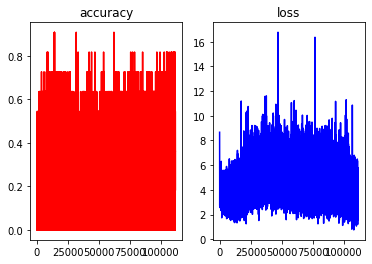

In [2]:

def main():
    #########################################################################
    # Here's some configuration:
    #########################################################################
    BATCH_SIZE = 2^7
    N_EPOCHS = 1

    train_ds, val_ds = prepare_data_loader(BATCH_SIZE)


    example_images, example_labels = next(iter(train_ds.take(1)))


    print("Initial Image size: ", example_images.shape)
    network = ResNet34()

    output = network(example_images)
    print("output shape:", output.shape)

    print(network.summary())


    epoch = tf.Variable(initial_value=tf.constant(0, dtype=tf.dtypes.int64), name='epoch')
    step_in_epoch = tf.Variable(
        initial_value=tf.constant(0, dtype=tf.dtypes.int64),
        name='step_in_epoch')


    # We need an optimizer.  Let's use Adam:
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.00001)

    checkpoint = tf.train.Checkpoint(
        network       = network,
        optimizer     = optimizer,
        epoch         = epoch,
        step_in_epoch = step_in_epoch)

    # Restore the model, if possible:
    latest_checkpoint = tf.train.latest_checkpoint("resnet34/")
    if latest_checkpoint:
        checkpoint.restore(latest_checkpoint)

    while epoch < N_EPOCHS:
        train_epoch(epoch, step_in_epoch, train_ds, val_ds, network, optimizer, BATCH_SIZE, checkpoint)
        epoch.assign_add(1)
        step_in_epoch.assign(0)  
        
    #plt.plot(range(len(acc)), acc, 'r')
    #plt.title('accuracy');
    
    #plt.plot(step_in_epoch, loss, 'b')
    #plt.title('loss');
    
if __name__ == "__main__":
    main()